# Week 5 Generative Adversarial Networks Kaggle Competition

Hello! Welcome to my week 5 Google Colab notebook for the Monet GAN project. This week, we learned about Generative Adversarial Networks and how the neural network uses both a generator and discriminator to develop images or similar data. In this project, we will begin with photo images, and train a GAN model to transfer the style of a Monet painting to the photo. Our generator model will take in the photo, apply the style transfer and then the discriminator will evaluate whether the generated Monet image or the real Monet image is better. The discriminator and generator then continue to develop iteratively, until we stop the training process, where the generator can now develop Monet images from photos.

First, we will load in required data and packages, then begin our preprocessing steps. In this stage, we can then perform some exploration and examine how the photos differ from Monet images, and examine the heavy lifting that our GAN algorithm will have to perform. After exploring the data and preprocessing, we will develop a keras discriminator and generator model, along with a functional pipeline to iteratively update and optimize both models.

The final steps will include image generation from the provided photos, along with a discussion and results from the project. Then, we will submit the final project to the kaggle competition to see how this model stacks up against others. This week has been incredible and quite advanced, so thank you for joining me today as we dive into the world of GANs and Monet paintings!

Join throughout for code along with commentary.

In [ ]:
!pip install kaggle

In [ ]:
import os
os.listdir('/content')

['.config', 'kaggle.json', 'sample_data']

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

The above chunks create our Kaggle environment, such that data can be loaded in easily. This involves installing the Kaggle packages, and porting over the Kaggle API key. In the following chunk, we access the Monet Kaggle competition repository and download the zip files. Then, using the zipfile package, we can extract the zip files and all images.

In [ ]:
!kaggle competitions download -c gan-getting-started

100% 367M/367M [00:20<00:00, 23.7MB/s]
100% 367M/367M [00:20<00:00, 18.6MB/s]


In [ ]:
import zipfile

zip_file_path = '/content/gan-getting-started.zip'

extracted_dir_path = '/content/dataset'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir_path)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection  import train_test_split

Above, we load in the necessary packages. These include standard python analysis and manipulation packages, along with the necessary parts of tensorflow, such that we can build the layers of the GAN model, and properly process the images. In the next chunk, we receive the number of conglomerated image folder locations and their filepaths. We have 20 folders for photo images and 5 for the test monet photos for the discriminator.

In [ ]:
monetfile = tf.io.gfile.glob('/content/dataset/monet_tfrec/*.tfrec')
print('Monet TFRecord Files:', len(monetfile))

photofile = tf.io.gfile.glob('/content/dataset/photo_tfrec/*.tfrec')
print('Photo TFRecord Files:', len(photofile))

Monet TFRecord Files: 5
Photo TFRecord Files: 20


Below, we can see the file paths used for extraction. In this project we will be using the tf record data type, which is an image storage type that allows cohesive use with tensorflow packages like keras, thus limiting the overall preprocessing needed to get the model going.

In [ ]:
monetfile

['/content/dataset/monet_tfrec/monet12-60.tfrec',
 '/content/dataset/monet_tfrec/monet00-60.tfrec',
 '/content/dataset/monet_tfrec/monet04-60.tfrec',
 '/content/dataset/monet_tfrec/monet08-60.tfrec',
 '/content/dataset/monet_tfrec/monet16-60.tfrec']

Now, we setup an image loaded string of functions. Per the Kaggle competition, we know the image dimensions will be 256 x 256 pixels in RGB values. Using tensorflow image processers, we can build a function to load in each image from its filepath. Then, we create records by creating a dictionary to store the image, name, and target. This allows for easy access later. The third function brings it all together and pulls in all the images. From here, we will have our tfrecord image data, and be able to begin exploration and study before the model is set up.

In [ ]:
imagedim = [256, 256]

def load_image(image):
    image = tf.image.decode_image(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    return image

def single_record(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = load_image(example['image'])
    return image

def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(single_record)
    return dataset

In [ ]:
monet = load_dataset(monetfile, labeled=True).batch(1)
photo = load_dataset(photofile, labeled=True).batch(1)

In [ ]:
photo_dataset = load_dataset(photofile)
monet_dataset = load_dataset(monetfile)

photo_data = np.array([img.numpy() for img in photo_dataset])
monet_data = np.array([img.numpy() for img in monet_dataset])

The Kaggle competition provides 7,038 images for style transfer, which will be used in the training of the model along with evaluation. These 7,000+ images are photos that will undergo a style transfer, creating an image of "Monet" like style. Additionally, we see that we also have 300 Monet paintings. These paintings are already complete, and are used to train both the discriminator and the generator in unison. The discriminator will test results from the generator, as well as real Monet paintings, and once the generator can produce images that fool the discriminator (after optimization), we will conclude we have a quality model for submission. In the following chunks, we will view and explore some of the images.

In [ ]:
len(photo_data)

7038

In [ ]:
len(monet_data)

300

In [ ]:
example_monet = next(iter(monet))
example_photo = next(iter(photo))


In [ ]:
example_monet.shape

TensorShape([1, 256, 256, 3])

As expected, the images have size 256 x 256 pixels, with a third dimension of 3, representing RGB values such that the image has color. Below we see 2 chunks of code that allow us to display the records. Because the records come in with values between -1 and 1, we must resize them to 0 and 1, such that we can correctly see the colors. In each of the code chunks we see a photo example and a Monet example. We can see nature shots that will then undergo a style transfer via our generator, and then be compared via the discriminator to judge the quality of the style generation. In this exploration section, we performed necessary loading of images, exploring the dataset and the images, and can now proceed to modeling and training.

(-0.5, 255.5, 255.5, -0.5)

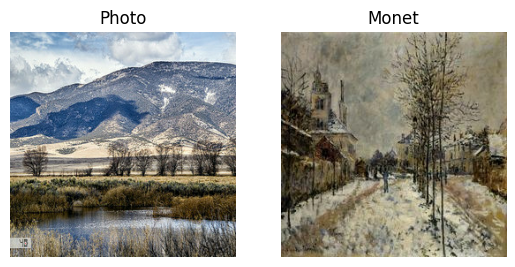

In [ ]:
plt.subplot(121)
plt.title('Photo')
plt.imshow((example_photo[0] + 1)/2)
plt.axis('off')

plt.subplot(122)
plt.title('Monet')
plt.imshow((example_monet[0] + 1)/2)
plt.axis('off')

In [ ]:
monet = load_dataset(monetfile, labeled=True).batch(2)
photo = load_dataset(photofile, labeled=True).batch(2)
itera = iter(monet)
iterb = iter(photo)
example_monet1 = next(itera)
example_monet2 = next(itera)
example_photo1 = next(iterb)
example_photo2 = next(iterb)

(-0.5, 255.5, 255.5, -0.5)

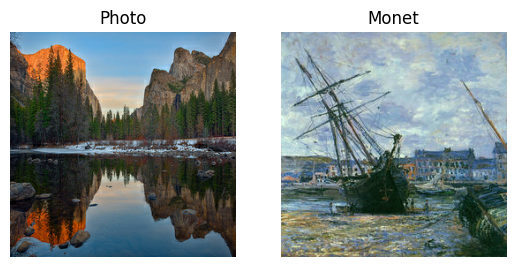

In [ ]:
plt.subplot(121)
plt.title('Photo')
plt.imshow((example_photo2[0] + 1)/2)
plt.axis('off')

plt.subplot(122)
plt.title('Monet')
plt.imshow((example_monet2[0] + 1)/2)
plt.axis('off')

# Training

Now we have reached the portion of the project where we can begin the heavy lifting with training our generator and discriminator. In the chunk below, we load in some more packages for keras, and then setup our Adam neural network optimizer.

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, initializers, Model, Input, Sequential
from tensorflow.keras.optimizers.legacy import Adam
def get_optimizer():
    return Adam(lr=0.001, beta_1=0.5)

Now comes our model architecture setup, first beginning with our generator. The generator is a Keras sequential model, using convolution layers to process the incoming images. As we learned in class, LeakyReLU activation is very important for GANs so we will use them with each layer. We also utilize batch normalization to minimize overfitting to certain colors/patterns. The final key portion is the use of transposed convolution layers, which reverse a regular convolution layer, bringing our image back to its core components, but in image form, instead of being displayed with its core patterns. This allows us to generalize images and reproduce them with the updated style, and produce higher quality style transfers for the discriminator.Finally, we would like our images to have the range of -1 to 1, and thus have the final activation as the tanh function. Join again later on for a discussion of the approaches I took in generator design.

In [ ]:
def get_generator(optimizer):
    generator = Sequential()

    generator.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=[256, 256, 3]))#unit1
    generator.add(layers.LeakyReLU(0.2))

    generator.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))#unit2
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU(0.2))

    generator.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))#unit3
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU(0.2))

    generator.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))#unit4
    generator.add(layers.BatchNormalization())
    generator.add(layers.ReLU())

    generator.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same'))#unit5
    generator.add(layers.BatchNormalization())
    generator.add(layers.ReLU())

    generator.add(layers.Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same', activation='tanh'))

    generator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return generator

Here, we can develop our discriminator function. The discriminator model will take in the images and determine whether it is a Monet, or our fake generated Monet. This portion is key as it allows us to optimize the generator. Because we are merely classifying images, we can use a fairly "simple" architecture. We will use regular convolution layers in 3 batches with varying filters, and strides. Then we flatten the convolution layers and output the classification via the sigmoid activation function. The error produced from misclassification here is what allows us to perform backpropogation through both our discriminator and the generator. After many iterations, we can optimize our generator and produce Monet images.

In [ ]:
def get_discriminator(optimizer):
    discriminator = Sequential()

    discriminator.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=[256, 256, 3]))
    discriminator.add(layers.LeakyReLU(0.25))

    discriminator.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    discriminator.add(layers.BatchNormalization())
    discriminator.add(layers.LeakyReLU(0.25))

    discriminator.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    discriminator.add(layers.BatchNormalization())
    discriminator.add(layers.LeakyReLU(0.25))

    discriminator.add(layers.Flatten())
    discriminator.add(layers.Dense(1, activation='sigmoid'))

    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return discriminator

Now that we have assembled our generator and discriminator we are ready for the next step. Here, we combine the models into one pathway such that images flow in the correct manner through both models and we can properly optimize them. We start our input in the generator and the output flows into the discriminator, before producing our GAN output. This step is a simple way to combine the models into a pipeline for training.

In [ ]:
def get_gan_network(discriminator, generator, optimizer):
    discriminator.trainable = False
    gan_input = Input(shape=(256, 256, 3))
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan = Model(inputs=gan_input, outputs=gan_output)
    gan.compile(loss='binary_crossentropy', optimizer=optimizer)
    return gan

Now comes the heavylifting portion where we setup our training flow. First, we produce a function that allows us to correctly plot the generated images as we proceed through training, as a form of a checkpoint so we can monitor progress. This plotting function uses the same logic as we saw in the EDA step and plots and saves the images. This way we can monitor development as training proceeds. In the previous projects, we could use built in training pipelines to train RNNs, CNNs, and ANNs. With GANs being slightly more complex, there is no built in keras function for us to use during training. Thus we build our own training pipeline. Using assistance from the CycleGAN tutorial along with some stackoverflow work, I was able to develop this model. First, we load in all images from the dataset using our preestablished logic for dataset loading. Then we use our generator, discriminator, and GAN functions to load in the basic architecture for each piece, along with the Adam optimizer used for all 3. Then we setup a for loop to run through each epoch. In each epoch we will run through all images in the batch. We take each photo data, use our generator to predict it, then assign a label to the fake image and real image and feed them both into the discriminator. Then we update the weights in both models and proceed. Now, when running these models, I ran into issues where the models needed to be trained for many epochs. Due to computing issues, I created a section that would download checkpoint models for both the generator and discriminator along with the current images. Then, when my session crashed, I could reload the most recent generator/discriminator models and start again.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from tensorflow.keras.models import load_model

def plot_images(epoch, generator, photo_data, examples=10, dim=(1, 10), figsize=(20, 2)):
    gen_images = generator.predict(real_photos)#generate

    gen_images = (gen_images + 1) / 2.0#standardize

    plt.figure(figsize=figsize)#plot
    for i in range(examples):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(gen_images[i])
        plt.axis('off')
    plt.tight_layout()
    plt.savefig(f'ganimage_epoch_{epoch}.png')
    plt.show()
    plt.close()

def train(epochs=1, batch_size=1, start_epoch=1, checkpoint_dir='checkpoints'):
    os.makedirs(checkpoint_dir, exist_ok=True)

    #load/prep
    photo_dataset = load_dataset(photofile)
    monet_dataset = load_dataset(monetfile)

    photo_data = np.array([img.numpy() for img in photo_dataset])
    monet_data = np.array([img.numpy() for img in monet_dataset])

    adam = get_optimizer()
    #start new or load old
    if start_epoch > 1:
        generator = load_model(f'{checkpoint_dir}/generator_model_epoch_{start_epoch-1}.keras')
        discriminator = load_model(f'{checkpoint_dir}/discriminator_model_epoch_{start_epoch-1}.keras')
    else:
        generator = get_generator(adam)
        discriminator = get_discriminator(adam)

    gan = get_gan_network(discriminator, generator, adam)

    batch_count = photo_data.shape[0] // batch_size

    for epoch in range(start_epoch, epochs + 1):
        print(f'Epoch {epoch}/{epochs}')

        for _ in tqdm(range(batch_count)):
          #for each batch
            idx = np.random.randint(0, photo_data.shape[0], batch_size)
            real_photos = photo_data[idx]
            real_monets = monet_data[np.random.randint(0, monet_data.shape[0], batch_size)]

            generated_monets = generator.predict(real_photos)#heavy lifting

            #updates

            X = np.concatenate([real_monets, generated_monets])
            y_dis = np.zeros(2 * batch_size)
            y_dis[:batch_size] = 1.0
            y_dis[batch_size:] = 0.0

            discriminator.trainable = True
            discloss = discriminator.train_on_batch(X, y_dis)

            y_gen = np.ones(batch_size)
            discriminator.trainable = False
            genloss = gan.train_on_batch(real_photos, y_gen)

            #checkpoints

        if epoch == 1 or epoch % 5 == 0:
            plot_images(epoch, generator, photo_data)

            generator.save(f'{checkpoint_dir}/generator_model_epoch_{epoch}.keras')
            discriminator.save(f'{checkpoint_dir}/discriminator_model_epoch_{epoch}.keras')


The code below executes the training loop, starting from the provided epoch model and proceeding until told to stop. GANs take a very long time to train!

Epoch 26/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 2s 2s/step


  0%|          | 1/1759 [00:05<2:37:12,  5.37s/it]

1/1 [==============================] - 0s 23ms/step


  0%|          | 2/1759 [00:05<1:06:33,  2.27s/it]

1/1 [==============================] - 0s 22ms/step


  0%|          | 3/1759 [00:05<37:31,  1.28s/it]  

1/1 [==============================] - 0s 22ms/step


  0%|          | 4/1759 [00:05<23:54,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 5/1759 [00:05<16:22,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 6/1759 [00:05<11:50,  2.47it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 7/1759 [00:05<08:56,  3.27it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 8/1759 [00:06<07:03,  4.13it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 9/1759 [00:06<05:53,  4.95it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 10/1759 [00:06<05:03,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 11/1759 [00:06<04:25,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 12/1759 [00:06<04:00,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 13/1759 [00:06<03:43,  7.81it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 14/1759 [00:06<03:30,  8.29it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 15/1759 [00:06<03:21,  8.64it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 16/1759 [00:06<03:16,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 17/1759 [00:07<03:11,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 18/1759 [00:07<03:07,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 19/1759 [00:07<03:10,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 20/1759 [00:07<03:07,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 21/1759 [00:07<03:05,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 22/1759 [00:07<03:05,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 23/1759 [00:07<03:04,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 24/1759 [00:07<03:03,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 25/1759 [00:07<03:03,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 26/1759 [00:08<03:02,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 27/1759 [00:08<03:01,  9.52it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 28/1759 [00:08<03:11,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 29/1759 [00:08<03:09,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 30/1759 [00:08<03:07,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 31/1759 [00:08<03:05,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 32/1759 [00:08<03:03,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 33/1759 [00:08<03:02,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 34/1759 [00:08<03:00,  9.54it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 35/1759 [00:08<03:00,  9.53it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 36/1759 [00:09<03:00,  9.57it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 37/1759 [00:09<03:04,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 38/1759 [00:09<03:04,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 39/1759 [00:09<03:03,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 40/1759 [00:09<03:02,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 41/1759 [00:09<03:01,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 42/1759 [00:09<03:01,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 43/1759 [00:09<03:00,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 44/1759 [00:09<03:00,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 45/1759 [00:10<02:59,  9.55it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 46/1759 [00:10<03:02,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 47/1759 [00:10<03:03,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 48/1759 [00:10<03:02,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 49/1759 [00:10<03:00,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 50/1759 [00:10<03:00,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 51/1759 [00:10<02:59,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 52/1759 [00:10<03:00,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 53/1759 [00:10<02:59,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 54/1759 [00:10<02:59,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 55/1759 [00:11<03:02,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 56/1759 [00:11<03:01,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 57/1759 [00:11<03:01,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 58/1759 [00:11<02:59,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 59/1759 [00:11<02:59,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 60/1759 [00:11<02:58,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 61/1759 [00:11<02:58,  9.53it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 62/1759 [00:11<02:57,  9.58it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 63/1759 [00:11<02:57,  9.55it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 64/1759 [00:12<03:00,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 65/1759 [00:12<03:00,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 66/1759 [00:12<03:00,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 67/1759 [00:12<03:00,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 68/1759 [00:12<02:58,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 69/1759 [00:12<02:58,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 70/1759 [00:12<02:58,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 71/1759 [00:12<02:57,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 72/1759 [00:12<02:56,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 73/1759 [00:12<03:00,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 74/1759 [00:13<03:01,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 75/1759 [00:13<03:02,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 76/1759 [00:13<03:01,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 77/1759 [00:13<03:00,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 78/1759 [00:13<02:59,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 79/1759 [00:13<02:57,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 80/1759 [00:13<02:57,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 81/1759 [00:13<02:57,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 82/1759 [00:13<03:02,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 83/1759 [00:14<03:01,  9.23it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 84/1759 [00:14<03:02,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 85/1759 [00:14<03:01,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 86/1759 [00:14<03:00,  9.27it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 87/1759 [00:14<03:01,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 88/1759 [00:14<03:00,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 89/1759 [00:14<02:59,  9.32it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 90/1759 [00:14<02:59,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 91/1759 [00:14<03:00,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 92/1759 [00:15<02:58,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 93/1759 [00:15<02:57,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 94/1759 [00:15<02:56,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 95/1759 [00:15<02:58,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 96/1759 [00:15<02:56,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 97/1759 [00:15<02:55,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 98/1759 [00:15<02:55,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 99/1759 [00:15<02:55,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 100/1759 [00:15<02:58,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 101/1759 [00:15<02:57,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 102/1759 [00:16<02:55,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 103/1759 [00:16<02:56,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 104/1759 [00:16<02:55,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 105/1759 [00:16<02:55,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 106/1759 [00:16<02:53,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 107/1759 [00:16<02:52,  9.56it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 108/1759 [00:16<02:52,  9.57it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 109/1759 [00:16<02:56,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 110/1759 [00:16<02:56,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 111/1759 [00:17<02:55,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 112/1759 [00:17<02:54,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 113/1759 [00:17<02:54,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 114/1759 [00:17<02:54,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 115/1759 [00:17<02:54,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 116/1759 [00:17<02:54,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 117/1759 [00:17<02:53,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 118/1759 [00:17<02:55,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 119/1759 [00:17<02:55,  9.35it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 120/1759 [00:18<02:56,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 121/1759 [00:18<02:55,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 122/1759 [00:18<02:54,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 123/1759 [00:18<02:53,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 124/1759 [00:18<03:00,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 125/1759 [00:18<02:57,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 126/1759 [00:18<02:55,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 127/1759 [00:18<02:57,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 128/1759 [00:18<02:56,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 129/1759 [00:18<02:54,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 130/1759 [00:19<02:52,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 131/1759 [00:19<02:53,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 132/1759 [00:19<02:52,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 133/1759 [00:19<02:51,  9.47it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 134/1759 [00:19<02:56,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 135/1759 [00:19<02:53,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 136/1759 [00:19<02:54,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 137/1759 [00:19<02:53,  9.36it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 138/1759 [00:19<02:53,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 139/1759 [00:20<02:52,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 140/1759 [00:20<02:51,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 141/1759 [00:20<02:51,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 142/1759 [00:20<02:50,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 143/1759 [00:20<02:55,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 144/1759 [00:20<02:54,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 145/1759 [00:20<02:56,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 146/1759 [00:20<02:55,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 147/1759 [00:20<02:55,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 148/1759 [00:21<02:53,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 149/1759 [00:21<02:51,  9.38it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 150/1759 [00:21<02:52,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 151/1759 [00:21<02:52,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 152/1759 [00:21<02:52,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 153/1759 [00:21<02:52,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 154/1759 [00:21<02:54,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 155/1759 [00:21<02:52,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 156/1759 [00:21<02:53,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 157/1759 [00:21<02:52,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 158/1759 [00:22<02:51,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 159/1759 [00:22<02:50,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 160/1759 [00:22<02:49,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 161/1759 [00:22<02:48,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 162/1759 [00:22<02:47,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 163/1759 [00:22<02:54,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 164/1759 [00:22<02:52,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 165/1759 [00:22<02:51,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 166/1759 [00:22<02:51,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 167/1759 [00:23<02:50,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 168/1759 [00:23<02:49,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 169/1759 [00:23<02:48,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 170/1759 [00:23<02:47,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 171/1759 [00:23<02:47,  9.50it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 172/1759 [00:23<02:50,  9.30it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 173/1759 [00:23<02:50,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 174/1759 [00:23<02:49,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 175/1759 [00:23<02:49,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 176/1759 [00:24<02:48,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 177/1759 [00:24<02:46,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 178/1759 [00:24<02:46,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 179/1759 [00:24<02:46,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 180/1759 [00:24<02:46,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 181/1759 [00:24<02:48,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 182/1759 [00:24<02:53,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 183/1759 [00:24<02:53,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 184/1759 [00:24<02:50,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 185/1759 [00:24<02:53,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 186/1759 [00:25<02:51,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 187/1759 [00:25<02:50,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 188/1759 [00:25<02:50,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 189/1759 [00:25<02:49,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 190/1759 [00:25<02:52,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 191/1759 [00:25<02:51,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 192/1759 [00:25<02:50,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 193/1759 [00:25<02:51,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 194/1759 [00:25<02:51,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 195/1759 [00:26<02:50,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 196/1759 [00:26<02:50,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 197/1759 [00:26<02:50,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 198/1759 [00:26<02:48,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 199/1759 [00:26<02:49,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 200/1759 [00:26<02:49,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 201/1759 [00:26<02:47,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 202/1759 [00:26<02:46,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 203/1759 [00:26<02:45,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 204/1759 [00:27<02:44,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 205/1759 [00:27<02:43,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 206/1759 [00:27<02:43,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 207/1759 [00:27<02:42,  9.55it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 208/1759 [00:27<02:45,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 209/1759 [00:27<02:44,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 210/1759 [00:27<02:44,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 211/1759 [00:27<02:43,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 212/1759 [00:27<02:43,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 213/1759 [00:27<02:43,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 214/1759 [00:28<02:43,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 215/1759 [00:28<02:42,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 216/1759 [00:28<02:41,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 217/1759 [00:28<02:44,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 218/1759 [00:28<02:44,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 219/1759 [00:28<02:43,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 220/1759 [00:28<02:43,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 221/1759 [00:28<02:43,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 222/1759 [00:28<02:42,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 223/1759 [00:29<02:41,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 224/1759 [00:29<02:40,  9.57it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 225/1759 [00:29<02:40,  9.58it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 226/1759 [00:29<02:43,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 227/1759 [00:29<02:42,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 228/1759 [00:29<02:42,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 229/1759 [00:29<02:41,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 230/1759 [00:29<02:41,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 231/1759 [00:29<02:42,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 232/1759 [00:29<02:41,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 233/1759 [00:30<02:40,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 234/1759 [00:30<02:40,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 235/1759 [00:30<02:42,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 236/1759 [00:30<02:42,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 237/1759 [00:30<02:42,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 238/1759 [00:30<02:41,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 239/1759 [00:30<02:42,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 240/1759 [00:30<02:41,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 241/1759 [00:30<02:41,  9.39it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 242/1759 [00:31<02:42,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 243/1759 [00:31<02:41,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 244/1759 [00:31<02:43,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 245/1759 [00:31<02:43,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 246/1759 [00:31<02:41,  9.37it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 247/1759 [00:31<02:41,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 248/1759 [00:31<02:41,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 249/1759 [00:31<02:39,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 250/1759 [00:31<02:39,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 251/1759 [00:32<02:39,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 252/1759 [00:32<02:39,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 253/1759 [00:32<02:42,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 254/1759 [00:32<02:42,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 255/1759 [00:32<02:41,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 256/1759 [00:32<02:41,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 257/1759 [00:32<02:40,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 258/1759 [00:32<02:41,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 259/1759 [00:32<02:41,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 260/1759 [00:32<02:39,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 261/1759 [00:33<02:38,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 262/1759 [00:33<02:41,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 263/1759 [00:33<02:40,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 264/1759 [00:33<02:39,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 265/1759 [00:33<02:38,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 266/1759 [00:33<02:38,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 267/1759 [00:33<02:37,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 268/1759 [00:33<02:41,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 269/1759 [00:33<02:41,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 270/1759 [00:34<02:38,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 271/1759 [00:34<02:43,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 272/1759 [00:34<02:41,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 273/1759 [00:34<02:40,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 274/1759 [00:34<02:39,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 275/1759 [00:34<02:38,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 276/1759 [00:34<02:37,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 277/1759 [00:34<02:36,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 278/1759 [00:34<02:36,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 279/1759 [00:35<02:36,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 280/1759 [00:35<02:38,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 281/1759 [00:35<02:38,  9.33it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 282/1759 [00:35<02:37,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 283/1759 [00:35<02:36,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 284/1759 [00:35<02:35,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 285/1759 [00:35<02:35,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 286/1759 [00:35<02:34,  9.54it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 287/1759 [00:35<02:39,  9.26it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 288/1759 [00:35<02:38,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 289/1759 [00:36<02:40,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 290/1759 [00:36<02:39,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 291/1759 [00:36<02:37,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 292/1759 [00:36<02:39,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 293/1759 [00:36<02:38,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 294/1759 [00:36<02:38,  9.25it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 295/1759 [00:36<02:37,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 296/1759 [00:36<02:37,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 297/1759 [00:36<02:38,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 298/1759 [00:37<02:38,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 299/1759 [00:37<02:38,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 300/1759 [00:37<02:38,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 301/1759 [00:37<02:41,  9.04it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 302/1759 [00:37<02:40,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 303/1759 [00:37<02:41,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 304/1759 [00:37<02:46,  8.76it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 305/1759 [00:37<02:45,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 306/1759 [00:37<02:42,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 307/1759 [00:38<02:44,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 308/1759 [00:38<02:40,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 309/1759 [00:38<02:38,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 310/1759 [00:38<02:36,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 311/1759 [00:38<02:35,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 312/1759 [00:38<02:34,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 313/1759 [00:38<02:32,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 314/1759 [00:38<02:31,  9.55it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 315/1759 [00:38<02:36,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 316/1759 [00:39<02:36,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 317/1759 [00:39<02:34,  9.31it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 318/1759 [00:39<02:34,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 319/1759 [00:39<02:33,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 320/1759 [00:39<02:33,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 321/1759 [00:39<02:32,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 322/1759 [00:39<02:32,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 323/1759 [00:39<02:31,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 324/1759 [00:39<02:31,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 325/1759 [00:39<02:34,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 326/1759 [00:40<02:32,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 327/1759 [00:40<02:32,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 328/1759 [00:40<02:31,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 329/1759 [00:40<02:31,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 330/1759 [00:40<02:30,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 331/1759 [00:40<02:30,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 332/1759 [00:40<02:30,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 333/1759 [00:40<02:29,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 334/1759 [00:40<02:37,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 335/1759 [00:41<02:34,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 336/1759 [00:41<02:32,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 337/1759 [00:41<02:31,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 338/1759 [00:41<02:30,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 339/1759 [00:41<02:29,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 340/1759 [00:41<02:28,  9.53it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 341/1759 [00:41<02:28,  9.56it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 342/1759 [00:41<02:28,  9.56it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 343/1759 [00:41<02:31,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 344/1759 [00:42<02:30,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 345/1759 [00:42<02:29,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 346/1759 [00:42<02:29,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 347/1759 [00:42<02:29,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 348/1759 [00:42<02:27,  9.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 349/1759 [00:42<02:27,  9.59it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 350/1759 [00:42<02:26,  9.65it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 351/1759 [00:42<02:26,  9.63it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 352/1759 [00:42<02:29,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 353/1759 [00:42<02:29,  9.40it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 354/1759 [00:43<02:30,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 355/1759 [00:43<02:29,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 356/1759 [00:43<02:29,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 357/1759 [00:43<02:28,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 358/1759 [00:43<02:27,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 359/1759 [00:43<02:27,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 360/1759 [00:43<02:26,  9.57it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 361/1759 [00:43<02:29,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 362/1759 [00:43<02:28,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 363/1759 [00:44<02:27,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 364/1759 [00:44<02:27,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 365/1759 [00:44<02:27,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 366/1759 [00:44<02:26,  9.52it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 367/1759 [00:44<02:27,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 368/1759 [00:44<02:27,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 369/1759 [00:44<02:27,  9.43it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 370/1759 [00:44<02:29,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 371/1759 [00:44<02:28,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 372/1759 [00:44<02:27,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 373/1759 [00:45<02:27,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 374/1759 [00:45<02:26,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 375/1759 [00:45<02:26,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 376/1759 [00:45<02:25,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 377/1759 [00:45<02:26,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 378/1759 [00:45<02:24,  9.56it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 379/1759 [00:45<02:26,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 380/1759 [00:45<02:26,  9.43it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 381/1759 [00:45<02:27,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 382/1759 [00:46<02:27,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 383/1759 [00:46<02:28,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 384/1759 [00:46<02:27,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 385/1759 [00:46<02:26,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 386/1759 [00:46<02:26,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 387/1759 [00:46<02:25,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 388/1759 [00:46<02:27,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 389/1759 [00:46<02:26,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 390/1759 [00:46<02:25,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 391/1759 [00:46<02:24,  9.46it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 392/1759 [00:47<02:25,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 393/1759 [00:47<02:25,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 394/1759 [00:47<02:25,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 395/1759 [00:47<02:24,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 396/1759 [00:47<02:22,  9.57it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 397/1759 [00:47<02:26,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 398/1759 [00:47<02:25,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 399/1759 [00:47<02:25,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 400/1759 [00:47<02:25,  9.31it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 401/1759 [00:48<02:27,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 402/1759 [00:48<02:26,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 403/1759 [00:48<02:25,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 404/1759 [00:48<02:23,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 405/1759 [00:48<02:23,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 406/1759 [00:48<02:25,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 407/1759 [00:48<02:24,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 408/1759 [00:48<02:22,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 409/1759 [00:48<02:23,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 410/1759 [00:49<02:22,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 411/1759 [00:49<02:23,  9.40it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 412/1759 [00:49<02:26,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 413/1759 [00:49<02:31,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 414/1759 [00:49<02:28,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 415/1759 [00:49<02:30,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 416/1759 [00:49<02:27,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 417/1759 [00:49<02:24,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 418/1759 [00:49<02:23,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 419/1759 [00:49<02:22,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 420/1759 [00:50<02:20,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 421/1759 [00:50<02:24,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 422/1759 [00:50<02:22,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 423/1759 [00:50<02:20,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 424/1759 [00:50<02:23,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 425/1759 [00:50<02:22,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 426/1759 [00:50<02:20,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 427/1759 [00:50<02:20,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 428/1759 [00:50<02:19,  9.52it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 429/1759 [00:51<02:19,  9.56it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 430/1759 [00:51<02:18,  9.59it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 431/1759 [00:51<02:19,  9.53it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 432/1759 [00:51<02:19,  9.54it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 433/1759 [00:51<02:22,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 434/1759 [00:51<02:20,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 435/1759 [00:51<02:19,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 436/1759 [00:51<02:18,  9.53it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 437/1759 [00:51<02:19,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 438/1759 [00:51<02:18,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 439/1759 [00:52<02:18,  9.56it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 440/1759 [00:52<02:17,  9.58it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 441/1759 [00:52<02:22,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 442/1759 [00:52<02:20,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 443/1759 [00:52<02:24,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 444/1759 [00:52<02:22,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 445/1759 [00:52<02:21,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 446/1759 [00:52<02:19,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 447/1759 [00:52<02:19,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 448/1759 [00:53<02:18,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 449/1759 [00:53<02:18,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 450/1759 [00:53<02:20,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 451/1759 [00:53<02:19,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 452/1759 [00:53<02:21,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 453/1759 [00:53<02:20,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 454/1759 [00:53<02:18,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 455/1759 [00:53<02:17,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 456/1759 [00:53<02:17,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 457/1759 [00:54<02:16,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 458/1759 [00:54<02:15,  9.62it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 459/1759 [00:54<02:15,  9.58it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 460/1759 [00:54<02:15,  9.60it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 461/1759 [00:54<02:18,  9.39it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 462/1759 [00:54<02:19,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 463/1759 [00:54<02:18,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 464/1759 [00:54<02:17,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 465/1759 [00:54<02:16,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 466/1759 [00:54<02:16,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 467/1759 [00:55<02:16,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 468/1759 [00:55<02:16,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 469/1759 [00:55<02:19,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 470/1759 [00:55<02:20,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 471/1759 [00:55<02:19,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 472/1759 [00:55<02:17,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 473/1759 [00:55<02:16,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 474/1759 [00:55<02:16,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 475/1759 [00:55<02:16,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 476/1759 [00:56<02:14,  9.53it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 477/1759 [00:56<02:13,  9.59it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 478/1759 [00:56<02:14,  9.55it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 479/1759 [00:56<02:17,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 480/1759 [00:56<02:15,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 481/1759 [00:56<02:14,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 482/1759 [00:56<02:15,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 483/1759 [00:56<02:15,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 484/1759 [00:56<02:15,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 485/1759 [00:56<02:15,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 486/1759 [00:57<02:14,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 487/1759 [00:57<02:12,  9.58it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 488/1759 [00:57<02:16,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 489/1759 [00:57<02:20,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 490/1759 [00:57<02:18,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 491/1759 [00:57<02:16,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 492/1759 [00:57<02:15,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 493/1759 [00:57<02:14,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 494/1759 [00:57<02:14,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 495/1759 [00:58<02:12,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 496/1759 [00:58<02:12,  9.53it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 497/1759 [00:58<02:15,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 498/1759 [00:58<02:15,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 499/1759 [00:58<02:14,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 500/1759 [00:58<02:13,  9.45it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 501/1759 [00:58<02:14,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 502/1759 [00:58<02:13,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 503/1759 [00:58<02:12,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 504/1759 [00:59<02:10,  9.62it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 505/1759 [00:59<02:08,  9.72it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 506/1759 [00:59<02:11,  9.53it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 507/1759 [00:59<02:10,  9.62it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 508/1759 [00:59<02:11,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 509/1759 [00:59<02:11,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 510/1759 [00:59<02:12,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 511/1759 [00:59<02:12,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 512/1759 [00:59<02:12,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 513/1759 [00:59<02:13,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 514/1759 [01:00<02:12,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 515/1759 [01:00<02:13,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 516/1759 [01:00<02:12,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 517/1759 [01:00<02:13,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 518/1759 [01:00<02:16,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 519/1759 [01:00<02:15,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 520/1759 [01:00<02:14,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 521/1759 [01:00<02:14,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 522/1759 [01:00<02:14,  9.23it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 523/1759 [01:01<02:21,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 524/1759 [01:01<02:23,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 525/1759 [01:01<02:19,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 526/1759 [01:01<02:17,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 527/1759 [01:01<02:14,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 528/1759 [01:01<02:12,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 529/1759 [01:01<02:11,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 530/1759 [01:01<02:10,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 531/1759 [01:01<02:09,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 532/1759 [01:02<02:09,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 533/1759 [01:02<02:10,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 534/1759 [01:02<02:10,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 535/1759 [01:02<02:09,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 536/1759 [01:02<02:08,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 537/1759 [01:02<02:08,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 538/1759 [01:02<02:08,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 539/1759 [01:02<02:08,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 540/1759 [01:02<02:07,  9.56it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 541/1759 [01:02<02:08,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 542/1759 [01:03<02:10,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 543/1759 [01:03<02:09,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 544/1759 [01:03<02:08,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 545/1759 [01:03<02:08,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 546/1759 [01:03<02:08,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 547/1759 [01:03<02:06,  9.57it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 548/1759 [01:03<02:06,  9.58it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 549/1759 [01:03<02:06,  9.59it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 550/1759 [01:03<02:06,  9.56it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 551/1759 [01:04<02:08,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 552/1759 [01:04<02:07,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 553/1759 [01:04<02:07,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 554/1759 [01:04<02:07,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 555/1759 [01:04<02:06,  9.53it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 556/1759 [01:04<02:06,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 557/1759 [01:04<02:06,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 558/1759 [01:04<02:06,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 559/1759 [01:04<02:05,  9.59it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 560/1759 [01:04<02:06,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 561/1759 [01:05<02:06,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 562/1759 [01:05<02:05,  9.51it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 563/1759 [01:05<02:06,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 564/1759 [01:05<02:05,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 565/1759 [01:05<02:05,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 566/1759 [01:05<02:06,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 567/1759 [01:05<02:04,  9.56it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 568/1759 [01:05<02:03,  9.62it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 569/1759 [01:05<02:07,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 570/1759 [01:06<02:05,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 571/1759 [01:06<02:04,  9.56it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 572/1759 [01:06<02:04,  9.57it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 573/1759 [01:06<02:03,  9.57it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 574/1759 [01:06<02:04,  9.55it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 575/1759 [01:06<02:06,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 576/1759 [01:06<02:04,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 577/1759 [01:06<02:04,  9.52it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 578/1759 [01:06<02:07,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 579/1759 [01:06<02:05,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 580/1759 [01:07<02:04,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 581/1759 [01:07<02:04,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 582/1759 [01:07<02:03,  9.52it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 583/1759 [01:07<02:03,  9.55it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 584/1759 [01:07<02:02,  9.57it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 585/1759 [01:07<02:02,  9.59it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 586/1759 [01:07<02:02,  9.61it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 587/1759 [01:07<02:03,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 588/1759 [01:07<02:03,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 589/1759 [01:08<02:03,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 590/1759 [01:08<02:02,  9.52it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 591/1759 [01:08<02:01,  9.62it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 592/1759 [01:08<02:01,  9.62it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 593/1759 [01:08<02:01,  9.61it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 594/1759 [01:08<02:00,  9.66it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 595/1759 [01:08<02:03,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 596/1759 [01:08<02:05,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 597/1759 [01:08<02:06,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 598/1759 [01:08<02:05,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 599/1759 [01:09<02:03,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 600/1759 [01:09<02:03,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 601/1759 [01:09<02:02,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 602/1759 [01:09<02:01,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 603/1759 [01:09<02:00,  9.56it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 604/1759 [01:09<02:03,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 605/1759 [01:09<02:06,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 606/1759 [01:09<02:05,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 607/1759 [01:09<02:03,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 608/1759 [01:10<02:02,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 609/1759 [01:10<02:02,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 610/1759 [01:10<02:01,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 611/1759 [01:10<02:01,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 612/1759 [01:10<02:01,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 613/1759 [01:10<02:02,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 614/1759 [01:10<02:04,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 615/1759 [01:10<02:03,  9.30it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 616/1759 [01:10<02:03,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 617/1759 [01:11<02:03,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 618/1759 [01:11<02:02,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 619/1759 [01:11<02:01,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 620/1759 [01:11<02:01,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 621/1759 [01:11<02:01,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 622/1759 [01:11<02:00,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 623/1759 [01:11<02:04,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 624/1759 [01:11<02:03,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 625/1759 [01:11<02:04,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 626/1759 [01:12<02:04,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 627/1759 [01:12<02:02,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 628/1759 [01:12<02:02,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 629/1759 [01:12<02:03,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 630/1759 [01:12<02:03,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 631/1759 [01:12<02:01,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 632/1759 [01:12<02:02,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 633/1759 [01:12<02:02,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 634/1759 [01:12<02:02,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 635/1759 [01:12<02:01,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 636/1759 [01:13<02:00,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 637/1759 [01:13<01:59,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 638/1759 [01:13<01:58,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 639/1759 [01:13<01:58,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 640/1759 [01:13<01:57,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 641/1759 [01:13<01:59,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 642/1759 [01:13<02:00,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 643/1759 [01:13<01:58,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 644/1759 [01:13<01:58,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 645/1759 [01:14<01:58,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 646/1759 [01:14<01:57,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 647/1759 [01:14<01:56,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 648/1759 [01:14<01:56,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 649/1759 [01:14<01:55,  9.58it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 650/1759 [01:14<01:58,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 651/1759 [01:14<01:56,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 652/1759 [01:14<01:57,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 653/1759 [01:14<01:57,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 654/1759 [01:14<01:56,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 655/1759 [01:15<01:55,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 656/1759 [01:15<01:55,  9.58it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 657/1759 [01:15<01:55,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 658/1759 [01:15<01:55,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 659/1759 [01:15<01:56,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 660/1759 [01:15<01:56,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 661/1759 [01:15<01:55,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 662/1759 [01:15<01:56,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 663/1759 [01:15<01:55,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 664/1759 [01:16<01:55,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 665/1759 [01:16<01:55,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 666/1759 [01:16<01:54,  9.53it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 667/1759 [01:16<01:54,  9.57it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 668/1759 [01:16<01:55,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 669/1759 [01:16<01:54,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 670/1759 [01:16<01:54,  9.52it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 671/1759 [01:16<01:54,  9.53it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 672/1759 [01:16<01:54,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 673/1759 [01:16<01:54,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 674/1759 [01:17<01:53,  9.53it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 675/1759 [01:17<01:52,  9.61it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 676/1759 [01:17<01:52,  9.60it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 677/1759 [01:17<01:55,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 678/1759 [01:17<01:54,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 679/1759 [01:17<01:53,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 680/1759 [01:17<01:54,  9.46it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 681/1759 [01:17<01:54,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 682/1759 [01:17<01:54,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 683/1759 [01:18<01:54,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 684/1759 [01:18<01:53,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 685/1759 [01:18<01:52,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 686/1759 [01:18<01:54,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 687/1759 [01:18<01:52,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 688/1759 [01:18<01:51,  9.58it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 689/1759 [01:18<01:52,  9.55it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 690/1759 [01:18<01:51,  9.57it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 691/1759 [01:18<01:50,  9.64it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 692/1759 [01:18<01:50,  9.65it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 693/1759 [01:19<01:50,  9.66it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 694/1759 [01:19<01:50,  9.60it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 695/1759 [01:19<01:52,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 696/1759 [01:19<01:52,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 697/1759 [01:19<01:51,  9.54it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 698/1759 [01:19<01:51,  9.56it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 699/1759 [01:19<01:50,  9.58it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 700/1759 [01:19<01:49,  9.64it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 701/1759 [01:19<01:50,  9.56it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 702/1759 [01:20<01:50,  9.59it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 703/1759 [01:20<01:49,  9.61it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 704/1759 [01:20<01:51,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 705/1759 [01:20<01:50,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 706/1759 [01:20<01:50,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 707/1759 [01:20<01:49,  9.58it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 708/1759 [01:20<01:49,  9.63it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 709/1759 [01:20<01:49,  9.59it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 710/1759 [01:20<01:49,  9.60it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 711/1759 [01:20<01:49,  9.60it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 712/1759 [01:21<01:49,  9.60it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 713/1759 [01:21<01:52,  9.33it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 714/1759 [01:21<01:52,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 715/1759 [01:21<01:51,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 716/1759 [01:21<01:50,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 717/1759 [01:21<01:49,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 718/1759 [01:21<01:49,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 719/1759 [01:21<01:48,  9.54it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 720/1759 [01:21<01:50,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 721/1759 [01:22<01:52,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 722/1759 [01:22<01:53,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 723/1759 [01:22<03:17,  5.25it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 724/1759 [01:22<02:51,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 725/1759 [01:22<02:34,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 726/1759 [01:22<02:20,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 727/1759 [01:22<02:14,  7.69it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 728/1759 [01:23<02:08,  8.04it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 729/1759 [01:23<02:03,  8.36it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 730/1759 [01:23<01:59,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 731/1759 [01:23<01:58,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 732/1759 [01:23<01:55,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 733/1759 [01:23<01:53,  9.04it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 734/1759 [01:23<01:52,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 735/1759 [01:23<01:52,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 736/1759 [01:23<01:52,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 737/1759 [01:24<01:52,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 738/1759 [01:24<01:52,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 739/1759 [01:24<01:52,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 740/1759 [01:24<01:53,  8.98it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 741/1759 [01:24<01:56,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 742/1759 [01:24<01:55,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 743/1759 [01:24<01:53,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 744/1759 [01:24<01:52,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 745/1759 [01:24<01:50,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 746/1759 [01:25<01:52,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 747/1759 [01:25<01:50,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 748/1759 [01:25<01:50,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 749/1759 [01:25<01:50,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 750/1759 [01:25<01:49,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 751/1759 [01:25<01:48,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 752/1759 [01:25<01:47,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 753/1759 [01:25<01:46,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 754/1759 [01:25<01:47,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 755/1759 [01:26<01:48,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 756/1759 [01:26<01:48,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 757/1759 [01:26<01:47,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 758/1759 [01:26<01:48,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 759/1759 [01:26<01:48,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 760/1759 [01:26<01:47,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 761/1759 [01:26<01:46,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 762/1759 [01:26<01:47,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 763/1759 [01:26<01:47,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 764/1759 [01:27<01:46,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 765/1759 [01:27<01:45,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 766/1759 [01:27<01:48,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 767/1759 [01:27<01:47,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 768/1759 [01:27<01:46,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 769/1759 [01:27<01:45,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 770/1759 [01:27<01:45,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 771/1759 [01:27<01:44,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 772/1759 [01:27<01:44,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 773/1759 [01:27<01:43,  9.48it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 774/1759 [01:28<01:47,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 775/1759 [01:28<01:49,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 776/1759 [01:28<01:47,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 777/1759 [01:28<01:45,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 778/1759 [01:28<01:44,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 779/1759 [01:28<01:43,  9.43it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 780/1759 [01:28<01:43,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 781/1759 [01:28<01:43,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 782/1759 [01:28<01:43,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 783/1759 [01:29<01:42,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 784/1759 [01:29<01:44,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 785/1759 [01:29<01:44,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 786/1759 [01:29<01:43,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 787/1759 [01:29<01:43,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 788/1759 [01:29<01:42,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 789/1759 [01:29<01:42,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 790/1759 [01:29<01:42,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 791/1759 [01:29<01:41,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 792/1759 [01:29<01:41,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 793/1759 [01:30<01:45,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 794/1759 [01:30<01:44,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 795/1759 [01:30<01:43,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 796/1759 [01:30<01:42,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 797/1759 [01:30<01:41,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 798/1759 [01:30<01:41,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 799/1759 [01:30<01:41,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 800/1759 [01:30<01:41,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 801/1759 [01:30<01:40,  9.54it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 802/1759 [01:31<01:42,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 803/1759 [01:31<01:42,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 804/1759 [01:31<01:42,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 805/1759 [01:31<01:42,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 806/1759 [01:31<01:42,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 807/1759 [01:31<01:41,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 808/1759 [01:31<01:40,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 809/1759 [01:31<01:40,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 810/1759 [01:31<01:40,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 811/1759 [01:32<01:42,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 812/1759 [01:32<01:41,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 813/1759 [01:32<01:41,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 814/1759 [01:32<01:41,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 815/1759 [01:32<01:41,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 816/1759 [01:32<01:40,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 817/1759 [01:32<01:39,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 818/1759 [01:32<01:40,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 819/1759 [01:32<01:39,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 820/1759 [01:32<01:41,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 821/1759 [01:33<01:40,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 822/1759 [01:33<01:40,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 823/1759 [01:33<01:40,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 824/1759 [01:33<01:40,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 825/1759 [01:33<01:39,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 826/1759 [01:33<01:39,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 827/1759 [01:33<01:39,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 828/1759 [01:33<01:39,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 829/1759 [01:33<01:41,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 830/1759 [01:34<01:40,  9.25it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 831/1759 [01:34<01:40,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 832/1759 [01:34<01:40,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 833/1759 [01:34<01:39,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 834/1759 [01:34<01:38,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 835/1759 [01:34<01:39,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 836/1759 [01:34<01:40,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 837/1759 [01:34<01:38,  9.35it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 838/1759 [01:34<01:41,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 839/1759 [01:35<01:40,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 840/1759 [01:35<01:41,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 841/1759 [01:35<01:42,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 842/1759 [01:35<01:41,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 843/1759 [01:35<01:41,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 844/1759 [01:35<01:41,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 845/1759 [01:35<01:41,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 846/1759 [01:35<01:40,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 847/1759 [01:35<01:42,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 848/1759 [01:36<01:40,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 849/1759 [01:36<01:39,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 850/1759 [01:36<01:39,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 851/1759 [01:36<01:39,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 852/1759 [01:36<01:37,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 853/1759 [01:36<01:36,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 854/1759 [01:36<01:36,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 855/1759 [01:36<01:35,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 856/1759 [01:36<01:38,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 857/1759 [01:36<01:36,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 858/1759 [01:37<01:35,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 859/1759 [01:37<01:35,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 860/1759 [01:37<01:35,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 861/1759 [01:37<01:35,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 862/1759 [01:37<01:35,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 863/1759 [01:37<01:35,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 864/1759 [01:37<01:34,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 865/1759 [01:37<01:36,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 866/1759 [01:37<01:35,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 867/1759 [01:38<01:35,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 868/1759 [01:38<01:35,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 869/1759 [01:38<01:35,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 870/1759 [01:38<01:35,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 871/1759 [01:38<01:34,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 872/1759 [01:38<01:34,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 873/1759 [01:38<01:33,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 874/1759 [01:38<01:34,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 875/1759 [01:38<01:34,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 876/1759 [01:39<01:33,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 877/1759 [01:39<01:32,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 878/1759 [01:39<01:32,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 879/1759 [01:39<01:35,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 880/1759 [01:39<01:34,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 881/1759 [01:39<01:33,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 882/1759 [01:39<01:33,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 883/1759 [01:39<01:34,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 884/1759 [01:39<01:34,  9.29it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 885/1759 [01:39<01:33,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 886/1759 [01:40<01:33,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 887/1759 [01:40<01:32,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 888/1759 [01:40<01:33,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 889/1759 [01:40<01:32,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 890/1759 [01:40<01:32,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 891/1759 [01:40<01:32,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 892/1759 [01:40<01:33,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 893/1759 [01:40<01:32,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 894/1759 [01:40<01:32,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 895/1759 [01:41<01:31,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 896/1759 [01:41<01:31,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 897/1759 [01:41<01:31,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 898/1759 [01:41<01:33,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 899/1759 [01:41<01:32,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 900/1759 [01:41<01:31,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 901/1759 [01:41<01:33,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 902/1759 [01:41<01:31,  9.33it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 903/1759 [01:41<01:32,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 904/1759 [01:42<01:32,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 905/1759 [01:42<01:30,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 906/1759 [01:42<01:30,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 907/1759 [01:42<01:30,  9.41it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 908/1759 [01:42<01:31,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 909/1759 [01:42<01:29,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 910/1759 [01:42<01:31,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 911/1759 [01:42<01:30,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 912/1759 [01:42<01:30,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 913/1759 [01:42<01:30,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 914/1759 [01:43<01:30,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 915/1759 [01:43<01:29,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 916/1759 [01:43<01:29,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 917/1759 [01:43<01:29,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 918/1759 [01:43<01:28,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 919/1759 [01:43<01:30,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 920/1759 [01:43<01:30,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 921/1759 [01:43<01:29,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 922/1759 [01:43<01:29,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 923/1759 [01:44<01:29,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 924/1759 [01:44<01:29,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 925/1759 [01:44<01:29,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 926/1759 [01:44<01:28,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 927/1759 [01:44<01:30,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 928/1759 [01:44<01:32,  8.97it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 929/1759 [01:44<01:30,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 930/1759 [01:44<01:30,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 931/1759 [01:44<01:30,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 932/1759 [01:45<01:29,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 933/1759 [01:45<01:28,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 934/1759 [01:45<01:28,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 935/1759 [01:45<01:28,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 936/1759 [01:45<01:28,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 937/1759 [01:45<01:28,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 938/1759 [01:45<01:28,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 939/1759 [01:45<01:28,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 940/1759 [01:45<01:27,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 941/1759 [01:45<01:27,  9.33it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 942/1759 [01:46<01:27,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 943/1759 [01:46<01:27,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 944/1759 [01:46<01:27,  9.31it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 945/1759 [01:46<01:29,  9.14it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 946/1759 [01:46<01:32,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 947/1759 [01:46<01:31,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 948/1759 [01:46<01:30,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 949/1759 [01:46<01:29,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 950/1759 [01:46<01:28,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 951/1759 [01:47<01:27,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 952/1759 [01:47<01:28,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 953/1759 [01:47<01:27,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 954/1759 [01:47<01:27,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 955/1759 [01:47<01:30,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 956/1759 [01:47<01:29,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 957/1759 [01:47<01:28,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 958/1759 [01:47<01:29,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 959/1759 [01:47<01:28,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 960/1759 [01:48<01:27,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 961/1759 [01:48<01:26,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 962/1759 [01:48<01:26,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 963/1759 [01:48<01:25,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 964/1759 [01:48<01:26,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 965/1759 [01:48<01:26,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 966/1759 [01:48<01:25,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 967/1759 [01:48<01:24,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 968/1759 [01:48<01:24,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 969/1759 [01:49<01:24,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 970/1759 [01:49<01:23,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 971/1759 [01:49<01:23,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 972/1759 [01:49<01:23,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 973/1759 [01:49<01:24,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 974/1759 [01:49<01:24,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 975/1759 [01:49<01:23,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 976/1759 [01:49<01:23,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 977/1759 [01:49<01:22,  9.47it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 978/1759 [01:49<01:22,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 979/1759 [01:50<01:22,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 980/1759 [01:50<01:21,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 981/1759 [01:50<01:21,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 982/1759 [01:50<01:23,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 983/1759 [01:50<01:22,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 984/1759 [01:50<01:22,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 985/1759 [01:50<01:25,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 986/1759 [01:50<01:24,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 987/1759 [01:50<01:24,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 988/1759 [01:51<01:22,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 989/1759 [01:51<01:21,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 990/1759 [01:51<01:21,  9.44it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 991/1759 [01:51<01:23,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 992/1759 [01:51<01:22,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 993/1759 [01:51<01:21,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 994/1759 [01:51<01:21,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 995/1759 [01:51<01:21,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 996/1759 [01:51<01:21,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 997/1759 [01:52<01:21,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 998/1759 [01:52<01:21,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 999/1759 [01:52<01:21,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1000/1759 [01:52<01:22,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1001/1759 [01:52<01:21,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1002/1759 [01:52<01:20,  9.42it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1003/1759 [01:52<01:20,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1004/1759 [01:52<01:20,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1005/1759 [01:52<01:20,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1006/1759 [01:52<01:20,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1007/1759 [01:53<01:20,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1008/1759 [01:53<01:19,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1009/1759 [01:53<01:20,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1010/1759 [01:53<01:19,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1011/1759 [01:53<01:19,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1012/1759 [01:53<01:18,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1013/1759 [01:53<01:18,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1014/1759 [01:53<01:18,  9.53it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1015/1759 [01:53<01:18,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1016/1759 [01:54<01:18,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1017/1759 [01:54<01:18,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1018/1759 [01:54<01:19,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1019/1759 [01:54<01:18,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1020/1759 [01:54<01:18,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1021/1759 [01:54<01:18,  9.43it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1022/1759 [01:54<01:19,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1023/1759 [01:54<01:18,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1024/1759 [01:54<01:18,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1025/1759 [01:55<01:17,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1026/1759 [01:55<01:17,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1027/1759 [01:55<01:19,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1028/1759 [01:55<01:18,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1029/1759 [01:55<01:17,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1030/1759 [01:55<01:16,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1031/1759 [01:55<01:17,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 1032/1759 [01:55<01:18,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1033/1759 [01:55<01:18,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1034/1759 [01:55<01:18,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1035/1759 [01:56<01:17,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1036/1759 [01:56<01:18,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1037/1759 [01:56<01:18,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1038/1759 [01:56<01:17,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1039/1759 [01:56<01:17,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1040/1759 [01:56<01:16,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1041/1759 [01:56<01:15,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1042/1759 [01:56<01:15,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1043/1759 [01:56<01:16,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1044/1759 [01:57<01:16,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1045/1759 [01:57<01:17,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1046/1759 [01:57<01:16,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1047/1759 [01:57<01:16,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1048/1759 [01:57<01:16,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1049/1759 [01:57<01:15,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1050/1759 [01:57<01:15,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 1051/1759 [01:57<01:17,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1052/1759 [01:57<01:17,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1053/1759 [01:58<01:18,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1054/1759 [01:58<01:19,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1055/1759 [01:58<01:17,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1056/1759 [01:58<01:17,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1057/1759 [01:58<01:16,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1058/1759 [01:58<01:16,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1059/1759 [01:58<01:17,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1060/1759 [01:58<01:18,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1061/1759 [01:58<01:17,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1062/1759 [01:59<01:16,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1063/1759 [01:59<01:17,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1064/1759 [01:59<01:17,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1065/1759 [01:59<01:16,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1066/1759 [01:59<01:16,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1067/1759 [01:59<01:16,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1068/1759 [01:59<01:16,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1069/1759 [01:59<01:15,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1070/1759 [01:59<01:14,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1071/1759 [02:00<01:14,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1072/1759 [02:00<01:14,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1073/1759 [02:00<01:13,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1074/1759 [02:00<01:13,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1075/1759 [02:00<01:13,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1076/1759 [02:00<01:12,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1077/1759 [02:00<01:11,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1078/1759 [02:00<01:12,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1079/1759 [02:00<01:14,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 1080/1759 [02:00<01:13,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 1081/1759 [02:01<01:13,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1082/1759 [02:01<01:13,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1083/1759 [02:01<01:13,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1084/1759 [02:01<01:12,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1085/1759 [02:01<01:11,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1086/1759 [02:01<01:11,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1087/1759 [02:01<01:11,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1088/1759 [02:01<01:12,  9.30it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1089/1759 [02:01<01:13,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1090/1759 [02:02<01:14,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1091/1759 [02:02<01:12,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1092/1759 [02:02<01:12,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1093/1759 [02:02<01:11,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1094/1759 [02:02<01:11,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1095/1759 [02:02<01:10,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1096/1759 [02:02<01:09,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1097/1759 [02:02<01:09,  9.55it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1098/1759 [02:02<01:11,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1099/1759 [02:03<01:12,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1100/1759 [02:03<01:11,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1101/1759 [02:03<01:10,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1102/1759 [02:03<01:09,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1103/1759 [02:03<01:09,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1104/1759 [02:03<01:09,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1105/1759 [02:03<01:09,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1106/1759 [02:03<01:09,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1107/1759 [02:03<01:08,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1108/1759 [02:03<01:10,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1109/1759 [02:04<01:09,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1110/1759 [02:04<01:09,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1111/1759 [02:04<01:09,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1112/1759 [02:04<01:08,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1113/1759 [02:04<01:08,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1114/1759 [02:04<01:08,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1115/1759 [02:04<01:08,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1116/1759 [02:04<01:08,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 1117/1759 [02:04<01:10,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1118/1759 [02:05<01:10,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 1119/1759 [02:05<01:09,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 1120/1759 [02:05<01:08,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 1121/1759 [02:05<01:08,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1122/1759 [02:05<01:07,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1123/1759 [02:05<01:07,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1124/1759 [02:05<01:06,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1125/1759 [02:05<01:06,  9.53it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1126/1759 [02:05<01:08,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1127/1759 [02:06<01:08,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1128/1759 [02:06<01:07,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1129/1759 [02:06<01:07,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1130/1759 [02:06<01:07,  9.35it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1131/1759 [02:06<01:07,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1132/1759 [02:06<01:06,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1133/1759 [02:06<01:06,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1134/1759 [02:06<01:06,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1135/1759 [02:06<01:07,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1136/1759 [02:06<01:07,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1137/1759 [02:07<01:06,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1138/1759 [02:07<01:05,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1139/1759 [02:07<01:05,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1140/1759 [02:07<01:05,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1141/1759 [02:07<01:04,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1142/1759 [02:07<01:04,  9.56it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1143/1759 [02:07<01:04,  9.58it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 1144/1759 [02:07<01:05,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1145/1759 [02:07<01:06,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1146/1759 [02:08<01:06,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 1147/1759 [02:08<01:05,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1148/1759 [02:08<01:05,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1149/1759 [02:08<01:04,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 1150/1759 [02:08<01:05,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 1151/1759 [02:08<01:04,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 1152/1759 [02:08<01:04,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1153/1759 [02:08<01:05,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1154/1759 [02:08<01:05,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1155/1759 [02:08<01:04,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1156/1759 [02:09<01:04,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1157/1759 [02:09<01:04,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1158/1759 [02:09<01:03,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1159/1759 [02:09<01:03,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1160/1759 [02:09<01:03,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1161/1759 [02:09<01:03,  9.42it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1162/1759 [02:09<01:05,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1163/1759 [02:09<01:04,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1164/1759 [02:09<01:04,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1165/1759 [02:10<01:03,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 1166/1759 [02:10<01:03,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 1167/1759 [02:10<01:03,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 1168/1759 [02:10<01:03,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 1169/1759 [02:10<01:02,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1170/1759 [02:10<01:03,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1171/1759 [02:10<01:05,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1172/1759 [02:10<01:04,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1173/1759 [02:10<01:05,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1174/1759 [02:11<01:07,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1175/1759 [02:11<01:06,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1176/1759 [02:11<01:05,  8.86it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1177/1759 [02:11<01:04,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1178/1759 [02:11<01:03,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1179/1759 [02:11<01:02,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1180/1759 [02:11<01:03,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1181/1759 [02:11<01:02,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1182/1759 [02:11<01:02,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1183/1759 [02:12<01:02,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1184/1759 [02:12<01:03,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1185/1759 [02:12<01:03,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1186/1759 [02:12<01:02,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1187/1759 [02:12<01:02,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1188/1759 [02:12<01:01,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1189/1759 [02:12<01:01,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1190/1759 [02:12<01:01,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1191/1759 [02:12<01:01,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1192/1759 [02:13<01:00,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1193/1759 [02:13<01:00,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1194/1759 [02:13<01:00,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1195/1759 [02:13<00:59,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1196/1759 [02:13<00:59,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1197/1759 [02:13<00:59,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1198/1759 [02:13<01:00,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1199/1759 [02:13<01:00,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1200/1759 [02:13<01:00,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1201/1759 [02:13<00:59,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1202/1759 [02:14<00:59,  9.41it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 1203/1759 [02:14<01:00,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1204/1759 [02:14<00:59,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1205/1759 [02:14<00:59,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 1206/1759 [02:14<00:59,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1207/1759 [02:14<01:00,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 1208/1759 [02:14<00:59,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1209/1759 [02:14<00:58,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1210/1759 [02:14<00:57,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1211/1759 [02:15<00:57,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1212/1759 [02:15<00:57,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1213/1759 [02:15<00:58,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1214/1759 [02:15<00:58,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1215/1759 [02:15<00:58,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1216/1759 [02:15<00:58,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1217/1759 [02:15<00:58,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1218/1759 [02:15<00:58,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1219/1759 [02:15<00:58,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1220/1759 [02:16<00:58,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1221/1759 [02:16<00:57,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1222/1759 [02:16<00:57,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1223/1759 [02:16<00:57,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1224/1759 [02:16<00:56,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1225/1759 [02:16<00:57,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1226/1759 [02:16<00:56,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1227/1759 [02:16<00:56,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1228/1759 [02:16<00:56,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1229/1759 [02:16<00:55,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1230/1759 [02:17<00:56,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1231/1759 [02:17<00:56,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1232/1759 [02:17<00:57,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1233/1759 [02:17<00:56,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1234/1759 [02:17<00:57,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1235/1759 [02:17<00:56,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1236/1759 [02:17<00:56,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1237/1759 [02:17<00:55,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1238/1759 [02:17<00:55,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1239/1759 [02:18<00:55,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1240/1759 [02:18<00:55,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1241/1759 [02:18<00:54,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1242/1759 [02:18<00:54,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1243/1759 [02:18<00:55,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1244/1759 [02:18<00:54,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1245/1759 [02:18<00:54,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1246/1759 [02:18<00:54,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1247/1759 [02:18<00:54,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1248/1759 [02:19<00:54,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1249/1759 [02:19<00:53,  9.53it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1250/1759 [02:19<00:53,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1251/1759 [02:19<00:55,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1252/1759 [02:19<00:55,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1253/1759 [02:19<00:55,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1254/1759 [02:19<00:54,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 1255/1759 [02:19<00:54,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 1256/1759 [02:19<00:54,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1257/1759 [02:19<00:54,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1258/1759 [02:20<00:53,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1259/1759 [02:20<00:53,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1260/1759 [02:20<00:52,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1261/1759 [02:20<00:53,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1262/1759 [02:20<00:52,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1263/1759 [02:20<00:52,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1264/1759 [02:20<00:51,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1265/1759 [02:20<00:51,  9.56it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1266/1759 [02:20<00:51,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1267/1759 [02:21<00:51,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1268/1759 [02:21<00:51,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1269/1759 [02:21<00:51,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1270/1759 [02:21<00:53,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1271/1759 [02:21<00:53,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1272/1759 [02:21<00:53,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1273/1759 [02:21<00:53,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1274/1759 [02:21<00:53,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1275/1759 [02:21<00:53,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1276/1759 [02:22<00:52,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1277/1759 [02:22<00:52,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1278/1759 [02:22<00:52,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1279/1759 [02:22<00:53,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1280/1759 [02:22<00:52,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1281/1759 [02:22<00:52,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1282/1759 [02:22<00:52,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1283/1759 [02:22<00:52,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1284/1759 [02:22<00:52,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1285/1759 [02:23<00:51,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1286/1759 [02:23<00:51,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1287/1759 [02:23<00:51,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1288/1759 [02:23<00:52,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1289/1759 [02:23<00:51,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1290/1759 [02:23<00:51,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1291/1759 [02:23<00:50,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1292/1759 [02:23<00:50,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 1293/1759 [02:23<00:50,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1294/1759 [02:23<00:51,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1295/1759 [02:24<00:50,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 1296/1759 [02:24<00:50,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1297/1759 [02:24<00:50,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1298/1759 [02:24<00:50,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1299/1759 [02:24<00:50,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1300/1759 [02:24<00:50,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1301/1759 [02:24<00:50,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1302/1759 [02:24<00:50,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1303/1759 [02:24<00:49,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1304/1759 [02:25<00:49,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1305/1759 [02:25<00:48,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1306/1759 [02:25<00:49,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1307/1759 [02:25<00:49,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1308/1759 [02:25<00:49,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1309/1759 [02:25<00:48,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1310/1759 [02:25<00:47,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 1311/1759 [02:25<00:47,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1312/1759 [02:25<00:47,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 1313/1759 [02:26<00:47,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1314/1759 [02:26<00:48,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1315/1759 [02:26<00:49,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1316/1759 [02:26<00:48,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 1317/1759 [02:26<00:47,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 1318/1759 [02:26<00:47,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 1319/1759 [02:26<00:47,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 1320/1759 [02:26<00:46,  9.35it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 1321/1759 [02:26<00:46,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 1322/1759 [02:27<00:46,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 1323/1759 [02:27<00:46,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 1324/1759 [02:27<00:46,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1325/1759 [02:27<00:46,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 1326/1759 [02:27<00:46,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1327/1759 [02:27<00:45,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 1328/1759 [02:27<00:45,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1329/1759 [02:27<00:45,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1330/1759 [02:27<00:45,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1331/1759 [02:27<00:45,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1332/1759 [02:28<00:45,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1333/1759 [02:28<00:46,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1334/1759 [02:28<00:45,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1335/1759 [02:28<00:45,  9.23it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 1336/1759 [02:28<00:46,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1337/1759 [02:28<00:45,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1338/1759 [02:28<00:45,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1339/1759 [02:28<00:44,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1340/1759 [02:28<00:44,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1341/1759 [02:29<00:44,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 1342/1759 [02:29<00:44,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 1343/1759 [02:29<00:44,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 1344/1759 [02:29<00:44,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 1345/1759 [02:29<00:44,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1346/1759 [02:29<00:43,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1347/1759 [02:29<00:43,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1348/1759 [02:29<00:43,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1349/1759 [02:29<00:43,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1350/1759 [02:30<00:43,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1351/1759 [02:30<00:43,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1352/1759 [02:30<00:43,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1353/1759 [02:30<00:43,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1354/1759 [02:30<00:43,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1355/1759 [02:30<00:43,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1356/1759 [02:30<00:43,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1357/1759 [02:30<00:42,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1358/1759 [02:30<00:42,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1359/1759 [02:30<00:42,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1360/1759 [02:31<00:42,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1361/1759 [02:31<00:42,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1362/1759 [02:31<00:42,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1363/1759 [02:31<00:42,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1364/1759 [02:31<00:42,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1365/1759 [02:31<00:42,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1366/1759 [02:31<00:42,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1367/1759 [02:31<00:41,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1368/1759 [02:31<00:41,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1369/1759 [02:32<00:42,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1370/1759 [02:32<00:41,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1371/1759 [02:32<00:41,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1372/1759 [02:32<00:41,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1373/1759 [02:32<00:41,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1374/1759 [02:32<00:41,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1375/1759 [02:32<00:41,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1376/1759 [02:32<00:40,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1377/1759 [02:32<00:40,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1378/1759 [02:33<00:41,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1379/1759 [02:33<00:41,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1380/1759 [02:33<00:41,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 1381/1759 [02:33<00:40,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 1382/1759 [02:33<00:40,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 1383/1759 [02:33<00:39,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 1384/1759 [02:33<00:40,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 1385/1759 [02:33<00:40,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1386/1759 [02:33<00:40,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1387/1759 [02:33<00:41,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1388/1759 [02:34<00:40,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1389/1759 [02:34<00:40,  9.15it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 1390/1759 [02:34<00:41,  8.96it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1391/1759 [02:34<00:41,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1392/1759 [02:34<00:40,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1393/1759 [02:34<00:40,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 1394/1759 [02:34<00:39,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 1395/1759 [02:34<00:39,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1396/1759 [02:34<00:39,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 1397/1759 [02:35<00:39,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1398/1759 [02:35<00:39,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 1399/1759 [02:35<00:38,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1400/1759 [02:35<00:38,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1401/1759 [02:35<00:39,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1402/1759 [02:35<00:39,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1403/1759 [02:35<00:39,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1404/1759 [02:35<00:38,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 1405/1759 [02:35<00:39,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 1406/1759 [02:36<00:38,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1407/1759 [02:36<00:38,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1408/1759 [02:36<00:37,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1409/1759 [02:36<00:37,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1410/1759 [02:36<00:37,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1411/1759 [02:36<00:37,  9.31it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1412/1759 [02:36<00:37,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1413/1759 [02:36<00:36,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1414/1759 [02:36<00:37,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1415/1759 [02:37<00:37,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1416/1759 [02:37<00:36,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1417/1759 [02:37<00:36,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1418/1759 [02:37<00:36,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1419/1759 [02:37<00:36,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1420/1759 [02:37<00:36,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1421/1759 [02:37<00:35,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1422/1759 [02:37<00:35,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1423/1759 [02:37<00:36,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1424/1759 [02:38<00:36,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1425/1759 [02:38<00:35,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1426/1759 [02:38<00:35,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1427/1759 [02:38<00:35,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1428/1759 [02:38<00:35,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1429/1759 [02:38<00:34,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 1430/1759 [02:38<00:34,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 1431/1759 [02:38<00:34,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 1432/1759 [02:38<00:35,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 1433/1759 [02:38<00:34,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1434/1759 [02:39<00:34,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1435/1759 [02:39<00:34,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1436/1759 [02:39<00:34,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1437/1759 [02:39<00:34,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1438/1759 [02:39<00:34,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1439/1759 [02:39<00:34,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1440/1759 [02:39<00:33,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1441/1759 [02:39<00:34,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1442/1759 [02:39<00:34,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1443/1759 [02:40<00:34,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1444/1759 [02:40<00:34,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1445/1759 [02:40<00:33,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1446/1759 [02:40<00:33,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1447/1759 [02:40<00:33,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1448/1759 [02:40<00:33,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1449/1759 [02:40<00:32,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1450/1759 [02:40<00:33,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1451/1759 [02:40<00:32,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1452/1759 [02:40<00:32,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1453/1759 [02:41<00:32,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1454/1759 [02:41<00:32,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1455/1759 [02:41<00:32,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1456/1759 [02:41<00:32,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1457/1759 [02:41<00:31,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1458/1759 [02:41<00:31,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1459/1759 [02:41<00:32,  9.35it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1460/1759 [02:41<00:32,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1461/1759 [02:41<00:32,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1462/1759 [02:42<00:31,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1463/1759 [02:42<00:31,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1464/1759 [02:42<00:31,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1465/1759 [02:42<00:31,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1466/1759 [02:42<00:31,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1467/1759 [02:42<00:30,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1468/1759 [02:42<00:31,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1469/1759 [02:42<00:30,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1470/1759 [02:42<00:30,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 1471/1759 [02:43<00:30,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 1472/1759 [02:43<00:30,  9.52it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1473/1759 [02:43<00:29,  9.54it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1474/1759 [02:43<00:29,  9.53it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1475/1759 [02:43<00:30,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1476/1759 [02:43<00:29,  9.52it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1477/1759 [02:43<00:30,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1478/1759 [02:43<00:29,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1479/1759 [02:43<00:29,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1480/1759 [02:43<00:29,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1481/1759 [02:44<00:29,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1482/1759 [02:44<00:29,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1483/1759 [02:44<00:29,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1484/1759 [02:44<00:28,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1485/1759 [02:44<00:28,  9.54it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1486/1759 [02:44<00:29,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1487/1759 [02:44<00:29,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1488/1759 [02:44<00:29,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1489/1759 [02:44<00:30,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 1490/1759 [02:45<00:29,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1491/1759 [02:45<00:29,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 1492/1759 [02:45<00:29,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1493/1759 [02:45<00:29,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1494/1759 [02:45<00:28,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1495/1759 [02:45<00:29,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1496/1759 [02:45<00:29,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1497/1759 [02:45<00:29,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1498/1759 [02:45<00:29,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 1499/1759 [02:46<00:29,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1500/1759 [02:46<00:28,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1501/1759 [02:46<00:29,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1502/1759 [02:46<00:28,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1503/1759 [02:46<00:28,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1504/1759 [02:46<00:28,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1505/1759 [02:46<00:28,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1506/1759 [02:46<00:27,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1507/1759 [02:46<00:28,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1508/1759 [02:47<00:28,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1509/1759 [02:47<00:28,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1510/1759 [02:47<00:27,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1511/1759 [02:47<00:27,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1512/1759 [02:47<00:27,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1513/1759 [02:47<00:27,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1514/1759 [02:47<00:28,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1515/1759 [02:47<00:27,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1516/1759 [02:47<00:27,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1517/1759 [02:48<00:26,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 1518/1759 [02:48<00:26,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 1519/1759 [02:48<00:26,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 1520/1759 [02:48<00:26,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 1521/1759 [02:48<00:25,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1522/1759 [02:48<00:26,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1523/1759 [02:48<00:25,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1524/1759 [02:48<00:25,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1525/1759 [02:48<00:24,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1526/1759 [02:49<00:25,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1527/1759 [02:49<00:24,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1528/1759 [02:49<00:24,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1529/1759 [02:49<00:24,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1530/1759 [02:49<00:24,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1531/1759 [02:49<00:24,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1532/1759 [02:49<00:24,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1533/1759 [02:49<00:24,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1534/1759 [02:49<00:24,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1535/1759 [02:50<00:24,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1536/1759 [02:50<00:24,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1537/1759 [02:50<00:23,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1538/1759 [02:50<00:23,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1539/1759 [02:50<00:23,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1540/1759 [02:50<00:23,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1541/1759 [02:50<00:23,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1542/1759 [02:50<00:23,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1543/1759 [02:50<00:22,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1544/1759 [02:50<00:22,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1545/1759 [02:51<00:22,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1546/1759 [02:51<00:22,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1547/1759 [02:51<00:22,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1548/1759 [02:51<00:22,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1549/1759 [02:51<00:22,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1550/1759 [02:51<00:22,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1551/1759 [02:51<00:21,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1552/1759 [02:51<00:21,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1553/1759 [02:51<00:21,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1554/1759 [02:52<00:21,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1555/1759 [02:52<00:21,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1556/1759 [02:52<00:21,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 1557/1759 [02:52<00:21,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 1558/1759 [02:52<00:21,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 1559/1759 [02:52<00:21,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 1560/1759 [02:52<00:20,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 1561/1759 [02:52<00:20,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1562/1759 [02:52<00:20,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1563/1759 [02:52<00:20,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1564/1759 [02:53<00:20,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1565/1759 [02:53<00:20,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1566/1759 [02:53<00:20,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1567/1759 [02:53<00:20,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1568/1759 [02:53<00:20,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1569/1759 [02:53<00:20,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1570/1759 [02:53<00:20,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1571/1759 [02:53<00:19,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1572/1759 [02:53<00:19,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1573/1759 [02:54<00:19,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1574/1759 [02:54<00:19,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 1575/1759 [02:54<00:19,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 1576/1759 [02:54<00:19,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1577/1759 [02:54<00:19,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1578/1759 [02:54<00:19,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1579/1759 [02:54<00:19,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1580/1759 [02:54<00:19,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1581/1759 [02:54<00:19,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 1582/1759 [02:55<00:18,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 1583/1759 [02:55<00:18,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1584/1759 [02:55<00:18,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1585/1759 [02:55<00:18,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1586/1759 [02:55<00:18,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 1587/1759 [02:55<00:18,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1588/1759 [02:55<00:18,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1589/1759 [02:55<00:17,  9.52it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1590/1759 [02:55<00:17,  9.53it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1591/1759 [02:55<00:17,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1592/1759 [02:56<00:17,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1593/1759 [02:56<00:17,  9.49it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1594/1759 [02:56<00:17,  9.31it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1595/1759 [02:56<00:17,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1596/1759 [02:56<00:17,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1597/1759 [02:56<00:17,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1598/1759 [02:56<00:17,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1599/1759 [02:56<00:17,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1600/1759 [02:56<00:17,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1601/1759 [02:57<00:16,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1602/1759 [02:57<00:16,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1603/1759 [02:57<00:16,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1604/1759 [02:57<00:17,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1605/1759 [02:57<00:17,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 1606/1759 [02:57<00:16,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 1607/1759 [02:57<00:16,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 1608/1759 [02:57<00:16,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 1609/1759 [02:57<00:16,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1610/1759 [02:58<00:16,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1611/1759 [02:58<00:16,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1612/1759 [02:58<00:16,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1613/1759 [02:58<00:16,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1614/1759 [02:58<00:15,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1615/1759 [02:58<00:15,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1616/1759 [02:58<00:15,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1617/1759 [02:58<00:15,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1618/1759 [02:58<00:15,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1619/1759 [02:58<00:14,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1620/1759 [02:59<00:14,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1621/1759 [02:59<00:14,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1622/1759 [02:59<00:14,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1623/1759 [02:59<00:14,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1624/1759 [02:59<00:14,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1625/1759 [02:59<00:14,  9.34it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1626/1759 [02:59<00:14,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1627/1759 [02:59<00:14,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1628/1759 [02:59<00:13,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1629/1759 [03:00<00:13,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1630/1759 [03:00<00:13,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1631/1759 [03:00<00:13,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1632/1759 [03:00<00:13,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1633/1759 [03:00<00:13,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1634/1759 [03:00<00:13,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1635/1759 [03:00<00:13,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1636/1759 [03:00<00:13,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1637/1759 [03:00<00:13,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1638/1759 [03:01<00:13,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1639/1759 [03:01<00:12,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1640/1759 [03:01<00:13,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1641/1759 [03:01<00:12,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1642/1759 [03:01<00:12,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1643/1759 [03:01<00:12,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1644/1759 [03:01<00:12,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 1645/1759 [03:01<00:12,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1646/1759 [03:01<00:12,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1647/1759 [03:02<00:11,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 1648/1759 [03:02<00:11,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 1649/1759 [03:02<00:11,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 1650/1759 [03:02<00:11,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1651/1759 [03:02<00:11,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1652/1759 [03:02<00:11,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1653/1759 [03:02<00:11,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 1654/1759 [03:02<00:11,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 1655/1759 [03:02<00:11,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1656/1759 [03:02<00:11,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1657/1759 [03:03<00:11,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1658/1759 [03:03<00:11,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1659/1759 [03:03<00:11,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1660/1759 [03:03<00:10,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 1661/1759 [03:03<00:10,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 1662/1759 [03:03<00:10,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 1663/1759 [03:03<00:10,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 1664/1759 [03:03<00:10,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1665/1759 [03:03<00:09,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1666/1759 [03:04<00:10,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1667/1759 [03:04<00:09,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 1668/1759 [03:04<00:09,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 1669/1759 [03:04<00:09,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1670/1759 [03:04<00:09,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 1671/1759 [03:04<00:09,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 1672/1759 [03:04<00:09,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 1673/1759 [03:04<00:09,  9.55it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 1674/1759 [03:04<00:08,  9.55it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 1675/1759 [03:05<00:08,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 1676/1759 [03:05<00:08,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1677/1759 [03:05<00:08,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1678/1759 [03:05<00:08,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1679/1759 [03:05<00:08,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1680/1759 [03:05<00:08,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1681/1759 [03:05<00:08,  9.52it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1682/1759 [03:05<00:08,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1683/1759 [03:05<00:07,  9.51it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1684/1759 [03:05<00:08,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1685/1759 [03:06<00:07,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1686/1759 [03:06<00:07,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1687/1759 [03:06<00:07,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1688/1759 [03:06<00:07,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1689/1759 [03:06<00:07,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1690/1759 [03:06<00:07,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1691/1759 [03:06<00:07,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1692/1759 [03:06<00:07,  9.54it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1693/1759 [03:06<00:07,  9.29it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 1694/1759 [03:07<00:13,  4.97it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1695/1759 [03:07<00:11,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 1696/1759 [03:07<00:09,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1697/1759 [03:07<00:08,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1698/1759 [03:07<00:07,  7.74it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1699/1759 [03:07<00:07,  8.10it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1700/1759 [03:07<00:07,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1701/1759 [03:08<00:06,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1702/1759 [03:08<00:06,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1703/1759 [03:08<00:06,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1704/1759 [03:08<00:06,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1705/1759 [03:08<00:06,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1706/1759 [03:08<00:05,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1707/1759 [03:08<00:05,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1708/1759 [03:08<00:05,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1709/1759 [03:08<00:05,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1710/1759 [03:09<00:05,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1711/1759 [03:09<00:05,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1712/1759 [03:09<00:05,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1713/1759 [03:09<00:05,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1714/1759 [03:09<00:05,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1715/1759 [03:09<00:04,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1716/1759 [03:09<00:04,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1717/1759 [03:09<00:04,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1718/1759 [03:09<00:04,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1719/1759 [03:10<00:04,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1720/1759 [03:10<00:04,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1721/1759 [03:10<00:04,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 1722/1759 [03:10<00:04,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1723/1759 [03:10<00:03,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1724/1759 [03:10<00:03,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1725/1759 [03:10<00:03,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1726/1759 [03:10<00:03,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1727/1759 [03:10<00:03,  9.23it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1728/1759 [03:11<00:03,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1729/1759 [03:11<00:03,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1730/1759 [03:11<00:03,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1731/1759 [03:11<00:03,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1732/1759 [03:11<00:02,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 1733/1759 [03:11<00:02,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 1734/1759 [03:11<00:02,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 1735/1759 [03:11<00:02,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 1736/1759 [03:11<00:02,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 1737/1759 [03:12<00:02,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1738/1759 [03:12<00:02,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1739/1759 [03:12<00:02,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1740/1759 [03:12<00:02,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 1741/1759 [03:12<00:01,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1742/1759 [03:12<00:01,  9.08it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1743/1759 [03:12<00:01,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1744/1759 [03:12<00:01,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1745/1759 [03:12<00:01,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1746/1759 [03:13<00:01,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1747/1759 [03:13<00:01,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1748/1759 [03:13<00:01,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1749/1759 [03:13<00:01,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 1750/1759 [03:13<00:00,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1751/1759 [03:13<00:00,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1752/1759 [03:13<00:00,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1753/1759 [03:13<00:00,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1754/1759 [03:13<00:00,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1755/1759 [03:14<00:00,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 1756/1759 [03:14<00:00,  9.28it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1757/1759 [03:14<00:00,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1758/1759 [03:14<00:00,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 1759/1759 [03:14<00:00,  9.05it/s]


Epoch 27/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 1/1759 [00:00<03:14,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 2/1759 [00:00<03:08,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 3/1759 [00:00<03:06,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 4/1759 [00:00<03:08,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 5/1759 [00:00<03:06,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 6/1759 [00:00<03:10,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 7/1759 [00:00<03:09,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 8/1759 [00:00<03:09,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 9/1759 [00:00<03:08,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 10/1759 [00:01<03:06,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 11/1759 [00:01<03:04,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 12/1759 [00:01<03:06,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 13/1759 [00:01<03:07,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 14/1759 [00:01<03:09,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 15/1759 [00:01<03:12,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 16/1759 [00:01<03:10,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 17/1759 [00:01<03:09,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 18/1759 [00:01<03:11,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 19/1759 [00:02<03:08,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 20/1759 [00:02<03:07,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 21/1759 [00:02<03:06,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 22/1759 [00:02<03:05,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 23/1759 [00:02<03:04,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 24/1759 [00:02<03:09,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 25/1759 [00:02<03:08,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 26/1759 [00:02<03:08,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 27/1759 [00:02<03:09,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 28/1759 [00:03<03:08,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 29/1759 [00:03<03:06,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 30/1759 [00:03<03:10,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 31/1759 [00:03<03:09,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 32/1759 [00:03<03:10,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 33/1759 [00:03<03:13,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 34/1759 [00:03<03:11,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 35/1759 [00:03<03:11,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 36/1759 [00:03<03:13,  8.90it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 37/1759 [00:04<03:10,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 38/1759 [00:04<03:09,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 39/1759 [00:04<03:06,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 40/1759 [00:04<03:05,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 41/1759 [00:04<03:04,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 42/1759 [00:04<03:07,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 43/1759 [00:04<03:07,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 44/1759 [00:04<03:05,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 45/1759 [00:04<03:05,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 46/1759 [00:04<03:03,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 47/1759 [00:05<03:02,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 48/1759 [00:05<03:02,  9.36it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 49/1759 [00:05<03:07,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 50/1759 [00:05<03:07,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 51/1759 [00:05<03:11,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 52/1759 [00:05<03:10,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 53/1759 [00:05<03:08,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 54/1759 [00:05<03:06,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 55/1759 [00:05<03:04,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 56/1759 [00:06<03:05,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 57/1759 [00:06<03:04,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 58/1759 [00:06<03:08,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 59/1759 [00:06<03:09,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 60/1759 [00:06<03:12,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 61/1759 [00:06<03:11,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 62/1759 [00:06<03:09,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 63/1759 [00:06<03:07,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 64/1759 [00:06<03:06,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 65/1759 [00:07<03:06,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 66/1759 [00:07<03:03,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 67/1759 [00:07<03:01,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 68/1759 [00:07<03:01,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 69/1759 [00:07<03:05,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 70/1759 [00:07<03:03,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 71/1759 [00:07<03:04,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 72/1759 [00:07<03:03,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 73/1759 [00:07<03:01,  9.27it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 74/1759 [00:08<03:01,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 75/1759 [00:08<03:00,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 76/1759 [00:08<03:00,  9.33it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 77/1759 [00:08<03:05,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 78/1759 [00:08<03:09,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 79/1759 [00:08<03:06,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 80/1759 [00:08<03:05,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 81/1759 [00:08<03:02,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 82/1759 [00:08<03:00,  9.27it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 83/1759 [00:09<02:59,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 84/1759 [00:09<02:58,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 85/1759 [00:09<02:58,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 86/1759 [00:09<02:58,  9.36it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 87/1759 [00:09<03:03,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 88/1759 [00:09<03:02,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 89/1759 [00:09<03:01,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 90/1759 [00:09<03:00,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 91/1759 [00:09<03:01,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 92/1759 [00:10<03:01,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 93/1759 [00:10<03:00,  9.24it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 94/1759 [00:10<03:00,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 95/1759 [00:10<03:04,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 96/1759 [00:10<03:06,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 97/1759 [00:10<03:04,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 98/1759 [00:10<03:04,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 99/1759 [00:10<03:03,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 100/1759 [00:10<03:02,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 101/1759 [00:11<03:00,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 102/1759 [00:11<02:58,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 103/1759 [00:11<02:57,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 104/1759 [00:11<02:56,  9.39it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 105/1759 [00:11<03:01,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 106/1759 [00:11<03:00,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 107/1759 [00:11<02:59,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 108/1759 [00:11<02:58,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 109/1759 [00:11<02:56,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 110/1759 [00:11<02:55,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 111/1759 [00:12<02:55,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 112/1759 [00:12<02:56,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 113/1759 [00:12<02:56,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 114/1759 [00:12<03:01,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 115/1759 [00:12<02:59,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 116/1759 [00:12<02:57,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 117/1759 [00:12<02:58,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 118/1759 [00:12<02:57,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 119/1759 [00:12<02:57,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 120/1759 [00:13<02:56,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 121/1759 [00:13<02:55,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 122/1759 [00:13<02:54,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 123/1759 [00:13<02:58,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 124/1759 [00:13<02:58,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 125/1759 [00:13<02:57,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 126/1759 [00:13<02:56,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 127/1759 [00:13<02:55,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 128/1759 [00:13<02:55,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 129/1759 [00:14<02:54,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 130/1759 [00:14<02:53,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 131/1759 [00:14<02:52,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 132/1759 [00:14<02:56,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 133/1759 [00:14<02:55,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 134/1759 [00:14<02:55,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 135/1759 [00:14<02:55,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 136/1759 [00:14<02:55,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 137/1759 [00:14<02:54,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 138/1759 [00:14<02:53,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 139/1759 [00:15<02:53,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 140/1759 [00:15<02:53,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 141/1759 [00:15<02:55,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 142/1759 [00:15<02:57,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 143/1759 [00:15<02:55,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 144/1759 [00:15<02:56,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 145/1759 [00:15<02:54,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 146/1759 [00:15<02:53,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 147/1759 [00:15<02:53,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 148/1759 [00:16<02:55,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 149/1759 [00:16<02:52,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 150/1759 [00:16<02:58,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 151/1759 [00:16<02:56,  9.12it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 152/1759 [00:16<02:57,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 153/1759 [00:16<02:54,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 154/1759 [00:16<02:53,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 155/1759 [00:16<02:52,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 156/1759 [00:16<02:54,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 157/1759 [00:17<02:53,  9.23it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 158/1759 [00:17<02:54,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 159/1759 [00:17<03:00,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 160/1759 [00:17<02:57,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 161/1759 [00:17<02:56,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 162/1759 [00:17<02:54,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 163/1759 [00:17<02:57,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 164/1759 [00:17<02:58,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 165/1759 [00:17<02:57,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 166/1759 [00:18<02:57,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 167/1759 [00:18<02:54,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 168/1759 [00:18<02:57,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 169/1759 [00:18<02:56,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 170/1759 [00:18<02:56,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 171/1759 [00:18<02:55,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 172/1759 [00:18<02:54,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 173/1759 [00:18<02:52,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 174/1759 [00:18<02:52,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 175/1759 [00:19<02:50,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 176/1759 [00:19<02:48,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 177/1759 [00:19<02:50,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 178/1759 [00:19<02:52,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 179/1759 [00:19<02:51,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 180/1759 [00:19<02:53,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 181/1759 [00:19<02:52,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 182/1759 [00:19<02:50,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 183/1759 [00:19<02:49,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 184/1759 [00:20<02:49,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 185/1759 [00:20<02:49,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 186/1759 [00:20<02:51,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 187/1759 [00:20<02:48,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 188/1759 [00:20<02:48,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 189/1759 [00:20<02:46,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 190/1759 [00:20<02:45,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 191/1759 [00:20<02:47,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 192/1759 [00:20<02:46,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 193/1759 [00:20<02:46,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 194/1759 [00:21<02:46,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 195/1759 [00:21<02:48,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 196/1759 [00:21<02:48,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 197/1759 [00:21<02:47,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 198/1759 [00:21<02:48,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 199/1759 [00:21<02:51,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 200/1759 [00:21<02:50,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 201/1759 [00:21<02:48,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 202/1759 [00:21<02:47,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 203/1759 [00:22<02:45,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 204/1759 [00:22<02:48,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 205/1759 [00:22<02:46,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 206/1759 [00:22<02:45,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 207/1759 [00:22<02:47,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 208/1759 [00:22<02:45,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 209/1759 [00:22<02:47,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 210/1759 [00:22<02:45,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 211/1759 [00:22<02:45,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 212/1759 [00:23<02:45,  9.34it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 213/1759 [00:23<02:51,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 214/1759 [00:23<02:49,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 215/1759 [00:23<02:47,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 216/1759 [00:23<02:47,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 217/1759 [00:23<02:46,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 218/1759 [00:23<02:47,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 219/1759 [00:23<02:48,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 220/1759 [00:23<02:47,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 221/1759 [00:24<02:45,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 222/1759 [00:24<02:50,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 223/1759 [00:24<02:48,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 224/1759 [00:24<02:49,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 225/1759 [00:24<02:49,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 226/1759 [00:24<02:48,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 227/1759 [00:24<02:49,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 228/1759 [00:24<02:46,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 229/1759 [00:24<02:44,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 230/1759 [00:24<02:43,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 231/1759 [00:25<02:46,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 232/1759 [00:25<02:45,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 233/1759 [00:25<02:44,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 234/1759 [00:25<02:43,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 235/1759 [00:25<02:43,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 236/1759 [00:25<02:41,  9.42it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 237/1759 [00:25<02:41,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 238/1759 [00:25<02:41,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 239/1759 [00:25<02:40,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 240/1759 [00:26<02:39,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 241/1759 [00:26<02:43,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 242/1759 [00:26<02:41,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 243/1759 [00:26<02:40,  9.47it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 244/1759 [00:26<02:42,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 245/1759 [00:26<02:41,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 246/1759 [00:26<02:41,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 247/1759 [00:26<02:46,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 248/1759 [00:26<02:45,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 249/1759 [00:27<02:41,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 250/1759 [00:27<02:45,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 251/1759 [00:27<02:42,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 252/1759 [00:27<02:43,  9.23it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 253/1759 [00:27<02:42,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 254/1759 [00:27<02:41,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 255/1759 [00:27<02:39,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 256/1759 [00:27<02:39,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 257/1759 [00:27<02:39,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 258/1759 [00:27<02:38,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 259/1759 [00:28<02:41,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 260/1759 [00:28<02:40,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 261/1759 [00:28<02:39,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 262/1759 [00:28<02:39,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 263/1759 [00:28<02:40,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 264/1759 [00:28<02:41,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 265/1759 [00:28<02:41,  9.27it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 266/1759 [00:28<02:43,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 267/1759 [00:28<02:41,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 268/1759 [00:29<02:44,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 269/1759 [00:29<02:42,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 270/1759 [00:29<02:42,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 271/1759 [00:29<02:41,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 272/1759 [00:29<02:44,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 273/1759 [00:29<02:41,  9.18it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 274/1759 [00:29<02:43,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 275/1759 [00:29<02:43,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 276/1759 [00:29<02:50,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 277/1759 [00:30<02:54,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 278/1759 [00:30<02:53,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 279/1759 [00:30<02:50,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 280/1759 [00:30<02:48,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 281/1759 [00:30<02:44,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 282/1759 [00:30<02:42,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 283/1759 [00:30<02:39,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 284/1759 [00:30<02:39,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 285/1759 [00:30<02:37,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 286/1759 [00:31<02:40,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 287/1759 [00:31<02:38,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 288/1759 [00:31<02:38,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 289/1759 [00:31<02:36,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 290/1759 [00:31<02:37,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 291/1759 [00:31<02:36,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 292/1759 [00:31<02:36,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 293/1759 [00:31<02:35,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 294/1759 [00:31<02:36,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 295/1759 [00:32<02:39,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 296/1759 [00:32<02:39,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 297/1759 [00:32<02:38,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 298/1759 [00:32<02:38,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 299/1759 [00:32<02:37,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 300/1759 [00:32<02:36,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 301/1759 [00:32<02:37,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 302/1759 [00:32<02:36,  9.32it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 303/1759 [00:32<02:40,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 304/1759 [00:33<02:40,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 305/1759 [00:33<02:37,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 306/1759 [00:33<02:36,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 307/1759 [00:33<02:37,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 308/1759 [00:33<02:37,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 309/1759 [00:33<02:36,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 310/1759 [00:33<02:36,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 311/1759 [00:33<02:35,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 312/1759 [00:33<02:35,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 313/1759 [00:33<02:37,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 314/1759 [00:34<02:38,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 315/1759 [00:34<02:36,  9.25it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 316/1759 [00:34<02:37,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 317/1759 [00:34<02:36,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 318/1759 [00:34<02:35,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 319/1759 [00:34<02:37,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 320/1759 [00:34<02:37,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 321/1759 [00:34<02:36,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 322/1759 [00:34<02:38,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 323/1759 [00:35<02:36,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 324/1759 [00:35<02:36,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 325/1759 [00:35<02:34,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 326/1759 [00:35<02:34,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 327/1759 [00:35<02:34,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 328/1759 [00:35<02:35,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 329/1759 [00:35<02:34,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 330/1759 [00:35<02:33,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 331/1759 [00:35<02:41,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 332/1759 [00:36<02:39,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 333/1759 [00:36<02:37,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 334/1759 [00:36<02:34,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 335/1759 [00:36<02:33,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 336/1759 [00:36<02:33,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 337/1759 [00:36<02:32,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 338/1759 [00:36<02:32,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 339/1759 [00:36<02:32,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 340/1759 [00:36<02:36,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 341/1759 [00:37<02:35,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 342/1759 [00:37<02:33,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 343/1759 [00:37<02:33,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 344/1759 [00:37<02:34,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 345/1759 [00:37<02:35,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 346/1759 [00:37<02:35,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 347/1759 [00:37<02:34,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 348/1759 [00:37<02:33,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 349/1759 [00:37<02:35,  9.04it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 350/1759 [00:38<02:40,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 351/1759 [00:38<02:36,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 352/1759 [00:38<02:33,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 353/1759 [00:38<02:31,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 354/1759 [00:38<02:30,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 355/1759 [00:38<02:29,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 356/1759 [00:38<02:29,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 357/1759 [00:38<02:28,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 358/1759 [00:38<02:32,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 359/1759 [00:38<02:31,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 360/1759 [00:39<02:33,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 361/1759 [00:39<02:30,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 362/1759 [00:39<02:30,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 363/1759 [00:39<02:30,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 364/1759 [00:39<02:30,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 365/1759 [00:39<02:30,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 366/1759 [00:39<02:31,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 367/1759 [00:39<02:32,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 368/1759 [00:39<02:31,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 369/1759 [00:40<02:32,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 370/1759 [00:40<02:33,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 371/1759 [00:40<02:32,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 372/1759 [00:40<02:34,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 373/1759 [00:40<02:32,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 374/1759 [00:40<02:32,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 375/1759 [00:40<02:30,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 376/1759 [00:40<02:33,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 377/1759 [00:40<02:31,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 378/1759 [00:41<02:33,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 379/1759 [00:41<02:32,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 380/1759 [00:41<02:33,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 381/1759 [00:41<02:33,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 382/1759 [00:41<02:33,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 383/1759 [00:41<02:32,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 384/1759 [00:41<02:30,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 385/1759 [00:41<02:33,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 386/1759 [00:41<02:35,  8.85it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 387/1759 [00:42<02:31,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 388/1759 [00:42<02:31,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 389/1759 [00:42<02:29,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 390/1759 [00:42<02:27,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 391/1759 [00:42<02:26,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 392/1759 [00:42<02:26,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 393/1759 [00:42<02:26,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 394/1759 [00:42<02:29,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 395/1759 [00:42<02:27,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 396/1759 [00:43<02:27,  9.24it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 397/1759 [00:43<02:30,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 398/1759 [00:43<02:28,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 399/1759 [00:43<02:27,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 400/1759 [00:43<02:26,  9.25it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 401/1759 [00:43<02:26,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 402/1759 [00:43<02:26,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 403/1759 [00:43<02:31,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 404/1759 [00:43<02:29,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 405/1759 [00:44<02:27,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 406/1759 [00:44<02:25,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 407/1759 [00:44<02:25,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 408/1759 [00:44<02:24,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 409/1759 [00:44<02:23,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 410/1759 [00:44<02:23,  9.43it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 411/1759 [00:44<02:24,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 412/1759 [00:44<02:29,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 413/1759 [00:44<02:28,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 414/1759 [00:45<02:25,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 415/1759 [00:45<02:24,  9.28it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 416/1759 [00:45<02:26,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 417/1759 [00:45<02:25,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 418/1759 [00:45<02:25,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 419/1759 [00:45<02:25,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 420/1759 [00:45<02:25,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 421/1759 [00:45<02:28,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 422/1759 [00:45<02:27,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 423/1759 [00:45<02:25,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 424/1759 [00:46<02:25,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 425/1759 [00:46<02:26,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 426/1759 [00:46<02:26,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 427/1759 [00:46<02:25,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 428/1759 [00:46<02:23,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 429/1759 [00:46<02:22,  9.32it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 430/1759 [00:46<02:26,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 431/1759 [00:46<02:24,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 432/1759 [00:46<02:24,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 433/1759 [00:47<02:23,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 434/1759 [00:47<02:22,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 435/1759 [00:47<02:21,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 436/1759 [00:47<02:21,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 437/1759 [00:47<02:22,  9.29it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 438/1759 [00:47<02:24,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 439/1759 [00:47<02:25,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 440/1759 [00:47<02:25,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 441/1759 [00:47<02:23,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 442/1759 [00:48<02:21,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 443/1759 [00:48<02:20,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 444/1759 [00:48<02:20,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 445/1759 [00:48<02:20,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 446/1759 [00:48<02:20,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 447/1759 [00:48<02:19,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 448/1759 [00:48<02:24,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 449/1759 [00:48<02:24,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 450/1759 [00:48<02:22,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 451/1759 [00:49<02:23,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 452/1759 [00:49<02:23,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 453/1759 [00:49<02:20,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 454/1759 [00:49<02:20,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 455/1759 [00:49<02:19,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 456/1759 [00:49<02:18,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 457/1759 [00:49<02:20,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 458/1759 [00:49<02:21,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 459/1759 [00:49<02:20,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 460/1759 [00:49<02:20,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 461/1759 [00:50<02:18,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 462/1759 [00:50<02:18,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 463/1759 [00:50<02:17,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 464/1759 [00:50<02:18,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 465/1759 [00:50<02:17,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 466/1759 [00:50<02:20,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 467/1759 [00:50<02:19,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 468/1759 [00:50<02:20,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 469/1759 [00:50<02:19,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 470/1759 [00:51<02:18,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 471/1759 [00:51<02:17,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 472/1759 [00:51<02:17,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 473/1759 [00:51<02:17,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 474/1759 [00:51<02:17,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 475/1759 [00:51<02:19,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 476/1759 [00:51<02:20,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 477/1759 [00:51<02:20,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 478/1759 [00:51<02:22,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 479/1759 [00:52<02:21,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 480/1759 [00:52<02:21,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 481/1759 [00:52<02:22,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 482/1759 [00:52<02:25,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 483/1759 [00:52<02:22,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 484/1759 [00:52<02:22,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 485/1759 [00:52<02:21,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 486/1759 [00:52<02:20,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 487/1759 [00:52<02:19,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 488/1759 [00:53<02:19,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 489/1759 [00:53<02:19,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 490/1759 [00:53<02:18,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 491/1759 [00:53<02:17,  9.24it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 492/1759 [00:53<02:17,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 493/1759 [00:53<02:19,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 494/1759 [00:53<02:18,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 495/1759 [00:53<02:17,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 496/1759 [00:53<02:16,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 497/1759 [00:54<02:17,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 498/1759 [00:54<02:16,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 499/1759 [00:54<02:15,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 500/1759 [00:54<02:14,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 501/1759 [00:54<02:16,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 502/1759 [00:54<02:19,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 503/1759 [00:54<02:18,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 504/1759 [00:54<02:16,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 505/1759 [00:54<02:16,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 506/1759 [00:55<02:15,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 507/1759 [00:55<02:14,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 508/1759 [00:55<02:13,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 509/1759 [00:55<02:12,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 510/1759 [00:55<02:14,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 511/1759 [00:55<02:17,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 512/1759 [00:55<02:17,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 513/1759 [00:55<02:15,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 514/1759 [00:55<02:14,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 515/1759 [00:55<02:13,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 516/1759 [00:56<02:12,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 517/1759 [00:56<02:10,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 518/1759 [00:56<02:10,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 519/1759 [00:56<02:10,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 520/1759 [00:56<02:13,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 521/1759 [00:56<02:12,  9.37it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 522/1759 [00:56<02:12,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 523/1759 [00:56<02:12,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 524/1759 [00:56<02:16,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 525/1759 [00:57<02:15,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 526/1759 [00:57<02:14,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 527/1759 [00:57<02:12,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 528/1759 [00:57<02:12,  9.26it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 529/1759 [00:57<02:17,  8.92it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 530/1759 [00:57<02:14,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 531/1759 [00:57<02:13,  9.22it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 532/1759 [00:57<02:13,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 533/1759 [00:57<02:11,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 534/1759 [00:58<02:10,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 535/1759 [00:58<02:10,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 536/1759 [00:58<02:11,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 537/1759 [00:58<02:10,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 538/1759 [00:58<02:13,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 539/1759 [00:58<02:12,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 540/1759 [00:58<02:11,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 541/1759 [00:58<02:09,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 542/1759 [00:58<02:09,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 543/1759 [00:58<02:09,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 544/1759 [00:59<02:09,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 545/1759 [00:59<02:09,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 546/1759 [00:59<02:10,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 547/1759 [00:59<02:13,  9.11it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 548/1759 [00:59<02:15,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 549/1759 [00:59<02:13,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 550/1759 [00:59<02:11,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 551/1759 [00:59<02:10,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 552/1759 [00:59<02:11,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 553/1759 [01:00<02:10,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 554/1759 [01:00<02:10,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 555/1759 [01:00<02:09,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 556/1759 [01:00<02:10,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 557/1759 [01:00<02:09,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 558/1759 [01:00<02:09,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 559/1759 [01:00<02:09,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 560/1759 [01:00<02:09,  9.29it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 561/1759 [01:00<02:07,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 562/1759 [01:01<02:07,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 563/1759 [01:01<02:07,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 564/1759 [01:01<02:07,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 565/1759 [01:01<02:08,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 566/1759 [01:01<02:08,  9.29it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 567/1759 [01:01<02:09,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 568/1759 [01:01<02:07,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 569/1759 [01:01<02:06,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 570/1759 [01:01<02:07,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 571/1759 [01:02<02:05,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 572/1759 [01:02<02:04,  9.50it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 573/1759 [01:02<02:05,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 574/1759 [01:02<02:07,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 575/1759 [01:02<02:08,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 576/1759 [01:02<02:07,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 577/1759 [01:02<02:07,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 578/1759 [01:02<02:07,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 579/1759 [01:02<02:08,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 580/1759 [01:02<02:07,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 581/1759 [01:03<02:08,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 582/1759 [01:03<02:05,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 583/1759 [01:03<02:08,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 584/1759 [01:03<02:07,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 585/1759 [01:03<02:07,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 586/1759 [01:03<02:07,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 587/1759 [01:03<02:07,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 588/1759 [01:03<02:07,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 589/1759 [01:03<02:07,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 590/1759 [01:04<02:06,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 591/1759 [01:04<02:04,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 592/1759 [01:04<02:07,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 593/1759 [01:04<02:05,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 594/1759 [01:04<02:04,  9.32it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 595/1759 [01:04<02:05,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 596/1759 [01:04<02:05,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 597/1759 [01:04<02:05,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 598/1759 [01:04<02:05,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 599/1759 [01:05<02:04,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 600/1759 [01:05<02:04,  9.32it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 601/1759 [01:05<02:10,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 602/1759 [01:05<02:08,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 603/1759 [01:05<02:06,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 604/1759 [01:05<02:05,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 605/1759 [01:05<02:04,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 606/1759 [01:05<02:04,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 607/1759 [01:05<02:04,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 608/1759 [01:06<02:04,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 609/1759 [01:06<02:02,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 610/1759 [01:06<02:04,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 611/1759 [01:06<02:03,  9.30it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 612/1759 [01:06<02:03,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 613/1759 [01:06<02:03,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 614/1759 [01:06<02:03,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 615/1759 [01:06<02:02,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 616/1759 [01:06<02:01,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 617/1759 [01:06<02:00,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 618/1759 [01:07<02:00,  9.47it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 619/1759 [01:07<02:02,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 620/1759 [01:07<02:02,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 621/1759 [01:07<02:02,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 622/1759 [01:07<02:01,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 623/1759 [01:07<02:01,  9.36it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 624/1759 [01:07<02:01,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 625/1759 [01:07<02:02,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 626/1759 [01:07<02:04,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 627/1759 [01:08<02:01,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 628/1759 [01:08<02:03,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 629/1759 [01:08<02:01,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 630/1759 [01:08<02:00,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 631/1759 [01:08<02:01,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 632/1759 [01:08<02:00,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 633/1759 [01:08<01:59,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 634/1759 [01:08<02:04,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 635/1759 [01:08<02:02,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 636/1759 [01:09<02:03,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 637/1759 [01:09<02:04,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 638/1759 [01:09<02:01,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 639/1759 [01:09<01:59,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 640/1759 [01:09<01:59,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 641/1759 [01:09<01:58,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 642/1759 [01:09<01:58,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 643/1759 [01:09<01:58,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 644/1759 [01:09<01:57,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 645/1759 [01:09<01:57,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 646/1759 [01:10<01:59,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 647/1759 [01:10<01:59,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 648/1759 [01:10<01:58,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 649/1759 [01:10<01:58,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 650/1759 [01:10<01:57,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 651/1759 [01:10<01:56,  9.54it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 652/1759 [01:10<01:56,  9.48it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 653/1759 [01:10<02:00,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 654/1759 [01:10<01:59,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 655/1759 [01:11<02:00,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 656/1759 [01:11<02:00,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 657/1759 [01:11<01:59,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 658/1759 [01:11<01:58,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 659/1759 [01:11<01:58,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 660/1759 [01:11<01:58,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 661/1759 [01:11<01:57,  9.37it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 662/1759 [01:11<01:58,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 663/1759 [01:11<01:57,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 664/1759 [01:12<01:59,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 665/1759 [01:12<01:57,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 666/1759 [01:12<01:57,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 667/1759 [01:12<01:57,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 668/1759 [01:12<01:59,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 669/1759 [01:12<01:59,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 670/1759 [01:12<01:58,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 671/1759 [01:12<01:58,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 672/1759 [01:12<01:58,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 673/1759 [01:13<01:59,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 674/1759 [01:13<01:59,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 675/1759 [01:13<01:57,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 676/1759 [01:13<01:57,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 677/1759 [01:13<01:55,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 678/1759 [01:13<01:55,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 679/1759 [01:13<01:54,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 680/1759 [01:13<01:54,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 681/1759 [01:13<01:57,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 682/1759 [01:13<01:58,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 683/1759 [01:14<01:57,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 684/1759 [01:14<01:57,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 685/1759 [01:14<01:56,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 686/1759 [01:14<01:56,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 687/1759 [01:14<01:54,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 688/1759 [01:14<01:53,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 689/1759 [01:14<01:52,  9.50it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 690/1759 [01:14<01:52,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 691/1759 [01:14<01:54,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 692/1759 [01:15<01:54,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 693/1759 [01:15<01:54,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 694/1759 [01:15<01:54,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 695/1759 [01:15<01:54,  9.30it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 696/1759 [01:15<01:56,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 697/1759 [01:15<01:55,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 698/1759 [01:15<01:54,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 699/1759 [01:15<01:53,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 700/1759 [01:15<01:58,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 701/1759 [01:16<01:55,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 702/1759 [01:16<01:54,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 703/1759 [01:16<01:54,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 704/1759 [01:16<01:53,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 705/1759 [01:16<01:52,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 706/1759 [01:16<01:53,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 707/1759 [01:16<01:55,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 708/1759 [01:16<01:55,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 709/1759 [01:16<01:56,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 710/1759 [01:17<01:56,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 711/1759 [01:17<01:55,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 712/1759 [01:17<01:54,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 713/1759 [01:17<01:53,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 714/1759 [01:17<01:52,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 715/1759 [01:17<01:51,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 716/1759 [01:17<01:52,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 717/1759 [01:17<01:51,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 718/1759 [01:17<01:53,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 719/1759 [01:18<01:54,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 720/1759 [01:18<01:54,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 721/1759 [01:18<01:52,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 722/1759 [01:18<01:53,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 723/1759 [01:18<01:53,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 724/1759 [01:18<01:52,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 725/1759 [01:18<01:53,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 726/1759 [01:18<01:52,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 727/1759 [01:18<01:53,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 728/1759 [01:18<01:52,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 729/1759 [01:19<01:50,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 730/1759 [01:19<01:51,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 731/1759 [01:19<01:50,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 732/1759 [01:19<01:50,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 733/1759 [01:19<01:51,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 734/1759 [01:19<01:52,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 735/1759 [01:19<01:52,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 736/1759 [01:19<01:53,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 737/1759 [01:19<01:51,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 738/1759 [01:20<01:49,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 739/1759 [01:20<01:48,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 740/1759 [01:20<01:48,  9.41it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 741/1759 [01:20<01:47,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 742/1759 [01:20<01:48,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 743/1759 [01:20<01:48,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 744/1759 [01:20<01:48,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 745/1759 [01:20<01:49,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 746/1759 [01:20<01:49,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 747/1759 [01:21<01:48,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 748/1759 [01:21<01:48,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 749/1759 [01:21<01:48,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 750/1759 [01:21<01:47,  9.35it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 751/1759 [01:21<01:48,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 752/1759 [01:21<01:49,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 753/1759 [01:21<01:47,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 754/1759 [01:21<01:49,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 755/1759 [01:21<01:49,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 756/1759 [01:21<01:47,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 757/1759 [01:22<01:49,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 758/1759 [01:22<01:48,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 759/1759 [01:22<01:47,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 760/1759 [01:22<01:46,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 761/1759 [01:22<01:46,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 762/1759 [01:22<01:45,  9.49it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 763/1759 [01:22<01:46,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 764/1759 [01:22<01:46,  9.32it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 765/1759 [01:22<01:47,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 766/1759 [01:23<01:47,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 767/1759 [01:23<01:46,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 768/1759 [01:23<01:46,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 769/1759 [01:23<01:46,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 770/1759 [01:23<01:47,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 771/1759 [01:23<01:46,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 772/1759 [01:23<01:49,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 773/1759 [01:23<01:48,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 774/1759 [01:23<01:48,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 775/1759 [01:24<01:46,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 776/1759 [01:24<01:47,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 777/1759 [01:24<01:47,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 778/1759 [01:24<01:45,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 779/1759 [01:24<01:45,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 780/1759 [01:24<01:45,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 781/1759 [01:24<01:47,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 782/1759 [01:24<01:46,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 783/1759 [01:24<01:45,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 784/1759 [01:25<01:45,  9.24it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 785/1759 [01:25<01:48,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 786/1759 [01:25<01:47,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 787/1759 [01:25<01:46,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 788/1759 [01:25<01:45,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 789/1759 [01:25<01:45,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 790/1759 [01:25<01:46,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 791/1759 [01:25<01:45,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 792/1759 [01:25<01:45,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 793/1759 [01:26<01:44,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 794/1759 [01:26<01:42,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 795/1759 [01:26<01:41,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 796/1759 [01:26<01:43,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 797/1759 [01:26<01:43,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 798/1759 [01:26<01:42,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 799/1759 [01:26<01:44,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 800/1759 [01:26<01:45,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 801/1759 [01:26<01:43,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 802/1759 [01:26<01:43,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 803/1759 [01:27<01:43,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 804/1759 [01:27<01:46,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 805/1759 [01:27<01:44,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 806/1759 [01:27<01:45,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 807/1759 [01:27<01:45,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 808/1759 [01:27<01:47,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 809/1759 [01:27<01:45,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 810/1759 [01:27<01:44,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 811/1759 [01:27<01:44,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 812/1759 [01:28<01:43,  9.12it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 813/1759 [01:28<01:46,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 814/1759 [01:28<01:45,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 815/1759 [01:28<01:44,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 816/1759 [01:28<01:43,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 817/1759 [01:28<01:45,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 818/1759 [01:28<01:43,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 819/1759 [01:28<01:43,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 820/1759 [01:28<01:42,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 821/1759 [01:29<01:40,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 822/1759 [01:29<01:39,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 823/1759 [01:29<01:38,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 824/1759 [01:29<01:39,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 825/1759 [01:29<01:38,  9.45it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 826/1759 [01:29<01:41,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 827/1759 [01:29<01:40,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 828/1759 [01:29<01:41,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 829/1759 [01:29<01:40,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 830/1759 [01:30<01:40,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 831/1759 [01:30<01:40,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 832/1759 [01:30<01:45,  8.79it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 833/1759 [01:30<01:43,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 834/1759 [01:30<01:42,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 835/1759 [01:30<01:42,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 836/1759 [01:30<01:40,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 837/1759 [01:30<01:39,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 838/1759 [01:30<01:38,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 839/1759 [01:31<01:38,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 840/1759 [01:31<01:38,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 841/1759 [01:31<01:38,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 842/1759 [01:31<01:38,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 843/1759 [01:31<01:38,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 844/1759 [01:31<01:39,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 845/1759 [01:31<01:38,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 846/1759 [01:31<01:37,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 847/1759 [01:31<01:37,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 848/1759 [01:31<01:36,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 849/1759 [01:32<01:36,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 850/1759 [01:32<01:35,  9.48it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 851/1759 [01:32<01:37,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 852/1759 [01:32<01:36,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 853/1759 [01:32<01:39,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 854/1759 [01:32<01:38,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 855/1759 [01:32<01:37,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 856/1759 [01:32<01:37,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 857/1759 [01:32<01:37,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 858/1759 [01:33<01:36,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 859/1759 [01:33<01:35,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 860/1759 [01:33<01:35,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 861/1759 [01:33<01:35,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 862/1759 [01:33<01:37,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 863/1759 [01:33<01:36,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 864/1759 [01:33<01:36,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 865/1759 [01:33<01:36,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 866/1759 [01:33<01:35,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 867/1759 [01:34<01:36,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 868/1759 [01:34<01:36,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 869/1759 [01:34<01:35,  9.32it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 870/1759 [01:34<01:35,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 871/1759 [01:34<01:36,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 872/1759 [01:34<01:35,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 873/1759 [01:34<01:35,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 874/1759 [01:34<01:34,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 875/1759 [01:34<01:35,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 876/1759 [01:35<01:35,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 877/1759 [01:35<01:34,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 878/1759 [01:35<01:35,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 879/1759 [01:35<01:35,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 880/1759 [01:35<01:37,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 881/1759 [01:35<01:37,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 882/1759 [01:35<01:35,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 883/1759 [01:35<01:35,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 884/1759 [01:35<01:34,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 885/1759 [01:35<01:34,  9.27it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 886/1759 [01:36<01:33,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 887/1759 [01:36<01:33,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 888/1759 [01:36<01:33,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 889/1759 [01:36<01:36,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 890/1759 [01:36<01:35,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 891/1759 [01:36<01:34,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 892/1759 [01:36<01:36,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 893/1759 [01:36<01:35,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 894/1759 [01:36<01:34,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 895/1759 [01:37<01:33,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 896/1759 [01:37<01:32,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 897/1759 [01:37<01:32,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 898/1759 [01:37<01:33,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 899/1759 [01:37<02:53,  4.97it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 900/1759 [01:37<02:29,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 901/1759 [01:38<02:12,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 902/1759 [01:38<02:00,  7.09it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 903/1759 [01:38<01:52,  7.61it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 904/1759 [01:38<01:45,  8.07it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 905/1759 [01:38<01:42,  8.36it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 906/1759 [01:38<01:38,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 907/1759 [01:38<01:37,  8.76it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 908/1759 [01:38<01:41,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 909/1759 [01:38<01:39,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 910/1759 [01:39<01:37,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 911/1759 [01:39<01:37,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 912/1759 [01:39<01:36,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 913/1759 [01:39<01:35,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 914/1759 [01:39<01:33,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 915/1759 [01:39<01:33,  9.03it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 916/1759 [01:39<01:35,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 917/1759 [01:39<01:35,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 918/1759 [01:39<01:35,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 919/1759 [01:40<01:35,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 920/1759 [01:40<01:33,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 921/1759 [01:40<01:33,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 922/1759 [01:40<01:33,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 923/1759 [01:40<01:32,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 924/1759 [01:40<01:32,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 925/1759 [01:40<01:33,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 926/1759 [01:40<01:32,  9.04it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 927/1759 [01:40<01:31,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 928/1759 [01:41<01:31,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 929/1759 [01:41<01:31,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 930/1759 [01:41<01:30,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 931/1759 [01:41<01:29,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 932/1759 [01:41<01:31,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 933/1759 [01:41<01:31,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 934/1759 [01:41<01:33,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 935/1759 [01:41<01:32,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 936/1759 [01:41<01:32,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 937/1759 [01:42<01:33,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 938/1759 [01:42<01:31,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 939/1759 [01:42<01:30,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 940/1759 [01:42<01:29,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 941/1759 [01:42<01:29,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 942/1759 [01:42<01:28,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 943/1759 [01:42<01:30,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 944/1759 [01:42<01:29,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 945/1759 [01:42<01:29,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 946/1759 [01:43<01:29,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 947/1759 [01:43<01:29,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 948/1759 [01:43<01:28,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 949/1759 [01:43<01:28,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 950/1759 [01:43<01:27,  9.21it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 951/1759 [01:43<01:29,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 952/1759 [01:43<01:31,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 953/1759 [01:43<01:31,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 954/1759 [01:43<01:30,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 955/1759 [01:44<01:29,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 956/1759 [01:44<01:27,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 957/1759 [01:44<01:29,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 958/1759 [01:44<01:31,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 959/1759 [01:44<01:29,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 960/1759 [01:44<01:29,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 961/1759 [01:44<01:29,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 962/1759 [01:44<01:30,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 963/1759 [01:44<01:30,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 964/1759 [01:45<01:29,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 965/1759 [01:45<01:28,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 966/1759 [01:45<01:26,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 967/1759 [01:45<01:26,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 968/1759 [01:45<01:26,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 969/1759 [01:45<01:25,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 970/1759 [01:45<01:26,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 971/1759 [01:45<01:27,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 972/1759 [01:45<01:26,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 973/1759 [01:46<01:25,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 974/1759 [01:46<01:24,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 975/1759 [01:46<01:24,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 976/1759 [01:46<01:23,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 977/1759 [01:46<01:23,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 978/1759 [01:46<01:22,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 979/1759 [01:46<01:30,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 980/1759 [01:46<01:28,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 981/1759 [01:46<01:27,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 982/1759 [01:47<01:25,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 983/1759 [01:47<01:25,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 984/1759 [01:47<01:24,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 985/1759 [01:47<01:23,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 986/1759 [01:47<01:23,  9.30it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 987/1759 [01:47<01:23,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 988/1759 [01:47<01:26,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 989/1759 [01:47<01:26,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 990/1759 [01:47<01:25,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 991/1759 [01:48<01:24,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 992/1759 [01:48<01:23,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 993/1759 [01:48<01:23,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 994/1759 [01:48<01:22,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 995/1759 [01:48<01:23,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 996/1759 [01:48<01:22,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 997/1759 [01:48<01:26,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 998/1759 [01:48<01:25,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 999/1759 [01:48<01:24,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1000/1759 [01:49<01:24,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1001/1759 [01:49<01:23,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1002/1759 [01:49<01:23,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1003/1759 [01:49<01:22,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1004/1759 [01:49<01:22,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1005/1759 [01:49<01:22,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1006/1759 [01:49<01:23,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1007/1759 [01:49<01:23,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1008/1759 [01:49<01:24,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1009/1759 [01:49<01:23,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1010/1759 [01:50<01:23,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1011/1759 [01:50<01:22,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1012/1759 [01:50<01:21,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1013/1759 [01:50<01:20,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1014/1759 [01:50<01:21,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1015/1759 [01:50<01:23,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1016/1759 [01:50<01:23,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1017/1759 [01:50<01:22,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1018/1759 [01:50<01:22,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1019/1759 [01:51<01:21,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1020/1759 [01:51<01:20,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1021/1759 [01:51<01:20,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1022/1759 [01:51<01:21,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1023/1759 [01:51<01:21,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1024/1759 [01:51<01:22,  8.88it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1025/1759 [01:51<01:23,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1026/1759 [01:51<01:22,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1027/1759 [01:51<01:22,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1028/1759 [01:52<01:22,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1029/1759 [01:52<01:20,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1030/1759 [01:52<01:19,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1031/1759 [01:52<01:19,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1032/1759 [01:52<01:18,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1033/1759 [01:52<01:19,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1034/1759 [01:52<01:19,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1035/1759 [01:52<01:19,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1036/1759 [01:52<01:18,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1037/1759 [01:53<01:17,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1038/1759 [01:53<01:16,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1039/1759 [01:53<01:16,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1040/1759 [01:53<01:17,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1041/1759 [01:53<01:17,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1042/1759 [01:53<01:18,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1043/1759 [01:53<01:18,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1044/1759 [01:53<01:17,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1045/1759 [01:53<01:18,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1046/1759 [01:54<01:17,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1047/1759 [01:54<01:16,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1048/1759 [01:54<01:15,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1049/1759 [01:54<01:15,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1050/1759 [01:54<01:15,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1051/1759 [01:54<01:17,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1052/1759 [01:54<01:16,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1053/1759 [01:54<01:17,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1054/1759 [01:54<01:16,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1055/1759 [01:55<01:16,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1056/1759 [01:55<01:15,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1057/1759 [01:55<01:15,  9.31it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1058/1759 [01:55<01:15,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1059/1759 [01:55<01:15,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1060/1759 [01:55<01:17,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1061/1759 [01:55<01:16,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1062/1759 [01:55<01:15,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1063/1759 [01:55<01:15,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1064/1759 [01:56<01:15,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1065/1759 [01:56<01:15,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1066/1759 [01:56<01:14,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1067/1759 [01:56<01:14,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1068/1759 [01:56<01:14,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1069/1759 [01:56<01:16,  8.97it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1070/1759 [01:56<01:15,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1071/1759 [01:56<01:14,  9.24it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1072/1759 [01:56<01:14,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1073/1759 [01:56<01:14,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1074/1759 [01:57<01:14,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1075/1759 [01:57<01:13,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1076/1759 [01:57<01:12,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1077/1759 [01:57<01:12,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1078/1759 [01:57<01:13,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1079/1759 [01:57<01:13,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1080/1759 [01:57<01:13,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1081/1759 [01:57<01:12,  9.29it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1082/1759 [01:57<01:15,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1083/1759 [01:58<01:13,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1084/1759 [01:58<01:12,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1085/1759 [01:58<01:12,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1086/1759 [01:58<01:12,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1087/1759 [01:58<01:13,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1088/1759 [01:58<01:12,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1089/1759 [01:58<01:14,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1090/1759 [01:58<01:13,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1091/1759 [01:58<01:12,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1092/1759 [01:59<01:12,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1093/1759 [01:59<01:11,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1094/1759 [01:59<01:12,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1095/1759 [01:59<01:11,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1096/1759 [01:59<01:13,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1097/1759 [01:59<01:12,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1098/1759 [01:59<01:12,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1099/1759 [01:59<01:11,  9.20it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1100/1759 [01:59<01:13,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1101/1759 [02:00<01:13,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1102/1759 [02:00<01:11,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1103/1759 [02:00<01:11,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1104/1759 [02:00<01:10,  9.30it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1105/1759 [02:00<01:12,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1106/1759 [02:00<01:11,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1107/1759 [02:00<01:10,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1108/1759 [02:00<01:10,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1109/1759 [02:00<01:09,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1110/1759 [02:01<01:10,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1111/1759 [02:01<01:09,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1112/1759 [02:01<01:10,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1113/1759 [02:01<01:09,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1114/1759 [02:01<01:11,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1115/1759 [02:01<01:11,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1116/1759 [02:01<01:10,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1117/1759 [02:01<01:09,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1118/1759 [02:01<01:10,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1119/1759 [02:01<01:09,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1120/1759 [02:02<01:08,  9.26it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 1121/1759 [02:02<01:09,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1122/1759 [02:02<01:09,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1123/1759 [02:02<01:10,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1124/1759 [02:02<01:09,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1125/1759 [02:02<01:10,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1126/1759 [02:02<01:12,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1127/1759 [02:02<01:11,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1128/1759 [02:03<01:13,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1129/1759 [02:03<01:12,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1130/1759 [02:03<01:11,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1131/1759 [02:03<01:11,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1132/1759 [02:03<01:12,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1133/1759 [02:03<01:12,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1134/1759 [02:03<01:11,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1135/1759 [02:03<01:11,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1136/1759 [02:03<01:09,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1137/1759 [02:04<01:08,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1138/1759 [02:04<01:08,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1139/1759 [02:04<01:07,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1140/1759 [02:04<01:07,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1141/1759 [02:04<01:08,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1142/1759 [02:04<01:07,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1143/1759 [02:04<01:06,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1144/1759 [02:04<01:06,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1145/1759 [02:04<01:05,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1146/1759 [02:04<01:05,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1147/1759 [02:05<01:06,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1148/1759 [02:05<01:06,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1149/1759 [02:05<01:05,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1150/1759 [02:05<01:07,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1151/1759 [02:05<01:06,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1152/1759 [02:05<01:05,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1153/1759 [02:05<01:05,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1154/1759 [02:05<01:05,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1155/1759 [02:05<01:04,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1156/1759 [02:06<01:04,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1157/1759 [02:06<01:03,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1158/1759 [02:06<01:03,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1159/1759 [02:06<01:04,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1160/1759 [02:06<01:05,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1161/1759 [02:06<01:04,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1162/1759 [02:06<01:04,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1163/1759 [02:06<01:04,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1164/1759 [02:06<01:03,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1165/1759 [02:07<01:03,  9.37it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 1166/1759 [02:07<01:03,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 1167/1759 [02:07<01:03,  9.36it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 1168/1759 [02:07<01:04,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 1169/1759 [02:07<01:04,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1170/1759 [02:07<01:03,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1171/1759 [02:07<01:02,  9.37it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1172/1759 [02:07<01:02,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1173/1759 [02:07<01:02,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1174/1759 [02:08<01:02,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1175/1759 [02:08<01:01,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1176/1759 [02:08<01:01,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1177/1759 [02:08<01:03,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1178/1759 [02:08<01:02,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1179/1759 [02:08<01:04,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1180/1759 [02:08<01:04,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1181/1759 [02:08<01:04,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1182/1759 [02:08<01:03,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1183/1759 [02:08<01:03,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1184/1759 [02:09<01:02,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1185/1759 [02:09<01:02,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1186/1759 [02:09<01:03,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1187/1759 [02:09<01:02,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1188/1759 [02:09<01:01,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1189/1759 [02:09<01:01,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1190/1759 [02:09<01:02,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1191/1759 [02:09<01:02,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1192/1759 [02:09<01:03,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1193/1759 [02:10<01:02,  9.05it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1194/1759 [02:10<01:01,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1195/1759 [02:10<01:02,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1196/1759 [02:10<01:01,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1197/1759 [02:10<01:00,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1198/1759 [02:10<00:59,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1199/1759 [02:10<01:00,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1200/1759 [02:10<00:59,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1201/1759 [02:10<00:59,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1202/1759 [02:11<00:59,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1203/1759 [02:11<00:59,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1204/1759 [02:11<01:00,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1205/1759 [02:11<01:00,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1206/1759 [02:11<00:59,  9.24it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 1207/1759 [02:11<00:59,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1208/1759 [02:11<00:59,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1209/1759 [02:11<00:59,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1210/1759 [02:11<00:58,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1211/1759 [02:12<00:59,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1212/1759 [02:12<00:58,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1213/1759 [02:12<00:59,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1214/1759 [02:12<00:59,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1215/1759 [02:12<00:58,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1216/1759 [02:12<00:58,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1217/1759 [02:12<00:57,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1218/1759 [02:12<00:58,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1219/1759 [02:12<00:58,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1220/1759 [02:13<00:58,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1221/1759 [02:13<00:58,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1222/1759 [02:13<00:59,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1223/1759 [02:13<00:58,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1224/1759 [02:13<00:58,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 1225/1759 [02:13<00:58,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1226/1759 [02:13<00:57,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1227/1759 [02:13<00:57,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1228/1759 [02:13<00:58,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 1229/1759 [02:13<00:58,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 1230/1759 [02:14<00:58,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1231/1759 [02:14<00:59,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1232/1759 [02:14<01:00,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1233/1759 [02:14<00:59,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1234/1759 [02:14<00:58,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1235/1759 [02:14<00:56,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1236/1759 [02:14<00:56,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1237/1759 [02:14<00:56,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1238/1759 [02:14<00:56,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1239/1759 [02:15<00:57,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1240/1759 [02:15<00:58,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1241/1759 [02:15<00:59,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1242/1759 [02:15<00:58,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1243/1759 [02:15<00:58,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1244/1759 [02:15<00:57,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1245/1759 [02:15<00:56,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1246/1759 [02:15<00:56,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1247/1759 [02:15<00:56,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1248/1759 [02:16<00:55,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1249/1759 [02:16<00:55,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1250/1759 [02:16<00:56,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1251/1759 [02:16<00:57,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1252/1759 [02:16<00:56,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1253/1759 [02:16<00:55,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1254/1759 [02:16<00:54,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 1255/1759 [02:16<00:53,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1256/1759 [02:16<00:53,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1257/1759 [02:17<00:53,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1258/1759 [02:17<00:53,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1259/1759 [02:17<00:54,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1260/1759 [02:17<00:54,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1261/1759 [02:17<00:54,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1262/1759 [02:17<00:54,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1263/1759 [02:17<00:54,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1264/1759 [02:17<00:54,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1265/1759 [02:17<00:53,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1266/1759 [02:18<00:53,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1267/1759 [02:18<00:52,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1268/1759 [02:18<00:53,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1269/1759 [02:18<00:53,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1270/1759 [02:18<00:52,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1271/1759 [02:18<00:52,  9.27it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1272/1759 [02:18<00:53,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1273/1759 [02:18<00:53,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1274/1759 [02:18<00:53,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1275/1759 [02:19<00:53,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1276/1759 [02:19<00:52,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1277/1759 [02:19<00:53,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1278/1759 [02:19<00:53,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1279/1759 [02:19<00:53,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1280/1759 [02:19<00:53,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1281/1759 [02:19<00:53,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1282/1759 [02:19<00:52,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1283/1759 [02:19<00:52,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1284/1759 [02:20<00:51,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1285/1759 [02:20<00:51,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1286/1759 [02:20<00:51,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1287/1759 [02:20<00:51,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1288/1759 [02:20<00:52,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1289/1759 [02:20<00:52,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1290/1759 [02:20<00:50,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1291/1759 [02:20<00:50,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1292/1759 [02:20<00:50,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1293/1759 [02:21<00:49,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1294/1759 [02:21<00:49,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1295/1759 [02:21<00:50,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 1296/1759 [02:21<00:49,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1297/1759 [02:21<00:51,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1298/1759 [02:21<00:50,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1299/1759 [02:21<00:49,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1300/1759 [02:21<00:49,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1301/1759 [02:21<00:49,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1302/1759 [02:21<00:49,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1303/1759 [02:22<00:48,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1304/1759 [02:22<00:49,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1305/1759 [02:22<00:49,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1306/1759 [02:22<00:48,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1307/1759 [02:22<00:49,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1308/1759 [02:22<00:48,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1309/1759 [02:22<00:48,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1310/1759 [02:22<00:48,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1311/1759 [02:22<00:48,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1312/1759 [02:23<00:47,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 1313/1759 [02:23<00:48,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1314/1759 [02:23<00:47,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 1315/1759 [02:23<00:47,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1316/1759 [02:23<00:47,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1317/1759 [02:23<00:49,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1318/1759 [02:23<00:48,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1319/1759 [02:23<00:48,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1320/1759 [02:23<00:48,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1321/1759 [02:24<00:47,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1322/1759 [02:24<00:48,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1323/1759 [02:24<00:47,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1324/1759 [02:24<00:48,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1325/1759 [02:24<00:47,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 1326/1759 [02:24<00:47,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 1327/1759 [02:24<00:47,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1328/1759 [02:24<00:47,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1329/1759 [02:24<00:47,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1330/1759 [02:25<00:46,  9.23it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1331/1759 [02:25<00:47,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1332/1759 [02:25<00:46,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1333/1759 [02:25<00:46,  9.24it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1334/1759 [02:25<00:46,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1335/1759 [02:25<00:46,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1336/1759 [02:25<00:46,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1337/1759 [02:25<00:46,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1338/1759 [02:25<00:46,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1339/1759 [02:26<00:46,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1340/1759 [02:26<00:47,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1341/1759 [02:26<00:46,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 1342/1759 [02:26<00:45,  9.12it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 1343/1759 [02:26<00:46,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 1344/1759 [02:26<00:45,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 1345/1759 [02:26<00:45,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1346/1759 [02:26<00:45,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1347/1759 [02:26<00:45,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1348/1759 [02:27<00:45,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1349/1759 [02:27<00:46,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1350/1759 [02:27<00:45,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1351/1759 [02:27<00:45,  9.06it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1352/1759 [02:27<00:44,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1353/1759 [02:27<00:45,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1354/1759 [02:27<00:44,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1355/1759 [02:27<00:44,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1356/1759 [02:27<00:43,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1357/1759 [02:28<00:43,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1358/1759 [02:28<00:44,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1359/1759 [02:28<00:43,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1360/1759 [02:28<00:42,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1361/1759 [02:28<00:43,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1362/1759 [02:28<00:42,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1363/1759 [02:28<00:42,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1364/1759 [02:28<00:42,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1365/1759 [02:28<00:42,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1366/1759 [02:28<00:42,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1367/1759 [02:29<00:43,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1368/1759 [02:29<00:42,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1369/1759 [02:29<00:42,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1370/1759 [02:29<00:42,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1371/1759 [02:29<00:41,  9.24it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1372/1759 [02:29<00:41,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1373/1759 [02:29<00:41,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1374/1759 [02:29<00:41,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1375/1759 [02:29<00:41,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1376/1759 [02:30<00:41,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1377/1759 [02:30<00:41,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1378/1759 [02:30<00:41,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1379/1759 [02:30<00:40,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1380/1759 [02:30<00:41,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 1381/1759 [02:30<00:40,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 1382/1759 [02:30<00:42,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 1383/1759 [02:30<00:41,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 1384/1759 [02:30<00:41,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 1385/1759 [02:31<00:41,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1386/1759 [02:31<00:40,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1387/1759 [02:31<00:40,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1388/1759 [02:31<00:39,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1389/1759 [02:31<00:40,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1390/1759 [02:31<00:40,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 1391/1759 [02:31<00:39,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 1392/1759 [02:31<00:39,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 1393/1759 [02:31<00:39,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 1394/1759 [02:32<00:39,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1395/1759 [02:32<00:39,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 1396/1759 [02:32<00:38,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1397/1759 [02:32<00:38,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1398/1759 [02:32<00:38,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 1399/1759 [02:32<00:39,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1400/1759 [02:32<00:39,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1401/1759 [02:32<00:39,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1402/1759 [02:32<00:39,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1403/1759 [02:33<00:39,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1404/1759 [02:33<00:38,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 1405/1759 [02:33<00:39,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1406/1759 [02:33<00:38,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1407/1759 [02:33<00:38,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1408/1759 [02:33<00:38,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1409/1759 [02:33<00:37,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1410/1759 [02:33<00:38,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1411/1759 [02:33<00:37,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1412/1759 [02:34<00:38,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1413/1759 [02:34<00:37,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1414/1759 [02:34<00:37,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1415/1759 [02:34<00:36,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1416/1759 [02:34<00:36,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1417/1759 [02:34<00:36,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1418/1759 [02:34<00:36,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1419/1759 [02:34<00:35,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1420/1759 [02:34<00:36,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1421/1759 [02:34<00:36,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1422/1759 [02:35<00:36,  9.26it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1423/1759 [02:35<00:36,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1424/1759 [02:35<00:36,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1425/1759 [02:35<00:35,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1426/1759 [02:35<00:35,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1427/1759 [02:35<00:35,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1428/1759 [02:35<00:35,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1429/1759 [02:35<00:36,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 1430/1759 [02:35<00:36,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 1431/1759 [02:36<00:35,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 1432/1759 [02:36<00:35,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 1433/1759 [02:36<00:35,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1434/1759 [02:36<00:34,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1435/1759 [02:36<00:34,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1436/1759 [02:36<00:34,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1437/1759 [02:36<00:34,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1438/1759 [02:36<00:34,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1439/1759 [02:36<00:35,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1440/1759 [02:37<00:34,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1441/1759 [02:37<00:34,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1442/1759 [02:37<00:34,  9.31it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1443/1759 [02:37<00:34,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1444/1759 [02:37<00:35,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1445/1759 [02:37<00:35,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1446/1759 [02:37<00:34,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1447/1759 [02:37<00:35,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1448/1759 [02:37<00:35,  8.70it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1449/1759 [02:38<00:36,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1450/1759 [02:38<00:35,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1451/1759 [02:38<00:35,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1452/1759 [02:38<00:35,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1453/1759 [02:38<00:34,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1454/1759 [02:38<00:33,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1455/1759 [02:38<00:33,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1456/1759 [02:38<00:34,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1457/1759 [02:38<00:35,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1458/1759 [02:39<00:33,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1459/1759 [02:39<00:33,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1460/1759 [02:39<00:33,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1461/1759 [02:39<00:33,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1462/1759 [02:39<00:33,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1463/1759 [02:39<00:32,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1464/1759 [02:39<00:32,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1465/1759 [02:39<00:31,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1466/1759 [02:39<00:32,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1467/1759 [02:40<00:32,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1468/1759 [02:40<00:32,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1469/1759 [02:40<00:32,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 1470/1759 [02:40<00:31,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1471/1759 [02:40<00:31,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 1472/1759 [02:40<00:30,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 1473/1759 [02:40<00:30,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1474/1759 [02:40<00:30,  9.43it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1475/1759 [02:40<00:30,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1476/1759 [02:41<00:30,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1477/1759 [02:41<00:30,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1478/1759 [02:41<00:30,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1479/1759 [02:41<00:30,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1480/1759 [02:41<00:30,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1481/1759 [02:41<00:29,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1482/1759 [02:41<00:29,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1483/1759 [02:41<00:29,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1484/1759 [02:41<00:29,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1485/1759 [02:41<00:29,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1486/1759 [02:42<00:29,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1487/1759 [02:42<00:29,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 1488/1759 [02:42<00:29,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1489/1759 [02:42<00:29,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1490/1759 [02:42<00:29,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 1491/1759 [02:42<00:29,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1492/1759 [02:42<00:29,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1493/1759 [02:42<00:29,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 1494/1759 [02:42<00:29,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1495/1759 [02:43<00:29,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1496/1759 [02:43<00:28,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 1497/1759 [02:43<00:28,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 1498/1759 [02:43<00:28,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1499/1759 [02:43<00:28,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1500/1759 [02:43<00:28,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 1501/1759 [02:43<00:28,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1502/1759 [02:43<00:28,  9.03it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1503/1759 [02:43<00:28,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1504/1759 [02:44<00:28,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 1505/1759 [02:44<00:28,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1506/1759 [02:44<00:27,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1507/1759 [02:44<00:27,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1508/1759 [02:44<00:27,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 1509/1759 [02:44<00:26,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1510/1759 [02:44<00:26,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1511/1759 [02:44<00:27,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1512/1759 [02:44<00:26,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1513/1759 [02:45<00:26,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1514/1759 [02:45<00:28,  8.67it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 1515/1759 [02:45<00:27,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 1516/1759 [02:45<00:27,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1517/1759 [02:45<00:26,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 1518/1759 [02:45<00:25,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 1519/1759 [02:45<00:26,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 1520/1759 [02:45<00:26,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 1521/1759 [02:45<00:26,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1522/1759 [02:46<00:25,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1523/1759 [02:46<00:25,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1524/1759 [02:46<00:25,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1525/1759 [02:46<00:25,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1526/1759 [02:46<00:24,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1527/1759 [02:46<00:25,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1528/1759 [02:46<00:25,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1529/1759 [02:46<00:25,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1530/1759 [02:46<00:25,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1531/1759 [02:47<00:25,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1532/1759 [02:47<00:25,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1533/1759 [02:47<00:24,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1534/1759 [02:47<00:24,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1535/1759 [02:47<00:24,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1536/1759 [02:47<00:24,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1537/1759 [02:47<00:24,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1538/1759 [02:47<00:24,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1539/1759 [02:47<00:24,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1540/1759 [02:48<00:24,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1541/1759 [02:48<00:23,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 1542/1759 [02:48<00:23,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1543/1759 [02:48<00:23,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1544/1759 [02:48<00:22,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1545/1759 [02:48<00:23,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1546/1759 [02:48<00:23,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1547/1759 [02:48<00:24,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1548/1759 [02:48<00:24,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1549/1759 [02:49<00:24,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1550/1759 [02:49<00:24,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1551/1759 [02:49<00:24,  8.38it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1552/1759 [02:49<00:24,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1553/1759 [02:49<00:23,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1554/1759 [02:49<00:23,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1555/1759 [02:49<00:23,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1556/1759 [02:49<00:23,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 1557/1759 [02:49<00:23,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1558/1759 [02:50<00:23,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 1559/1759 [02:50<00:23,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 1560/1759 [02:50<00:23,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 1561/1759 [02:50<00:23,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1562/1759 [02:50<00:23,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1563/1759 [02:50<00:23,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1564/1759 [02:50<00:22,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1565/1759 [02:50<00:22,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1566/1759 [02:51<00:22,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1567/1759 [02:51<00:22,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1568/1759 [02:51<00:21,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1569/1759 [02:51<00:20,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1570/1759 [02:51<00:20,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1571/1759 [02:51<00:20,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1572/1759 [02:51<00:20,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1573/1759 [02:51<00:20,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1574/1759 [02:51<00:20,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1575/1759 [02:52<00:20,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1576/1759 [02:52<00:19,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 1577/1759 [02:52<00:20,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1578/1759 [02:52<00:19,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1579/1759 [02:52<00:19,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 1580/1759 [02:52<00:19,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 1581/1759 [02:52<00:19,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1582/1759 [02:52<00:18,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 1583/1759 [02:52<00:19,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 1584/1759 [02:52<00:19,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1585/1759 [02:53<00:19,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 1586/1759 [02:53<00:18,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1587/1759 [02:53<00:18,  9.25it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 1588/1759 [02:53<00:18,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 1589/1759 [02:53<00:18,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 1590/1759 [02:53<00:18,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1591/1759 [02:53<00:18,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1592/1759 [02:53<00:18,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1593/1759 [02:53<00:18,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1594/1759 [02:54<00:17,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1595/1759 [02:54<00:17,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1596/1759 [02:54<00:18,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1597/1759 [02:54<00:17,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1598/1759 [02:54<00:17,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1599/1759 [02:54<00:17,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1600/1759 [02:54<00:17,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1601/1759 [02:54<00:17,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1602/1759 [02:54<00:16,  9.28it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1603/1759 [02:55<00:17,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1604/1759 [02:55<00:16,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1605/1759 [02:55<00:16,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 1606/1759 [02:55<00:16,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 1607/1759 [02:55<00:16,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 1608/1759 [02:55<00:16,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 1609/1759 [02:55<00:16,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1610/1759 [02:55<00:16,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1611/1759 [02:55<00:16,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1612/1759 [02:56<00:15,  9.27it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1613/1759 [02:56<00:15,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1614/1759 [02:56<00:15,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1615/1759 [02:56<00:16,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1616/1759 [02:56<00:15,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1617/1759 [02:56<00:15,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1618/1759 [02:56<00:15,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1619/1759 [02:56<00:15,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1620/1759 [02:56<00:15,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1621/1759 [02:57<00:14,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1622/1759 [02:57<00:14,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1623/1759 [02:57<00:14,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1624/1759 [02:57<00:14,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1625/1759 [02:57<00:14,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1626/1759 [02:57<00:14,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1627/1759 [02:57<00:14,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1628/1759 [02:57<00:14,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1629/1759 [02:57<00:14,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1630/1759 [02:57<00:13,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1631/1759 [02:58<00:13,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1632/1759 [02:58<00:13,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1633/1759 [02:58<00:13,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1634/1759 [02:58<00:13,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1635/1759 [02:58<00:13,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1636/1759 [02:58<00:13,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1637/1759 [02:58<00:13,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1638/1759 [02:58<00:13,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1639/1759 [02:58<00:13,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1640/1759 [02:59<00:12,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1641/1759 [02:59<00:12,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1642/1759 [02:59<00:12,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1643/1759 [02:59<00:12,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1644/1759 [02:59<00:12,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 1645/1759 [02:59<00:12,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1646/1759 [02:59<00:12,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1647/1759 [02:59<00:12,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1648/1759 [02:59<00:12,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 1649/1759 [03:00<00:11,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1650/1759 [03:00<00:11,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 1651/1759 [03:00<00:11,  9.34it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1652/1759 [03:00<00:11,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 1653/1759 [03:00<00:11,  9.43it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 1654/1759 [03:00<00:11,  9.37it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1655/1759 [03:00<00:11,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1656/1759 [03:00<00:11,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1657/1759 [03:00<00:11,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1658/1759 [03:01<00:11,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 1659/1759 [03:01<00:10,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1660/1759 [03:01<00:10,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1661/1759 [03:01<00:10,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1662/1759 [03:01<00:10,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1663/1759 [03:01<00:10,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1664/1759 [03:01<00:10,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1665/1759 [03:01<00:10,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1666/1759 [03:01<00:10,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1667/1759 [03:02<00:10,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1668/1759 [03:02<00:10,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1669/1759 [03:02<00:10,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1670/1759 [03:02<00:09,  9.06it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 1671/1759 [03:02<00:09,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 1672/1759 [03:02<00:09,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1673/1759 [03:02<00:09,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1674/1759 [03:02<00:09,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1675/1759 [03:02<00:09,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1676/1759 [03:03<00:09,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1677/1759 [03:03<00:09,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1678/1759 [03:03<00:09,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1679/1759 [03:03<00:08,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1680/1759 [03:03<00:08,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1681/1759 [03:03<00:08,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1682/1759 [03:03<00:08,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1683/1759 [03:03<00:08,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1684/1759 [03:03<00:08,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1685/1759 [03:04<00:08,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1686/1759 [03:04<00:07,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1687/1759 [03:04<00:07,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1688/1759 [03:04<00:07,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1689/1759 [03:04<00:07,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1690/1759 [03:04<00:07,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1691/1759 [03:04<00:07,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1692/1759 [03:04<00:07,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1693/1759 [03:04<00:06,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1694/1759 [03:04<00:06,  9.51it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 1695/1759 [03:05<00:06,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1696/1759 [03:05<00:06,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1697/1759 [03:05<00:06,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1698/1759 [03:05<00:06,  9.44it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1699/1759 [03:05<00:06,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1700/1759 [03:05<00:06,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1701/1759 [03:05<00:06,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1702/1759 [03:05<00:06,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1703/1759 [03:05<00:06,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1704/1759 [03:06<00:06,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1705/1759 [03:06<00:05,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1706/1759 [03:06<00:05,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1707/1759 [03:06<00:05,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1708/1759 [03:06<00:05,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1709/1759 [03:06<00:05,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1710/1759 [03:06<00:05,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1711/1759 [03:06<00:05,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1712/1759 [03:06<00:05,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1713/1759 [03:07<00:04,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1714/1759 [03:07<00:04,  9.37it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1715/1759 [03:07<00:04,  9.37it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 1716/1759 [03:07<00:04,  9.35it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1717/1759 [03:07<00:04,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 1718/1759 [03:07<00:04,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1719/1759 [03:07<00:04,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1720/1759 [03:07<00:04,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1721/1759 [03:07<00:04,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 1722/1759 [03:08<00:03,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1723/1759 [03:08<00:03,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 1724/1759 [03:08<00:03,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1725/1759 [03:08<00:03,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 1726/1759 [03:08<00:03,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1727/1759 [03:08<00:03,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1728/1759 [03:08<00:03,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1729/1759 [03:08<00:03,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1730/1759 [03:08<00:03,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1731/1759 [03:08<00:03,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 1732/1759 [03:09<00:02,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 1733/1759 [03:09<00:02,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 1734/1759 [03:09<00:02,  9.42it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 1735/1759 [03:09<00:02,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 1736/1759 [03:09<00:02,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 1737/1759 [03:09<00:02,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1738/1759 [03:09<00:02,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1739/1759 [03:09<00:02,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1740/1759 [03:09<00:02,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 1741/1759 [03:10<00:01,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1742/1759 [03:10<00:01,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 1743/1759 [03:10<00:01,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1744/1759 [03:10<00:01,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1745/1759 [03:10<00:01,  9.14it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 1746/1759 [03:10<00:01,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1747/1759 [03:10<00:01,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1748/1759 [03:10<00:01,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1749/1759 [03:10<00:01,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 1750/1759 [03:11<00:00,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 1751/1759 [03:11<00:00,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1752/1759 [03:11<00:00,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1753/1759 [03:11<00:00,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1754/1759 [03:11<00:00,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1755/1759 [03:11<00:00,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1756/1759 [03:11<00:00,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1757/1759 [03:11<00:00,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1758/1759 [03:11<00:00,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 1759/1759 [03:12<00:00,  9.16it/s]


Epoch 28/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 1/1759 [00:00<03:04,  9.50it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 2/1759 [00:00<03:06,  9.42it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 3/1759 [00:00<03:06,  9.39it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 4/1759 [00:00<03:16,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 5/1759 [00:00<03:14,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 6/1759 [00:00<03:14,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 7/1759 [00:00<03:15,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 8/1759 [00:00<03:13,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 9/1759 [00:00<03:14,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 10/1759 [00:01<03:13,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 11/1759 [00:01<03:11,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 12/1759 [00:01<03:10,  9.16it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 13/1759 [00:01<03:14,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 14/1759 [00:01<03:15,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 15/1759 [00:01<03:15,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 16/1759 [00:01<03:13,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 17/1759 [00:01<03:18,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 18/1759 [00:02<03:19,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 19/1759 [00:02<03:14,  8.92it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 20/1759 [00:02<03:11,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 21/1759 [00:02<03:09,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 22/1759 [00:02<03:11,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 23/1759 [00:02<03:09,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 24/1759 [00:02<03:11,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 25/1759 [00:02<03:08,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 26/1759 [00:02<03:09,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 27/1759 [00:02<03:10,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 28/1759 [00:03<03:10,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 29/1759 [00:03<03:12,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 30/1759 [00:03<03:08,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 31/1759 [00:03<03:17,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 32/1759 [00:03<03:14,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 33/1759 [00:03<03:11,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 34/1759 [00:03<03:10,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 35/1759 [00:03<03:10,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 36/1759 [00:03<03:08,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 37/1759 [00:04<03:05,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 38/1759 [00:04<03:04,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 39/1759 [00:04<03:01,  9.46it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 40/1759 [00:04<03:03,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 41/1759 [00:04<03:05,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 42/1759 [00:04<03:04,  9.29it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 43/1759 [00:04<03:06,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 44/1759 [00:04<03:06,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 45/1759 [00:04<03:04,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 46/1759 [00:05<03:02,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 47/1759 [00:05<03:00,  9.48it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 48/1759 [00:05<03:04,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 49/1759 [00:05<03:01,  9.40it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 50/1759 [00:05<03:07,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 51/1759 [00:05<03:04,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 52/1759 [00:05<03:03,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 53/1759 [00:05<03:03,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 54/1759 [00:05<03:03,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 55/1759 [00:06<03:02,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 56/1759 [00:06<03:01,  9.38it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 57/1759 [00:06<03:00,  9.44it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 58/1759 [00:06<02:59,  9.46it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 59/1759 [00:06<03:03,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 60/1759 [00:06<03:02,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 61/1759 [00:06<03:04,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 62/1759 [00:06<03:02,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 63/1759 [00:06<03:03,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 64/1759 [00:06<03:02,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 65/1759 [00:07<03:00,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 66/1759 [00:07<02:59,  9.45it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 67/1759 [00:07<02:58,  9.48it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 68/1759 [00:07<03:03,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 69/1759 [00:07<03:04,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 70/1759 [00:07<03:02,  9.24it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 71/1759 [00:07<03:02,  9.27it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 72/1759 [00:07<03:06,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 73/1759 [00:07<03:09,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 74/1759 [00:08<03:06,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 75/1759 [00:08<03:04,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 76/1759 [00:08<03:03,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 77/1759 [00:08<03:06,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 78/1759 [00:08<03:08,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 79/1759 [00:08<03:03,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 80/1759 [00:08<03:03,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 81/1759 [00:08<03:05,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 82/1759 [00:08<03:03,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 83/1759 [00:09<03:00,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 84/1759 [00:09<03:04,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 85/1759 [00:09<03:05,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 86/1759 [00:09<03:08,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 87/1759 [00:09<03:08,  8.86it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 88/1759 [00:09<03:05,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 89/1759 [00:09<03:02,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 90/1759 [00:09<03:04,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 91/1759 [00:09<03:02,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 92/1759 [00:10<03:00,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 93/1759 [00:10<02:58,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 94/1759 [00:10<03:00,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 95/1759 [00:10<03:01,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 96/1759 [00:10<03:04,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 97/1759 [00:10<03:00,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 98/1759 [00:10<02:59,  9.27it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 99/1759 [00:10<03:01,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 100/1759 [00:10<03:03,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 101/1759 [00:11<02:59,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 102/1759 [00:11<02:59,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 103/1759 [00:11<02:57,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 104/1759 [00:11<02:59,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 105/1759 [00:11<03:02,  9.08it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 106/1759 [00:11<03:01,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 107/1759 [00:11<03:02,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 108/1759 [00:11<03:02,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 109/1759 [00:11<03:00,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 110/1759 [00:12<02:59,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 111/1759 [00:12<02:58,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 112/1759 [00:12<02:58,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 113/1759 [00:12<03:00,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 114/1759 [00:12<02:58,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 115/1759 [00:12<02:57,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 116/1759 [00:12<02:57,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 117/1759 [00:12<02:56,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 118/1759 [00:12<03:00,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 119/1759 [00:12<02:58,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 120/1759 [00:13<03:01,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 121/1759 [00:13<03:04,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 122/1759 [00:13<03:05,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 123/1759 [00:13<05:41,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 124/1759 [00:13<04:58,  5.49it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 125/1759 [00:14<04:22,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 126/1759 [00:14<03:57,  6.86it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 127/1759 [00:14<03:40,  7.41it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 128/1759 [00:14<03:30,  7.73it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 129/1759 [00:14<03:24,  7.97it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 130/1759 [00:14<03:18,  8.20it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 131/1759 [00:14<03:17,  8.25it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 132/1759 [00:14<03:12,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 133/1759 [00:14<03:14,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 134/1759 [00:15<03:10,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 135/1759 [00:15<03:10,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 136/1759 [00:15<03:07,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 137/1759 [00:15<03:11,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 138/1759 [00:15<03:11,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 139/1759 [00:15<03:07,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 140/1759 [00:15<03:11,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 141/1759 [00:15<03:10,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 142/1759 [00:15<03:07,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 143/1759 [00:16<03:04,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 144/1759 [00:16<03:02,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 145/1759 [00:16<03:00,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 146/1759 [00:16<02:59,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 147/1759 [00:16<03:01,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 148/1759 [00:16<03:04,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 149/1759 [00:16<03:09,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 150/1759 [00:16<03:05,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 151/1759 [00:16<03:08,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 152/1759 [00:17<03:04,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 153/1759 [00:17<03:02,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 154/1759 [00:17<03:03,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 155/1759 [00:17<03:02,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 156/1759 [00:17<02:59,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 157/1759 [00:17<03:01,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 158/1759 [00:17<03:06,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 159/1759 [00:17<03:04,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 160/1759 [00:18<03:02,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 161/1759 [00:18<03:01,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 162/1759 [00:18<02:59,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 163/1759 [00:18<02:58,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 164/1759 [00:18<02:58,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 165/1759 [00:18<02:58,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 166/1759 [00:18<03:00,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 167/1759 [00:18<03:05,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 168/1759 [00:18<03:02,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 169/1759 [00:19<03:03,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 170/1759 [00:19<02:59,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 171/1759 [00:19<02:56,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 172/1759 [00:19<02:54,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 173/1759 [00:19<02:56,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 174/1759 [00:19<02:55,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 175/1759 [00:19<02:55,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 176/1759 [00:19<03:01,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 177/1759 [00:19<02:59,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 178/1759 [00:20<02:57,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 179/1759 [00:20<02:59,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 180/1759 [00:20<02:58,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 181/1759 [00:20<02:57,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 182/1759 [00:20<02:55,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 183/1759 [00:20<02:54,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 184/1759 [00:20<02:54,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 185/1759 [00:20<02:58,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 186/1759 [00:20<02:56,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 187/1759 [00:21<02:57,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 188/1759 [00:21<02:56,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 189/1759 [00:21<02:54,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 190/1759 [00:21<02:53,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 191/1759 [00:21<02:56,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 192/1759 [00:21<02:56,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 193/1759 [00:21<02:58,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 194/1759 [00:21<02:59,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 195/1759 [00:21<02:57,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 196/1759 [00:22<02:58,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 197/1759 [00:22<02:55,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 198/1759 [00:22<02:53,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 199/1759 [00:22<02:53,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 200/1759 [00:22<02:52,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 201/1759 [00:22<02:52,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 202/1759 [00:22<02:51,  9.09it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 203/1759 [00:22<02:54,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 204/1759 [00:22<02:53,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 205/1759 [00:23<02:53,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 206/1759 [00:23<02:52,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 207/1759 [00:23<02:50,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 208/1759 [00:23<02:49,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 209/1759 [00:23<02:53,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 210/1759 [00:23<02:55,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 211/1759 [00:23<02:56,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 212/1759 [00:23<02:58,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 213/1759 [00:23<02:58,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 214/1759 [00:24<02:55,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 215/1759 [00:24<02:58,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 216/1759 [00:24<02:54,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 217/1759 [00:24<02:53,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 218/1759 [00:24<02:52,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 219/1759 [00:24<02:52,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 220/1759 [00:24<02:54,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 221/1759 [00:24<02:58,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 222/1759 [00:25<03:01,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 223/1759 [00:25<03:00,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 224/1759 [00:25<02:58,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 225/1759 [00:25<02:55,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 226/1759 [00:25<02:53,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 227/1759 [00:25<02:50,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 228/1759 [00:25<02:49,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 229/1759 [00:25<02:53,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 230/1759 [00:25<02:55,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 231/1759 [00:26<02:52,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 232/1759 [00:26<02:51,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 233/1759 [00:26<02:53,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 234/1759 [00:26<02:51,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 235/1759 [00:26<02:49,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 236/1759 [00:26<02:48,  9.06it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 237/1759 [00:26<02:48,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 238/1759 [00:26<02:48,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 239/1759 [00:26<02:52,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 240/1759 [00:27<02:51,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 241/1759 [00:27<02:49,  8.95it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 242/1759 [00:27<02:53,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 243/1759 [00:27<02:50,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 244/1759 [00:27<02:52,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 245/1759 [00:27<02:50,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 246/1759 [00:27<02:49,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 247/1759 [00:27<02:47,  9.05it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 248/1759 [00:27<02:52,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 249/1759 [00:28<02:52,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 250/1759 [00:28<02:50,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 251/1759 [00:28<02:46,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 252/1759 [00:28<02:46,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 253/1759 [00:28<02:48,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 254/1759 [00:28<02:45,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 255/1759 [00:28<02:43,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 256/1759 [00:28<02:42,  9.26it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 257/1759 [00:28<02:46,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 258/1759 [00:29<02:45,  9.05it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 259/1759 [00:29<02:46,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 260/1759 [00:29<02:48,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 261/1759 [00:29<02:47,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 262/1759 [00:29<02:45,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 263/1759 [00:29<02:43,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 264/1759 [00:29<02:45,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 265/1759 [00:29<02:44,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 266/1759 [00:29<02:48,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 267/1759 [00:30<02:46,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 268/1759 [00:30<02:44,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 269/1759 [00:30<02:45,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 270/1759 [00:30<02:44,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 271/1759 [00:30<02:43,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 272/1759 [00:30<02:42,  9.14it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 273/1759 [00:30<02:42,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 274/1759 [00:30<02:42,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 275/1759 [00:30<02:45,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 276/1759 [00:31<02:43,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 277/1759 [00:31<02:45,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 278/1759 [00:31<02:43,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 279/1759 [00:31<02:49,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 280/1759 [00:31<02:47,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 281/1759 [00:31<02:43,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 282/1759 [00:31<02:44,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 283/1759 [00:31<02:42,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 284/1759 [00:31<02:46,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 285/1759 [00:32<02:45,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 286/1759 [00:32<02:43,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 287/1759 [00:32<02:47,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 288/1759 [00:32<02:45,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 289/1759 [00:32<02:45,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 290/1759 [00:32<02:43,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 291/1759 [00:32<02:42,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 292/1759 [00:32<02:40,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 293/1759 [00:32<02:43,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 294/1759 [00:33<02:41,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 295/1759 [00:33<02:40,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 296/1759 [00:33<02:39,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 297/1759 [00:33<02:42,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 298/1759 [00:33<02:40,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 299/1759 [00:33<02:38,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 300/1759 [00:33<02:36,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 301/1759 [00:33<02:36,  9.30it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 302/1759 [00:33<02:39,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 303/1759 [00:34<02:37,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 304/1759 [00:34<02:37,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 305/1759 [00:34<02:41,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 306/1759 [00:34<02:43,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 307/1759 [00:34<02:41,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 308/1759 [00:34<02:42,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 309/1759 [00:34<02:41,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 310/1759 [00:34<02:40,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 311/1759 [00:34<02:42,  8.91it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 312/1759 [00:35<02:41,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 313/1759 [00:35<02:39,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 314/1759 [00:35<02:39,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 315/1759 [00:35<02:39,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 316/1759 [00:35<02:40,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 317/1759 [00:35<02:40,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 318/1759 [00:35<02:39,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 319/1759 [00:35<02:37,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 320/1759 [00:35<02:44,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 321/1759 [00:36<02:43,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 322/1759 [00:36<02:44,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 323/1759 [00:36<02:43,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 324/1759 [00:36<02:41,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 325/1759 [00:36<02:40,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 326/1759 [00:36<02:38,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 327/1759 [00:36<02:38,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 328/1759 [00:36<02:39,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 329/1759 [00:36<02:43,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 330/1759 [00:37<02:41,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 331/1759 [00:37<02:38,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 332/1759 [00:37<02:37,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 333/1759 [00:37<02:39,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 334/1759 [00:37<02:39,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 335/1759 [00:37<02:39,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 336/1759 [00:37<02:39,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 337/1759 [00:37<02:38,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 338/1759 [00:37<02:40,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 339/1759 [00:38<02:40,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 340/1759 [00:38<02:40,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 341/1759 [00:38<02:38,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 342/1759 [00:38<02:37,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 343/1759 [00:38<02:36,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 344/1759 [00:38<02:35,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 345/1759 [00:38<02:36,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 346/1759 [00:38<02:35,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 347/1759 [00:38<02:40,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 348/1759 [00:39<02:40,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 349/1759 [00:39<02:37,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 350/1759 [00:39<02:35,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 351/1759 [00:39<02:36,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 352/1759 [00:39<02:35,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 353/1759 [00:39<02:36,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 354/1759 [00:39<02:34,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 355/1759 [00:39<02:33,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 356/1759 [00:39<02:36,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 357/1759 [00:40<02:34,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 358/1759 [00:40<02:32,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 359/1759 [00:40<02:33,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 360/1759 [00:40<02:33,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 361/1759 [00:40<02:33,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 362/1759 [00:40<02:36,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 363/1759 [00:40<02:34,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 364/1759 [00:40<02:34,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 365/1759 [00:40<02:36,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 366/1759 [00:41<02:33,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 367/1759 [00:41<02:35,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 368/1759 [00:41<02:34,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 369/1759 [00:41<02:33,  9.08it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 370/1759 [00:41<02:32,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 371/1759 [00:41<02:31,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 372/1759 [00:41<02:30,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 373/1759 [00:41<02:32,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 374/1759 [00:41<02:36,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 375/1759 [00:42<02:34,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 376/1759 [00:42<02:33,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 377/1759 [00:42<02:37,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 378/1759 [00:42<02:36,  8.85it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 379/1759 [00:42<02:32,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 380/1759 [00:42<02:38,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 381/1759 [00:42<02:37,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 382/1759 [00:42<02:38,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 383/1759 [00:42<02:37,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 384/1759 [00:43<02:33,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 385/1759 [00:43<02:34,  8.90it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 386/1759 [00:43<02:31,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 387/1759 [00:43<02:30,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 388/1759 [00:43<02:30,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 389/1759 [00:43<02:32,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 390/1759 [00:43<02:32,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 391/1759 [00:43<02:30,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 392/1759 [00:43<02:32,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 393/1759 [00:44<02:30,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 394/1759 [00:44<02:29,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 395/1759 [00:44<02:28,  9.19it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 396/1759 [00:44<02:29,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 397/1759 [00:44<02:29,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 398/1759 [00:44<02:28,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 399/1759 [00:44<02:30,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 400/1759 [00:44<02:29,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 401/1759 [00:44<02:31,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 402/1759 [00:45<02:29,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 403/1759 [00:45<02:27,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 404/1759 [00:45<02:26,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 405/1759 [00:45<02:26,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 406/1759 [00:45<02:26,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 407/1759 [00:45<02:27,  9.15it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 408/1759 [00:45<02:36,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 409/1759 [00:45<02:35,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 410/1759 [00:45<02:36,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 411/1759 [00:46<02:33,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 412/1759 [00:46<02:34,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 413/1759 [00:46<02:45,  8.15it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 414/1759 [00:46<02:51,  7.84it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 415/1759 [00:46<02:44,  8.18it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 416/1759 [00:46<02:38,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 417/1759 [00:46<02:36,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 418/1759 [00:46<02:34,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 419/1759 [00:47<02:35,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 420/1759 [00:47<02:33,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 421/1759 [00:47<02:31,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 422/1759 [00:47<02:29,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 423/1759 [00:47<02:30,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 424/1759 [00:47<02:30,  8.86it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 425/1759 [00:47<02:31,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 426/1759 [00:47<02:37,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 427/1759 [00:47<02:34,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 428/1759 [00:48<02:37,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 429/1759 [00:48<02:34,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 430/1759 [00:48<02:31,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 431/1759 [00:48<02:28,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 432/1759 [00:48<02:27,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 433/1759 [00:48<02:27,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 434/1759 [00:48<02:27,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 435/1759 [00:48<02:26,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 436/1759 [00:48<02:25,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 437/1759 [00:49<02:27,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 438/1759 [00:49<02:24,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 439/1759 [00:49<02:25,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 440/1759 [00:49<02:25,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 441/1759 [00:49<02:25,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 442/1759 [00:49<02:23,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 443/1759 [00:49<02:22,  9.24it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 444/1759 [00:49<02:25,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 445/1759 [00:49<02:26,  8.97it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 446/1759 [00:50<02:27,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 447/1759 [00:50<02:24,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 448/1759 [00:50<02:25,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 449/1759 [00:50<02:24,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 450/1759 [00:50<02:23,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 451/1759 [00:50<02:22,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 452/1759 [00:50<02:22,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 453/1759 [00:50<02:24,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 454/1759 [00:50<02:24,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 455/1759 [00:51<02:26,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 456/1759 [00:51<02:25,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 457/1759 [00:51<02:28,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 458/1759 [00:51<02:28,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 459/1759 [00:51<02:27,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 460/1759 [00:51<02:25,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 461/1759 [00:51<02:23,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 462/1759 [00:51<02:23,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 463/1759 [00:51<02:22,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 464/1759 [00:52<02:25,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 465/1759 [00:52<02:23,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 466/1759 [00:52<02:22,  9.06it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 467/1759 [00:52<02:25,  8.85it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 468/1759 [00:52<02:27,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 469/1759 [00:52<02:33,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 470/1759 [00:52<02:34,  8.34it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 471/1759 [00:52<02:29,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 472/1759 [00:52<02:26,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 473/1759 [00:53<02:26,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 474/1759 [00:53<02:25,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 475/1759 [00:53<02:23,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 476/1759 [00:53<02:22,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 477/1759 [00:53<02:22,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 478/1759 [00:53<02:22,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 479/1759 [00:53<02:21,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 480/1759 [00:53<02:21,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 481/1759 [00:53<02:20,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 482/1759 [00:54<02:22,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 483/1759 [00:54<02:19,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 484/1759 [00:54<02:19,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 485/1759 [00:54<02:18,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 486/1759 [00:54<02:17,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 487/1759 [00:54<02:16,  9.32it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 488/1759 [00:54<02:16,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 489/1759 [00:54<02:17,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 490/1759 [00:54<02:17,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 491/1759 [00:55<02:18,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 492/1759 [00:55<02:17,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 493/1759 [00:55<02:16,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 494/1759 [00:55<02:16,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 495/1759 [00:55<02:16,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 496/1759 [00:55<02:20,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 497/1759 [00:55<02:19,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 498/1759 [00:55<02:18,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 499/1759 [00:55<02:19,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 500/1759 [00:56<02:24,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 501/1759 [00:56<02:26,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 502/1759 [00:56<02:22,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 503/1759 [00:56<02:22,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 504/1759 [00:56<02:20,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 505/1759 [00:56<02:19,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 506/1759 [00:56<02:19,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 507/1759 [00:56<02:19,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 508/1759 [00:56<02:21,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 509/1759 [00:57<02:21,  8.82it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 510/1759 [00:57<02:19,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 511/1759 [00:57<02:18,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 512/1759 [00:57<02:16,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 513/1759 [00:57<02:16,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 514/1759 [00:57<02:15,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 515/1759 [00:57<02:16,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 516/1759 [00:57<02:15,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 517/1759 [00:57<02:15,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 518/1759 [00:58<02:17,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 519/1759 [00:58<02:15,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 520/1759 [00:58<02:15,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 521/1759 [00:58<02:14,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 522/1759 [00:58<02:13,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 523/1759 [00:58<02:14,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 524/1759 [00:58<02:15,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 525/1759 [00:58<02:19,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 526/1759 [00:58<02:20,  8.77it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 527/1759 [00:59<02:27,  8.37it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 528/1759 [00:59<02:23,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 529/1759 [00:59<02:20,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 530/1759 [00:59<02:18,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 531/1759 [00:59<02:20,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 532/1759 [00:59<02:18,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 533/1759 [00:59<02:17,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 534/1759 [00:59<02:16,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 535/1759 [00:59<02:15,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 536/1759 [01:00<02:19,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 537/1759 [01:00<02:21,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 538/1759 [01:00<02:20,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 539/1759 [01:00<02:19,  8.75it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 540/1759 [01:00<02:16,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 541/1759 [01:00<02:18,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 542/1759 [01:00<02:17,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 543/1759 [01:00<02:14,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 544/1759 [01:00<02:13,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 545/1759 [01:01<02:15,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 546/1759 [01:01<02:13,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 547/1759 [01:01<02:13,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 548/1759 [01:01<02:13,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 549/1759 [01:01<02:12,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 550/1759 [01:01<02:12,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 551/1759 [01:01<02:13,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 552/1759 [01:01<02:13,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 553/1759 [01:01<02:13,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 554/1759 [01:02<02:18,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 555/1759 [01:02<02:19,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 556/1759 [01:02<02:16,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 557/1759 [01:02<02:14,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 558/1759 [01:02<02:15,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 559/1759 [01:02<02:13,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 560/1759 [01:02<02:14,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 561/1759 [01:02<02:13,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 562/1759 [01:02<02:12,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 563/1759 [01:03<02:14,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 564/1759 [01:03<02:16,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 565/1759 [01:03<02:15,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 566/1759 [01:03<02:15,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 567/1759 [01:03<02:14,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 568/1759 [01:03<02:13,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 569/1759 [01:03<02:12,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 570/1759 [01:03<02:10,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 571/1759 [01:03<02:09,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 572/1759 [01:04<02:15,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 573/1759 [01:04<02:12,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 574/1759 [01:04<02:10,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 575/1759 [01:04<02:10,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 576/1759 [01:04<02:11,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 577/1759 [01:04<02:10,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 578/1759 [01:04<02:09,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 579/1759 [01:04<02:11,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 580/1759 [01:04<02:09,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 581/1759 [01:05<02:12,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 582/1759 [01:05<02:12,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 583/1759 [01:05<02:10,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 584/1759 [01:05<02:11,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 585/1759 [01:05<02:10,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 586/1759 [01:05<02:11,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 587/1759 [01:05<02:09,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 588/1759 [01:05<02:08,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 589/1759 [01:05<02:07,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 590/1759 [01:06<02:08,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 591/1759 [01:06<02:12,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 592/1759 [01:06<02:10,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 593/1759 [01:06<02:09,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 594/1759 [01:06<02:08,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 595/1759 [01:06<02:07,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 596/1759 [01:06<02:08,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 597/1759 [01:06<02:09,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 598/1759 [01:06<02:10,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 599/1759 [01:07<02:10,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 600/1759 [01:07<02:14,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 601/1759 [01:07<02:11,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 602/1759 [01:07<02:09,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 603/1759 [01:07<02:07,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 604/1759 [01:07<02:07,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 605/1759 [01:07<02:09,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 606/1759 [01:07<02:07,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 607/1759 [01:07<02:05,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 608/1759 [01:08<02:06,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 609/1759 [01:08<02:06,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 610/1759 [01:08<02:05,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 611/1759 [01:08<02:04,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 612/1759 [01:08<02:03,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 613/1759 [01:08<02:07,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 614/1759 [01:08<02:06,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 615/1759 [01:08<02:06,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 616/1759 [01:08<02:06,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 617/1759 [01:09<02:07,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 618/1759 [01:09<02:07,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 619/1759 [01:09<02:05,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 620/1759 [01:09<02:05,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 621/1759 [01:09<02:04,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 622/1759 [01:09<02:03,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 623/1759 [01:09<02:03,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 624/1759 [01:09<02:02,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 625/1759 [01:09<02:02,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 626/1759 [01:10<02:04,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 627/1759 [01:10<02:03,  9.17it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 628/1759 [01:10<02:06,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 629/1759 [01:10<02:07,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 630/1759 [01:10<02:09,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 631/1759 [01:10<02:10,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 632/1759 [01:10<02:10,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 633/1759 [01:10<02:11,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 634/1759 [01:10<02:09,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 635/1759 [01:11<02:10,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 636/1759 [01:11<02:10,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 637/1759 [01:11<02:08,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 638/1759 [01:11<02:11,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 639/1759 [01:11<02:09,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 640/1759 [01:11<02:07,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 641/1759 [01:11<02:06,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 642/1759 [01:11<02:05,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 643/1759 [01:11<02:04,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 644/1759 [01:12<02:07,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 645/1759 [01:12<02:05,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 646/1759 [01:12<02:04,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 647/1759 [01:12<02:03,  9.03it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 648/1759 [01:12<02:05,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 649/1759 [01:12<02:04,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 650/1759 [01:12<02:05,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 651/1759 [01:12<02:05,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 652/1759 [01:13<02:03,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 653/1759 [01:13<02:05,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 654/1759 [01:13<02:03,  8.96it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 655/1759 [01:13<02:03,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 656/1759 [01:13<02:02,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 657/1759 [01:13<02:00,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 658/1759 [01:13<01:59,  9.24it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 659/1759 [01:13<01:59,  9.23it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 660/1759 [01:13<01:59,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 661/1759 [01:13<01:59,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 662/1759 [01:14<02:00,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 663/1759 [01:14<01:59,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 664/1759 [01:14<01:59,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 665/1759 [01:14<01:58,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 666/1759 [01:14<01:57,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 667/1759 [01:14<01:58,  9.18it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 668/1759 [01:14<01:59,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 669/1759 [01:14<02:00,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 670/1759 [01:14<01:59,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 671/1759 [01:15<02:01,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 672/1759 [01:15<02:00,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 673/1759 [01:15<01:59,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 674/1759 [01:15<02:02,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 675/1759 [01:15<02:01,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 676/1759 [01:15<02:01,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 677/1759 [01:15<02:00,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 678/1759 [01:15<02:02,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 679/1759 [01:15<02:00,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 680/1759 [01:16<02:04,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 681/1759 [01:16<02:02,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 682/1759 [01:16<01:59,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 683/1759 [01:16<02:02,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 684/1759 [01:16<02:03,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 685/1759 [01:16<02:02,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 686/1759 [01:16<02:01,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 687/1759 [01:16<01:59,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 688/1759 [01:17<01:58,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 689/1759 [01:17<01:59,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 690/1759 [01:17<02:00,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 691/1759 [01:17<01:58,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 692/1759 [01:17<01:57,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 693/1759 [01:17<01:56,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 694/1759 [01:17<01:56,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 695/1759 [01:17<01:55,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 696/1759 [01:17<01:55,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 697/1759 [01:17<01:57,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 698/1759 [01:18<01:58,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 699/1759 [01:18<01:57,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 700/1759 [01:18<01:56,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 701/1759 [01:18<01:58,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 702/1759 [01:18<01:56,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 703/1759 [01:18<01:55,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 704/1759 [01:18<01:54,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 705/1759 [01:18<01:55,  9.13it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 706/1759 [01:18<01:55,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 707/1759 [01:19<01:57,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 708/1759 [01:19<01:55,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 709/1759 [01:19<01:56,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 710/1759 [01:19<01:55,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 711/1759 [01:19<01:55,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 712/1759 [01:19<01:56,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 713/1759 [01:19<01:55,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 714/1759 [01:19<01:54,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 715/1759 [01:19<01:54,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 716/1759 [01:20<01:56,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 717/1759 [01:20<01:54,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 718/1759 [01:20<01:53,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 719/1759 [01:20<01:53,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 720/1759 [01:20<01:58,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 721/1759 [01:20<01:55,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 722/1759 [01:20<01:53,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 723/1759 [01:20<01:55,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 724/1759 [01:20<01:55,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 725/1759 [01:21<01:58,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 726/1759 [01:21<01:55,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 727/1759 [01:21<01:53,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 728/1759 [01:21<01:53,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 729/1759 [01:21<01:53,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 730/1759 [01:21<01:52,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 731/1759 [01:21<01:51,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 732/1759 [01:21<01:52,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 733/1759 [01:21<01:52,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 734/1759 [01:22<01:55,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 735/1759 [01:22<01:55,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 736/1759 [01:22<01:54,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 737/1759 [01:22<01:54,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 738/1759 [01:22<01:55,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 739/1759 [01:22<01:55,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 740/1759 [01:22<01:57,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 741/1759 [01:22<01:56,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 742/1759 [01:23<01:57,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 743/1759 [01:23<01:58,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 744/1759 [01:23<01:58,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 745/1759 [01:23<01:56,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 746/1759 [01:23<01:54,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 747/1759 [01:23<01:55,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 748/1759 [01:23<01:54,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 749/1759 [01:23<01:53,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 750/1759 [01:23<01:51,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 751/1759 [01:24<01:49,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 752/1759 [01:24<01:52,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 753/1759 [01:24<01:51,  9.00it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 754/1759 [01:24<01:52,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 755/1759 [01:24<01:51,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 756/1759 [01:24<01:50,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 757/1759 [01:24<01:49,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 758/1759 [01:24<01:49,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 759/1759 [01:24<01:47,  9.26it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 760/1759 [01:24<01:47,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 761/1759 [01:25<01:49,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 762/1759 [01:25<01:48,  9.22it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 763/1759 [01:25<01:48,  9.16it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 764/1759 [01:25<01:48,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 765/1759 [01:25<01:47,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 766/1759 [01:25<01:46,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 767/1759 [01:25<01:46,  9.32it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 768/1759 [01:25<01:49,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 769/1759 [01:25<01:51,  8.90it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 770/1759 [01:26<01:51,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 771/1759 [01:26<01:50,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 772/1759 [01:26<01:51,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 773/1759 [01:26<01:52,  8.79it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 774/1759 [01:26<01:50,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 775/1759 [01:26<01:51,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 776/1759 [01:26<01:51,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 777/1759 [01:26<01:49,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 778/1759 [01:27<01:49,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 779/1759 [01:27<01:52,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 780/1759 [01:27<01:52,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 781/1759 [01:27<01:50,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 782/1759 [01:27<01:49,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 783/1759 [01:27<01:48,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 784/1759 [01:27<01:49,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 785/1759 [01:27<01:48,  8.94it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 786/1759 [01:27<01:49,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 787/1759 [01:28<01:48,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 788/1759 [01:28<01:50,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 789/1759 [01:28<01:51,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 790/1759 [01:28<01:48,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 791/1759 [01:28<01:47,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 792/1759 [01:28<01:51,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 793/1759 [01:28<01:51,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 794/1759 [01:28<01:49,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 795/1759 [01:28<01:48,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 796/1759 [01:29<01:47,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 797/1759 [01:29<01:48,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 798/1759 [01:29<01:47,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 799/1759 [01:29<01:46,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 800/1759 [01:29<01:46,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 801/1759 [01:29<01:50,  8.69it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 802/1759 [01:29<01:50,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 803/1759 [01:29<01:47,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 804/1759 [01:29<01:45,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 805/1759 [01:30<01:46,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 806/1759 [01:30<01:47,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 807/1759 [01:30<01:45,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 808/1759 [01:30<01:46,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 809/1759 [01:30<01:45,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 810/1759 [01:30<01:43,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 811/1759 [01:30<01:43,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 812/1759 [01:30<01:42,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 813/1759 [01:30<01:44,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 814/1759 [01:31<01:44,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 815/1759 [01:31<01:46,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 816/1759 [01:31<01:44,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 817/1759 [01:31<01:45,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 818/1759 [01:31<01:46,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 819/1759 [01:31<01:45,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 820/1759 [01:31<01:46,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 821/1759 [01:31<01:44,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 822/1759 [01:31<01:43,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 823/1759 [01:32<01:42,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 824/1759 [01:32<01:44,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 825/1759 [01:32<01:43,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 826/1759 [01:32<01:42,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 827/1759 [01:32<01:41,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 828/1759 [01:32<01:41,  9.13it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 829/1759 [01:32<01:43,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 830/1759 [01:32<01:45,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 831/1759 [01:32<01:45,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 832/1759 [01:33<01:43,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 833/1759 [01:33<01:46,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 834/1759 [01:33<01:44,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 835/1759 [01:33<01:43,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 836/1759 [01:33<01:41,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 837/1759 [01:33<01:40,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 838/1759 [01:33<01:39,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 839/1759 [01:33<01:41,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 840/1759 [01:33<01:41,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 841/1759 [01:34<01:40,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 842/1759 [01:34<01:42,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 843/1759 [01:34<01:41,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 844/1759 [01:34<01:40,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 845/1759 [01:34<01:39,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 846/1759 [01:34<01:42,  8.88it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 847/1759 [01:34<01:45,  8.62it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 848/1759 [01:34<01:45,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 849/1759 [01:34<01:46,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 850/1759 [01:35<01:45,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 851/1759 [01:35<01:47,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 852/1759 [01:35<01:45,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 853/1759 [01:35<01:45,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 854/1759 [01:35<01:44,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 855/1759 [01:35<01:45,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 856/1759 [01:35<01:42,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 857/1759 [01:35<01:44,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 858/1759 [01:35<01:42,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 859/1759 [01:36<01:40,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 860/1759 [01:36<01:42,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 861/1759 [01:36<01:40,  8.91it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 862/1759 [01:36<01:42,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 863/1759 [01:36<01:40,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 864/1759 [01:36<01:38,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 865/1759 [01:36<01:38,  9.11it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 866/1759 [01:36<01:39,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 867/1759 [01:36<01:38,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 868/1759 [01:37<01:37,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 869/1759 [01:37<01:42,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 870/1759 [01:37<01:39,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 871/1759 [01:37<01:38,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 872/1759 [01:37<01:37,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 873/1759 [01:37<01:36,  9.20it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 874/1759 [01:37<01:37,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 875/1759 [01:37<01:36,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 876/1759 [01:37<01:36,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 877/1759 [01:38<01:35,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 878/1759 [01:38<01:38,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 879/1759 [01:38<01:37,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 880/1759 [01:38<01:36,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 881/1759 [01:38<01:39,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 882/1759 [01:38<01:40,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 883/1759 [01:38<01:42,  8.59it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 884/1759 [01:38<01:40,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 885/1759 [01:39<01:38,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 886/1759 [01:39<01:35,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 887/1759 [01:39<01:36,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 888/1759 [01:39<01:35,  9.11it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 889/1759 [01:39<01:37,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 890/1759 [01:39<01:35,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 891/1759 [01:39<01:35,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 892/1759 [01:39<01:34,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 893/1759 [01:39<01:36,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 894/1759 [01:40<01:36,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 895/1759 [01:40<01:34,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 896/1759 [01:40<01:36,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 897/1759 [01:40<01:35,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 898/1759 [01:40<01:35,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 899/1759 [01:40<01:34,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 900/1759 [01:40<01:34,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 901/1759 [01:40<01:34,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 902/1759 [01:40<01:33,  9.18it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 903/1759 [01:40<01:35,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 904/1759 [01:41<01:34,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 905/1759 [01:41<01:36,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 906/1759 [01:41<01:34,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 907/1759 [01:41<01:33,  9.08it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 908/1759 [01:41<01:35,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 909/1759 [01:41<01:34,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 910/1759 [01:41<01:34,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 911/1759 [01:41<01:32,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 912/1759 [01:41<01:32,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 913/1759 [01:42<01:31,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 914/1759 [01:42<01:32,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 915/1759 [01:42<01:32,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 916/1759 [01:42<01:32,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 917/1759 [01:42<01:31,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 918/1759 [01:42<01:32,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 919/1759 [01:42<01:33,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 920/1759 [01:42<01:32,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 921/1759 [01:42<01:31,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 922/1759 [01:43<01:32,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 923/1759 [01:43<01:33,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 924/1759 [01:43<01:32,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 925/1759 [01:43<01:31,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 926/1759 [01:43<01:30,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 927/1759 [01:43<01:29,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 928/1759 [01:43<01:31,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 929/1759 [01:43<01:29,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 930/1759 [01:43<01:29,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 931/1759 [01:44<01:28,  9.36it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 932/1759 [01:44<01:32,  8.96it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 933/1759 [01:44<01:32,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 934/1759 [01:44<01:31,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 935/1759 [01:44<01:31,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 936/1759 [01:44<01:29,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 937/1759 [01:44<01:31,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 938/1759 [01:44<01:30,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 939/1759 [01:44<01:29,  9.14it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 940/1759 [01:45<01:30,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 941/1759 [01:45<01:34,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 942/1759 [01:45<01:32,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 943/1759 [01:45<01:32,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 944/1759 [01:45<01:32,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 945/1759 [01:45<01:32,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 946/1759 [01:45<01:30,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 947/1759 [01:45<01:30,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 948/1759 [01:45<01:29,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 949/1759 [01:46<01:31,  8.80it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 950/1759 [01:46<01:33,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 951/1759 [01:46<01:31,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 952/1759 [01:46<01:31,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 953/1759 [01:46<01:33,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 954/1759 [01:46<01:32,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 955/1759 [01:46<01:33,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 956/1759 [01:46<01:32,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 957/1759 [01:47<01:31,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 958/1759 [01:47<01:31,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 959/1759 [01:47<01:31,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 960/1759 [01:47<01:31,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 961/1759 [01:47<01:30,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 962/1759 [01:47<01:29,  8.87it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 963/1759 [01:47<01:31,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 964/1759 [01:47<01:29,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 965/1759 [01:47<01:28,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 966/1759 [01:48<01:27,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 967/1759 [01:48<01:28,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 968/1759 [01:48<01:29,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 969/1759 [01:48<01:27,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 970/1759 [01:48<01:27,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 971/1759 [01:48<01:27,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 972/1759 [01:48<01:28,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 973/1759 [01:48<01:27,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 974/1759 [01:48<01:26,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 975/1759 [01:49<01:25,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 976/1759 [01:49<01:25,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 977/1759 [01:49<01:26,  9.05it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 978/1759 [01:49<01:27,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 979/1759 [01:49<01:26,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 980/1759 [01:49<01:24,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 981/1759 [01:49<01:24,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 982/1759 [01:49<01:26,  8.97it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 983/1759 [01:49<01:25,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 984/1759 [01:50<01:24,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 985/1759 [01:50<01:23,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 986/1759 [01:50<01:24,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 987/1759 [01:50<01:24,  9.18it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 988/1759 [01:50<01:25,  9.02it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 989/1759 [01:50<01:26,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 990/1759 [01:50<01:25,  9.02it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 991/1759 [01:50<01:25,  9.00it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 992/1759 [01:50<01:26,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 993/1759 [01:51<01:28,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 994/1759 [01:51<01:28,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 995/1759 [01:51<01:31,  8.35it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 996/1759 [01:51<01:30,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 997/1759 [01:51<01:28,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 998/1759 [01:51<01:26,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 999/1759 [01:51<01:25,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1000/1759 [01:51<01:24,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1001/1759 [01:51<01:23,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1002/1759 [01:52<01:22,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1003/1759 [01:52<01:21,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1004/1759 [01:52<01:26,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1005/1759 [01:52<01:24,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1006/1759 [01:52<01:23,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1007/1759 [01:52<01:22,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1008/1759 [01:52<01:22,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1009/1759 [01:52<01:22,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1010/1759 [01:52<01:21,  9.17it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1011/1759 [01:53<01:22,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1012/1759 [01:53<01:21,  9.12it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 1013/1759 [01:53<01:27,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1014/1759 [01:53<01:26,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1015/1759 [01:53<01:25,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1016/1759 [01:53<01:23,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1017/1759 [01:53<01:23,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1018/1759 [01:53<01:21,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1019/1759 [01:53<01:22,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1020/1759 [01:54<01:21,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1021/1759 [01:54<01:20,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1022/1759 [01:54<01:22,  8.89it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1023/1759 [01:54<01:22,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1024/1759 [01:54<01:21,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1025/1759 [01:54<01:20,  9.07it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1026/1759 [01:54<01:21,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1027/1759 [01:54<01:20,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1028/1759 [01:54<01:19,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1029/1759 [01:55<01:19,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1030/1759 [01:55<01:18,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1031/1759 [01:55<01:19,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1032/1759 [01:55<01:21,  8.96it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 1033/1759 [01:55<01:20,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1034/1759 [01:55<01:19,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1035/1759 [01:55<01:18,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1036/1759 [01:55<01:18,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1037/1759 [01:55<01:19,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1038/1759 [01:56<01:19,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1039/1759 [01:56<01:18,  9.16it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1040/1759 [01:56<01:23,  8.62it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 1041/1759 [01:56<01:28,  8.09it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1042/1759 [01:56<01:31,  7.87it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1043/1759 [01:56<01:28,  8.11it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1044/1759 [01:56<01:27,  8.18it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1045/1759 [01:56<01:25,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1046/1759 [01:57<01:24,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1047/1759 [01:57<01:23,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1048/1759 [01:57<01:21,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1049/1759 [01:57<01:22,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1050/1759 [01:57<01:20,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1051/1759 [01:57<01:21,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1052/1759 [01:57<01:19,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1053/1759 [01:57<01:18,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1054/1759 [01:57<01:17,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1055/1759 [01:58<01:17,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1056/1759 [01:58<01:16,  9.14it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1057/1759 [01:58<01:18,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1058/1759 [01:58<01:19,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1059/1759 [01:58<01:20,  8.73it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 1060/1759 [01:58<01:22,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1061/1759 [01:58<01:20,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1062/1759 [01:58<01:21,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1063/1759 [01:58<01:20,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1064/1759 [01:59<01:18,  8.82it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1065/1759 [01:59<01:17,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1066/1759 [01:59<01:16,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1067/1759 [01:59<01:18,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1068/1759 [01:59<01:17,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1069/1759 [01:59<01:19,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1070/1759 [01:59<01:18,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1071/1759 [01:59<01:17,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 1072/1759 [01:59<01:17,  8.83it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 1073/1759 [02:00<01:18,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1074/1759 [02:00<01:16,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1075/1759 [02:00<01:16,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1076/1759 [02:00<01:17,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1077/1759 [02:00<01:15,  9.02it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 1078/1759 [02:00<01:16,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1079/1759 [02:00<01:15,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1080/1759 [02:00<01:14,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1081/1759 [02:00<01:14,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1082/1759 [02:01<01:14,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1083/1759 [02:01<01:13,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1084/1759 [02:01<01:13,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1085/1759 [02:01<01:13,  9.15it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1086/1759 [02:01<01:13,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1087/1759 [02:01<01:13,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1088/1759 [02:01<01:13,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1089/1759 [02:01<01:13,  9.11it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 1090/1759 [02:01<01:15,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1091/1759 [02:02<01:14,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1092/1759 [02:02<01:14,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1093/1759 [02:02<01:13,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1094/1759 [02:02<01:14,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 1095/1759 [02:02<01:15,  8.83it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1096/1759 [02:02<01:15,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1097/1759 [02:02<01:14,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1098/1759 [02:02<01:13,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1099/1759 [02:02<01:12,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1100/1759 [02:03<01:13,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1101/1759 [02:03<01:12,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1102/1759 [02:03<01:12,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1103/1759 [02:03<01:13,  8.95it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1104/1759 [02:03<02:15,  4.83it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 1105/1759 [02:03<01:58,  5.52it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1106/1759 [02:04<01:44,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1107/1759 [02:04<01:35,  6.84it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1108/1759 [02:04<01:29,  7.24it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 1109/1759 [02:04<01:27,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1110/1759 [02:04<01:27,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1111/1759 [02:04<01:24,  7.66it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1112/1759 [02:04<01:23,  7.71it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1113/1759 [02:04<01:23,  7.76it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1114/1759 [02:05<01:22,  7.83it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 1115/1759 [02:05<01:20,  7.97it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1116/1759 [02:05<01:18,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 1117/1759 [02:05<01:16,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 1118/1759 [02:05<01:15,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 1119/1759 [02:05<01:16,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 1120/1759 [02:05<01:15,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 1121/1759 [02:05<01:14,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1122/1759 [02:05<01:15,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1123/1759 [02:06<01:14,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1124/1759 [02:06<01:13,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1125/1759 [02:06<01:13,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1126/1759 [02:06<01:12,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1127/1759 [02:06<01:11,  8.80it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1128/1759 [02:06<01:13,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1129/1759 [02:06<01:12,  8.71it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1130/1759 [02:06<01:11,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1131/1759 [02:07<01:14,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1132/1759 [02:07<01:14,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1133/1759 [02:07<01:13,  8.54it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 1134/1759 [02:07<01:13,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 1135/1759 [02:07<01:14,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 1136/1759 [02:07<01:14,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 1137/1759 [02:07<01:12,  8.53it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1138/1759 [02:07<01:12,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 1139/1759 [02:07<01:11,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1140/1759 [02:08<01:13,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1141/1759 [02:08<01:12,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 1142/1759 [02:08<01:12,  8.50it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 1143/1759 [02:08<01:12,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 1144/1759 [02:08<01:11,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 1145/1759 [02:08<01:10,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1146/1759 [02:08<01:09,  8.86it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 1147/1759 [02:08<01:11,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1148/1759 [02:08<01:10,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1149/1759 [02:09<01:12,  8.46it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 1150/1759 [02:09<01:12,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1151/1759 [02:09<01:11,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 1152/1759 [02:09<01:10,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1153/1759 [02:09<01:09,  8.67it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1154/1759 [02:09<01:11,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1155/1759 [02:09<01:10,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1156/1759 [02:09<01:09,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1157/1759 [02:10<01:09,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1158/1759 [02:10<01:11,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1159/1759 [02:10<01:10,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1160/1759 [02:10<01:09,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1161/1759 [02:10<01:09,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1162/1759 [02:10<01:09,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1163/1759 [02:10<01:08,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1164/1759 [02:10<01:07,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1165/1759 [02:10<01:07,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1166/1759 [02:11<01:07,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 1167/1759 [02:11<01:09,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 1168/1759 [02:11<01:10,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1169/1759 [02:11<01:08,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1170/1759 [02:11<01:07,  8.70it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1171/1759 [02:11<01:08,  8.59it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 1172/1759 [02:11<01:09,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1173/1759 [02:11<01:07,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1174/1759 [02:12<01:06,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1175/1759 [02:12<01:05,  8.85it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1176/1759 [02:12<01:08,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1177/1759 [02:12<01:07,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1178/1759 [02:12<01:06,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1179/1759 [02:12<01:06,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1180/1759 [02:12<01:06,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1181/1759 [02:12<01:05,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1182/1759 [02:12<01:05,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1183/1759 [02:13<01:05,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1184/1759 [02:13<01:04,  8.92it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1185/1759 [02:13<01:06,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1186/1759 [02:13<01:07,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1187/1759 [02:13<01:07,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1188/1759 [02:13<01:05,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1189/1759 [02:13<01:05,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1190/1759 [02:13<01:04,  8.83it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1191/1759 [02:13<01:03,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1192/1759 [02:14<01:04,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1193/1759 [02:14<01:03,  8.92it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 1194/1759 [02:14<01:06,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1195/1759 [02:14<01:05,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1196/1759 [02:14<01:04,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1197/1759 [02:14<01:04,  8.72it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 1198/1759 [02:14<01:05,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1199/1759 [02:14<01:04,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1200/1759 [02:14<01:03,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1201/1759 [02:15<01:02,  8.88it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1202/1759 [02:15<01:02,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1203/1759 [02:15<01:03,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1204/1759 [02:15<01:02,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 1205/1759 [02:15<01:02,  8.87it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 1206/1759 [02:15<01:03,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 1207/1759 [02:15<01:03,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 1208/1759 [02:15<01:02,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 1209/1759 [02:16<01:02,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1210/1759 [02:16<01:02,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1211/1759 [02:16<01:02,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1212/1759 [02:16<01:04,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1213/1759 [02:16<01:04,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1214/1759 [02:16<01:04,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1215/1759 [02:16<01:03,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1216/1759 [02:16<01:03,  8.56it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 1217/1759 [02:16<01:02,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1218/1759 [02:17<01:01,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1219/1759 [02:17<01:00,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1220/1759 [02:17<01:01,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1221/1759 [02:17<01:03,  8.43it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 1222/1759 [02:17<01:04,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1223/1759 [02:17<01:02,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1224/1759 [02:17<01:01,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1225/1759 [02:17<01:01,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1226/1759 [02:17<01:00,  8.74it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 1227/1759 [02:18<01:02,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1228/1759 [02:18<01:01,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1229/1759 [02:18<01:00,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1230/1759 [02:18<01:01,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1231/1759 [02:18<01:00,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1232/1759 [02:18<00:59,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1233/1759 [02:18<01:00,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1234/1759 [02:18<01:01,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1235/1759 [02:19<01:00,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1236/1759 [02:19<01:00,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1237/1759 [02:19<00:59,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 1238/1759 [02:19<01:00,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1239/1759 [02:19<01:00,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1240/1759 [02:19<00:59,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1241/1759 [02:19<00:59,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1242/1759 [02:19<00:58,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1243/1759 [02:19<00:57,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1244/1759 [02:20<00:56,  9.05it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1245/1759 [02:20<00:56,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 1246/1759 [02:20<00:57,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1247/1759 [02:20<00:57,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1248/1759 [02:20<00:58,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1249/1759 [02:20<00:57,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1250/1759 [02:20<00:57,  8.82it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1251/1759 [02:20<00:59,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1252/1759 [02:20<01:00,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1253/1759 [02:21<00:59,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████▏  | 1254/1759 [02:21<00:58,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████▏  | 1255/1759 [02:21<00:58,  8.69it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 1256/1759 [02:21<00:59,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 1257/1759 [02:21<01:01,  8.12it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1258/1759 [02:21<01:02,  8.07it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1259/1759 [02:21<01:00,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1260/1759 [02:21<01:00,  8.28it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1261/1759 [02:22<00:59,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1262/1759 [02:22<00:58,  8.52it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1263/1759 [02:22<00:59,  8.39it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1264/1759 [02:22<01:00,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1265/1759 [02:22<00:59,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1266/1759 [02:22<00:58,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1267/1759 [02:22<00:57,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1268/1759 [02:22<00:55,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1269/1759 [02:22<00:55,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1270/1759 [02:23<00:56,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1271/1759 [02:23<00:55,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1272/1759 [02:23<00:54,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1273/1759 [02:23<00:54,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1274/1759 [02:23<00:53,  9.04it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1275/1759 [02:23<00:54,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1276/1759 [02:23<00:53,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1277/1759 [02:23<00:53,  8.98it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 1278/1759 [02:23<00:56,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1279/1759 [02:24<00:56,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1280/1759 [02:24<00:55,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1281/1759 [02:24<00:55,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1282/1759 [02:24<00:54,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1283/1759 [02:24<00:53,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1284/1759 [02:24<00:53,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1285/1759 [02:24<00:53,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1286/1759 [02:24<00:52,  8.95it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1287/1759 [02:25<00:54,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1288/1759 [02:25<00:53,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1289/1759 [02:25<00:52,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1290/1759 [02:25<00:53,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1291/1759 [02:25<00:52,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1292/1759 [02:25<00:51,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 1293/1759 [02:25<00:53,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 1294/1759 [02:25<00:52,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 1295/1759 [02:25<00:52,  8.84it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▎  | 1296/1759 [02:26<00:53,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 1297/1759 [02:26<00:52,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1298/1759 [02:26<00:51,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1299/1759 [02:26<00:51,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1300/1759 [02:26<00:52,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1301/1759 [02:26<00:52,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1302/1759 [02:26<00:53,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1303/1759 [02:26<00:52,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1304/1759 [02:26<00:52,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1305/1759 [02:27<00:51,  8.78it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1306/1759 [02:27<00:52,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1307/1759 [02:27<00:51,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1308/1759 [02:27<00:50,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1309/1759 [02:27<00:50,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1310/1759 [02:27<00:50,  8.96it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1311/1759 [02:27<00:52,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1312/1759 [02:27<00:51,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1313/1759 [02:27<00:50,  8.86it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 1314/1759 [02:28<00:51,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1315/1759 [02:28<00:50,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 1316/1759 [02:28<00:51,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1317/1759 [02:28<00:50,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1318/1759 [02:28<00:49,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1319/1759 [02:28<00:48,  9.10it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1320/1759 [02:28<00:50,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1321/1759 [02:28<00:50,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1322/1759 [02:29<00:49,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 1323/1759 [02:29<00:49,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1324/1759 [02:29<00:49,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1325/1759 [02:29<00:48,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1326/1759 [02:29<00:48,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 1327/1759 [02:29<00:48,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 1328/1759 [02:29<00:47,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1329/1759 [02:29<00:48,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1330/1759 [02:29<00:48,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1331/1759 [02:30<00:48,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1332/1759 [02:30<00:47,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 1333/1759 [02:30<00:47,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1334/1759 [02:30<00:47,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1335/1759 [02:30<00:47,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1336/1759 [02:30<00:47,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1337/1759 [02:30<00:46,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1338/1759 [02:30<00:48,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1339/1759 [02:30<00:49,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1340/1759 [02:31<00:49,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1341/1759 [02:31<00:48,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1342/1759 [02:31<00:47,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1343/1759 [02:31<00:47,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1344/1759 [02:31<00:46,  8.92it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 1345/1759 [02:31<00:47,  8.67it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 1346/1759 [02:31<00:48,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1347/1759 [02:31<00:49,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1348/1759 [02:31<00:48,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1349/1759 [02:32<00:47,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1350/1759 [02:32<00:49,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1351/1759 [02:32<00:47,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1352/1759 [02:32<00:47,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1353/1759 [02:32<00:47,  8.61it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1354/1759 [02:32<00:47,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1355/1759 [02:32<00:47,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1356/1759 [02:32<00:47,  8.47it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1357/1759 [02:33<00:47,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1358/1759 [02:33<00:46,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1359/1759 [02:33<00:45,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1360/1759 [02:33<00:46,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1361/1759 [02:33<00:45,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1362/1759 [02:33<00:45,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1363/1759 [02:33<00:44,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1364/1759 [02:33<00:44,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1365/1759 [02:33<00:46,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1366/1759 [02:34<00:45,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1367/1759 [02:34<00:45,  8.56it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 1368/1759 [02:34<00:45,  8.55it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 1369/1759 [02:34<00:46,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1370/1759 [02:34<00:45,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1371/1759 [02:34<00:45,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1372/1759 [02:34<00:45,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1373/1759 [02:34<00:44,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1374/1759 [02:35<00:45,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1375/1759 [02:35<00:44,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1376/1759 [02:35<00:45,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1377/1759 [02:35<00:44,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1378/1759 [02:35<00:44,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1379/1759 [02:35<00:44,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1380/1759 [02:35<00:43,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 1381/1759 [02:35<00:43,  8.72it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 1382/1759 [02:35<00:45,  8.30it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 1383/1759 [02:36<00:45,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 1384/1759 [02:36<00:43,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 1385/1759 [02:36<00:44,  8.45it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 1386/1759 [02:36<00:44,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1387/1759 [02:36<00:43,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1388/1759 [02:36<00:42,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1389/1759 [02:36<00:43,  8.57it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 1390/1759 [02:36<00:44,  8.25it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1391/1759 [02:37<00:44,  8.28it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1392/1759 [02:37<00:45,  8.01it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1393/1759 [02:37<00:45,  8.05it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1394/1759 [02:37<00:45,  8.05it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1395/1759 [02:37<00:44,  8.21it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 1396/1759 [02:37<00:44,  8.16it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1397/1759 [02:37<00:43,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1398/1759 [02:37<00:42,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1399/1759 [02:37<00:42,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1400/1759 [02:38<00:42,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1401/1759 [02:38<00:43,  8.30it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1402/1759 [02:38<00:43,  8.13it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1403/1759 [02:38<00:42,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1404/1759 [02:38<00:40,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 1405/1759 [02:38<00:41,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1406/1759 [02:38<00:40,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1407/1759 [02:38<00:40,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1408/1759 [02:39<00:39,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1409/1759 [02:39<00:39,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1410/1759 [02:39<00:39,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1411/1759 [02:39<00:39,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1412/1759 [02:39<00:39,  8.87it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1413/1759 [02:39<00:39,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1414/1759 [02:39<00:38,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1415/1759 [02:39<00:38,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1416/1759 [02:39<00:37,  9.03it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 1417/1759 [02:40<00:38,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1418/1759 [02:40<00:38,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1419/1759 [02:40<00:38,  8.78it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 1420/1759 [02:40<00:38,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1421/1759 [02:40<00:38,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1422/1759 [02:40<00:38,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1423/1759 [02:40<00:38,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1424/1759 [02:40<00:38,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1425/1759 [02:40<00:38,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1426/1759 [02:41<00:37,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1427/1759 [02:41<00:37,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1428/1759 [02:41<00:38,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1429/1759 [02:41<00:37,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 1430/1759 [02:41<00:37,  8.85it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 1431/1759 [02:41<00:37,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 1432/1759 [02:41<00:37,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 1433/1759 [02:41<00:36,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1434/1759 [02:41<00:36,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1435/1759 [02:42<00:36,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1436/1759 [02:42<00:36,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1437/1759 [02:42<00:37,  8.67it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 1438/1759 [02:42<00:37,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1439/1759 [02:42<00:37,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1440/1759 [02:42<00:36,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1441/1759 [02:42<00:38,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1442/1759 [02:42<00:38,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1443/1759 [02:43<00:37,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1444/1759 [02:43<00:37,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1445/1759 [02:43<00:37,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1446/1759 [02:43<00:37,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1447/1759 [02:43<00:37,  8.26it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1448/1759 [02:43<00:36,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1449/1759 [02:43<00:35,  8.62it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 1450/1759 [02:43<00:36,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1451/1759 [02:43<00:35,  8.65it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 1452/1759 [02:44<00:36,  8.45it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 1453/1759 [02:44<00:36,  8.38it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1454/1759 [02:44<00:35,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1455/1759 [02:44<00:36,  8.36it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1456/1759 [02:44<00:36,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1457/1759 [02:44<00:36,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1458/1759 [02:44<00:35,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1459/1759 [02:44<00:35,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1460/1759 [02:45<00:35,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1461/1759 [02:45<00:35,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1462/1759 [02:45<00:34,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1463/1759 [02:45<00:34,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1464/1759 [02:45<00:35,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1465/1759 [02:45<00:35,  8.26it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1466/1759 [02:45<00:35,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1467/1759 [02:45<00:34,  8.47it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1468/1759 [02:46<00:35,  8.27it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 1469/1759 [02:46<00:34,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 1470/1759 [02:46<00:33,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 1471/1759 [02:46<00:33,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 1472/1759 [02:46<00:32,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 1473/1759 [02:46<00:33,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1474/1759 [02:46<00:33,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1475/1759 [02:46<00:32,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1476/1759 [02:46<00:31,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1477/1759 [02:47<00:31,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1478/1759 [02:47<00:31,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1479/1759 [02:47<00:31,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1480/1759 [02:47<00:31,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1481/1759 [02:47<00:30,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1482/1759 [02:47<00:31,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 1483/1759 [02:47<00:32,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1484/1759 [02:47<00:31,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1485/1759 [02:47<00:31,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1486/1759 [02:48<00:30,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1487/1759 [02:48<00:31,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1488/1759 [02:48<00:30,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1489/1759 [02:48<00:30,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1490/1759 [02:48<00:29,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1491/1759 [02:48<00:30,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1492/1759 [02:48<00:30,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1493/1759 [02:48<00:29,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1494/1759 [02:48<00:30,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1495/1759 [02:49<00:29,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1496/1759 [02:49<00:29,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1497/1759 [02:49<00:29,  8.94it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 1498/1759 [02:49<00:29,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1499/1759 [02:49<00:29,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1500/1759 [02:49<00:29,  8.87it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1501/1759 [02:49<00:29,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1502/1759 [02:49<00:29,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1503/1759 [02:49<00:28,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1504/1759 [02:50<00:28,  8.93it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1505/1759 [02:50<00:28,  8.78it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 1506/1759 [02:50<00:29,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1507/1759 [02:50<00:28,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1508/1759 [02:50<00:28,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1509/1759 [02:50<00:29,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1510/1759 [02:50<00:29,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1511/1759 [02:50<00:28,  8.67it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 1512/1759 [02:50<00:28,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1513/1759 [02:51<00:27,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1514/1759 [02:51<00:27,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1515/1759 [02:51<00:26,  9.05it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 1516/1759 [02:51<00:27,  8.92it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1517/1759 [02:51<00:27,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 1518/1759 [02:51<00:28,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 1519/1759 [02:51<00:27,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 1520/1759 [02:51<00:27,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1521/1759 [02:52<00:26,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1522/1759 [02:52<00:26,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1523/1759 [02:52<00:26,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1524/1759 [02:52<00:25,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1525/1759 [02:52<00:25,  9.03it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1526/1759 [02:52<00:25,  9.02it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1527/1759 [02:52<00:26,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1528/1759 [02:52<00:26,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1529/1759 [02:52<00:26,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1530/1759 [02:53<00:25,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1531/1759 [02:53<00:26,  8.64it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1532/1759 [02:53<00:26,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1533/1759 [02:53<00:26,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1534/1759 [02:53<00:25,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1535/1759 [02:53<00:25,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1536/1759 [02:53<00:26,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1537/1759 [02:53<00:26,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1538/1759 [02:53<00:26,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 1539/1759 [02:54<00:26,  8.42it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1540/1759 [02:54<00:26,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1541/1759 [02:54<00:25,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1542/1759 [02:54<00:25,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1543/1759 [02:54<00:24,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1544/1759 [02:54<00:24,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1545/1759 [02:54<00:25,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1546/1759 [02:54<00:25,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1547/1759 [02:55<00:25,  8.42it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1548/1759 [02:55<00:24,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1549/1759 [02:55<00:24,  8.68it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1550/1759 [02:55<00:24,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1551/1759 [02:55<00:24,  8.66it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1552/1759 [02:55<00:24,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1553/1759 [02:55<00:24,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1554/1759 [02:55<00:25,  8.10it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1555/1759 [02:55<00:24,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1556/1759 [02:56<00:23,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 1557/1759 [02:56<00:23,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 1558/1759 [02:56<00:22,  8.74it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 1559/1759 [02:56<00:23,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1560/1759 [02:56<00:22,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 1561/1759 [02:56<00:22,  8.64it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 1562/1759 [02:56<00:23,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1563/1759 [02:56<00:23,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1564/1759 [02:57<00:22,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1565/1759 [02:57<00:22,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1566/1759 [02:57<00:22,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1567/1759 [02:57<00:21,  8.75it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 1568/1759 [02:57<00:22,  8.55it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 1569/1759 [02:57<00:22,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1570/1759 [02:57<00:22,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1571/1759 [02:57<00:21,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1572/1759 [02:57<00:21,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1573/1759 [02:58<00:21,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1574/1759 [02:58<00:21,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1575/1759 [02:58<00:21,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1576/1759 [02:58<00:20,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 1577/1759 [02:58<00:20,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1578/1759 [02:58<00:20,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1579/1759 [02:58<00:19,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1580/1759 [02:58<00:20,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1581/1759 [02:58<00:20,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1582/1759 [02:59<00:20,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1583/1759 [02:59<00:19,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 1584/1759 [02:59<00:19,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1585/1759 [02:59<00:19,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1586/1759 [02:59<00:19,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 1587/1759 [02:59<00:18,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1588/1759 [02:59<00:19,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 1589/1759 [02:59<00:19,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1590/1759 [02:59<00:20,  8.44it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1591/1759 [03:00<00:19,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1592/1759 [03:00<00:18,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1593/1759 [03:00<00:18,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1594/1759 [03:00<00:18,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1595/1759 [03:00<00:18,  8.79it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 1596/1759 [03:00<00:18,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1597/1759 [03:00<00:18,  8.81it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 1598/1759 [03:00<00:19,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1599/1759 [03:01<00:18,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1600/1759 [03:01<00:18,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1601/1759 [03:01<00:17,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1602/1759 [03:01<00:17,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1603/1759 [03:01<00:17,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1604/1759 [03:01<00:17,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1605/1759 [03:01<00:17,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 1606/1759 [03:01<00:17,  8.52it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 1607/1759 [03:01<00:18,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 1608/1759 [03:02<00:18,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 1609/1759 [03:02<00:17,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1610/1759 [03:02<00:17,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1611/1759 [03:02<00:17,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1612/1759 [03:02<00:16,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1613/1759 [03:02<00:16,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1614/1759 [03:02<00:16,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1615/1759 [03:02<00:15,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1616/1759 [03:02<00:15,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1617/1759 [03:03<00:16,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1618/1759 [03:03<00:15,  8.88it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1619/1759 [03:03<00:15,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1620/1759 [03:03<00:15,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1621/1759 [03:03<00:15,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1622/1759 [03:03<00:15,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1623/1759 [03:03<00:15,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1624/1759 [03:03<00:14,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1625/1759 [03:03<00:14,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1626/1759 [03:04<00:14,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1627/1759 [03:04<00:14,  9.05it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1628/1759 [03:04<00:14,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1629/1759 [03:04<00:14,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1630/1759 [03:04<00:14,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1631/1759 [03:04<00:14,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1632/1759 [03:04<00:13,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1633/1759 [03:04<00:13,  9.15it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1634/1759 [03:04<00:13,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1635/1759 [03:05<00:13,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1636/1759 [03:05<00:13,  9.00it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1637/1759 [03:05<00:14,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1638/1759 [03:05<00:13,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1639/1759 [03:05<00:13,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1640/1759 [03:05<00:13,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1641/1759 [03:05<00:13,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1642/1759 [03:05<00:13,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1643/1759 [03:05<00:12,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1644/1759 [03:06<00:12,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1645/1759 [03:06<00:12,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 1646/1759 [03:06<00:12,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 1647/1759 [03:06<00:12,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 1648/1759 [03:06<00:12,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 1649/1759 [03:06<00:12,  9.16it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1650/1759 [03:06<00:12,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1651/1759 [03:06<00:11,  9.07it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1652/1759 [03:06<00:11,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1653/1759 [03:07<00:11,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1654/1759 [03:07<00:11,  8.93it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 1655/1759 [03:07<00:11,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1656/1759 [03:07<00:11,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1657/1759 [03:07<00:11,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1658/1759 [03:07<00:11,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1659/1759 [03:07<00:11,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1660/1759 [03:07<00:11,  8.78it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1661/1759 [03:08<00:11,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1662/1759 [03:08<00:11,  8.30it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1663/1759 [03:08<00:11,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1664/1759 [03:08<00:10,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1665/1759 [03:08<00:10,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1666/1759 [03:08<00:10,  8.87it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 1667/1759 [03:08<00:10,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 1668/1759 [03:08<00:10,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1669/1759 [03:08<00:10,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1670/1759 [03:09<00:10,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1671/1759 [03:09<00:10,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1672/1759 [03:09<00:10,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1673/1759 [03:09<00:10,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1674/1759 [03:09<00:09,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1675/1759 [03:09<00:09,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1676/1759 [03:09<00:09,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1677/1759 [03:09<00:09,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1678/1759 [03:09<00:08,  9.05it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 1679/1759 [03:10<00:09,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1680/1759 [03:10<00:09,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1681/1759 [03:10<00:08,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1682/1759 [03:10<00:08,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1683/1759 [03:10<00:08,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1684/1759 [03:10<00:08,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1685/1759 [03:10<00:08,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1686/1759 [03:10<00:08,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1687/1759 [03:10<00:07,  9.19it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1688/1759 [03:11<00:07,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1689/1759 [03:11<00:07,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1690/1759 [03:11<00:07,  9.01it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 1691/1759 [03:11<00:07,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1692/1759 [03:11<00:07,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1693/1759 [03:11<00:07,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1694/1759 [03:11<00:07,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1695/1759 [03:11<00:07,  9.06it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 1696/1759 [03:11<00:07,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1697/1759 [03:12<00:07,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1698/1759 [03:12<00:07,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1699/1759 [03:12<00:06,  8.67it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1700/1759 [03:12<00:06,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1701/1759 [03:12<00:06,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1702/1759 [03:12<00:06,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1703/1759 [03:12<00:06,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1704/1759 [03:12<00:05,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1705/1759 [03:13<00:05,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1706/1759 [03:13<00:06,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1707/1759 [03:13<00:05,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1708/1759 [03:13<00:05,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1709/1759 [03:13<00:05,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1710/1759 [03:13<00:05,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1711/1759 [03:13<00:05,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1712/1759 [03:13<00:05,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1713/1759 [03:13<00:05,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1714/1759 [03:13<00:04,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1715/1759 [03:14<00:04,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1716/1759 [03:14<00:04,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1717/1759 [03:14<00:04,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1718/1759 [03:14<00:04,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1719/1759 [03:14<00:04,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1720/1759 [03:14<00:04,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1721/1759 [03:14<00:04,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1722/1759 [03:14<00:04,  9.09it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1723/1759 [03:14<00:03,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1724/1759 [03:15<00:03,  9.12it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1725/1759 [03:15<00:03,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1726/1759 [03:15<00:03,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1727/1759 [03:15<00:03,  8.97it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1728/1759 [03:15<00:03,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1729/1759 [03:15<00:03,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1730/1759 [03:15<00:03,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1731/1759 [03:15<00:03,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1732/1759 [03:15<00:02,  9.20it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 1733/1759 [03:16<00:02,  8.91it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 1734/1759 [03:16<00:02,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1735/1759 [03:16<00:02,  8.77it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 1736/1759 [03:16<00:02,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 1737/1759 [03:16<00:02,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1738/1759 [03:16<00:02,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1739/1759 [03:16<00:02,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1740/1759 [03:16<00:02,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1741/1759 [03:17<00:02,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1742/1759 [03:17<00:01,  9.00it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 1743/1759 [03:17<00:01,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1744/1759 [03:17<00:01,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1745/1759 [03:17<00:01,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1746/1759 [03:17<00:01,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1747/1759 [03:17<00:01,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1748/1759 [03:17<00:01,  9.09it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1749/1759 [03:17<00:01,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1750/1759 [03:18<00:01,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1751/1759 [03:18<00:00,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1752/1759 [03:18<00:00,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1753/1759 [03:18<00:00,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1754/1759 [03:18<00:00,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 1755/1759 [03:18<00:00,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1756/1759 [03:18<00:00,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1757/1759 [03:18<00:00,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1758/1759 [03:18<00:00,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 1759/1759 [03:19<00:00,  8.84it/s]


Epoch 29/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 1/1759 [00:00<03:03,  9.57it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 2/1759 [00:00<03:24,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 3/1759 [00:00<03:23,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 4/1759 [00:00<03:21,  8.70it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 5/1759 [00:00<03:20,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 6/1759 [00:00<03:16,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 7/1759 [00:00<03:19,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 8/1759 [00:00<03:23,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 9/1759 [00:01<03:24,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 10/1759 [00:01<03:19,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 11/1759 [00:01<03:23,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 12/1759 [00:01<03:23,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 13/1759 [00:01<03:23,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 14/1759 [00:01<03:19,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 15/1759 [00:01<03:17,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 16/1759 [00:01<03:16,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 17/1759 [00:01<03:14,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 18/1759 [00:02<03:12,  9.03it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 19/1759 [00:02<03:14,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 20/1759 [00:02<03:17,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 21/1759 [00:02<03:14,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 22/1759 [00:02<03:11,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 23/1759 [00:02<03:09,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 24/1759 [00:02<03:08,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 25/1759 [00:02<03:07,  9.24it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 26/1759 [00:02<03:14,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 27/1759 [00:03<03:12,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 28/1759 [00:03<03:12,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 29/1759 [00:03<03:19,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 30/1759 [00:03<03:17,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 31/1759 [00:03<03:14,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 32/1759 [00:03<03:11,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 33/1759 [00:03<03:08,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 34/1759 [00:03<03:09,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 35/1759 [00:03<03:08,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 36/1759 [00:04<03:06,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 37/1759 [00:04<03:04,  9.35it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 38/1759 [00:04<03:11,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 39/1759 [00:04<03:10,  9.05it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 40/1759 [00:04<03:12,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 41/1759 [00:04<03:08,  9.12it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 42/1759 [00:04<03:10,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 43/1759 [00:04<03:13,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 44/1759 [00:04<03:12,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 45/1759 [00:05<03:09,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 46/1759 [00:05<03:09,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 47/1759 [00:05<03:10,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 48/1759 [00:05<03:13,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 49/1759 [00:05<03:10,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 50/1759 [00:05<03:07,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 51/1759 [00:05<03:12,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 52/1759 [00:05<03:12,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 53/1759 [00:05<03:07,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 54/1759 [00:06<03:07,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 55/1759 [00:06<03:04,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 56/1759 [00:06<03:09,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 57/1759 [00:06<03:08,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 58/1759 [00:06<03:09,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 59/1759 [00:06<03:08,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 60/1759 [00:06<03:08,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 61/1759 [00:06<03:08,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 62/1759 [00:06<03:08,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 63/1759 [00:07<03:07,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 64/1759 [00:07<03:04,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 65/1759 [00:07<03:08,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 66/1759 [00:07<03:12,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 67/1759 [00:07<03:11,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 68/1759 [00:07<03:08,  8.98it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 69/1759 [00:07<03:12,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 70/1759 [00:07<03:11,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 71/1759 [00:07<03:10,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 72/1759 [00:08<03:06,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 73/1759 [00:08<03:04,  9.15it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 74/1759 [00:08<03:10,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 75/1759 [00:08<03:16,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 76/1759 [00:08<03:16,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 77/1759 [00:08<03:12,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 78/1759 [00:08<03:12,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 79/1759 [00:08<03:10,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 80/1759 [00:08<03:07,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 81/1759 [00:09<03:05,  9.04it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 82/1759 [00:09<03:08,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 83/1759 [00:09<03:10,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 84/1759 [00:09<03:09,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 85/1759 [00:09<03:08,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 86/1759 [00:09<03:06,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 87/1759 [00:09<03:04,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 88/1759 [00:09<03:09,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 89/1759 [00:09<03:06,  8.97it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 90/1759 [00:10<03:11,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 91/1759 [00:10<03:09,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 92/1759 [00:10<03:09,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 93/1759 [00:10<03:06,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 94/1759 [00:10<03:08,  8.84it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 95/1759 [00:10<03:10,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 96/1759 [00:10<03:06,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 97/1759 [00:10<03:06,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 98/1759 [00:10<03:04,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 99/1759 [00:11<03:08,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 100/1759 [00:11<03:05,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 101/1759 [00:11<03:05,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 102/1759 [00:11<03:03,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 103/1759 [00:11<03:02,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 104/1759 [00:11<03:01,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 105/1759 [00:11<03:02,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 106/1759 [00:11<03:01,  9.11it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 107/1759 [00:11<03:05,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 108/1759 [00:12<03:06,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 109/1759 [00:12<03:08,  8.75it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▋         | 110/1759 [00:12<03:20,  8.24it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 111/1759 [00:12<03:13,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▋         | 112/1759 [00:12<03:22,  8.15it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 113/1759 [00:12<03:21,  8.17it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 114/1759 [00:12<03:16,  8.36it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 115/1759 [00:12<03:12,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 116/1759 [00:13<03:09,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 117/1759 [00:13<03:13,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 118/1759 [00:13<03:12,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 119/1759 [00:13<03:15,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 120/1759 [00:13<03:12,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 121/1759 [00:13<03:10,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 122/1759 [00:13<03:08,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 123/1759 [00:13<03:05,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 124/1759 [00:13<03:01,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 125/1759 [00:14<02:59,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 126/1759 [00:14<02:57,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 127/1759 [00:14<02:57,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 128/1759 [00:14<03:02,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 129/1759 [00:14<03:00,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 130/1759 [00:14<03:00,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 131/1759 [00:14<02:58,  9.11it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 132/1759 [00:14<03:02,  8.93it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 133/1759 [00:14<03:05,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 134/1759 [00:15<03:11,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 135/1759 [00:15<03:06,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 136/1759 [00:15<03:03,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 137/1759 [00:15<03:05,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 138/1759 [00:15<03:01,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 139/1759 [00:15<02:59,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 140/1759 [00:15<02:57,  9.10it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 141/1759 [00:15<02:58,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 142/1759 [00:15<02:56,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 143/1759 [00:16<02:55,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 144/1759 [00:16<02:54,  9.25it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 145/1759 [00:16<02:54,  9.25it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 146/1759 [00:16<02:59,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 147/1759 [00:16<02:57,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 148/1759 [00:16<02:56,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 149/1759 [00:16<03:00,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 150/1759 [00:16<02:57,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 151/1759 [00:16<02:56,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 152/1759 [00:17<02:55,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 153/1759 [00:17<02:54,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 154/1759 [00:17<02:55,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 155/1759 [00:17<02:58,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 156/1759 [00:17<02:57,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 157/1759 [00:17<02:57,  9.02it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 158/1759 [00:17<03:01,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 159/1759 [00:17<03:00,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 160/1759 [00:17<02:57,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 161/1759 [00:18<02:55,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 162/1759 [00:18<02:55,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 163/1759 [00:18<02:53,  9.21it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 164/1759 [00:18<03:00,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 165/1759 [00:18<03:02,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 166/1759 [00:18<03:03,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 167/1759 [00:18<02:59,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 168/1759 [00:18<02:57,  8.95it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 169/1759 [00:18<03:02,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 170/1759 [00:19<02:59,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 171/1759 [00:19<02:56,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 172/1759 [00:19<02:57,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 173/1759 [00:19<02:59,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 174/1759 [00:19<02:56,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 175/1759 [00:19<02:55,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 176/1759 [00:19<02:54,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 177/1759 [00:19<02:54,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 178/1759 [00:19<02:53,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 179/1759 [00:20<02:54,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 180/1759 [00:20<02:52,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 181/1759 [00:20<02:50,  9.23it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 182/1759 [00:20<02:55,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 183/1759 [00:20<02:52,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 184/1759 [00:20<02:52,  9.13it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 185/1759 [00:20<02:58,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 186/1759 [00:20<02:57,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 187/1759 [00:20<02:57,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 188/1759 [00:21<02:58,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 189/1759 [00:21<02:54,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 190/1759 [00:21<02:52,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 191/1759 [00:21<02:56,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 192/1759 [00:21<02:53,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 193/1759 [00:21<02:55,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 194/1759 [00:21<02:57,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 195/1759 [00:21<02:55,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 196/1759 [00:21<02:54,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 197/1759 [00:22<02:51,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 198/1759 [00:22<02:52,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 199/1759 [00:22<02:50,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 200/1759 [00:22<02:53,  8.97it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 201/1759 [00:22<02:56,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 202/1759 [00:22<02:57,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 203/1759 [00:22<02:54,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 204/1759 [00:22<02:51,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 205/1759 [00:22<02:51,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 206/1759 [00:23<02:52,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 207/1759 [00:23<02:50,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 208/1759 [00:23<02:52,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 209/1759 [00:23<02:55,  8.84it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 210/1759 [00:23<02:57,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 211/1759 [00:23<02:55,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 212/1759 [00:23<02:58,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 213/1759 [00:23<02:55,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 214/1759 [00:24<02:53,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 215/1759 [00:24<02:52,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 216/1759 [00:24<02:50,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 217/1759 [00:24<02:49,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 218/1759 [00:24<02:51,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 219/1759 [00:24<02:51,  8.99it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 220/1759 [00:24<02:53,  8.85it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 221/1759 [00:24<03:02,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 222/1759 [00:24<03:00,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 223/1759 [00:25<02:58,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 224/1759 [00:25<02:54,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 225/1759 [00:25<02:55,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 226/1759 [00:25<03:00,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 227/1759 [00:25<02:59,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 228/1759 [00:25<02:54,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 229/1759 [00:25<02:51,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 230/1759 [00:25<02:50,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 231/1759 [00:25<02:49,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 232/1759 [00:26<02:46,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 233/1759 [00:26<02:46,  9.18it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 234/1759 [00:26<02:50,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 235/1759 [00:26<02:46,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 236/1759 [00:26<02:48,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 237/1759 [00:26<02:45,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 238/1759 [00:26<02:46,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 239/1759 [00:26<02:46,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 240/1759 [00:26<02:50,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 241/1759 [00:27<02:48,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 242/1759 [00:27<02:51,  8.83it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 243/1759 [00:27<02:50,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 244/1759 [00:27<02:48,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 245/1759 [00:27<02:55,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 246/1759 [00:27<02:51,  8.80it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 247/1759 [00:27<02:57,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 248/1759 [00:27<02:52,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 249/1759 [00:27<02:52,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 250/1759 [00:28<02:52,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 251/1759 [00:28<02:50,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 252/1759 [00:28<02:47,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 253/1759 [00:28<02:46,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 254/1759 [00:28<02:50,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 255/1759 [00:28<02:52,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 256/1759 [00:28<02:49,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 257/1759 [00:28<02:47,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 258/1759 [00:28<02:55,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 259/1759 [00:29<02:51,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 260/1759 [00:29<02:48,  8.89it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 261/1759 [00:29<02:48,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 262/1759 [00:29<02:50,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 263/1759 [00:29<02:49,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 264/1759 [00:29<02:46,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 265/1759 [00:29<02:45,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 266/1759 [00:29<02:45,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 267/1759 [00:29<02:46,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 268/1759 [00:30<02:45,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 269/1759 [00:30<02:44,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 270/1759 [00:30<02:42,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 271/1759 [00:30<02:42,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 272/1759 [00:30<02:48,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 273/1759 [00:30<02:45,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 274/1759 [00:30<02:44,  9.05it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 275/1759 [00:30<02:48,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 276/1759 [00:30<02:50,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 277/1759 [00:31<02:50,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 278/1759 [00:31<02:49,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 279/1759 [00:31<02:46,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 280/1759 [00:31<02:45,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 281/1759 [00:31<02:46,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 282/1759 [00:31<02:45,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 283/1759 [00:31<02:43,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 284/1759 [00:31<02:42,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 285/1759 [00:31<02:42,  9.08it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 286/1759 [00:32<02:46,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 287/1759 [00:32<02:47,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 288/1759 [00:32<02:45,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 289/1759 [00:32<02:46,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 290/1759 [00:32<02:47,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 291/1759 [00:32<02:44,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 292/1759 [00:32<02:41,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 293/1759 [00:32<02:46,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 294/1759 [00:33<02:47,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 295/1759 [00:33<02:44,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 296/1759 [00:33<02:43,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 297/1759 [00:33<02:39,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 298/1759 [00:33<02:38,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 299/1759 [00:33<02:40,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 300/1759 [00:33<02:44,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 301/1759 [00:33<02:41,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 302/1759 [00:33<02:39,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 303/1759 [00:33<02:38,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 304/1759 [00:34<02:40,  9.08it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 305/1759 [00:34<02:43,  8.90it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 306/1759 [00:34<02:49,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 307/1759 [00:34<02:45,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 308/1759 [00:34<02:45,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 309/1759 [00:34<02:42,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 310/1759 [00:34<02:40,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 311/1759 [00:34<02:39,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 312/1759 [00:35<02:38,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 313/1759 [00:35<02:36,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 314/1759 [00:35<02:40,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 315/1759 [00:35<02:38,  9.10it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 316/1759 [00:35<02:42,  8.88it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 317/1759 [00:35<02:48,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 318/1759 [00:36<05:16,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 319/1759 [00:36<04:34,  5.24it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 320/1759 [00:36<04:08,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 321/1759 [00:36<03:45,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 322/1759 [00:36<03:28,  6.91it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 323/1759 [00:36<03:19,  7.22it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 324/1759 [00:36<03:09,  7.56it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 325/1759 [00:36<03:07,  7.66it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 326/1759 [00:37<03:12,  7.45it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▊        | 327/1759 [00:37<03:11,  7.46it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 328/1759 [00:37<03:06,  7.68it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 329/1759 [00:37<03:01,  7.87it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 330/1759 [00:37<02:57,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 331/1759 [00:37<02:54,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 332/1759 [00:37<02:55,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 333/1759 [00:37<02:51,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 334/1759 [00:38<02:52,  8.26it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 335/1759 [00:38<03:10,  7.49it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 336/1759 [00:38<03:04,  7.71it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 337/1759 [00:38<02:58,  7.96it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 338/1759 [00:38<02:54,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 339/1759 [00:38<02:50,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 340/1759 [00:38<02:48,  8.43it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 341/1759 [00:38<02:47,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 342/1759 [00:39<02:54,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 343/1759 [00:39<02:51,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 344/1759 [00:39<02:51,  8.27it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 345/1759 [00:39<02:53,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 346/1759 [00:39<02:50,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 347/1759 [00:39<02:47,  8.42it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 348/1759 [00:39<02:56,  7.97it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 349/1759 [00:39<02:57,  7.95it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 350/1759 [00:39<02:51,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 351/1759 [00:40<02:47,  8.39it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 352/1759 [00:40<02:49,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 353/1759 [00:40<02:49,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 354/1759 [00:40<02:47,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 355/1759 [00:40<02:49,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 356/1759 [00:40<02:48,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 357/1759 [00:40<02:45,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 358/1759 [00:40<02:43,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 359/1759 [00:41<02:44,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 360/1759 [00:41<02:45,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 361/1759 [00:41<02:47,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 362/1759 [00:41<02:50,  8.21it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 363/1759 [00:41<02:49,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 364/1759 [00:41<02:45,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 365/1759 [00:41<02:42,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 366/1759 [00:41<02:41,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 367/1759 [00:41<02:42,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 368/1759 [00:42<02:41,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 369/1759 [00:42<02:39,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 370/1759 [00:42<02:37,  8.80it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 371/1759 [00:42<02:44,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 372/1759 [00:42<02:42,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 373/1759 [00:42<02:40,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 374/1759 [00:42<02:41,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 375/1759 [00:42<02:41,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 376/1759 [00:43<02:39,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 377/1759 [00:43<02:38,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 378/1759 [00:43<02:41,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 379/1759 [00:43<02:44,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 380/1759 [00:43<02:44,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 381/1759 [00:43<02:40,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 382/1759 [00:43<02:46,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 383/1759 [00:43<02:44,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 384/1759 [00:43<02:41,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 385/1759 [00:44<02:39,  8.59it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 386/1759 [00:44<02:44,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 387/1759 [00:44<02:44,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 388/1759 [00:44<02:41,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 389/1759 [00:44<02:42,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 390/1759 [00:44<02:40,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 391/1759 [00:44<02:38,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 392/1759 [00:44<02:38,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 393/1759 [00:45<02:36,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 394/1759 [00:45<02:34,  8.84it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 395/1759 [00:45<02:40,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 396/1759 [00:45<02:37,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 397/1759 [00:45<02:35,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 398/1759 [00:45<02:38,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 399/1759 [00:45<02:38,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 400/1759 [00:45<02:37,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 401/1759 [00:45<02:39,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 402/1759 [00:46<02:37,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 403/1759 [00:46<02:36,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 404/1759 [00:46<02:34,  8.75it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 405/1759 [00:46<02:37,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 406/1759 [00:46<02:37,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 407/1759 [00:46<02:40,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 408/1759 [00:46<02:38,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 409/1759 [00:46<02:36,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 410/1759 [00:47<02:37,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 411/1759 [00:47<02:36,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 412/1759 [00:47<02:37,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 413/1759 [00:47<02:39,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 414/1759 [00:47<02:37,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 415/1759 [00:47<02:37,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 416/1759 [00:47<02:40,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 417/1759 [00:47<02:38,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 418/1759 [00:47<02:36,  8.55it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 419/1759 [00:48<02:37,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 420/1759 [00:48<02:36,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 421/1759 [00:48<02:35,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 422/1759 [00:48<02:38,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 423/1759 [00:48<02:37,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 424/1759 [00:48<02:39,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 425/1759 [00:48<02:43,  8.17it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 426/1759 [00:48<02:41,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 427/1759 [00:49<02:37,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 428/1759 [00:49<02:35,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 429/1759 [00:49<02:33,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 430/1759 [00:49<02:33,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 431/1759 [00:49<02:32,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 432/1759 [00:49<02:31,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 433/1759 [00:49<02:30,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 434/1759 [00:49<02:34,  8.59it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 435/1759 [00:49<02:34,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 436/1759 [00:50<02:32,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 437/1759 [00:50<02:31,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 438/1759 [00:50<02:30,  8.80it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 439/1759 [00:50<02:30,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 440/1759 [00:50<02:32,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 441/1759 [00:50<02:29,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 442/1759 [00:50<02:28,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 443/1759 [00:50<02:31,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 444/1759 [00:50<02:30,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 445/1759 [00:51<02:31,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 446/1759 [00:51<02:30,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 447/1759 [00:51<02:33,  8.53it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 448/1759 [00:51<02:34,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 449/1759 [00:51<02:30,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 450/1759 [00:51<02:29,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 451/1759 [00:51<02:28,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 452/1759 [00:51<02:31,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 453/1759 [00:52<02:30,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 454/1759 [00:52<02:30,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 455/1759 [00:52<02:33,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 456/1759 [00:52<02:31,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 457/1759 [00:52<02:29,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 458/1759 [00:52<02:32,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 459/1759 [00:52<02:29,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 460/1759 [00:52<02:27,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 461/1759 [00:52<02:30,  8.65it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 462/1759 [00:53<02:33,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 463/1759 [00:53<02:34,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 464/1759 [00:53<02:32,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 465/1759 [00:53<02:30,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 466/1759 [00:53<02:33,  8.42it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 467/1759 [00:53<02:34,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 468/1759 [00:53<02:31,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 469/1759 [00:53<02:29,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 470/1759 [00:54<02:34,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 471/1759 [00:54<02:32,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 472/1759 [00:54<02:30,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 473/1759 [00:54<02:28,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 474/1759 [00:54<02:29,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 475/1759 [00:54<02:28,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 476/1759 [00:54<02:26,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 477/1759 [00:54<02:24,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 478/1759 [00:54<02:24,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 479/1759 [00:55<02:28,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 480/1759 [00:55<02:25,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 481/1759 [00:55<02:24,  8.83it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 482/1759 [00:55<02:24,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 483/1759 [00:55<02:27,  8.67it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 484/1759 [00:55<02:29,  8.54it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 485/1759 [00:55<02:33,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 486/1759 [00:55<02:30,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 487/1759 [00:55<02:28,  8.56it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 488/1759 [00:56<02:34,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 489/1759 [00:56<02:30,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 490/1759 [00:56<02:28,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 491/1759 [00:56<02:26,  8.68it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 492/1759 [00:56<02:31,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 493/1759 [00:56<02:27,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 494/1759 [00:56<02:26,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 495/1759 [00:56<02:24,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 496/1759 [00:57<02:23,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 497/1759 [00:57<02:25,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 498/1759 [00:57<02:24,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 499/1759 [00:57<02:23,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 500/1759 [00:57<02:22,  8.82it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 501/1759 [00:57<02:27,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 502/1759 [00:57<02:26,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 503/1759 [00:57<02:26,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 504/1759 [00:57<02:24,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 505/1759 [00:58<02:21,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 506/1759 [00:58<02:24,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 507/1759 [00:58<02:23,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 508/1759 [00:58<02:22,  8.80it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 509/1759 [00:58<02:21,  8.86it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 510/1759 [00:58<02:24,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 511/1759 [00:58<02:23,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 512/1759 [00:58<02:22,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 513/1759 [00:58<02:22,  8.73it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 514/1759 [00:59<02:23,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 515/1759 [00:59<02:26,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 516/1759 [00:59<02:26,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 517/1759 [00:59<02:23,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 518/1759 [00:59<02:21,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 519/1759 [00:59<02:24,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 520/1759 [00:59<02:21,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 521/1759 [00:59<02:21,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 522/1759 [01:00<02:25,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 523/1759 [01:00<02:25,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 524/1759 [01:00<02:28,  8.30it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 525/1759 [01:00<02:30,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 526/1759 [01:00<02:27,  8.34it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 527/1759 [01:00<02:29,  8.25it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 528/1759 [01:00<02:25,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 529/1759 [01:00<02:24,  8.51it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 530/1759 [01:00<02:25,  8.47it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 531/1759 [01:01<02:24,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 532/1759 [01:01<02:22,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 533/1759 [01:01<02:23,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 534/1759 [01:01<02:27,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 535/1759 [01:01<02:24,  8.49it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 536/1759 [01:01<02:25,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 537/1759 [01:01<02:25,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 538/1759 [01:01<02:23,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 539/1759 [01:02<02:20,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 540/1759 [01:02<02:18,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 541/1759 [01:02<02:16,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 542/1759 [01:02<02:21,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 543/1759 [01:02<02:20,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 544/1759 [01:02<02:18,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 545/1759 [01:02<02:17,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 546/1759 [01:02<02:16,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 547/1759 [01:02<02:15,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 548/1759 [01:03<02:18,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 549/1759 [01:03<02:16,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 550/1759 [01:03<02:18,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 551/1759 [01:03<02:24,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 552/1759 [01:03<02:25,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 553/1759 [01:03<02:22,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 554/1759 [01:03<02:23,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 555/1759 [01:03<02:20,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 556/1759 [01:03<02:17,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 557/1759 [01:04<02:19,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 558/1759 [01:04<02:17,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 559/1759 [01:04<02:16,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 560/1759 [01:04<02:18,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 561/1759 [01:04<02:16,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 562/1759 [01:04<02:15,  8.80it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 563/1759 [01:04<02:17,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 564/1759 [01:04<02:16,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 565/1759 [01:05<02:15,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 566/1759 [01:05<02:14,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 567/1759 [01:05<02:14,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 568/1759 [01:05<02:15,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 569/1759 [01:05<02:17,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 570/1759 [01:05<02:16,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 571/1759 [01:05<02:16,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 572/1759 [01:05<02:14,  8.83it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 573/1759 [01:05<02:14,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 574/1759 [01:06<02:12,  8.92it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 575/1759 [01:06<02:15,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 576/1759 [01:06<02:18,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 577/1759 [01:06<02:17,  8.61it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 578/1759 [01:06<02:21,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 579/1759 [01:06<02:18,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 580/1759 [01:06<02:16,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 581/1759 [01:06<02:14,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 582/1759 [01:06<02:13,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 583/1759 [01:07<02:11,  8.93it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 584/1759 [01:07<02:13,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 585/1759 [01:07<02:11,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 586/1759 [01:07<02:10,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 587/1759 [01:07<02:13,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 588/1759 [01:07<02:12,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 589/1759 [01:07<02:12,  8.85it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 590/1759 [01:07<02:14,  8.71it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 591/1759 [01:07<02:15,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 592/1759 [01:08<02:13,  8.77it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 593/1759 [01:08<02:12,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 594/1759 [01:08<02:09,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 595/1759 [01:08<02:10,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 596/1759 [01:08<02:13,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 597/1759 [01:08<02:11,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 598/1759 [01:08<02:10,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 599/1759 [01:08<02:09,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 600/1759 [01:08<02:08,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 601/1759 [01:09<02:08,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 602/1759 [01:09<02:08,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 603/1759 [01:09<02:07,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 604/1759 [01:09<02:08,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 605/1759 [01:09<02:09,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 606/1759 [01:09<02:09,  8.88it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 607/1759 [01:09<02:10,  8.85it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 608/1759 [01:09<02:09,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 609/1759 [01:09<02:08,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 610/1759 [01:10<02:07,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 611/1759 [01:10<02:06,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 612/1759 [01:10<02:06,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 613/1759 [01:10<02:05,  9.12it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 614/1759 [01:10<02:11,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 615/1759 [01:10<02:10,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 616/1759 [01:10<02:14,  8.52it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 617/1759 [01:10<02:15,  8.41it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 618/1759 [01:11<02:14,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 619/1759 [01:11<02:14,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 620/1759 [01:11<02:11,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 621/1759 [01:11<02:10,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 622/1759 [01:11<02:09,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 623/1759 [01:11<02:15,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 624/1759 [01:11<02:12,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 625/1759 [01:11<02:11,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 626/1759 [01:11<02:10,  8.67it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 627/1759 [01:12<02:13,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 628/1759 [01:12<02:10,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 629/1759 [01:12<02:09,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 630/1759 [01:12<02:09,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 631/1759 [01:12<02:07,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 632/1759 [01:12<02:09,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 633/1759 [01:12<02:07,  8.82it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 634/1759 [01:12<02:10,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 635/1759 [01:13<02:13,  8.41it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 636/1759 [01:13<02:11,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 637/1759 [01:13<02:09,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 638/1759 [01:13<02:08,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 639/1759 [01:13<02:07,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 640/1759 [01:13<02:06,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 641/1759 [01:13<02:07,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 642/1759 [01:13<02:06,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 643/1759 [01:13<02:06,  8.79it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 644/1759 [01:14<02:10,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 645/1759 [01:14<02:09,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 646/1759 [01:14<02:08,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 647/1759 [01:14<02:08,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 648/1759 [01:14<02:06,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 649/1759 [01:14<02:05,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 650/1759 [01:14<02:07,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 651/1759 [01:14<02:06,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 652/1759 [01:14<02:08,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 653/1759 [01:15<02:05,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 654/1759 [01:15<02:03,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 655/1759 [01:15<02:02,  9.03it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 656/1759 [01:15<02:02,  9.04it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 657/1759 [01:15<02:01,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 658/1759 [01:15<02:01,  9.10it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 659/1759 [01:15<02:07,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 660/1759 [01:15<02:05,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 661/1759 [01:15<02:03,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 662/1759 [01:16<02:07,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 663/1759 [01:16<02:05,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 664/1759 [01:16<02:03,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 665/1759 [01:16<02:02,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 666/1759 [01:16<02:01,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 667/1759 [01:16<02:00,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 668/1759 [01:16<02:02,  8.89it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 669/1759 [01:16<02:02,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 670/1759 [01:16<02:01,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 671/1759 [01:17<02:01,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 672/1759 [01:17<01:59,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 673/1759 [01:17<01:58,  9.13it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 674/1759 [01:17<01:58,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 675/1759 [01:17<01:58,  9.13it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 676/1759 [01:17<02:01,  8.89it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 677/1759 [01:17<02:06,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 678/1759 [01:17<02:04,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 679/1759 [01:17<02:02,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 680/1759 [01:18<02:04,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 681/1759 [01:18<02:02,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 682/1759 [01:18<02:03,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 683/1759 [01:18<02:01,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 684/1759 [01:18<02:01,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 685/1759 [01:18<02:00,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 686/1759 [01:18<02:02,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 687/1759 [01:18<02:01,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 688/1759 [01:19<02:01,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 689/1759 [01:19<02:00,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 690/1759 [01:19<01:58,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 691/1759 [01:19<01:58,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 692/1759 [01:19<01:59,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 693/1759 [01:19<01:58,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 694/1759 [01:19<01:57,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 695/1759 [01:19<02:01,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 696/1759 [01:19<02:00,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 697/1759 [01:20<01:58,  8.93it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 698/1759 [01:20<01:59,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 699/1759 [01:20<01:58,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 700/1759 [01:20<01:57,  9.02it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 701/1759 [01:20<01:57,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 702/1759 [01:20<01:59,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 703/1759 [01:20<01:58,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 704/1759 [01:20<02:00,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 705/1759 [01:20<01:58,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 706/1759 [01:21<01:56,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 707/1759 [01:21<01:56,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 708/1759 [01:21<01:55,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 709/1759 [01:21<01:54,  9.19it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 710/1759 [01:21<01:58,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 711/1759 [01:21<01:58,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 712/1759 [01:21<01:57,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 713/1759 [01:21<01:58,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 714/1759 [01:21<01:57,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 715/1759 [01:22<01:57,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 716/1759 [01:22<01:55,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 717/1759 [01:22<01:58,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 718/1759 [01:22<01:57,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 719/1759 [01:22<01:58,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 720/1759 [01:22<01:58,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 721/1759 [01:22<02:00,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 722/1759 [01:22<02:02,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 723/1759 [01:22<02:00,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 724/1759 [01:23<01:57,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 725/1759 [01:23<01:57,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 726/1759 [01:23<01:59,  8.61it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 727/1759 [01:23<02:03,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 728/1759 [01:23<02:04,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 729/1759 [01:23<02:01,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 730/1759 [01:23<01:59,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 731/1759 [01:23<02:00,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 732/1759 [01:24<02:02,  8.40it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 733/1759 [01:24<02:02,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 734/1759 [01:24<02:01,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 735/1759 [01:24<02:00,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 736/1759 [01:24<01:56,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 737/1759 [01:24<01:54,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 738/1759 [01:24<01:53,  8.97it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 739/1759 [01:24<01:56,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 740/1759 [01:24<01:58,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 741/1759 [01:25<01:57,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 742/1759 [01:25<01:56,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 743/1759 [01:25<01:54,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 744/1759 [01:25<01:54,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 745/1759 [01:25<01:54,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 746/1759 [01:25<01:53,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 747/1759 [01:25<01:54,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 748/1759 [01:25<01:53,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 749/1759 [01:25<01:53,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 750/1759 [01:26<01:54,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 751/1759 [01:26<01:56,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 752/1759 [01:26<01:55,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 753/1759 [01:26<01:54,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 754/1759 [01:26<01:52,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 755/1759 [01:26<01:51,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 756/1759 [01:26<01:52,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 757/1759 [01:26<01:51,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 758/1759 [01:26<01:53,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 759/1759 [01:27<01:52,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 760/1759 [01:27<01:50,  9.02it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 761/1759 [01:27<01:55,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 762/1759 [01:27<01:54,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 763/1759 [01:27<01:52,  8.85it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 764/1759 [01:27<01:54,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 765/1759 [01:27<01:55,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 766/1759 [01:27<01:53,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 767/1759 [01:27<01:55,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 768/1759 [01:28<01:53,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 769/1759 [01:28<01:52,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 770/1759 [01:28<01:53,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 771/1759 [01:28<01:51,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 772/1759 [01:28<01:50,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 773/1759 [01:28<01:50,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 774/1759 [01:28<01:50,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 775/1759 [01:28<01:52,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 776/1759 [01:29<01:53,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 777/1759 [01:29<01:54,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 778/1759 [01:29<01:52,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 779/1759 [01:29<01:53,  8.65it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 780/1759 [01:29<01:50,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 781/1759 [01:29<01:52,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 782/1759 [01:29<01:50,  8.82it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 783/1759 [01:29<01:52,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 784/1759 [01:29<01:52,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 785/1759 [01:30<01:52,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 786/1759 [01:30<01:49,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 787/1759 [01:30<01:47,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 788/1759 [01:30<01:49,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 789/1759 [01:30<01:49,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 790/1759 [01:30<01:48,  8.95it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 791/1759 [01:30<01:49,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 792/1759 [01:30<01:47,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 793/1759 [01:30<01:46,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 794/1759 [01:31<01:48,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 795/1759 [01:31<01:47,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 796/1759 [01:31<01:46,  9.02it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 797/1759 [01:31<01:47,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 798/1759 [01:31<01:46,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 799/1759 [01:31<01:45,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 800/1759 [01:31<01:45,  9.06it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 801/1759 [01:31<01:45,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 802/1759 [01:31<01:45,  9.10it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 803/1759 [01:32<01:47,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 804/1759 [01:32<01:46,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 805/1759 [01:32<01:46,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 806/1759 [01:32<01:50,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 807/1759 [01:32<01:48,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 808/1759 [01:32<01:47,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 809/1759 [01:32<01:46,  8.92it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 810/1759 [01:32<01:49,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 811/1759 [01:32<01:49,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 812/1759 [01:33<01:49,  8.67it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 813/1759 [01:33<01:50,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 814/1759 [01:33<01:51,  8.44it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 815/1759 [01:33<01:49,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 816/1759 [01:33<01:46,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 817/1759 [01:33<01:45,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 818/1759 [01:33<01:46,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 819/1759 [01:33<01:46,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 820/1759 [01:33<01:45,  8.94it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 821/1759 [01:34<01:51,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 822/1759 [01:34<01:51,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 823/1759 [01:34<01:50,  8.48it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 824/1759 [01:34<01:50,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 825/1759 [01:34<01:47,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 826/1759 [01:34<01:46,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 827/1759 [01:34<01:44,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 828/1759 [01:34<01:42,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 829/1759 [01:35<01:42,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 830/1759 [01:35<01:45,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 831/1759 [01:35<01:45,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 832/1759 [01:35<01:45,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 833/1759 [01:35<01:44,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 834/1759 [01:35<01:44,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 835/1759 [01:35<01:43,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 836/1759 [01:35<01:45,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 837/1759 [01:35<01:43,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 838/1759 [01:36<01:42,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 839/1759 [01:36<01:45,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 840/1759 [01:36<01:43,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 841/1759 [01:36<01:42,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 842/1759 [01:36<01:43,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 843/1759 [01:36<01:42,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 844/1759 [01:36<01:43,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 845/1759 [01:36<01:42,  8.95it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 846/1759 [01:36<01:46,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 847/1759 [01:37<01:45,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 848/1759 [01:37<01:48,  8.41it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 849/1759 [01:37<01:46,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 850/1759 [01:37<01:45,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 851/1759 [01:37<01:43,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 852/1759 [01:37<01:41,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 853/1759 [01:37<01:41,  8.94it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 854/1759 [01:37<01:42,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 855/1759 [01:37<01:41,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 856/1759 [01:38<01:41,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 857/1759 [01:38<01:42,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 858/1759 [01:38<01:40,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 859/1759 [01:38<01:40,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 860/1759 [01:38<01:41,  8.87it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 861/1759 [01:38<01:45,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 862/1759 [01:38<01:47,  8.36it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 863/1759 [01:38<01:44,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 864/1759 [01:39<01:42,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 865/1759 [01:39<01:41,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 866/1759 [01:39<01:42,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 867/1759 [01:39<01:41,  8.75it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 868/1759 [01:39<01:43,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 869/1759 [01:39<01:40,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 870/1759 [01:39<01:39,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 871/1759 [01:39<01:39,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 872/1759 [01:39<01:38,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 873/1759 [01:40<01:37,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 874/1759 [01:40<01:37,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 875/1759 [01:40<01:39,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 876/1759 [01:40<01:39,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 877/1759 [01:40<01:37,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 878/1759 [01:40<01:37,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 879/1759 [01:40<01:36,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 880/1759 [01:40<01:35,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 881/1759 [01:40<01:35,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 882/1759 [01:40<01:34,  9.29it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 883/1759 [01:41<01:36,  9.12it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 884/1759 [01:41<01:37,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 885/1759 [01:41<01:37,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 886/1759 [01:41<01:36,  9.01it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 887/1759 [01:41<01:36,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 888/1759 [01:41<01:35,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 889/1759 [01:41<01:35,  9.14it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 890/1759 [01:41<01:34,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 891/1759 [01:41<01:34,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 892/1759 [01:42<01:35,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 893/1759 [01:42<01:39,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 894/1759 [01:42<01:38,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 895/1759 [01:42<01:37,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 896/1759 [01:42<01:35,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 897/1759 [01:42<01:35,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 898/1759 [01:42<01:37,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 899/1759 [01:42<01:35,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 900/1759 [01:43<01:35,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 901/1759 [01:43<01:36,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 902/1759 [01:43<01:37,  8.80it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 903/1759 [01:43<01:37,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 904/1759 [01:43<01:35,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 905/1759 [01:43<01:34,  9.06it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 906/1759 [01:43<01:38,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 907/1759 [01:43<01:36,  8.87it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 908/1759 [01:43<01:37,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 909/1759 [01:44<01:35,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 910/1759 [01:44<01:34,  9.02it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 911/1759 [01:44<01:38,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 912/1759 [01:44<01:36,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 913/1759 [01:44<01:35,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 914/1759 [01:44<01:33,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 915/1759 [01:44<01:32,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 916/1759 [01:44<01:31,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 917/1759 [01:44<01:31,  9.22it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 918/1759 [01:45<01:33,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 919/1759 [01:45<01:32,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 920/1759 [01:45<01:33,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 921/1759 [01:45<01:33,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 922/1759 [01:45<01:31,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 923/1759 [01:45<01:31,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 924/1759 [01:45<01:32,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 925/1759 [01:45<01:32,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 926/1759 [01:45<01:32,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 927/1759 [01:46<01:32,  8.97it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 928/1759 [01:46<01:33,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 929/1759 [01:46<01:34,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 930/1759 [01:46<01:35,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 931/1759 [01:46<01:35,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 932/1759 [01:46<01:35,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 933/1759 [01:46<01:35,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 934/1759 [01:46<01:34,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 935/1759 [01:46<01:33,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 936/1759 [01:47<01:33,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 937/1759 [01:47<01:32,  8.92it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 938/1759 [01:47<01:33,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 939/1759 [01:47<01:34,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 940/1759 [01:47<01:32,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 941/1759 [01:47<01:31,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 942/1759 [01:47<01:30,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 943/1759 [01:47<01:31,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 944/1759 [01:47<01:29,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 945/1759 [01:48<01:28,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 946/1759 [01:48<01:28,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 947/1759 [01:48<01:30,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 948/1759 [01:48<01:29,  9.05it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 949/1759 [01:48<01:29,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 950/1759 [01:48<01:28,  9.12it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 951/1759 [01:48<01:28,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 952/1759 [01:48<01:30,  8.95it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 953/1759 [01:48<01:29,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 954/1759 [01:49<01:28,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 955/1759 [01:49<01:28,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 956/1759 [01:49<01:30,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 957/1759 [01:49<01:30,  8.88it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 958/1759 [01:49<01:31,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 959/1759 [01:49<01:29,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 960/1759 [01:49<01:30,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 961/1759 [01:49<01:30,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 962/1759 [01:49<01:31,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 963/1759 [01:50<01:29,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 964/1759 [01:50<01:31,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 965/1759 [01:50<01:31,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 966/1759 [01:50<01:31,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 967/1759 [01:50<01:29,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 968/1759 [01:50<01:28,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 969/1759 [01:50<01:30,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 970/1759 [01:50<01:32,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 971/1759 [01:50<01:31,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 972/1759 [01:51<01:30,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 973/1759 [01:51<01:29,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 974/1759 [01:51<01:31,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 975/1759 [01:51<01:29,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 976/1759 [01:51<01:29,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 977/1759 [01:51<01:28,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 978/1759 [01:51<01:27,  8.91it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 979/1759 [01:51<01:28,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 980/1759 [01:52<01:27,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 981/1759 [01:52<01:26,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 982/1759 [01:52<01:25,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 983/1759 [01:52<01:26,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 984/1759 [01:52<01:25,  9.08it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 985/1759 [01:52<01:27,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 986/1759 [01:52<01:26,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 987/1759 [01:52<01:27,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 988/1759 [01:52<01:27,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 989/1759 [01:53<01:26,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 990/1759 [01:53<01:25,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 991/1759 [01:53<01:24,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 992/1759 [01:53<01:26,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 993/1759 [01:53<01:25,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 994/1759 [01:53<01:27,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 995/1759 [01:53<01:26,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 996/1759 [01:53<01:25,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 997/1759 [01:53<01:24,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 998/1759 [01:54<01:25,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 999/1759 [01:54<01:24,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1000/1759 [01:54<01:23,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1001/1759 [01:54<01:25,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1002/1759 [01:54<01:24,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1003/1759 [01:54<01:23,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1004/1759 [01:54<01:22,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1005/1759 [01:54<01:21,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1006/1759 [01:54<01:22,  9.18it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1007/1759 [01:55<01:25,  8.85it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1008/1759 [01:55<01:26,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1009/1759 [01:55<01:24,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1010/1759 [01:55<01:25,  8.81it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1011/1759 [01:55<01:26,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1012/1759 [01:55<01:24,  8.84it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 1013/1759 [01:55<01:26,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1014/1759 [01:55<01:26,  8.61it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 1015/1759 [01:55<01:27,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1016/1759 [01:56<01:25,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1017/1759 [01:56<01:23,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1018/1759 [01:56<01:23,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1019/1759 [01:56<01:24,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1020/1759 [01:56<01:23,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1021/1759 [01:56<01:22,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1022/1759 [01:56<01:21,  9.04it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1023/1759 [01:56<01:22,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1024/1759 [01:56<01:22,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1025/1759 [01:57<01:20,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1026/1759 [01:57<01:20,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1027/1759 [01:57<01:19,  9.23it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1028/1759 [01:57<01:21,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1029/1759 [01:57<01:21,  8.98it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 1030/1759 [01:57<01:21,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 1031/1759 [01:57<01:22,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 1032/1759 [01:57<01:22,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1033/1759 [01:57<01:20,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1034/1759 [01:58<01:19,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1035/1759 [01:58<01:20,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1036/1759 [01:58<01:19,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1037/1759 [01:58<01:21,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1038/1759 [01:58<01:22,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1039/1759 [01:58<01:21,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1040/1759 [01:58<01:21,  8.83it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1041/1759 [01:58<01:23,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1042/1759 [01:58<01:23,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1043/1759 [01:59<01:23,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1044/1759 [01:59<01:21,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1045/1759 [01:59<01:20,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1046/1759 [01:59<01:21,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1047/1759 [01:59<01:22,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1048/1759 [01:59<01:19,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1049/1759 [01:59<01:18,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1050/1759 [01:59<01:18,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1051/1759 [01:59<01:19,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1052/1759 [02:00<01:20,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1053/1759 [02:00<01:19,  8.91it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1054/1759 [02:00<01:22,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1055/1759 [02:00<01:22,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1056/1759 [02:00<01:22,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1057/1759 [02:00<01:20,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1058/1759 [02:00<01:18,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1059/1759 [02:00<01:18,  8.96it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 1060/1759 [02:01<01:18,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1061/1759 [02:01<01:18,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1062/1759 [02:01<01:17,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1063/1759 [02:01<01:16,  9.13it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1064/1759 [02:01<01:16,  9.11it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1065/1759 [02:01<01:19,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1066/1759 [02:01<01:18,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1067/1759 [02:01<01:17,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1068/1759 [02:01<01:19,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 1069/1759 [02:02<01:17,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1070/1759 [02:02<01:19,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1071/1759 [02:02<01:18,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 1072/1759 [02:02<01:19,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1073/1759 [02:02<01:17,  8.80it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 1074/1759 [02:02<01:20,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1075/1759 [02:02<01:20,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1076/1759 [02:02<01:18,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1077/1759 [02:02<01:19,  8.59it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 1078/1759 [02:03<01:21,  8.37it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 1079/1759 [02:03<01:21,  8.32it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 1080/1759 [02:03<01:19,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1081/1759 [02:03<01:17,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1082/1759 [02:03<01:16,  8.88it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1083/1759 [02:03<01:19,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1084/1759 [02:03<01:18,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1085/1759 [02:03<01:16,  8.82it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1086/1759 [02:04<01:18,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1087/1759 [02:04<01:17,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1088/1759 [02:04<01:15,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1089/1759 [02:04<01:14,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1090/1759 [02:04<01:13,  9.13it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1091/1759 [02:04<01:12,  9.20it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1092/1759 [02:04<01:13,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1093/1759 [02:04<01:14,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1094/1759 [02:04<01:13,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1095/1759 [02:04<01:12,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1096/1759 [02:05<01:12,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1097/1759 [02:05<01:13,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1098/1759 [02:05<01:12,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1099/1759 [02:05<01:12,  9.12it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1100/1759 [02:05<01:12,  9.11it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1101/1759 [02:05<01:13,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1102/1759 [02:05<01:13,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1103/1759 [02:05<01:12,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1104/1759 [02:05<01:12,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1105/1759 [02:06<01:11,  9.19it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1106/1759 [02:06<01:11,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1107/1759 [02:06<01:11,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1108/1759 [02:06<01:10,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1109/1759 [02:06<01:10,  9.23it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1110/1759 [02:06<01:11,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1111/1759 [02:06<01:11,  9.04it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 1112/1759 [02:06<01:13,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1113/1759 [02:06<01:11,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1114/1759 [02:07<01:11,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1115/1759 [02:07<01:13,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1116/1759 [02:07<01:12,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 1117/1759 [02:07<01:13,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 1118/1759 [02:07<01:13,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1119/1759 [02:07<01:14,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1120/1759 [02:07<01:13,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1121/1759 [02:07<01:13,  8.73it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1122/1759 [02:08<01:12,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1123/1759 [02:08<01:11,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1124/1759 [02:08<01:11,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1125/1759 [02:08<01:13,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1126/1759 [02:08<01:13,  8.67it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 1127/1759 [02:08<01:13,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1128/1759 [02:08<01:13,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1129/1759 [02:08<01:11,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1130/1759 [02:08<01:10,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1131/1759 [02:09<01:10,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1132/1759 [02:09<01:09,  8.98it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 1133/1759 [02:09<01:11,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1134/1759 [02:09<01:12,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1135/1759 [02:09<01:10,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 1136/1759 [02:09<01:11,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1137/1759 [02:09<01:11,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1138/1759 [02:09<01:10,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1139/1759 [02:09<01:09,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1140/1759 [02:10<01:11,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 1141/1759 [02:10<01:10,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1142/1759 [02:10<01:11,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1143/1759 [02:10<01:11,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1144/1759 [02:10<01:09,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1145/1759 [02:10<01:09,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1146/1759 [02:10<01:09,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1147/1759 [02:10<01:09,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1148/1759 [02:10<01:08,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 1149/1759 [02:11<01:09,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1150/1759 [02:11<01:08,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1151/1759 [02:11<01:07,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1152/1759 [02:11<01:06,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1153/1759 [02:11<01:07,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1154/1759 [02:11<01:06,  9.10it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1155/1759 [02:11<01:09,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1156/1759 [02:11<01:08,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1157/1759 [02:11<01:07,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1158/1759 [02:12<01:06,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1159/1759 [02:12<01:05,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1160/1759 [02:12<01:05,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1161/1759 [02:12<01:05,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1162/1759 [02:12<01:05,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1163/1759 [02:12<01:04,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1164/1759 [02:12<01:05,  9.04it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1165/1759 [02:12<01:06,  8.87it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1166/1759 [02:12<01:08,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 1167/1759 [02:13<01:09,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 1168/1759 [02:13<01:08,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 1169/1759 [02:13<01:07,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1170/1759 [02:13<01:06,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1171/1759 [02:13<01:05,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1172/1759 [02:13<01:04,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1173/1759 [02:13<01:05,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1174/1759 [02:13<01:05,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1175/1759 [02:13<01:05,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1176/1759 [02:14<01:04,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1177/1759 [02:14<01:03,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1178/1759 [02:14<01:03,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1179/1759 [02:14<01:03,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1180/1759 [02:14<01:03,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1181/1759 [02:14<01:03,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1182/1759 [02:14<01:05,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1183/1759 [02:14<01:04,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1184/1759 [02:15<01:05,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1185/1759 [02:15<01:06,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1186/1759 [02:15<01:05,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1187/1759 [02:15<01:04,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1188/1759 [02:15<01:06,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1189/1759 [02:15<01:06,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1190/1759 [02:15<01:06,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1191/1759 [02:15<01:06,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1192/1759 [02:15<01:05,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1193/1759 [02:16<01:04,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 1194/1759 [02:16<01:05,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1195/1759 [02:16<01:05,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1196/1759 [02:16<01:05,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1197/1759 [02:16<01:05,  8.62it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1198/1759 [02:16<01:03,  8.79it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1199/1759 [02:16<01:02,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1200/1759 [02:16<01:02,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1201/1759 [02:16<01:02,  8.98it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1202/1759 [02:17<01:01,  9.02it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1203/1759 [02:17<01:01,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1204/1759 [02:17<01:01,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1205/1759 [02:17<01:01,  9.04it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 1206/1759 [02:17<01:01,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1207/1759 [02:17<01:01,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1208/1759 [02:17<01:00,  9.14it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 1209/1759 [02:17<01:01,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1210/1759 [02:17<01:00,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1211/1759 [02:18<01:00,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1212/1759 [02:18<00:59,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1213/1759 [02:18<00:59,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1214/1759 [02:18<00:59,  9.14it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 1215/1759 [02:18<01:00,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1216/1759 [02:18<01:00,  9.04it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 1217/1759 [02:18<01:01,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1218/1759 [02:18<01:02,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1219/1759 [02:18<01:01,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1220/1759 [02:19<01:00,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1221/1759 [02:19<00:59,  8.98it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1222/1759 [02:19<01:00,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 1223/1759 [02:19<01:01,  8.74it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 1224/1759 [02:19<01:00,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1225/1759 [02:19<00:59,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1226/1759 [02:19<00:58,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1227/1759 [02:19<00:59,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1228/1759 [02:19<00:58,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1229/1759 [02:20<00:57,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1230/1759 [02:20<00:57,  9.14it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1231/1759 [02:20<01:00,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1232/1759 [02:20<00:59,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1233/1759 [02:20<00:57,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1234/1759 [02:20<00:57,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1235/1759 [02:20<00:56,  9.23it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1236/1759 [02:20<00:58,  9.01it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1237/1759 [02:20<00:59,  8.79it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 1238/1759 [02:21<01:00,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1239/1759 [02:21<01:01,  8.41it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1240/1759 [02:21<01:00,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1241/1759 [02:21<00:59,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1242/1759 [02:21<01:00,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1243/1759 [02:21<00:59,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1244/1759 [02:21<00:58,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1245/1759 [02:21<00:58,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1246/1759 [02:21<00:59,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1247/1759 [02:22<00:57,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1248/1759 [02:22<00:57,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1249/1759 [02:22<00:57,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1250/1759 [02:22<00:57,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1251/1759 [02:22<00:56,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1252/1759 [02:22<00:56,  8.91it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 1253/1759 [02:22<00:57,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1254/1759 [02:22<00:57,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 1255/1759 [02:23<00:58,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 1256/1759 [02:23<00:56,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████▏  | 1257/1759 [02:23<00:55,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1258/1759 [02:23<00:56,  8.80it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1259/1759 [02:23<00:56,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1260/1759 [02:23<00:56,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1261/1759 [02:23<00:56,  8.84it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1262/1759 [02:23<00:55,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1263/1759 [02:23<00:55,  9.01it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1264/1759 [02:24<00:56,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1265/1759 [02:24<00:55,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1266/1759 [02:24<00:55,  8.96it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1267/1759 [02:24<00:56,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1268/1759 [02:24<00:56,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1269/1759 [02:24<00:55,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1270/1759 [02:24<00:54,  8.96it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 1271/1759 [02:24<00:54,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1272/1759 [02:24<00:54,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 1273/1759 [02:25<00:55,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1274/1759 [02:25<00:54,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1275/1759 [02:25<00:53,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1276/1759 [02:25<00:53,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1277/1759 [02:25<00:52,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1278/1759 [02:25<00:52,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1279/1759 [02:25<00:52,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1280/1759 [02:25<00:52,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1281/1759 [02:25<00:53,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1282/1759 [02:26<00:52,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1283/1759 [02:26<00:52,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1284/1759 [02:26<00:52,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1285/1759 [02:26<00:52,  9.09it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1286/1759 [02:26<00:52,  8.99it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 1287/1759 [02:26<00:53,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1288/1759 [02:26<00:52,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1289/1759 [02:26<00:52,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1290/1759 [02:26<00:53,  8.72it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1291/1759 [02:27<01:42,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1292/1759 [02:27<01:28,  5.25it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 1293/1759 [02:27<01:19,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 1294/1759 [02:27<01:12,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 1295/1759 [02:27<01:07,  6.91it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 1296/1759 [02:27<01:02,  7.37it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 1297/1759 [02:28<00:59,  7.77it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1298/1759 [02:28<00:57,  7.96it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1299/1759 [02:28<00:56,  8.12it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1300/1759 [02:28<00:57,  8.04it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 1301/1759 [02:28<00:56,  8.14it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1302/1759 [02:28<00:55,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1303/1759 [02:28<00:55,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1304/1759 [02:28<00:54,  8.39it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1305/1759 [02:29<00:53,  8.43it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1306/1759 [02:29<00:53,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1307/1759 [02:29<00:53,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1308/1759 [02:29<00:53,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1309/1759 [02:29<00:54,  8.33it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 1310/1759 [02:29<00:53,  8.34it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 1311/1759 [02:29<00:54,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1312/1759 [02:29<00:53,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1313/1759 [02:30<00:52,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1314/1759 [02:30<00:51,  8.58it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 1315/1759 [02:30<00:52,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1316/1759 [02:30<00:52,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1317/1759 [02:30<00:51,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1318/1759 [02:30<00:52,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1319/1759 [02:30<00:51,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1320/1759 [02:30<00:50,  8.61it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1321/1759 [02:30<00:50,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 1322/1759 [02:31<00:50,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1323/1759 [02:31<00:50,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1324/1759 [02:31<00:50,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1325/1759 [02:31<00:51,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1326/1759 [02:31<00:51,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1327/1759 [02:31<00:51,  8.34it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 1328/1759 [02:31<00:52,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1329/1759 [02:31<00:51,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1330/1759 [02:32<00:50,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1331/1759 [02:32<00:49,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 1332/1759 [02:32<00:49,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1333/1759 [02:32<00:49,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1334/1759 [02:32<00:48,  8.68it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 1335/1759 [02:32<00:49,  8.58it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1336/1759 [02:32<00:51,  8.18it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 1337/1759 [02:32<00:51,  8.12it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 1338/1759 [02:32<00:52,  8.00it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1339/1759 [02:33<00:50,  8.25it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1340/1759 [02:33<00:49,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1341/1759 [02:33<00:49,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 1342/1759 [02:33<00:50,  8.31it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 1343/1759 [02:33<00:49,  8.37it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 1344/1759 [02:33<00:49,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 1345/1759 [02:33<00:50,  8.20it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 1346/1759 [02:33<00:51,  8.10it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1347/1759 [02:34<00:49,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1348/1759 [02:34<00:49,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1349/1759 [02:34<00:48,  8.38it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1350/1759 [02:34<00:48,  8.35it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1351/1759 [02:34<00:48,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1352/1759 [02:34<00:47,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1353/1759 [02:34<00:47,  8.52it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 1354/1759 [02:34<00:49,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1355/1759 [02:35<00:48,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1356/1759 [02:35<00:47,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1357/1759 [02:35<00:47,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1358/1759 [02:35<00:46,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1359/1759 [02:35<00:46,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1360/1759 [02:35<00:46,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1361/1759 [02:35<00:45,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1362/1759 [02:35<00:46,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1363/1759 [02:35<00:48,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1364/1759 [02:36<00:47,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1365/1759 [02:36<00:46,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1366/1759 [02:36<00:45,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1367/1759 [02:36<00:45,  8.53it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1368/1759 [02:36<00:46,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1369/1759 [02:36<00:45,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1370/1759 [02:36<00:45,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1371/1759 [02:36<00:44,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1372/1759 [02:36<00:45,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1373/1759 [02:37<00:45,  8.57it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1374/1759 [02:37<00:44,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1375/1759 [02:37<00:44,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1376/1759 [02:37<00:44,  8.60it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1377/1759 [02:37<00:44,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1378/1759 [02:37<00:43,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1379/1759 [02:37<00:43,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1380/1759 [02:37<00:43,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 1381/1759 [02:38<00:44,  8.49it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▊  | 1382/1759 [02:38<00:44,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 1383/1759 [02:38<00:44,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 1384/1759 [02:38<00:44,  8.49it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 1385/1759 [02:38<00:44,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1386/1759 [02:38<00:43,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1387/1759 [02:38<00:43,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1388/1759 [02:38<00:43,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1389/1759 [02:38<00:43,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1390/1759 [02:39<00:44,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1391/1759 [02:39<00:43,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1392/1759 [02:39<00:43,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1393/1759 [02:39<00:42,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1394/1759 [02:39<00:42,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1395/1759 [02:39<00:42,  8.60it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1396/1759 [02:39<00:41,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1397/1759 [02:39<00:42,  8.53it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 1398/1759 [02:40<00:43,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1399/1759 [02:40<00:44,  8.11it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 1400/1759 [02:40<00:43,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1401/1759 [02:40<00:42,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1402/1759 [02:40<00:42,  8.31it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 1403/1759 [02:40<00:42,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1404/1759 [02:40<00:41,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1405/1759 [02:40<00:40,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1406/1759 [02:40<00:40,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1407/1759 [02:41<00:39,  8.81it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1408/1759 [02:41<00:41,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1409/1759 [02:41<00:40,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 1410/1759 [02:41<00:40,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1411/1759 [02:41<00:39,  8.71it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1412/1759 [02:41<00:39,  8.73it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1413/1759 [02:41<00:39,  8.85it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1414/1759 [02:41<00:39,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1415/1759 [02:42<00:39,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1416/1759 [02:42<00:40,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1417/1759 [02:42<00:40,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1418/1759 [02:42<00:40,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1419/1759 [02:42<00:39,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1420/1759 [02:42<00:39,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1421/1759 [02:42<00:39,  8.46it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1422/1759 [02:42<00:39,  8.52it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 1423/1759 [02:42<00:40,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1424/1759 [02:43<00:39,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1425/1759 [02:43<00:38,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1426/1759 [02:43<00:39,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1427/1759 [02:43<00:38,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1428/1759 [02:43<00:37,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1429/1759 [02:43<00:37,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 1430/1759 [02:43<00:37,  8.87it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 1431/1759 [02:43<00:37,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 1432/1759 [02:43<00:36,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 1433/1759 [02:44<00:36,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1434/1759 [02:44<00:36,  8.87it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1435/1759 [02:44<00:37,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1436/1759 [02:44<00:37,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1437/1759 [02:44<00:37,  8.49it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1438/1759 [02:44<00:38,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1439/1759 [02:44<00:37,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1440/1759 [02:44<00:37,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1441/1759 [02:45<00:36,  8.72it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1442/1759 [02:45<00:36,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1443/1759 [02:45<00:35,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1444/1759 [02:45<00:37,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1445/1759 [02:45<00:37,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1446/1759 [02:45<00:36,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1447/1759 [02:45<00:36,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1448/1759 [02:45<00:37,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1449/1759 [02:45<00:37,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1450/1759 [02:46<00:36,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1451/1759 [02:46<00:35,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1452/1759 [02:46<00:35,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1453/1759 [02:46<00:36,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1454/1759 [02:46<00:35,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1455/1759 [02:46<00:35,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1456/1759 [02:46<00:35,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1457/1759 [02:46<00:35,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1458/1759 [02:47<00:34,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1459/1759 [02:47<00:34,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1460/1759 [02:47<00:33,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1461/1759 [02:47<00:33,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1462/1759 [02:47<00:34,  8.61it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1463/1759 [02:47<00:34,  8.63it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 1464/1759 [02:47<00:34,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1465/1759 [02:47<00:34,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1466/1759 [02:47<00:33,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1467/1759 [02:48<00:33,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1468/1759 [02:48<00:33,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 1469/1759 [02:48<00:33,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 1470/1759 [02:48<00:33,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 1471/1759 [02:48<00:33,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 1472/1759 [02:48<00:33,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 1473/1759 [02:48<00:33,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1474/1759 [02:48<00:32,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1475/1759 [02:48<00:32,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1476/1759 [02:49<00:32,  8.75it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 1477/1759 [02:49<00:32,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1478/1759 [02:49<00:32,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1479/1759 [02:49<00:33,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1480/1759 [02:49<00:33,  8.31it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 1481/1759 [02:49<00:34,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1482/1759 [02:49<00:33,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1483/1759 [02:49<00:32,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1484/1759 [02:50<00:33,  8.31it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1485/1759 [02:50<00:32,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1486/1759 [02:50<00:31,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1487/1759 [02:50<00:31,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1488/1759 [02:50<00:31,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1489/1759 [02:50<00:31,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1490/1759 [02:50<00:31,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1491/1759 [02:50<00:31,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1492/1759 [02:50<00:30,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1493/1759 [02:51<00:30,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1494/1759 [02:51<00:30,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1495/1759 [02:51<00:30,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 1496/1759 [02:51<00:30,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1497/1759 [02:51<00:30,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1498/1759 [02:51<00:30,  8.45it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 1499/1759 [02:51<00:31,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1500/1759 [02:51<00:30,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1501/1759 [02:52<00:29,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1502/1759 [02:52<00:29,  8.75it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1503/1759 [02:52<00:29,  8.66it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 1504/1759 [02:52<00:30,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1505/1759 [02:52<00:29,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1506/1759 [02:52<00:29,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1507/1759 [02:52<00:29,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1508/1759 [02:52<00:29,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1509/1759 [02:52<00:28,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1510/1759 [02:53<00:28,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1511/1759 [02:53<00:28,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1512/1759 [02:53<00:27,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1513/1759 [02:53<00:27,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1514/1759 [02:53<00:27,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1515/1759 [02:53<00:27,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1516/1759 [02:53<00:28,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1517/1759 [02:53<00:28,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 1518/1759 [02:53<00:28,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 1519/1759 [02:54<00:27,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 1520/1759 [02:54<00:28,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 1521/1759 [02:54<00:27,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1522/1759 [02:54<00:27,  8.59it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1523/1759 [02:54<00:27,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1524/1759 [02:54<00:27,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1525/1759 [02:54<00:27,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1526/1759 [02:54<00:27,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1527/1759 [02:55<00:26,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1528/1759 [02:55<00:26,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1529/1759 [02:55<00:26,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1530/1759 [02:55<00:26,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1531/1759 [02:55<00:26,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1532/1759 [02:55<00:26,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1533/1759 [02:55<00:25,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1534/1759 [02:55<00:26,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1535/1759 [02:55<00:25,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1536/1759 [02:56<00:25,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1537/1759 [02:56<00:25,  8.78it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1538/1759 [02:56<00:25,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1539/1759 [02:56<00:25,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1540/1759 [02:56<00:25,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1541/1759 [02:56<00:25,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1542/1759 [02:56<00:24,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1543/1759 [02:56<00:25,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1544/1759 [02:57<00:25,  8.53it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1545/1759 [02:57<00:25,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1546/1759 [02:57<00:25,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1547/1759 [02:57<00:25,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1548/1759 [02:57<00:24,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1549/1759 [02:57<00:24,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1550/1759 [02:57<00:24,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1551/1759 [02:57<00:23,  8.75it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 1552/1759 [02:57<00:24,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1553/1759 [02:58<00:24,  8.51it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1554/1759 [02:58<00:24,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1555/1759 [02:58<00:24,  8.48it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 1556/1759 [02:58<00:24,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1557/1759 [02:58<00:23,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▊ | 1558/1759 [02:58<00:23,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 1559/1759 [02:58<00:23,  8.57it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 1560/1759 [02:58<00:23,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1561/1759 [02:58<00:22,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1562/1759 [02:59<00:23,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1563/1759 [02:59<00:23,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1564/1759 [02:59<00:22,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1565/1759 [02:59<00:22,  8.70it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1566/1759 [02:59<00:21,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1567/1759 [02:59<00:21,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1568/1759 [02:59<00:21,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1569/1759 [02:59<00:21,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1570/1759 [03:00<00:21,  8.88it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1571/1759 [03:00<00:21,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1572/1759 [03:00<00:22,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1573/1759 [03:00<00:22,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1574/1759 [03:00<00:22,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1575/1759 [03:00<00:21,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1576/1759 [03:00<00:21,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1577/1759 [03:00<00:20,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1578/1759 [03:00<00:20,  8.82it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 1579/1759 [03:01<00:20,  8.89it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1580/1759 [03:01<00:20,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1581/1759 [03:01<00:20,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1582/1759 [03:01<00:20,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1583/1759 [03:01<00:19,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1584/1759 [03:01<00:19,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 1585/1759 [03:01<00:19,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1586/1759 [03:01<00:19,  8.88it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 1587/1759 [03:01<00:19,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 1588/1759 [03:02<00:19,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1589/1759 [03:02<00:19,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1590/1759 [03:02<00:19,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1591/1759 [03:02<00:19,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1592/1759 [03:02<00:19,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1593/1759 [03:02<00:18,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1594/1759 [03:02<00:18,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1595/1759 [03:02<00:18,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1596/1759 [03:03<00:18,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1597/1759 [03:03<00:18,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1598/1759 [03:03<00:18,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1599/1759 [03:03<00:18,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1600/1759 [03:03<00:17,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1601/1759 [03:03<00:17,  8.96it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1602/1759 [03:03<00:17,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1603/1759 [03:03<00:17,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1604/1759 [03:03<00:17,  8.85it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1605/1759 [03:04<00:17,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 1606/1759 [03:04<00:17,  8.79it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 1607/1759 [03:04<00:17,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 1608/1759 [03:04<00:17,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 1609/1759 [03:04<00:17,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1610/1759 [03:04<00:17,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1611/1759 [03:04<00:16,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1612/1759 [03:04<00:16,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1613/1759 [03:04<00:16,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1614/1759 [03:05<00:16,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1615/1759 [03:05<00:16,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1616/1759 [03:05<00:16,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1617/1759 [03:05<00:16,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1618/1759 [03:05<00:16,  8.80it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1619/1759 [03:05<00:16,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1620/1759 [03:05<00:16,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1621/1759 [03:05<00:15,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1622/1759 [03:05<00:16,  8.52it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1623/1759 [03:06<00:16,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1624/1759 [03:06<00:15,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1625/1759 [03:06<00:15,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1626/1759 [03:06<00:15,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1627/1759 [03:06<00:15,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1628/1759 [03:06<00:14,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1629/1759 [03:06<00:14,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1630/1759 [03:06<00:14,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1631/1759 [03:06<00:14,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1632/1759 [03:07<00:14,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1633/1759 [03:07<00:14,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1634/1759 [03:07<00:14,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1635/1759 [03:07<00:14,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1636/1759 [03:07<00:14,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1637/1759 [03:07<00:14,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1638/1759 [03:07<00:14,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1639/1759 [03:07<00:13,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1640/1759 [03:08<00:13,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1641/1759 [03:08<00:13,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1642/1759 [03:08<00:13,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1643/1759 [03:08<00:13,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1644/1759 [03:08<00:13,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 1645/1759 [03:08<00:13,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 1646/1759 [03:08<00:13,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 1647/1759 [03:08<00:13,  8.39it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1648/1759 [03:08<00:12,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 1649/1759 [03:09<00:12,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1650/1759 [03:09<00:12,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1651/1759 [03:09<00:12,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1652/1759 [03:09<00:12,  8.52it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1653/1759 [03:09<00:12,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1654/1759 [03:09<00:12,  8.63it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1655/1759 [03:09<00:12,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1656/1759 [03:09<00:12,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1657/1759 [03:10<00:11,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1658/1759 [03:10<00:11,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1659/1759 [03:10<00:11,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1660/1759 [03:10<00:11,  8.73it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1661/1759 [03:10<00:11,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1662/1759 [03:10<00:11,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1663/1759 [03:10<00:11,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1664/1759 [03:10<00:10,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1665/1759 [03:10<00:10,  8.73it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 1666/1759 [03:11<00:10,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1667/1759 [03:11<00:10,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1668/1759 [03:11<00:10,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1669/1759 [03:11<00:10,  8.95it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1670/1759 [03:11<00:10,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 1671/1759 [03:11<00:09,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1672/1759 [03:11<00:09,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1673/1759 [03:11<00:09,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1674/1759 [03:11<00:09,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1675/1759 [03:12<00:09,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1676/1759 [03:12<00:09,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1677/1759 [03:12<00:09,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1678/1759 [03:12<00:08,  9.04it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1679/1759 [03:12<00:08,  8.96it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1680/1759 [03:12<00:08,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1681/1759 [03:12<00:08,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1682/1759 [03:12<00:08,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1683/1759 [03:12<00:08,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1684/1759 [03:13<00:08,  8.80it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1685/1759 [03:13<00:08,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1686/1759 [03:13<00:08,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 1687/1759 [03:13<00:08,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1688/1759 [03:13<00:08,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1689/1759 [03:13<00:08,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1690/1759 [03:13<00:07,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1691/1759 [03:13<00:07,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1692/1759 [03:13<00:07,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1693/1759 [03:14<00:07,  8.85it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1694/1759 [03:14<00:07,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1695/1759 [03:14<00:07,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 1696/1759 [03:14<00:07,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1697/1759 [03:14<00:07,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1698/1759 [03:14<00:06,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1699/1759 [03:14<00:07,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1700/1759 [03:14<00:06,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1701/1759 [03:15<00:06,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1702/1759 [03:15<00:06,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1703/1759 [03:15<00:06,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1704/1759 [03:15<00:06,  8.70it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1705/1759 [03:15<00:06,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1706/1759 [03:15<00:06,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1707/1759 [03:15<00:06,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1708/1759 [03:15<00:05,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1709/1759 [03:15<00:05,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1710/1759 [03:16<00:05,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1711/1759 [03:16<00:05,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1712/1759 [03:16<00:05,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1713/1759 [03:16<00:05,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1714/1759 [03:16<00:05,  8.91it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1715/1759 [03:16<00:05,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1716/1759 [03:16<00:04,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1717/1759 [03:16<00:04,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1718/1759 [03:16<00:04,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1719/1759 [03:17<00:04,  8.94it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 1720/1759 [03:17<00:04,  8.75it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1721/1759 [03:17<00:04,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1722/1759 [03:17<00:04,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1723/1759 [03:17<00:04,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1724/1759 [03:17<00:04,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1725/1759 [03:17<00:03,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1726/1759 [03:17<00:03,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1727/1759 [03:17<00:03,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1728/1759 [03:18<00:03,  9.01it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1729/1759 [03:18<00:03,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1730/1759 [03:18<00:03,  9.00it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1731/1759 [03:18<00:03,  8.94it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1732/1759 [03:18<00:03,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 1733/1759 [03:18<00:02,  8.81it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 1734/1759 [03:18<00:02,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1735/1759 [03:18<00:02,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1736/1759 [03:19<00:02,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1737/1759 [03:19<00:02,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1738/1759 [03:19<00:02,  8.90it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1739/1759 [03:19<00:02,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1740/1759 [03:19<00:02,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1741/1759 [03:19<00:02,  8.45it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1742/1759 [03:19<00:02,  8.22it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1743/1759 [03:19<00:01,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1744/1759 [03:19<00:01,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1745/1759 [03:20<00:01,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1746/1759 [03:20<00:01,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1747/1759 [03:20<00:01,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1748/1759 [03:20<00:01,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1749/1759 [03:20<00:01,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1750/1759 [03:20<00:01,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1751/1759 [03:20<00:00,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 1752/1759 [03:20<00:00,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1753/1759 [03:20<00:00,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1754/1759 [03:21<00:00,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1755/1759 [03:21<00:00,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1756/1759 [03:21<00:00,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1757/1759 [03:21<00:00,  8.72it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 1758/1759 [03:21<00:00,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 1759/1759 [03:21<00:00,  8.72it/s]


Epoch 30/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 1/1759 [00:00<03:31,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 2/1759 [00:00<03:18,  8.83it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 3/1759 [00:00<03:26,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 4/1759 [00:00<03:20,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 5/1759 [00:00<03:18,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 6/1759 [00:00<03:16,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 7/1759 [00:00<03:14,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 8/1759 [00:00<03:13,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 9/1759 [00:01<03:13,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 10/1759 [00:01<03:18,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 11/1759 [00:01<03:16,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 12/1759 [00:01<03:16,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 13/1759 [00:01<03:15,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 14/1759 [00:01<03:12,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 15/1759 [00:01<03:14,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 16/1759 [00:01<03:17,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 17/1759 [00:01<03:15,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 18/1759 [00:02<03:13,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 19/1759 [00:02<03:16,  8.86it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 20/1759 [00:02<03:16,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 21/1759 [00:02<03:19,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▏         | 22/1759 [00:02<03:22,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 23/1759 [00:02<03:19,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 24/1759 [00:02<03:18,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 25/1759 [00:02<03:16,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 26/1759 [00:02<03:15,  8.87it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 27/1759 [00:03<03:14,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 28/1759 [00:03<03:16,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 29/1759 [00:03<03:15,  8.83it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 30/1759 [00:03<03:20,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 31/1759 [00:03<03:17,  8.74it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 32/1759 [00:03<03:14,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 33/1759 [00:03<03:13,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 34/1759 [00:03<03:11,  9.02it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 35/1759 [00:03<03:11,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 36/1759 [00:04<03:10,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 37/1759 [00:04<03:14,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 38/1759 [00:04<03:11,  8.99it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 39/1759 [00:04<03:16,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 40/1759 [00:04<03:16,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 41/1759 [00:04<03:17,  8.71it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 42/1759 [00:04<03:15,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 43/1759 [00:04<03:13,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 44/1759 [00:04<03:11,  8.97it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 45/1759 [00:05<03:17,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 46/1759 [00:05<03:17,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 47/1759 [00:05<03:14,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 48/1759 [00:05<03:20,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 49/1759 [00:05<03:22,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 50/1759 [00:05<03:16,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 51/1759 [00:05<03:13,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 52/1759 [00:05<03:18,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 53/1759 [00:06<03:14,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 54/1759 [00:06<03:13,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 55/1759 [00:06<03:22,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 56/1759 [00:06<03:21,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 57/1759 [00:06<03:16,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 58/1759 [00:06<03:12,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 59/1759 [00:06<03:11,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 60/1759 [00:06<03:12,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 61/1759 [00:06<03:17,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 62/1759 [00:07<03:13,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 63/1759 [00:07<03:10,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 64/1759 [00:07<03:12,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 65/1759 [00:07<03:12,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 66/1759 [00:07<03:16,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 67/1759 [00:07<03:12,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 68/1759 [00:07<03:11,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 69/1759 [00:07<03:09,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 70/1759 [00:07<03:07,  9.03it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 71/1759 [00:08<03:08,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 72/1759 [00:08<03:05,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 73/1759 [00:08<03:07,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 74/1759 [00:08<03:07,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 75/1759 [00:08<03:06,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 76/1759 [00:08<03:04,  9.10it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 77/1759 [00:08<03:10,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 78/1759 [00:08<03:08,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 79/1759 [00:08<03:10,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 80/1759 [00:09<03:10,  8.82it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 81/1759 [00:09<03:08,  8.89it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 82/1759 [00:09<03:17,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 83/1759 [00:09<03:13,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 84/1759 [00:09<03:13,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 85/1759 [00:09<03:09,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 86/1759 [00:09<03:08,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 87/1759 [00:09<03:08,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 88/1759 [00:09<03:08,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 89/1759 [00:10<03:09,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 90/1759 [00:10<03:09,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 91/1759 [00:10<03:15,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 92/1759 [00:10<03:13,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 93/1759 [00:10<03:10,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 94/1759 [00:10<03:07,  8.89it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 95/1759 [00:10<03:08,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 96/1759 [00:10<03:09,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 97/1759 [00:11<03:12,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 98/1759 [00:11<03:08,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 99/1759 [00:11<03:07,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 100/1759 [00:11<03:08,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 101/1759 [00:11<03:06,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 102/1759 [00:11<03:04,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 103/1759 [00:11<03:04,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 104/1759 [00:11<03:01,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 105/1759 [00:11<03:02,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 106/1759 [00:12<03:02,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 107/1759 [00:12<03:02,  9.05it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 108/1759 [00:12<03:02,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 109/1759 [00:12<03:04,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 110/1759 [00:12<03:06,  8.85it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 111/1759 [00:12<03:04,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 112/1759 [00:12<03:02,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 113/1759 [00:12<03:00,  9.12it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 114/1759 [00:12<03:05,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 115/1759 [00:13<03:03,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 116/1759 [00:13<03:02,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 117/1759 [00:13<03:01,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 118/1759 [00:13<03:04,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 119/1759 [00:13<03:03,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 120/1759 [00:13<03:03,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 121/1759 [00:13<03:02,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 122/1759 [00:13<03:02,  8.96it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 123/1759 [00:13<03:03,  8.94it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 124/1759 [00:14<03:05,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 125/1759 [00:14<03:05,  8.83it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 126/1759 [00:14<03:02,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 127/1759 [00:14<03:10,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 128/1759 [00:14<03:04,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 129/1759 [00:14<03:00,  9.01it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 130/1759 [00:14<03:02,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 131/1759 [00:14<03:00,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 132/1759 [00:14<02:58,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 133/1759 [00:15<02:59,  9.06it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 134/1759 [00:15<02:58,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 135/1759 [00:15<02:57,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 136/1759 [00:15<03:00,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 137/1759 [00:15<02:58,  9.08it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 138/1759 [00:15<02:56,  9.20it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 139/1759 [00:15<02:59,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 140/1759 [00:15<02:57,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 141/1759 [00:15<02:56,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 142/1759 [00:16<02:56,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 143/1759 [00:16<03:00,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 144/1759 [00:16<02:58,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 145/1759 [00:16<03:01,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 146/1759 [00:16<02:59,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 147/1759 [00:16<02:57,  9.11it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 148/1759 [00:16<03:02,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 149/1759 [00:16<03:01,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 150/1759 [00:16<03:01,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 151/1759 [00:17<02:58,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 152/1759 [00:17<02:56,  9.08it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 153/1759 [00:17<02:55,  9.14it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 154/1759 [00:17<03:01,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 155/1759 [00:17<02:59,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 156/1759 [00:17<02:58,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 157/1759 [00:17<03:02,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 158/1759 [00:17<03:01,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 159/1759 [00:17<02:59,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 160/1759 [00:18<03:04,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 161/1759 [00:18<03:07,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 162/1759 [00:18<03:03,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 163/1759 [00:18<03:02,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 164/1759 [00:18<02:59,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 165/1759 [00:18<02:58,  8.93it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 166/1759 [00:18<03:01,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 167/1759 [00:18<03:02,  8.71it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 168/1759 [00:18<03:05,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 169/1759 [00:19<03:03,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 170/1759 [00:19<02:58,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 171/1759 [00:19<02:58,  8.90it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 172/1759 [00:19<03:00,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 173/1759 [00:19<02:58,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 174/1759 [00:19<02:55,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 175/1759 [00:19<02:57,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 176/1759 [00:19<02:57,  8.92it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 177/1759 [00:19<03:02,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 178/1759 [00:20<02:59,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 179/1759 [00:20<03:03,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 180/1759 [00:20<02:59,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 181/1759 [00:20<02:59,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 182/1759 [00:20<02:58,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 183/1759 [00:20<02:59,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 184/1759 [00:20<02:57,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 185/1759 [00:20<02:54,  9.01it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 186/1759 [00:20<02:53,  9.08it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 187/1759 [00:21<02:56,  8.89it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 188/1759 [00:21<02:58,  8.80it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 189/1759 [00:21<02:57,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 190/1759 [00:21<02:58,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 191/1759 [00:21<02:58,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 192/1759 [00:21<02:55,  8.91it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 193/1759 [00:21<03:00,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 194/1759 [00:21<02:58,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 195/1759 [00:22<02:55,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 196/1759 [00:22<02:56,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 197/1759 [00:22<02:57,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 198/1759 [00:22<02:57,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 199/1759 [00:22<03:08,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 200/1759 [00:22<03:04,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 201/1759 [00:22<03:02,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 202/1759 [00:22<02:57,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 203/1759 [00:22<02:55,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 204/1759 [00:23<02:53,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 205/1759 [00:23<02:53,  8.98it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 206/1759 [00:23<02:53,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 207/1759 [00:23<02:51,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 208/1759 [00:23<02:59,  8.64it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 209/1759 [00:23<03:00,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 210/1759 [00:23<02:56,  8.78it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 211/1759 [00:23<03:03,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 212/1759 [00:23<02:59,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 213/1759 [00:24<03:00,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 214/1759 [00:24<02:56,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 215/1759 [00:24<02:53,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 216/1759 [00:24<02:50,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 217/1759 [00:24<02:53,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 218/1759 [00:24<02:51,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 219/1759 [00:24<02:50,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 220/1759 [00:24<02:54,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 221/1759 [00:24<02:50,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 222/1759 [00:25<02:48,  9.12it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 223/1759 [00:25<02:49,  9.07it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 224/1759 [00:25<02:50,  9.03it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 225/1759 [00:25<02:53,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 226/1759 [00:25<02:53,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 227/1759 [00:25<02:50,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 228/1759 [00:25<02:49,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 229/1759 [00:25<02:55,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 230/1759 [00:25<02:52,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 231/1759 [00:26<02:52,  8.85it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 232/1759 [00:26<02:49,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 233/1759 [00:26<02:46,  9.14it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 234/1759 [00:26<02:45,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 235/1759 [00:26<02:48,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 236/1759 [00:26<02:47,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 237/1759 [00:26<02:48,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 238/1759 [00:26<02:47,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 239/1759 [00:26<02:47,  9.06it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 240/1759 [00:27<02:47,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 241/1759 [00:27<02:47,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 242/1759 [00:27<02:47,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 243/1759 [00:27<02:48,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 244/1759 [00:27<02:51,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 245/1759 [00:27<02:48,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 246/1759 [00:27<02:47,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 247/1759 [00:27<02:46,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 248/1759 [00:27<02:46,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 249/1759 [00:28<02:45,  9.15it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 250/1759 [00:28<02:44,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 251/1759 [00:28<02:50,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 252/1759 [00:28<02:48,  8.97it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 253/1759 [00:28<02:51,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 254/1759 [00:28<02:49,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 255/1759 [00:28<02:46,  9.02it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 256/1759 [00:28<02:47,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 257/1759 [00:28<02:47,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 258/1759 [00:29<02:46,  9.04it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 259/1759 [00:29<02:45,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 260/1759 [00:29<02:44,  9.09it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 261/1759 [00:29<02:43,  9.14it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 262/1759 [00:29<02:47,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 263/1759 [00:29<02:45,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 264/1759 [00:29<02:50,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 265/1759 [00:29<02:47,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 266/1759 [00:29<02:46,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 267/1759 [00:30<02:50,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 268/1759 [00:30<02:46,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 269/1759 [00:30<02:45,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 270/1759 [00:30<02:43,  9.09it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 271/1759 [00:30<02:45,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 272/1759 [00:30<02:46,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 273/1759 [00:30<02:47,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 274/1759 [00:30<02:46,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 275/1759 [00:30<02:47,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 276/1759 [00:31<02:47,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 277/1759 [00:31<02:52,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 278/1759 [00:31<02:51,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 279/1759 [00:31<02:49,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 280/1759 [00:31<02:49,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 281/1759 [00:31<02:49,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 282/1759 [00:31<02:44,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 283/1759 [00:31<02:44,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 284/1759 [00:32<02:44,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 285/1759 [00:32<02:45,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 286/1759 [00:32<02:44,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 287/1759 [00:32<02:44,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 288/1759 [00:32<02:46,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 289/1759 [00:32<02:46,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 290/1759 [00:32<02:44,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 291/1759 [00:32<02:43,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 292/1759 [00:32<02:44,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 293/1759 [00:33<02:46,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 294/1759 [00:33<02:45,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 295/1759 [00:33<02:46,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 296/1759 [00:33<02:43,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 297/1759 [00:33<02:40,  9.08it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 298/1759 [00:33<02:45,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 299/1759 [00:33<02:46,  8.77it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 300/1759 [00:33<02:51,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 301/1759 [00:33<02:50,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 302/1759 [00:34<02:46,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 303/1759 [00:34<02:45,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 304/1759 [00:34<02:44,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 305/1759 [00:34<02:42,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 306/1759 [00:34<02:41,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 307/1759 [00:34<02:43,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 308/1759 [00:34<02:42,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 309/1759 [00:34<02:40,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 310/1759 [00:34<02:43,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 311/1759 [00:35<02:42,  8.93it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 312/1759 [00:35<02:45,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 313/1759 [00:35<02:44,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 314/1759 [00:35<02:43,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 315/1759 [00:35<02:40,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 316/1759 [00:35<02:40,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 317/1759 [00:35<02:40,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 318/1759 [00:35<02:41,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 319/1759 [00:35<02:41,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 320/1759 [00:36<02:41,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 321/1759 [00:36<02:42,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 322/1759 [00:36<02:39,  9.01it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 323/1759 [00:36<02:40,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 324/1759 [00:36<02:38,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 325/1759 [00:36<02:41,  8.86it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 326/1759 [00:36<02:46,  8.63it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 327/1759 [00:36<02:49,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 328/1759 [00:36<02:45,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 329/1759 [00:37<02:43,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 330/1759 [00:37<02:42,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 331/1759 [00:37<02:40,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 332/1759 [00:37<02:38,  9.01it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 333/1759 [00:37<02:39,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 334/1759 [00:37<02:40,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 335/1759 [00:37<02:43,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 336/1759 [00:37<02:40,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 337/1759 [00:37<02:38,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 338/1759 [00:38<02:35,  9.11it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 339/1759 [00:38<02:40,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 340/1759 [00:38<02:42,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 341/1759 [00:38<02:41,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 342/1759 [00:38<02:40,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 343/1759 [00:38<02:40,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 344/1759 [00:38<02:37,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 345/1759 [00:38<02:38,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 346/1759 [00:38<02:35,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 347/1759 [00:39<02:36,  9.03it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 348/1759 [00:39<02:35,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 349/1759 [00:39<02:34,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 350/1759 [00:39<02:34,  9.15it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 351/1759 [00:39<02:34,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 352/1759 [00:39<02:40,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 353/1759 [00:39<02:41,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 354/1759 [00:39<02:37,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 355/1759 [00:39<02:36,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 356/1759 [00:40<02:38,  8.87it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 357/1759 [00:40<02:40,  8.72it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 358/1759 [00:40<02:36,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 359/1759 [00:40<02:37,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 360/1759 [00:40<02:35,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 361/1759 [00:40<02:37,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 362/1759 [00:40<02:34,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 363/1759 [00:40<02:33,  9.07it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 364/1759 [00:41<02:33,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 365/1759 [00:41<02:33,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 366/1759 [00:41<02:33,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 367/1759 [00:41<02:32,  9.15it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 368/1759 [00:41<02:30,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 369/1759 [00:41<02:30,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 370/1759 [00:41<02:32,  9.11it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 371/1759 [00:41<02:32,  9.11it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 372/1759 [00:41<02:36,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 373/1759 [00:41<02:33,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 374/1759 [00:42<02:32,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 375/1759 [00:42<02:31,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 376/1759 [00:42<02:33,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 377/1759 [00:42<02:32,  9.05it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 378/1759 [00:42<02:31,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 379/1759 [00:42<02:35,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 380/1759 [00:42<02:35,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 381/1759 [00:42<02:37,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 382/1759 [00:43<02:38,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 383/1759 [00:43<02:35,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 384/1759 [00:43<02:33,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 385/1759 [00:43<02:32,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 386/1759 [00:43<02:30,  9.11it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 387/1759 [00:43<02:30,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 388/1759 [00:43<02:39,  8.57it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 389/1759 [00:43<02:37,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 390/1759 [00:43<02:37,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 391/1759 [00:44<02:36,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 392/1759 [00:44<02:34,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 393/1759 [00:44<02:33,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 394/1759 [00:44<02:36,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 395/1759 [00:44<02:35,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 396/1759 [00:44<02:35,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 397/1759 [00:44<02:38,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 398/1759 [00:44<02:37,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 399/1759 [00:44<02:37,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 400/1759 [00:45<02:35,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 401/1759 [00:45<02:37,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 402/1759 [00:45<02:33,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 403/1759 [00:45<02:33,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 404/1759 [00:45<02:32,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 405/1759 [00:45<02:30,  8.98it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 406/1759 [00:45<02:32,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 407/1759 [00:45<02:30,  9.00it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 408/1759 [00:45<02:30,  8.96it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 409/1759 [00:46<02:30,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 410/1759 [00:46<02:29,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 411/1759 [00:46<02:27,  9.13it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 412/1759 [00:46<02:29,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 413/1759 [00:46<02:30,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 414/1759 [00:46<02:26,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 415/1759 [00:46<02:30,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 416/1759 [00:46<02:27,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 417/1759 [00:46<02:29,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 418/1759 [00:47<02:28,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 419/1759 [00:47<02:27,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 420/1759 [00:47<02:26,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 421/1759 [00:47<02:25,  9.18it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 422/1759 [00:47<02:24,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 423/1759 [00:47<02:24,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 424/1759 [00:47<02:27,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 425/1759 [00:47<02:25,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 426/1759 [00:47<02:29,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 427/1759 [00:48<02:28,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 428/1759 [00:48<02:31,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 429/1759 [00:48<02:31,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 430/1759 [00:48<02:30,  8.86it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 431/1759 [00:48<02:28,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 432/1759 [00:48<02:25,  9.11it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 433/1759 [00:48<02:30,  8.81it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 434/1759 [00:48<02:31,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 435/1759 [00:48<02:28,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 436/1759 [00:49<02:27,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 437/1759 [00:49<02:29,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 438/1759 [00:49<02:33,  8.63it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 439/1759 [00:49<02:32,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 440/1759 [00:49<02:31,  8.69it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 441/1759 [00:49<02:31,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 442/1759 [00:49<02:36,  8.43it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 443/1759 [00:49<02:31,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 444/1759 [00:49<02:28,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 445/1759 [00:50<02:27,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 446/1759 [00:50<02:27,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 447/1759 [00:50<02:25,  9.00it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 448/1759 [00:50<02:26,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 449/1759 [00:50<02:26,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 450/1759 [00:50<02:26,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 451/1759 [00:50<02:30,  8.71it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 452/1759 [00:50<02:27,  8.84it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 453/1759 [00:50<02:26,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 454/1759 [00:51<02:24,  9.01it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 455/1759 [00:51<02:23,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 456/1759 [00:51<02:23,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 457/1759 [00:51<02:22,  9.11it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 458/1759 [00:51<02:29,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 459/1759 [00:51<02:29,  8.69it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 460/1759 [00:51<02:32,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 461/1759 [00:51<02:30,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 462/1759 [00:52<02:28,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 463/1759 [00:52<02:25,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 464/1759 [00:52<02:23,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 465/1759 [00:52<02:21,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 466/1759 [00:52<02:21,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 467/1759 [00:52<02:23,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 468/1759 [00:52<02:22,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 469/1759 [00:52<02:24,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 470/1759 [00:52<02:22,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 471/1759 [00:53<02:21,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 472/1759 [00:53<02:23,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 473/1759 [00:53<02:22,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 474/1759 [00:53<02:19,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 475/1759 [00:53<02:19,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 476/1759 [00:53<02:18,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 477/1759 [00:53<02:19,  9.22it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 478/1759 [00:53<02:24,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 479/1759 [00:53<02:21,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 480/1759 [00:53<02:20,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 481/1759 [00:54<02:19,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 482/1759 [00:54<02:18,  9.24it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 483/1759 [00:54<02:20,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 484/1759 [00:54<02:20,  9.10it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 485/1759 [00:54<02:22,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 486/1759 [00:54<02:20,  9.05it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 487/1759 [00:54<02:23,  8.88it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 488/1759 [00:54<02:26,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 489/1759 [00:55<02:29,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 490/1759 [00:55<02:28,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 491/1759 [00:55<02:26,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 492/1759 [00:55<02:26,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 493/1759 [00:55<02:22,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 494/1759 [00:55<02:20,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 495/1759 [00:55<02:21,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 496/1759 [00:55<02:23,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 497/1759 [00:55<02:20,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 498/1759 [00:56<02:20,  8.96it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 499/1759 [00:56<02:23,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 500/1759 [00:56<02:21,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 501/1759 [00:56<02:19,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 502/1759 [00:56<02:19,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 503/1759 [00:56<02:24,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 504/1759 [00:56<02:22,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 505/1759 [00:56<02:24,  8.69it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 506/1759 [00:57<04:41,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 507/1759 [00:57<04:01,  5.18it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 508/1759 [00:57<03:32,  5.88it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 509/1759 [00:57<03:13,  6.47it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 510/1759 [00:57<03:00,  6.91it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 511/1759 [00:57<02:48,  7.42it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 512/1759 [00:58<02:40,  7.78it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 513/1759 [00:58<02:35,  7.99it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 514/1759 [00:58<02:33,  8.13it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 515/1759 [00:58<02:33,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 516/1759 [00:58<02:31,  8.21it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 517/1759 [00:58<02:38,  7.85it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 518/1759 [00:58<02:34,  8.04it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 519/1759 [00:58<02:32,  8.14it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 520/1759 [00:58<02:28,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 521/1759 [00:59<02:28,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 522/1759 [00:59<02:25,  8.53it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 523/1759 [00:59<02:27,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 524/1759 [00:59<02:26,  8.42it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 525/1759 [00:59<02:26,  8.40it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 526/1759 [00:59<02:26,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 527/1759 [00:59<02:26,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 528/1759 [00:59<02:23,  8.57it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 529/1759 [01:00<02:23,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 530/1759 [01:00<02:21,  8.68it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 531/1759 [01:00<02:21,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 532/1759 [01:00<02:23,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 533/1759 [01:00<02:22,  8.62it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 534/1759 [01:00<02:23,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 535/1759 [01:00<02:25,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 536/1759 [01:00<02:25,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 537/1759 [01:00<02:23,  8.50it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 538/1759 [01:01<02:22,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 539/1759 [01:01<02:21,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 540/1759 [01:01<02:22,  8.57it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 541/1759 [01:01<02:24,  8.43it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 542/1759 [01:01<02:23,  8.51it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 543/1759 [01:01<02:26,  8.29it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 544/1759 [01:01<02:23,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 545/1759 [01:01<02:22,  8.52it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 546/1759 [01:02<02:27,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 547/1759 [01:02<02:24,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 548/1759 [01:02<02:24,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 549/1759 [01:02<02:22,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 550/1759 [01:02<02:24,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 551/1759 [01:02<02:23,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 552/1759 [01:02<02:22,  8.45it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 553/1759 [01:02<02:23,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 554/1759 [01:02<02:22,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 555/1759 [01:03<02:23,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 556/1759 [01:03<02:21,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 557/1759 [01:03<02:21,  8.51it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 558/1759 [01:03<02:25,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 559/1759 [01:03<02:27,  8.16it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 560/1759 [01:03<02:24,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 561/1759 [01:03<02:22,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 562/1759 [01:03<02:20,  8.53it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 563/1759 [01:04<02:20,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 564/1759 [01:04<02:22,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 565/1759 [01:04<02:22,  8.39it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 566/1759 [01:04<02:23,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 567/1759 [01:04<02:21,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 568/1759 [01:04<02:26,  8.14it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 569/1759 [01:04<02:27,  8.09it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 570/1759 [01:04<02:24,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 571/1759 [01:05<02:23,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 572/1759 [01:05<02:21,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 573/1759 [01:05<02:19,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 574/1759 [01:05<02:19,  8.49it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 575/1759 [01:05<02:19,  8.48it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 576/1759 [01:05<02:18,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 577/1759 [01:05<02:23,  8.25it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 578/1759 [01:05<02:24,  8.19it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 579/1759 [01:05<02:23,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 580/1759 [01:06<02:25,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 581/1759 [01:06<02:25,  8.09it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 582/1759 [01:06<02:23,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 583/1759 [01:06<02:22,  8.27it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 584/1759 [01:06<02:19,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 585/1759 [01:06<02:19,  8.42it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 586/1759 [01:06<02:26,  8.02it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 587/1759 [01:06<02:23,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 588/1759 [01:07<02:23,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 589/1759 [01:07<02:23,  8.13it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 590/1759 [01:07<02:22,  8.21it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 591/1759 [01:07<02:21,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 592/1759 [01:07<02:18,  8.44it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 593/1759 [01:07<02:16,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 594/1759 [01:07<02:18,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 595/1759 [01:07<02:26,  7.95it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 596/1759 [01:08<02:24,  8.03it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 597/1759 [01:08<02:21,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 598/1759 [01:08<02:19,  8.31it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 599/1759 [01:08<02:17,  8.41it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 600/1759 [01:08<02:17,  8.46it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 601/1759 [01:08<02:15,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 602/1759 [01:08<02:17,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 603/1759 [01:08<02:20,  8.22it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 604/1759 [01:09<02:23,  8.03it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 605/1759 [01:09<02:22,  8.08it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 606/1759 [01:09<02:23,  8.06it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 607/1759 [01:09<02:21,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 608/1759 [01:09<02:23,  8.01it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 609/1759 [01:09<02:20,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 610/1759 [01:09<02:17,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 611/1759 [01:09<02:16,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 612/1759 [01:09<02:14,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 613/1759 [01:10<02:16,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 614/1759 [01:10<02:17,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 615/1759 [01:10<02:20,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 616/1759 [01:10<02:18,  8.24it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 617/1759 [01:10<02:18,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 618/1759 [01:10<02:16,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 619/1759 [01:10<02:15,  8.40it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 620/1759 [01:10<02:19,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 621/1759 [01:11<02:15,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 622/1759 [01:11<02:17,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 623/1759 [01:11<02:15,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 624/1759 [01:11<02:15,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 625/1759 [01:11<02:16,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 626/1759 [01:11<02:14,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 627/1759 [01:11<02:14,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 628/1759 [01:11<02:10,  8.63it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 629/1759 [01:12<02:10,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 630/1759 [01:12<02:09,  8.73it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 631/1759 [01:12<02:12,  8.51it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 632/1759 [01:12<02:15,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 633/1759 [01:12<02:13,  8.43it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 634/1759 [01:12<02:11,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 635/1759 [01:12<02:12,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 636/1759 [01:12<02:10,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 637/1759 [01:12<02:09,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 638/1759 [01:13<02:11,  8.50it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 639/1759 [01:13<02:09,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 640/1759 [01:13<02:13,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 641/1759 [01:13<02:13,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 642/1759 [01:13<02:10,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 643/1759 [01:13<02:10,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 644/1759 [01:13<02:08,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 645/1759 [01:13<02:10,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 646/1759 [01:14<02:09,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 647/1759 [01:14<02:11,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 648/1759 [01:14<02:09,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 649/1759 [01:14<02:13,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 650/1759 [01:14<02:11,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 651/1759 [01:14<02:10,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 652/1759 [01:14<02:08,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 653/1759 [01:14<02:07,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 654/1759 [01:14<02:07,  8.68it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 655/1759 [01:15<02:09,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 656/1759 [01:15<02:07,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 657/1759 [01:15<02:07,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 658/1759 [01:15<02:10,  8.46it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 659/1759 [01:15<02:08,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 660/1759 [01:15<02:08,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 661/1759 [01:15<02:06,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 662/1759 [01:15<02:05,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 663/1759 [01:15<02:05,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 664/1759 [01:16<02:05,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 665/1759 [01:16<02:07,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 666/1759 [01:16<02:09,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 667/1759 [01:16<02:11,  8.30it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 668/1759 [01:16<02:13,  8.18it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 669/1759 [01:16<02:10,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 670/1759 [01:16<02:07,  8.57it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 671/1759 [01:16<02:08,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 672/1759 [01:17<02:06,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 673/1759 [01:17<02:06,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 674/1759 [01:17<02:06,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 675/1759 [01:17<02:06,  8.59it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 676/1759 [01:17<02:08,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 677/1759 [01:17<02:08,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 678/1759 [01:17<02:04,  8.65it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 679/1759 [01:17<02:08,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 680/1759 [01:17<02:05,  8.57it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 681/1759 [01:18<02:08,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 682/1759 [01:18<02:09,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 683/1759 [01:18<02:07,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 684/1759 [01:18<02:05,  8.57it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 685/1759 [01:18<02:09,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 686/1759 [01:18<02:08,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 687/1759 [01:18<02:08,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 688/1759 [01:18<02:07,  8.43it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 689/1759 [01:19<02:10,  8.18it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 690/1759 [01:19<02:10,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 691/1759 [01:19<02:10,  8.21it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 692/1759 [01:19<02:07,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 693/1759 [01:19<02:05,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 694/1759 [01:19<02:07,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 695/1759 [01:19<02:09,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 696/1759 [01:19<02:07,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 697/1759 [01:20<02:05,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 698/1759 [01:20<02:04,  8.50it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 699/1759 [01:20<02:03,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 700/1759 [01:20<02:03,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 701/1759 [01:20<02:01,  8.71it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 702/1759 [01:20<02:02,  8.64it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 703/1759 [01:20<02:05,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 704/1759 [01:20<02:03,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 705/1759 [01:20<02:02,  8.59it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 706/1759 [01:21<02:03,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 707/1759 [01:21<02:04,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 708/1759 [01:21<02:03,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 709/1759 [01:21<02:05,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 710/1759 [01:21<02:01,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 711/1759 [01:21<02:03,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 712/1759 [01:21<02:04,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 713/1759 [01:21<02:04,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 714/1759 [01:22<02:05,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 715/1759 [01:22<02:02,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 716/1759 [01:22<02:04,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 717/1759 [01:22<02:02,  8.50it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 718/1759 [01:22<02:01,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 719/1759 [01:22<01:59,  8.72it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 720/1759 [01:22<01:58,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 721/1759 [01:22<02:00,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 722/1759 [01:22<01:58,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 723/1759 [01:23<01:58,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 724/1759 [01:23<01:58,  8.70it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 725/1759 [01:23<01:57,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 726/1759 [01:23<01:58,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 727/1759 [01:23<01:56,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 728/1759 [01:23<01:55,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 729/1759 [01:23<01:55,  8.90it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 730/1759 [01:23<01:59,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 731/1759 [01:23<01:58,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 732/1759 [01:24<01:57,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 733/1759 [01:24<01:58,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 734/1759 [01:24<01:59,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 735/1759 [01:24<02:02,  8.37it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 736/1759 [01:24<02:00,  8.50it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 737/1759 [01:24<02:01,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 738/1759 [01:24<02:00,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 739/1759 [01:24<02:01,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 740/1759 [01:25<01:59,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 741/1759 [01:25<01:58,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 742/1759 [01:25<01:57,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 743/1759 [01:25<01:58,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 744/1759 [01:25<01:56,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 745/1759 [01:25<01:55,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 746/1759 [01:25<01:58,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 747/1759 [01:25<01:56,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 748/1759 [01:25<01:58,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 749/1759 [01:26<01:59,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 750/1759 [01:26<01:56,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 751/1759 [01:26<01:56,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 752/1759 [01:26<01:54,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 753/1759 [01:26<01:57,  8.55it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 754/1759 [01:26<01:55,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 755/1759 [01:26<01:55,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 756/1759 [01:26<01:54,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 757/1759 [01:27<01:55,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 758/1759 [01:27<01:54,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 759/1759 [01:27<01:55,  8.63it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 760/1759 [01:27<01:57,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 761/1759 [01:27<01:55,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 762/1759 [01:27<01:53,  8.78it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 763/1759 [01:27<01:53,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 764/1759 [01:27<01:51,  8.90it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 765/1759 [01:27<01:52,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 766/1759 [01:28<01:54,  8.71it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 767/1759 [01:28<01:54,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 768/1759 [01:28<01:52,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 769/1759 [01:28<01:52,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 770/1759 [01:28<01:51,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 771/1759 [01:28<01:51,  8.86it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 772/1759 [01:28<01:54,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 773/1759 [01:28<01:53,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 774/1759 [01:28<01:54,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 775/1759 [01:29<01:54,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 776/1759 [01:29<01:54,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 777/1759 [01:29<01:51,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 778/1759 [01:29<01:56,  8.42it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 779/1759 [01:29<01:55,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 780/1759 [01:29<01:55,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 781/1759 [01:29<01:56,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 782/1759 [01:29<01:54,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 783/1759 [01:30<01:53,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 784/1759 [01:30<01:53,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 785/1759 [01:30<01:54,  8.49it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 786/1759 [01:30<01:56,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 787/1759 [01:30<01:54,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 788/1759 [01:30<01:56,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 789/1759 [01:30<01:53,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 790/1759 [01:30<01:52,  8.64it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 791/1759 [01:30<01:52,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 792/1759 [01:31<01:52,  8.63it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 793/1759 [01:31<01:53,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 794/1759 [01:31<01:52,  8.55it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 795/1759 [01:31<01:54,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 796/1759 [01:31<01:54,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 797/1759 [01:31<01:53,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 798/1759 [01:31<01:51,  8.65it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 799/1759 [01:31<01:49,  8.75it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 800/1759 [01:31<01:51,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 801/1759 [01:32<01:52,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 802/1759 [01:32<01:54,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 803/1759 [01:32<01:57,  8.17it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 804/1759 [01:32<01:57,  8.13it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 805/1759 [01:32<01:54,  8.35it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 806/1759 [01:32<01:55,  8.23it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 807/1759 [01:32<01:53,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 808/1759 [01:32<01:51,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 809/1759 [01:33<01:49,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 810/1759 [01:33<01:48,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 811/1759 [01:33<01:50,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 812/1759 [01:33<01:49,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 813/1759 [01:33<01:49,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 814/1759 [01:33<01:48,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 815/1759 [01:33<01:48,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 816/1759 [01:33<01:48,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 817/1759 [01:33<01:49,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 818/1759 [01:34<01:47,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 819/1759 [01:34<01:46,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 820/1759 [01:34<01:48,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 821/1759 [01:34<01:49,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 822/1759 [01:34<01:47,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 823/1759 [01:34<01:46,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 824/1759 [01:34<01:44,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 825/1759 [01:34<01:44,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 826/1759 [01:35<01:43,  9.00it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 827/1759 [01:35<01:44,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 828/1759 [01:35<01:43,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 829/1759 [01:35<01:46,  8.76it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 830/1759 [01:35<01:47,  8.68it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 831/1759 [01:35<01:49,  8.46it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 832/1759 [01:35<01:49,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 833/1759 [01:35<01:47,  8.61it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 834/1759 [01:35<01:47,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 835/1759 [01:36<01:48,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 836/1759 [01:36<01:46,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 837/1759 [01:36<01:45,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 838/1759 [01:36<01:46,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 839/1759 [01:36<01:48,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 840/1759 [01:36<01:46,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 841/1759 [01:36<01:46,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 842/1759 [01:36<01:44,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 843/1759 [01:36<01:43,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 844/1759 [01:37<01:42,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 845/1759 [01:37<01:43,  8.87it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 846/1759 [01:37<01:45,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 847/1759 [01:37<01:46,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 848/1759 [01:37<01:45,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 849/1759 [01:37<01:46,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 850/1759 [01:37<01:45,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 851/1759 [01:37<01:43,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 852/1759 [01:38<01:43,  8.79it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 853/1759 [01:38<01:42,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 854/1759 [01:38<01:42,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 855/1759 [01:38<01:41,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 856/1759 [01:38<01:47,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 857/1759 [01:38<01:46,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 858/1759 [01:38<01:45,  8.57it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 859/1759 [01:38<01:43,  8.67it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 860/1759 [01:38<01:44,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 861/1759 [01:39<01:43,  8.65it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 862/1759 [01:39<01:45,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 863/1759 [01:39<01:44,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 864/1759 [01:39<01:41,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 865/1759 [01:39<01:43,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 866/1759 [01:39<01:42,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 867/1759 [01:39<01:41,  8.82it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 868/1759 [01:39<01:42,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 869/1759 [01:39<01:41,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 870/1759 [01:40<01:40,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 871/1759 [01:40<01:40,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 872/1759 [01:40<01:40,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 873/1759 [01:40<01:39,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 874/1759 [01:40<01:42,  8.67it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 875/1759 [01:40<01:43,  8.51it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 876/1759 [01:40<01:43,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 877/1759 [01:40<01:42,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 878/1759 [01:41<01:40,  8.75it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 879/1759 [01:41<01:39,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 880/1759 [01:41<01:38,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 881/1759 [01:41<01:39,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 882/1759 [01:41<01:38,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 883/1759 [01:41<01:40,  8.71it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 884/1759 [01:41<01:42,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 885/1759 [01:41<01:41,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 886/1759 [01:41<01:39,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 887/1759 [01:42<01:41,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 888/1759 [01:42<01:40,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 889/1759 [01:42<01:39,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 890/1759 [01:42<01:40,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 891/1759 [01:42<01:41,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 892/1759 [01:42<01:40,  8.59it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 893/1759 [01:42<01:40,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 894/1759 [01:42<01:40,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 895/1759 [01:42<01:40,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 896/1759 [01:43<01:39,  8.70it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 897/1759 [01:43<01:41,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 898/1759 [01:43<01:39,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 899/1759 [01:43<01:40,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 900/1759 [01:43<01:38,  8.75it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 901/1759 [01:43<01:39,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 902/1759 [01:43<01:41,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 903/1759 [01:43<01:42,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 904/1759 [01:44<01:40,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 905/1759 [01:44<01:42,  8.34it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 906/1759 [01:44<01:41,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 907/1759 [01:44<01:39,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 908/1759 [01:44<01:39,  8.52it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 909/1759 [01:44<01:40,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 910/1759 [01:44<01:40,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 911/1759 [01:44<01:38,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 912/1759 [01:44<01:37,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 913/1759 [01:45<01:36,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 914/1759 [01:45<01:35,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 915/1759 [01:45<01:35,  8.85it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 916/1759 [01:45<01:34,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 917/1759 [01:45<01:34,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 918/1759 [01:45<01:35,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 919/1759 [01:45<01:40,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 920/1759 [01:45<01:40,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 921/1759 [01:45<01:38,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 922/1759 [01:46<01:36,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 923/1759 [01:46<01:36,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 924/1759 [01:46<01:37,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 925/1759 [01:46<01:36,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 926/1759 [01:46<01:33,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 927/1759 [01:46<01:33,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 928/1759 [01:46<01:35,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 929/1759 [01:46<01:34,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 930/1759 [01:47<01:32,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 931/1759 [01:47<01:33,  8.85it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 932/1759 [01:47<01:32,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 933/1759 [01:47<01:31,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 934/1759 [01:47<01:33,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 935/1759 [01:47<01:32,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 936/1759 [01:47<01:33,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 937/1759 [01:47<01:34,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 938/1759 [01:47<01:35,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 939/1759 [01:48<01:34,  8.63it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 940/1759 [01:48<01:33,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 941/1759 [01:48<01:33,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 942/1759 [01:48<01:31,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 943/1759 [01:48<01:31,  8.91it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 944/1759 [01:48<01:30,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 945/1759 [01:48<01:31,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 946/1759 [01:48<01:32,  8.82it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 947/1759 [01:48<01:34,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 948/1759 [01:49<01:32,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 949/1759 [01:49<01:30,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 950/1759 [01:49<01:30,  8.98it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 951/1759 [01:49<01:29,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 952/1759 [01:49<01:28,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 953/1759 [01:49<01:29,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 954/1759 [01:49<01:28,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 955/1759 [01:49<01:32,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 956/1759 [01:49<01:31,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 957/1759 [01:50<01:31,  8.80it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 958/1759 [01:50<01:29,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 959/1759 [01:50<01:29,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 960/1759 [01:50<01:29,  8.97it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 961/1759 [01:50<01:28,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 962/1759 [01:50<01:26,  9.20it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 963/1759 [01:50<01:26,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 964/1759 [01:50<01:29,  8.92it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 965/1759 [01:50<01:34,  8.43it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 966/1759 [01:51<01:35,  8.32it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 967/1759 [01:51<01:33,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 968/1759 [01:51<01:31,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 969/1759 [01:51<01:30,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 970/1759 [01:51<01:30,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 971/1759 [01:51<01:30,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 972/1759 [01:51<01:29,  8.76it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 973/1759 [01:51<01:31,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 974/1759 [01:51<01:29,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 975/1759 [01:52<01:28,  8.91it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 976/1759 [01:52<01:29,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 977/1759 [01:52<01:28,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 978/1759 [01:52<01:28,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 979/1759 [01:52<01:27,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 980/1759 [01:52<01:28,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 981/1759 [01:52<01:27,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 982/1759 [01:52<01:27,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 983/1759 [01:53<01:26,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 984/1759 [01:53<01:25,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 985/1759 [01:53<01:26,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 986/1759 [01:53<01:25,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 987/1759 [01:53<01:24,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 988/1759 [01:53<01:23,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 989/1759 [01:53<01:24,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 990/1759 [01:53<01:24,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 991/1759 [01:53<01:26,  8.89it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 992/1759 [01:54<01:27,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 993/1759 [01:54<01:29,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 994/1759 [01:54<01:28,  8.69it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 995/1759 [01:54<01:27,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 996/1759 [01:54<01:26,  8.79it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 997/1759 [01:54<01:26,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 998/1759 [01:54<01:25,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 999/1759 [01:54<01:25,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1000/1759 [01:54<01:26,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1001/1759 [01:55<01:27,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1002/1759 [01:55<01:27,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1003/1759 [01:55<01:26,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1004/1759 [01:55<01:25,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1005/1759 [01:55<01:24,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1006/1759 [01:55<01:24,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1007/1759 [01:55<01:24,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1008/1759 [01:55<01:26,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1009/1759 [01:55<01:27,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1010/1759 [01:56<01:26,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1011/1759 [01:56<01:26,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1012/1759 [01:56<01:25,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1013/1759 [01:56<01:23,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1014/1759 [01:56<01:23,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1015/1759 [01:56<01:23,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1016/1759 [01:56<01:23,  8.90it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1017/1759 [01:56<01:23,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1018/1759 [01:56<01:25,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1019/1759 [01:57<01:26,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1020/1759 [01:57<01:25,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1021/1759 [01:57<01:24,  8.77it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1022/1759 [01:57<01:23,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1023/1759 [01:57<01:22,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1024/1759 [01:57<01:22,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1025/1759 [01:57<01:21,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1026/1759 [01:57<01:21,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1027/1759 [01:57<01:22,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1028/1759 [01:58<01:24,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1029/1759 [01:58<01:24,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1030/1759 [01:58<01:23,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 1031/1759 [01:58<01:22,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1032/1759 [01:58<01:22,  8.86it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 1033/1759 [01:58<01:21,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1034/1759 [01:58<01:20,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1035/1759 [01:58<01:20,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1036/1759 [01:59<01:23,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1037/1759 [01:59<01:21,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1038/1759 [01:59<01:21,  8.84it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1039/1759 [01:59<01:20,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1040/1759 [01:59<01:20,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1041/1759 [01:59<01:19,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1042/1759 [01:59<01:19,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1043/1759 [01:59<01:18,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1044/1759 [01:59<01:18,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1045/1759 [02:00<01:20,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1046/1759 [02:00<01:22,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1047/1759 [02:00<01:21,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1048/1759 [02:00<01:20,  8.88it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 1049/1759 [02:00<01:19,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1050/1759 [02:00<01:18,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1051/1759 [02:00<01:19,  8.91it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 1052/1759 [02:00<01:18,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1053/1759 [02:00<01:18,  9.04it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1054/1759 [02:01<01:19,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1055/1759 [02:01<01:19,  8.85it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 1056/1759 [02:01<01:18,  8.91it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 1057/1759 [02:01<01:20,  8.70it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1058/1759 [02:01<01:19,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1059/1759 [02:01<01:18,  8.94it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1060/1759 [02:01<01:17,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 1061/1759 [02:01<01:17,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1062/1759 [02:01<01:17,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1063/1759 [02:02<01:18,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 1064/1759 [02:02<01:18,  8.82it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1065/1759 [02:02<01:19,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1066/1759 [02:02<01:18,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1067/1759 [02:02<01:17,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 1068/1759 [02:02<01:17,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1069/1759 [02:02<01:16,  9.02it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1070/1759 [02:02<01:18,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1071/1759 [02:02<01:16,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1072/1759 [02:03<01:18,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 1073/1759 [02:03<01:16,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1074/1759 [02:03<01:15,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1075/1759 [02:03<01:15,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1076/1759 [02:03<01:16,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1077/1759 [02:03<01:17,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 1078/1759 [02:03<01:17,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 1079/1759 [02:03<01:15,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1080/1759 [02:03<01:14,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1081/1759 [02:04<01:16,  8.86it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1082/1759 [02:04<01:17,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1083/1759 [02:04<01:18,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1084/1759 [02:04<01:17,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 1085/1759 [02:04<01:19,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1086/1759 [02:04<01:16,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1087/1759 [02:04<01:16,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1088/1759 [02:04<01:15,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1089/1759 [02:04<01:14,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1090/1759 [02:05<01:17,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1091/1759 [02:05<01:16,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1092/1759 [02:05<01:16,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 1093/1759 [02:05<01:16,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1094/1759 [02:05<01:15,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1095/1759 [02:05<01:14,  8.94it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1096/1759 [02:05<01:13,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1097/1759 [02:05<01:13,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1098/1759 [02:05<01:12,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1099/1759 [02:06<01:14,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1100/1759 [02:06<01:14,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1101/1759 [02:06<01:14,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1102/1759 [02:06<01:13,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1103/1759 [02:06<01:13,  8.93it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1104/1759 [02:06<01:12,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1105/1759 [02:06<01:14,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1106/1759 [02:06<01:13,  8.88it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1107/1759 [02:07<01:13,  8.87it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1108/1759 [02:07<01:15,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1109/1759 [02:07<01:14,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1110/1759 [02:07<01:13,  8.79it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1111/1759 [02:07<01:15,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1112/1759 [02:07<01:16,  8.48it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 1113/1759 [02:07<01:15,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1114/1759 [02:07<01:14,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1115/1759 [02:07<01:14,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1116/1759 [02:08<01:13,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 1117/1759 [02:08<01:14,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 1118/1759 [02:08<01:13,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 1119/1759 [02:08<01:12,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1120/1759 [02:08<01:12,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 1121/1759 [02:08<01:11,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1122/1759 [02:08<01:10,  9.01it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1123/1759 [02:08<01:10,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1124/1759 [02:08<01:10,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1125/1759 [02:09<01:11,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1126/1759 [02:09<01:11,  8.80it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1127/1759 [02:09<01:11,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1128/1759 [02:09<01:12,  8.71it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1129/1759 [02:09<01:12,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1130/1759 [02:09<01:11,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1131/1759 [02:09<01:10,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1132/1759 [02:09<01:09,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1133/1759 [02:09<01:09,  9.00it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1134/1759 [02:10<01:09,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1135/1759 [02:10<01:11,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1136/1759 [02:10<01:13,  8.49it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1137/1759 [02:10<01:12,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1138/1759 [02:10<01:11,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1139/1759 [02:10<01:10,  8.82it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1140/1759 [02:10<01:09,  8.88it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 1141/1759 [02:10<01:10,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1142/1759 [02:10<01:10,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1143/1759 [02:11<01:10,  8.70it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 1144/1759 [02:11<01:13,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1145/1759 [02:11<01:13,  8.31it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 1146/1759 [02:11<01:14,  8.28it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1147/1759 [02:11<01:11,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1148/1759 [02:11<01:10,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1149/1759 [02:11<01:09,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1150/1759 [02:11<01:07,  9.01it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1151/1759 [02:12<01:07,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1152/1759 [02:12<01:07,  9.02it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1153/1759 [02:12<01:08,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1154/1759 [02:12<01:06,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1155/1759 [02:12<01:07,  8.93it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1156/1759 [02:12<01:07,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1157/1759 [02:12<01:06,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1158/1759 [02:12<01:06,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1159/1759 [02:12<01:05,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1160/1759 [02:13<01:05,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1161/1759 [02:13<01:05,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1162/1759 [02:13<01:06,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1163/1759 [02:13<01:07,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1164/1759 [02:13<01:07,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1165/1759 [02:13<01:08,  8.73it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 1166/1759 [02:13<01:07,  8.82it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 1167/1759 [02:13<01:05,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 1168/1759 [02:13<01:05,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 1169/1759 [02:14<01:05,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1170/1759 [02:14<01:04,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1171/1759 [02:14<01:05,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1172/1759 [02:14<01:05,  9.01it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 1173/1759 [02:14<01:05,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1174/1759 [02:14<01:04,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1175/1759 [02:14<01:05,  8.96it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1176/1759 [02:14<01:04,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1177/1759 [02:14<01:03,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1178/1759 [02:15<01:03,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1179/1759 [02:15<01:04,  9.04it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1180/1759 [02:15<01:05,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1181/1759 [02:15<01:03,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1182/1759 [02:15<01:02,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1183/1759 [02:15<01:03,  9.05it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 1184/1759 [02:15<01:03,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1185/1759 [02:15<01:03,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1186/1759 [02:15<01:03,  9.06it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1187/1759 [02:16<01:05,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1188/1759 [02:16<01:04,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1189/1759 [02:16<01:04,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1190/1759 [02:16<01:03,  8.96it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 1191/1759 [02:16<01:04,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1192/1759 [02:16<01:03,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1193/1759 [02:16<01:03,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1194/1759 [02:16<01:03,  8.89it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1195/1759 [02:16<01:02,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1196/1759 [02:17<01:02,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1197/1759 [02:17<01:02,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1198/1759 [02:17<01:03,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1199/1759 [02:17<01:03,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1200/1759 [02:17<01:05,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1201/1759 [02:17<01:05,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1202/1759 [02:17<01:03,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1203/1759 [02:17<01:02,  8.84it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1204/1759 [02:17<01:01,  8.99it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 1205/1759 [02:18<01:03,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1206/1759 [02:18<01:02,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1207/1759 [02:18<01:04,  8.52it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 1208/1759 [02:18<01:03,  8.69it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▊   | 1209/1759 [02:18<01:03,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1210/1759 [02:18<01:03,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1211/1759 [02:18<01:02,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1212/1759 [02:18<01:02,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1213/1759 [02:19<01:04,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1214/1759 [02:19<01:02,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1215/1759 [02:19<01:01,  8.79it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1216/1759 [02:19<01:03,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1217/1759 [02:19<01:02,  8.67it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 1218/1759 [02:19<01:01,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1219/1759 [02:19<01:01,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1220/1759 [02:19<01:00,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1221/1759 [02:19<01:00,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1222/1759 [02:20<00:59,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1223/1759 [02:20<00:59,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1224/1759 [02:20<00:58,  9.09it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1225/1759 [02:20<00:59,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1226/1759 [02:20<00:58,  9.07it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1227/1759 [02:20<00:59,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1228/1759 [02:20<00:59,  8.94it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1229/1759 [02:20<00:59,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 1230/1759 [02:20<00:58,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1231/1759 [02:21<00:58,  9.05it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 1232/1759 [02:21<00:58,  8.96it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1233/1759 [02:21<00:58,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1234/1759 [02:21<00:58,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1235/1759 [02:21<00:58,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1236/1759 [02:21<00:58,  8.97it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1237/1759 [02:21<00:58,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1238/1759 [02:21<00:57,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1239/1759 [02:21<00:57,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1240/1759 [02:22<00:57,  9.00it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 1241/1759 [02:22<00:57,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1242/1759 [02:22<00:58,  8.88it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1243/1759 [02:22<00:58,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1244/1759 [02:22<00:58,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1245/1759 [02:22<00:58,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1246/1759 [02:22<00:58,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1247/1759 [02:22<00:57,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1248/1759 [02:22<00:58,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1249/1759 [02:23<00:58,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1250/1759 [02:23<00:56,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1251/1759 [02:23<00:57,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1252/1759 [02:23<00:57,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1253/1759 [02:23<00:57,  8.84it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 1254/1759 [02:23<00:56,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 1255/1759 [02:23<00:57,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1256/1759 [02:23<00:56,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1257/1759 [02:23<00:56,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1258/1759 [02:24<00:55,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1259/1759 [02:24<00:55,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1260/1759 [02:24<00:55,  9.05it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1261/1759 [02:24<00:55,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1262/1759 [02:24<00:54,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1263/1759 [02:24<00:54,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1264/1759 [02:24<00:55,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1265/1759 [02:24<00:54,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1266/1759 [02:24<00:54,  9.03it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1267/1759 [02:25<00:55,  8.82it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 1268/1759 [02:25<00:56,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1269/1759 [02:25<00:57,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1270/1759 [02:25<00:57,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1271/1759 [02:25<00:56,  8.66it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1272/1759 [02:25<00:55,  8.80it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1273/1759 [02:25<00:54,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1274/1759 [02:25<00:53,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1275/1759 [02:25<00:53,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1276/1759 [02:26<00:53,  9.07it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1277/1759 [02:26<00:53,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1278/1759 [02:26<00:52,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1279/1759 [02:26<00:53,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1280/1759 [02:26<00:54,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1281/1759 [02:26<00:53,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1282/1759 [02:26<00:54,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1283/1759 [02:26<00:54,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1284/1759 [02:26<00:54,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1285/1759 [02:27<00:53,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1286/1759 [02:27<00:52,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1287/1759 [02:27<00:52,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1288/1759 [02:27<00:53,  8.85it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1289/1759 [02:27<00:52,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1290/1759 [02:27<00:51,  9.13it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 1291/1759 [02:27<00:52,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1292/1759 [02:27<00:51,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1293/1759 [02:27<00:52,  8.94it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 1294/1759 [02:28<00:51,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 1295/1759 [02:28<00:51,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 1296/1759 [02:28<00:51,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1297/1759 [02:28<00:53,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1298/1759 [02:28<00:52,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1299/1759 [02:28<00:51,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1300/1759 [02:28<00:50,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1301/1759 [02:28<00:50,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1302/1759 [02:28<00:49,  9.26it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1303/1759 [02:29<00:50,  9.08it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1304/1759 [02:29<00:49,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1305/1759 [02:29<00:50,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1306/1759 [02:29<00:51,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1307/1759 [02:29<00:50,  8.92it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 1308/1759 [02:29<00:51,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1309/1759 [02:29<00:53,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1310/1759 [02:29<00:52,  8.52it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 1311/1759 [02:30<00:52,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1312/1759 [02:30<00:52,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1313/1759 [02:30<00:51,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 1314/1759 [02:30<00:51,  8.67it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 1315/1759 [02:30<00:51,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1316/1759 [02:30<00:50,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1317/1759 [02:30<00:50,  8.76it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 1318/1759 [02:30<00:50,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1319/1759 [02:30<00:50,  8.72it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1320/1759 [02:31<00:51,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1321/1759 [02:31<00:50,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1322/1759 [02:31<00:50,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1323/1759 [02:31<00:49,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1324/1759 [02:31<00:49,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1325/1759 [02:31<00:49,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1326/1759 [02:31<00:48,  8.97it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 1327/1759 [02:31<00:47,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1328/1759 [02:31<00:46,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1329/1759 [02:32<00:46,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1330/1759 [02:32<00:46,  9.23it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1331/1759 [02:32<00:46,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1332/1759 [02:32<00:46,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1333/1759 [02:32<00:47,  8.92it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1334/1759 [02:32<00:46,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 1335/1759 [02:32<00:47,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1336/1759 [02:32<00:47,  8.88it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1337/1759 [02:32<00:46,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1338/1759 [02:33<00:46,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1339/1759 [02:33<00:46,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1340/1759 [02:33<00:48,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1341/1759 [02:33<00:47,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 1342/1759 [02:33<00:47,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 1343/1759 [02:33<00:48,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 1344/1759 [02:33<00:47,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 1345/1759 [02:33<00:46,  8.90it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1346/1759 [02:33<00:46,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1347/1759 [02:34<00:45,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1348/1759 [02:34<00:46,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1349/1759 [02:34<00:47,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1350/1759 [02:34<00:46,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1351/1759 [02:34<00:47,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1352/1759 [02:34<00:45,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1353/1759 [02:34<00:45,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1354/1759 [02:34<00:44,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1355/1759 [02:34<00:46,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1356/1759 [02:35<00:45,  8.77it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1357/1759 [02:35<00:45,  8.75it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1358/1759 [02:35<00:45,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1359/1759 [02:35<00:44,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1360/1759 [02:35<00:45,  8.69it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1361/1759 [02:35<00:45,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1362/1759 [02:35<00:44,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1363/1759 [02:35<00:45,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1364/1759 [02:35<00:44,  8.86it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1365/1759 [02:36<00:43,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1366/1759 [02:36<00:42,  9.15it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1367/1759 [02:36<00:43,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1368/1759 [02:36<00:43,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1369/1759 [02:36<00:44,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1370/1759 [02:36<00:45,  8.61it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1371/1759 [02:36<00:45,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1372/1759 [02:36<00:43,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1373/1759 [02:37<00:43,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1374/1759 [02:37<00:43,  8.93it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1375/1759 [02:37<00:43,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1376/1759 [02:37<00:42,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1377/1759 [02:37<00:41,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1378/1759 [02:37<00:42,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1379/1759 [02:37<00:43,  8.73it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1380/1759 [02:37<00:43,  8.64it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▊  | 1381/1759 [02:37<00:44,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 1382/1759 [02:38<00:43,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 1383/1759 [02:38<00:43,  8.56it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 1384/1759 [02:38<00:43,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 1385/1759 [02:38<00:42,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1386/1759 [02:38<00:42,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1387/1759 [02:38<00:42,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 1388/1759 [02:38<00:42,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 1389/1759 [02:38<00:41,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1390/1759 [02:38<00:40,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1391/1759 [02:39<00:40,  9.11it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1392/1759 [02:39<00:40,  9.13it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1393/1759 [02:39<00:39,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1394/1759 [02:39<00:39,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1395/1759 [02:39<00:40,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1396/1759 [02:39<00:41,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1397/1759 [02:39<00:40,  8.92it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1398/1759 [02:39<00:40,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1399/1759 [02:39<00:40,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1400/1759 [02:40<00:39,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 1401/1759 [02:40<00:39,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1402/1759 [02:40<00:38,  9.21it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 1403/1759 [02:40<00:38,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 1404/1759 [02:40<00:38,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1405/1759 [02:40<00:39,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1406/1759 [02:40<00:39,  9.03it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1407/1759 [02:40<00:38,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1408/1759 [02:40<00:38,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1409/1759 [02:41<00:39,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1410/1759 [02:41<00:38,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1411/1759 [02:41<00:38,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1412/1759 [02:41<00:37,  9.16it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1413/1759 [02:41<00:37,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1414/1759 [02:41<00:38,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1415/1759 [02:41<00:38,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1416/1759 [02:41<00:38,  8.91it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 1417/1759 [02:41<00:38,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1418/1759 [02:42<00:38,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1419/1759 [02:42<00:37,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1420/1759 [02:42<00:37,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1421/1759 [02:42<00:37,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1422/1759 [02:42<00:38,  8.87it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1423/1759 [02:42<00:40,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1424/1759 [02:42<00:39,  8.50it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1425/1759 [02:42<00:40,  8.32it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1426/1759 [02:42<00:39,  8.47it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1427/1759 [02:43<00:39,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1428/1759 [02:43<00:39,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1429/1759 [02:43<00:38,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 1430/1759 [02:43<00:37,  8.71it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 1431/1759 [02:43<00:36,  8.88it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 1432/1759 [02:43<00:37,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 1433/1759 [02:43<00:36,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1434/1759 [02:43<00:37,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1435/1759 [02:44<00:36,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1436/1759 [02:44<00:36,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1437/1759 [02:44<00:36,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1438/1759 [02:44<00:36,  8.83it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1439/1759 [02:44<00:37,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1440/1759 [02:44<00:36,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1441/1759 [02:44<00:37,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1442/1759 [02:44<00:36,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1443/1759 [02:44<00:35,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1444/1759 [02:45<00:35,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1445/1759 [02:45<00:34,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1446/1759 [02:45<00:34,  9.17it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1447/1759 [02:45<00:34,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1448/1759 [02:45<00:33,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1449/1759 [02:45<00:33,  9.17it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1450/1759 [02:45<00:34,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1451/1759 [02:45<00:34,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1452/1759 [02:45<00:33,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1453/1759 [02:46<00:33,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1454/1759 [02:46<00:33,  8.99it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1455/1759 [02:46<00:36,  8.39it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1456/1759 [02:46<00:34,  8.67it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1457/1759 [02:46<00:35,  8.56it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1458/1759 [02:46<00:34,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1459/1759 [02:46<00:34,  8.71it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1460/1759 [02:46<00:33,  8.86it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1461/1759 [02:46<00:33,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1462/1759 [02:47<00:33,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1463/1759 [02:47<00:33,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1464/1759 [02:47<00:33,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1465/1759 [02:47<00:32,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1466/1759 [02:47<00:32,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1467/1759 [02:47<00:32,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1468/1759 [02:47<00:33,  8.76it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 1469/1759 [02:47<00:32,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1470/1759 [02:47<00:32,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1471/1759 [02:48<00:32,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 1472/1759 [02:48<00:31,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 1473/1759 [02:48<00:32,  8.77it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1474/1759 [02:48<00:32,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1475/1759 [02:48<00:32,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1476/1759 [02:48<00:31,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1477/1759 [02:48<00:31,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1478/1759 [02:48<00:30,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1479/1759 [02:48<00:30,  9.10it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1480/1759 [02:49<00:30,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1481/1759 [02:49<00:30,  9.25it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1482/1759 [02:49<00:31,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1483/1759 [02:49<00:31,  8.84it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1484/1759 [02:49<00:30,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1485/1759 [02:49<00:30,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1486/1759 [02:49<00:31,  8.68it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 1487/1759 [02:50<00:59,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1488/1759 [02:50<00:51,  5.27it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1489/1759 [02:50<00:45,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1490/1759 [02:50<00:41,  6.51it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 1491/1759 [02:50<00:38,  7.00it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1492/1759 [02:50<00:36,  7.37it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1493/1759 [02:50<00:34,  7.62it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1494/1759 [02:51<00:33,  7.94it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1495/1759 [02:51<00:33,  7.94it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1496/1759 [02:51<00:34,  7.73it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1497/1759 [02:51<00:32,  8.00it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1498/1759 [02:51<00:32,  8.12it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 1499/1759 [02:51<00:32,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1500/1759 [02:51<00:31,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1501/1759 [02:51<00:30,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1502/1759 [02:52<00:30,  8.38it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 1503/1759 [02:52<00:31,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1504/1759 [02:52<00:31,  8.09it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1505/1759 [02:52<00:30,  8.24it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1506/1759 [02:52<00:30,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1507/1759 [02:52<00:29,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1508/1759 [02:52<00:29,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1509/1759 [02:52<00:29,  8.55it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1510/1759 [02:52<00:29,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1511/1759 [02:53<00:29,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 1512/1759 [02:53<00:29,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1513/1759 [02:53<00:30,  7.99it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1514/1759 [02:53<00:29,  8.17it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1515/1759 [02:53<00:29,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1516/1759 [02:53<00:29,  8.29it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 1517/1759 [02:53<00:29,  8.13it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 1518/1759 [02:53<00:29,  8.19it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 1519/1759 [02:54<00:29,  8.03it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 1520/1759 [02:54<00:29,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 1521/1759 [02:54<00:28,  8.26it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1522/1759 [02:54<00:29,  8.13it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 1523/1759 [02:54<00:28,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1524/1759 [02:54<00:28,  8.24it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1525/1759 [02:54<00:28,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1526/1759 [02:54<00:28,  8.27it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 1527/1759 [02:55<00:27,  8.35it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 1528/1759 [02:55<00:27,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1529/1759 [02:55<00:27,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1530/1759 [02:55<00:28,  8.09it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 1531/1759 [02:55<00:28,  7.97it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1532/1759 [02:55<00:27,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1533/1759 [02:55<00:27,  8.24it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 1534/1759 [02:55<00:27,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1535/1759 [02:55<00:26,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1536/1759 [02:56<00:26,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1537/1759 [02:56<00:26,  8.30it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1538/1759 [02:56<00:26,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1539/1759 [02:56<00:26,  8.20it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1540/1759 [02:56<00:26,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1541/1759 [02:56<00:26,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1542/1759 [02:56<00:25,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1543/1759 [02:56<00:25,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1544/1759 [02:57<00:25,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1545/1759 [02:57<00:25,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1546/1759 [02:57<00:24,  8.55it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1547/1759 [02:57<00:25,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1548/1759 [02:57<00:24,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1549/1759 [02:57<00:25,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1550/1759 [02:57<00:25,  8.36it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 1551/1759 [02:57<00:24,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1552/1759 [02:58<00:24,  8.38it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1553/1759 [02:58<00:24,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1554/1759 [02:58<00:24,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 1555/1759 [02:58<00:24,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1556/1759 [02:58<00:23,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1557/1759 [02:58<00:24,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1558/1759 [02:58<00:24,  8.24it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 1559/1759 [02:58<00:23,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1560/1759 [02:58<00:23,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1561/1759 [02:59<00:23,  8.51it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1562/1759 [02:59<00:23,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1563/1759 [02:59<00:22,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1564/1759 [02:59<00:22,  8.73it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1565/1759 [02:59<00:22,  8.54it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 1566/1759 [02:59<00:22,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1567/1759 [02:59<00:23,  8.16it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 1568/1759 [02:59<00:22,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1569/1759 [03:00<00:22,  8.35it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 1570/1759 [03:00<00:22,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1571/1759 [03:00<00:22,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1572/1759 [03:00<00:21,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1573/1759 [03:00<00:22,  8.42it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1574/1759 [03:00<00:21,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1575/1759 [03:00<00:21,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1576/1759 [03:00<00:22,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1577/1759 [03:01<00:22,  8.25it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 1578/1759 [03:01<00:21,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1579/1759 [03:01<00:21,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1580/1759 [03:01<00:21,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1581/1759 [03:01<00:21,  8.46it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 1582/1759 [03:01<00:20,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1583/1759 [03:01<00:21,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1584/1759 [03:01<00:20,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 1585/1759 [03:01<00:20,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1586/1759 [03:02<00:20,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1587/1759 [03:02<00:20,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1588/1759 [03:02<00:20,  8.32it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 1589/1759 [03:02<00:20,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1590/1759 [03:02<00:20,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1591/1759 [03:02<00:20,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1592/1759 [03:02<00:19,  8.36it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 1593/1759 [03:02<00:20,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1594/1759 [03:03<00:20,  7.89it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1595/1759 [03:03<00:20,  7.89it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1596/1759 [03:03<00:19,  8.15it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1597/1759 [03:03<00:19,  8.33it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 1598/1759 [03:03<00:19,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1599/1759 [03:03<00:19,  8.08it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1600/1759 [03:03<00:19,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1601/1759 [03:03<00:18,  8.44it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 1602/1759 [03:04<00:18,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1603/1759 [03:04<00:18,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1604/1759 [03:04<00:18,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1605/1759 [03:04<00:18,  8.26it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 1606/1759 [03:04<00:18,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 1607/1759 [03:04<00:17,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 1608/1759 [03:04<00:17,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 1609/1759 [03:04<00:17,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1610/1759 [03:04<00:17,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1611/1759 [03:05<00:17,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1612/1759 [03:05<00:17,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1613/1759 [03:05<00:17,  8.15it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1614/1759 [03:05<00:17,  8.33it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 1615/1759 [03:05<00:17,  8.32it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1616/1759 [03:05<00:17,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1617/1759 [03:05<00:16,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1618/1759 [03:05<00:16,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1619/1759 [03:06<00:17,  8.10it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 1620/1759 [03:06<00:17,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1621/1759 [03:06<00:17,  8.05it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1622/1759 [03:06<00:17,  8.02it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1623/1759 [03:06<00:16,  8.25it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1624/1759 [03:06<00:16,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1625/1759 [03:06<00:15,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1626/1759 [03:06<00:15,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1627/1759 [03:06<00:15,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1628/1759 [03:07<00:14,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1629/1759 [03:07<00:14,  8.70it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1630/1759 [03:07<00:15,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1631/1759 [03:07<00:14,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1632/1759 [03:07<00:15,  8.27it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 1633/1759 [03:07<00:15,  8.23it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1634/1759 [03:07<00:14,  8.36it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1635/1759 [03:07<00:14,  8.49it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1636/1759 [03:08<00:14,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1637/1759 [03:08<00:14,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1638/1759 [03:08<00:14,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1639/1759 [03:08<00:14,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1640/1759 [03:08<00:14,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1641/1759 [03:08<00:14,  8.34it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 1642/1759 [03:08<00:14,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1643/1759 [03:08<00:13,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 1644/1759 [03:09<00:13,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1645/1759 [03:09<00:13,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 1646/1759 [03:09<00:13,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 1647/1759 [03:09<00:13,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 1648/1759 [03:09<00:13,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 1649/1759 [03:09<00:13,  8.30it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1650/1759 [03:09<00:13,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1651/1759 [03:09<00:12,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1652/1759 [03:09<00:12,  8.65it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1653/1759 [03:10<00:12,  8.64it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1654/1759 [03:10<00:12,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1655/1759 [03:10<00:12,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1656/1759 [03:10<00:11,  8.67it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 1657/1759 [03:10<00:12,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1658/1759 [03:10<00:11,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1659/1759 [03:10<00:11,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1660/1759 [03:10<00:11,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1661/1759 [03:11<00:11,  8.55it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 1662/1759 [03:11<00:11,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1663/1759 [03:11<00:11,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1664/1759 [03:11<00:11,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1665/1759 [03:11<00:10,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 1666/1759 [03:11<00:11,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1667/1759 [03:11<00:10,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1668/1759 [03:11<00:10,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1669/1759 [03:11<00:10,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1670/1759 [03:12<00:10,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1671/1759 [03:12<00:10,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1672/1759 [03:12<00:10,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1673/1759 [03:12<00:09,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1674/1759 [03:12<00:09,  8.66it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 1675/1759 [03:12<00:09,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1676/1759 [03:12<00:09,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1677/1759 [03:12<00:09,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1678/1759 [03:12<00:09,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1679/1759 [03:13<00:09,  8.66it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 1680/1759 [03:13<00:09,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1681/1759 [03:13<00:09,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1682/1759 [03:13<00:08,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1683/1759 [03:13<00:08,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1684/1759 [03:13<00:08,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1685/1759 [03:13<00:08,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1686/1759 [03:13<00:08,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1687/1759 [03:14<00:08,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1688/1759 [03:14<00:08,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1689/1759 [03:14<00:07,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1690/1759 [03:14<00:07,  8.77it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 1691/1759 [03:14<00:07,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1692/1759 [03:14<00:07,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1693/1759 [03:14<00:07,  8.46it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 1694/1759 [03:14<00:07,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1695/1759 [03:14<00:07,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 1696/1759 [03:15<00:07,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 1697/1759 [03:15<00:07,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1698/1759 [03:15<00:07,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1699/1759 [03:15<00:06,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1700/1759 [03:15<00:06,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1701/1759 [03:15<00:06,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1702/1759 [03:15<00:06,  8.62it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 1703/1759 [03:15<00:06,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1704/1759 [03:15<00:06,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1705/1759 [03:16<00:06,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1706/1759 [03:16<00:06,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1707/1759 [03:16<00:06,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1708/1759 [03:16<00:05,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1709/1759 [03:16<00:05,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1710/1759 [03:16<00:05,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1711/1759 [03:16<00:05,  8.33it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 1712/1759 [03:16<00:05,  8.25it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 1713/1759 [03:17<00:05,  8.40it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1714/1759 [03:17<00:05,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1715/1759 [03:17<00:05,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1716/1759 [03:17<00:05,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1717/1759 [03:17<00:04,  8.46it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1718/1759 [03:17<00:04,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1719/1759 [03:17<00:04,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1720/1759 [03:17<00:04,  8.25it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1721/1759 [03:18<00:04,  8.43it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 1722/1759 [03:18<00:04,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1723/1759 [03:18<00:04,  8.50it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1724/1759 [03:18<00:04,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1725/1759 [03:18<00:03,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1726/1759 [03:18<00:03,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1727/1759 [03:18<00:03,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1728/1759 [03:18<00:03,  8.75it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 1729/1759 [03:18<00:03,  8.54it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1730/1759 [03:19<00:03,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1731/1759 [03:19<00:03,  8.25it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1732/1759 [03:19<00:03,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1733/1759 [03:19<00:03,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 1734/1759 [03:19<00:02,  8.54it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 1735/1759 [03:19<00:02,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1736/1759 [03:19<00:02,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 1737/1759 [03:19<00:02,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1738/1759 [03:20<00:02,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 1739/1759 [03:20<00:02,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1740/1759 [03:20<00:02,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1741/1759 [03:20<00:02,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1742/1759 [03:20<00:01,  8.79it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 1743/1759 [03:20<00:01,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1744/1759 [03:20<00:01,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1745/1759 [03:20<00:01,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1746/1759 [03:20<00:01,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1747/1759 [03:21<00:01,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1748/1759 [03:21<00:01,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1749/1759 [03:21<00:01,  8.71it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 1750/1759 [03:21<00:01,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1751/1759 [03:21<00:00,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1752/1759 [03:21<00:00,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1753/1759 [03:21<00:00,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1754/1759 [03:21<00:00,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1755/1759 [03:21<00:00,  8.97it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 1756/1759 [03:22<00:00,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1757/1759 [03:22<00:00,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1758/1759 [03:22<00:00,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


100%|██████████| 1759/1759 [03:22<00:00,  8.69it/s]


1/1 [==============================] - 1s 704ms/step


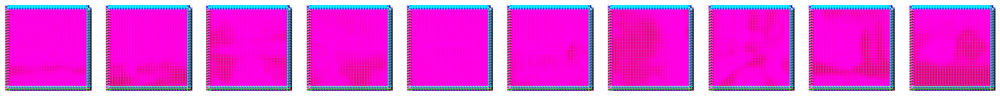

Epoch 31/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 1/1759 [00:00<03:16,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 2/1759 [00:00<03:20,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 3/1759 [00:00<03:26,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 4/1759 [00:00<03:24,  8.59it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 5/1759 [00:00<03:23,  8.63it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 6/1759 [00:00<03:20,  8.73it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 7/1759 [00:00<03:19,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 8/1759 [00:00<03:18,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 9/1759 [00:01<03:20,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 10/1759 [00:01<03:19,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 11/1759 [00:01<03:19,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 12/1759 [00:01<03:17,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 13/1759 [00:01<03:16,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 14/1759 [00:01<03:18,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 15/1759 [00:01<03:20,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 16/1759 [00:01<03:23,  8.58it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 17/1759 [00:01<03:22,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 18/1759 [00:02<03:27,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 19/1759 [00:02<03:22,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 20/1759 [00:02<03:23,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 21/1759 [00:02<03:26,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 22/1759 [00:02<03:24,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


  1%|▏         | 23/1759 [00:02<03:22,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 24/1759 [00:02<03:19,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 25/1759 [00:02<03:15,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 26/1759 [00:02<03:15,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 27/1759 [00:03<03:20,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 28/1759 [00:03<03:18,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 29/1759 [00:03<03:17,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 30/1759 [00:03<03:19,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 31/1759 [00:03<03:18,  8.70it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 32/1759 [00:03<03:15,  8.83it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 33/1759 [00:03<03:13,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 34/1759 [00:03<03:12,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 35/1759 [00:04<03:12,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 36/1759 [00:04<03:18,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 37/1759 [00:04<03:18,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 38/1759 [00:04<03:18,  8.69it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 39/1759 [00:04<03:18,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 40/1759 [00:04<03:16,  8.73it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 41/1759 [00:04<03:17,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 42/1759 [00:04<03:18,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 43/1759 [00:04<03:17,  8.69it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 44/1759 [00:05<03:22,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 45/1759 [00:05<03:31,  8.09it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 46/1759 [00:05<03:35,  7.96it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 47/1759 [00:05<03:28,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 48/1759 [00:05<03:22,  8.43it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 49/1759 [00:05<03:19,  8.59it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 50/1759 [00:05<03:16,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 51/1759 [00:05<03:15,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 52/1759 [00:06<03:15,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 53/1759 [00:06<03:12,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 54/1759 [00:06<03:23,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 55/1759 [00:06<03:18,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 56/1759 [00:06<03:18,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 57/1759 [00:06<03:16,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 58/1759 [00:06<03:16,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 59/1759 [00:06<03:18,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 60/1759 [00:06<03:15,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 61/1759 [00:07<03:11,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 62/1759 [00:07<03:09,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 63/1759 [00:07<03:15,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 64/1759 [00:07<03:18,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 65/1759 [00:07<03:21,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 66/1759 [00:07<03:17,  8.56it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 67/1759 [00:07<03:14,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 68/1759 [00:07<03:13,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 69/1759 [00:07<03:10,  8.85it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 70/1759 [00:08<03:10,  8.87it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 71/1759 [00:08<03:12,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 72/1759 [00:08<03:15,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 73/1759 [00:08<03:12,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 74/1759 [00:08<03:12,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 75/1759 [00:08<03:14,  8.68it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 76/1759 [00:08<03:13,  8.72it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 77/1759 [00:08<03:10,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 78/1759 [00:08<03:08,  8.92it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 79/1759 [00:09<03:10,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 80/1759 [00:09<03:09,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 81/1759 [00:09<03:12,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 82/1759 [00:09<03:14,  8.62it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 83/1759 [00:09<03:12,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 84/1759 [00:09<03:14,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 85/1759 [00:09<03:16,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 86/1759 [00:09<03:13,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 87/1759 [00:10<03:09,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 88/1759 [00:10<03:10,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 89/1759 [00:10<03:06,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 90/1759 [00:10<03:13,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 91/1759 [00:10<03:15,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 92/1759 [00:10<03:12,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 93/1759 [00:10<03:10,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 94/1759 [00:10<03:11,  8.72it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 95/1759 [00:10<03:11,  8.71it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 96/1759 [00:11<03:08,  8.83it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 97/1759 [00:11<03:11,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 98/1759 [00:11<03:08,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 99/1759 [00:11<03:16,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 100/1759 [00:11<03:13,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 101/1759 [00:11<03:11,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 102/1759 [00:11<03:09,  8.74it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 103/1759 [00:11<03:08,  8.80it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 104/1759 [00:11<03:13,  8.53it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 105/1759 [00:12<03:12,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 106/1759 [00:12<03:13,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 107/1759 [00:12<03:11,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 108/1759 [00:12<03:13,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 109/1759 [00:12<03:16,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 110/1759 [00:12<03:16,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 111/1759 [00:12<03:14,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 112/1759 [00:12<03:10,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 113/1759 [00:13<03:08,  8.72it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 114/1759 [00:13<03:07,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 115/1759 [00:13<03:05,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 116/1759 [00:13<03:02,  9.00it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 117/1759 [00:13<03:10,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 118/1759 [00:13<03:11,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 119/1759 [00:13<03:10,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 120/1759 [00:13<03:08,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 121/1759 [00:13<03:05,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 122/1759 [00:14<03:03,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 123/1759 [00:14<03:07,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 124/1759 [00:14<03:07,  8.70it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 125/1759 [00:14<03:05,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 126/1759 [00:14<03:07,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 127/1759 [00:14<03:05,  8.81it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 128/1759 [00:14<03:09,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 129/1759 [00:14<03:06,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 130/1759 [00:14<03:05,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 131/1759 [00:15<03:03,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 132/1759 [00:15<03:02,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 133/1759 [00:15<03:02,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 134/1759 [00:15<03:01,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 135/1759 [00:15<03:06,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 136/1759 [00:15<03:03,  8.86it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 137/1759 [00:15<03:05,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 138/1759 [00:15<03:05,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 139/1759 [00:15<03:03,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 140/1759 [00:16<03:03,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 141/1759 [00:16<03:03,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 142/1759 [00:16<03:07,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 143/1759 [00:16<03:05,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 144/1759 [00:16<03:13,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 145/1759 [00:16<03:10,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 146/1759 [00:16<03:12,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 147/1759 [00:16<03:18,  8.14it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 148/1759 [00:17<03:12,  8.36it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 149/1759 [00:17<03:19,  8.08it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 150/1759 [00:17<03:19,  8.08it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 151/1759 [00:17<03:12,  8.37it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 152/1759 [00:17<03:06,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 153/1759 [00:17<03:13,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 154/1759 [00:17<03:14,  8.26it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 155/1759 [00:17<03:11,  8.38it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 156/1759 [00:18<03:11,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 157/1759 [00:18<03:06,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 158/1759 [00:18<03:05,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 159/1759 [00:18<03:04,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 160/1759 [00:18<03:07,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 161/1759 [00:18<03:03,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 162/1759 [00:18<03:04,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 163/1759 [00:18<03:04,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 164/1759 [00:18<03:02,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 165/1759 [00:19<03:02,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 166/1759 [00:19<03:01,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 167/1759 [00:19<02:58,  8.92it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 168/1759 [00:19<02:57,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 169/1759 [00:19<02:55,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 170/1759 [00:19<02:55,  9.03it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 171/1759 [00:19<02:59,  8.85it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 172/1759 [00:19<02:59,  8.85it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 173/1759 [00:19<03:01,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 174/1759 [00:20<02:57,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 175/1759 [00:20<02:54,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 176/1759 [00:20<02:53,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 177/1759 [00:20<02:54,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 178/1759 [00:20<02:55,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 179/1759 [00:20<02:54,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 180/1759 [00:20<02:56,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 181/1759 [00:20<02:56,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 182/1759 [00:20<02:58,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 183/1759 [00:21<02:55,  8.99it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 184/1759 [00:21<02:56,  8.95it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 185/1759 [00:21<02:53,  9.08it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 186/1759 [00:21<02:53,  9.08it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 187/1759 [00:21<02:54,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 188/1759 [00:21<02:53,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 189/1759 [00:21<02:55,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 190/1759 [00:21<02:54,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 191/1759 [00:21<02:56,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 192/1759 [00:22<02:57,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 193/1759 [00:22<02:55,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 194/1759 [00:22<02:54,  8.98it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 195/1759 [00:22<02:55,  8.91it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 196/1759 [00:22<02:57,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 197/1759 [00:22<02:54,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 198/1759 [00:22<02:56,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 199/1759 [00:22<02:55,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 200/1759 [00:22<02:57,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 201/1759 [00:23<02:55,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 202/1759 [00:23<02:53,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 203/1759 [00:23<02:52,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 204/1759 [00:23<02:57,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 205/1759 [00:23<02:59,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 206/1759 [00:23<02:55,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 207/1759 [00:23<03:03,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 208/1759 [00:23<03:00,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 209/1759 [00:24<02:59,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 210/1759 [00:24<02:58,  8.70it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 211/1759 [00:24<02:58,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 212/1759 [00:24<02:56,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 213/1759 [00:24<02:55,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 214/1759 [00:24<02:54,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 215/1759 [00:24<02:51,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 216/1759 [00:24<02:59,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 217/1759 [00:24<02:57,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 218/1759 [00:25<02:56,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 219/1759 [00:25<02:53,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 220/1759 [00:25<02:52,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 221/1759 [00:25<02:52,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 222/1759 [00:25<02:59,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 223/1759 [00:25<02:59,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 224/1759 [00:25<03:00,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 225/1759 [00:25<02:59,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 226/1759 [00:25<02:56,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 227/1759 [00:26<02:52,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 228/1759 [00:26<02:51,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 229/1759 [00:26<02:48,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 230/1759 [00:26<02:49,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 231/1759 [00:26<02:48,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 232/1759 [00:26<02:48,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 233/1759 [00:26<02:47,  9.10it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 234/1759 [00:26<02:56,  8.65it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 235/1759 [00:26<02:55,  8.68it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 236/1759 [00:27<02:54,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 237/1759 [00:27<02:51,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 238/1759 [00:27<02:50,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 239/1759 [00:27<02:47,  9.06it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 240/1759 [00:27<02:53,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 241/1759 [00:27<02:51,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 242/1759 [00:27<02:49,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 243/1759 [00:27<02:55,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 244/1759 [00:27<02:56,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 245/1759 [00:28<02:54,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 246/1759 [00:28<02:54,  8.65it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 247/1759 [00:28<02:56,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 248/1759 [00:28<02:54,  8.65it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 249/1759 [00:28<02:54,  8.65it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 250/1759 [00:28<02:53,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 251/1759 [00:28<02:54,  8.65it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 252/1759 [00:28<02:57,  8.50it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 253/1759 [00:29<02:54,  8.61it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 254/1759 [00:29<02:56,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 255/1759 [00:29<02:52,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 256/1759 [00:29<02:51,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 257/1759 [00:29<02:47,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 258/1759 [00:29<02:50,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 259/1759 [00:29<02:51,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 260/1759 [00:29<02:48,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 261/1759 [00:29<02:49,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 262/1759 [00:30<02:47,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 263/1759 [00:30<02:46,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 264/1759 [00:30<02:46,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 265/1759 [00:30<02:44,  9.11it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 266/1759 [00:30<02:48,  8.88it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 267/1759 [00:30<02:50,  8.75it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 268/1759 [00:30<02:52,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 269/1759 [00:30<02:48,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 270/1759 [00:30<02:49,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 271/1759 [00:31<02:45,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 272/1759 [00:31<02:47,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 273/1759 [00:31<02:43,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 274/1759 [00:31<02:41,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 275/1759 [00:31<02:43,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 276/1759 [00:31<02:44,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 277/1759 [00:31<02:45,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 278/1759 [00:31<02:45,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 279/1759 [00:31<02:47,  8.82it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 280/1759 [00:32<02:54,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 281/1759 [00:32<02:52,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 282/1759 [00:32<02:48,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 283/1759 [00:32<02:46,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 284/1759 [00:32<02:44,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 285/1759 [00:32<02:46,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 286/1759 [00:32<02:44,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 287/1759 [00:32<02:42,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 288/1759 [00:32<02:45,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 289/1759 [00:33<02:42,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 290/1759 [00:33<02:41,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 291/1759 [00:33<02:40,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 292/1759 [00:33<02:40,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 293/1759 [00:33<02:41,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 294/1759 [00:33<02:40,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 295/1759 [00:33<02:38,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 296/1759 [00:33<02:39,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 297/1759 [00:33<02:43,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 298/1759 [00:34<02:41,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 299/1759 [00:34<02:40,  9.11it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 300/1759 [00:34<02:40,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 301/1759 [00:34<02:39,  9.11it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 302/1759 [00:34<02:44,  8.87it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 303/1759 [00:34<02:42,  8.97it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 304/1759 [00:34<02:44,  8.87it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 305/1759 [00:34<02:41,  8.99it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 306/1759 [00:34<02:45,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 307/1759 [00:35<02:43,  8.91it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 308/1759 [00:35<02:41,  9.00it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 309/1759 [00:35<02:41,  9.00it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 310/1759 [00:35<02:39,  9.08it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 311/1759 [00:35<02:39,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 312/1759 [00:35<02:39,  9.06it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 313/1759 [00:35<02:38,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 314/1759 [00:35<02:39,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 315/1759 [00:35<02:42,  8.89it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 316/1759 [00:36<02:40,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 317/1759 [00:36<02:38,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 318/1759 [00:36<02:38,  9.07it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 319/1759 [00:36<02:42,  8.87it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 320/1759 [00:36<02:48,  8.54it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 321/1759 [00:36<02:48,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 322/1759 [00:36<02:48,  8.52it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 323/1759 [00:36<02:52,  8.33it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 324/1759 [00:37<02:51,  8.39it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 325/1759 [00:37<02:46,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 326/1759 [00:37<02:43,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 327/1759 [00:37<02:41,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 328/1759 [00:37<02:39,  8.97it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 329/1759 [00:37<02:43,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 330/1759 [00:37<02:41,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 331/1759 [00:37<02:38,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 332/1759 [00:37<02:37,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 333/1759 [00:37<02:37,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 334/1759 [00:38<02:36,  9.09it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 335/1759 [00:38<02:35,  9.15it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 336/1759 [00:38<02:35,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 337/1759 [00:38<02:34,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 338/1759 [00:38<02:36,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 339/1759 [00:38<02:37,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 340/1759 [00:38<02:36,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 341/1759 [00:38<02:34,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 342/1759 [00:38<02:37,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 343/1759 [00:39<02:35,  9.13it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 344/1759 [00:39<02:36,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 345/1759 [00:39<02:35,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 346/1759 [00:39<02:34,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 347/1759 [00:39<02:34,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 348/1759 [00:39<02:35,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 349/1759 [00:39<02:36,  9.01it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 350/1759 [00:39<02:39,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 351/1759 [00:39<02:40,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 352/1759 [00:40<02:43,  8.60it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 353/1759 [00:40<02:40,  8.76it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 354/1759 [00:40<02:39,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 355/1759 [00:40<02:39,  8.83it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 356/1759 [00:40<02:37,  8.90it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 357/1759 [00:40<02:36,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 358/1759 [00:40<02:37,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 359/1759 [00:40<02:37,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 360/1759 [00:41<02:38,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 361/1759 [00:41<02:35,  9.00it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 362/1759 [00:41<02:33,  9.09it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 363/1759 [00:41<02:33,  9.10it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 364/1759 [00:41<02:33,  9.09it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 365/1759 [00:41<02:32,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 366/1759 [00:41<02:33,  9.05it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 367/1759 [00:41<02:33,  9.07it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 368/1759 [00:41<02:40,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 369/1759 [00:42<02:43,  8.51it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 370/1759 [00:42<02:40,  8.63it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 371/1759 [00:42<02:38,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 372/1759 [00:42<02:37,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 373/1759 [00:42<02:35,  8.91it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 374/1759 [00:42<02:36,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 375/1759 [00:42<02:33,  9.01it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 376/1759 [00:42<02:31,  9.10it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 377/1759 [00:42<02:31,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 378/1759 [00:43<02:34,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 379/1759 [00:43<02:34,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 380/1759 [00:43<02:32,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 381/1759 [00:43<02:30,  9.13it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 382/1759 [00:43<02:30,  9.17it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 383/1759 [00:43<02:34,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 384/1759 [00:43<02:35,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 385/1759 [00:43<02:31,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 386/1759 [00:43<02:34,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 387/1759 [00:44<02:38,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 388/1759 [00:44<02:34,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 389/1759 [00:44<02:31,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 390/1759 [00:44<02:29,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 391/1759 [00:44<02:29,  9.18it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 392/1759 [00:44<02:30,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 393/1759 [00:44<02:28,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 394/1759 [00:44<02:28,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 395/1759 [00:44<02:29,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 396/1759 [00:45<02:34,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 397/1759 [00:45<02:32,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 398/1759 [00:45<02:32,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 399/1759 [00:45<02:30,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 400/1759 [00:45<02:30,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 401/1759 [00:45<02:30,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 402/1759 [00:45<02:28,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 403/1759 [00:45<02:28,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 404/1759 [00:45<02:27,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 405/1759 [00:46<02:28,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 406/1759 [00:46<02:27,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 407/1759 [00:46<02:26,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 408/1759 [00:46<02:25,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 409/1759 [00:46<02:27,  9.18it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 410/1759 [00:46<02:31,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 411/1759 [00:46<02:30,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 412/1759 [00:46<02:28,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 413/1759 [00:46<02:25,  9.24it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 414/1759 [00:46<02:31,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 415/1759 [00:47<02:29,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 416/1759 [00:47<02:27,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 417/1759 [00:47<02:25,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 418/1759 [00:47<02:25,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 419/1759 [00:47<02:24,  9.25it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 420/1759 [00:47<02:27,  9.06it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 421/1759 [00:47<02:26,  9.12it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 422/1759 [00:47<02:28,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 423/1759 [00:47<02:31,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 424/1759 [00:48<02:32,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 425/1759 [00:48<02:31,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 426/1759 [00:48<02:29,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 427/1759 [00:48<02:28,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 428/1759 [00:48<02:27,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 429/1759 [00:48<02:27,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 430/1759 [00:48<02:25,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 431/1759 [00:48<02:29,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 432/1759 [00:49<02:36,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 433/1759 [00:49<02:33,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 434/1759 [00:49<02:35,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 435/1759 [00:49<02:32,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 436/1759 [00:49<02:33,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 437/1759 [00:49<02:34,  8.53it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 438/1759 [00:49<02:34,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 439/1759 [00:49<02:35,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 440/1759 [00:49<02:31,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 441/1759 [00:50<02:31,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 442/1759 [00:50<02:28,  8.84it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 443/1759 [00:50<02:30,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 444/1759 [00:50<02:31,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 445/1759 [00:50<02:28,  8.87it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 446/1759 [00:50<02:29,  8.79it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 447/1759 [00:50<02:29,  8.80it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 448/1759 [00:50<02:27,  8.91it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 449/1759 [00:50<02:27,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 450/1759 [00:51<02:36,  8.34it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 451/1759 [00:51<02:32,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 452/1759 [00:51<02:35,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 453/1759 [00:51<02:31,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 454/1759 [00:51<02:33,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 455/1759 [00:51<02:30,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 456/1759 [00:51<02:29,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 457/1759 [00:51<02:28,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 458/1759 [00:52<02:28,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 459/1759 [00:52<02:31,  8.58it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 460/1759 [00:52<02:34,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 461/1759 [00:52<02:31,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 462/1759 [00:52<02:28,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 463/1759 [00:52<02:28,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 464/1759 [00:52<02:27,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 465/1759 [00:52<02:25,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 466/1759 [00:52<02:23,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 467/1759 [00:53<02:23,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 468/1759 [00:53<02:27,  8.77it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 469/1759 [00:53<02:27,  8.76it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 470/1759 [00:53<02:26,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 471/1759 [00:53<02:24,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 472/1759 [00:53<02:24,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 473/1759 [00:53<02:22,  9.05it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 474/1759 [00:53<02:21,  9.11it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 475/1759 [00:53<02:22,  9.02it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 476/1759 [00:54<02:22,  9.02it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 477/1759 [00:54<02:23,  8.96it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 478/1759 [00:54<02:21,  9.04it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 479/1759 [00:54<02:21,  9.06it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 480/1759 [00:54<02:20,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 481/1759 [00:54<02:19,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 482/1759 [00:54<02:19,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 483/1759 [00:54<02:19,  9.17it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 484/1759 [00:54<02:25,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 485/1759 [00:55<02:21,  8.99it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 486/1759 [00:55<02:27,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 487/1759 [00:55<02:24,  8.82it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 488/1759 [00:55<02:22,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 489/1759 [00:55<02:21,  8.96it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 490/1759 [00:55<02:20,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 491/1759 [00:55<02:21,  8.97it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 492/1759 [00:55<02:20,  9.03it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 493/1759 [00:55<02:18,  9.13it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 494/1759 [00:56<02:18,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 495/1759 [00:56<02:20,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 496/1759 [00:56<02:18,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 497/1759 [00:56<02:19,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 498/1759 [00:56<02:17,  9.14it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 499/1759 [00:56<02:20,  8.94it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 500/1759 [00:56<02:20,  8.99it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 501/1759 [00:56<02:18,  9.10it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 502/1759 [00:56<02:21,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 503/1759 [00:57<02:20,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 504/1759 [00:57<02:23,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 505/1759 [00:57<02:21,  8.89it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 506/1759 [00:57<02:22,  8.79it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 507/1759 [00:57<02:21,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 508/1759 [00:57<02:21,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 509/1759 [00:57<02:18,  9.01it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 510/1759 [00:57<02:17,  9.11it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 511/1759 [00:57<02:16,  9.16it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 512/1759 [00:58<02:15,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 513/1759 [00:58<02:17,  9.08it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 514/1759 [00:58<02:21,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 515/1759 [00:58<02:19,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 516/1759 [00:58<02:17,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 517/1759 [00:58<02:15,  9.14it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 518/1759 [00:58<02:19,  8.89it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 519/1759 [00:58<02:18,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 520/1759 [00:58<02:20,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 521/1759 [00:59<02:20,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 522/1759 [00:59<02:20,  8.80it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 523/1759 [00:59<02:21,  8.73it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 524/1759 [00:59<02:22,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 525/1759 [00:59<02:19,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 526/1759 [00:59<02:18,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 527/1759 [00:59<02:21,  8.72it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 528/1759 [00:59<02:20,  8.75it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 529/1759 [00:59<02:19,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 530/1759 [01:00<02:17,  8.93it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 531/1759 [01:00<02:17,  8.90it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 532/1759 [01:00<02:19,  8.77it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 533/1759 [01:00<02:20,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 534/1759 [01:00<02:22,  8.61it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 535/1759 [01:00<02:19,  8.77it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 536/1759 [01:00<02:18,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 537/1759 [01:00<02:17,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 538/1759 [01:00<02:16,  8.95it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 539/1759 [01:01<02:16,  8.92it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 540/1759 [01:01<02:18,  8.82it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 541/1759 [01:01<02:19,  8.76it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 542/1759 [01:01<02:20,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 543/1759 [01:01<02:18,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 544/1759 [01:01<02:19,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 545/1759 [01:01<02:16,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 546/1759 [01:01<02:14,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 547/1759 [01:01<02:13,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 548/1759 [01:02<02:12,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 549/1759 [01:02<02:13,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 550/1759 [01:02<02:13,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 551/1759 [01:02<02:13,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 552/1759 [01:02<02:12,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 553/1759 [01:02<02:12,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 554/1759 [01:02<02:14,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 555/1759 [01:02<02:15,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 556/1759 [01:02<02:15,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 557/1759 [01:03<02:14,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 558/1759 [01:03<02:18,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 559/1759 [01:03<04:27,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 560/1759 [01:03<03:50,  5.21it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 561/1759 [01:03<03:23,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 562/1759 [01:04<03:04,  6.47it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 563/1759 [01:04<02:51,  6.99it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 564/1759 [01:04<02:44,  7.28it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 565/1759 [01:04<02:37,  7.57it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 566/1759 [01:04<02:33,  7.75it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 567/1759 [01:04<02:34,  7.72it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 568/1759 [01:04<02:30,  7.91it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 569/1759 [01:04<02:27,  8.04it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 570/1759 [01:05<02:26,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 571/1759 [01:05<02:22,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 572/1759 [01:05<02:19,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 573/1759 [01:05<02:20,  8.45it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 574/1759 [01:05<02:19,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 575/1759 [01:05<02:18,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 576/1759 [01:05<02:20,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 577/1759 [01:05<02:18,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 578/1759 [01:05<02:18,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 579/1759 [01:06<02:16,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 580/1759 [01:06<02:17,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 581/1759 [01:06<02:16,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 582/1759 [01:06<02:17,  8.56it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 583/1759 [01:06<02:20,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 584/1759 [01:06<02:18,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 585/1759 [01:06<02:23,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 586/1759 [01:06<02:23,  8.19it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 587/1759 [01:07<02:22,  8.22it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 588/1759 [01:07<02:19,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 589/1759 [01:07<02:17,  8.51it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 590/1759 [01:07<02:16,  8.56it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 591/1759 [01:07<02:17,  8.51it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 592/1759 [01:07<02:17,  8.50it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 593/1759 [01:07<02:15,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 594/1759 [01:07<02:18,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 595/1759 [01:07<02:18,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 596/1759 [01:08<02:16,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 597/1759 [01:08<02:15,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 598/1759 [01:08<02:13,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 599/1759 [01:08<02:12,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 600/1759 [01:08<02:12,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 601/1759 [01:08<02:11,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 602/1759 [01:08<02:14,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 603/1759 [01:08<02:19,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 604/1759 [01:09<02:17,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 605/1759 [01:09<02:15,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 606/1759 [01:09<02:13,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 607/1759 [01:09<02:13,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 608/1759 [01:09<02:13,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 609/1759 [01:09<02:12,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 610/1759 [01:09<02:16,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 611/1759 [01:09<02:15,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 612/1759 [01:09<02:21,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 613/1759 [01:10<02:19,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 614/1759 [01:10<02:18,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 615/1759 [01:10<02:18,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 616/1759 [01:10<02:16,  8.35it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 617/1759 [01:10<02:15,  8.40it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 618/1759 [01:10<02:15,  8.43it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 619/1759 [01:10<02:16,  8.37it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 620/1759 [01:10<02:16,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 621/1759 [01:11<02:17,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 622/1759 [01:11<02:16,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 623/1759 [01:11<02:13,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 624/1759 [01:11<02:12,  8.55it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 625/1759 [01:11<02:16,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 626/1759 [01:11<02:15,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 627/1759 [01:11<02:13,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 628/1759 [01:11<02:12,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 629/1759 [01:11<02:12,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 630/1759 [01:12<02:14,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 631/1759 [01:12<02:13,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 632/1759 [01:12<02:14,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 633/1759 [01:12<02:14,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 634/1759 [01:12<02:15,  8.28it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 635/1759 [01:12<02:15,  8.31it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 636/1759 [01:12<02:14,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 637/1759 [01:12<02:12,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 638/1759 [01:13<02:11,  8.52it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 639/1759 [01:13<02:14,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 640/1759 [01:13<02:12,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 641/1759 [01:13<02:10,  8.55it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 642/1759 [01:13<02:10,  8.58it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 643/1759 [01:13<02:11,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 644/1759 [01:13<02:11,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 645/1759 [01:13<02:12,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 646/1759 [01:14<02:12,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 647/1759 [01:14<02:13,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 648/1759 [01:14<02:14,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 649/1759 [01:14<02:13,  8.29it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 650/1759 [01:14<02:17,  8.06it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 651/1759 [01:14<02:17,  8.07it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 652/1759 [01:14<02:13,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 653/1759 [01:14<02:12,  8.36it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 654/1759 [01:14<02:14,  8.20it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 655/1759 [01:15<02:13,  8.29it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 656/1759 [01:15<02:12,  8.32it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 657/1759 [01:15<02:14,  8.21it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 658/1759 [01:15<02:17,  8.02it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 659/1759 [01:15<02:13,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 660/1759 [01:15<02:13,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 661/1759 [01:15<02:13,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 662/1759 [01:15<02:11,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 663/1759 [01:16<02:10,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 664/1759 [01:16<02:08,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 665/1759 [01:16<02:06,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 666/1759 [01:16<02:08,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 667/1759 [01:16<02:08,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 668/1759 [01:16<02:12,  8.23it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 669/1759 [01:16<02:14,  8.09it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 670/1759 [01:16<02:12,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 671/1759 [01:17<02:09,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 672/1759 [01:17<02:11,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 673/1759 [01:17<02:09,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 674/1759 [01:17<02:08,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 675/1759 [01:17<02:10,  8.32it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 676/1759 [01:17<02:10,  8.31it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 677/1759 [01:17<02:11,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 678/1759 [01:17<02:09,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 679/1759 [01:17<02:09,  8.34it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 680/1759 [01:18<02:08,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 681/1759 [01:18<02:07,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 682/1759 [01:18<02:06,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 683/1759 [01:18<02:04,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 684/1759 [01:18<02:12,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 685/1759 [01:18<02:11,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 686/1759 [01:18<02:11,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 687/1759 [01:18<02:09,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 688/1759 [01:19<02:09,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 689/1759 [01:19<02:07,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 690/1759 [01:19<02:06,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 691/1759 [01:19<02:05,  8.49it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 692/1759 [01:19<02:05,  8.53it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 693/1759 [01:19<02:05,  8.46it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 694/1759 [01:19<02:09,  8.21it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 695/1759 [01:19<02:07,  8.32it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 696/1759 [01:20<02:07,  8.33it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 697/1759 [01:20<02:04,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 698/1759 [01:20<02:04,  8.55it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 699/1759 [01:20<02:02,  8.64it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 700/1759 [01:20<02:02,  8.68it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 701/1759 [01:20<02:01,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 702/1759 [01:20<02:04,  8.48it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 703/1759 [01:20<02:07,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 704/1759 [01:20<02:06,  8.31it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 705/1759 [01:21<02:06,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 706/1759 [01:21<02:05,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 707/1759 [01:21<02:04,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 708/1759 [01:21<02:04,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 709/1759 [01:21<02:02,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 710/1759 [01:21<02:01,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 711/1759 [01:21<02:08,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 712/1759 [01:21<02:08,  8.13it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 713/1759 [01:22<02:09,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 714/1759 [01:22<02:08,  8.16it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 715/1759 [01:22<02:04,  8.40it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 716/1759 [01:22<02:04,  8.38it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 717/1759 [01:22<02:05,  8.28it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 718/1759 [01:22<02:04,  8.38it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 719/1759 [01:22<02:01,  8.57it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 720/1759 [01:22<02:03,  8.38it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 721/1759 [01:22<02:01,  8.52it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 722/1759 [01:23<02:00,  8.60it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 723/1759 [01:23<01:59,  8.64it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 724/1759 [01:23<02:00,  8.61it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 725/1759 [01:23<01:59,  8.66it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 726/1759 [01:23<02:03,  8.35it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████▏     | 727/1759 [01:23<02:02,  8.41it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████▏     | 728/1759 [01:23<02:04,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 729/1759 [01:23<02:01,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 730/1759 [01:24<02:04,  8.29it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 731/1759 [01:24<02:07,  8.07it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 732/1759 [01:24<02:05,  8.16it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 733/1759 [01:24<02:01,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 734/1759 [01:24<02:00,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 735/1759 [01:24<01:58,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 736/1759 [01:24<01:58,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 737/1759 [01:24<01:59,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 738/1759 [01:24<01:58,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 739/1759 [01:25<01:59,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 740/1759 [01:25<01:57,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 741/1759 [01:25<01:56,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 742/1759 [01:25<01:55,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 743/1759 [01:25<01:55,  8.77it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 744/1759 [01:25<01:58,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 745/1759 [01:25<02:00,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 746/1759 [01:25<02:00,  8.43it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 747/1759 [01:26<01:59,  8.50it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 748/1759 [01:26<02:06,  7.99it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 749/1759 [01:26<02:07,  7.92it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 750/1759 [01:26<02:06,  8.00it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 751/1759 [01:26<02:03,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 752/1759 [01:26<02:00,  8.34it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 753/1759 [01:26<02:00,  8.37it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 754/1759 [01:26<02:03,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 755/1759 [01:27<02:01,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 756/1759 [01:27<02:00,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 757/1759 [01:27<02:01,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 758/1759 [01:27<01:59,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 759/1759 [01:27<01:59,  8.36it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 760/1759 [01:27<01:57,  8.48it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 761/1759 [01:27<01:55,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 762/1759 [01:27<01:53,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 763/1759 [01:27<01:54,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 764/1759 [01:28<01:55,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 765/1759 [01:28<01:55,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 766/1759 [01:28<01:56,  8.54it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▎     | 767/1759 [01:28<01:56,  8.51it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 768/1759 [01:28<01:55,  8.58it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 769/1759 [01:28<01:53,  8.75it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 770/1759 [01:28<01:54,  8.65it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 771/1759 [01:28<01:53,  8.70it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 772/1759 [01:29<01:53,  8.71it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 773/1759 [01:29<01:52,  8.75it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 774/1759 [01:29<01:52,  8.73it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 775/1759 [01:29<01:54,  8.58it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 776/1759 [01:29<01:56,  8.47it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 777/1759 [01:29<01:55,  8.48it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 778/1759 [01:29<01:57,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 779/1759 [01:29<01:56,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 780/1759 [01:29<01:55,  8.50it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 781/1759 [01:30<01:54,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 782/1759 [01:30<01:53,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 783/1759 [01:30<01:52,  8.66it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 784/1759 [01:30<01:54,  8.50it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 785/1759 [01:30<01:55,  8.42it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 786/1759 [01:30<01:53,  8.55it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 787/1759 [01:30<01:54,  8.52it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 788/1759 [01:30<01:52,  8.62it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▍     | 789/1759 [01:31<01:58,  8.18it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 790/1759 [01:31<01:56,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 791/1759 [01:31<01:53,  8.51it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 792/1759 [01:31<01:51,  8.64it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 793/1759 [01:31<01:52,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 794/1759 [01:31<01:51,  8.62it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 795/1759 [01:31<01:51,  8.65it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 796/1759 [01:31<01:52,  8.57it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 797/1759 [01:31<01:50,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 798/1759 [01:32<01:50,  8.70it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 799/1759 [01:32<01:51,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 800/1759 [01:32<01:52,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 801/1759 [01:32<01:49,  8.74it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 802/1759 [01:32<01:51,  8.58it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 803/1759 [01:32<01:50,  8.64it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 804/1759 [01:32<01:52,  8.52it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 805/1759 [01:32<01:53,  8.41it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 806/1759 [01:33<01:55,  8.24it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 807/1759 [01:33<01:55,  8.21it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 808/1759 [01:33<01:53,  8.37it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 809/1759 [01:33<01:51,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 810/1759 [01:33<01:50,  8.60it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 811/1759 [01:33<01:51,  8.53it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 812/1759 [01:33<01:50,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 813/1759 [01:33<01:50,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 814/1759 [01:33<01:47,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 815/1759 [01:34<01:49,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 816/1759 [01:34<01:48,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 817/1759 [01:34<01:47,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 818/1759 [01:34<01:48,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 819/1759 [01:34<01:47,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 820/1759 [01:34<01:51,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 821/1759 [01:34<01:50,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 822/1759 [01:34<01:48,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 823/1759 [01:34<01:48,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 824/1759 [01:35<01:48,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 825/1759 [01:35<01:46,  8.76it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 826/1759 [01:35<01:45,  8.81it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 827/1759 [01:35<01:47,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 828/1759 [01:35<01:48,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 829/1759 [01:35<01:49,  8.53it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 830/1759 [01:35<01:49,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 831/1759 [01:35<01:49,  8.51it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 832/1759 [01:36<01:49,  8.49it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 833/1759 [01:36<01:49,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 834/1759 [01:36<01:48,  8.51it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 835/1759 [01:36<01:47,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 836/1759 [01:36<01:49,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 837/1759 [01:36<01:47,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 838/1759 [01:36<01:50,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 839/1759 [01:36<01:49,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 840/1759 [01:36<01:49,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 841/1759 [01:37<01:50,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 842/1759 [01:37<01:49,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 843/1759 [01:37<01:47,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 844/1759 [01:37<01:46,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 845/1759 [01:37<01:45,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 846/1759 [01:37<01:46,  8.56it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 847/1759 [01:37<01:50,  8.29it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 848/1759 [01:37<01:51,  8.20it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 849/1759 [01:38<01:51,  8.15it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 850/1759 [01:38<01:53,  8.02it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 851/1759 [01:38<01:50,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 852/1759 [01:38<01:48,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 853/1759 [01:38<01:47,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 854/1759 [01:38<01:47,  8.38it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 855/1759 [01:38<01:47,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 856/1759 [01:38<01:49,  8.26it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 857/1759 [01:39<01:51,  8.11it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 858/1759 [01:39<01:48,  8.31it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 859/1759 [01:39<01:47,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 860/1759 [01:39<01:45,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 861/1759 [01:39<01:44,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 862/1759 [01:39<01:43,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 863/1759 [01:39<01:41,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 864/1759 [01:39<01:41,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 865/1759 [01:39<01:44,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 866/1759 [01:40<01:43,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 867/1759 [01:40<01:43,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 868/1759 [01:40<01:43,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 869/1759 [01:40<01:42,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 870/1759 [01:40<01:41,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 871/1759 [01:40<01:41,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 872/1759 [01:40<01:39,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 873/1759 [01:40<01:39,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 874/1759 [01:40<01:43,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 875/1759 [01:41<01:41,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 876/1759 [01:41<01:41,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 877/1759 [01:41<01:42,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 878/1759 [01:41<01:42,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 879/1759 [01:41<01:41,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 880/1759 [01:41<01:41,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 881/1759 [01:41<01:39,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 882/1759 [01:41<01:40,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 883/1759 [01:42<01:41,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 884/1759 [01:42<01:41,  8.62it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 885/1759 [01:42<01:43,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 886/1759 [01:42<01:41,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 887/1759 [01:42<01:39,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 888/1759 [01:42<01:39,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 889/1759 [01:42<01:38,  8.82it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 890/1759 [01:42<01:41,  8.58it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 891/1759 [01:42<01:41,  8.53it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 892/1759 [01:43<01:42,  8.43it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 893/1759 [01:43<01:43,  8.36it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 894/1759 [01:43<01:43,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 895/1759 [01:43<01:40,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 896/1759 [01:43<01:40,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 897/1759 [01:43<01:39,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 898/1759 [01:43<01:37,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 899/1759 [01:43<01:37,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 900/1759 [01:43<01:38,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 901/1759 [01:44<01:39,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 902/1759 [01:44<01:38,  8.70it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 903/1759 [01:44<01:39,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 904/1759 [01:44<01:38,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 905/1759 [01:44<01:36,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 906/1759 [01:44<01:35,  8.93it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 907/1759 [01:44<01:37,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 908/1759 [01:44<01:37,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 909/1759 [01:45<01:36,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 910/1759 [01:45<01:37,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 911/1759 [01:45<01:36,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 912/1759 [01:45<01:35,  8.87it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 913/1759 [01:45<01:34,  8.93it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 914/1759 [01:45<01:34,  8.99it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 915/1759 [01:45<01:33,  9.03it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 916/1759 [01:45<01:35,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 917/1759 [01:45<01:35,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 918/1759 [01:46<01:35,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 919/1759 [01:46<01:38,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 920/1759 [01:46<01:37,  8.61it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 921/1759 [01:46<01:37,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 922/1759 [01:46<01:36,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 923/1759 [01:46<01:35,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 924/1759 [01:46<01:35,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 925/1759 [01:46<01:35,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 926/1759 [01:46<01:34,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 927/1759 [01:47<01:32,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 928/1759 [01:47<01:33,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 929/1759 [01:47<01:32,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 930/1759 [01:47<01:34,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 931/1759 [01:47<01:34,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 932/1759 [01:47<01:33,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 933/1759 [01:47<01:32,  8.91it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 934/1759 [01:47<01:32,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 935/1759 [01:47<01:33,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 936/1759 [01:48<01:32,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 937/1759 [01:48<01:36,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 938/1759 [01:48<01:34,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 939/1759 [01:48<01:33,  8.76it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 940/1759 [01:48<01:37,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 941/1759 [01:48<01:37,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 942/1759 [01:48<01:37,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 943/1759 [01:48<01:36,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 944/1759 [01:49<01:35,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 945/1759 [01:49<01:33,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 946/1759 [01:49<01:34,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 947/1759 [01:49<01:34,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 948/1759 [01:49<01:37,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 949/1759 [01:49<01:34,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 950/1759 [01:49<01:33,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 951/1759 [01:49<01:32,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 952/1759 [01:49<01:35,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 953/1759 [01:50<01:35,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 954/1759 [01:50<01:33,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 955/1759 [01:50<01:35,  8.45it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 956/1759 [01:50<01:36,  8.34it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 957/1759 [01:50<01:35,  8.39it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 958/1759 [01:50<01:34,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 959/1759 [01:50<01:34,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 960/1759 [01:50<01:34,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 961/1759 [01:51<01:32,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 962/1759 [01:51<01:31,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 963/1759 [01:51<01:30,  8.79it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 964/1759 [01:51<01:31,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 965/1759 [01:51<01:32,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 966/1759 [01:51<01:30,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 967/1759 [01:51<01:29,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 968/1759 [01:51<01:29,  8.89it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 969/1759 [01:51<01:30,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 970/1759 [01:52<01:29,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 971/1759 [01:52<01:28,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 972/1759 [01:52<01:30,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 973/1759 [01:52<01:31,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 974/1759 [01:52<01:33,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 975/1759 [01:52<01:32,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 976/1759 [01:52<01:31,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 977/1759 [01:52<01:29,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 978/1759 [01:52<01:31,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 979/1759 [01:53<01:30,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 980/1759 [01:53<01:29,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 981/1759 [01:53<01:27,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 982/1759 [01:53<01:28,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 983/1759 [01:53<01:27,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 984/1759 [01:53<01:27,  8.84it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 985/1759 [01:53<01:27,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 986/1759 [01:53<01:26,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 987/1759 [01:53<01:25,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 988/1759 [01:54<01:25,  8.97it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 989/1759 [01:54<01:25,  9.04it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 990/1759 [01:54<01:26,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 991/1759 [01:54<01:28,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 992/1759 [01:54<01:30,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 993/1759 [01:54<01:27,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 994/1759 [01:54<01:26,  8.88it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 995/1759 [01:54<01:25,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 996/1759 [01:54<01:25,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 997/1759 [01:55<01:24,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 998/1759 [01:55<01:23,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 999/1759 [01:55<01:23,  9.12it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1000/1759 [01:55<01:25,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1001/1759 [01:55<01:25,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1002/1759 [01:55<01:25,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1003/1759 [01:55<01:23,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1004/1759 [01:55<01:24,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1005/1759 [01:55<01:23,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1006/1759 [01:56<01:23,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1007/1759 [01:56<01:22,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1008/1759 [01:56<01:25,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1009/1759 [01:56<01:26,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1010/1759 [01:56<01:25,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1011/1759 [01:56<01:27,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1012/1759 [01:56<01:24,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1013/1759 [01:56<01:23,  8.93it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1014/1759 [01:57<01:23,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1015/1759 [01:57<01:24,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1016/1759 [01:57<01:23,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1017/1759 [01:57<01:21,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1018/1759 [01:57<01:23,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1019/1759 [01:57<01:22,  8.96it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1020/1759 [01:57<01:22,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1021/1759 [01:57<01:21,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1022/1759 [01:57<01:21,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1023/1759 [01:58<01:21,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1024/1759 [01:58<01:20,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1025/1759 [01:58<01:21,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1026/1759 [01:58<01:20,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1027/1759 [01:58<01:22,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1028/1759 [01:58<01:22,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1029/1759 [01:58<01:20,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1030/1759 [01:58<01:21,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1031/1759 [01:58<01:21,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1032/1759 [01:59<01:21,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1033/1759 [01:59<01:21,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1034/1759 [01:59<01:19,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1035/1759 [01:59<01:19,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1036/1759 [01:59<01:21,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1037/1759 [01:59<01:20,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1038/1759 [01:59<01:21,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1039/1759 [01:59<01:21,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1040/1759 [01:59<01:21,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1041/1759 [02:00<01:20,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1042/1759 [02:00<01:20,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1043/1759 [02:00<01:19,  9.06it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1044/1759 [02:00<01:20,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1045/1759 [02:00<01:21,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1046/1759 [02:00<01:21,  8.70it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 1047/1759 [02:00<01:22,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1048/1759 [02:00<01:21,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1049/1759 [02:00<01:20,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1050/1759 [02:01<01:20,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1051/1759 [02:01<01:20,  8.84it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1052/1759 [02:01<01:20,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1053/1759 [02:01<01:20,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1054/1759 [02:01<01:22,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1055/1759 [02:01<01:21,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1056/1759 [02:01<01:21,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1057/1759 [02:01<01:19,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1058/1759 [02:01<01:20,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1059/1759 [02:02<01:19,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 1060/1759 [02:02<01:19,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 1061/1759 [02:02<01:20,  8.63it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 1062/1759 [02:02<01:22,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1063/1759 [02:02<01:23,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1064/1759 [02:02<01:22,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1065/1759 [02:02<01:21,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1066/1759 [02:02<01:19,  8.75it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 1067/1759 [02:03<01:19,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1068/1759 [02:03<01:19,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1069/1759 [02:03<01:19,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1070/1759 [02:03<01:17,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1071/1759 [02:03<01:17,  8.87it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 1072/1759 [02:03<01:18,  8.71it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 1073/1759 [02:03<01:18,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1074/1759 [02:03<01:21,  8.41it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1075/1759 [02:03<01:19,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1076/1759 [02:04<01:18,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1077/1759 [02:04<01:17,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1078/1759 [02:04<01:15,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 1079/1759 [02:04<01:15,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1080/1759 [02:04<01:16,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 1081/1759 [02:04<01:18,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1082/1759 [02:04<01:18,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1083/1759 [02:04<01:17,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1084/1759 [02:04<01:16,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1085/1759 [02:05<01:16,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1086/1759 [02:05<01:16,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1087/1759 [02:05<01:15,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1088/1759 [02:05<01:14,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1089/1759 [02:05<01:13,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1090/1759 [02:05<01:15,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1091/1759 [02:05<01:14,  8.99it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 1092/1759 [02:05<01:17,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1093/1759 [02:05<01:17,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1094/1759 [02:06<01:15,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1095/1759 [02:06<01:14,  8.96it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1096/1759 [02:06<01:13,  9.01it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1097/1759 [02:06<01:13,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1098/1759 [02:06<01:13,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1099/1759 [02:06<01:15,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1100/1759 [02:06<01:15,  8.76it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1101/1759 [02:06<01:14,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1102/1759 [02:06<01:14,  8.87it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1103/1759 [02:07<01:13,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1104/1759 [02:07<01:11,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1105/1759 [02:07<01:11,  9.17it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1106/1759 [02:07<01:11,  9.14it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1107/1759 [02:07<01:11,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1108/1759 [02:07<01:12,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1109/1759 [02:07<01:11,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1110/1759 [02:07<01:12,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1111/1759 [02:07<01:11,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1112/1759 [02:08<01:11,  9.01it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1113/1759 [02:08<01:11,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1114/1759 [02:08<01:12,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1115/1759 [02:08<01:12,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1116/1759 [02:08<01:12,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1117/1759 [02:08<01:13,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1118/1759 [02:08<01:11,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1119/1759 [02:08<01:13,  8.73it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▎   | 1120/1759 [02:08<01:12,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1121/1759 [02:09<01:12,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1122/1759 [02:09<01:11,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1123/1759 [02:09<01:10,  9.07it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1124/1759 [02:09<01:09,  9.08it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1125/1759 [02:09<01:09,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1126/1759 [02:09<01:12,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1127/1759 [02:09<01:12,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1128/1759 [02:09<01:10,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1129/1759 [02:09<01:09,  9.03it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 1130/1759 [02:10<01:12,  8.64it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 1131/1759 [02:10<01:12,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1132/1759 [02:10<01:11,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1133/1759 [02:10<01:09,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1134/1759 [02:10<01:09,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1135/1759 [02:10<01:09,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1136/1759 [02:10<01:09,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 1137/1759 [02:10<01:09,  8.90it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 1138/1759 [02:11<01:12,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1139/1759 [02:11<01:11,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1140/1759 [02:11<01:10,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1141/1759 [02:11<01:08,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1142/1759 [02:11<01:08,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1143/1759 [02:11<01:08,  9.05it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1144/1759 [02:11<01:09,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1145/1759 [02:11<01:09,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1146/1759 [02:11<01:09,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1147/1759 [02:12<01:07,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1148/1759 [02:12<01:07,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1149/1759 [02:12<01:06,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1150/1759 [02:12<01:06,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1151/1759 [02:12<01:06,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1152/1759 [02:12<01:06,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1153/1759 [02:12<01:07,  9.00it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 1154/1759 [02:12<01:09,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 1155/1759 [02:12<01:10,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1156/1759 [02:13<01:10,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1157/1759 [02:13<01:08,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1158/1759 [02:13<01:08,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1159/1759 [02:13<01:07,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1160/1759 [02:13<01:07,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1161/1759 [02:13<01:06,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 1162/1759 [02:13<01:10,  8.50it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 1163/1759 [02:13<01:09,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1164/1759 [02:13<01:09,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1165/1759 [02:14<01:09,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 1166/1759 [02:14<01:09,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1167/1759 [02:14<01:08,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 1168/1759 [02:14<01:08,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 1169/1759 [02:14<01:07,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1170/1759 [02:14<01:07,  8.79it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 1171/1759 [02:14<01:09,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1172/1759 [02:14<01:08,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1173/1759 [02:15<01:07,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1174/1759 [02:15<01:06,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1175/1759 [02:15<01:05,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 1176/1759 [02:15<01:05,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1177/1759 [02:15<01:06,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1178/1759 [02:15<01:05,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1179/1759 [02:15<01:05,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1180/1759 [02:15<01:06,  8.67it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1181/1759 [02:15<01:06,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1182/1759 [02:16<01:06,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1183/1759 [02:16<01:04,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1184/1759 [02:16<01:05,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1185/1759 [02:16<01:04,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1186/1759 [02:16<01:03,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1187/1759 [02:16<01:04,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1188/1759 [02:16<01:04,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1189/1759 [02:16<01:04,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1190/1759 [02:16<01:04,  8.85it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1191/1759 [02:17<01:03,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1192/1759 [02:17<01:04,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1193/1759 [02:17<01:04,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1194/1759 [02:17<01:05,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1195/1759 [02:17<01:05,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1196/1759 [02:17<01:05,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1197/1759 [02:17<01:05,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1198/1759 [02:17<01:07,  8.34it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1199/1759 [02:17<01:05,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1200/1759 [02:18<01:03,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1201/1759 [02:18<01:03,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1202/1759 [02:18<01:02,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1203/1759 [02:18<01:02,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1204/1759 [02:18<01:02,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1205/1759 [02:18<01:01,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1206/1759 [02:18<01:01,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 1207/1759 [02:18<01:02,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 1208/1759 [02:18<01:03,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1209/1759 [02:19<01:01,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1210/1759 [02:19<01:01,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1211/1759 [02:19<01:01,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1212/1759 [02:19<01:01,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1213/1759 [02:19<01:00,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1214/1759 [02:19<01:00,  8.97it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1215/1759 [02:19<01:00,  9.03it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1216/1759 [02:19<01:01,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1217/1759 [02:19<01:00,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1218/1759 [02:20<00:59,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1219/1759 [02:20<01:00,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1220/1759 [02:20<01:00,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1221/1759 [02:20<01:00,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1222/1759 [02:20<01:00,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1223/1759 [02:20<00:58,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1224/1759 [02:20<00:58,  9.17it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 1225/1759 [02:20<00:59,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1226/1759 [02:20<00:59,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1227/1759 [02:21<00:59,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 1228/1759 [02:21<00:58,  9.07it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1229/1759 [02:21<00:58,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1230/1759 [02:21<00:59,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1231/1759 [02:21<00:59,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1232/1759 [02:21<00:58,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1233/1759 [02:21<00:57,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1234/1759 [02:21<00:58,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1235/1759 [02:21<00:58,  8.92it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 1236/1759 [02:22<00:58,  8.94it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 1237/1759 [02:22<00:59,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1238/1759 [02:22<00:58,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1239/1759 [02:22<00:58,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1240/1759 [02:22<00:58,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1241/1759 [02:22<00:57,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1242/1759 [02:22<00:58,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1243/1759 [02:22<00:58,  8.79it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1244/1759 [02:23<00:58,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1245/1759 [02:23<00:58,  8.80it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1246/1759 [02:23<00:58,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1247/1759 [02:23<00:57,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1248/1759 [02:23<00:57,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1249/1759 [02:23<00:56,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1250/1759 [02:23<00:57,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1251/1759 [02:23<00:56,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1252/1759 [02:23<00:57,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1253/1759 [02:24<00:57,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1254/1759 [02:24<00:56,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1255/1759 [02:24<00:55,  9.07it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 1256/1759 [02:24<00:57,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 1257/1759 [02:24<00:56,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1258/1759 [02:24<00:56,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1259/1759 [02:24<00:56,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1260/1759 [02:24<00:55,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1261/1759 [02:24<00:56,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1262/1759 [02:25<00:56,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1263/1759 [02:25<00:55,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1264/1759 [02:25<00:56,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1265/1759 [02:25<00:55,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1266/1759 [02:25<00:55,  8.91it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1267/1759 [02:25<00:55,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1268/1759 [02:25<00:55,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1269/1759 [02:25<00:54,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1270/1759 [02:25<00:55,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1271/1759 [02:26<00:55,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1272/1759 [02:26<00:55,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1273/1759 [02:26<00:54,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1274/1759 [02:26<00:53,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1275/1759 [02:26<00:53,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1276/1759 [02:26<00:53,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1277/1759 [02:26<00:53,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1278/1759 [02:26<00:54,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1279/1759 [02:26<00:55,  8.71it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 1280/1759 [02:27<00:55,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1281/1759 [02:27<00:54,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1282/1759 [02:27<00:56,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1283/1759 [02:27<00:55,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1284/1759 [02:27<00:55,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1285/1759 [02:27<00:53,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1286/1759 [02:27<00:53,  8.85it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1287/1759 [02:27<00:53,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1288/1759 [02:27<00:54,  8.71it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1289/1759 [02:28<00:52,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1290/1759 [02:28<00:51,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 1291/1759 [02:28<00:52,  8.98it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 1292/1759 [02:28<00:52,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 1293/1759 [02:28<00:52,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1294/1759 [02:28<00:52,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1295/1759 [02:28<00:51,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1296/1759 [02:28<00:51,  8.98it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 1297/1759 [02:28<00:52,  8.84it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1298/1759 [02:29<00:51,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1299/1759 [02:29<00:51,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1300/1759 [02:29<00:50,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1301/1759 [02:29<00:50,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1302/1759 [02:29<00:51,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1303/1759 [02:29<00:50,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1304/1759 [02:29<00:50,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1305/1759 [02:29<00:49,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1306/1759 [02:29<00:51,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1307/1759 [02:30<00:50,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1308/1759 [02:30<00:49,  9.07it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1309/1759 [02:30<00:50,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1310/1759 [02:30<00:51,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1311/1759 [02:30<00:51,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1312/1759 [02:30<00:49,  8.94it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 1313/1759 [02:30<00:49,  9.01it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 1314/1759 [02:30<00:49,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1315/1759 [02:31<00:50,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1316/1759 [02:31<00:50,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1317/1759 [02:31<00:49,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1318/1759 [02:31<00:48,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1319/1759 [02:31<00:48,  9.12it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 1320/1759 [02:31<00:49,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1321/1759 [02:31<00:49,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1322/1759 [02:31<00:48,  9.08it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 1323/1759 [02:31<00:48,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 1324/1759 [02:32<00:48,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1325/1759 [02:32<00:48,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1326/1759 [02:32<00:47,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1327/1759 [02:32<00:47,  9.11it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1328/1759 [02:32<00:47,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 1329/1759 [02:32<00:48,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1330/1759 [02:32<00:48,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1331/1759 [02:32<00:47,  9.08it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 1332/1759 [02:32<00:47,  8.94it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1333/1759 [02:33<00:48,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1334/1759 [02:33<00:48,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1335/1759 [02:33<00:48,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1336/1759 [02:33<00:47,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1337/1759 [02:33<00:47,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1338/1759 [02:33<00:48,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1339/1759 [02:33<00:47,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1340/1759 [02:33<00:46,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1341/1759 [02:33<00:46,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 1342/1759 [02:34<00:46,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 1343/1759 [02:34<00:46,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1344/1759 [02:34<00:46,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1345/1759 [02:34<00:45,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1346/1759 [02:34<00:45,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1347/1759 [02:34<00:45,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1348/1759 [02:34<00:45,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1349/1759 [02:34<00:45,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1350/1759 [02:34<00:44,  9.19it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1351/1759 [02:35<00:45,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1352/1759 [02:35<00:45,  8.91it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1353/1759 [02:35<00:45,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1354/1759 [02:35<00:45,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1355/1759 [02:35<00:45,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1356/1759 [02:35<00:45,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1357/1759 [02:35<00:45,  8.92it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 1358/1759 [02:35<00:44,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1359/1759 [02:35<00:44,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1360/1759 [02:36<00:45,  8.68it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1361/1759 [02:36<00:45,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1362/1759 [02:36<00:45,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1363/1759 [02:36<00:44,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1364/1759 [02:36<00:44,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1365/1759 [02:36<00:46,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1366/1759 [02:36<00:48,  8.13it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1367/1759 [02:36<00:46,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1368/1759 [02:36<00:45,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1369/1759 [02:37<00:45,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1370/1759 [02:37<00:45,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1371/1759 [02:37<00:44,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1372/1759 [02:37<00:44,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1373/1759 [02:37<00:44,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1374/1759 [02:37<00:45,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1375/1759 [02:37<00:45,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1376/1759 [02:37<00:44,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1377/1759 [02:38<00:43,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1378/1759 [02:38<00:43,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1379/1759 [02:38<00:43,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1380/1759 [02:38<00:42,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 1381/1759 [02:38<00:41,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 1382/1759 [02:38<00:44,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 1383/1759 [02:38<00:43,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 1384/1759 [02:38<00:41,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 1385/1759 [02:38<00:41,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1386/1759 [02:39<00:41,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1387/1759 [02:39<00:41,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1388/1759 [02:39<00:41,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1389/1759 [02:39<00:40,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1390/1759 [02:39<00:40,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1391/1759 [02:39<00:41,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1392/1759 [02:39<00:41,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1393/1759 [02:39<00:40,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1394/1759 [02:39<00:40,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1395/1759 [02:40<00:40,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1396/1759 [02:40<00:41,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1397/1759 [02:40<00:41,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1398/1759 [02:40<00:40,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1399/1759 [02:40<00:39,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1400/1759 [02:40<00:39,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1401/1759 [02:40<00:38,  9.18it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 1402/1759 [02:40<00:39,  8.97it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 1403/1759 [02:40<00:40,  8.80it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 1404/1759 [02:41<00:40,  8.85it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 1405/1759 [02:41<00:39,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1406/1759 [02:41<00:39,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1407/1759 [02:41<00:38,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1408/1759 [02:41<00:38,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1409/1759 [02:41<00:38,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1410/1759 [02:41<00:38,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1411/1759 [02:41<00:38,  9.02it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1412/1759 [02:41<00:38,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1413/1759 [02:42<00:38,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1414/1759 [02:42<00:38,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1415/1759 [02:42<00:37,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1416/1759 [02:42<00:38,  8.97it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1417/1759 [02:42<00:38,  8.82it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1418/1759 [02:42<00:39,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1419/1759 [02:42<00:38,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1420/1759 [02:42<00:38,  8.89it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 1421/1759 [02:42<00:37,  8.95it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 1422/1759 [02:43<00:38,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1423/1759 [02:43<00:38,  8.67it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1424/1759 [02:43<00:38,  8.62it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 1425/1759 [02:43<00:37,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1426/1759 [02:43<00:37,  8.98it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1427/1759 [02:43<00:36,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1428/1759 [02:43<00:37,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1429/1759 [02:43<00:36,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 1430/1759 [02:43<00:36,  9.06it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 1431/1759 [02:44<00:35,  9.12it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 1432/1759 [02:44<00:36,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 1433/1759 [02:44<00:35,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1434/1759 [02:44<00:35,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1435/1759 [02:44<00:34,  9.32it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1436/1759 [02:44<00:35,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1437/1759 [02:44<00:34,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1438/1759 [02:44<00:34,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1439/1759 [02:44<00:35,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1440/1759 [02:45<00:35,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1441/1759 [02:45<00:35,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1442/1759 [02:45<00:35,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1443/1759 [02:45<00:36,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1444/1759 [02:45<00:35,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1445/1759 [02:45<00:35,  8.84it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1446/1759 [02:45<00:35,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1447/1759 [02:45<00:35,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1448/1759 [02:45<00:35,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1449/1759 [02:46<00:34,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1450/1759 [02:46<00:35,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1451/1759 [02:46<00:34,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1452/1759 [02:46<00:34,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1453/1759 [02:46<00:33,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1454/1759 [02:46<00:34,  8.81it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1455/1759 [02:46<00:34,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1456/1759 [02:46<00:33,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1457/1759 [02:46<00:33,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1458/1759 [02:47<00:33,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1459/1759 [02:47<00:33,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1460/1759 [02:47<00:32,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1461/1759 [02:47<00:32,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1462/1759 [02:47<00:32,  9.20it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1463/1759 [02:47<00:32,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1464/1759 [02:47<00:32,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1465/1759 [02:47<00:31,  9.28it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1466/1759 [02:47<00:31,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1467/1759 [02:48<00:31,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1468/1759 [02:48<00:32,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1469/1759 [02:48<00:32,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1470/1759 [02:48<00:32,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1471/1759 [02:48<00:31,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 1472/1759 [02:48<00:32,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1473/1759 [02:48<00:32,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1474/1759 [02:48<00:31,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1475/1759 [02:48<00:31,  9.04it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1476/1759 [02:49<00:31,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1477/1759 [02:49<00:31,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1478/1759 [02:49<00:31,  9.01it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1479/1759 [02:49<00:31,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1480/1759 [02:49<00:31,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1481/1759 [02:49<00:31,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1482/1759 [02:49<00:31,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1483/1759 [02:49<00:32,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1484/1759 [02:49<00:31,  8.69it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 1485/1759 [02:50<00:32,  8.34it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1486/1759 [02:50<00:32,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1487/1759 [02:50<00:32,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1490/1759 [02:50<00:29,  8.97it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 1491/1759 [02:50<00:29,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1492/1759 [02:50<00:29,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1493/1759 [02:50<00:29,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 1494/1759 [02:51<00:29,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 1495/1759 [02:51<00:30,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1496/1759 [02:51<00:29,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 1497/1759 [02:51<00:28,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1498/1759 [02:51<00:29,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1499/1759 [02:51<00:28,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1500/1759 [02:51<00:28,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1501/1759 [02:51<00:28,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1502/1759 [02:51<00:29,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1503/1759 [02:52<00:28,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1504/1759 [02:52<00:28,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1505/1759 [02:52<00:28,  8.90it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 1506/1759 [02:52<00:28,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1507/1759 [02:52<00:28,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1508/1759 [02:52<00:27,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1509/1759 [02:52<00:27,  9.08it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1510/1759 [02:52<00:27,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1511/1759 [02:52<00:28,  8.74it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 1512/1759 [02:53<00:27,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1513/1759 [02:53<00:27,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1514/1759 [02:53<00:27,  8.82it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 1515/1759 [02:53<00:27,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1516/1759 [02:53<00:26,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1517/1759 [02:53<00:26,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 1518/1759 [02:53<00:26,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 1519/1759 [02:53<00:26,  9.14it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 1520/1759 [02:53<00:26,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 1521/1759 [02:54<00:26,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1522/1759 [02:54<00:26,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1523/1759 [02:54<00:26,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1524/1759 [02:54<00:25,  9.08it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1525/1759 [02:54<00:25,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1526/1759 [02:54<00:25,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1527/1759 [02:54<00:25,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1528/1759 [02:54<00:25,  9.18it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 1529/1759 [02:54<00:26,  8.84it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1530/1759 [02:55<00:25,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1531/1759 [02:55<00:25,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1532/1759 [02:55<00:25,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1533/1759 [02:55<00:24,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1534/1759 [02:55<00:24,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1535/1759 [02:55<00:24,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1536/1759 [02:55<00:24,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1537/1759 [02:55<00:24,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1538/1759 [02:55<00:24,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1539/1759 [02:56<00:24,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1540/1759 [02:56<00:24,  8.97it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1541/1759 [02:56<00:46,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1542/1759 [02:56<00:39,  5.46it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1543/1759 [02:56<00:35,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1544/1759 [02:56<00:32,  6.67it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1545/1759 [02:57<00:29,  7.17it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1546/1759 [02:57<00:28,  7.51it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1547/1759 [02:57<00:27,  7.76it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 1548/1759 [02:57<00:26,  7.88it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1549/1759 [02:57<00:26,  7.89it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1550/1759 [02:57<00:25,  8.08it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1551/1759 [02:57<00:25,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1552/1759 [02:57<00:24,  8.34it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 1553/1759 [02:58<00:25,  8.21it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 1554/1759 [02:58<00:24,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1555/1759 [02:58<00:24,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1556/1759 [02:58<00:24,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1557/1759 [02:58<00:23,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1558/1759 [02:58<00:24,  8.22it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 1559/1759 [02:58<00:24,  8.31it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 1560/1759 [02:58<00:23,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1561/1759 [02:59<00:23,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1562/1759 [02:59<00:23,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1563/1759 [02:59<00:23,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1564/1759 [02:59<00:22,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 1565/1759 [02:59<00:22,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1566/1759 [02:59<00:23,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1567/1759 [02:59<00:23,  8.01it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1568/1759 [02:59<00:23,  8.08it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1569/1759 [02:59<00:22,  8.31it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 1570/1759 [03:00<00:23,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1571/1759 [03:00<00:22,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1572/1759 [03:00<00:22,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1573/1759 [03:00<00:21,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1574/1759 [03:00<00:21,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1575/1759 [03:00<00:21,  8.44it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 1576/1759 [03:00<00:22,  8.19it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 1577/1759 [03:00<00:22,  8.13it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 1578/1759 [03:01<00:22,  8.15it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 1579/1759 [03:01<00:22,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1580/1759 [03:01<00:21,  8.26it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 1581/1759 [03:01<00:21,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1582/1759 [03:01<00:21,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1583/1759 [03:01<00:21,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1584/1759 [03:01<00:20,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1585/1759 [03:01<00:21,  8.27it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 1586/1759 [03:02<00:20,  8.39it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 1587/1759 [03:02<00:20,  8.28it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 1588/1759 [03:02<00:20,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1589/1759 [03:02<00:20,  8.31it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 1590/1759 [03:02<00:20,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1591/1759 [03:02<00:19,  8.43it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1592/1759 [03:02<00:19,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1593/1759 [03:02<00:19,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1594/1759 [03:03<00:20,  8.08it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1595/1759 [03:03<00:20,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1596/1759 [03:03<00:19,  8.26it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 1597/1759 [03:03<00:19,  8.22it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 1598/1759 [03:03<00:19,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1599/1759 [03:03<00:19,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1600/1759 [03:03<00:18,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1601/1759 [03:03<00:18,  8.43it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 1602/1759 [03:03<00:18,  8.29it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1603/1759 [03:04<00:19,  8.00it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1604/1759 [03:04<00:19,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1605/1759 [03:04<00:18,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 1606/1759 [03:04<00:18,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 1607/1759 [03:04<00:18,  8.24it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 1608/1759 [03:04<00:18,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 1609/1759 [03:04<00:17,  8.34it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1610/1759 [03:04<00:18,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1611/1759 [03:05<00:17,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1612/1759 [03:05<00:17,  8.17it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1613/1759 [03:05<00:17,  8.16it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1614/1759 [03:05<00:17,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1615/1759 [03:05<00:17,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1616/1759 [03:05<00:16,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1617/1759 [03:05<00:16,  8.60it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1618/1759 [03:05<00:16,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 1619/1759 [03:06<00:16,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1620/1759 [03:06<00:16,  8.48it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1621/1759 [03:06<00:16,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1622/1759 [03:06<00:16,  8.35it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 1623/1759 [03:06<00:16,  8.29it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 1624/1759 [03:06<00:16,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1625/1759 [03:06<00:16,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1626/1759 [03:06<00:15,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1627/1759 [03:06<00:15,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1628/1759 [03:07<00:15,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1629/1759 [03:07<00:15,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1630/1759 [03:07<00:15,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1631/1759 [03:07<00:15,  8.48it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1632/1759 [03:07<00:14,  8.55it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 1633/1759 [03:07<00:14,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1634/1759 [03:07<00:14,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1635/1759 [03:07<00:14,  8.66it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1636/1759 [03:08<00:14,  8.65it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 1637/1759 [03:08<00:14,  8.52it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1638/1759 [03:08<00:14,  8.45it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1639/1759 [03:08<00:14,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1640/1759 [03:08<00:14,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1641/1759 [03:08<00:13,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1642/1759 [03:08<00:13,  8.57it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 1643/1759 [03:08<00:13,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1644/1759 [03:08<00:13,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1645/1759 [03:09<00:13,  8.63it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 1646/1759 [03:09<00:13,  8.61it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 1647/1759 [03:09<00:13,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1648/1759 [03:09<00:13,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1649/1759 [03:09<00:13,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1650/1759 [03:09<00:12,  8.47it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1651/1759 [03:09<00:12,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1652/1759 [03:09<00:12,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1653/1759 [03:10<00:12,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1654/1759 [03:10<00:12,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1655/1759 [03:10<00:12,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1656/1759 [03:10<00:12,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1657/1759 [03:10<00:12,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1658/1759 [03:10<00:11,  8.52it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 1659/1759 [03:10<00:11,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1660/1759 [03:10<00:11,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1661/1759 [03:10<00:11,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1662/1759 [03:11<00:11,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1663/1759 [03:11<00:11,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1664/1759 [03:11<00:11,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1665/1759 [03:11<00:11,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1666/1759 [03:11<00:11,  7.98it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1667/1759 [03:11<00:11,  8.08it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1668/1759 [03:11<00:10,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1669/1759 [03:11<00:10,  8.35it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 1670/1759 [03:12<00:10,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1671/1759 [03:12<00:10,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1672/1759 [03:12<00:10,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1673/1759 [03:12<00:10,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 1674/1759 [03:12<00:10,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 1675/1759 [03:12<00:10,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1676/1759 [03:12<00:10,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1677/1759 [03:12<00:10,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1678/1759 [03:13<00:09,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1679/1759 [03:13<00:09,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1680/1759 [03:13<00:09,  8.40it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1681/1759 [03:13<00:09,  8.46it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 1682/1759 [03:13<00:09,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1683/1759 [03:13<00:09,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1684/1759 [03:13<00:09,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1685/1759 [03:13<00:08,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1686/1759 [03:13<00:08,  8.47it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1687/1759 [03:14<00:08,  8.44it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 1688/1759 [03:14<00:08,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1689/1759 [03:14<00:08,  8.38it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 1690/1759 [03:14<00:08,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1691/1759 [03:14<00:08,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1692/1759 [03:14<00:07,  8.52it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 1693/1759 [03:14<00:08,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1694/1759 [03:14<00:07,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1695/1759 [03:15<00:07,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1696/1759 [03:15<00:07,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1697/1759 [03:15<00:07,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1698/1759 [03:15<00:07,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1699/1759 [03:15<00:07,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1700/1759 [03:15<00:06,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1701/1759 [03:15<00:06,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1702/1759 [03:15<00:06,  8.41it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1703/1759 [03:16<00:06,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1704/1759 [03:16<00:06,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1705/1759 [03:16<00:06,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1706/1759 [03:16<00:06,  8.62it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 1707/1759 [03:16<00:06,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1708/1759 [03:16<00:06,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1709/1759 [03:16<00:05,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1710/1759 [03:16<00:05,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1711/1759 [03:16<00:05,  8.17it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 1712/1759 [03:17<00:05,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1713/1759 [03:17<00:05,  8.38it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1714/1759 [03:17<00:05,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1715/1759 [03:17<00:05,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1716/1759 [03:17<00:04,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1717/1759 [03:17<00:04,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1718/1759 [03:17<00:04,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1719/1759 [03:17<00:04,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1720/1759 [03:18<00:04,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1721/1759 [03:18<00:04,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1722/1759 [03:18<00:04,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1723/1759 [03:18<00:04,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1724/1759 [03:18<00:04,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1725/1759 [03:18<00:04,  8.38it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 1726/1759 [03:18<00:03,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1727/1759 [03:18<00:03,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1728/1759 [03:18<00:03,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1729/1759 [03:19<00:03,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1730/1759 [03:19<00:03,  8.40it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1731/1759 [03:19<00:03,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1732/1759 [03:19<00:03,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 1733/1759 [03:19<00:03,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 1734/1759 [03:19<00:02,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1735/1759 [03:19<00:02,  8.73it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 1736/1759 [03:19<00:02,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 1737/1759 [03:20<00:02,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1738/1759 [03:20<00:02,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1739/1759 [03:20<00:02,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1740/1759 [03:20<00:02,  8.40it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 1741/1759 [03:20<00:02,  8.34it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 1742/1759 [03:20<00:02,  8.12it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1743/1759 [03:20<00:01,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1744/1759 [03:20<00:01,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1745/1759 [03:20<00:01,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1746/1759 [03:21<00:01,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1747/1759 [03:21<00:01,  8.43it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 1748/1759 [03:21<00:01,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1749/1759 [03:21<00:01,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1750/1759 [03:21<00:01,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1751/1759 [03:21<00:00,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1752/1759 [03:21<00:00,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1753/1759 [03:21<00:00,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1754/1759 [03:21<00:00,  8.85it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1755/1759 [03:22<00:00,  8.75it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 1756/1759 [03:22<00:00,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1757/1759 [03:22<00:00,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1758/1759 [03:22<00:00,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


100%|██████████| 1759/1759 [03:22<00:00,  8.68it/s]


Epoch 32/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 1/1759 [00:00<03:17,  8.89it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 2/1759 [00:00<03:29,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 3/1759 [00:00<03:22,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 4/1759 [00:00<03:24,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 5/1759 [00:00<03:26,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 6/1759 [00:00<03:31,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 7/1759 [00:00<03:28,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 8/1759 [00:00<03:25,  8.50it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 9/1759 [00:01<03:23,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 10/1759 [00:01<03:19,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 11/1759 [00:01<03:23,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 12/1759 [00:01<03:23,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 13/1759 [00:01<03:22,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 14/1759 [00:01<03:24,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 15/1759 [00:01<03:31,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 16/1759 [00:01<03:28,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 17/1759 [00:02<03:26,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 18/1759 [00:02<03:30,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 19/1759 [00:02<03:25,  8.47it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 20/1759 [00:02<03:22,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 21/1759 [00:02<03:20,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 22/1759 [00:02<03:19,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 23/1759 [00:02<03:17,  8.81it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▏         | 24/1759 [00:02<03:22,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 25/1759 [00:02<03:22,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 26/1759 [00:03<03:20,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 27/1759 [00:03<03:26,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 28/1759 [00:03<03:26,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 29/1759 [00:03<03:19,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 30/1759 [00:03<03:20,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 31/1759 [00:03<03:20,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 32/1759 [00:03<03:21,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 33/1759 [00:03<03:25,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 34/1759 [00:03<03:21,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 35/1759 [00:04<03:20,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 36/1759 [00:04<03:22,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 37/1759 [00:04<03:22,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 38/1759 [00:04<03:22,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 39/1759 [00:04<03:20,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 40/1759 [00:04<03:18,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 41/1759 [00:04<03:21,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 42/1759 [00:04<03:28,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 43/1759 [00:05<03:24,  8.41it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 44/1759 [00:05<03:28,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 45/1759 [00:05<03:23,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 46/1759 [00:05<03:23,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 47/1759 [00:05<03:22,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 48/1759 [00:05<03:20,  8.54it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 49/1759 [00:05<03:22,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 50/1759 [00:05<03:17,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 51/1759 [00:05<03:19,  8.55it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 52/1759 [00:06<03:18,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 53/1759 [00:06<03:21,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 54/1759 [00:06<03:15,  8.71it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 55/1759 [00:06<03:16,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 56/1759 [00:06<03:19,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 57/1759 [00:06<03:13,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 58/1759 [00:06<03:12,  8.85it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 59/1759 [00:06<03:15,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 60/1759 [00:07<03:17,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 61/1759 [00:07<03:16,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 62/1759 [00:07<03:14,  8.75it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▎         | 63/1759 [00:07<03:16,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 64/1759 [00:07<03:17,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 65/1759 [00:07<03:15,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 66/1759 [00:07<03:12,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 67/1759 [00:07<03:10,  8.86it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 68/1759 [00:07<03:11,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 69/1759 [00:08<03:15,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 70/1759 [00:08<03:13,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 71/1759 [00:08<03:15,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 72/1759 [00:08<03:14,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 73/1759 [00:08<03:10,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 74/1759 [00:08<03:14,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 75/1759 [00:08<03:12,  8.76it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 76/1759 [00:08<03:14,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 77/1759 [00:08<03:11,  8.80it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 78/1759 [00:09<03:18,  8.48it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 79/1759 [00:09<03:20,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 80/1759 [00:09<03:20,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 81/1759 [00:09<03:18,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 82/1759 [00:09<03:13,  8.67it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 83/1759 [00:09<03:12,  8.69it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 84/1759 [00:09<03:14,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 85/1759 [00:09<03:11,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 86/1759 [00:10<03:10,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 87/1759 [00:10<03:14,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 88/1759 [00:10<03:23,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 89/1759 [00:10<03:17,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 90/1759 [00:10<03:14,  8.59it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 91/1759 [00:10<03:11,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 92/1759 [00:10<03:07,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 93/1759 [00:10<03:10,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 94/1759 [00:10<03:09,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 95/1759 [00:11<03:08,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 96/1759 [00:11<03:08,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 97/1759 [00:11<03:09,  8.79it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 98/1759 [00:11<03:09,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 99/1759 [00:11<03:10,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 100/1759 [00:11<03:10,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 101/1759 [00:11<03:07,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 102/1759 [00:11<03:07,  8.82it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 103/1759 [00:11<03:08,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 104/1759 [00:12<03:06,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 105/1759 [00:12<03:11,  8.66it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 106/1759 [00:12<03:15,  8.45it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 107/1759 [00:12<03:16,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 108/1759 [00:12<03:12,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 109/1759 [00:12<03:07,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▋         | 110/1759 [00:12<03:12,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 111/1759 [00:12<03:12,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 112/1759 [00:13<03:08,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 113/1759 [00:13<03:07,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▋         | 114/1759 [00:13<03:14,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 115/1759 [00:13<03:15,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 116/1759 [00:13<03:09,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 117/1759 [00:13<03:06,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 118/1759 [00:13<03:09,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 119/1759 [00:13<03:04,  8.88it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 120/1759 [00:13<03:07,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 121/1759 [00:14<03:06,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 122/1759 [00:14<03:05,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 123/1759 [00:14<03:06,  8.77it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 124/1759 [00:14<03:13,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 125/1759 [00:14<03:09,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 126/1759 [00:14<03:06,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 127/1759 [00:14<03:05,  8.79it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 128/1759 [00:14<03:07,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 129/1759 [00:14<03:08,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 130/1759 [00:15<03:03,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 131/1759 [00:15<03:04,  8.80it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 132/1759 [00:15<03:07,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 133/1759 [00:15<03:10,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 134/1759 [00:15<03:06,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 135/1759 [00:15<03:03,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 136/1759 [00:15<03:02,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 137/1759 [00:15<02:58,  9.11it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 138/1759 [00:15<02:58,  9.06it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 139/1759 [00:16<02:58,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 140/1759 [00:16<02:59,  9.03it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 141/1759 [00:16<03:02,  8.87it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 142/1759 [00:16<03:08,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 143/1759 [00:16<03:04,  8.78it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 144/1759 [00:16<03:04,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 145/1759 [00:16<03:03,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 146/1759 [00:16<03:00,  8.93it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 147/1759 [00:17<02:59,  8.96it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 148/1759 [00:17<03:01,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 149/1759 [00:17<03:03,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 150/1759 [00:17<03:01,  8.85it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 151/1759 [00:17<03:07,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 152/1759 [00:17<03:06,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 153/1759 [00:17<03:00,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 154/1759 [00:17<03:00,  8.90it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 155/1759 [00:17<02:59,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 156/1759 [00:18<03:01,  8.85it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 157/1759 [00:18<02:59,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 158/1759 [00:18<03:00,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 159/1759 [00:18<03:02,  8.77it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 160/1759 [00:18<03:08,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 161/1759 [00:18<03:05,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 162/1759 [00:18<03:02,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 163/1759 [00:18<03:03,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 164/1759 [00:18<03:01,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 165/1759 [00:19<03:03,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 166/1759 [00:19<03:04,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 167/1759 [00:19<03:00,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 168/1759 [00:19<03:00,  8.81it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 169/1759 [00:19<03:09,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 170/1759 [00:19<03:06,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 171/1759 [00:19<03:01,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 172/1759 [00:19<03:00,  8.81it/s]

1/1 [==============================] - 0s 35ms/step


 10%|▉         | 173/1759 [00:19<03:03,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 174/1759 [00:20<03:02,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 175/1759 [00:20<02:59,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 176/1759 [00:20<02:58,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 177/1759 [00:20<02:58,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 178/1759 [00:20<03:00,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 179/1759 [00:20<02:58,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 180/1759 [00:20<02:59,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 181/1759 [00:20<02:57,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 182/1759 [00:20<02:56,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 183/1759 [00:21<02:58,  8.85it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 184/1759 [00:21<03:02,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 185/1759 [00:21<03:02,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 186/1759 [00:21<02:59,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 187/1759 [00:21<03:07,  8.40it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 188/1759 [00:21<03:07,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 189/1759 [00:21<03:03,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 190/1759 [00:21<02:59,  8.75it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 191/1759 [00:22<03:01,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 192/1759 [00:22<02:59,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 193/1759 [00:22<02:56,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 194/1759 [00:22<02:55,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 195/1759 [00:22<02:56,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 196/1759 [00:22<03:00,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 197/1759 [00:22<02:59,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 198/1759 [00:22<02:57,  8.81it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 199/1759 [00:22<02:59,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 200/1759 [00:23<02:57,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 201/1759 [00:23<02:53,  8.99it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 202/1759 [00:23<02:57,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 203/1759 [00:23<02:54,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 204/1759 [00:23<02:53,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 205/1759 [00:23<02:57,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 206/1759 [00:23<02:56,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 207/1759 [00:23<02:57,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 208/1759 [00:23<02:59,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 209/1759 [00:24<03:01,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 210/1759 [00:24<03:00,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 211/1759 [00:24<02:57,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 212/1759 [00:24<02:59,  8.60it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 213/1759 [00:24<02:58,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 214/1759 [00:24<03:03,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 215/1759 [00:24<03:01,  8.49it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 216/1759 [00:24<03:07,  8.25it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 217/1759 [00:25<03:05,  8.31it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 218/1759 [00:25<03:03,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 219/1759 [00:25<02:59,  8.60it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 220/1759 [00:25<03:04,  8.34it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 221/1759 [00:25<03:04,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 222/1759 [00:25<02:58,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 223/1759 [00:25<02:58,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 224/1759 [00:25<02:57,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 225/1759 [00:25<02:55,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 226/1759 [00:26<02:54,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 227/1759 [00:26<02:52,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 228/1759 [00:26<02:53,  8.80it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 229/1759 [00:26<02:56,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 230/1759 [00:26<02:56,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 231/1759 [00:26<02:56,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 232/1759 [00:26<02:58,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 233/1759 [00:26<02:57,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 234/1759 [00:27<02:53,  8.80it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 235/1759 [00:27<02:53,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 236/1759 [00:27<02:56,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 237/1759 [00:27<02:54,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 238/1759 [00:27<02:52,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 239/1759 [00:27<02:54,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 240/1759 [00:27<02:53,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 241/1759 [00:27<02:55,  8.64it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 242/1759 [00:27<02:59,  8.47it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 243/1759 [00:28<02:58,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 244/1759 [00:28<02:57,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 245/1759 [00:28<02:54,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 246/1759 [00:28<02:58,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 247/1759 [00:28<02:55,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 248/1759 [00:28<02:53,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 249/1759 [00:28<02:55,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 250/1759 [00:28<02:54,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 251/1759 [00:28<02:52,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 252/1759 [00:29<02:52,  8.71it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 253/1759 [00:29<02:54,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 254/1759 [00:29<02:50,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 255/1759 [00:29<02:49,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 256/1759 [00:29<02:49,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 257/1759 [00:29<02:52,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 258/1759 [00:29<02:50,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 259/1759 [00:29<02:55,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 260/1759 [00:30<02:54,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 261/1759 [00:30<02:50,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 262/1759 [00:30<02:50,  8.78it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 263/1759 [00:30<02:53,  8.62it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 264/1759 [00:30<02:53,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 265/1759 [00:30<02:50,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 266/1759 [00:30<02:51,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 267/1759 [00:30<02:48,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 268/1759 [00:30<02:51,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 269/1759 [00:31<02:48,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 270/1759 [00:31<02:48,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 271/1759 [00:31<02:48,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 272/1759 [00:31<02:47,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 273/1759 [00:31<02:45,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 274/1759 [00:31<02:44,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 275/1759 [00:31<02:43,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 276/1759 [00:31<02:41,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 277/1759 [00:31<02:47,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 278/1759 [00:32<02:47,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 279/1759 [00:32<02:47,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 280/1759 [00:32<02:46,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 281/1759 [00:32<02:44,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 282/1759 [00:32<02:43,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 283/1759 [00:32<02:42,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 284/1759 [00:32<02:40,  9.22it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 285/1759 [00:32<02:40,  9.19it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 286/1759 [00:32<02:45,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 287/1759 [00:33<02:45,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 288/1759 [00:33<02:42,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 289/1759 [00:33<02:42,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 290/1759 [00:33<02:43,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 291/1759 [00:33<02:43,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 292/1759 [00:33<02:43,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 293/1759 [00:33<02:41,  9.05it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 294/1759 [00:33<02:44,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 295/1759 [00:33<02:47,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 296/1759 [00:34<02:42,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 297/1759 [00:34<02:43,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 298/1759 [00:34<02:41,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 299/1759 [00:34<02:41,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 300/1759 [00:34<02:41,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 301/1759 [00:34<02:40,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 302/1759 [00:34<02:38,  9.19it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 303/1759 [00:34<02:41,  9.02it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 304/1759 [00:34<02:46,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 305/1759 [00:35<02:41,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 306/1759 [00:35<02:44,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 307/1759 [00:35<02:44,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 308/1759 [00:35<02:45,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 309/1759 [00:35<02:43,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 310/1759 [00:35<02:44,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 311/1759 [00:35<02:42,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 312/1759 [00:35<02:41,  8.95it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 313/1759 [00:35<02:52,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 314/1759 [00:36<02:47,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 315/1759 [00:36<02:46,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 316/1759 [00:36<02:44,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 317/1759 [00:36<02:44,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 318/1759 [00:36<02:43,  8.82it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 319/1759 [00:36<02:45,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 320/1759 [00:36<02:42,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 321/1759 [00:36<02:43,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 322/1759 [00:36<02:47,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 323/1759 [00:37<02:46,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 324/1759 [00:37<02:44,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 325/1759 [00:37<02:41,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 326/1759 [00:37<02:39,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 327/1759 [00:37<02:37,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 328/1759 [00:37<02:37,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 329/1759 [00:37<02:34,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 330/1759 [00:37<02:39,  8.98it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 331/1759 [00:37<02:45,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 332/1759 [00:38<02:43,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 333/1759 [00:38<02:39,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 334/1759 [00:38<02:40,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 335/1759 [00:38<02:41,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 336/1759 [00:38<02:37,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 337/1759 [00:38<02:36,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 338/1759 [00:38<02:37,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 339/1759 [00:38<02:35,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 340/1759 [00:39<02:44,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 341/1759 [00:39<02:42,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 342/1759 [00:39<02:39,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 343/1759 [00:39<02:37,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 344/1759 [00:39<02:36,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 345/1759 [00:39<02:34,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 346/1759 [00:39<02:35,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 347/1759 [00:39<02:36,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 348/1759 [00:39<02:34,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 349/1759 [00:39<02:36,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 350/1759 [00:40<02:37,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 351/1759 [00:40<02:35,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 352/1759 [00:40<02:36,  8.99it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 353/1759 [00:40<02:36,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 354/1759 [00:40<02:37,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 355/1759 [00:40<02:34,  9.07it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 356/1759 [00:40<02:35,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 357/1759 [00:40<02:36,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 358/1759 [00:41<02:43,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 359/1759 [00:41<02:39,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 360/1759 [00:41<02:42,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 361/1759 [00:41<02:44,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 362/1759 [00:41<02:39,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 363/1759 [00:41<02:38,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 364/1759 [00:41<02:37,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 365/1759 [00:41<02:34,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 366/1759 [00:41<02:35,  8.98it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 367/1759 [00:42<02:40,  8.65it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 368/1759 [00:42<02:44,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 369/1759 [00:42<02:39,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 370/1759 [00:42<02:38,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 371/1759 [00:42<02:37,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 372/1759 [00:42<02:34,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 373/1759 [00:42<02:35,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 374/1759 [00:42<02:36,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 375/1759 [00:42<02:34,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 376/1759 [00:43<02:41,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 377/1759 [00:43<02:41,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 378/1759 [00:43<02:37,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 379/1759 [00:43<02:36,  8.82it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 380/1759 [00:43<02:35,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 381/1759 [00:43<02:35,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 382/1759 [00:43<02:32,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 383/1759 [00:43<02:34,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 384/1759 [00:43<02:33,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 385/1759 [00:44<02:33,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 386/1759 [00:44<02:32,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 387/1759 [00:44<02:34,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 388/1759 [00:44<02:34,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 389/1759 [00:44<02:31,  9.07it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 390/1759 [00:44<02:32,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 391/1759 [00:44<02:35,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 392/1759 [00:44<02:31,  9.01it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 393/1759 [00:44<02:31,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 394/1759 [00:45<02:37,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 395/1759 [00:45<02:33,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 396/1759 [00:45<02:32,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 397/1759 [00:45<02:31,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 398/1759 [00:45<02:30,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 399/1759 [00:45<02:30,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 400/1759 [00:45<02:31,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 401/1759 [00:45<02:30,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 402/1759 [00:45<02:30,  9.02it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 403/1759 [00:46<02:34,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 404/1759 [00:46<02:32,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 405/1759 [00:46<02:29,  9.09it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 406/1759 [00:46<02:30,  9.01it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 407/1759 [00:46<02:32,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 408/1759 [00:46<02:28,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 409/1759 [00:46<02:27,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 410/1759 [00:46<02:31,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 411/1759 [00:46<02:28,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 412/1759 [00:47<02:30,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 413/1759 [00:47<02:31,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 414/1759 [00:47<02:33,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 415/1759 [00:47<02:30,  8.90it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 416/1759 [00:47<02:30,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 417/1759 [00:47<02:30,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 418/1759 [00:47<02:28,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 419/1759 [00:47<02:28,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 420/1759 [00:47<02:29,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 421/1759 [00:48<02:31,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 422/1759 [00:48<02:33,  8.71it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 423/1759 [00:48<02:32,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 424/1759 [00:48<02:32,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 425/1759 [00:48<02:29,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 426/1759 [00:48<02:29,  8.91it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 427/1759 [00:48<02:30,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 428/1759 [00:48<02:30,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 429/1759 [00:49<02:32,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 430/1759 [00:49<02:33,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 431/1759 [00:49<02:30,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 432/1759 [00:49<02:27,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 433/1759 [00:49<02:28,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 434/1759 [00:49<02:25,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 435/1759 [00:49<02:24,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 436/1759 [00:49<02:26,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 437/1759 [00:49<02:24,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 438/1759 [00:49<02:24,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 439/1759 [00:50<02:28,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 440/1759 [00:50<02:28,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 441/1759 [00:50<02:25,  9.05it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 442/1759 [00:50<02:30,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 443/1759 [00:50<02:33,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 444/1759 [00:50<02:29,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 445/1759 [00:50<02:27,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 446/1759 [00:50<02:27,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 447/1759 [00:51<02:24,  9.08it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 448/1759 [00:51<02:26,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 449/1759 [00:51<02:27,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 450/1759 [00:51<02:24,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 451/1759 [00:51<02:24,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 452/1759 [00:51<02:25,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 453/1759 [00:51<02:23,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 454/1759 [00:51<02:22,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 455/1759 [00:51<02:23,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 456/1759 [00:52<02:22,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 457/1759 [00:52<02:24,  9.01it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 458/1759 [00:52<02:30,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 459/1759 [00:52<02:29,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 460/1759 [00:52<02:25,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 461/1759 [00:52<02:24,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 462/1759 [00:52<02:23,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 463/1759 [00:52<02:21,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 464/1759 [00:52<02:21,  9.16it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 465/1759 [00:53<02:21,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 466/1759 [00:53<02:22,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 467/1759 [00:53<02:22,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 468/1759 [00:53<02:22,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 469/1759 [00:53<02:20,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 470/1759 [00:53<02:21,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 471/1759 [00:53<02:23,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 472/1759 [00:53<02:21,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 473/1759 [00:53<02:20,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 474/1759 [00:54<02:22,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 475/1759 [00:54<02:23,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 476/1759 [00:54<02:22,  8.97it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 477/1759 [00:54<02:26,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 478/1759 [00:54<02:26,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 479/1759 [00:54<02:22,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 480/1759 [00:54<02:23,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 481/1759 [00:54<02:20,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 482/1759 [00:54<02:21,  9.04it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 483/1759 [00:55<02:23,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 484/1759 [00:55<02:23,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 485/1759 [00:55<02:21,  9.03it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 486/1759 [00:55<02:22,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 487/1759 [00:55<02:19,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 488/1759 [00:55<02:19,  9.13it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 489/1759 [00:55<02:19,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 490/1759 [00:55<02:17,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 491/1759 [00:55<02:18,  9.15it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 492/1759 [00:56<02:18,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 493/1759 [00:56<02:18,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 494/1759 [00:56<02:19,  9.10it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 495/1759 [00:56<02:24,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 496/1759 [00:56<02:19,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 497/1759 [00:56<02:20,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 498/1759 [00:56<02:18,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 499/1759 [00:56<02:15,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 500/1759 [00:56<02:15,  9.29it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 501/1759 [00:56<02:16,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 502/1759 [00:57<02:21,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 503/1759 [00:57<02:18,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 504/1759 [00:57<02:18,  9.09it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 505/1759 [00:57<02:24,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 506/1759 [00:57<02:24,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 507/1759 [00:57<02:20,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 508/1759 [00:57<02:20,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 509/1759 [00:57<02:21,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 510/1759 [00:58<02:18,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 511/1759 [00:58<02:20,  8.87it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 512/1759 [00:58<02:20,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 513/1759 [00:58<02:21,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 514/1759 [00:58<02:20,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 515/1759 [00:58<02:19,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 516/1759 [00:58<02:18,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 517/1759 [00:58<02:14,  9.22it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 518/1759 [00:58<02:15,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 519/1759 [00:59<02:19,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 520/1759 [00:59<02:20,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 521/1759 [00:59<02:18,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 522/1759 [00:59<02:18,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 523/1759 [00:59<02:21,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 524/1759 [00:59<02:18,  8.93it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 525/1759 [00:59<02:16,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 526/1759 [00:59<02:17,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 527/1759 [00:59<02:18,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 528/1759 [01:00<02:17,  8.94it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 529/1759 [01:00<02:21,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 530/1759 [01:00<02:18,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 531/1759 [01:00<02:16,  8.97it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 532/1759 [01:00<02:19,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 533/1759 [01:00<02:16,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 534/1759 [01:00<02:15,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 535/1759 [01:00<02:14,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 536/1759 [01:00<02:13,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 537/1759 [01:01<02:13,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 538/1759 [01:01<02:15,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 539/1759 [01:01<02:16,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 540/1759 [01:01<02:13,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 541/1759 [01:01<02:15,  9.00it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 542/1759 [01:01<02:15,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 543/1759 [01:01<02:15,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 544/1759 [01:01<02:12,  9.15it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 545/1759 [01:01<02:12,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 546/1759 [01:02<02:10,  9.32it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 547/1759 [01:02<02:14,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 548/1759 [01:02<02:15,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 549/1759 [01:02<02:12,  9.13it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 550/1759 [01:02<02:12,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 551/1759 [01:02<02:14,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 552/1759 [01:02<02:12,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 553/1759 [01:02<02:12,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 554/1759 [01:02<02:13,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 555/1759 [01:03<02:10,  9.20it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 556/1759 [01:03<02:12,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 557/1759 [01:03<02:10,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 558/1759 [01:03<02:10,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 559/1759 [01:03<02:12,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 560/1759 [01:03<02:12,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 561/1759 [01:03<02:10,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 562/1759 [01:03<02:10,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 563/1759 [01:03<02:09,  9.25it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 564/1759 [01:03<02:11,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 565/1759 [01:04<02:13,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 566/1759 [01:04<02:10,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 567/1759 [01:04<02:11,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 568/1759 [01:04<02:12,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 569/1759 [01:04<02:12,  8.97it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 570/1759 [01:04<02:10,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 571/1759 [01:04<02:11,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 572/1759 [01:04<02:08,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 573/1759 [01:04<02:09,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 574/1759 [01:05<02:10,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 575/1759 [01:05<02:09,  9.16it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 576/1759 [01:05<02:10,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 577/1759 [01:05<02:13,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 578/1759 [01:05<02:11,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 579/1759 [01:05<02:10,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 580/1759 [01:05<02:10,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 581/1759 [01:05<02:08,  9.17it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 582/1759 [01:05<02:07,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 583/1759 [01:06<02:08,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 584/1759 [01:06<02:07,  9.21it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 585/1759 [01:06<02:08,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 586/1759 [01:06<02:06,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 587/1759 [01:06<02:07,  9.21it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 588/1759 [01:06<02:07,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 589/1759 [01:06<02:05,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 590/1759 [01:06<02:06,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 591/1759 [01:06<02:07,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 592/1759 [01:07<02:12,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 593/1759 [01:07<02:10,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 594/1759 [01:07<02:12,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 595/1759 [01:07<02:12,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 596/1759 [01:07<02:09,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 597/1759 [01:07<02:08,  9.03it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 598/1759 [01:07<02:11,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 599/1759 [01:07<02:12,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 600/1759 [01:07<02:10,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 601/1759 [01:08<02:12,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 602/1759 [01:08<02:12,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 603/1759 [01:08<02:09,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 604/1759 [01:08<02:08,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 605/1759 [01:08<02:08,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 606/1759 [01:08<02:09,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 607/1759 [01:08<02:08,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 608/1759 [01:08<02:05,  9.17it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 609/1759 [01:08<02:08,  8.96it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 610/1759 [01:09<02:10,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 611/1759 [01:09<02:11,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 612/1759 [01:09<02:08,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 613/1759 [01:09<02:07,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 614/1759 [01:09<02:08,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 615/1759 [01:09<02:05,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 616/1759 [01:09<02:09,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 617/1759 [01:09<02:10,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 618/1759 [01:09<02:07,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 619/1759 [01:10<02:07,  8.92it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 620/1759 [01:10<02:06,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 621/1759 [01:10<02:04,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 622/1759 [01:10<02:04,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 623/1759 [01:10<02:04,  9.15it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 624/1759 [01:10<02:06,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 625/1759 [01:10<02:07,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 626/1759 [01:10<02:09,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 627/1759 [01:10<02:06,  8.93it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 628/1759 [01:11<02:07,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 629/1759 [01:11<02:07,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 630/1759 [01:11<02:05,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 631/1759 [01:11<02:06,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 632/1759 [01:11<02:05,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 633/1759 [01:11<02:05,  8.99it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 634/1759 [01:11<02:08,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 635/1759 [01:11<02:05,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 636/1759 [01:12<02:04,  9.00it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 637/1759 [01:12<02:07,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 638/1759 [01:12<02:07,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 639/1759 [01:12<02:05,  8.92it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 640/1759 [01:12<02:04,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 641/1759 [01:12<02:04,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 642/1759 [01:12<02:01,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 643/1759 [01:12<02:02,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 644/1759 [01:12<02:04,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 645/1759 [01:12<02:00,  9.22it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 646/1759 [01:13<02:03,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 647/1759 [01:13<02:03,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 648/1759 [01:13<02:01,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 649/1759 [01:13<02:01,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 650/1759 [01:13<02:00,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 651/1759 [01:13<02:00,  9.23it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 652/1759 [01:13<02:02,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 653/1759 [01:13<02:02,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 654/1759 [01:13<02:00,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 655/1759 [01:14<02:03,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 656/1759 [01:14<02:03,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 657/1759 [01:14<02:04,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 658/1759 [01:14<02:01,  9.03it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 659/1759 [01:14<02:03,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 660/1759 [01:14<02:03,  8.90it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 661/1759 [01:14<02:00,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 662/1759 [01:14<02:00,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 663/1759 [01:14<02:01,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 664/1759 [01:15<02:01,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 665/1759 [01:15<01:59,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 666/1759 [01:15<02:00,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 667/1759 [01:15<01:58,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 668/1759 [01:15<01:58,  9.23it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 669/1759 [01:15<02:00,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 670/1759 [01:15<01:59,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 671/1759 [01:15<02:00,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 672/1759 [01:15<01:59,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 673/1759 [01:16<01:59,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 674/1759 [01:16<01:59,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 675/1759 [01:16<02:01,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 676/1759 [01:16<01:58,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 677/1759 [01:16<01:58,  9.12it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 678/1759 [01:16<01:58,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 679/1759 [01:16<01:59,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 680/1759 [01:16<01:58,  9.14it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 681/1759 [01:16<01:59,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 682/1759 [01:17<01:59,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 683/1759 [01:17<02:04,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 684/1759 [01:17<02:03,  8.71it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 685/1759 [01:17<01:59,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 686/1759 [01:17<01:57,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 687/1759 [01:17<01:57,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 688/1759 [01:17<01:55,  9.25it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 689/1759 [01:17<01:58,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 690/1759 [01:17<02:00,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 691/1759 [01:18<02:02,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 692/1759 [01:18<02:02,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 693/1759 [01:18<01:59,  8.90it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 694/1759 [01:18<01:58,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 695/1759 [01:18<01:57,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 696/1759 [01:18<01:54,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 697/1759 [01:18<01:55,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 698/1759 [01:18<01:56,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 699/1759 [01:18<01:54,  9.30it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 700/1759 [01:19<01:56,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 701/1759 [01:19<01:56,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 702/1759 [01:19<01:55,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 703/1759 [01:19<01:55,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 704/1759 [01:19<01:56,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 705/1759 [01:19<01:54,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 706/1759 [01:19<01:54,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 707/1759 [01:19<01:56,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 708/1759 [01:19<01:56,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 709/1759 [01:20<01:59,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 710/1759 [01:20<01:59,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 711/1759 [01:20<01:59,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 712/1759 [01:20<01:56,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 713/1759 [01:20<01:54,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 714/1759 [01:20<01:54,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 715/1759 [01:20<01:52,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 716/1759 [01:20<01:54,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 717/1759 [01:20<01:54,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 718/1759 [01:21<01:53,  9.14it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 719/1759 [01:21<01:55,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 720/1759 [01:21<01:54,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 721/1759 [01:21<01:52,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 722/1759 [01:21<01:53,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 723/1759 [01:21<01:54,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 724/1759 [01:21<01:51,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 725/1759 [01:21<01:51,  9.24it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 726/1759 [01:21<01:54,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 727/1759 [01:22<01:53,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 728/1759 [01:22<01:52,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 729/1759 [01:22<01:53,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 730/1759 [01:22<01:54,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 731/1759 [01:22<01:56,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 732/1759 [01:22<01:53,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 733/1759 [01:22<01:53,  9.02it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 734/1759 [01:22<01:56,  8.79it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 735/1759 [01:22<01:53,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 736/1759 [01:23<01:55,  8.89it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 737/1759 [01:23<01:55,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 738/1759 [01:23<01:53,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 739/1759 [01:23<01:53,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 740/1759 [01:23<01:53,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 741/1759 [01:23<01:52,  9.04it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 742/1759 [01:23<01:51,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 743/1759 [01:23<01:53,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 744/1759 [01:23<01:52,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 745/1759 [01:24<01:54,  8.84it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 746/1759 [01:24<01:54,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 747/1759 [01:24<01:52,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 748/1759 [01:24<01:52,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 749/1759 [01:24<01:52,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 750/1759 [01:24<01:50,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 751/1759 [01:24<01:49,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 752/1759 [01:24<01:50,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 753/1759 [01:24<01:49,  9.18it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 754/1759 [01:25<01:55,  8.73it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 755/1759 [01:25<01:53,  8.83it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 756/1759 [01:25<01:50,  9.11it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 757/1759 [01:25<01:49,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 758/1759 [01:25<01:47,  9.27it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 759/1759 [01:25<01:49,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 760/1759 [01:25<01:50,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 761/1759 [01:25<01:47,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 762/1759 [01:25<01:53,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 763/1759 [01:26<01:54,  8.72it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 764/1759 [01:26<01:50,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 765/1759 [01:26<01:52,  8.83it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 766/1759 [01:26<01:50,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 767/1759 [01:26<01:50,  9.02it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 768/1759 [01:26<01:49,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 769/1759 [01:26<01:46,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 770/1759 [01:26<01:47,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 771/1759 [01:26<01:48,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 772/1759 [01:27<01:51,  8.88it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 773/1759 [01:27<03:32,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 774/1759 [01:27<03:02,  5.40it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 775/1759 [01:27<02:42,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 776/1759 [01:27<02:26,  6.72it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 777/1759 [01:27<02:16,  7.20it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▍     | 778/1759 [01:28<02:14,  7.30it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 779/1759 [01:28<02:09,  7.57it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 780/1759 [01:28<02:06,  7.72it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 781/1759 [01:28<02:05,  7.82it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 782/1759 [01:28<02:01,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 783/1759 [01:28<01:59,  8.20it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 784/1759 [01:28<01:59,  8.17it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 785/1759 [01:28<01:56,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 786/1759 [01:29<01:55,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 787/1759 [01:29<01:54,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 788/1759 [01:29<01:55,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 789/1759 [01:29<01:53,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 790/1759 [01:29<01:56,  8.31it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 791/1759 [01:29<01:56,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 792/1759 [01:29<01:53,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 793/1759 [01:29<01:52,  8.57it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 794/1759 [01:30<01:53,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 795/1759 [01:30<01:56,  8.27it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 796/1759 [01:30<01:55,  8.37it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 797/1759 [01:30<01:55,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 798/1759 [01:30<01:55,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 799/1759 [01:30<01:59,  8.03it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 800/1759 [01:30<01:55,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 801/1759 [01:30<01:53,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 802/1759 [01:30<01:55,  8.30it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 803/1759 [01:31<01:53,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 804/1759 [01:31<01:52,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 805/1759 [01:31<01:52,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 806/1759 [01:31<01:50,  8.60it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 807/1759 [01:31<01:51,  8.56it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 808/1759 [01:31<01:54,  8.32it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 809/1759 [01:31<01:56,  8.12it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 810/1759 [01:31<01:58,  7.99it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 811/1759 [01:32<01:55,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 812/1759 [01:32<01:56,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 813/1759 [01:32<01:54,  8.26it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 814/1759 [01:32<01:53,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 815/1759 [01:32<01:51,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 816/1759 [01:32<01:49,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 817/1759 [01:32<01:51,  8.43it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 818/1759 [01:32<01:50,  8.52it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 819/1759 [01:33<01:50,  8.48it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 820/1759 [01:33<01:49,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 821/1759 [01:33<01:50,  8.49it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 822/1759 [01:33<01:49,  8.53it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 823/1759 [01:33<01:50,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 824/1759 [01:33<01:49,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 825/1759 [01:33<01:49,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 826/1759 [01:33<01:51,  8.39it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 827/1759 [01:33<01:50,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 828/1759 [01:34<01:49,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 829/1759 [01:34<01:49,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 830/1759 [01:34<01:51,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 831/1759 [01:34<01:49,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 832/1759 [01:34<01:50,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 833/1759 [01:34<01:49,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 834/1759 [01:34<01:47,  8.60it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 835/1759 [01:34<01:51,  8.31it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 836/1759 [01:35<01:52,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 837/1759 [01:35<01:50,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 838/1759 [01:35<01:50,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 839/1759 [01:35<01:50,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 840/1759 [01:35<01:47,  8.53it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 841/1759 [01:35<01:48,  8.48it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 842/1759 [01:35<01:49,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 843/1759 [01:35<01:49,  8.35it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 844/1759 [01:35<01:51,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 845/1759 [01:36<01:49,  8.37it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 846/1759 [01:36<01:50,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 847/1759 [01:36<01:47,  8.46it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 848/1759 [01:36<01:48,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 849/1759 [01:36<01:49,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 850/1759 [01:36<01:49,  8.33it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 851/1759 [01:36<01:48,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 852/1759 [01:36<01:49,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 853/1759 [01:37<01:49,  8.25it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 854/1759 [01:37<01:48,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 855/1759 [01:37<01:49,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 856/1759 [01:37<01:47,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 857/1759 [01:37<01:46,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 858/1759 [01:37<01:46,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 859/1759 [01:37<01:45,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 860/1759 [01:37<01:45,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 861/1759 [01:37<01:46,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 862/1759 [01:38<01:49,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 863/1759 [01:38<01:46,  8.38it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 864/1759 [01:38<01:47,  8.34it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 865/1759 [01:38<01:48,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 866/1759 [01:38<01:45,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 867/1759 [01:38<01:44,  8.55it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 868/1759 [01:38<01:44,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 869/1759 [01:38<01:42,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 870/1759 [01:39<01:44,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 871/1759 [01:39<01:48,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 872/1759 [01:39<01:47,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 873/1759 [01:39<01:46,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 874/1759 [01:39<01:45,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 875/1759 [01:39<01:45,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 876/1759 [01:39<01:44,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 877/1759 [01:39<01:47,  8.18it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 878/1759 [01:40<01:44,  8.42it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 879/1759 [01:40<01:43,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 880/1759 [01:40<01:47,  8.21it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 881/1759 [01:40<01:47,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 882/1759 [01:40<01:45,  8.29it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 883/1759 [01:40<01:46,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 884/1759 [01:40<01:46,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 885/1759 [01:40<01:43,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 886/1759 [01:40<01:42,  8.49it/s]

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 887/1759 [01:41<01:44,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 888/1759 [01:41<01:42,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 889/1759 [01:41<01:45,  8.27it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 890/1759 [01:41<01:46,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 891/1759 [01:41<01:44,  8.28it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 892/1759 [01:41<01:42,  8.42it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 893/1759 [01:41<01:44,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 894/1759 [01:41<01:45,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 895/1759 [01:42<01:42,  8.43it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 896/1759 [01:42<01:41,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 897/1759 [01:42<01:41,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 898/1759 [01:42<01:42,  8.43it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 899/1759 [01:42<01:45,  8.15it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 900/1759 [01:42<01:46,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 901/1759 [01:42<01:45,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 902/1759 [01:42<01:44,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 903/1759 [01:43<01:43,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 904/1759 [01:43<01:42,  8.35it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 905/1759 [01:43<01:41,  8.43it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 906/1759 [01:43<01:41,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 907/1759 [01:43<01:45,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 908/1759 [01:43<01:43,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 909/1759 [01:43<01:41,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 910/1759 [01:43<01:41,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 911/1759 [01:43<01:39,  8.51it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 912/1759 [01:44<01:39,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 913/1759 [01:44<01:40,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 914/1759 [01:44<01:38,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 915/1759 [01:44<01:39,  8.52it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 916/1759 [01:44<01:42,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 917/1759 [01:44<01:41,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 918/1759 [01:44<01:39,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 919/1759 [01:44<01:38,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 920/1759 [01:45<01:36,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 921/1759 [01:45<01:36,  8.68it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 922/1759 [01:45<01:36,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 923/1759 [01:45<01:34,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 924/1759 [01:45<01:34,  8.86it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 925/1759 [01:45<01:37,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 926/1759 [01:45<01:37,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 927/1759 [01:45<01:37,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 928/1759 [01:45<01:37,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 929/1759 [01:46<01:38,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 930/1759 [01:46<01:36,  8.59it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 931/1759 [01:46<01:39,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 932/1759 [01:46<01:37,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 933/1759 [01:46<01:37,  8.48it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 934/1759 [01:46<01:42,  8.04it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 935/1759 [01:46<01:43,  7.93it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 936/1759 [01:46<01:42,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 937/1759 [01:47<01:40,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 938/1759 [01:47<01:39,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 939/1759 [01:47<01:37,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 940/1759 [01:47<01:37,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 941/1759 [01:47<01:35,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 942/1759 [01:47<01:34,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 943/1759 [01:47<01:37,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 944/1759 [01:47<01:36,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 945/1759 [01:48<01:35,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 946/1759 [01:48<01:35,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 947/1759 [01:48<01:33,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 948/1759 [01:48<01:34,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 949/1759 [01:48<01:34,  8.53it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 950/1759 [01:48<01:35,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 951/1759 [01:48<01:34,  8.52it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 952/1759 [01:48<01:37,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 953/1759 [01:48<01:34,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 954/1759 [01:49<01:35,  8.45it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 955/1759 [01:49<01:34,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 956/1759 [01:49<01:32,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 957/1759 [01:49<01:33,  8.61it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 958/1759 [01:49<01:33,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 959/1759 [01:49<01:32,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 960/1759 [01:49<01:31,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 961/1759 [01:49<01:34,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 962/1759 [01:50<01:32,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 963/1759 [01:50<01:32,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 964/1759 [01:50<01:32,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 965/1759 [01:50<01:30,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 966/1759 [01:50<01:32,  8.59it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 967/1759 [01:50<01:33,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 968/1759 [01:50<01:31,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 969/1759 [01:50<01:31,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 970/1759 [01:50<01:38,  8.03it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 971/1759 [01:51<01:35,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 972/1759 [01:51<01:33,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 973/1759 [01:51<01:33,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 974/1759 [01:51<01:31,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 975/1759 [01:51<01:30,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 976/1759 [01:51<01:31,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 977/1759 [01:51<01:28,  8.83it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 978/1759 [01:51<01:28,  8.80it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 979/1759 [01:51<01:32,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 980/1759 [01:52<01:32,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 981/1759 [01:52<01:29,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 982/1759 [01:52<01:34,  8.26it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 983/1759 [01:52<01:32,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 984/1759 [01:52<01:29,  8.66it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 985/1759 [01:52<01:31,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 986/1759 [01:52<01:31,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 987/1759 [01:52<01:30,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 988/1759 [01:53<01:31,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 989/1759 [01:53<01:32,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 990/1759 [01:53<01:30,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 991/1759 [01:53<01:29,  8.59it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▋    | 992/1759 [01:53<01:29,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 993/1759 [01:53<01:27,  8.76it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 994/1759 [01:53<01:27,  8.78it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 995/1759 [01:53<01:27,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 996/1759 [01:53<01:27,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 997/1759 [01:54<01:28,  8.64it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 998/1759 [01:54<01:30,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 999/1759 [01:54<01:28,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1000/1759 [01:54<01:27,  8.66it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1001/1759 [01:54<01:28,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1002/1759 [01:54<01:26,  8.80it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1003/1759 [01:54<01:27,  8.67it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1004/1759 [01:54<01:28,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1005/1759 [01:55<01:27,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1006/1759 [01:55<01:30,  8.35it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1007/1759 [01:55<01:29,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1008/1759 [01:55<01:29,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1009/1759 [01:55<01:27,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1010/1759 [01:55<01:26,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1011/1759 [01:55<01:27,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1012/1759 [01:55<01:25,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1013/1759 [01:55<01:28,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1014/1759 [01:56<01:25,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1015/1759 [01:56<01:27,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1016/1759 [01:56<01:27,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1017/1759 [01:56<01:27,  8.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1018/1759 [01:56<01:27,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1019/1759 [01:56<01:26,  8.52it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1020/1759 [01:56<01:26,  8.53it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1021/1759 [01:56<01:27,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1022/1759 [01:57<01:27,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1023/1759 [01:57<01:25,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1024/1759 [01:57<01:26,  8.46it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 1025/1759 [01:57<01:26,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1026/1759 [01:57<01:25,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1027/1759 [01:57<01:24,  8.63it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 1028/1759 [01:57<01:25,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1029/1759 [01:57<01:27,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 1030/1759 [01:57<01:26,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 1031/1759 [01:58<01:26,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 1032/1759 [01:58<01:27,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 1033/1759 [01:58<01:28,  8.25it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1034/1759 [01:58<01:27,  8.29it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1035/1759 [01:58<01:25,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1036/1759 [01:58<01:25,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1037/1759 [01:58<01:24,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1038/1759 [01:58<01:23,  8.58it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 1039/1759 [01:59<01:27,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1040/1759 [01:59<01:25,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1041/1759 [01:59<01:25,  8.42it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1042/1759 [01:59<01:27,  8.15it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1043/1759 [01:59<01:24,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1044/1759 [01:59<01:24,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1045/1759 [01:59<01:23,  8.55it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1046/1759 [01:59<01:24,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1047/1759 [01:59<01:23,  8.56it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 1048/1759 [02:00<01:23,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1049/1759 [02:00<01:21,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1050/1759 [02:00<01:21,  8.74it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 1051/1759 [02:00<01:23,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1052/1759 [02:00<01:24,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1053/1759 [02:00<01:22,  8.56it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 1054/1759 [02:00<01:21,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1055/1759 [02:00<01:21,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1056/1759 [02:01<01:21,  8.65it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 1057/1759 [02:01<01:21,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1058/1759 [02:01<01:21,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1059/1759 [02:01<01:19,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1060/1759 [02:01<01:22,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1061/1759 [02:01<01:21,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1062/1759 [02:01<01:19,  8.74it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 1063/1759 [02:01<01:20,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1064/1759 [02:01<01:18,  8.83it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 1065/1759 [02:02<01:18,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 1066/1759 [02:02<01:18,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1067/1759 [02:02<01:17,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1068/1759 [02:02<01:18,  8.85it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 1069/1759 [02:02<01:20,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1070/1759 [02:02<01:20,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1071/1759 [02:02<01:20,  8.57it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1072/1759 [02:02<01:20,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1073/1759 [02:02<01:18,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1074/1759 [02:03<01:17,  8.79it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 1075/1759 [02:03<01:18,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1076/1759 [02:03<01:19,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 1077/1759 [02:03<01:17,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 1078/1759 [02:03<01:19,  8.52it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 1079/1759 [02:03<01:18,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 1080/1759 [02:03<01:18,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████▏   | 1081/1759 [02:03<01:18,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1082/1759 [02:04<01:20,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1083/1759 [02:04<01:21,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1084/1759 [02:04<01:18,  8.60it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 1085/1759 [02:04<01:18,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1086/1759 [02:04<01:16,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1087/1759 [02:04<01:18,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 1088/1759 [02:04<01:18,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1089/1759 [02:04<01:16,  8.73it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 1090/1759 [02:04<01:18,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1091/1759 [02:05<01:18,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1092/1759 [02:05<01:16,  8.70it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 1093/1759 [02:05<01:16,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1094/1759 [02:05<01:14,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1095/1759 [02:05<01:14,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1096/1759 [02:05<01:17,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 1097/1759 [02:05<01:15,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1098/1759 [02:05<01:14,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1099/1759 [02:05<01:15,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1100/1759 [02:06<01:14,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 1101/1759 [02:06<01:15,  8.76it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1102/1759 [02:06<01:14,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1103/1759 [02:06<01:14,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1104/1759 [02:06<01:13,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1105/1759 [02:06<01:13,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1106/1759 [02:06<01:12,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1107/1759 [02:06<01:14,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1108/1759 [02:07<01:13,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1109/1759 [02:07<01:13,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1110/1759 [02:07<01:15,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1111/1759 [02:07<01:13,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1112/1759 [02:07<01:14,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1113/1759 [02:07<01:14,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1114/1759 [02:07<01:15,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1115/1759 [02:07<01:15,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1116/1759 [02:07<01:16,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 1117/1759 [02:08<01:14,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 1118/1759 [02:08<01:13,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 1119/1759 [02:08<01:13,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 1120/1759 [02:08<01:12,  8.86it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 1121/1759 [02:08<01:12,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1122/1759 [02:08<01:12,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1123/1759 [02:08<01:13,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1124/1759 [02:08<01:13,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1125/1759 [02:08<01:12,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1126/1759 [02:09<01:12,  8.77it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 1127/1759 [02:09<01:13,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1128/1759 [02:09<01:12,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1129/1759 [02:09<01:11,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 1130/1759 [02:09<01:12,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1131/1759 [02:09<01:14,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1132/1759 [02:09<01:13,  8.51it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 1133/1759 [02:09<01:12,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1134/1759 [02:10<01:12,  8.65it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 1135/1759 [02:10<01:13,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 1136/1759 [02:10<01:12,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 1137/1759 [02:10<01:14,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1138/1759 [02:10<01:13,  8.44it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 1139/1759 [02:10<01:13,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 1140/1759 [02:10<01:12,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 1141/1759 [02:10<01:12,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1142/1759 [02:10<01:12,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1143/1759 [02:11<01:11,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1144/1759 [02:11<01:10,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1145/1759 [02:11<01:11,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1146/1759 [02:11<01:11,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1147/1759 [02:11<01:09,  8.79it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 1148/1759 [02:11<01:09,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1149/1759 [02:11<01:10,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1150/1759 [02:11<01:10,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1151/1759 [02:12<01:11,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1152/1759 [02:12<01:10,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1153/1759 [02:12<01:08,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1154/1759 [02:12<01:09,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1155/1759 [02:12<01:08,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1156/1759 [02:12<01:07,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1157/1759 [02:12<01:07,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1158/1759 [02:12<01:06,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1159/1759 [02:12<01:07,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1160/1759 [02:13<01:08,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1161/1759 [02:13<01:07,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1162/1759 [02:13<01:08,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1163/1759 [02:13<01:07,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1164/1759 [02:13<01:07,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1165/1759 [02:13<01:08,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1166/1759 [02:13<01:07,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 1167/1759 [02:13<01:07,  8.83it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1168/1759 [02:13<01:10,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 1169/1759 [02:14<01:07,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1170/1759 [02:14<01:09,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1171/1759 [02:14<01:07,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1172/1759 [02:14<01:07,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1173/1759 [02:14<01:06,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1174/1759 [02:14<01:05,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1175/1759 [02:14<01:05,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1176/1759 [02:14<01:04,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1177/1759 [02:14<01:05,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1178/1759 [02:15<01:05,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1179/1759 [02:15<01:04,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1180/1759 [02:15<01:04,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1181/1759 [02:15<01:04,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1182/1759 [02:15<01:03,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1183/1759 [02:15<01:05,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1184/1759 [02:15<01:05,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1185/1759 [02:15<01:04,  8.88it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1186/1759 [02:15<01:06,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1187/1759 [02:16<01:04,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1188/1759 [02:16<01:06,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1189/1759 [02:16<01:06,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1190/1759 [02:16<01:05,  8.66it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 1191/1759 [02:16<01:06,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1192/1759 [02:16<01:06,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1193/1759 [02:16<01:04,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 1194/1759 [02:16<01:04,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1195/1759 [02:17<01:06,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1196/1759 [02:17<01:05,  8.64it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 1197/1759 [02:17<01:06,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1198/1759 [02:17<01:05,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1199/1759 [02:17<01:03,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1200/1759 [02:17<01:03,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1201/1759 [02:17<01:04,  8.67it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 1202/1759 [02:17<01:03,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1203/1759 [02:17<01:02,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1204/1759 [02:18<01:03,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 1205/1759 [02:18<01:03,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 1206/1759 [02:18<01:03,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 1207/1759 [02:18<01:03,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 1208/1759 [02:18<01:03,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 1209/1759 [02:18<01:01,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1210/1759 [02:18<01:01,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1211/1759 [02:18<01:00,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1212/1759 [02:18<01:01,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1213/1759 [02:19<01:02,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 1214/1759 [02:19<01:03,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 1215/1759 [02:19<01:05,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1216/1759 [02:19<01:03,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1217/1759 [02:19<01:03,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1218/1759 [02:19<01:02,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1219/1759 [02:19<01:01,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1220/1759 [02:19<01:01,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1221/1759 [02:19<01:00,  8.93it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 1222/1759 [02:20<01:01,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1223/1759 [02:20<01:00,  8.80it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1224/1759 [02:20<01:00,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 1225/1759 [02:20<01:01,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 1226/1759 [02:20<00:59,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1227/1759 [02:20<00:59,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1228/1759 [02:20<01:00,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 1229/1759 [02:20<00:59,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1230/1759 [02:21<01:00,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1231/1759 [02:21<01:01,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1232/1759 [02:21<01:02,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 1233/1759 [02:21<01:04,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1234/1759 [02:21<01:04,  8.20it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1235/1759 [02:21<01:01,  8.51it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 1236/1759 [02:21<01:02,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1237/1759 [02:21<01:00,  8.64it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 1238/1759 [02:21<00:59,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1239/1759 [02:22<00:58,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 1240/1759 [02:22<00:58,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1241/1759 [02:22<00:59,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1242/1759 [02:22<01:00,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1243/1759 [02:22<01:00,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1244/1759 [02:22<01:00,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1245/1759 [02:22<00:58,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1246/1759 [02:22<00:59,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1247/1759 [02:22<00:58,  8.81it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1248/1759 [02:23<00:57,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1249/1759 [02:23<00:56,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1250/1759 [02:23<00:58,  8.77it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 1251/1759 [02:23<00:59,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1252/1759 [02:23<00:57,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1253/1759 [02:23<00:57,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 1254/1759 [02:23<00:57,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 1255/1759 [02:23<00:56,  8.97it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 1256/1759 [02:24<00:57,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 1257/1759 [02:24<00:57,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1258/1759 [02:24<00:55,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1259/1759 [02:24<00:56,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1260/1759 [02:24<00:55,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1261/1759 [02:24<00:55,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1262/1759 [02:24<00:56,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1263/1759 [02:24<00:55,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1264/1759 [02:24<00:55,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1265/1759 [02:25<00:54,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1266/1759 [02:25<00:54,  9.07it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1267/1759 [02:25<00:54,  9.03it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1268/1759 [02:25<00:55,  8.93it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 1269/1759 [02:25<00:55,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1270/1759 [02:25<00:55,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1271/1759 [02:25<00:55,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1272/1759 [02:25<00:55,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1273/1759 [02:25<00:54,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1274/1759 [02:26<00:55,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1275/1759 [02:26<00:54,  8.95it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 1276/1759 [02:26<00:55,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1277/1759 [02:26<00:55,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1278/1759 [02:26<00:56,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1279/1759 [02:26<00:55,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1280/1759 [02:26<00:57,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1281/1759 [02:26<00:55,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1282/1759 [02:26<00:55,  8.63it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1283/1759 [02:27<00:53,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 1284/1759 [02:27<00:53,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1285/1759 [02:27<00:52,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1286/1759 [02:27<00:53,  8.77it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 1287/1759 [02:27<00:54,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1288/1759 [02:27<00:53,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1289/1759 [02:27<00:53,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1290/1759 [02:27<00:53,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1291/1759 [02:27<00:53,  8.73it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 1292/1759 [02:28<00:53,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 1293/1759 [02:28<00:52,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1294/1759 [02:28<00:52,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 1295/1759 [02:28<00:55,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 1296/1759 [02:28<00:54,  8.52it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 1297/1759 [02:28<00:53,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1298/1759 [02:28<00:52,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1299/1759 [02:28<00:52,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1300/1759 [02:29<00:52,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1301/1759 [02:29<00:51,  8.95it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 1302/1759 [02:29<00:52,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1303/1759 [02:29<00:51,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1304/1759 [02:29<00:52,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1305/1759 [02:29<00:52,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1306/1759 [02:29<00:51,  8.72it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1307/1759 [02:29<00:52,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1308/1759 [02:29<00:52,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1309/1759 [02:30<00:50,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1310/1759 [02:30<00:51,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 1311/1759 [02:30<00:50,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1312/1759 [02:30<00:49,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1313/1759 [02:30<00:50,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1314/1759 [02:30<00:51,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1315/1759 [02:30<00:51,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1316/1759 [02:30<00:49,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1317/1759 [02:30<00:50,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1318/1759 [02:31<00:49,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 1319/1759 [02:31<00:50,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 1320/1759 [02:31<00:49,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 1321/1759 [02:31<00:48,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1322/1759 [02:31<00:50,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1323/1759 [02:31<00:49,  8.86it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 1324/1759 [02:31<00:50,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1325/1759 [02:31<00:49,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1326/1759 [02:31<00:48,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1327/1759 [02:32<00:48,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1328/1759 [02:32<00:47,  9.04it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 1329/1759 [02:32<00:48,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1330/1759 [02:32<00:47,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 1331/1759 [02:32<00:48,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1332/1759 [02:32<00:51,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1333/1759 [02:32<00:51,  8.32it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1334/1759 [02:32<00:51,  8.28it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1335/1759 [02:33<00:49,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1336/1759 [02:33<00:48,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1337/1759 [02:33<00:48,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1338/1759 [02:33<00:47,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1339/1759 [02:33<00:46,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1340/1759 [02:33<00:49,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 1341/1759 [02:33<00:49,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1342/1759 [02:33<00:48,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1343/1759 [02:33<00:48,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1344/1759 [02:34<00:47,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1345/1759 [02:34<00:47,  8.80it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 1346/1759 [02:34<00:48,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1347/1759 [02:34<00:46,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1348/1759 [02:34<00:46,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1349/1759 [02:34<00:46,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1350/1759 [02:34<00:45,  8.94it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1351/1759 [02:34<00:45,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1352/1759 [02:34<00:44,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1353/1759 [02:35<00:44,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1354/1759 [02:35<00:44,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1355/1759 [02:35<00:44,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1356/1759 [02:35<00:45,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1357/1759 [02:35<00:44,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1358/1759 [02:35<00:45,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1359/1759 [02:35<00:47,  8.43it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1360/1759 [02:35<00:45,  8.71it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1361/1759 [02:35<00:45,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1362/1759 [02:36<00:44,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1363/1759 [02:36<00:45,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1364/1759 [02:36<00:44,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1365/1759 [02:36<00:44,  8.92it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1366/1759 [02:36<00:44,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1367/1759 [02:36<00:44,  8.79it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1368/1759 [02:36<00:44,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1369/1759 [02:36<00:44,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1370/1759 [02:36<00:43,  8.98it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 1371/1759 [02:37<00:44,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1372/1759 [02:37<00:43,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1373/1759 [02:37<00:43,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1374/1759 [02:37<00:42,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1375/1759 [02:37<00:42,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1376/1759 [02:37<00:42,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1377/1759 [02:37<00:43,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1378/1759 [02:37<00:43,  8.83it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 1379/1759 [02:38<00:44,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 1380/1759 [02:38<00:42,  8.85it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 1381/1759 [02:38<00:42,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 1382/1759 [02:38<00:42,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 1383/1759 [02:38<00:41,  9.04it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 1384/1759 [02:38<00:41,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 1385/1759 [02:38<00:42,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1386/1759 [02:38<00:41,  9.00it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 1387/1759 [02:38<00:41,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1388/1759 [02:38<00:40,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1389/1759 [02:39<00:40,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1390/1759 [02:39<00:40,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1391/1759 [02:39<00:40,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1392/1759 [02:39<00:40,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 1393/1759 [02:39<00:40,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1394/1759 [02:39<00:40,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1395/1759 [02:39<00:41,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1396/1759 [02:39<00:41,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1397/1759 [02:40<00:40,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 1398/1759 [02:40<00:40,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1399/1759 [02:40<00:40,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 1400/1759 [02:40<00:40,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1401/1759 [02:40<00:39,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1402/1759 [02:40<00:39,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1403/1759 [02:40<00:40,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1404/1759 [02:40<00:39,  8.90it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 1405/1759 [02:40<00:40,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1406/1759 [02:41<00:39,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 1407/1759 [02:41<00:39,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1408/1759 [02:41<00:38,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1409/1759 [02:41<00:38,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1410/1759 [02:41<00:39,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1411/1759 [02:41<00:38,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1412/1759 [02:41<00:38,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 1413/1759 [02:41<00:39,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1414/1759 [02:41<00:38,  8.94it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 1415/1759 [02:42<00:39,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1416/1759 [02:42<00:38,  8.88it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1417/1759 [02:42<00:39,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1418/1759 [02:42<00:39,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1419/1759 [02:42<00:38,  8.92it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 1420/1759 [02:42<00:39,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1421/1759 [02:42<00:39,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1422/1759 [02:42<00:38,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1423/1759 [02:42<00:38,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1424/1759 [02:43<00:37,  8.97it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 1425/1759 [02:43<00:37,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1426/1759 [02:43<00:36,  9.05it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1427/1759 [02:43<00:37,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1428/1759 [02:43<00:37,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 1429/1759 [02:43<00:36,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 1430/1759 [02:43<00:36,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 1431/1759 [02:43<00:35,  9.15it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 1432/1759 [02:43<00:36,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 1433/1759 [02:44<00:36,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1434/1759 [02:44<00:36,  8.98it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1435/1759 [02:44<00:36,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1436/1759 [02:44<00:35,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1437/1759 [02:44<00:35,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1438/1759 [02:44<00:35,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1439/1759 [02:44<00:35,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1440/1759 [02:44<00:35,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1441/1759 [02:44<00:35,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1442/1759 [02:45<00:35,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1443/1759 [02:45<00:34,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1444/1759 [02:45<00:34,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1445/1759 [02:45<00:35,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1446/1759 [02:45<00:35,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1447/1759 [02:45<00:37,  8.42it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 1448/1759 [02:45<00:37,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1449/1759 [02:45<00:36,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1450/1759 [02:45<00:37,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1451/1759 [02:46<00:35,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1452/1759 [02:46<00:35,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1453/1759 [02:46<00:34,  8.92it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1454/1759 [02:46<00:34,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1455/1759 [02:46<00:34,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1456/1759 [02:46<00:33,  8.99it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 1457/1759 [02:46<00:35,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1458/1759 [02:46<00:34,  8.81it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1459/1759 [02:47<00:34,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1460/1759 [02:47<00:34,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1461/1759 [02:47<00:34,  8.74it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 1462/1759 [02:47<00:34,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1463/1759 [02:47<00:33,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1464/1759 [02:47<00:32,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1465/1759 [02:47<00:32,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1466/1759 [02:47<00:32,  8.90it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1467/1759 [02:47<00:32,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1468/1759 [02:48<00:32,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 1469/1759 [02:48<00:32,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1470/1759 [02:48<00:32,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1471/1759 [02:48<00:31,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 1472/1759 [02:48<00:32,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 1473/1759 [02:48<00:31,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 1474/1759 [02:48<00:30,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1475/1759 [02:48<00:31,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1476/1759 [02:48<00:31,  8.99it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 1477/1759 [02:49<00:32,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1478/1759 [02:49<00:31,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1479/1759 [02:49<00:31,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1480/1759 [02:49<00:31,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1481/1759 [02:49<00:30,  9.11it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1482/1759 [02:49<00:30,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1483/1759 [02:49<00:30,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1484/1759 [02:49<00:30,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1485/1759 [02:49<00:31,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1486/1759 [02:50<00:30,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1487/1759 [02:50<00:31,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1488/1759 [02:50<00:30,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1489/1759 [02:50<00:30,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1490/1759 [02:50<00:30,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1491/1759 [02:50<00:29,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1492/1759 [02:50<00:29,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 1493/1759 [02:50<00:29,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1494/1759 [02:50<00:30,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1495/1759 [02:51<00:30,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1496/1759 [02:51<00:29,  8.92it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 1497/1759 [02:51<00:29,  8.82it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 1498/1759 [02:51<00:28,  9.04it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1499/1759 [02:51<00:28,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 1500/1759 [02:51<00:28,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1501/1759 [02:51<00:27,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1502/1759 [02:51<00:28,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1503/1759 [02:51<00:28,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1504/1759 [02:52<00:28,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1505/1759 [02:52<00:28,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1506/1759 [02:52<00:28,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1507/1759 [02:52<00:28,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1508/1759 [02:52<00:27,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1509/1759 [02:52<00:27,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1510/1759 [02:52<00:27,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1511/1759 [02:52<00:27,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1512/1759 [02:52<00:28,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1513/1759 [02:53<00:27,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1514/1759 [02:53<00:27,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1515/1759 [02:53<00:27,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1516/1759 [02:53<00:27,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1517/1759 [02:53<00:26,  9.02it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 1518/1759 [02:53<00:27,  8.86it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 1519/1759 [02:53<00:26,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 1520/1759 [02:53<00:26,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 1521/1759 [02:53<00:26,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1522/1759 [02:54<00:26,  9.04it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1523/1759 [02:54<00:26,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1524/1759 [02:54<00:26,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1525/1759 [02:54<00:25,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1526/1759 [02:54<00:25,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1527/1759 [02:54<00:25,  9.08it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 1528/1759 [02:54<00:25,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1529/1759 [02:54<00:25,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1530/1759 [02:54<00:25,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1531/1759 [02:55<00:25,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1532/1759 [02:55<00:25,  8.97it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1533/1759 [02:55<00:25,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1534/1759 [02:55<00:25,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1535/1759 [02:55<00:24,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1536/1759 [02:55<00:24,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1537/1759 [02:55<00:24,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1538/1759 [02:55<00:24,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1539/1759 [02:55<00:25,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1540/1759 [02:56<00:24,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1541/1759 [02:56<00:25,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1542/1759 [02:56<00:24,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1543/1759 [02:56<00:24,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1544/1759 [02:56<00:24,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1545/1759 [02:56<00:24,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1546/1759 [02:56<00:23,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1547/1759 [02:56<00:23,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1548/1759 [02:56<00:24,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1549/1759 [02:57<00:23,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1550/1759 [02:57<00:23,  8.83it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 1551/1759 [02:57<00:25,  8.24it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1552/1759 [02:57<00:24,  8.53it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1553/1759 [02:57<00:24,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1554/1759 [02:57<00:23,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1555/1759 [02:57<00:23,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1556/1759 [02:57<00:23,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 1557/1759 [02:58<00:23,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 1558/1759 [02:58<00:22,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 1559/1759 [02:58<00:22,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 1560/1759 [02:58<00:22,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 1561/1759 [02:58<00:22,  8.75it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1562/1759 [02:58<00:21,  9.01it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 1563/1759 [02:58<00:21,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1564/1759 [02:58<00:21,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1565/1759 [02:58<00:21,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1566/1759 [02:59<00:21,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1567/1759 [02:59<00:21,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1568/1759 [02:59<00:21,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1569/1759 [02:59<00:20,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1570/1759 [02:59<00:20,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1571/1759 [02:59<00:20,  9.25it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1572/1759 [02:59<00:20,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1573/1759 [02:59<00:20,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1574/1759 [02:59<00:20,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1575/1759 [03:00<00:20,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1576/1759 [03:00<00:20,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1577/1759 [03:00<00:20,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1578/1759 [03:00<00:20,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1579/1759 [03:00<00:20,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1580/1759 [03:00<00:20,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 1581/1759 [03:00<00:19,  9.18it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 1582/1759 [03:00<00:19,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 1583/1759 [03:00<00:19,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 1584/1759 [03:01<00:19,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 1585/1759 [03:01<00:18,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1586/1759 [03:01<00:19,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 1587/1759 [03:01<00:19,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1588/1759 [03:01<00:18,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1589/1759 [03:01<00:18,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 1590/1759 [03:01<00:18,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1591/1759 [03:01<00:18,  9.03it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 1592/1759 [03:01<00:19,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1593/1759 [03:02<00:19,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1594/1759 [03:02<00:18,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1595/1759 [03:02<00:18,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1596/1759 [03:02<00:18,  8.99it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1597/1759 [03:02<00:17,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1598/1759 [03:02<00:17,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1599/1759 [03:02<00:17,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1600/1759 [03:02<00:17,  9.27it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1601/1759 [03:02<00:17,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1602/1759 [03:03<00:18,  8.64it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 1603/1759 [03:03<00:18,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1604/1759 [03:03<00:17,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1605/1759 [03:03<00:17,  8.65it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 1606/1759 [03:03<00:18,  8.49it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 1607/1759 [03:03<00:17,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 1608/1759 [03:03<00:17,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 1609/1759 [03:03<00:17,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1610/1759 [03:03<00:16,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1611/1759 [03:04<00:16,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1612/1759 [03:04<00:16,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1613/1759 [03:04<00:16,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1614/1759 [03:04<00:15,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1615/1759 [03:04<00:16,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1616/1759 [03:04<00:15,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1617/1759 [03:04<00:15,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1618/1759 [03:04<00:15,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1619/1759 [03:04<00:15,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1620/1759 [03:05<00:15,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1621/1759 [03:05<00:14,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1622/1759 [03:05<00:14,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 1623/1759 [03:05<00:15,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1624/1759 [03:05<00:15,  8.95it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 1625/1759 [03:05<00:15,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1626/1759 [03:05<00:14,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1627/1759 [03:05<00:14,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1628/1759 [03:05<00:14,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1629/1759 [03:06<00:14,  9.02it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 1630/1759 [03:06<00:14,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1631/1759 [03:06<00:14,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1632/1759 [03:06<00:14,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1633/1759 [03:06<00:13,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1634/1759 [03:06<00:13,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1635/1759 [03:06<00:14,  8.73it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1636/1759 [03:06<00:13,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1637/1759 [03:06<00:14,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1638/1759 [03:07<00:13,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1639/1759 [03:07<00:13,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1640/1759 [03:07<00:12,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1641/1759 [03:07<00:12,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1642/1759 [03:07<00:13,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1643/1759 [03:07<00:12,  9.08it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 1644/1759 [03:07<00:12,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 1645/1759 [03:07<00:12,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1646/1759 [03:07<00:12,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1647/1759 [03:08<00:12,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1648/1759 [03:08<00:12,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 1649/1759 [03:08<00:12,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1650/1759 [03:08<00:12,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1651/1759 [03:08<00:12,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1652/1759 [03:08<00:12,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1653/1759 [03:08<00:11,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1654/1759 [03:08<00:12,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1655/1759 [03:08<00:12,  8.59it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1656/1759 [03:09<00:12,  8.55it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1657/1759 [03:09<00:12,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1658/1759 [03:09<00:11,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1659/1759 [03:09<00:11,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1660/1759 [03:09<00:11,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1661/1759 [03:09<00:10,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1662/1759 [03:09<00:11,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1663/1759 [03:09<00:10,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 1664/1759 [03:10<00:11,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1665/1759 [03:10<00:10,  8.80it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 1666/1759 [03:10<00:10,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1667/1759 [03:10<00:10,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1668/1759 [03:10<00:10,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 1669/1759 [03:10<00:10,  8.69it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 1670/1759 [03:10<00:09,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1671/1759 [03:10<00:09,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1672/1759 [03:10<00:09,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1673/1759 [03:11<00:09,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1674/1759 [03:11<00:09,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1675/1759 [03:11<00:09,  9.09it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 1676/1759 [03:11<00:09,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1677/1759 [03:11<00:08,  9.16it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1678/1759 [03:11<00:08,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1679/1759 [03:11<00:08,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1680/1759 [03:11<00:08,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1681/1759 [03:11<00:08,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1682/1759 [03:12<00:08,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1683/1759 [03:12<00:08,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1684/1759 [03:12<00:08,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1685/1759 [03:12<00:08,  9.02it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 1686/1759 [03:12<00:08,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1687/1759 [03:12<00:08,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1688/1759 [03:12<00:08,  8.82it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1689/1759 [03:12<00:07,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1690/1759 [03:12<00:07,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1691/1759 [03:13<00:07,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1692/1759 [03:13<00:07,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1693/1759 [03:13<00:07,  9.23it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1694/1759 [03:13<00:07,  9.12it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 1695/1759 [03:13<00:07,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1696/1759 [03:13<00:06,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 1697/1759 [03:13<00:06,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1698/1759 [03:13<00:06,  9.23it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1699/1759 [03:13<00:06,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1700/1759 [03:14<00:06,  9.36it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1701/1759 [03:14<00:06,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1702/1759 [03:14<00:06,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1703/1759 [03:14<00:06,  9.15it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1704/1759 [03:14<00:06,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1705/1759 [03:14<00:05,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1706/1759 [03:14<00:05,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1707/1759 [03:14<00:05,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1708/1759 [03:14<00:05,  9.20it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 1709/1759 [03:15<00:05,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1710/1759 [03:15<00:05,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1711/1759 [03:15<00:05,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1712/1759 [03:15<00:05,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1713/1759 [03:15<00:05,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1714/1759 [03:15<00:04,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1715/1759 [03:15<00:04,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1716/1759 [03:15<00:04,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1717/1759 [03:15<00:04,  9.17it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1718/1759 [03:15<00:04,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1719/1759 [03:16<00:04,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1720/1759 [03:16<00:04,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1721/1759 [03:16<00:04,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1722/1759 [03:16<00:04,  9.02it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 1723/1759 [03:16<00:04,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1724/1759 [03:16<00:03,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1725/1759 [03:16<00:03,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1726/1759 [03:16<00:03,  8.86it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 1727/1759 [03:17<00:03,  8.97it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1728/1759 [03:17<00:03,  8.80it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1729/1759 [03:17<00:06,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1730/1759 [03:17<00:05,  5.34it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1731/1759 [03:17<00:04,  6.05it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 1732/1759 [03:17<00:04,  6.45it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 1733/1759 [03:18<00:03,  6.98it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 1734/1759 [03:18<00:03,  7.38it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 1735/1759 [03:18<00:03,  7.76it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 1736/1759 [03:18<00:02,  7.95it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 1737/1759 [03:18<00:02,  7.83it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1738/1759 [03:18<00:02,  8.08it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1739/1759 [03:18<00:02,  8.15it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 1740/1759 [03:18<00:02,  8.04it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1741/1759 [03:19<00:02,  8.28it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 1742/1759 [03:19<00:02,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1743/1759 [03:19<00:01,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1744/1759 [03:19<00:01,  8.14it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 1745/1759 [03:19<00:01,  8.13it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1746/1759 [03:19<00:01,  7.83it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1747/1759 [03:19<00:01,  7.89it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 1748/1759 [03:19<00:01,  7.93it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1749/1759 [03:20<00:01,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1750/1759 [03:20<00:01,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1751/1759 [03:20<00:00,  8.24it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 1752/1759 [03:20<00:00,  8.36it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 1753/1759 [03:20<00:00,  8.35it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1754/1759 [03:20<00:00,  8.33it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 1755/1759 [03:20<00:00,  7.96it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 1756/1759 [03:20<00:00,  7.91it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 1757/1759 [03:20<00:00,  7.95it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 1758/1759 [03:21<00:00,  8.15it/s]

1/1 [==============================] - 0s 33ms/step


100%|██████████| 1759/1759 [03:21<00:00,  8.74it/s]


Epoch 33/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 1/1759 [00:00<03:22,  8.70it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 2/1759 [00:00<03:27,  8.46it/s]

1/1 [==============================] - 0s 38ms/step


  0%|          | 3/1759 [00:00<03:34,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 4/1759 [00:00<03:28,  8.43it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 5/1759 [00:00<03:40,  7.97it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 6/1759 [00:00<03:40,  7.95it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 7/1759 [00:00<03:37,  8.05it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 8/1759 [00:00<03:34,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 9/1759 [00:01<03:28,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 10/1759 [00:01<03:33,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 11/1759 [00:01<03:32,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 12/1759 [00:01<03:27,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 13/1759 [00:01<03:32,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 14/1759 [00:01<03:33,  8.16it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 15/1759 [00:01<03:30,  8.28it/s]

1/1 [==============================] - 0s 37ms/step


  1%|          | 16/1759 [00:01<03:31,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 17/1759 [00:02<03:25,  8.47it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 18/1759 [00:02<03:24,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 19/1759 [00:02<03:21,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 20/1759 [00:02<03:21,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 21/1759 [00:02<03:24,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 22/1759 [00:02<03:21,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 23/1759 [00:02<03:27,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 24/1759 [00:02<03:27,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 25/1759 [00:02<03:24,  8.47it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▏         | 26/1759 [00:03<03:26,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 27/1759 [00:03<03:21,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 28/1759 [00:03<03:24,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 29/1759 [00:03<03:26,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 30/1759 [00:03<03:27,  8.33it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 31/1759 [00:03<03:28,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 32/1759 [00:03<03:29,  8.24it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 33/1759 [00:03<03:25,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 34/1759 [00:04<03:26,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 35/1759 [00:04<03:22,  8.51it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 36/1759 [00:04<03:26,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 37/1759 [00:04<03:29,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 38/1759 [00:04<03:24,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 39/1759 [00:04<03:30,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 40/1759 [00:04<03:23,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 41/1759 [00:04<03:27,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 42/1759 [00:05<03:28,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 43/1759 [00:05<03:23,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 44/1759 [00:05<03:24,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 45/1759 [00:05<03:19,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 46/1759 [00:05<03:18,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 47/1759 [00:05<03:28,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 48/1759 [00:05<03:22,  8.44it/s]

1/1 [==============================] - 0s 39ms/step


  3%|▎         | 49/1759 [00:05<03:26,  8.30it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 50/1759 [00:06<03:33,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 51/1759 [00:06<03:28,  8.19it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 52/1759 [00:06<03:25,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 53/1759 [00:06<03:21,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 54/1759 [00:06<03:22,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 55/1759 [00:06<03:23,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 56/1759 [00:06<03:18,  8.56it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 57/1759 [00:06<03:22,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 58/1759 [00:06<03:23,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 59/1759 [00:07<03:25,  8.28it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 60/1759 [00:07<03:26,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 61/1759 [00:07<03:22,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 62/1759 [00:07<03:20,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 63/1759 [00:07<03:21,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 64/1759 [00:07<03:19,  8.48it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▎         | 65/1759 [00:07<03:23,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 66/1759 [00:07<03:19,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 67/1759 [00:08<03:20,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 68/1759 [00:08<03:21,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 69/1759 [00:08<03:20,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 70/1759 [00:08<03:24,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 71/1759 [00:08<03:20,  8.43it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 72/1759 [00:08<03:20,  8.42it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 73/1759 [00:08<03:18,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 74/1759 [00:08<03:19,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 75/1759 [00:08<03:22,  8.31it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 76/1759 [00:09<03:20,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 77/1759 [00:09<03:26,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 78/1759 [00:09<03:26,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 79/1759 [00:09<03:21,  8.33it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 80/1759 [00:09<03:19,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 81/1759 [00:09<03:16,  8.52it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 82/1759 [00:09<03:22,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 83/1759 [00:09<03:22,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 84/1759 [00:10<03:19,  8.40it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 85/1759 [00:10<03:19,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 86/1759 [00:10<03:20,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 87/1759 [00:10<03:20,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 88/1759 [00:10<03:20,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 89/1759 [00:10<03:15,  8.54it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 90/1759 [00:10<03:17,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 91/1759 [00:10<03:16,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 92/1759 [00:11<03:19,  8.38it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 93/1759 [00:11<03:25,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 94/1759 [00:11<03:23,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 95/1759 [00:11<03:26,  8.04it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 96/1759 [00:11<03:31,  7.86it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 97/1759 [00:11<03:25,  8.08it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 98/1759 [00:11<03:24,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 99/1759 [00:11<03:20,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 100/1759 [00:11<03:17,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 101/1759 [00:12<03:17,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 102/1759 [00:12<03:18,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 103/1759 [00:12<03:17,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 104/1759 [00:12<03:19,  8.29it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 105/1759 [00:12<03:17,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 106/1759 [00:12<03:14,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 107/1759 [00:12<03:13,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 108/1759 [00:12<03:16,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 109/1759 [00:13<03:14,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 110/1759 [00:13<03:21,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 111/1759 [00:13<03:17,  8.36it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▋         | 112/1759 [00:13<03:22,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 113/1759 [00:13<03:28,  7.88it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 114/1759 [00:13<03:21,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 115/1759 [00:13<03:20,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 116/1759 [00:13<03:16,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 117/1759 [00:14<03:15,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 118/1759 [00:14<03:11,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 119/1759 [00:14<03:10,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 120/1759 [00:14<03:13,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 121/1759 [00:14<03:09,  8.62it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 122/1759 [00:14<03:14,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 123/1759 [00:14<03:11,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 124/1759 [00:14<03:14,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 125/1759 [00:14<03:17,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 126/1759 [00:15<03:13,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 127/1759 [00:15<03:12,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 128/1759 [00:15<03:12,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 129/1759 [00:15<03:08,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 130/1759 [00:15<03:12,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 131/1759 [00:15<03:14,  8.38it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 132/1759 [00:15<03:17,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 133/1759 [00:15<03:12,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 134/1759 [00:16<03:13,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 135/1759 [00:16<03:16,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 136/1759 [00:16<03:10,  8.51it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 137/1759 [00:16<03:09,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 138/1759 [00:16<03:06,  8.68it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 139/1759 [00:16<03:09,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 140/1759 [00:16<03:07,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 141/1759 [00:16<03:11,  8.47it/s]

1/1 [==============================] - 0s 41ms/step


  8%|▊         | 142/1759 [00:16<03:21,  8.03it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 143/1759 [00:17<03:15,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 144/1759 [00:17<03:13,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 145/1759 [00:17<03:09,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 146/1759 [00:17<03:08,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 147/1759 [00:17<03:08,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 148/1759 [00:17<03:06,  8.64it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 149/1759 [00:17<03:09,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 150/1759 [00:17<03:13,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 151/1759 [00:18<03:15,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 152/1759 [00:18<03:10,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 153/1759 [00:18<03:09,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 154/1759 [00:18<03:13,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 155/1759 [00:18<03:13,  8.29it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 156/1759 [00:18<03:13,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 157/1759 [00:18<03:08,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 158/1759 [00:18<03:08,  8.51it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 159/1759 [00:19<03:16,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 160/1759 [00:19<03:11,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 161/1759 [00:19<03:10,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 162/1759 [00:19<03:11,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 163/1759 [00:19<03:07,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 164/1759 [00:19<03:06,  8.56it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 165/1759 [00:19<03:04,  8.65it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 166/1759 [00:19<03:06,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 167/1759 [00:19<03:07,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 168/1759 [00:20<03:11,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 169/1759 [00:20<03:11,  8.29it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 170/1759 [00:20<03:07,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 171/1759 [00:20<03:06,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 172/1759 [00:20<03:03,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 173/1759 [00:20<03:06,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 174/1759 [00:20<03:08,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 175/1759 [00:20<03:08,  8.39it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 176/1759 [00:21<03:06,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 177/1759 [00:21<03:10,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 178/1759 [00:21<03:08,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 179/1759 [00:21<03:08,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 180/1759 [00:21<03:03,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 181/1759 [00:21<03:04,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 182/1759 [00:21<03:03,  8.57it/s]

1/1 [==============================] - 0s 36ms/step


 10%|█         | 183/1759 [00:21<03:08,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 184/1759 [00:21<03:11,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 185/1759 [00:22<03:17,  7.99it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 186/1759 [00:22<03:19,  7.88it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 187/1759 [00:22<03:13,  8.11it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 188/1759 [00:22<03:13,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 189/1759 [00:22<03:08,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 190/1759 [00:22<03:09,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 191/1759 [00:22<03:10,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 192/1759 [00:22<03:06,  8.39it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 193/1759 [00:23<03:12,  8.14it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 194/1759 [00:23<03:08,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 195/1759 [00:23<03:12,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 196/1759 [00:23<03:13,  8.07it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 197/1759 [00:23<03:06,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 198/1759 [00:23<03:08,  8.29it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 199/1759 [00:23<03:07,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 200/1759 [00:23<03:02,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 201/1759 [00:24<03:03,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 202/1759 [00:24<03:02,  8.54it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 203/1759 [00:24<03:02,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 204/1759 [00:24<03:02,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 205/1759 [00:24<03:01,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 206/1759 [00:24<02:59,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 207/1759 [00:24<03:03,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 208/1759 [00:24<03:03,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 209/1759 [00:24<03:01,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 210/1759 [00:25<03:01,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 211/1759 [00:25<03:05,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 212/1759 [00:25<03:00,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 213/1759 [00:25<03:04,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 214/1759 [00:25<03:01,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 215/1759 [00:25<03:04,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 216/1759 [00:25<03:05,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 217/1759 [00:25<03:01,  8.48it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 218/1759 [00:26<03:06,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 219/1759 [00:26<03:03,  8.39it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 220/1759 [00:26<03:02,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 221/1759 [00:26<03:02,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 222/1759 [00:26<03:01,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 223/1759 [00:26<03:01,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 224/1759 [00:26<02:59,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 225/1759 [00:26<03:00,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 226/1759 [00:26<02:56,  8.68it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 227/1759 [00:27<03:00,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 228/1759 [00:27<02:57,  8.63it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 229/1759 [00:27<03:01,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 230/1759 [00:27<03:02,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 231/1759 [00:27<03:06,  8.20it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 232/1759 [00:27<03:04,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 233/1759 [00:27<02:59,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 234/1759 [00:27<02:58,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 235/1759 [00:28<02:57,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 236/1759 [00:28<02:56,  8.63it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 237/1759 [00:28<02:55,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 238/1759 [00:28<02:51,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 239/1759 [00:28<02:51,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 240/1759 [00:28<02:55,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 241/1759 [00:28<02:54,  8.71it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 242/1759 [00:28<02:54,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 243/1759 [00:28<02:52,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 244/1759 [00:29<02:52,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 245/1759 [00:29<02:50,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 246/1759 [00:29<02:50,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 247/1759 [00:29<02:53,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 248/1759 [00:29<02:51,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 249/1759 [00:29<02:53,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 250/1759 [00:29<02:54,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 251/1759 [00:29<02:55,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 252/1759 [00:29<02:51,  8.80it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 253/1759 [00:30<02:53,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 254/1759 [00:30<02:51,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 255/1759 [00:30<02:50,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 256/1759 [00:30<02:47,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 257/1759 [00:30<02:47,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 258/1759 [00:30<02:54,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 259/1759 [00:30<02:52,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 260/1759 [00:30<02:52,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 261/1759 [00:31<02:50,  8.77it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 262/1759 [00:31<02:52,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 263/1759 [00:31<02:59,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 264/1759 [00:31<02:54,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 265/1759 [00:31<02:53,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 266/1759 [00:31<02:49,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 267/1759 [00:31<02:53,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 268/1759 [00:31<02:48,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 269/1759 [00:31<02:47,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 270/1759 [00:32<02:53,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 271/1759 [00:32<02:52,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 272/1759 [00:32<02:52,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 273/1759 [00:32<02:49,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 274/1759 [00:32<02:49,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 275/1759 [00:32<02:50,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 276/1759 [00:32<02:50,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 277/1759 [00:32<02:51,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 278/1759 [00:32<02:49,  8.71it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 279/1759 [00:33<02:50,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 280/1759 [00:33<02:47,  8.84it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 281/1759 [00:33<02:52,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 282/1759 [00:33<02:50,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 283/1759 [00:33<02:49,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 284/1759 [00:33<02:51,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 285/1759 [00:33<02:53,  8.52it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▋        | 286/1759 [00:33<02:56,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 287/1759 [00:34<02:52,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 288/1759 [00:34<02:51,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 289/1759 [00:34<02:50,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 290/1759 [00:34<02:53,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 291/1759 [00:34<02:54,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 292/1759 [00:34<02:51,  8.55it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 293/1759 [00:34<02:53,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 294/1759 [00:34<02:55,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 295/1759 [00:34<02:55,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 296/1759 [00:35<02:54,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 297/1759 [00:35<02:49,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 298/1759 [00:35<02:51,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 299/1759 [00:35<02:46,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 300/1759 [00:35<02:44,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 301/1759 [00:35<02:41,  9.01it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 302/1759 [00:35<02:42,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 303/1759 [00:35<02:50,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 304/1759 [00:35<02:46,  8.73it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 305/1759 [00:36<02:47,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 306/1759 [00:36<02:45,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 307/1759 [00:36<02:50,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 308/1759 [00:36<02:47,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 309/1759 [00:36<02:46,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 310/1759 [00:36<02:48,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 311/1759 [00:36<02:44,  8.82it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 312/1759 [00:36<02:49,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 313/1759 [00:37<02:47,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 314/1759 [00:37<02:47,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 315/1759 [00:37<02:48,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 316/1759 [00:37<02:44,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 317/1759 [00:37<02:44,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 318/1759 [00:37<02:41,  8.91it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 319/1759 [00:37<02:42,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 320/1759 [00:37<02:39,  9.02it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 321/1759 [00:37<02:48,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 322/1759 [00:38<02:44,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 323/1759 [00:38<02:44,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 324/1759 [00:38<02:48,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 325/1759 [00:38<02:49,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 326/1759 [00:38<02:48,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 327/1759 [00:38<02:44,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 328/1759 [00:38<02:42,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 329/1759 [00:38<02:43,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 330/1759 [00:38<02:45,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 331/1759 [00:39<02:44,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 332/1759 [00:39<02:41,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 333/1759 [00:39<02:45,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 334/1759 [00:39<02:46,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 335/1759 [00:39<02:45,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 336/1759 [00:39<02:43,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 337/1759 [00:39<02:44,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 338/1759 [00:39<02:39,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 339/1759 [00:40<02:43,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 340/1759 [00:40<02:45,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 341/1759 [00:40<02:42,  8.74it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 342/1759 [00:40<02:43,  8.66it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 343/1759 [00:40<02:42,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 344/1759 [00:40<02:40,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 345/1759 [00:40<02:38,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 346/1759 [00:40<02:40,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 347/1759 [00:40<02:43,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 348/1759 [00:41<02:43,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 349/1759 [00:41<02:48,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 350/1759 [00:41<02:43,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 351/1759 [00:41<02:44,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 352/1759 [00:41<02:44,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 353/1759 [00:41<02:44,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 354/1759 [00:41<02:43,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 355/1759 [00:41<02:39,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 356/1759 [00:41<02:41,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 357/1759 [00:42<02:41,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 358/1759 [00:42<02:43,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 359/1759 [00:42<02:43,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 360/1759 [00:42<02:41,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 361/1759 [00:42<02:39,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 362/1759 [00:42<02:39,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 363/1759 [00:42<02:40,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 364/1759 [00:42<02:37,  8.87it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 365/1759 [00:43<02:40,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 366/1759 [00:43<02:40,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 367/1759 [00:43<02:41,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 368/1759 [00:43<02:36,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 369/1759 [00:43<02:39,  8.73it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 370/1759 [00:43<02:40,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 371/1759 [00:43<02:38,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 372/1759 [00:43<02:36,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 373/1759 [00:43<02:34,  9.00it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 374/1759 [00:44<02:35,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 375/1759 [00:44<02:37,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 376/1759 [00:44<02:38,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 377/1759 [00:44<02:35,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 378/1759 [00:44<02:36,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 379/1759 [00:44<02:43,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 380/1759 [00:44<02:38,  8.70it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 381/1759 [00:44<02:37,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 382/1759 [00:44<02:35,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 383/1759 [00:45<02:37,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 384/1759 [00:45<02:43,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 385/1759 [00:45<02:40,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 386/1759 [00:45<02:39,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 387/1759 [00:45<02:37,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 388/1759 [00:45<02:36,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 389/1759 [00:45<02:33,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 390/1759 [00:45<02:33,  8.91it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 391/1759 [00:45<02:33,  8.93it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 392/1759 [00:46<02:34,  8.87it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 393/1759 [00:46<02:39,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 394/1759 [00:46<02:44,  8.32it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 395/1759 [00:46<02:53,  7.88it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 396/1759 [00:46<02:47,  8.13it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 397/1759 [00:46<02:44,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 398/1759 [00:46<02:39,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 399/1759 [00:46<02:37,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 400/1759 [00:47<02:39,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 401/1759 [00:47<02:38,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 402/1759 [00:47<02:40,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 403/1759 [00:47<02:35,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 404/1759 [00:47<02:36,  8.65it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 405/1759 [00:47<02:43,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 406/1759 [00:47<02:37,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 407/1759 [00:47<02:39,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 408/1759 [00:47<02:35,  8.68it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 409/1759 [00:48<02:38,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 410/1759 [00:48<02:34,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 411/1759 [00:48<02:38,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 412/1759 [00:48<02:37,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 413/1759 [00:48<02:35,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 414/1759 [00:48<02:38,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 415/1759 [00:48<02:34,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 416/1759 [00:48<02:37,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 417/1759 [00:49<02:32,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 418/1759 [00:49<02:32,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 419/1759 [00:49<02:30,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 420/1759 [00:49<02:35,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 421/1759 [00:49<02:35,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 422/1759 [00:49<02:32,  8.75it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 423/1759 [00:49<02:40,  8.31it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 424/1759 [00:49<02:35,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 425/1759 [00:49<02:33,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 426/1759 [00:50<02:36,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 427/1759 [00:50<02:34,  8.63it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 428/1759 [00:50<02:36,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 429/1759 [00:50<02:36,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 430/1759 [00:50<02:34,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 431/1759 [00:50<02:38,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 432/1759 [00:50<02:33,  8.65it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 433/1759 [00:50<02:32,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 434/1759 [00:51<02:29,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 435/1759 [00:51<02:27,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 436/1759 [00:51<02:25,  9.12it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 437/1759 [00:51<02:33,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 438/1759 [00:51<02:32,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 439/1759 [00:51<02:32,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 440/1759 [00:51<02:37,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 441/1759 [00:51<02:33,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 442/1759 [00:51<02:33,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 443/1759 [00:52<02:29,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 444/1759 [00:52<02:28,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 445/1759 [00:52<02:30,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 446/1759 [00:52<02:27,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 447/1759 [00:52<02:33,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 448/1759 [00:52<02:29,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 449/1759 [00:52<02:32,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 450/1759 [00:52<02:31,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 451/1759 [00:52<02:27,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 452/1759 [00:53<02:26,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 453/1759 [00:53<02:25,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 454/1759 [00:53<02:25,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 455/1759 [00:53<02:26,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 456/1759 [00:53<02:26,  8.89it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 457/1759 [00:53<02:28,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 458/1759 [00:53<02:26,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 459/1759 [00:53<02:26,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 460/1759 [00:53<02:24,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 461/1759 [00:54<02:24,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 462/1759 [00:54<02:22,  9.11it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 463/1759 [00:54<02:22,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 464/1759 [00:54<02:24,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 465/1759 [00:54<02:27,  8.78it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▋       | 466/1759 [00:54<02:28,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 467/1759 [00:54<02:29,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 468/1759 [00:54<02:28,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 469/1759 [00:54<02:27,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 470/1759 [00:55<02:26,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 471/1759 [00:55<02:24,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 472/1759 [00:55<02:23,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 473/1759 [00:55<02:21,  9.06it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 474/1759 [00:55<02:24,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 475/1759 [00:55<02:22,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 476/1759 [00:55<02:22,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 477/1759 [00:55<02:23,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 478/1759 [00:55<02:21,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 479/1759 [00:56<02:23,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 480/1759 [00:56<02:23,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 481/1759 [00:56<02:24,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 482/1759 [00:56<02:21,  9.04it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 483/1759 [00:56<02:25,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 484/1759 [00:56<02:22,  8.93it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 485/1759 [00:56<02:25,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 486/1759 [00:56<02:26,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 487/1759 [00:57<02:26,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 488/1759 [00:57<02:27,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 489/1759 [00:57<02:24,  8.80it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 490/1759 [00:57<02:24,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 491/1759 [00:57<02:21,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 492/1759 [00:57<02:24,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 493/1759 [00:57<02:25,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 494/1759 [00:57<02:24,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 495/1759 [00:57<02:23,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 496/1759 [00:58<02:23,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 497/1759 [00:58<02:20,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 498/1759 [00:58<02:22,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 499/1759 [00:58<02:24,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 500/1759 [00:58<02:22,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 501/1759 [00:58<02:26,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 502/1759 [00:58<02:24,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 503/1759 [00:58<02:26,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 504/1759 [00:58<02:22,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 505/1759 [00:59<02:21,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 506/1759 [00:59<02:19,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 507/1759 [00:59<02:20,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 508/1759 [00:59<02:22,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 509/1759 [00:59<02:19,  8.96it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 510/1759 [00:59<02:26,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 511/1759 [00:59<02:22,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 512/1759 [00:59<02:21,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 513/1759 [00:59<02:18,  9.00it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 514/1759 [01:00<02:21,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 515/1759 [01:00<02:18,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 516/1759 [01:00<02:17,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 517/1759 [01:00<02:20,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 518/1759 [01:00<02:18,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 519/1759 [01:00<02:24,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 520/1759 [01:00<02:20,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 521/1759 [01:00<02:23,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 522/1759 [01:00<02:22,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 523/1759 [01:01<02:20,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 524/1759 [01:01<02:18,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 525/1759 [01:01<02:16,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 526/1759 [01:01<02:18,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 527/1759 [01:01<02:16,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 528/1759 [01:01<02:19,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 529/1759 [01:01<02:17,  8.98it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 530/1759 [01:01<02:17,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 531/1759 [01:01<02:15,  9.04it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 532/1759 [01:02<02:16,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 533/1759 [01:02<02:14,  9.09it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 534/1759 [01:02<02:16,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 535/1759 [01:02<02:14,  9.11it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 536/1759 [01:02<02:17,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 537/1759 [01:02<02:21,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 538/1759 [01:02<02:20,  8.71it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 539/1759 [01:02<02:24,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 540/1759 [01:03<02:20,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 541/1759 [01:03<02:18,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 542/1759 [01:03<02:14,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 543/1759 [01:03<02:14,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 544/1759 [01:03<02:17,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 545/1759 [01:03<02:14,  9.01it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 546/1759 [01:03<02:23,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 547/1759 [01:03<02:18,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 548/1759 [01:03<02:16,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 549/1759 [01:04<02:17,  8.83it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 550/1759 [01:04<02:16,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 551/1759 [01:04<02:13,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 552/1759 [01:04<02:13,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 553/1759 [01:04<02:12,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 554/1759 [01:04<02:11,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 555/1759 [01:04<02:17,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 556/1759 [01:04<02:15,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 557/1759 [01:04<02:18,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 558/1759 [01:05<02:15,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 559/1759 [01:05<02:14,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 560/1759 [01:05<02:11,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 561/1759 [01:05<02:14,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 562/1759 [01:05<02:12,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 563/1759 [01:05<02:12,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 564/1759 [01:05<02:14,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 565/1759 [01:05<02:15,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 566/1759 [01:05<02:16,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 567/1759 [01:06<02:16,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 568/1759 [01:06<02:17,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 569/1759 [01:06<02:13,  8.93it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 570/1759 [01:06<02:12,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 571/1759 [01:06<02:10,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 572/1759 [01:06<02:12,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 573/1759 [01:06<02:18,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 574/1759 [01:06<02:14,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 575/1759 [01:06<02:15,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 576/1759 [01:07<02:14,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 577/1759 [01:07<02:14,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 578/1759 [01:07<02:11,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 579/1759 [01:07<02:10,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 580/1759 [01:07<02:07,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 581/1759 [01:07<02:08,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 582/1759 [01:07<02:09,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 583/1759 [01:07<02:10,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 584/1759 [01:07<02:12,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 585/1759 [01:08<02:10,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 586/1759 [01:08<02:12,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 587/1759 [01:08<02:09,  9.04it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 588/1759 [01:08<02:09,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 589/1759 [01:08<02:09,  9.05it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 590/1759 [01:08<02:11,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 591/1759 [01:08<02:19,  8.40it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 592/1759 [01:08<02:17,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 593/1759 [01:08<02:18,  8.44it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 594/1759 [01:09<02:16,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 595/1759 [01:09<02:19,  8.34it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 596/1759 [01:09<02:15,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 597/1759 [01:09<02:18,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 598/1759 [01:09<02:15,  8.59it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 599/1759 [01:09<02:14,  8.62it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 600/1759 [01:09<02:21,  8.20it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 601/1759 [01:09<02:16,  8.47it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 602/1759 [01:10<02:20,  8.22it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 603/1759 [01:10<02:19,  8.27it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 604/1759 [01:10<02:14,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 605/1759 [01:10<02:13,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 606/1759 [01:10<02:09,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 607/1759 [01:10<02:08,  8.95it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 608/1759 [01:10<02:13,  8.64it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 609/1759 [01:10<02:12,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 610/1759 [01:10<02:10,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 611/1759 [01:11<02:11,  8.74it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 612/1759 [01:11<02:10,  8.81it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 613/1759 [01:11<02:12,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 614/1759 [01:11<02:09,  8.84it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 615/1759 [01:11<02:14,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 616/1759 [01:11<02:12,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 617/1759 [01:11<02:10,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 618/1759 [01:11<02:15,  8.44it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 619/1759 [01:12<02:10,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 620/1759 [01:12<02:10,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 621/1759 [01:12<02:08,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 622/1759 [01:12<02:07,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 623/1759 [01:12<02:05,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 624/1759 [01:12<02:06,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 625/1759 [01:12<02:04,  9.11it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 626/1759 [01:12<02:05,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 627/1759 [01:12<02:06,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 628/1759 [01:13<02:05,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 629/1759 [01:13<02:04,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 630/1759 [01:13<02:06,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 631/1759 [01:13<02:04,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 632/1759 [01:13<02:05,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 633/1759 [01:13<02:03,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 634/1759 [01:13<02:05,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 635/1759 [01:13<02:06,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 636/1759 [01:13<02:06,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 637/1759 [01:14<02:09,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 638/1759 [01:14<02:06,  8.84it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▋      | 639/1759 [01:14<02:09,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 640/1759 [01:14<02:06,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 641/1759 [01:14<02:05,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 642/1759 [01:14<02:04,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 643/1759 [01:14<02:04,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 644/1759 [01:14<02:02,  9.07it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 645/1759 [01:14<02:05,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 646/1759 [01:15<02:08,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 647/1759 [01:15<02:05,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 648/1759 [01:15<02:03,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 649/1759 [01:15<02:02,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 650/1759 [01:15<02:08,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 651/1759 [01:15<02:05,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 652/1759 [01:15<02:07,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 653/1759 [01:15<02:04,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 654/1759 [01:15<02:05,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 655/1759 [01:16<02:02,  8.98it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 656/1759 [01:16<02:04,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 657/1759 [01:16<02:02,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 658/1759 [01:16<02:01,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 659/1759 [01:16<01:59,  9.20it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 660/1759 [01:16<02:00,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 661/1759 [01:16<02:02,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 662/1759 [01:16<02:00,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 663/1759 [01:16<02:07,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 664/1759 [01:17<02:04,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 665/1759 [01:17<02:06,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 666/1759 [01:17<02:04,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 667/1759 [01:17<02:04,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 668/1759 [01:17<02:04,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 669/1759 [01:17<02:05,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 670/1759 [01:17<02:03,  8.85it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 671/1759 [01:17<02:03,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 672/1759 [01:17<02:04,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 673/1759 [01:18<02:04,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 674/1759 [01:18<02:04,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 675/1759 [01:18<02:05,  8.63it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 676/1759 [01:18<02:07,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 677/1759 [01:18<02:04,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 678/1759 [01:18<02:02,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 679/1759 [01:18<02:00,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 680/1759 [01:18<02:00,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 681/1759 [01:18<02:04,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 682/1759 [01:19<02:01,  8.88it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 683/1759 [01:19<02:06,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 684/1759 [01:19<02:03,  8.73it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 685/1759 [01:19<02:02,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 686/1759 [01:19<01:59,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 687/1759 [01:19<02:00,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 688/1759 [01:19<01:58,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 689/1759 [01:19<01:58,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 690/1759 [01:19<01:56,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 691/1759 [01:20<01:59,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 692/1759 [01:20<01:58,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 693/1759 [01:20<01:58,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 694/1759 [01:20<02:00,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 695/1759 [01:20<02:00,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 696/1759 [01:20<02:04,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 697/1759 [01:20<02:01,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 698/1759 [01:20<02:03,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 699/1759 [01:21<02:00,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 700/1759 [01:21<02:03,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 701/1759 [01:21<02:02,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 702/1759 [01:21<02:07,  8.29it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 703/1759 [01:21<02:04,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 704/1759 [01:21<02:04,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 705/1759 [01:21<02:02,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 706/1759 [01:21<02:00,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 707/1759 [01:21<01:58,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 708/1759 [01:22<01:57,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 709/1759 [01:22<02:02,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 710/1759 [01:22<02:00,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 711/1759 [01:22<02:05,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 712/1759 [01:22<02:00,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 713/1759 [01:22<02:01,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 714/1759 [01:22<01:58,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 715/1759 [01:22<01:58,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 716/1759 [01:22<01:56,  8.96it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 717/1759 [01:23<01:56,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 718/1759 [01:23<01:56,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 719/1759 [01:23<01:56,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 720/1759 [01:23<01:56,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 721/1759 [01:23<01:55,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 722/1759 [01:23<01:54,  9.06it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 723/1759 [01:23<01:54,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 724/1759 [01:23<01:52,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 725/1759 [01:23<01:53,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 726/1759 [01:24<01:55,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 727/1759 [01:24<01:57,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 728/1759 [01:24<01:58,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 729/1759 [01:24<01:55,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 730/1759 [01:24<01:57,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 731/1759 [01:24<01:54,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 732/1759 [01:24<01:54,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 733/1759 [01:24<01:55,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 734/1759 [01:25<01:54,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 735/1759 [01:25<01:56,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 736/1759 [01:25<01:55,  8.82it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 737/1759 [01:25<01:58,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 738/1759 [01:25<02:04,  8.21it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 739/1759 [01:25<01:59,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 740/1759 [01:25<01:58,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 741/1759 [01:25<01:58,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 742/1759 [01:25<01:55,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 743/1759 [01:26<01:55,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 744/1759 [01:26<01:52,  9.00it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 745/1759 [01:26<01:55,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 746/1759 [01:26<01:52,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 747/1759 [01:26<01:52,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 748/1759 [01:26<01:51,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 749/1759 [01:26<01:51,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 750/1759 [01:26<01:50,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 751/1759 [01:26<01:51,  9.07it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 752/1759 [01:27<01:51,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 753/1759 [01:27<01:53,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 754/1759 [01:27<01:54,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 755/1759 [01:27<01:54,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 756/1759 [01:27<01:55,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 757/1759 [01:27<01:56,  8.60it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 758/1759 [01:27<01:57,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 759/1759 [01:27<01:57,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 760/1759 [01:27<01:58,  8.42it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 761/1759 [01:28<01:55,  8.68it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 762/1759 [01:28<01:55,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 763/1759 [01:28<01:54,  8.67it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 764/1759 [01:28<01:54,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 765/1759 [01:28<01:51,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 766/1759 [01:28<01:51,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 767/1759 [01:28<01:53,  8.77it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 768/1759 [01:28<01:49,  9.03it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▎     | 769/1759 [01:28<01:51,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 770/1759 [01:29<01:49,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 771/1759 [01:29<01:49,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 772/1759 [01:29<01:50,  8.97it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 773/1759 [01:29<01:51,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 774/1759 [01:29<01:49,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 775/1759 [01:29<01:50,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 776/1759 [01:29<01:47,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 777/1759 [01:29<01:47,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 778/1759 [01:29<01:45,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 779/1759 [01:30<01:46,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 780/1759 [01:30<01:45,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 781/1759 [01:30<01:47,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 782/1759 [01:30<01:50,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 783/1759 [01:30<01:48,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 784/1759 [01:30<01:46,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 785/1759 [01:30<01:48,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 786/1759 [01:30<01:49,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 787/1759 [01:30<01:46,  9.09it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 788/1759 [01:31<01:51,  8.67it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 789/1759 [01:31<01:48,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 790/1759 [01:31<01:50,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 791/1759 [01:31<01:51,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 792/1759 [01:31<01:49,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 793/1759 [01:31<01:50,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 794/1759 [01:31<01:47,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 795/1759 [01:31<01:47,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 796/1759 [01:32<01:48,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 797/1759 [01:32<01:50,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 798/1759 [01:32<01:48,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 799/1759 [01:32<01:51,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 800/1759 [01:32<01:48,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 801/1759 [01:32<01:49,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 802/1759 [01:32<01:48,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 803/1759 [01:32<01:46,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 804/1759 [01:32<01:47,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 805/1759 [01:33<01:51,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 806/1759 [01:33<01:51,  8.59it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 807/1759 [01:33<01:51,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 808/1759 [01:33<01:49,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 809/1759 [01:33<01:51,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 810/1759 [01:33<01:48,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 811/1759 [01:33<01:48,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 812/1759 [01:33<01:46,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 813/1759 [01:33<01:46,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 814/1759 [01:34<01:44,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 815/1759 [01:34<01:49,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 816/1759 [01:34<01:46,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 817/1759 [01:34<01:47,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 818/1759 [01:34<01:45,  8.96it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 819/1759 [01:34<01:44,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 820/1759 [01:34<01:42,  9.15it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 821/1759 [01:34<01:43,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 822/1759 [01:34<01:42,  9.14it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 823/1759 [01:35<01:43,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 824/1759 [01:35<01:41,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 825/1759 [01:35<01:41,  9.20it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 826/1759 [01:35<01:46,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 827/1759 [01:35<01:43,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 828/1759 [01:35<01:44,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 829/1759 [01:35<01:43,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 830/1759 [01:35<01:44,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 831/1759 [01:35<01:46,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 832/1759 [01:36<01:43,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 833/1759 [01:36<01:44,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 834/1759 [01:36<01:42,  9.00it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 835/1759 [01:36<01:45,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 836/1759 [01:36<01:42,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 837/1759 [01:36<01:42,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 838/1759 [01:36<01:40,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 839/1759 [01:36<01:43,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 840/1759 [01:36<01:41,  9.08it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 841/1759 [01:37<01:41,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 842/1759 [01:37<01:40,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 843/1759 [01:37<01:40,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 844/1759 [01:37<01:41,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 845/1759 [01:37<01:40,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 846/1759 [01:37<01:39,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 847/1759 [01:37<01:39,  9.18it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 848/1759 [01:37<01:42,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 849/1759 [01:37<01:40,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 850/1759 [01:38<01:40,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 851/1759 [01:38<01:38,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 852/1759 [01:38<01:40,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 853/1759 [01:38<01:40,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 854/1759 [01:38<01:43,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 855/1759 [01:38<01:40,  8.96it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 856/1759 [01:38<01:40,  8.96it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 857/1759 [01:38<01:41,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 858/1759 [01:38<01:40,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 859/1759 [01:39<01:38,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 860/1759 [01:39<01:38,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 861/1759 [01:39<01:38,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 862/1759 [01:39<01:40,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 863/1759 [01:39<01:41,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 864/1759 [01:39<01:39,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 865/1759 [01:39<01:41,  8.81it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 866/1759 [01:39<01:43,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 867/1759 [01:39<01:41,  8.75it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 868/1759 [01:40<01:38,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 869/1759 [01:40<01:39,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 870/1759 [01:40<01:37,  9.15it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 871/1759 [01:40<01:39,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 872/1759 [01:40<01:37,  9.06it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 873/1759 [01:40<01:38,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 874/1759 [01:40<01:36,  9.15it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 875/1759 [01:40<01:38,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 876/1759 [01:40<01:36,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 877/1759 [01:41<01:36,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 878/1759 [01:41<01:34,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 879/1759 [01:41<01:35,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 880/1759 [01:41<01:35,  9.19it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 881/1759 [01:41<01:36,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 882/1759 [01:41<01:35,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 883/1759 [01:41<01:36,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 884/1759 [01:41<01:39,  8.83it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 885/1759 [01:41<01:39,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 886/1759 [01:42<01:40,  8.68it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 887/1759 [01:42<01:42,  8.53it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 888/1759 [01:42<01:38,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 889/1759 [01:42<01:38,  8.80it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 890/1759 [01:42<01:38,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 891/1759 [01:42<01:37,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 892/1759 [01:42<01:38,  8.84it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 893/1759 [01:42<01:35,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 894/1759 [01:42<01:38,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 895/1759 [01:43<01:35,  9.02it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 896/1759 [01:43<01:35,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 897/1759 [01:43<01:33,  9.26it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 898/1759 [01:43<01:35,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 899/1759 [01:43<01:35,  9.03it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 900/1759 [01:43<01:37,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 901/1759 [01:43<01:35,  9.00it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 902/1759 [01:43<01:37,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 903/1759 [01:43<01:37,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 904/1759 [01:44<01:37,  8.74it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 905/1759 [01:44<01:35,  8.98it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 906/1759 [01:44<01:36,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 907/1759 [01:44<01:38,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 908/1759 [01:44<01:38,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 909/1759 [01:44<01:36,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 910/1759 [01:44<01:37,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 911/1759 [01:44<01:35,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 912/1759 [01:44<01:34,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 913/1759 [01:45<01:32,  9.13it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 914/1759 [01:45<01:32,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 915/1759 [01:45<01:31,  9.25it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 916/1759 [01:45<01:34,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 917/1759 [01:45<01:32,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 918/1759 [01:45<01:35,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 919/1759 [01:45<01:33,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 920/1759 [01:45<01:37,  8.60it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 921/1759 [01:46<01:35,  8.76it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 922/1759 [01:46<01:35,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 923/1759 [01:46<01:32,  9.01it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 924/1759 [01:46<01:32,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 925/1759 [01:46<01:32,  9.06it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 926/1759 [01:46<01:34,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 927/1759 [01:46<01:33,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 928/1759 [01:46<01:33,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 929/1759 [01:46<01:30,  9.13it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 930/1759 [01:47<01:31,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 931/1759 [01:47<01:29,  9.22it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 932/1759 [01:47<01:31,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 933/1759 [01:47<01:29,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 934/1759 [01:47<01:33,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 935/1759 [01:47<02:58,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 936/1759 [01:48<02:34,  5.34it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 937/1759 [01:48<02:15,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 938/1759 [01:48<02:06,  6.51it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 939/1759 [01:48<01:55,  7.09it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 940/1759 [01:48<01:51,  7.37it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 941/1759 [01:48<01:44,  7.81it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 942/1759 [01:48<01:42,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 943/1759 [01:48<01:38,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 944/1759 [01:48<01:40,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 945/1759 [01:49<01:40,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 946/1759 [01:49<01:37,  8.33it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 947/1759 [01:49<01:38,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 948/1759 [01:49<01:36,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 949/1759 [01:49<01:36,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 950/1759 [01:49<01:35,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 951/1759 [01:49<01:35,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 952/1759 [01:49<01:36,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 953/1759 [01:50<01:37,  8.22it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 954/1759 [01:50<01:39,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 955/1759 [01:50<01:37,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 956/1759 [01:50<01:37,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 957/1759 [01:50<01:35,  8.38it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 958/1759 [01:50<01:35,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 959/1759 [01:50<01:34,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 960/1759 [01:50<01:34,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 961/1759 [01:50<01:33,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 962/1759 [01:51<01:35,  8.39it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 963/1759 [01:51<01:34,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 964/1759 [01:51<01:33,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 965/1759 [01:51<01:35,  8.34it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 966/1759 [01:51<01:36,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 967/1759 [01:51<01:33,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 968/1759 [01:51<01:32,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 969/1759 [01:51<01:34,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 970/1759 [01:52<01:33,  8.43it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 971/1759 [01:52<01:36,  8.14it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 972/1759 [01:52<01:34,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 973/1759 [01:52<01:33,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 974/1759 [01:52<01:32,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 975/1759 [01:52<01:31,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 976/1759 [01:52<01:30,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 977/1759 [01:52<01:31,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 978/1759 [01:53<01:33,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 979/1759 [01:53<01:33,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 980/1759 [01:53<01:36,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 981/1759 [01:53<01:34,  8.27it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 982/1759 [01:53<01:34,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 983/1759 [01:53<01:31,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 984/1759 [01:53<01:31,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 985/1759 [01:53<01:29,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 986/1759 [01:53<01:29,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 987/1759 [01:54<01:30,  8.56it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 988/1759 [01:54<01:30,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 989/1759 [01:54<01:33,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 990/1759 [01:54<01:31,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 991/1759 [01:54<01:32,  8.35it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 992/1759 [01:54<01:30,  8.44it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▋    | 993/1759 [01:54<01:32,  8.30it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 994/1759 [01:54<01:30,  8.46it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 995/1759 [01:55<01:30,  8.45it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 996/1759 [01:55<01:28,  8.60it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 997/1759 [01:55<01:30,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 998/1759 [01:55<01:33,  8.18it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 999/1759 [01:55<01:31,  8.27it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1000/1759 [01:55<01:32,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1001/1759 [01:55<01:30,  8.36it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 1002/1759 [01:55<01:32,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1003/1759 [01:56<01:30,  8.39it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1004/1759 [01:56<01:29,  8.39it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1005/1759 [01:56<01:31,  8.28it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 1006/1759 [01:56<01:32,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1007/1759 [01:56<01:34,  7.93it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1008/1759 [01:56<01:35,  7.90it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1009/1759 [01:56<01:34,  7.95it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1010/1759 [01:56<01:32,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1011/1759 [01:57<01:31,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1012/1759 [01:57<01:30,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1013/1759 [01:57<01:30,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1014/1759 [01:57<01:28,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1015/1759 [01:57<01:28,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1016/1759 [01:57<01:28,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1017/1759 [01:57<01:28,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1018/1759 [01:57<01:26,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1019/1759 [01:57<01:26,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1020/1759 [01:58<01:25,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1021/1759 [01:58<01:25,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1022/1759 [01:58<01:28,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1023/1759 [01:58<01:26,  8.49it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 1024/1759 [01:58<01:27,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1025/1759 [01:58<01:28,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1026/1759 [01:58<01:28,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1027/1759 [01:58<01:29,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1028/1759 [01:59<01:27,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1029/1759 [01:59<01:29,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 1030/1759 [01:59<01:27,  8.32it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▊    | 1031/1759 [01:59<01:28,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 1032/1759 [01:59<01:25,  8.47it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 1033/1759 [01:59<01:26,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1034/1759 [01:59<01:28,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1035/1759 [01:59<01:27,  8.30it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 1036/1759 [02:00<01:31,  7.90it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1037/1759 [02:00<01:30,  7.97it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1038/1759 [02:00<01:32,  7.76it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1039/1759 [02:00<01:34,  7.65it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 1040/1759 [02:00<01:34,  7.65it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1041/1759 [02:00<01:30,  7.93it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1042/1759 [02:00<01:31,  7.86it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1043/1759 [02:00<01:33,  7.62it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1044/1759 [02:01<01:34,  7.59it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 1045/1759 [02:01<01:36,  7.37it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 1046/1759 [02:01<01:35,  7.48it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 1047/1759 [02:01<01:36,  7.41it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 1048/1759 [02:01<01:31,  7.75it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 1049/1759 [02:01<01:30,  7.83it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 1050/1759 [02:01<01:30,  7.86it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 1051/1759 [02:01<01:29,  7.94it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 1052/1759 [02:02<01:32,  7.61it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 1053/1759 [02:02<01:36,  7.31it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 1054/1759 [02:02<01:38,  7.19it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1055/1759 [02:02<01:31,  7.68it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 1056/1759 [02:02<01:29,  7.82it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 1057/1759 [02:02<01:27,  8.04it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 1058/1759 [02:02<01:27,  8.03it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 1059/1759 [02:02<01:25,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1060/1759 [02:03<01:25,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1061/1759 [02:03<01:27,  8.02it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1062/1759 [02:03<01:23,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1063/1759 [02:03<01:26,  8.09it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1064/1759 [02:03<01:25,  8.11it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 1065/1759 [02:03<01:25,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 1066/1759 [02:03<01:23,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 1067/1759 [02:03<01:24,  8.22it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1068/1759 [02:04<01:21,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 1069/1759 [02:04<01:23,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 1070/1759 [02:04<01:26,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 1071/1759 [02:04<01:23,  8.27it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 1072/1759 [02:04<01:23,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 1073/1759 [02:04<01:21,  8.41it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 1074/1759 [02:04<01:22,  8.33it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 1075/1759 [02:04<01:22,  8.25it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 1076/1759 [02:05<01:22,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 1077/1759 [02:05<01:22,  8.31it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 1078/1759 [02:05<01:24,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 1079/1759 [02:05<01:23,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 1080/1759 [02:05<01:23,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 1081/1759 [02:05<01:21,  8.30it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1082/1759 [02:05<01:22,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1083/1759 [02:05<01:22,  8.15it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 1084/1759 [02:06<01:23,  8.12it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 1085/1759 [02:06<01:23,  8.05it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 1086/1759 [02:06<01:23,  8.09it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1087/1759 [02:06<01:21,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1088/1759 [02:06<01:23,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1089/1759 [02:06<01:22,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1090/1759 [02:06<01:21,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1091/1759 [02:06<01:21,  8.22it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1092/1759 [02:07<01:21,  8.18it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 1093/1759 [02:07<01:25,  7.83it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 1094/1759 [02:07<01:27,  7.62it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1095/1759 [02:07<01:25,  7.77it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1096/1759 [02:07<01:22,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1097/1759 [02:07<01:24,  7.88it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 1098/1759 [02:07<01:20,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1099/1759 [02:07<01:20,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1100/1759 [02:08<01:22,  7.98it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1101/1759 [02:08<01:21,  8.05it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 1102/1759 [02:08<01:24,  7.77it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1103/1759 [02:08<01:20,  8.12it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 1104/1759 [02:08<01:23,  7.88it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1105/1759 [02:08<01:21,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1106/1759 [02:08<01:23,  7.84it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1107/1759 [02:08<01:20,  8.09it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1108/1759 [02:09<01:19,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1109/1759 [02:09<01:19,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1110/1759 [02:09<01:18,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1111/1759 [02:09<01:21,  7.93it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1112/1759 [02:09<01:20,  8.05it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 1113/1759 [02:09<01:23,  7.71it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1114/1759 [02:09<01:24,  7.63it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1115/1759 [02:09<01:22,  7.76it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1116/1759 [02:10<01:21,  7.87it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 1117/1759 [02:10<01:21,  7.90it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 1118/1759 [02:10<01:18,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 1119/1759 [02:10<01:20,  7.99it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 1120/1759 [02:10<01:19,  8.09it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 1121/1759 [02:10<01:19,  8.03it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1122/1759 [02:10<01:16,  8.34it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 1123/1759 [02:10<01:17,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1124/1759 [02:11<01:17,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1125/1759 [02:11<01:17,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1126/1759 [02:11<01:14,  8.45it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1127/1759 [02:11<01:15,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1128/1759 [02:11<01:15,  8.32it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 1129/1759 [02:11<01:15,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1130/1759 [02:11<01:16,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1131/1759 [02:11<01:14,  8.37it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 1132/1759 [02:11<01:17,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1133/1759 [02:12<01:17,  8.09it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 1134/1759 [02:12<01:19,  7.86it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1135/1759 [02:12<01:20,  7.77it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 1136/1759 [02:12<01:17,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 1137/1759 [02:12<01:17,  8.00it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1138/1759 [02:12<01:15,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1139/1759 [02:12<01:14,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1140/1759 [02:12<01:13,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 1141/1759 [02:13<01:12,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1142/1759 [02:13<01:13,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1143/1759 [02:13<01:13,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 1144/1759 [02:13<01:13,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 1145/1759 [02:13<01:11,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 1146/1759 [02:13<01:11,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1147/1759 [02:13<01:10,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 1148/1759 [02:13<01:12,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1149/1759 [02:14<01:11,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1150/1759 [02:14<01:10,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1151/1759 [02:14<01:13,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1152/1759 [02:14<01:12,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1153/1759 [02:14<01:12,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1154/1759 [02:14<01:10,  8.54it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 1155/1759 [02:14<01:13,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1156/1759 [02:14<01:11,  8.44it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 1157/1759 [02:14<01:12,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1158/1759 [02:15<01:11,  8.43it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 1159/1759 [02:15<01:11,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1160/1759 [02:15<01:12,  8.26it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1161/1759 [02:15<01:13,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1162/1759 [02:15<01:14,  8.02it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1163/1759 [02:15<01:13,  8.05it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1164/1759 [02:15<01:13,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1165/1759 [02:15<01:12,  8.21it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 1166/1759 [02:16<01:12,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1167/1759 [02:16<01:10,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1168/1759 [02:16<01:12,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1169/1759 [02:16<01:13,  8.04it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 1170/1759 [02:16<01:12,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1171/1759 [02:16<01:12,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1172/1759 [02:16<01:11,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1173/1759 [02:16<01:13,  8.03it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1174/1759 [02:17<01:11,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1175/1759 [02:17<01:11,  8.15it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1176/1759 [02:17<01:09,  8.35it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 1177/1759 [02:17<01:08,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1178/1759 [02:17<01:08,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1179/1759 [02:17<01:09,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1180/1759 [02:17<01:10,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1181/1759 [02:17<01:09,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1182/1759 [02:18<01:07,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1183/1759 [02:18<01:09,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1184/1759 [02:18<01:10,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1185/1759 [02:18<01:09,  8.26it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 1186/1759 [02:18<01:11,  8.03it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1187/1759 [02:18<01:11,  7.97it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 1188/1759 [02:18<01:13,  7.77it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1189/1759 [02:18<01:13,  7.81it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1190/1759 [02:19<01:13,  7.73it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1191/1759 [02:19<01:14,  7.67it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1192/1759 [02:19<01:12,  7.82it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1193/1759 [02:19<01:11,  7.88it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 1194/1759 [02:19<01:10,  8.05it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 1195/1759 [02:19<01:14,  7.60it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 1196/1759 [02:19<01:16,  7.38it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 1197/1759 [02:19<01:18,  7.13it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1198/1759 [02:20<01:16,  7.34it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1199/1759 [02:20<01:14,  7.53it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 1200/1759 [02:20<01:13,  7.56it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1201/1759 [02:20<01:10,  7.91it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1202/1759 [02:20<01:08,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1203/1759 [02:20<01:06,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1204/1759 [02:20<01:06,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 1205/1759 [02:20<01:05,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 1206/1759 [02:21<01:05,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 1207/1759 [02:21<01:03,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 1208/1759 [02:21<01:04,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 1209/1759 [02:21<01:03,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1210/1759 [02:21<01:02,  8.76it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1211/1759 [02:21<01:01,  8.87it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1212/1759 [02:21<01:02,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1213/1759 [02:21<01:01,  8.95it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1214/1759 [02:21<01:04,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1215/1759 [02:22<01:02,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1216/1759 [02:22<01:03,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1217/1759 [02:22<01:01,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 1218/1759 [02:22<01:02,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1219/1759 [02:22<01:00,  8.88it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 1220/1759 [02:22<01:03,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1221/1759 [02:22<01:02,  8.66it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 1222/1759 [02:22<01:02,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1223/1759 [02:23<01:04,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1224/1759 [02:23<01:04,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1225/1759 [02:23<01:02,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1226/1759 [02:23<01:02,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 1227/1759 [02:23<01:01,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 1228/1759 [02:23<01:01,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1229/1759 [02:23<01:02,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 1230/1759 [02:23<01:01,  8.64it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 1231/1759 [02:23<01:01,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 1232/1759 [02:24<01:01,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 1233/1759 [02:24<01:01,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1234/1759 [02:24<01:01,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 1235/1759 [02:24<01:01,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 1236/1759 [02:24<01:02,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 1237/1759 [02:24<01:00,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 1238/1759 [02:24<01:01,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 1239/1759 [02:24<01:01,  8.52it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 1240/1759 [02:25<01:01,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1241/1759 [02:25<01:01,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1242/1759 [02:25<01:01,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1243/1759 [02:25<01:00,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 1244/1759 [02:25<01:01,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1245/1759 [02:25<00:59,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1246/1759 [02:25<01:00,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1247/1759 [02:25<00:59,  8.56it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 1248/1759 [02:25<01:01,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1249/1759 [02:26<00:59,  8.56it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 1250/1759 [02:26<01:00,  8.36it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 1251/1759 [02:26<01:01,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1252/1759 [02:26<01:01,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1253/1759 [02:26<01:01,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████▏  | 1254/1759 [02:26<01:00,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████▏  | 1255/1759 [02:26<00:59,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████▏  | 1256/1759 [02:26<00:59,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████▏  | 1257/1759 [02:27<00:59,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1258/1759 [02:27<00:59,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1259/1759 [02:27<01:01,  8.18it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 1260/1759 [02:27<01:02,  8.04it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1261/1759 [02:27<01:02,  7.91it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1262/1759 [02:27<01:00,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1263/1759 [02:27<01:01,  8.07it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1264/1759 [02:27<00:59,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 1265/1759 [02:28<01:01,  8.09it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1266/1759 [02:28<00:59,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1267/1759 [02:28<00:59,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1268/1759 [02:28<00:59,  8.20it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 1269/1759 [02:28<00:59,  8.26it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1270/1759 [02:28<00:57,  8.51it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 1271/1759 [02:28<00:57,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1272/1759 [02:28<00:55,  8.76it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1273/1759 [02:28<00:56,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1274/1759 [02:29<00:56,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 1275/1759 [02:29<00:56,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1276/1759 [02:29<00:55,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1277/1759 [02:29<00:57,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1278/1759 [02:29<00:56,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1279/1759 [02:29<00:56,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1280/1759 [02:29<00:56,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1281/1759 [02:29<00:55,  8.67it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 1282/1759 [02:30<00:57,  8.24it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1283/1759 [02:30<00:56,  8.38it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 1284/1759 [02:30<00:56,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1285/1759 [02:30<00:56,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1286/1759 [02:30<00:56,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1287/1759 [02:30<00:55,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1288/1759 [02:30<00:55,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1289/1759 [02:30<00:54,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1290/1759 [02:30<00:56,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1291/1759 [02:31<00:54,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1292/1759 [02:31<00:54,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 1293/1759 [02:31<00:53,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 1294/1759 [02:31<00:54,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 1295/1759 [02:31<00:56,  8.23it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 1296/1759 [02:31<00:54,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 1297/1759 [02:31<00:53,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1298/1759 [02:31<00:53,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1299/1759 [02:32<00:53,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1300/1759 [02:32<00:55,  8.25it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 1301/1759 [02:32<00:56,  8.13it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1302/1759 [02:32<00:54,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1303/1759 [02:32<00:53,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1304/1759 [02:32<00:53,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1305/1759 [02:32<00:52,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1306/1759 [02:32<00:51,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1307/1759 [02:32<00:51,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1308/1759 [02:33<00:50,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 1309/1759 [02:33<00:51,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1310/1759 [02:33<00:50,  8.83it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 1311/1759 [02:33<00:52,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 1312/1759 [02:33<00:51,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 1313/1759 [02:33<00:51,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 1314/1759 [02:33<00:52,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 1315/1759 [02:33<00:50,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 1316/1759 [02:33<00:50,  8.84it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 1317/1759 [02:34<00:52,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 1318/1759 [02:34<00:52,  8.41it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1319/1759 [02:34<00:52,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1320/1759 [02:34<00:52,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 1321/1759 [02:34<00:50,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1322/1759 [02:34<00:50,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1323/1759 [02:34<00:50,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1324/1759 [02:34<00:50,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1325/1759 [02:35<00:49,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 1326/1759 [02:35<00:50,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1327/1759 [02:35<00:48,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 1328/1759 [02:35<00:47,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1329/1759 [02:35<00:48,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 1330/1759 [02:35<00:48,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 1331/1759 [02:35<00:49,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1332/1759 [02:35<00:48,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1333/1759 [02:35<00:47,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1334/1759 [02:36<00:48,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 1335/1759 [02:36<00:47,  8.89it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1336/1759 [02:36<00:48,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1337/1759 [02:36<00:47,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 1338/1759 [02:36<00:47,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1339/1759 [02:36<00:46,  9.02it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1340/1759 [02:36<00:48,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1341/1759 [02:36<00:48,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 1342/1759 [02:36<00:48,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1343/1759 [02:37<00:46,  8.88it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 1344/1759 [02:37<00:47,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1345/1759 [02:37<00:46,  8.87it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 1346/1759 [02:37<00:47,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1347/1759 [02:37<00:46,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1348/1759 [02:37<00:46,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1349/1759 [02:37<00:46,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1350/1759 [02:37<00:46,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1351/1759 [02:37<00:45,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1352/1759 [02:38<00:46,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1353/1759 [02:38<00:45,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1354/1759 [02:38<00:45,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1355/1759 [02:38<00:44,  9.09it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1356/1759 [02:38<00:44,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1357/1759 [02:38<00:43,  9.18it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1358/1759 [02:38<00:45,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1359/1759 [02:38<00:44,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1360/1759 [02:38<00:45,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1361/1759 [02:39<00:44,  8.94it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1362/1759 [02:39<00:44,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1363/1759 [02:39<00:44,  8.95it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 1364/1759 [02:39<00:44,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1365/1759 [02:39<00:44,  8.93it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1366/1759 [02:39<00:44,  8.89it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1367/1759 [02:39<00:44,  8.72it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1368/1759 [02:39<00:45,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1369/1759 [02:40<00:45,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1370/1759 [02:40<00:45,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1371/1759 [02:40<00:45,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1372/1759 [02:40<00:44,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1373/1759 [02:40<00:44,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1374/1759 [02:40<00:43,  8.79it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 1375/1759 [02:40<00:44,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1376/1759 [02:40<00:44,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 1377/1759 [02:40<00:44,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1378/1759 [02:41<00:45,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1379/1759 [02:41<00:44,  8.46it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1380/1759 [02:41<00:45,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 1381/1759 [02:41<00:44,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 1382/1759 [02:41<00:44,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 1383/1759 [02:41<00:43,  8.62it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 1384/1759 [02:41<00:43,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 1385/1759 [02:41<00:43,  8.67it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1386/1759 [02:42<00:43,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1387/1759 [02:42<00:43,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1388/1759 [02:42<00:42,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1389/1759 [02:42<00:42,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1390/1759 [02:42<00:42,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1391/1759 [02:42<00:41,  8.89it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1392/1759 [02:42<00:42,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1393/1759 [02:42<00:42,  8.52it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 1394/1759 [02:42<00:44,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1395/1759 [02:43<00:42,  8.56it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1396/1759 [02:43<00:42,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1397/1759 [02:43<00:41,  8.77it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 1398/1759 [02:43<00:42,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1399/1759 [02:43<00:41,  8.60it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 1400/1759 [02:43<00:41,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1401/1759 [02:43<00:41,  8.69it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 1402/1759 [02:43<00:43,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1403/1759 [02:44<00:45,  7.82it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1404/1759 [02:44<00:43,  8.16it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1405/1759 [02:44<00:41,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1406/1759 [02:44<00:42,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1407/1759 [02:44<00:42,  8.32it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1408/1759 [02:44<00:41,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1409/1759 [02:44<00:41,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1410/1759 [02:44<00:40,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1411/1759 [02:44<00:41,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1412/1759 [02:45<00:40,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1413/1759 [02:45<00:40,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1414/1759 [02:45<00:41,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 1415/1759 [02:45<00:42,  8.17it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1416/1759 [02:45<00:40,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1417/1759 [02:45<00:40,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1418/1759 [02:45<00:39,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1419/1759 [02:45<00:39,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1420/1759 [02:46<00:38,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1421/1759 [02:46<00:39,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1422/1759 [02:46<00:38,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1423/1759 [02:46<00:37,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1424/1759 [02:46<00:39,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1425/1759 [02:46<00:39,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1426/1759 [02:46<00:38,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1427/1759 [02:46<00:38,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 1428/1759 [02:46<00:37,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1429/1759 [02:47<00:36,  8.97it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 1430/1759 [02:47<00:38,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 1431/1759 [02:47<00:37,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 1432/1759 [02:47<00:37,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 1433/1759 [02:47<00:37,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1434/1759 [02:47<00:37,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1435/1759 [02:47<00:37,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1436/1759 [02:47<00:37,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1437/1759 [02:47<00:38,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1438/1759 [02:48<00:37,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1439/1759 [02:48<00:38,  8.32it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1440/1759 [02:48<00:36,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1441/1759 [02:48<00:37,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1442/1759 [02:48<00:36,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1443/1759 [02:48<00:37,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1444/1759 [02:48<00:36,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1445/1759 [02:48<00:36,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1446/1759 [02:49<00:35,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1447/1759 [02:49<00:35,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1448/1759 [02:49<00:35,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1449/1759 [02:49<00:36,  8.58it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 1450/1759 [02:49<00:37,  8.27it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1451/1759 [02:49<00:37,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1452/1759 [02:49<00:36,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1453/1759 [02:49<00:36,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1454/1759 [02:49<00:35,  8.64it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 1455/1759 [02:50<00:35,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1456/1759 [02:50<00:34,  8.75it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 1457/1759 [02:50<00:36,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1458/1759 [02:50<00:34,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1459/1759 [02:50<00:35,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1460/1759 [02:50<00:33,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1461/1759 [02:50<00:34,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1462/1759 [02:50<00:33,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1463/1759 [02:51<00:34,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1464/1759 [02:51<00:33,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1465/1759 [02:51<00:33,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1466/1759 [02:51<00:33,  8.66it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 1467/1759 [02:51<00:34,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1468/1759 [02:51<00:34,  8.55it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 1469/1759 [02:51<00:33,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 1470/1759 [02:51<00:33,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 1471/1759 [02:51<00:33,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 1472/1759 [02:52<00:33,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 1473/1759 [02:52<00:33,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1474/1759 [02:52<00:32,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1475/1759 [02:52<00:32,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1476/1759 [02:52<00:33,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1477/1759 [02:52<00:34,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1478/1759 [02:52<00:34,  8.12it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1479/1759 [02:52<00:34,  8.12it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1480/1759 [02:52<00:33,  8.43it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1481/1759 [02:53<00:33,  8.33it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 1482/1759 [02:53<00:32,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1483/1759 [02:53<00:32,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1484/1759 [02:53<00:31,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1485/1759 [02:53<00:33,  8.22it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1486/1759 [02:53<00:33,  8.26it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1487/1759 [02:53<00:32,  8.26it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1488/1759 [02:53<00:31,  8.56it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▍ | 1489/1759 [02:54<00:32,  8.32it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1490/1759 [02:54<00:32,  8.35it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▍ | 1491/1759 [02:54<00:32,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1492/1759 [02:54<00:32,  8.30it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1493/1759 [02:54<00:33,  8.01it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1494/1759 [02:54<00:31,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1495/1759 [02:54<00:31,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 1496/1759 [02:54<00:30,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 1497/1759 [02:55<00:31,  8.40it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 1498/1759 [02:55<00:30,  8.62it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 1499/1759 [02:55<00:30,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1500/1759 [02:55<00:29,  8.65it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 1501/1759 [02:55<00:29,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1502/1759 [02:55<00:30,  8.55it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 1503/1759 [02:55<00:30,  8.26it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1504/1759 [02:55<00:30,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1505/1759 [02:55<00:29,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1506/1759 [02:56<00:29,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1507/1759 [02:56<00:29,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1508/1759 [02:56<00:28,  8.75it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1509/1759 [02:56<00:28,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1510/1759 [02:56<00:28,  8.72it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1511/1759 [02:56<00:28,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1512/1759 [02:56<00:28,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1513/1759 [02:56<00:29,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1514/1759 [02:57<00:28,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1515/1759 [02:57<00:27,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1516/1759 [02:57<00:27,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1517/1759 [02:57<00:28,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 1518/1759 [02:57<00:27,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 1519/1759 [02:57<00:27,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1520/1759 [02:57<00:27,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 1521/1759 [02:57<00:27,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1522/1759 [02:57<00:27,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1523/1759 [02:58<00:26,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1524/1759 [02:58<00:26,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1525/1759 [02:58<00:26,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1526/1759 [02:58<00:26,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1527/1759 [02:58<00:26,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1528/1759 [02:58<00:26,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1529/1759 [02:58<00:27,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1530/1759 [02:58<00:26,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1531/1759 [02:58<00:25,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1532/1759 [02:59<00:25,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1533/1759 [02:59<00:25,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1534/1759 [02:59<00:25,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1535/1759 [02:59<00:25,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1536/1759 [02:59<00:24,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1537/1759 [02:59<00:24,  8.99it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1538/1759 [02:59<00:25,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1539/1759 [02:59<00:25,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1540/1759 [02:59<00:24,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1541/1759 [03:00<00:25,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1542/1759 [03:00<00:24,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1543/1759 [03:00<00:24,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1544/1759 [03:00<00:23,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1545/1759 [03:00<00:24,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1546/1759 [03:00<00:24,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1547/1759 [03:00<00:26,  8.13it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1548/1759 [03:00<00:25,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1549/1759 [03:01<00:25,  8.36it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 1550/1759 [03:01<00:26,  7.88it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1551/1759 [03:01<00:27,  7.65it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 1552/1759 [03:01<00:25,  8.14it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1553/1759 [03:01<00:25,  7.95it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1554/1759 [03:01<00:25,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1555/1759 [03:01<00:25,  8.08it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1556/1759 [03:01<00:24,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1557/1759 [03:02<00:25,  8.00it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 1558/1759 [03:02<00:25,  7.91it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 1559/1759 [03:02<00:24,  8.04it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 1560/1759 [03:02<00:23,  8.43it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 1561/1759 [03:02<00:23,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1562/1759 [03:02<00:22,  8.67it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 1563/1759 [03:02<00:23,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1564/1759 [03:02<00:23,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1565/1759 [03:02<00:23,  8.39it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1566/1759 [03:03<00:22,  8.66it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 1567/1759 [03:03<00:22,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1568/1759 [03:03<00:22,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1569/1759 [03:03<00:21,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1570/1759 [03:03<00:21,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1571/1759 [03:03<00:21,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1572/1759 [03:03<00:21,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1573/1759 [03:03<00:21,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1574/1759 [03:04<00:21,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1575/1759 [03:04<00:21,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1576/1759 [03:04<00:21,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1577/1759 [03:04<00:21,  8.41it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1578/1759 [03:04<00:21,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1579/1759 [03:04<00:21,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1580/1759 [03:04<00:20,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1581/1759 [03:04<00:20,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1582/1759 [03:04<00:20,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1583/1759 [03:05<00:20,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1584/1759 [03:05<00:19,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1585/1759 [03:05<00:19,  8.90it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1586/1759 [03:05<00:19,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 1587/1759 [03:05<00:19,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 1588/1759 [03:05<00:19,  8.90it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 1589/1759 [03:05<00:20,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1590/1759 [03:05<00:20,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 1591/1759 [03:05<00:19,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1592/1759 [03:06<00:19,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1593/1759 [03:06<00:19,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1594/1759 [03:06<00:19,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1595/1759 [03:06<00:19,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1596/1759 [03:06<00:18,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1597/1759 [03:06<00:19,  8.42it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1598/1759 [03:06<00:18,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1599/1759 [03:06<00:18,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1600/1759 [03:07<00:19,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 1601/1759 [03:07<00:18,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1602/1759 [03:07<00:18,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1603/1759 [03:07<00:18,  8.52it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 1604/1759 [03:07<00:18,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 1605/1759 [03:07<00:17,  8.82it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 1606/1759 [03:07<00:18,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 1607/1759 [03:07<00:17,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 1608/1759 [03:07<00:17,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 1609/1759 [03:08<00:17,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1610/1759 [03:08<00:17,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1611/1759 [03:08<00:16,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1612/1759 [03:08<00:16,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1613/1759 [03:08<00:16,  8.90it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 1614/1759 [03:08<00:16,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1615/1759 [03:08<00:16,  8.88it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1616/1759 [03:08<00:16,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1617/1759 [03:09<00:16,  8.73it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1618/1759 [03:09<00:16,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1619/1759 [03:09<00:16,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1620/1759 [03:09<00:15,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1621/1759 [03:09<00:15,  8.85it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1622/1759 [03:09<00:15,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1623/1759 [03:09<00:15,  8.72it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1624/1759 [03:09<00:15,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1625/1759 [03:09<00:15,  8.82it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 1626/1759 [03:10<00:15,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1627/1759 [03:10<00:15,  8.79it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 1628/1759 [03:10<00:15,  8.31it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1629/1759 [03:10<00:15,  8.42it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 1630/1759 [03:10<00:15,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1631/1759 [03:10<00:14,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1632/1759 [03:10<00:14,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1633/1759 [03:10<00:14,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1634/1759 [03:10<00:14,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1635/1759 [03:11<00:14,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1636/1759 [03:11<00:14,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1637/1759 [03:11<00:14,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1638/1759 [03:11<00:14,  8.39it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1639/1759 [03:11<00:14,  8.38it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1640/1759 [03:11<00:14,  8.32it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1641/1759 [03:11<00:13,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1642/1759 [03:11<00:13,  8.88it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 1643/1759 [03:12<00:13,  8.85it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1644/1759 [03:12<00:12,  9.07it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 1645/1759 [03:12<00:12,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1646/1759 [03:12<00:12,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1647/1759 [03:12<00:12,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 1648/1759 [03:12<00:12,  8.82it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 1649/1759 [03:12<00:13,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1650/1759 [03:12<00:12,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1651/1759 [03:12<00:13,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1652/1759 [03:13<00:12,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1653/1759 [03:13<00:12,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1654/1759 [03:13<00:11,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1655/1759 [03:13<00:12,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1656/1759 [03:13<00:11,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1657/1759 [03:13<00:11,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1658/1759 [03:13<00:11,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1659/1759 [03:13<00:10,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1660/1759 [03:13<00:11,  8.98it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1661/1759 [03:14<00:11,  8.78it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 1662/1759 [03:14<00:11,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1663/1759 [03:14<00:10,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1664/1759 [03:14<00:11,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1665/1759 [03:14<00:10,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1666/1759 [03:14<00:10,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1667/1759 [03:14<00:10,  8.82it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 1668/1759 [03:14<00:10,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1669/1759 [03:14<00:10,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 1670/1759 [03:15<00:10,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1671/1759 [03:15<00:09,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1672/1759 [03:15<00:09,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 1673/1759 [03:15<00:09,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1674/1759 [03:15<00:09,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1675/1759 [03:15<00:09,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1676/1759 [03:15<00:09,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1677/1759 [03:15<00:09,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1678/1759 [03:15<00:08,  9.12it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1679/1759 [03:16<00:09,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1680/1759 [03:16<00:08,  8.98it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 1681/1759 [03:16<00:08,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1682/1759 [03:16<00:08,  8.93it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 1683/1759 [03:16<00:08,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1684/1759 [03:16<00:08,  8.96it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1685/1759 [03:16<00:08,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1686/1759 [03:16<00:08,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1687/1759 [03:17<00:08,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1688/1759 [03:17<00:07,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1689/1759 [03:17<00:07,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1690/1759 [03:17<00:07,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1691/1759 [03:17<00:08,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1692/1759 [03:17<00:07,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1693/1759 [03:17<00:07,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1694/1759 [03:17<00:07,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1695/1759 [03:17<00:07,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1696/1759 [03:18<00:07,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1697/1759 [03:18<00:07,  8.27it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1698/1759 [03:18<00:07,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1699/1759 [03:18<00:07,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1700/1759 [03:18<00:07,  8.09it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1701/1759 [03:18<00:07,  8.07it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1702/1759 [03:18<00:06,  8.20it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1703/1759 [03:18<00:06,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1704/1759 [03:19<00:06,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1705/1759 [03:19<00:06,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1706/1759 [03:19<00:06,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1707/1759 [03:19<00:06,  8.22it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 1708/1759 [03:19<00:06,  8.14it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1709/1759 [03:19<00:05,  8.39it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1710/1759 [03:19<00:05,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1711/1759 [03:19<00:05,  8.86it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1712/1759 [03:19<00:05,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1713/1759 [03:20<00:05,  9.02it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 1714/1759 [03:20<00:05,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1715/1759 [03:20<00:04,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1716/1759 [03:20<00:04,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1717/1759 [03:20<00:04,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1718/1759 [03:20<00:04,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1719/1759 [03:20<00:04,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1720/1759 [03:20<00:04,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1721/1759 [03:20<00:04,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1722/1759 [03:21<00:04,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1723/1759 [03:21<00:04,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1724/1759 [03:21<00:04,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1725/1759 [03:21<00:03,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1726/1759 [03:21<00:03,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1727/1759 [03:21<00:03,  8.91it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 1728/1759 [03:21<00:03,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1729/1759 [03:21<00:03,  9.01it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 1730/1759 [03:21<00:03,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1731/1759 [03:22<00:03,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1732/1759 [03:22<00:03,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 1733/1759 [03:22<00:03,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 1734/1759 [03:22<00:02,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 1735/1759 [03:22<00:02,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 1736/1759 [03:22<00:02,  8.36it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 1737/1759 [03:22<00:02,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1738/1759 [03:22<00:02,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1739/1759 [03:23<00:02,  8.87it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 1740/1759 [03:23<00:02,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1741/1759 [03:23<00:02,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1742/1759 [03:23<00:01,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1743/1759 [03:23<00:01,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 1744/1759 [03:23<00:01,  9.13it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1745/1759 [03:23<00:01,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1746/1759 [03:23<00:01,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1747/1759 [03:23<00:01,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1748/1759 [03:24<00:01,  9.09it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 1749/1759 [03:24<00:01,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1750/1759 [03:24<00:01,  8.40it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1751/1759 [03:24<00:00,  8.68it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 1752/1759 [03:24<00:00,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1753/1759 [03:24<00:00,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1754/1759 [03:24<00:00,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1755/1759 [03:24<00:00,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1756/1759 [03:24<00:00,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1757/1759 [03:25<00:00,  9.00it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 1758/1759 [03:25<00:00,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 1759/1759 [03:25<00:00,  8.57it/s]


Epoch 34/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 1/1759 [00:00<03:04,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 2/1759 [00:00<03:16,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 3/1759 [00:00<03:10,  9.22it/s]

1/1 [==============================] - 0s 35ms/step


  0%|          | 4/1759 [00:00<03:23,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 5/1759 [00:00<03:15,  8.96it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 6/1759 [00:00<03:21,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 7/1759 [00:00<03:15,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 8/1759 [00:00<03:16,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 9/1759 [00:01<03:11,  9.14it/s]

1/1 [==============================] - 0s 40ms/step


  1%|          | 10/1759 [00:01<03:17,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 11/1759 [00:01<03:12,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 12/1759 [00:01<03:12,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 13/1759 [00:01<03:12,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 14/1759 [00:01<03:15,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 15/1759 [00:01<03:11,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 16/1759 [00:01<03:09,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 17/1759 [00:01<03:12,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 18/1759 [00:02<03:13,  8.99it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 19/1759 [00:02<03:23,  8.55it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 20/1759 [00:02<03:15,  8.88it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 21/1759 [00:02<03:18,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 22/1759 [00:02<03:16,  8.82it/s]

1/1 [==============================] - 0s 32ms/step


  1%|▏         | 23/1759 [00:02<03:18,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 24/1759 [00:02<03:14,  8.92it/s]

1/1 [==============================] - 0s 37ms/step


  1%|▏         | 25/1759 [00:02<03:19,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 26/1759 [00:02<03:16,  8.84it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 27/1759 [00:03<03:16,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 28/1759 [00:03<03:12,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 29/1759 [00:03<03:17,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 30/1759 [00:03<03:13,  8.92it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 31/1759 [00:03<03:23,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 32/1759 [00:03<03:18,  8.70it/s]

1/1 [==============================] - 0s 46ms/step


  2%|▏         | 33/1759 [00:03<03:32,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 34/1759 [00:03<03:29,  8.24it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 35/1759 [00:03<03:30,  8.18it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 36/1759 [00:04<03:25,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 37/1759 [00:04<03:36,  7.97it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 38/1759 [00:04<03:29,  8.23it/s]

1/1 [==============================] - 0s 37ms/step


  2%|▏         | 39/1759 [00:04<03:32,  8.09it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 40/1759 [00:04<03:35,  7.99it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 41/1759 [00:04<03:37,  7.89it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 42/1759 [00:04<03:34,  8.02it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 43/1759 [00:04<03:32,  8.06it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 44/1759 [00:05<03:31,  8.12it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 45/1759 [00:05<03:28,  8.21it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 46/1759 [00:05<03:27,  8.26it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 47/1759 [00:05<03:21,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 48/1759 [00:05<03:18,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 49/1759 [00:05<03:16,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 50/1759 [00:05<03:13,  8.82it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 51/1759 [00:05<03:08,  9.05it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 52/1759 [00:06<03:11,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 53/1759 [00:06<03:07,  9.12it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 54/1759 [00:06<03:15,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 55/1759 [00:06<03:10,  8.95it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 56/1759 [00:06<03:09,  8.97it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 57/1759 [00:06<03:05,  9.18it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 58/1759 [00:06<03:11,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 59/1759 [00:06<03:08,  9.02it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 60/1759 [00:06<03:09,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 61/1759 [00:07<03:06,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 62/1759 [00:07<03:11,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 63/1759 [00:07<03:07,  9.06it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 64/1759 [00:07<03:09,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 65/1759 [00:07<03:06,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 66/1759 [00:07<03:06,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 67/1759 [00:07<03:08,  8.98it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 68/1759 [00:07<03:11,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 69/1759 [00:07<03:06,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 70/1759 [00:08<03:08,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 71/1759 [00:08<03:04,  9.12it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 72/1759 [00:08<03:02,  9.25it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 73/1759 [00:08<03:03,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 74/1759 [00:08<03:02,  9.21it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▍         | 75/1759 [00:08<03:11,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 76/1759 [00:08<03:09,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 77/1759 [00:08<03:07,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 78/1759 [00:08<03:03,  9.16it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▍         | 79/1759 [00:09<03:09,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 80/1759 [00:09<03:06,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 81/1759 [00:09<03:14,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 82/1759 [00:09<03:09,  8.84it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 83/1759 [00:09<03:11,  8.75it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 84/1759 [00:09<03:05,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 85/1759 [00:09<03:11,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 86/1759 [00:09<03:07,  8.90it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▍         | 87/1759 [00:09<03:14,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 88/1759 [00:10<03:08,  8.86it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 89/1759 [00:10<03:12,  8.67it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 90/1759 [00:10<03:06,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 91/1759 [00:10<03:10,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 92/1759 [00:10<03:05,  9.00it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▌         | 93/1759 [00:10<03:09,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 94/1759 [00:10<03:08,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 95/1759 [00:10<03:07,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 96/1759 [00:10<03:09,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 97/1759 [00:11<03:06,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 98/1759 [00:11<03:01,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 99/1759 [00:11<03:12,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 100/1759 [00:11<03:07,  8.86it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 101/1759 [00:11<03:06,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 102/1759 [00:11<03:02,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 103/1759 [00:11<03:05,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 104/1759 [00:11<03:04,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 105/1759 [00:11<03:05,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 106/1759 [00:12<03:01,  9.09it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 107/1759 [00:12<03:07,  8.81it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 108/1759 [00:12<03:06,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 109/1759 [00:12<03:08,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 110/1759 [00:12<03:03,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 111/1759 [00:12<03:03,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 112/1759 [00:12<03:09,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 113/1759 [00:12<03:04,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 114/1759 [00:12<03:01,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 115/1759 [00:13<03:02,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 116/1759 [00:13<03:06,  8.79it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 117/1759 [00:13<03:04,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 118/1759 [00:13<03:09,  8.68it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 119/1759 [00:13<03:04,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 120/1759 [00:13<03:00,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 121/1759 [00:13<03:03,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 122/1759 [00:13<02:59,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 123/1759 [00:13<03:02,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 124/1759 [00:14<03:00,  9.05it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 125/1759 [00:14<03:06,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 126/1759 [00:14<03:02,  8.96it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 127/1759 [00:14<03:03,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 128/1759 [00:14<02:59,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 129/1759 [00:14<03:00,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 130/1759 [00:14<03:00,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 131/1759 [00:14<03:04,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 132/1759 [00:14<03:01,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 133/1759 [00:15<03:04,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 134/1759 [00:15<03:00,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 135/1759 [00:15<02:57,  9.15it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 136/1759 [00:15<03:07,  8.65it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 137/1759 [00:15<03:01,  8.91it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 138/1759 [00:15<03:04,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 139/1759 [00:15<03:06,  8.69it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 140/1759 [00:16<06:00,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 141/1759 [00:16<05:09,  5.23it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 142/1759 [00:16<04:30,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 143/1759 [00:16<04:07,  6.54it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 144/1759 [00:16<03:49,  7.04it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 145/1759 [00:16<03:45,  7.17it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 146/1759 [00:16<03:37,  7.42it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 147/1759 [00:17<03:35,  7.49it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 148/1759 [00:17<03:34,  7.53it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 149/1759 [00:17<03:34,  7.52it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 150/1759 [00:17<03:29,  7.67it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▊         | 151/1759 [00:17<03:29,  7.67it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 152/1759 [00:17<03:23,  7.89it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 153/1759 [00:17<03:22,  7.94it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 154/1759 [00:17<03:14,  8.23it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 155/1759 [00:18<03:14,  8.27it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 156/1759 [00:18<03:10,  8.40it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 157/1759 [00:18<03:17,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 158/1759 [00:18<03:12,  8.31it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 159/1759 [00:18<03:14,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 160/1759 [00:18<03:09,  8.42it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 161/1759 [00:18<03:10,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 162/1759 [00:18<03:07,  8.51it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 163/1759 [00:19<03:08,  8.45it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 164/1759 [00:19<03:07,  8.50it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 165/1759 [00:19<03:09,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 166/1759 [00:19<03:11,  8.32it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 167/1759 [00:19<03:15,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 168/1759 [00:19<03:10,  8.35it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 169/1759 [00:19<03:12,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 170/1759 [00:19<03:07,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 171/1759 [00:19<03:06,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 172/1759 [00:20<03:08,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 173/1759 [00:20<03:04,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 174/1759 [00:20<03:05,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 175/1759 [00:20<03:09,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 176/1759 [00:20<03:07,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 177/1759 [00:20<03:03,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 178/1759 [00:20<03:04,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 179/1759 [00:20<03:02,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 180/1759 [00:21<03:02,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 181/1759 [00:21<02:59,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 182/1759 [00:21<03:00,  8.75it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 183/1759 [00:21<03:00,  8.72it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 184/1759 [00:21<03:11,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 185/1759 [00:21<03:08,  8.35it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 186/1759 [00:21<03:12,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 187/1759 [00:21<03:08,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 188/1759 [00:21<03:08,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 189/1759 [00:22<03:04,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 190/1759 [00:22<03:02,  8.60it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 191/1759 [00:22<03:00,  8.71it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 192/1759 [00:22<03:02,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 193/1759 [00:22<03:06,  8.38it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 194/1759 [00:22<03:06,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 195/1759 [00:22<03:02,  8.55it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█         | 196/1759 [00:22<03:09,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 197/1759 [00:23<03:04,  8.47it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█▏        | 198/1759 [00:23<03:09,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 199/1759 [00:23<03:04,  8.45it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 200/1759 [00:23<03:05,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 201/1759 [00:23<03:03,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 202/1759 [00:23<03:09,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 203/1759 [00:23<03:05,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 204/1759 [00:23<03:05,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 205/1759 [00:24<03:02,  8.51it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 206/1759 [00:24<03:03,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 207/1759 [00:24<03:00,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 208/1759 [00:24<03:00,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 209/1759 [00:24<02:57,  8.75it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 210/1759 [00:24<02:57,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 211/1759 [00:24<03:01,  8.52it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 212/1759 [00:24<03:10,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 213/1759 [00:24<03:04,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 214/1759 [00:25<03:02,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 215/1759 [00:25<03:00,  8.56it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 216/1759 [00:25<03:04,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 217/1759 [00:25<03:00,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 218/1759 [00:25<02:59,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 219/1759 [00:25<03:03,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 220/1759 [00:25<03:11,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 221/1759 [00:25<03:10,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 222/1759 [00:26<03:05,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 223/1759 [00:26<03:04,  8.30it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 224/1759 [00:26<03:01,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 225/1759 [00:26<03:04,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 226/1759 [00:26<03:00,  8.48it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 227/1759 [00:26<03:06,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 228/1759 [00:26<03:02,  8.41it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 229/1759 [00:26<03:08,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 230/1759 [00:26<03:02,  8.39it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 231/1759 [00:27<03:05,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 232/1759 [00:27<03:01,  8.39it/s]

1/1 [==============================] - 0s 45ms/step


 13%|█▎        | 233/1759 [00:27<03:08,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 234/1759 [00:27<03:04,  8.27it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 235/1759 [00:27<03:09,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 236/1759 [00:27<03:05,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 237/1759 [00:27<03:04,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 238/1759 [00:27<03:07,  8.12it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 239/1759 [00:28<03:05,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 240/1759 [00:28<03:02,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 241/1759 [00:28<03:01,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 242/1759 [00:28<03:00,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 243/1759 [00:28<03:01,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 244/1759 [00:28<03:02,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 245/1759 [00:28<03:02,  8.31it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 246/1759 [00:28<03:00,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 247/1759 [00:29<03:06,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 248/1759 [00:29<03:06,  8.11it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 249/1759 [00:29<03:02,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 250/1759 [00:29<03:06,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 251/1759 [00:29<03:01,  8.29it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 252/1759 [00:29<03:03,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 253/1759 [00:29<03:02,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 254/1759 [00:29<03:00,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 255/1759 [00:30<02:57,  8.48it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▍        | 256/1759 [00:30<03:06,  8.05it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 257/1759 [00:30<02:59,  8.37it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▍        | 258/1759 [00:30<03:05,  8.08it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 259/1759 [00:30<03:01,  8.28it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 260/1759 [00:30<03:07,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 261/1759 [00:30<03:01,  8.27it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 262/1759 [00:30<02:59,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 263/1759 [00:30<02:55,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 264/1759 [00:31<03:05,  8.08it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 265/1759 [00:31<03:03,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 266/1759 [00:31<03:00,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 267/1759 [00:31<02:56,  8.45it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 268/1759 [00:31<02:59,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 269/1759 [00:31<02:55,  8.48it/s]

1/1 [==============================] - 0s 42ms/step


 15%|█▌        | 270/1759 [00:31<03:05,  8.03it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 271/1759 [00:31<02:59,  8.27it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 272/1759 [00:32<03:02,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 273/1759 [00:32<02:57,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 274/1759 [00:32<03:00,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 275/1759 [00:32<02:56,  8.42it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 276/1759 [00:32<02:55,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 277/1759 [00:32<02:51,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 278/1759 [00:32<02:52,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 279/1759 [00:32<02:50,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 280/1759 [00:33<02:56,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 281/1759 [00:33<02:51,  8.59it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 282/1759 [00:33<02:52,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 283/1759 [00:33<02:56,  8.37it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 284/1759 [00:33<03:01,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 285/1759 [00:33<02:55,  8.42it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▋        | 286/1759 [00:33<02:58,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 287/1759 [00:33<03:02,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 288/1759 [00:33<02:59,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 289/1759 [00:34<02:57,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 290/1759 [00:34<02:54,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 291/1759 [00:34<02:55,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 292/1759 [00:34<02:56,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 293/1759 [00:34<02:55,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 294/1759 [00:34<02:52,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 295/1759 [00:34<02:50,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 296/1759 [00:34<02:50,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 297/1759 [00:35<02:52,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 298/1759 [00:35<02:50,  8.55it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 299/1759 [00:35<02:57,  8.24it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 300/1759 [00:35<03:00,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 301/1759 [00:35<03:06,  7.80it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 302/1759 [00:35<03:00,  8.07it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 303/1759 [00:35<02:54,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 304/1759 [00:35<02:57,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 305/1759 [00:36<02:52,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 306/1759 [00:36<02:53,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 307/1759 [00:36<02:55,  8.30it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 308/1759 [00:36<02:52,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 309/1759 [00:36<02:54,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 310/1759 [00:36<02:56,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 311/1759 [00:36<03:04,  7.86it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 312/1759 [00:36<03:01,  7.98it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 313/1759 [00:37<03:03,  7.90it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 314/1759 [00:37<02:55,  8.23it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 315/1759 [00:37<02:57,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 316/1759 [00:37<02:54,  8.29it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 317/1759 [00:37<03:01,  7.95it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 318/1759 [00:37<03:01,  7.94it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 319/1759 [00:37<03:03,  7.87it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 320/1759 [00:37<02:59,  8.03it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 321/1759 [00:38<02:56,  8.13it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 322/1759 [00:38<02:57,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 323/1759 [00:38<02:52,  8.30it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 324/1759 [00:38<02:55,  8.18it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 325/1759 [00:38<02:49,  8.45it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▊        | 326/1759 [00:38<02:53,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 327/1759 [00:38<02:49,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 328/1759 [00:38<02:57,  8.08it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 329/1759 [00:38<02:53,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 330/1759 [00:39<02:54,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 331/1759 [00:39<02:51,  8.31it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 332/1759 [00:39<02:58,  7.98it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 333/1759 [00:39<02:53,  8.23it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 334/1759 [00:39<02:53,  8.21it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 335/1759 [00:39<02:52,  8.25it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 336/1759 [00:39<02:54,  8.14it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 337/1759 [00:39<02:58,  7.98it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 338/1759 [00:40<03:00,  7.87it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 339/1759 [00:40<02:56,  8.04it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 340/1759 [00:40<02:59,  7.90it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 341/1759 [00:40<02:55,  8.06it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 342/1759 [00:40<02:55,  8.07it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 343/1759 [00:40<02:51,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 344/1759 [00:40<02:52,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 345/1759 [00:40<02:49,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 346/1759 [00:41<02:51,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 347/1759 [00:41<02:48,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 348/1759 [00:41<02:48,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 349/1759 [00:41<02:47,  8.41it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 350/1759 [00:41<02:46,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 351/1759 [00:41<02:44,  8.56it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 352/1759 [00:41<02:46,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 353/1759 [00:41<02:44,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 354/1759 [00:41<02:44,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 355/1759 [00:42<02:45,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 356/1759 [00:42<02:46,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 357/1759 [00:42<02:43,  8.56it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 358/1759 [00:42<02:43,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 359/1759 [00:42<02:40,  8.70it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 360/1759 [00:42<02:42,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 361/1759 [00:42<02:39,  8.75it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 362/1759 [00:42<02:42,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 363/1759 [00:43<02:43,  8.54it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 364/1759 [00:43<02:50,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 365/1759 [00:43<02:45,  8.41it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 366/1759 [00:43<02:45,  8.39it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 367/1759 [00:43<02:52,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 368/1759 [00:43<02:49,  8.19it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 369/1759 [00:43<02:52,  8.04it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 370/1759 [00:43<02:47,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 371/1759 [00:44<02:47,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 372/1759 [00:44<02:52,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 373/1759 [00:44<02:50,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 374/1759 [00:44<02:50,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 375/1759 [00:44<02:45,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 376/1759 [00:44<02:40,  8.60it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 377/1759 [00:44<02:44,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 378/1759 [00:44<02:41,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 379/1759 [00:44<02:43,  8.43it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 380/1759 [00:45<02:43,  8.45it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 381/1759 [00:45<02:44,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 382/1759 [00:45<02:46,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 383/1759 [00:45<02:47,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 384/1759 [00:45<02:43,  8.42it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 385/1759 [00:45<02:43,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 386/1759 [00:45<02:39,  8.58it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 387/1759 [00:45<02:43,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 388/1759 [00:46<02:39,  8.60it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 389/1759 [00:46<02:46,  8.23it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 390/1759 [00:46<02:40,  8.51it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 391/1759 [00:46<02:47,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 392/1759 [00:46<02:41,  8.47it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 393/1759 [00:46<02:42,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 394/1759 [00:46<02:39,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 395/1759 [00:46<02:41,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 396/1759 [00:46<02:37,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 397/1759 [00:47<02:41,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 398/1759 [00:47<02:37,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 399/1759 [00:47<02:33,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 400/1759 [00:47<02:40,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 401/1759 [00:47<02:37,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 402/1759 [00:47<02:36,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 403/1759 [00:47<02:34,  8.78it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 404/1759 [00:47<02:35,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 405/1759 [00:48<02:33,  8.84it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 406/1759 [00:48<02:41,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 407/1759 [00:48<02:37,  8.57it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 408/1759 [00:48<02:42,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 409/1759 [00:48<02:42,  8.29it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 410/1759 [00:48<02:43,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 411/1759 [00:48<02:40,  8.41it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 412/1759 [00:48<02:47,  8.02it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 413/1759 [00:49<02:41,  8.33it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 414/1759 [00:49<02:40,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 415/1759 [00:49<02:38,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 416/1759 [00:49<02:41,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 417/1759 [00:49<02:38,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 418/1759 [00:49<02:43,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 419/1759 [00:49<02:42,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 420/1759 [00:49<02:41,  8.29it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 421/1759 [00:49<02:36,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 422/1759 [00:50<02:37,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 423/1759 [00:50<02:39,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 424/1759 [00:50<02:39,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 425/1759 [00:50<02:46,  8.02it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 426/1759 [00:50<02:48,  7.90it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 427/1759 [00:50<02:49,  7.86it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 428/1759 [00:50<02:57,  7.52it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 429/1759 [00:50<02:50,  7.81it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 430/1759 [00:51<02:50,  7.78it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 431/1759 [00:51<02:51,  7.72it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 432/1759 [00:51<02:50,  7.77it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 433/1759 [00:51<02:48,  7.89it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 434/1759 [00:51<02:46,  7.95it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 435/1759 [00:51<02:49,  7.80it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 436/1759 [00:51<02:51,  7.71it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 437/1759 [00:52<02:56,  7.48it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 438/1759 [00:52<03:02,  7.25it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 439/1759 [00:52<03:01,  7.28it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 440/1759 [00:52<02:59,  7.35it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 441/1759 [00:52<02:55,  7.50it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 442/1759 [00:52<02:47,  7.85it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▌       | 443/1759 [00:52<02:49,  7.77it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 444/1759 [00:52<02:41,  8.14it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 445/1759 [00:53<02:44,  7.96it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 446/1759 [00:53<02:38,  8.30it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 447/1759 [00:53<02:39,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 448/1759 [00:53<02:35,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 449/1759 [00:53<02:37,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 450/1759 [00:53<02:35,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 451/1759 [00:53<02:39,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 452/1759 [00:53<02:35,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 453/1759 [00:53<02:37,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 454/1759 [00:54<02:37,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 455/1759 [00:54<02:32,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 456/1759 [00:54<02:32,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 457/1759 [00:54<02:28,  8.78it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 458/1759 [00:54<02:33,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 459/1759 [00:54<02:30,  8.61it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 460/1759 [00:54<02:31,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 461/1759 [00:54<02:29,  8.71it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▋       | 462/1759 [00:55<02:31,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 463/1759 [00:55<02:31,  8.56it/s]

1/1 [==============================] - 0s 42ms/step


 26%|██▋       | 464/1759 [00:55<02:38,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 465/1759 [00:55<02:36,  8.29it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 466/1759 [00:55<02:34,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 467/1759 [00:55<02:31,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 468/1759 [00:55<02:34,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 469/1759 [00:55<02:30,  8.55it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 470/1759 [00:55<02:33,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 471/1759 [00:56<02:29,  8.63it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 472/1759 [00:56<02:35,  8.26it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 473/1759 [00:56<02:33,  8.40it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 474/1759 [00:56<02:36,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 475/1759 [00:56<02:31,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 476/1759 [00:56<02:32,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 477/1759 [00:56<02:27,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 478/1759 [00:56<02:24,  8.85it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 479/1759 [00:57<02:25,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 480/1759 [00:57<02:23,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 481/1759 [00:57<02:26,  8.71it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 482/1759 [00:57<02:24,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 483/1759 [00:57<02:25,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 484/1759 [00:57<02:23,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 485/1759 [00:57<02:26,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 486/1759 [00:57<02:23,  8.88it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 487/1759 [00:57<02:28,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 488/1759 [00:58<02:25,  8.75it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 489/1759 [00:58<02:29,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 490/1759 [00:58<02:27,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 491/1759 [00:58<02:31,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 492/1759 [00:58<02:30,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 493/1759 [00:58<02:31,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 494/1759 [00:58<02:27,  8.57it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 495/1759 [00:58<02:36,  8.09it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 496/1759 [00:59<02:30,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 497/1759 [00:59<02:33,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 498/1759 [00:59<02:29,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 499/1759 [00:59<02:39,  7.89it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 500/1759 [00:59<02:35,  8.11it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 501/1759 [00:59<02:31,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 502/1759 [00:59<02:28,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 503/1759 [00:59<02:25,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 504/1759 [00:59<02:24,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 505/1759 [01:00<02:26,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 506/1759 [01:00<02:27,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 507/1759 [01:00<02:24,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 508/1759 [01:00<02:31,  8.25it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 509/1759 [01:00<02:27,  8.49it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 510/1759 [01:00<02:30,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 511/1759 [01:00<02:27,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 512/1759 [01:00<02:27,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 513/1759 [01:01<02:24,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 514/1759 [01:01<02:27,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 515/1759 [01:01<02:27,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 516/1759 [01:01<02:32,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 517/1759 [01:01<02:31,  8.20it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 518/1759 [01:01<02:30,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 519/1759 [01:01<02:26,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 520/1759 [01:01<02:22,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 521/1759 [01:01<02:23,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 522/1759 [01:02<02:19,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 523/1759 [01:02<02:20,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 524/1759 [01:02<02:17,  9.01it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 525/1759 [01:02<02:25,  8.48it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 526/1759 [01:02<02:31,  8.12it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 527/1759 [01:02<02:35,  7.94it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 528/1759 [01:02<02:29,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 529/1759 [01:02<02:31,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 530/1759 [01:03<02:26,  8.37it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 531/1759 [01:03<02:27,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 532/1759 [01:03<02:24,  8.52it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 533/1759 [01:03<02:27,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 534/1759 [01:03<02:24,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 535/1759 [01:03<02:34,  7.93it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 536/1759 [01:03<02:29,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 537/1759 [01:03<02:31,  8.07it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 538/1759 [01:04<02:28,  8.20it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 539/1759 [01:04<02:25,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 540/1759 [01:04<02:24,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 541/1759 [01:04<02:20,  8.65it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 542/1759 [01:04<02:25,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 543/1759 [01:04<02:21,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 544/1759 [01:04<02:27,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 545/1759 [01:04<02:24,  8.40it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 546/1759 [01:04<02:26,  8.27it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 547/1759 [01:05<02:22,  8.52it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 548/1759 [01:05<02:28,  8.17it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 549/1759 [01:05<02:23,  8.42it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███▏      | 550/1759 [01:05<02:28,  8.16it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 551/1759 [01:05<02:24,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 552/1759 [01:05<02:23,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 553/1759 [01:05<02:23,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 554/1759 [01:05<02:24,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 555/1759 [01:06<02:19,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 556/1759 [01:06<02:19,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 557/1759 [01:06<02:20,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 558/1759 [01:06<02:19,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 559/1759 [01:06<02:25,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 560/1759 [01:06<02:22,  8.42it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 561/1759 [01:06<02:26,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 562/1759 [01:06<02:26,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 563/1759 [01:07<02:26,  8.14it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 564/1759 [01:07<02:24,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 565/1759 [01:07<02:25,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 566/1759 [01:07<02:22,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 567/1759 [01:07<02:22,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 568/1759 [01:07<02:20,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 569/1759 [01:07<02:22,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 570/1759 [01:07<02:17,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 571/1759 [01:07<02:22,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 572/1759 [01:08<02:18,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 573/1759 [01:08<02:19,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 574/1759 [01:08<02:17,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 575/1759 [01:08<02:14,  8.82it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 576/1759 [01:08<02:15,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 577/1759 [01:08<02:14,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 578/1759 [01:08<02:16,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 579/1759 [01:08<02:14,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 580/1759 [01:09<02:19,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 581/1759 [01:09<02:16,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 582/1759 [01:09<02:17,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 583/1759 [01:09<02:15,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 584/1759 [01:09<02:13,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 585/1759 [01:09<02:11,  8.91it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 586/1759 [01:09<02:14,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 587/1759 [01:09<02:14,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 588/1759 [01:09<02:11,  8.88it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 589/1759 [01:10<02:16,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 590/1759 [01:10<02:18,  8.46it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▎      | 591/1759 [01:10<02:19,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 592/1759 [01:10<02:15,  8.60it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▎      | 593/1759 [01:10<02:18,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 594/1759 [01:10<02:14,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 595/1759 [01:10<02:16,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 596/1759 [01:10<02:15,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 597/1759 [01:10<02:16,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 598/1759 [01:11<02:16,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 599/1759 [01:11<02:14,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 600/1759 [01:11<02:13,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 601/1759 [01:11<02:12,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 602/1759 [01:11<02:14,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 603/1759 [01:11<02:11,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 604/1759 [01:11<02:11,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 605/1759 [01:11<02:08,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 606/1759 [01:12<02:08,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 607/1759 [01:12<02:09,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 608/1759 [01:12<02:13,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 609/1759 [01:12<02:10,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 610/1759 [01:12<02:08,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 611/1759 [01:12<02:11,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 612/1759 [01:12<02:11,  8.74it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 613/1759 [01:12<02:12,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 614/1759 [01:12<02:10,  8.79it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▍      | 615/1759 [01:13<02:14,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 616/1759 [01:13<02:13,  8.53it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 617/1759 [01:13<02:17,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 618/1759 [01:13<02:14,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 619/1759 [01:13<02:12,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 620/1759 [01:13<02:13,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 621/1759 [01:13<02:17,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 622/1759 [01:13<02:13,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 623/1759 [01:13<02:10,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 624/1759 [01:14<02:09,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 625/1759 [01:14<02:09,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 626/1759 [01:14<02:12,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 627/1759 [01:14<02:10,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 628/1759 [01:14<02:11,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 629/1759 [01:14<02:08,  8.79it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 630/1759 [01:14<02:13,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 631/1759 [01:14<02:09,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 632/1759 [01:15<02:12,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 633/1759 [01:15<02:12,  8.51it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 634/1759 [01:15<02:19,  8.04it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 635/1759 [01:15<02:16,  8.26it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 636/1759 [01:15<02:17,  8.18it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 637/1759 [01:15<02:14,  8.35it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 638/1759 [01:15<02:24,  7.77it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 639/1759 [01:15<02:19,  8.03it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 640/1759 [01:16<02:20,  7.99it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 641/1759 [01:16<02:16,  8.21it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 642/1759 [01:16<02:13,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 643/1759 [01:16<02:14,  8.27it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 644/1759 [01:16<02:10,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 645/1759 [01:16<02:09,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 646/1759 [01:16<02:07,  8.73it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 647/1759 [01:16<02:14,  8.26it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 648/1759 [01:16<02:09,  8.57it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 649/1759 [01:17<02:09,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 650/1759 [01:17<02:08,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 651/1759 [01:17<02:13,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 652/1759 [01:17<02:13,  8.28it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 653/1759 [01:17<02:18,  7.96it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 654/1759 [01:17<02:17,  8.01it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 655/1759 [01:17<02:22,  7.75it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 656/1759 [01:17<02:16,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 657/1759 [01:18<02:18,  7.97it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 658/1759 [01:18<02:16,  8.05it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 659/1759 [01:18<02:20,  7.85it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 660/1759 [01:18<02:13,  8.20it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 661/1759 [01:18<02:12,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 662/1759 [01:18<02:12,  8.26it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 663/1759 [01:18<02:08,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 664/1759 [01:18<02:11,  8.31it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 665/1759 [01:19<02:07,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 666/1759 [01:19<02:08,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 667/1759 [01:19<02:05,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 668/1759 [01:19<02:07,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 669/1759 [01:19<02:03,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 670/1759 [01:19<02:12,  8.23it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 671/1759 [01:19<02:08,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 672/1759 [01:19<02:07,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 673/1759 [01:19<02:09,  8.40it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 674/1759 [01:20<02:09,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 675/1759 [01:20<02:08,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 676/1759 [01:20<02:05,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 677/1759 [01:20<02:07,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 678/1759 [01:20<02:04,  8.69it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▊      | 679/1759 [01:20<02:11,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 680/1759 [01:20<02:07,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 681/1759 [01:20<02:05,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 682/1759 [01:21<02:06,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 683/1759 [01:21<02:03,  8.71it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 684/1759 [01:21<02:03,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 685/1759 [01:21<02:02,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 686/1759 [01:21<02:04,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 687/1759 [01:21<02:01,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 688/1759 [01:21<02:02,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 689/1759 [01:21<02:01,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 690/1759 [01:21<02:03,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 691/1759 [01:22<02:02,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 692/1759 [01:22<01:59,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 693/1759 [01:22<02:04,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 694/1759 [01:22<02:03,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 695/1759 [01:22<02:04,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 696/1759 [01:22<02:01,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 697/1759 [01:22<02:01,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 698/1759 [01:22<02:02,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 699/1759 [01:22<02:00,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 700/1759 [01:23<02:01,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 701/1759 [01:23<01:59,  8.89it/s]

1/1 [==============================] - 0s 40ms/step


 40%|███▉      | 702/1759 [01:23<02:03,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 703/1759 [01:23<02:00,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 704/1759 [01:23<02:00,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 705/1759 [01:23<01:57,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 706/1759 [01:23<02:02,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 707/1759 [01:23<02:00,  8.74it/s]

1/1 [==============================] - 0s 49ms/step


 40%|████      | 708/1759 [01:24<02:07,  8.23it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 709/1759 [01:24<02:03,  8.51it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 710/1759 [01:24<02:06,  8.29it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 711/1759 [01:24<02:03,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 712/1759 [01:24<02:05,  8.31it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 713/1759 [01:24<02:00,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 714/1759 [01:24<01:57,  8.87it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 715/1759 [01:24<02:03,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 716/1759 [01:24<02:00,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 717/1759 [01:25<02:04,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 718/1759 [01:25<02:00,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 719/1759 [01:25<02:02,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 720/1759 [01:25<01:58,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 721/1759 [01:25<01:56,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 722/1759 [01:25<01:56,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 723/1759 [01:25<01:55,  8.99it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 724/1759 [01:25<01:58,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 725/1759 [01:25<01:58,  8.74it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████▏     | 726/1759 [01:26<02:04,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 727/1759 [01:26<02:03,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 728/1759 [01:26<02:04,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 729/1759 [01:26<02:00,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 730/1759 [01:26<01:57,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 731/1759 [01:26<01:57,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 732/1759 [01:26<01:56,  8.82it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 733/1759 [01:26<02:03,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 734/1759 [01:27<02:00,  8.51it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 735/1759 [01:27<02:02,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 736/1759 [01:27<02:00,  8.51it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 737/1759 [01:27<02:01,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 738/1759 [01:27<01:59,  8.57it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 739/1759 [01:27<02:00,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 740/1759 [01:27<01:57,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 741/1759 [01:27<01:56,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 742/1759 [01:27<01:56,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 743/1759 [01:28<01:53,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 744/1759 [01:28<01:53,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 745/1759 [01:28<01:51,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 746/1759 [01:28<01:55,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 747/1759 [01:28<01:55,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 748/1759 [01:28<01:56,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 749/1759 [01:28<01:53,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 750/1759 [01:28<01:59,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 751/1759 [01:29<02:02,  8.24it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 752/1759 [01:29<02:00,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 753/1759 [01:29<01:59,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 754/1759 [01:29<01:57,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 755/1759 [01:29<01:57,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 756/1759 [01:29<01:54,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 757/1759 [01:29<01:56,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 758/1759 [01:29<01:54,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 759/1759 [01:29<01:57,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 760/1759 [01:30<01:56,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 761/1759 [01:30<01:55,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 762/1759 [01:30<01:55,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 763/1759 [01:30<01:53,  8.77it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 764/1759 [01:30<02:02,  8.15it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 765/1759 [01:30<01:57,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 766/1759 [01:30<01:57,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 767/1759 [01:30<01:55,  8.61it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▎     | 768/1759 [01:30<01:57,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 769/1759 [01:31<01:56,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 770/1759 [01:31<01:58,  8.34it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 771/1759 [01:31<01:55,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 772/1759 [01:31<01:52,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 773/1759 [01:31<01:53,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 774/1759 [01:31<01:51,  8.81it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 775/1759 [01:31<01:52,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 776/1759 [01:31<01:50,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 777/1759 [01:32<01:54,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 778/1759 [01:32<01:58,  8.30it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 779/1759 [01:32<01:58,  8.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 780/1759 [01:32<01:55,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 781/1759 [01:32<01:54,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 782/1759 [01:32<01:53,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 783/1759 [01:32<01:52,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 784/1759 [01:32<01:51,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 785/1759 [01:32<01:48,  8.95it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 786/1759 [01:33<01:48,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 787/1759 [01:33<01:52,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 788/1759 [01:33<01:50,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 789/1759 [01:33<01:48,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 790/1759 [01:33<01:48,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 791/1759 [01:33<01:49,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 792/1759 [01:33<01:47,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 793/1759 [01:33<01:46,  9.08it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 794/1759 [01:33<01:50,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 795/1759 [01:34<01:47,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 796/1759 [01:34<01:51,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 797/1759 [01:34<01:49,  8.80it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 798/1759 [01:34<01:49,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 799/1759 [01:34<01:47,  8.95it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 800/1759 [01:34<01:49,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 801/1759 [01:34<01:46,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 802/1759 [01:34<01:50,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 803/1759 [01:34<01:47,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 804/1759 [01:35<01:45,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 805/1759 [01:35<01:47,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 806/1759 [01:35<01:45,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 807/1759 [01:35<01:45,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 808/1759 [01:35<01:43,  9.20it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 809/1759 [01:35<01:44,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 810/1759 [01:35<01:43,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 811/1759 [01:35<01:44,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 812/1759 [01:35<01:44,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 813/1759 [01:36<01:43,  9.18it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 814/1759 [01:36<01:46,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 815/1759 [01:36<01:47,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 816/1759 [01:36<01:47,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 817/1759 [01:36<01:45,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 818/1759 [01:36<01:47,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 819/1759 [01:36<01:44,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 820/1759 [01:36<01:43,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 821/1759 [01:36<01:42,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 822/1759 [01:37<01:40,  9.28it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 823/1759 [01:37<01:44,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 824/1759 [01:37<01:43,  9.02it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 825/1759 [01:37<01:45,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 826/1759 [01:37<01:44,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 827/1759 [01:37<01:48,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 828/1759 [01:37<01:46,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 829/1759 [01:37<01:48,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 830/1759 [01:38<01:46,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 831/1759 [01:38<01:44,  8.92it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 832/1759 [01:38<01:47,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 833/1759 [01:38<01:45,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 834/1759 [01:38<01:46,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 835/1759 [01:38<01:45,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 836/1759 [01:38<01:43,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 837/1759 [01:38<01:44,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 838/1759 [01:38<01:43,  8.91it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 839/1759 [01:39<01:48,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 840/1759 [01:39<01:48,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 841/1759 [01:39<01:50,  8.28it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 842/1759 [01:39<01:49,  8.34it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 843/1759 [01:39<01:45,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 844/1759 [01:39<01:44,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 845/1759 [01:39<01:41,  8.98it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 846/1759 [01:39<01:42,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 847/1759 [01:39<01:40,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 848/1759 [01:40<01:41,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 849/1759 [01:40<01:40,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 850/1759 [01:40<01:44,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 851/1759 [01:40<01:42,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 852/1759 [01:40<01:39,  9.09it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 853/1759 [01:40<01:41,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 854/1759 [01:40<01:39,  9.07it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 855/1759 [01:40<01:42,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 856/1759 [01:40<01:39,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 857/1759 [01:41<01:43,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 858/1759 [01:41<01:43,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 859/1759 [01:41<01:42,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 860/1759 [01:41<01:44,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 861/1759 [01:41<01:41,  8.85it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 862/1759 [01:41<01:42,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 863/1759 [01:41<01:41,  8.87it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 864/1759 [01:41<01:43,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 865/1759 [01:41<01:40,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 866/1759 [01:42<01:38,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 867/1759 [01:42<01:38,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 868/1759 [01:42<01:39,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 869/1759 [01:42<01:39,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 870/1759 [01:42<01:38,  9.04it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 871/1759 [01:42<01:39,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 872/1759 [01:42<01:37,  9.09it/s]

1/1 [==============================] - 0s 40ms/step


 50%|████▉     | 873/1759 [01:42<01:42,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 874/1759 [01:42<01:40,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 875/1759 [01:43<01:38,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 876/1759 [01:43<01:39,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 877/1759 [01:43<01:39,  8.88it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 878/1759 [01:43<01:41,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 879/1759 [01:43<01:38,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 880/1759 [01:43<01:39,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 881/1759 [01:43<01:37,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 882/1759 [01:43<01:41,  8.62it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 883/1759 [01:44<01:38,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 884/1759 [01:44<01:40,  8.72it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 885/1759 [01:44<01:37,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 886/1759 [01:44<01:41,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 887/1759 [01:44<01:39,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 888/1759 [01:44<01:41,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 889/1759 [01:44<01:38,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 890/1759 [01:44<01:37,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 891/1759 [01:44<01:37,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 892/1759 [01:45<01:35,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 893/1759 [01:45<01:36,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 894/1759 [01:45<01:35,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 895/1759 [01:45<01:39,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 896/1759 [01:45<01:38,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 897/1759 [01:45<01:36,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 898/1759 [01:45<01:36,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 899/1759 [01:45<01:34,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 900/1759 [01:45<01:35,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 901/1759 [01:46<01:33,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 902/1759 [01:46<01:35,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 903/1759 [01:46<01:33,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 904/1759 [01:46<01:34,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 905/1759 [01:46<01:35,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 906/1759 [01:46<01:34,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 907/1759 [01:46<01:34,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 908/1759 [01:46<01:32,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 909/1759 [01:46<01:36,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 910/1759 [01:47<01:34,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 911/1759 [01:47<01:36,  8.77it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 912/1759 [01:47<01:34,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 913/1759 [01:47<01:37,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 914/1759 [01:47<01:36,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 915/1759 [01:47<01:34,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 916/1759 [01:47<01:33,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 917/1759 [01:47<01:31,  9.16it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 918/1759 [01:47<01:32,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 919/1759 [01:48<01:31,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 920/1759 [01:48<01:33,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 921/1759 [01:48<01:31,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 922/1759 [01:48<01:36,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 923/1759 [01:48<01:33,  8.92it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 924/1759 [01:48<01:33,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 925/1759 [01:48<01:32,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 926/1759 [01:48<01:31,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 927/1759 [01:48<01:31,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 928/1759 [01:49<01:30,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 929/1759 [01:49<01:33,  8.85it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 930/1759 [01:49<01:31,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 931/1759 [01:49<01:36,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 932/1759 [01:49<01:34,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 933/1759 [01:49<01:36,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 934/1759 [01:49<01:34,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 935/1759 [01:49<01:35,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 936/1759 [01:49<01:35,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 937/1759 [01:50<01:34,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 938/1759 [01:50<01:33,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 939/1759 [01:50<01:32,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 940/1759 [01:50<01:35,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 941/1759 [01:50<01:33,  8.76it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 942/1759 [01:50<01:37,  8.37it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 943/1759 [01:50<01:34,  8.66it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 944/1759 [01:50<01:35,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 945/1759 [01:50<01:32,  8.80it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 946/1759 [01:51<01:33,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 947/1759 [01:51<01:30,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 948/1759 [01:51<01:33,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 949/1759 [01:51<01:33,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 950/1759 [01:51<01:33,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 951/1759 [01:51<01:31,  8.85it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 952/1759 [01:51<01:34,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 953/1759 [01:51<01:31,  8.83it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 954/1759 [01:52<01:31,  8.79it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 955/1759 [01:52<01:28,  9.07it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 956/1759 [01:52<01:28,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 957/1759 [01:52<01:27,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 958/1759 [01:52<01:30,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 959/1759 [01:52<01:27,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 960/1759 [01:52<01:32,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 961/1759 [01:52<01:30,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 962/1759 [01:52<01:32,  8.65it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 963/1759 [01:53<01:29,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 964/1759 [01:53<01:26,  9.16it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 965/1759 [01:53<01:29,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 966/1759 [01:53<01:28,  8.99it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 967/1759 [01:53<01:32,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 968/1759 [01:53<01:29,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 969/1759 [01:53<01:30,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 970/1759 [01:53<01:28,  8.87it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 971/1759 [01:53<01:31,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 972/1759 [01:54<01:29,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 973/1759 [01:54<01:30,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 974/1759 [01:54<01:28,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 975/1759 [01:54<01:26,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 976/1759 [01:54<01:28,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 977/1759 [01:54<01:27,  8.98it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 978/1759 [01:54<01:28,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 979/1759 [01:54<01:27,  8.93it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 980/1759 [01:54<01:28,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 981/1759 [01:55<01:26,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 982/1759 [01:55<01:28,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 983/1759 [01:55<01:26,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 984/1759 [01:55<01:27,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 985/1759 [01:55<01:27,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 986/1759 [01:55<01:29,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 987/1759 [01:55<01:29,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 988/1759 [01:55<01:30,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 989/1759 [01:55<01:29,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 990/1759 [01:56<01:26,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 991/1759 [01:56<01:26,  8.92it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 992/1759 [01:56<01:23,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 993/1759 [01:56<01:25,  8.97it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 994/1759 [01:56<01:25,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 995/1759 [01:56<01:27,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 996/1759 [01:56<01:26,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 997/1759 [01:56<01:28,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 998/1759 [01:57<01:26,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 999/1759 [01:57<01:25,  8.93it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1000/1759 [01:57<01:25,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1001/1759 [01:57<01:23,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1002/1759 [01:57<01:22,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1003/1759 [01:57<01:23,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1004/1759 [01:57<01:24,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1005/1759 [01:57<01:24,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1006/1759 [01:57<01:23,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1007/1759 [01:58<01:24,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1008/1759 [01:58<01:22,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1009/1759 [01:58<01:23,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1010/1759 [01:58<01:22,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1011/1759 [01:58<01:23,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1012/1759 [01:58<01:24,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1013/1759 [01:58<01:25,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1014/1759 [01:58<01:23,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1015/1759 [01:58<01:21,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1016/1759 [01:59<01:22,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1017/1759 [01:59<01:23,  8.93it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 1018/1759 [01:59<01:26,  8.59it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1019/1759 [01:59<01:23,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1020/1759 [01:59<01:20,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1021/1759 [01:59<01:23,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1022/1759 [01:59<01:21,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1023/1759 [01:59<01:24,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1024/1759 [01:59<01:21,  8.99it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 1025/1759 [02:00<01:23,  8.80it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1026/1759 [02:00<01:21,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1027/1759 [02:00<01:23,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1028/1759 [02:00<01:23,  8.77it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1029/1759 [02:00<01:20,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1030/1759 [02:00<01:22,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1031/1759 [02:00<01:20,  9.04it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 1032/1759 [02:00<01:20,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1033/1759 [02:00<01:19,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1034/1759 [02:01<01:21,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1035/1759 [02:01<01:20,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1036/1759 [02:01<01:22,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1037/1759 [02:01<01:21,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1038/1759 [02:01<01:19,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1039/1759 [02:01<01:21,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1040/1759 [02:01<01:19,  9.03it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1041/1759 [02:01<01:20,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1042/1759 [02:01<01:19,  9.07it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 1043/1759 [02:02<01:21,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1044/1759 [02:02<01:20,  8.90it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1045/1759 [02:02<01:20,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1046/1759 [02:02<01:20,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1047/1759 [02:02<01:18,  9.04it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 1048/1759 [02:02<01:24,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1049/1759 [02:02<01:22,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1050/1759 [02:02<01:23,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1051/1759 [02:02<01:21,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1052/1759 [02:03<01:22,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1053/1759 [02:03<01:20,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1054/1759 [02:03<01:17,  9.04it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 1055/1759 [02:03<01:20,  8.73it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1056/1759 [02:03<01:17,  9.02it/s]

1/1 [==============================] - 0s 41ms/step


 60%|██████    | 1057/1759 [02:03<01:23,  8.41it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1058/1759 [02:03<01:20,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1059/1759 [02:03<01:22,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1060/1759 [02:03<01:21,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1061/1759 [02:04<01:19,  8.73it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1062/1759 [02:04<01:20,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1063/1759 [02:04<01:18,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1064/1759 [02:04<01:19,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1065/1759 [02:04<01:18,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1066/1759 [02:04<01:21,  8.46it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1067/1759 [02:04<01:22,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1068/1759 [02:04<01:20,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1069/1759 [02:05<01:20,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1070/1759 [02:05<01:18,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1071/1759 [02:05<01:19,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1072/1759 [02:05<01:18,  8.77it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1073/1759 [02:05<01:18,  8.77it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████    | 1074/1759 [02:05<01:20,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1075/1759 [02:05<01:20,  8.51it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 1076/1759 [02:05<01:21,  8.39it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1077/1759 [02:05<01:18,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1078/1759 [02:06<01:19,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1079/1759 [02:06<01:17,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1080/1759 [02:06<01:15,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 1081/1759 [02:06<01:17,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1082/1759 [02:06<01:15,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 1083/1759 [02:06<01:17,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1084/1759 [02:06<01:17,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1085/1759 [02:06<01:17,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1086/1759 [02:06<01:17,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1087/1759 [02:07<01:17,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1088/1759 [02:07<01:17,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1089/1759 [02:07<01:16,  8.73it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 1090/1759 [02:07<01:17,  8.64it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1091/1759 [02:07<01:15,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1092/1759 [02:07<01:16,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1093/1759 [02:07<01:15,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1094/1759 [02:07<01:17,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1095/1759 [02:08<01:15,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1096/1759 [02:08<01:16,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1097/1759 [02:08<01:14,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1098/1759 [02:08<01:13,  9.03it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1099/1759 [02:08<01:15,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1100/1759 [02:08<01:13,  8.96it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 1101/1759 [02:08<01:15,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1102/1759 [02:08<01:14,  8.77it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1103/1759 [02:09<02:25,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1104/1759 [02:09<02:03,  5.31it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1105/1759 [02:09<01:49,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1106/1759 [02:09<01:38,  6.64it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1107/1759 [02:09<01:32,  7.05it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1108/1759 [02:09<01:26,  7.51it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1109/1759 [02:09<01:24,  7.69it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1110/1759 [02:10<01:22,  7.84it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 1111/1759 [02:10<01:24,  7.65it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1112/1759 [02:10<01:21,  7.94it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1113/1759 [02:10<01:20,  7.98it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1114/1759 [02:10<01:18,  8.20it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1115/1759 [02:10<01:17,  8.31it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1116/1759 [02:10<01:17,  8.26it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 1117/1759 [02:10<01:16,  8.38it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 1118/1759 [02:11<01:17,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 1119/1759 [02:11<01:16,  8.35it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▎   | 1120/1759 [02:11<01:20,  7.96it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 1121/1759 [02:11<01:18,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1122/1759 [02:11<01:20,  7.94it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1123/1759 [02:11<01:18,  8.11it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1124/1759 [02:11<01:19,  7.95it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1125/1759 [02:11<01:17,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1126/1759 [02:12<01:15,  8.43it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 1127/1759 [02:12<01:18,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1128/1759 [02:12<01:16,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1129/1759 [02:12<01:17,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1130/1759 [02:12<01:15,  8.30it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1131/1759 [02:12<01:18,  8.03it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 1132/1759 [02:12<01:16,  8.14it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▍   | 1133/1759 [02:12<01:17,  8.03it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1134/1759 [02:13<01:16,  8.13it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1135/1759 [02:13<01:17,  8.06it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1136/1759 [02:13<01:15,  8.28it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1137/1759 [02:13<01:17,  8.05it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 1138/1759 [02:13<01:16,  8.07it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1139/1759 [02:13<01:17,  7.98it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1140/1759 [02:13<01:15,  8.15it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1141/1759 [02:13<01:14,  8.26it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1142/1759 [02:14<01:15,  8.18it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1143/1759 [02:14<01:15,  8.15it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 1144/1759 [02:14<01:15,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1145/1759 [02:14<01:14,  8.29it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 1146/1759 [02:14<01:18,  7.86it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1147/1759 [02:14<01:14,  8.17it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▌   | 1148/1759 [02:14<01:15,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1149/1759 [02:14<01:13,  8.28it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▌   | 1150/1759 [02:15<01:16,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 1151/1759 [02:15<01:13,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1152/1759 [02:15<01:13,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1153/1759 [02:15<01:13,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1154/1759 [02:15<01:14,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1155/1759 [02:15<01:15,  7.96it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1156/1759 [02:15<01:15,  8.02it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1157/1759 [02:15<01:13,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1158/1759 [02:15<01:12,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1159/1759 [02:16<01:12,  8.31it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 1160/1759 [02:16<01:12,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1161/1759 [02:16<01:11,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1162/1759 [02:16<01:10,  8.51it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 1163/1759 [02:16<01:10,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1164/1759 [02:16<01:11,  8.28it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 1165/1759 [02:16<01:12,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1166/1759 [02:16<01:10,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 1167/1759 [02:17<01:13,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1168/1759 [02:17<01:10,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1169/1759 [02:17<01:12,  8.16it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1170/1759 [02:17<01:11,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1171/1759 [02:17<01:11,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1172/1759 [02:17<01:10,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1173/1759 [02:17<01:11,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1174/1759 [02:17<01:10,  8.30it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1175/1759 [02:18<01:09,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1176/1759 [02:18<01:11,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1177/1759 [02:18<01:09,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1178/1759 [02:18<01:09,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1179/1759 [02:18<01:07,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1180/1759 [02:18<01:08,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1181/1759 [02:18<01:07,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1182/1759 [02:18<01:09,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1183/1759 [02:18<01:08,  8.42it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 1184/1759 [02:19<01:10,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1185/1759 [02:19<01:09,  8.31it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 1186/1759 [02:19<01:11,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1187/1759 [02:19<01:09,  8.26it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 1188/1759 [02:19<01:10,  8.06it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 1189/1759 [02:19<01:09,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1190/1759 [02:19<01:08,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1191/1759 [02:19<01:09,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1192/1759 [02:20<01:08,  8.28it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 1193/1759 [02:20<01:08,  8.28it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 1194/1759 [02:20<01:07,  8.37it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 1195/1759 [02:20<01:07,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1196/1759 [02:20<01:06,  8.50it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 1197/1759 [02:20<01:08,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1198/1759 [02:20<01:07,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1199/1759 [02:20<01:08,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1200/1759 [02:21<01:08,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1201/1759 [02:21<01:06,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1202/1759 [02:21<01:06,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1203/1759 [02:21<01:05,  8.54it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 1204/1759 [02:21<01:05,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 1205/1759 [02:21<01:04,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 1206/1759 [02:21<01:06,  8.34it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 1207/1759 [02:21<01:07,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 1208/1759 [02:22<01:07,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 1209/1759 [02:22<01:07,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1210/1759 [02:22<01:05,  8.39it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 1211/1759 [02:22<01:05,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1212/1759 [02:22<01:05,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1213/1759 [02:22<01:05,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1214/1759 [02:22<01:04,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1215/1759 [02:22<01:04,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1216/1759 [02:22<01:03,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1217/1759 [02:23<01:04,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1218/1759 [02:23<01:05,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1219/1759 [02:23<01:05,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 1220/1759 [02:23<01:05,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1221/1759 [02:23<01:03,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1222/1759 [02:23<01:03,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1223/1759 [02:23<01:02,  8.55it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 1224/1759 [02:23<01:02,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1225/1759 [02:24<01:02,  8.60it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 1226/1759 [02:24<01:04,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1227/1759 [02:24<01:04,  8.25it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 1228/1759 [02:24<01:05,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1229/1759 [02:24<01:03,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1230/1759 [02:24<01:04,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1231/1759 [02:24<01:03,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1232/1759 [02:24<01:02,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 1233/1759 [02:24<01:03,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1234/1759 [02:25<01:02,  8.45it/s]

1/1 [==============================] - 0s 41ms/step


 70%|███████   | 1235/1759 [02:25<01:04,  8.17it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 1236/1759 [02:25<01:04,  8.05it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 1237/1759 [02:25<01:07,  7.69it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 1238/1759 [02:25<01:06,  7.86it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1239/1759 [02:25<01:04,  8.09it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 1240/1759 [02:25<01:04,  8.04it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1241/1759 [02:25<01:03,  8.18it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 1242/1759 [02:26<01:05,  7.89it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1243/1759 [02:26<01:03,  8.14it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1244/1759 [02:26<01:03,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1245/1759 [02:26<01:03,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1246/1759 [02:26<01:04,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1247/1759 [02:26<01:02,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1248/1759 [02:26<01:03,  8.04it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1249/1759 [02:26<01:01,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1250/1759 [02:27<00:59,  8.51it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 1251/1759 [02:27<01:01,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1252/1759 [02:27<00:59,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1253/1759 [02:27<01:01,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████▏  | 1254/1759 [02:27<01:02,  8.14it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 1255/1759 [02:27<01:03,  7.96it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 1256/1759 [02:27<01:01,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 1257/1759 [02:27<00:59,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1258/1759 [02:28<00:59,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1259/1759 [02:28<00:58,  8.52it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 1260/1759 [02:28<00:59,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1261/1759 [02:28<00:58,  8.59it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 1262/1759 [02:28<00:59,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1263/1759 [02:28<01:00,  8.24it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 1264/1759 [02:28<00:59,  8.28it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1265/1759 [02:28<00:58,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1266/1759 [02:29<01:00,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1267/1759 [02:29<00:59,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1268/1759 [02:29<00:58,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1269/1759 [02:29<01:00,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1270/1759 [02:29<01:00,  8.07it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 1271/1759 [02:29<01:03,  7.65it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1272/1759 [02:29<01:01,  7.94it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1273/1759 [02:29<01:03,  7.61it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1274/1759 [02:30<01:01,  7.94it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1275/1759 [02:30<00:58,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1276/1759 [02:30<00:58,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1277/1759 [02:30<00:57,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1278/1759 [02:30<00:57,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1279/1759 [02:30<00:56,  8.53it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1280/1759 [02:30<00:56,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1281/1759 [02:30<00:56,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1282/1759 [02:30<00:58,  8.22it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1283/1759 [02:31<00:58,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1284/1759 [02:31<00:56,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1285/1759 [02:31<00:56,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1286/1759 [02:31<00:56,  8.38it/s]

1/1 [==============================] - 0s 51ms/step


 73%|███████▎  | 1287/1759 [02:31<01:00,  7.83it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1288/1759 [02:31<00:58,  8.04it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1289/1759 [02:31<00:59,  7.94it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 1290/1759 [02:31<00:58,  7.96it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1291/1759 [02:32<01:00,  7.72it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1292/1759 [02:32<00:58,  8.04it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 1293/1759 [02:32<00:58,  7.90it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 1294/1759 [02:32<00:57,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 1295/1759 [02:32<00:55,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 1296/1759 [02:32<00:55,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 1297/1759 [02:32<00:54,  8.49it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 1298/1759 [02:32<00:54,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1299/1759 [02:33<00:53,  8.61it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 1300/1759 [02:33<00:54,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1301/1759 [02:33<00:53,  8.53it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▍  | 1302/1759 [02:33<00:56,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1303/1759 [02:33<00:56,  8.12it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1304/1759 [02:33<01:00,  7.51it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1305/1759 [02:33<00:58,  7.81it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1306/1759 [02:33<00:56,  8.08it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1307/1759 [02:34<00:55,  8.18it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1308/1759 [02:34<00:53,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1309/1759 [02:34<00:54,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1310/1759 [02:34<00:52,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1311/1759 [02:34<00:53,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1312/1759 [02:34<00:52,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1313/1759 [02:34<00:52,  8.56it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 1314/1759 [02:34<00:55,  8.05it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 1315/1759 [02:35<00:53,  8.25it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 1316/1759 [02:35<00:54,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1317/1759 [02:35<00:52,  8.43it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 1318/1759 [02:35<00:54,  8.14it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1319/1759 [02:35<00:52,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 1320/1759 [02:35<00:53,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1321/1759 [02:35<00:53,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 1322/1759 [02:35<00:52,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1323/1759 [02:35<00:52,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1324/1759 [02:36<00:51,  8.50it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 1325/1759 [02:36<00:51,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1326/1759 [02:36<00:51,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 1327/1759 [02:36<00:53,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1328/1759 [02:36<00:52,  8.24it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 1329/1759 [02:36<00:54,  7.87it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1330/1759 [02:36<00:52,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1331/1759 [02:36<00:52,  8.18it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 1332/1759 [02:37<00:54,  7.84it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 1333/1759 [02:37<00:53,  7.99it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 1334/1759 [02:37<00:54,  7.77it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1335/1759 [02:37<00:53,  7.92it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 1336/1759 [02:37<00:56,  7.48it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 1337/1759 [02:37<00:55,  7.61it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1338/1759 [02:37<00:55,  7.55it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1339/1759 [02:37<00:53,  7.90it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1340/1759 [02:38<00:51,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1341/1759 [02:38<00:51,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 1342/1759 [02:38<00:50,  8.34it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 1343/1759 [02:38<00:50,  8.19it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1344/1759 [02:38<00:48,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 1345/1759 [02:38<00:51,  8.08it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1346/1759 [02:38<00:49,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1347/1759 [02:38<00:48,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1348/1759 [02:39<00:48,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1349/1759 [02:39<00:47,  8.63it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 1350/1759 [02:39<00:48,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1351/1759 [02:39<00:47,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1352/1759 [02:39<00:48,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1353/1759 [02:39<00:46,  8.64it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 1354/1759 [02:39<00:49,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1355/1759 [02:39<00:48,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1356/1759 [02:39<00:47,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1357/1759 [02:40<00:47,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1358/1759 [02:40<00:46,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1359/1759 [02:40<00:46,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1360/1759 [02:40<00:45,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1361/1759 [02:40<00:45,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1362/1759 [02:40<00:45,  8.78it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 1363/1759 [02:40<00:50,  7.87it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1364/1759 [02:40<00:49,  8.03it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1365/1759 [02:41<00:49,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1366/1759 [02:41<00:47,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1367/1759 [02:41<00:45,  8.54it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 1368/1759 [02:41<00:46,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1369/1759 [02:41<00:45,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1370/1759 [02:41<00:46,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1371/1759 [02:41<00:45,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1372/1759 [02:41<00:45,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1373/1759 [02:42<00:45,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1374/1759 [02:42<00:44,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1375/1759 [02:42<00:45,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1376/1759 [02:42<00:44,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1377/1759 [02:42<00:45,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 1378/1759 [02:42<00:44,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1379/1759 [02:42<00:43,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1380/1759 [02:42<00:45,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 1381/1759 [02:42<00:46,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 1382/1759 [02:43<00:45,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 1383/1759 [02:43<00:46,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 1384/1759 [02:43<00:44,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 1385/1759 [02:43<00:44,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1386/1759 [02:43<00:43,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1387/1759 [02:43<00:42,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1388/1759 [02:43<00:42,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1389/1759 [02:43<00:42,  8.73it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 1390/1759 [02:44<00:44,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1391/1759 [02:44<00:43,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1392/1759 [02:44<00:44,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1393/1759 [02:44<00:43,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1394/1759 [02:44<00:42,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1395/1759 [02:44<00:42,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1396/1759 [02:44<00:41,  8.80it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1397/1759 [02:44<00:41,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1398/1759 [02:44<00:41,  8.79it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 1399/1759 [02:45<00:42,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1400/1759 [02:45<00:41,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1401/1759 [02:45<00:41,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1402/1759 [02:45<00:41,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1403/1759 [02:45<00:40,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1404/1759 [02:45<00:40,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1405/1759 [02:45<00:39,  8.91it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 1406/1759 [02:45<00:41,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1407/1759 [02:45<00:40,  8.70it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 1408/1759 [02:46<00:41,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1409/1759 [02:46<00:41,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 1410/1759 [02:46<00:40,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 1411/1759 [02:46<00:41,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 1412/1759 [02:46<00:39,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 1413/1759 [02:46<00:39,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 1414/1759 [02:46<00:39,  8.82it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 1415/1759 [02:46<00:40,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1416/1759 [02:47<00:39,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1417/1759 [02:47<00:40,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1418/1759 [02:47<00:40,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1419/1759 [02:47<00:40,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1420/1759 [02:47<00:39,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1421/1759 [02:47<00:38,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1422/1759 [02:47<00:38,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1423/1759 [02:47<00:38,  8.82it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 1424/1759 [02:47<00:39,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1425/1759 [02:48<00:39,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1426/1759 [02:48<00:39,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1427/1759 [02:48<00:39,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1428/1759 [02:48<00:39,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 1429/1759 [02:48<00:39,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 1430/1759 [02:48<00:38,  8.59it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 1431/1759 [02:48<00:38,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 1432/1759 [02:48<00:37,  8.68it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 1433/1759 [02:49<00:38,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1434/1759 [02:49<00:38,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1435/1759 [02:49<00:38,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1436/1759 [02:49<00:38,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1437/1759 [02:49<00:38,  8.30it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 1438/1759 [02:49<00:39,  8.06it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1439/1759 [02:49<00:38,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1440/1759 [02:49<00:38,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 1441/1759 [02:49<00:37,  8.43it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 1442/1759 [02:50<00:37,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1443/1759 [02:50<00:36,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1444/1759 [02:50<00:36,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1445/1759 [02:50<00:37,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1446/1759 [02:50<00:36,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1447/1759 [02:50<00:36,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1448/1759 [02:50<00:35,  8.80it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 1449/1759 [02:50<00:37,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1450/1759 [02:51<00:36,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1451/1759 [02:51<00:35,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1452/1759 [02:51<00:35,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1453/1759 [02:51<00:35,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1454/1759 [02:51<00:36,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1455/1759 [02:51<00:35,  8.54it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 1456/1759 [02:51<00:35,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1457/1759 [02:51<00:34,  8.68it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 1458/1759 [02:51<00:35,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1459/1759 [02:52<00:34,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1460/1759 [02:52<00:35,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1461/1759 [02:52<00:34,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1462/1759 [02:52<00:35,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1463/1759 [02:52<00:35,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1464/1759 [02:52<00:34,  8.66it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 1465/1759 [02:52<00:34,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1466/1759 [02:52<00:33,  8.65it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 1467/1759 [02:53<00:34,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1468/1759 [02:53<00:33,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 1469/1759 [02:53<00:33,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 1470/1759 [02:53<00:33,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 1471/1759 [02:53<00:33,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 1472/1759 [02:53<00:33,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 1473/1759 [02:53<00:33,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1474/1759 [02:53<00:32,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1475/1759 [02:53<00:32,  8.82it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 1476/1759 [02:54<00:32,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1477/1759 [02:54<00:32,  8.69it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 1478/1759 [02:54<00:33,  8.32it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1479/1759 [02:54<00:32,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1480/1759 [02:54<00:32,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1481/1759 [02:54<00:32,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1482/1759 [02:54<00:31,  8.72it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 1483/1759 [02:54<00:32,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1484/1759 [02:55<00:31,  8.65it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 1485/1759 [02:55<00:33,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1486/1759 [02:55<00:32,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 1487/1759 [02:55<00:32,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1488/1759 [02:55<00:31,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1489/1759 [02:55<00:30,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1490/1759 [02:55<00:31,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1491/1759 [02:55<00:31,  8.57it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 1492/1759 [02:55<00:31,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1493/1759 [02:56<00:30,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1494/1759 [02:56<00:31,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1495/1759 [02:56<00:30,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 1496/1759 [02:56<00:31,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 1497/1759 [02:56<00:30,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 1498/1759 [02:56<00:30,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1499/1759 [02:56<00:31,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 1500/1759 [02:56<00:30,  8.38it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 1501/1759 [02:57<00:30,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 1502/1759 [02:57<00:30,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 1503/1759 [02:57<00:30,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1504/1759 [02:57<00:29,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1505/1759 [02:57<00:30,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1506/1759 [02:57<00:29,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1507/1759 [02:57<00:28,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1508/1759 [02:57<00:29,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1509/1759 [02:57<00:28,  8.72it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1510/1759 [02:58<00:28,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1511/1759 [02:58<00:28,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1512/1759 [02:58<00:28,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1513/1759 [02:58<00:28,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1514/1759 [02:58<00:27,  8.89it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1515/1759 [02:58<00:27,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1516/1759 [02:58<00:27,  8.96it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 1517/1759 [02:58<00:28,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 1518/1759 [02:58<00:27,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1519/1759 [02:59<00:27,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 1520/1759 [02:59<00:27,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 1521/1759 [02:59<00:26,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1522/1759 [02:59<00:26,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1523/1759 [02:59<00:26,  8.98it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1524/1759 [02:59<00:26,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1525/1759 [02:59<00:26,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1526/1759 [02:59<00:27,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1527/1759 [02:59<00:26,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1528/1759 [03:00<00:26,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1529/1759 [03:00<00:27,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1530/1759 [03:00<00:26,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 1531/1759 [03:00<00:26,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1532/1759 [03:00<00:26,  8.61it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 1533/1759 [03:00<00:27,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1534/1759 [03:00<00:26,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1535/1759 [03:00<00:27,  8.22it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1536/1759 [03:01<00:26,  8.51it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 1537/1759 [03:01<00:26,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1538/1759 [03:01<00:26,  8.36it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1539/1759 [03:01<00:26,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1540/1759 [03:01<00:25,  8.66it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 1541/1759 [03:01<00:26,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1542/1759 [03:01<00:25,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1543/1759 [03:01<00:25,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1544/1759 [03:02<00:25,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1545/1759 [03:02<00:24,  8.76it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 1546/1759 [03:02<00:25,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1547/1759 [03:02<00:24,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1548/1759 [03:02<00:24,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1549/1759 [03:02<00:23,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1550/1759 [03:02<00:23,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1551/1759 [03:02<00:23,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1552/1759 [03:02<00:23,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1553/1759 [03:03<00:23,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 1554/1759 [03:03<00:23,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1555/1759 [03:03<00:24,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1556/1759 [03:03<00:23,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▊ | 1557/1759 [03:03<00:23,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▊ | 1558/1759 [03:03<00:22,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 1559/1759 [03:03<00:22,  8.88it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▊ | 1560/1759 [03:03<00:22,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 1561/1759 [03:03<00:22,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1562/1759 [03:04<00:22,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1563/1759 [03:04<00:22,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1564/1759 [03:04<00:22,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1565/1759 [03:04<00:22,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1566/1759 [03:04<00:22,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1567/1759 [03:04<00:21,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1568/1759 [03:04<00:22,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1569/1759 [03:04<00:21,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1570/1759 [03:04<00:22,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1571/1759 [03:05<00:22,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1572/1759 [03:05<00:22,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1573/1759 [03:05<00:22,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1574/1759 [03:05<00:21,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1575/1759 [03:05<00:22,  8.27it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1576/1759 [03:05<00:21,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1577/1759 [03:05<00:20,  8.74it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 1578/1759 [03:05<00:21,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1579/1759 [03:06<00:20,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1580/1759 [03:06<00:21,  8.26it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1581/1759 [03:06<00:20,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1582/1759 [03:06<00:20,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 1583/1759 [03:06<00:20,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1584/1759 [03:06<00:20,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 1585/1759 [03:06<00:20,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1586/1759 [03:06<00:19,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1587/1759 [03:06<00:19,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1588/1759 [03:07<00:20,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1589/1759 [03:07<00:20,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1590/1759 [03:07<00:19,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1591/1759 [03:07<00:20,  8.08it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1592/1759 [03:07<00:19,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1593/1759 [03:07<00:19,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1594/1759 [03:07<00:19,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1595/1759 [03:07<00:19,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1596/1759 [03:08<00:19,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1597/1759 [03:08<00:18,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1598/1759 [03:08<00:18,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1599/1759 [03:08<00:19,  8.14it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1600/1759 [03:08<00:19,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 1601/1759 [03:08<00:19,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1602/1759 [03:08<00:18,  8.35it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 1603/1759 [03:08<00:19,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1604/1759 [03:09<00:18,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1605/1759 [03:09<00:17,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 1606/1759 [03:09<00:17,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████▏| 1607/1759 [03:09<00:17,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 1608/1759 [03:09<00:18,  8.27it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 1609/1759 [03:09<00:17,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1610/1759 [03:09<00:17,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1611/1759 [03:09<00:17,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1612/1759 [03:09<00:16,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1613/1759 [03:10<00:16,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1614/1759 [03:10<00:16,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1615/1759 [03:10<00:15,  9.05it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1616/1759 [03:10<00:16,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1617/1759 [03:10<00:16,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1618/1759 [03:10<00:16,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1619/1759 [03:10<00:16,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1620/1759 [03:10<00:15,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1621/1759 [03:10<00:15,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1622/1759 [03:11<00:15,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1623/1759 [03:11<00:15,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1624/1759 [03:11<00:15,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1625/1759 [03:11<00:15,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1626/1759 [03:11<00:15,  8.41it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1627/1759 [03:11<00:15,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1628/1759 [03:11<00:15,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1629/1759 [03:11<00:15,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1630/1759 [03:12<00:14,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1631/1759 [03:12<00:14,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1632/1759 [03:12<00:14,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1633/1759 [03:12<00:14,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1634/1759 [03:12<00:14,  8.61it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1635/1759 [03:12<00:14,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1636/1759 [03:12<00:14,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1637/1759 [03:12<00:14,  8.67it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 1638/1759 [03:12<00:14,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1639/1759 [03:13<00:13,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1640/1759 [03:13<00:13,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1641/1759 [03:13<00:13,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1642/1759 [03:13<00:13,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1643/1759 [03:13<00:13,  8.60it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 1644/1759 [03:13<00:14,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 1645/1759 [03:13<00:14,  7.96it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 1646/1759 [03:13<00:13,  8.30it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 1647/1759 [03:14<00:13,  8.15it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 1648/1759 [03:14<00:13,  8.41it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 1649/1759 [03:14<00:13,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1650/1759 [03:14<00:12,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1651/1759 [03:14<00:12,  8.78it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 1652/1759 [03:14<00:13,  8.20it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1653/1759 [03:14<00:12,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1654/1759 [03:14<00:12,  8.70it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 1655/1759 [03:14<00:12,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1656/1759 [03:15<00:11,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1657/1759 [03:15<00:12,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1658/1759 [03:15<00:11,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1659/1759 [03:15<00:11,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1660/1759 [03:15<00:11,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1661/1759 [03:15<00:11,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1662/1759 [03:15<00:11,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1663/1759 [03:15<00:11,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1664/1759 [03:15<00:10,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1665/1759 [03:16<00:10,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 1666/1759 [03:16<00:10,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1667/1759 [03:16<00:10,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1668/1759 [03:16<00:10,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 1669/1759 [03:16<00:09,  9.02it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1670/1759 [03:16<00:10,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1671/1759 [03:16<00:10,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1672/1759 [03:16<00:09,  8.75it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 1673/1759 [03:17<00:09,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1674/1759 [03:17<00:09,  8.84it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 1675/1759 [03:17<00:09,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 1676/1759 [03:17<00:09,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 1677/1759 [03:17<00:09,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1678/1759 [03:17<00:09,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1679/1759 [03:17<00:09,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 1680/1759 [03:17<00:09,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1681/1759 [03:17<00:09,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1682/1759 [03:18<00:09,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1683/1759 [03:18<00:08,  8.62it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 1684/1759 [03:18<00:08,  8.35it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1685/1759 [03:18<00:08,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1686/1759 [03:18<00:08,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1687/1759 [03:18<00:08,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1688/1759 [03:18<00:08,  8.64it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1689/1759 [03:18<00:08,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1690/1759 [03:18<00:07,  8.87it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 1691/1759 [03:19<00:07,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1692/1759 [03:19<00:07,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1693/1759 [03:19<00:07,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 1694/1759 [03:19<00:07,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 1695/1759 [03:19<00:07,  8.79it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 1696/1759 [03:19<00:07,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 1697/1759 [03:19<00:07,  8.42it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 1698/1759 [03:19<00:07,  8.19it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1699/1759 [03:20<00:07,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1700/1759 [03:20<00:06,  8.76it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 1701/1759 [03:20<00:06,  8.47it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1702/1759 [03:20<00:06,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1703/1759 [03:20<00:06,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1704/1759 [03:20<00:06,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1705/1759 [03:20<00:06,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1706/1759 [03:20<00:06,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1707/1759 [03:20<00:05,  8.80it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 1708/1759 [03:21<00:06,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1709/1759 [03:21<00:06,  8.16it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1710/1759 [03:21<00:05,  8.36it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 1711/1759 [03:21<00:06,  7.82it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1712/1759 [03:21<00:05,  8.23it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1713/1759 [03:21<00:05,  8.12it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1714/1759 [03:21<00:05,  8.40it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1715/1759 [03:21<00:05,  8.10it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1716/1759 [03:22<00:05,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1717/1759 [03:22<00:04,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1718/1759 [03:22<00:04,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1719/1759 [03:22<00:04,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1720/1759 [03:22<00:04,  9.10it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 1721/1759 [03:22<00:04,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1722/1759 [03:22<00:04,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 1723/1759 [03:22<00:03,  9.08it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1724/1759 [03:22<00:04,  8.60it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1725/1759 [03:23<00:03,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1726/1759 [03:23<00:04,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1727/1759 [03:23<00:03,  8.14it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1728/1759 [03:23<00:03,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1729/1759 [03:23<00:03,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1730/1759 [03:23<00:03,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1731/1759 [03:23<00:03,  8.16it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1732/1759 [03:23<00:03,  8.11it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 1733/1759 [03:24<00:03,  7.77it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 1734/1759 [03:24<00:03,  7.92it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1735/1759 [03:24<00:02,  8.06it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 1736/1759 [03:24<00:02,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 1737/1759 [03:24<00:02,  8.24it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1738/1759 [03:24<00:02,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1739/1759 [03:24<00:02,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1740/1759 [03:24<00:02,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1741/1759 [03:25<00:02,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1742/1759 [03:25<00:01,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1743/1759 [03:25<00:01,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1744/1759 [03:25<00:01,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1745/1759 [03:25<00:01,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1746/1759 [03:25<00:01,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1747/1759 [03:25<00:01,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1748/1759 [03:25<00:01,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 1749/1759 [03:25<00:01,  9.13it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 1750/1759 [03:26<00:01,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1751/1759 [03:26<00:00,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1752/1759 [03:26<00:00,  9.11it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 1753/1759 [03:26<00:00,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1754/1759 [03:26<00:00,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1755/1759 [03:26<00:00,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1756/1759 [03:26<00:00,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1757/1759 [03:26<00:00,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1758/1759 [03:26<00:00,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 1759/1759 [03:27<00:00,  8.50it/s]


Epoch 35/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 1/1759 [00:00<03:21,  8.74it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 2/1759 [00:00<03:28,  8.41it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 3/1759 [00:00<03:19,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 4/1759 [00:00<03:12,  9.09it/s]

1/1 [==============================] - 0s 43ms/step


  0%|          | 5/1759 [00:00<03:23,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 6/1759 [00:00<03:18,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 7/1759 [00:00<03:23,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 8/1759 [00:00<03:21,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 9/1759 [00:01<03:26,  8.49it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 10/1759 [00:01<03:30,  8.30it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 11/1759 [00:01<03:24,  8.56it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 12/1759 [00:01<03:29,  8.36it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 13/1759 [00:01<03:21,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 14/1759 [00:01<03:18,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 15/1759 [00:01<03:17,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 16/1759 [00:01<03:13,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 17/1759 [00:01<03:17,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 18/1759 [00:02<03:14,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 19/1759 [00:02<03:20,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 20/1759 [00:02<03:18,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 21/1759 [00:02<03:13,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 22/1759 [00:02<03:09,  9.15it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▏         | 23/1759 [00:02<03:18,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 24/1759 [00:02<03:14,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 25/1759 [00:02<03:17,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 26/1759 [00:02<03:15,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 27/1759 [00:03<03:11,  9.05it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 28/1759 [00:03<03:21,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 29/1759 [00:03<03:16,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 30/1759 [00:03<03:12,  8.97it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 31/1759 [00:03<03:12,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 32/1759 [00:03<03:09,  9.10it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 33/1759 [00:03<03:15,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 34/1759 [00:03<03:11,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 35/1759 [00:03<03:08,  9.13it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 36/1759 [00:04<03:12,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 37/1759 [00:04<03:12,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 38/1759 [00:04<03:15,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 39/1759 [00:04<03:12,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 40/1759 [00:04<03:09,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 41/1759 [00:04<03:18,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 42/1759 [00:04<03:19,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 43/1759 [00:04<03:22,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 44/1759 [00:05<03:23,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 45/1759 [00:05<03:17,  8.69it/s]

1/1 [==============================] - 0s 39ms/step


  3%|▎         | 46/1759 [00:05<03:26,  8.31it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 47/1759 [00:05<03:19,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 48/1759 [00:05<03:24,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 49/1759 [00:05<03:18,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 50/1759 [00:05<03:19,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 51/1759 [00:05<03:18,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 52/1759 [00:05<03:13,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 53/1759 [00:06<03:12,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 54/1759 [00:06<03:09,  9.01it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 55/1759 [00:06<03:21,  8.47it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 56/1759 [00:06<03:25,  8.28it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 57/1759 [00:06<03:25,  8.28it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 58/1759 [00:06<03:18,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 59/1759 [00:06<03:13,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 60/1759 [00:06<03:15,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 61/1759 [00:06<03:14,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 62/1759 [00:07<03:20,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 63/1759 [00:07<03:14,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 64/1759 [00:07<03:14,  8.72it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▎         | 65/1759 [00:07<03:19,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 66/1759 [00:07<03:13,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 67/1759 [00:07<03:08,  8.99it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 68/1759 [00:07<03:11,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 69/1759 [00:07<03:08,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 70/1759 [00:08<03:15,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 71/1759 [00:08<03:11,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 72/1759 [00:08<03:07,  9.02it/s]

1/1 [==============================] - 0s 41ms/step


  4%|▍         | 73/1759 [00:08<03:18,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 74/1759 [00:08<03:14,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 75/1759 [00:08<03:16,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 76/1759 [00:08<03:16,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 77/1759 [00:08<03:27,  8.12it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 78/1759 [00:08<03:22,  8.31it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 79/1759 [00:09<03:29,  8.03it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 80/1759 [00:09<03:27,  8.07it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 81/1759 [00:09<03:27,  8.07it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 82/1759 [00:09<03:24,  8.21it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 83/1759 [00:09<03:16,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 84/1759 [00:09<03:16,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 85/1759 [00:09<03:14,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 86/1759 [00:09<03:09,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 87/1759 [00:10<03:11,  8.74it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 88/1759 [00:10<03:09,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 89/1759 [00:10<03:05,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 90/1759 [00:10<03:05,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 91/1759 [00:10<03:07,  8.90it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 92/1759 [00:10<03:12,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 93/1759 [00:10<03:08,  8.82it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▌         | 94/1759 [00:10<03:15,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 95/1759 [00:10<03:09,  8.77it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 96/1759 [00:11<03:09,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 97/1759 [00:11<03:04,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 98/1759 [00:11<03:02,  9.11it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 99/1759 [00:11<03:05,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 100/1759 [00:11<03:04,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 101/1759 [00:11<03:05,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 102/1759 [00:11<03:13,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 103/1759 [00:11<03:09,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 104/1759 [00:11<03:11,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 105/1759 [00:12<03:06,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 106/1759 [00:12<03:09,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 107/1759 [00:12<03:09,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 108/1759 [00:12<03:04,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 109/1759 [00:12<03:08,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 110/1759 [00:12<03:05,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 111/1759 [00:12<03:11,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 112/1759 [00:12<03:08,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 113/1759 [00:12<03:09,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 114/1759 [00:13<03:11,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 115/1759 [00:13<03:09,  8.66it/s]

1/1 [==============================] - 0s 41ms/step


  7%|▋         | 116/1759 [00:13<03:19,  8.24it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 117/1759 [00:13<03:12,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 118/1759 [00:13<03:17,  8.30it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 119/1759 [00:13<03:13,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 120/1759 [00:13<03:07,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 121/1759 [00:13<03:08,  8.67it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 122/1759 [00:14<03:03,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 123/1759 [00:14<03:09,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 124/1759 [00:14<03:04,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 125/1759 [00:14<03:00,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 126/1759 [00:14<03:00,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 127/1759 [00:14<03:00,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 128/1759 [00:14<03:06,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 129/1759 [00:14<03:02,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 130/1759 [00:14<02:58,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 131/1759 [00:15<03:02,  8.92it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 132/1759 [00:15<02:57,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 133/1759 [00:15<02:54,  9.30it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 134/1759 [00:15<02:58,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 135/1759 [00:15<02:55,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 136/1759 [00:15<02:57,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 137/1759 [00:15<02:59,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 138/1759 [00:15<02:57,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 139/1759 [00:15<02:55,  9.25it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 140/1759 [00:15<02:55,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 141/1759 [00:16<02:53,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 142/1759 [00:16<03:02,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 143/1759 [00:16<02:58,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 144/1759 [00:16<02:56,  9.17it/s]

1/1 [==============================] - 0s 41ms/step


  8%|▊         | 145/1759 [00:16<03:07,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 146/1759 [00:16<03:03,  8.77it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 147/1759 [00:16<03:09,  8.53it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 148/1759 [00:16<03:02,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 149/1759 [00:17<02:59,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 150/1759 [00:17<03:02,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 151/1759 [00:17<03:03,  8.77it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 152/1759 [00:17<03:04,  8.69it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 153/1759 [00:17<02:59,  8.94it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 154/1759 [00:17<03:04,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 155/1759 [00:17<03:00,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 156/1759 [00:17<03:02,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 157/1759 [00:17<02:58,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 158/1759 [00:18<02:56,  9.09it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 159/1759 [00:18<02:55,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 160/1759 [00:18<02:53,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 161/1759 [00:18<03:02,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 162/1759 [00:18<02:58,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 163/1759 [00:18<03:05,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 164/1759 [00:18<03:00,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 165/1759 [00:18<02:56,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 166/1759 [00:18<02:56,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 167/1759 [00:19<02:53,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 168/1759 [00:19<02:57,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 169/1759 [00:19<02:55,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 170/1759 [00:19<02:53,  9.16it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 171/1759 [00:19<02:57,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 172/1759 [00:19<02:58,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 173/1759 [00:19<03:01,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 174/1759 [00:19<03:00,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 175/1759 [00:19<02:56,  8.99it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 176/1759 [00:20<02:57,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 177/1759 [00:20<02:54,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 178/1759 [00:20<02:52,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 179/1759 [00:20<02:55,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 180/1759 [00:20<02:52,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 181/1759 [00:20<02:55,  8.99it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 182/1759 [00:20<03:00,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 183/1759 [00:20<02:59,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 184/1759 [00:20<03:00,  8.70it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 185/1759 [00:21<03:03,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 186/1759 [00:21<03:07,  8.39it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 187/1759 [00:21<03:07,  8.39it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 188/1759 [00:21<03:01,  8.64it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 189/1759 [00:21<02:55,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 190/1759 [00:21<03:01,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 191/1759 [00:21<02:57,  8.84it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 192/1759 [00:21<03:00,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 193/1759 [00:21<02:55,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 194/1759 [00:22<02:53,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 195/1759 [00:22<02:56,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 196/1759 [00:22<02:51,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 197/1759 [00:22<02:50,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 198/1759 [00:22<02:50,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 199/1759 [00:22<02:51,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 200/1759 [00:22<02:53,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 201/1759 [00:22<02:51,  9.09it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 202/1759 [00:22<02:49,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 203/1759 [00:23<02:57,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 204/1759 [00:23<02:53,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 205/1759 [00:23<02:49,  9.18it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 206/1759 [00:23<02:56,  8.80it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 207/1759 [00:23<02:51,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 208/1759 [00:23<02:58,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 209/1759 [00:23<02:55,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 210/1759 [00:23<02:58,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 211/1759 [00:23<02:54,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 212/1759 [00:24<02:50,  9.09it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 213/1759 [00:24<02:50,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 214/1759 [00:24<02:48,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 215/1759 [00:24<02:47,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 216/1759 [00:24<02:47,  9.23it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 217/1759 [00:24<02:49,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 218/1759 [00:24<02:55,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 219/1759 [00:24<02:53,  8.88it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 220/1759 [00:24<02:58,  8.64it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 221/1759 [00:25<02:52,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 222/1759 [00:25<02:50,  9.02it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 223/1759 [00:25<02:50,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 224/1759 [00:25<02:47,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 225/1759 [00:25<02:53,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 226/1759 [00:25<02:53,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 227/1759 [00:25<02:50,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 228/1759 [00:25<02:50,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 229/1759 [00:25<02:46,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 230/1759 [00:26<02:52,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 231/1759 [00:26<02:49,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 232/1759 [00:26<02:45,  9.25it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 233/1759 [00:26<02:55,  8.67it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 234/1759 [00:26<02:56,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 235/1759 [00:26<02:53,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 236/1759 [00:26<02:53,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 237/1759 [00:26<02:49,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 238/1759 [00:26<02:46,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 239/1759 [00:27<02:47,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 240/1759 [00:27<02:44,  9.22it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▎        | 241/1759 [00:27<02:53,  8.73it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 242/1759 [00:27<02:49,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 243/1759 [00:27<02:44,  9.20it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 244/1759 [00:27<02:51,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 245/1759 [00:27<02:47,  9.06it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 246/1759 [00:27<02:57,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 247/1759 [00:28<02:54,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 248/1759 [00:28<02:50,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 249/1759 [00:28<02:52,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 250/1759 [00:28<02:58,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 251/1759 [00:28<02:56,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 252/1759 [00:28<02:50,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 253/1759 [00:28<02:49,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 254/1759 [00:28<02:49,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 255/1759 [00:28<02:46,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 256/1759 [00:29<02:47,  8.96it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 257/1759 [00:29<02:54,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 258/1759 [00:29<03:00,  8.31it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 259/1759 [00:29<02:54,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 260/1759 [00:29<02:49,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 261/1759 [00:29<02:52,  8.66it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 262/1759 [00:29<02:47,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 263/1759 [00:29<02:53,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 264/1759 [00:29<02:50,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 265/1759 [00:30<02:46,  8.95it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 266/1759 [00:30<02:54,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 267/1759 [00:30<02:49,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 268/1759 [00:30<02:45,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 269/1759 [00:30<02:49,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 270/1759 [00:30<02:46,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 271/1759 [00:30<02:48,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 272/1759 [00:30<02:48,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 273/1759 [00:30<02:44,  9.05it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 274/1759 [00:31<02:49,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 275/1759 [00:31<02:46,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 276/1759 [00:31<02:52,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 277/1759 [00:31<02:47,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 278/1759 [00:31<02:44,  9.00it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 279/1759 [00:31<02:53,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 280/1759 [00:31<02:48,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 281/1759 [00:31<02:47,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 282/1759 [00:31<02:47,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 283/1759 [00:32<02:44,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 284/1759 [00:32<02:46,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 285/1759 [00:32<02:45,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 286/1759 [00:32<02:43,  8.98it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 287/1759 [00:32<02:48,  8.71it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 288/1759 [00:32<02:44,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 289/1759 [00:32<02:42,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 290/1759 [00:32<02:48,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 291/1759 [00:33<02:44,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 292/1759 [00:33<02:47,  8.77it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 293/1759 [00:33<02:43,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 294/1759 [00:33<02:41,  9.09it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 295/1759 [00:33<02:44,  8.90it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 296/1759 [00:33<02:40,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 297/1759 [00:33<02:38,  9.23it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 298/1759 [00:33<02:43,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 299/1759 [00:33<02:43,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 300/1759 [00:34<02:50,  8.56it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 301/1759 [00:34<02:44,  8.84it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 302/1759 [00:34<02:40,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 303/1759 [00:34<02:41,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 304/1759 [00:34<02:38,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 305/1759 [00:34<02:43,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 306/1759 [00:34<02:43,  8.90it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 307/1759 [00:34<02:39,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 308/1759 [00:34<02:43,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 309/1759 [00:35<02:40,  9.02it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 310/1759 [00:35<02:46,  8.70it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 311/1759 [00:35<02:41,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 312/1759 [00:35<02:39,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 313/1759 [00:35<02:43,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 314/1759 [00:35<02:39,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 315/1759 [00:35<02:46,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 316/1759 [00:35<02:42,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 317/1759 [00:35<02:40,  8.98it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 318/1759 [00:36<05:14,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 319/1759 [00:36<04:39,  5.16it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 320/1759 [00:36<04:05,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 321/1759 [00:36<03:44,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 322/1759 [00:36<03:25,  6.98it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 323/1759 [00:36<03:13,  7.44it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 324/1759 [00:37<03:09,  7.57it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 325/1759 [00:37<03:00,  7.94it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 326/1759 [00:37<02:58,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 327/1759 [00:37<02:56,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 328/1759 [00:37<02:51,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 329/1759 [00:37<02:52,  8.30it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 330/1759 [00:37<02:48,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 331/1759 [00:37<02:46,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 332/1759 [00:38<02:52,  8.28it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 333/1759 [00:38<02:50,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 334/1759 [00:38<02:54,  8.17it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 335/1759 [00:38<02:55,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 336/1759 [00:38<02:55,  8.11it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 337/1759 [00:38<02:52,  8.27it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 338/1759 [00:38<02:52,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 339/1759 [00:38<02:51,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 340/1759 [00:39<02:46,  8.52it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 341/1759 [00:39<02:47,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 342/1759 [00:39<02:45,  8.55it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 343/1759 [00:39<02:45,  8.58it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 344/1759 [00:39<02:51,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 345/1759 [00:39<02:48,  8.41it/s]

1/1 [==============================] - 0s 47ms/step


 20%|█▉        | 346/1759 [00:39<02:56,  8.02it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 347/1759 [00:39<02:51,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 348/1759 [00:39<02:47,  8.45it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 349/1759 [00:40<02:47,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 350/1759 [00:40<02:48,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 351/1759 [00:40<02:44,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 352/1759 [00:40<02:45,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 353/1759 [00:40<02:46,  8.43it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 354/1759 [00:40<02:48,  8.35it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 355/1759 [00:40<02:50,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 356/1759 [00:40<02:51,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 357/1759 [00:41<02:48,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 358/1759 [00:41<02:44,  8.50it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 359/1759 [00:41<02:45,  8.46it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 360/1759 [00:41<02:44,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 361/1759 [00:41<02:50,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 362/1759 [00:41<02:51,  8.12it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 363/1759 [00:41<03:01,  7.71it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 364/1759 [00:41<02:56,  7.90it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 365/1759 [00:42<02:52,  8.09it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 366/1759 [00:42<02:54,  7.98it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 367/1759 [00:42<02:50,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 368/1759 [00:42<02:51,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 369/1759 [00:42<02:47,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 370/1759 [00:42<02:44,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 371/1759 [00:42<02:50,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 372/1759 [00:42<02:48,  8.25it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 373/1759 [00:43<02:51,  8.09it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 374/1759 [00:43<02:47,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 375/1759 [00:43<02:48,  8.20it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 376/1759 [00:43<02:55,  7.89it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 377/1759 [00:43<02:50,  8.12it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 378/1759 [00:43<02:50,  8.08it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 379/1759 [00:43<02:49,  8.14it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 380/1759 [00:43<02:57,  7.77it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 381/1759 [00:44<02:52,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 382/1759 [00:44<02:53,  7.93it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 383/1759 [00:44<02:53,  7.91it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 384/1759 [00:44<02:50,  8.04it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 385/1759 [00:44<02:55,  7.83it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 386/1759 [00:44<02:50,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 387/1759 [00:44<02:48,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 388/1759 [00:44<02:44,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 389/1759 [00:44<02:44,  8.32it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 390/1759 [00:45<02:47,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 391/1759 [00:45<02:43,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 392/1759 [00:45<02:40,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 393/1759 [00:45<02:40,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 394/1759 [00:45<02:39,  8.58it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 395/1759 [00:45<02:43,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 396/1759 [00:45<02:41,  8.46it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 397/1759 [00:45<02:41,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 398/1759 [00:46<02:48,  8.08it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 399/1759 [00:46<02:43,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 400/1759 [00:46<02:39,  8.50it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 401/1759 [00:46<02:42,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 402/1759 [00:46<02:40,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 403/1759 [00:46<02:41,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 404/1759 [00:46<02:38,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 405/1759 [00:46<02:41,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 406/1759 [00:47<02:40,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 407/1759 [00:47<02:51,  7.90it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 408/1759 [00:47<02:45,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 409/1759 [00:47<02:42,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 410/1759 [00:47<02:41,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 411/1759 [00:47<02:38,  8.51it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 412/1759 [00:47<02:44,  8.21it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 413/1759 [00:47<02:40,  8.39it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 414/1759 [00:47<02:41,  8.35it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▎       | 415/1759 [00:48<02:44,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 416/1759 [00:48<02:43,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 417/1759 [00:48<02:49,  7.93it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 418/1759 [00:48<02:44,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 419/1759 [00:48<02:41,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 420/1759 [00:48<02:40,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 421/1759 [00:48<02:38,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 422/1759 [00:48<02:43,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 423/1759 [00:49<02:41,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 424/1759 [00:49<02:38,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 425/1759 [00:49<02:43,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 426/1759 [00:49<02:40,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 427/1759 [00:49<02:43,  8.13it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 428/1759 [00:49<02:41,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 429/1759 [00:49<02:38,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 430/1759 [00:49<02:43,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 431/1759 [00:50<02:39,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 432/1759 [00:50<02:35,  8.52it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 433/1759 [00:50<02:36,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 434/1759 [00:50<02:40,  8.28it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 435/1759 [00:50<02:38,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 436/1759 [00:50<02:34,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 437/1759 [00:50<02:32,  8.64it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 438/1759 [00:50<02:39,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 439/1759 [00:50<02:37,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 440/1759 [00:51<02:44,  8.02it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 441/1759 [00:51<02:42,  8.13it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 442/1759 [00:51<02:38,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 443/1759 [00:51<02:41,  8.14it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 444/1759 [00:51<02:36,  8.40it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 445/1759 [00:51<02:39,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 446/1759 [00:51<02:35,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 447/1759 [00:51<02:32,  8.58it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 448/1759 [00:52<02:36,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 449/1759 [00:52<02:36,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 450/1759 [00:52<02:40,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 451/1759 [00:52<02:37,  8.30it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 452/1759 [00:52<02:41,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 453/1759 [00:52<02:39,  8.21it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 454/1759 [00:52<02:40,  8.15it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 455/1759 [00:52<02:37,  8.26it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 456/1759 [00:53<02:41,  8.07it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 457/1759 [00:53<02:37,  8.28it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 458/1759 [00:53<02:45,  7.88it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 459/1759 [00:53<02:40,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 460/1759 [00:53<02:36,  8.32it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 461/1759 [00:53<02:40,  8.09it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 462/1759 [00:53<02:35,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 463/1759 [00:53<02:36,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 464/1759 [00:54<02:32,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 465/1759 [00:54<02:30,  8.58it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▋       | 466/1759 [00:54<02:36,  8.25it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 467/1759 [00:54<02:36,  8.26it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 468/1759 [00:54<02:36,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 469/1759 [00:54<02:33,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 470/1759 [00:54<02:44,  7.85it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 471/1759 [00:54<02:39,  8.09it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 472/1759 [00:55<02:40,  8.04it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 473/1759 [00:55<02:39,  8.04it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 474/1759 [00:55<02:39,  8.05it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 475/1759 [00:55<02:43,  7.87it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 476/1759 [00:55<02:38,  8.09it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 477/1759 [00:55<02:41,  7.92it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 478/1759 [00:55<02:38,  8.07it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 479/1759 [00:55<02:41,  7.94it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 480/1759 [00:56<02:37,  8.10it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 481/1759 [00:56<02:35,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 482/1759 [00:56<02:38,  8.08it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 483/1759 [00:56<02:34,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 484/1759 [00:56<02:30,  8.50it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 485/1759 [00:56<02:34,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 486/1759 [00:56<02:31,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 487/1759 [00:56<02:34,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 488/1759 [00:56<02:34,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 489/1759 [00:57<02:30,  8.43it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 490/1759 [00:57<02:35,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 491/1759 [00:57<02:31,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 492/1759 [00:57<02:34,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 493/1759 [00:57<02:30,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 494/1759 [00:57<02:37,  8.04it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 495/1759 [00:57<02:33,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 496/1759 [00:57<02:29,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 497/1759 [00:58<02:34,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 498/1759 [00:58<02:31,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 499/1759 [00:58<02:33,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 500/1759 [00:58<02:29,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 501/1759 [00:58<02:33,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 502/1759 [00:58<02:31,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 503/1759 [00:58<02:28,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 504/1759 [00:58<02:27,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 505/1759 [00:58<02:23,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 506/1759 [00:59<02:31,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 507/1759 [00:59<02:28,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 508/1759 [00:59<02:28,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 509/1759 [00:59<02:30,  8.29it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 510/1759 [00:59<02:28,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 511/1759 [00:59<02:32,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 512/1759 [00:59<02:28,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 513/1759 [00:59<02:24,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 514/1759 [01:00<02:24,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 515/1759 [01:00<02:27,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 516/1759 [01:00<02:35,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 517/1759 [01:00<02:31,  8.18it/s]

1/1 [==============================] - 0s 48ms/step


 29%|██▉       | 518/1759 [01:00<02:36,  7.91it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 519/1759 [01:00<02:32,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 520/1759 [01:00<02:27,  8.40it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 521/1759 [01:00<02:33,  8.08it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 522/1759 [01:01<02:28,  8.36it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 523/1759 [01:01<02:26,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 524/1759 [01:01<02:26,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 525/1759 [01:01<02:29,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 526/1759 [01:01<02:26,  8.43it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 527/1759 [01:01<02:24,  8.50it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 528/1759 [01:01<02:25,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 529/1759 [01:01<02:23,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 530/1759 [01:02<02:28,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 531/1759 [01:02<02:24,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 532/1759 [01:02<02:27,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 533/1759 [01:02<02:31,  8.09it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 534/1759 [01:02<02:30,  8.14it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 535/1759 [01:02<02:29,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 536/1759 [01:02<02:25,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 537/1759 [01:02<02:23,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 538/1759 [01:02<02:24,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 539/1759 [01:03<02:20,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 540/1759 [01:03<02:23,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 541/1759 [01:03<02:22,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 542/1759 [01:03<02:24,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 543/1759 [01:03<02:24,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 544/1759 [01:03<02:20,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 545/1759 [01:03<02:24,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 546/1759 [01:03<02:22,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 547/1759 [01:04<02:19,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 548/1759 [01:04<02:23,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 549/1759 [01:04<02:21,  8.57it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 550/1759 [01:04<02:23,  8.42it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 551/1759 [01:04<02:34,  7.84it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 552/1759 [01:04<02:28,  8.16it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 553/1759 [01:04<02:31,  7.94it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 554/1759 [01:04<02:28,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 555/1759 [01:05<02:30,  7.98it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 556/1759 [01:05<02:28,  8.11it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 557/1759 [01:05<02:23,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 558/1759 [01:05<02:25,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 559/1759 [01:05<02:22,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 560/1759 [01:05<02:27,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 561/1759 [01:05<02:30,  7.97it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 562/1759 [01:05<02:25,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 563/1759 [01:05<02:27,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 564/1759 [01:06<02:22,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 565/1759 [01:06<02:18,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 566/1759 [01:06<02:20,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 567/1759 [01:06<02:22,  8.38it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 568/1759 [01:06<02:25,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 569/1759 [01:06<02:29,  7.98it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 570/1759 [01:06<02:26,  8.09it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 571/1759 [01:06<02:31,  7.86it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 572/1759 [01:07<02:30,  7.87it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 573/1759 [01:07<02:33,  7.74it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 574/1759 [01:07<02:31,  7.83it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 575/1759 [01:07<02:30,  7.87it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 576/1759 [01:07<02:29,  7.90it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 577/1759 [01:07<02:28,  7.95it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 578/1759 [01:07<02:33,  7.69it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 579/1759 [01:07<02:30,  7.86it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 580/1759 [01:08<02:32,  7.73it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 581/1759 [01:08<02:25,  8.08it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 582/1759 [01:08<02:26,  8.02it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 583/1759 [01:08<02:27,  7.97it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 584/1759 [01:08<02:26,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 585/1759 [01:08<02:22,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 586/1759 [01:08<02:22,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 587/1759 [01:08<02:22,  8.25it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 588/1759 [01:09<02:28,  7.91it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 589/1759 [01:09<02:26,  7.98it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 590/1759 [01:09<02:25,  8.06it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 591/1759 [01:09<02:27,  7.93it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 592/1759 [01:09<02:22,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 593/1759 [01:09<02:20,  8.28it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 594/1759 [01:09<02:24,  8.04it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 595/1759 [01:09<02:19,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 596/1759 [01:10<02:25,  8.01it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 597/1759 [01:10<02:20,  8.25it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 598/1759 [01:10<02:16,  8.48it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 599/1759 [01:10<02:19,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 600/1759 [01:10<02:16,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 601/1759 [01:10<02:13,  8.67it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 602/1759 [01:10<02:16,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 603/1759 [01:10<02:13,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 604/1759 [01:11<02:11,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 605/1759 [01:11<02:15,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 606/1759 [01:11<02:13,  8.65it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▍      | 607/1759 [01:11<02:19,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 608/1759 [01:11<02:15,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 609/1759 [01:11<02:13,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 610/1759 [01:11<02:13,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 611/1759 [01:11<02:10,  8.78it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 612/1759 [01:11<02:15,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 613/1759 [01:12<02:13,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 614/1759 [01:12<02:18,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 615/1759 [01:12<02:15,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 616/1759 [01:12<02:12,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 617/1759 [01:12<02:15,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 618/1759 [01:12<02:12,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 619/1759 [01:12<02:09,  8.79it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▌      | 620/1759 [01:12<02:17,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 621/1759 [01:13<02:15,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 622/1759 [01:13<02:12,  8.60it/s]

1/1 [==============================] - 0s 43ms/step


 35%|███▌      | 623/1759 [01:13<02:19,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 624/1759 [01:13<02:15,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 625/1759 [01:13<02:19,  8.11it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 626/1759 [01:13<02:16,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 627/1759 [01:13<02:12,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 628/1759 [01:13<02:15,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 629/1759 [01:13<02:12,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 630/1759 [01:14<02:10,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 631/1759 [01:14<02:10,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 632/1759 [01:14<02:11,  8.60it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 633/1759 [01:14<02:15,  8.29it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 634/1759 [01:14<02:14,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 635/1759 [01:14<02:11,  8.53it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 636/1759 [01:14<02:11,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 637/1759 [01:14<02:09,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 638/1759 [01:15<02:13,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 639/1759 [01:15<02:10,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 640/1759 [01:15<02:07,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 641/1759 [01:15<02:11,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 642/1759 [01:15<02:13,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 643/1759 [01:15<02:15,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 644/1759 [01:15<02:17,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 645/1759 [01:15<02:14,  8.26it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 646/1759 [01:15<02:15,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 647/1759 [01:16<02:17,  8.06it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 648/1759 [01:16<02:14,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 649/1759 [01:16<02:13,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 650/1759 [01:16<02:13,  8.32it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 651/1759 [01:16<02:17,  8.05it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 652/1759 [01:16<02:17,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 653/1759 [01:16<02:19,  7.95it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 654/1759 [01:16<02:13,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 655/1759 [01:17<02:09,  8.51it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 656/1759 [01:17<02:10,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 657/1759 [01:17<02:07,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 658/1759 [01:17<02:04,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 659/1759 [01:17<02:10,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 660/1759 [01:17<02:09,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 661/1759 [01:17<02:11,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 662/1759 [01:17<02:09,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 663/1759 [01:18<02:06,  8.65it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 664/1759 [01:18<02:09,  8.47it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 665/1759 [01:18<02:15,  8.09it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 666/1759 [01:18<02:15,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 667/1759 [01:18<02:12,  8.25it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 668/1759 [01:18<02:16,  8.02it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 669/1759 [01:18<02:25,  7.48it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 670/1759 [01:18<02:20,  7.75it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 671/1759 [01:19<02:15,  8.00it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 672/1759 [01:19<02:15,  8.03it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 673/1759 [01:19<02:11,  8.23it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 674/1759 [01:19<02:14,  8.08it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 675/1759 [01:19<02:10,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 676/1759 [01:19<02:06,  8.59it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 677/1759 [01:19<02:09,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 678/1759 [01:19<02:10,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 679/1759 [01:19<02:10,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 680/1759 [01:20<02:05,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 681/1759 [01:20<02:03,  8.72it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 682/1759 [01:20<02:08,  8.41it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 683/1759 [01:20<02:04,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 684/1759 [01:20<02:06,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 685/1759 [01:20<02:04,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 686/1759 [01:20<02:02,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 687/1759 [01:20<02:10,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 688/1759 [01:21<02:06,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 689/1759 [01:21<02:04,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 690/1759 [01:21<02:08,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 691/1759 [01:21<02:04,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 692/1759 [01:21<02:04,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 693/1759 [01:21<02:02,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 694/1759 [01:21<02:11,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 695/1759 [01:21<02:07,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 696/1759 [01:21<02:07,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 697/1759 [01:22<02:05,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 698/1759 [01:22<02:03,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 699/1759 [01:22<02:06,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 700/1759 [01:22<02:02,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 701/1759 [01:22<02:00,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 702/1759 [01:22<02:01,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 703/1759 [01:22<01:59,  8.82it/s]

1/1 [==============================] - 0s 48ms/step


 40%|████      | 704/1759 [01:22<02:05,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 705/1759 [01:23<02:04,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 706/1759 [01:23<02:05,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 707/1759 [01:23<02:07,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 708/1759 [01:23<02:03,  8.48it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 709/1759 [01:23<02:06,  8.29it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 710/1759 [01:23<02:03,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 711/1759 [01:23<02:07,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 712/1759 [01:23<02:04,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 713/1759 [01:23<02:01,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 714/1759 [01:24<02:05,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 715/1759 [01:24<02:03,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 716/1759 [01:24<02:01,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 717/1759 [01:24<02:03,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 718/1759 [01:24<02:01,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 719/1759 [01:24<01:59,  8.71it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 720/1759 [01:24<02:05,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 721/1759 [01:24<02:02,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 722/1759 [01:25<01:59,  8.66it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 723/1759 [01:25<02:08,  8.08it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 724/1759 [01:25<02:06,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 725/1759 [01:25<02:06,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 726/1759 [01:25<02:04,  8.29it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 727/1759 [01:25<02:03,  8.35it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████▏     | 728/1759 [01:25<02:06,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 729/1759 [01:25<02:04,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 730/1759 [01:26<02:01,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 731/1759 [01:26<02:00,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 732/1759 [01:26<02:00,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 733/1759 [01:26<02:02,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 734/1759 [01:26<02:00,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 735/1759 [01:26<01:57,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 736/1759 [01:26<01:55,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 737/1759 [01:26<01:57,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 738/1759 [01:26<01:56,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 739/1759 [01:27<01:55,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 740/1759 [01:27<01:55,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 741/1759 [01:27<01:56,  8.77it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 742/1759 [01:27<01:56,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 743/1759 [01:27<01:58,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 744/1759 [01:27<01:58,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 745/1759 [01:27<01:58,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 746/1759 [01:27<01:56,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 747/1759 [01:27<01:54,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 748/1759 [01:28<01:56,  8.70it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 749/1759 [01:28<01:59,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 750/1759 [01:28<02:00,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 751/1759 [01:28<02:02,  8.20it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 752/1759 [01:28<02:01,  8.32it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 753/1759 [01:28<02:04,  8.07it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 754/1759 [01:28<02:02,  8.22it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 755/1759 [01:28<02:04,  8.04it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 756/1759 [01:29<02:00,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 757/1759 [01:29<02:01,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 758/1759 [01:29<01:57,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 759/1759 [01:29<01:58,  8.43it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 760/1759 [01:29<02:01,  8.20it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 761/1759 [01:29<01:58,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 762/1759 [01:29<01:55,  8.63it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 763/1759 [01:29<01:57,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 764/1759 [01:30<01:57,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 765/1759 [01:30<01:58,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 766/1759 [01:30<01:55,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 767/1759 [01:30<02:00,  8.25it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 768/1759 [01:30<01:58,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 769/1759 [01:30<01:54,  8.62it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 770/1759 [01:30<01:59,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 771/1759 [01:30<01:57,  8.40it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 772/1759 [01:30<02:01,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 774/1759 [01:31<01:59,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 775/1759 [01:31<02:01,  8.07it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 776/1759 [01:31<01:57,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 777/1759 [01:31<01:58,  8.26it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 778/1759 [01:31<02:00,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 779/1759 [01:31<01:57,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 780/1759 [01:31<01:56,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 781/1759 [01:32<01:55,  8.46it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 782/1759 [01:32<01:57,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 783/1759 [01:32<01:53,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 784/1759 [01:32<01:50,  8.80it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 785/1759 [01:32<01:50,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 786/1759 [01:32<01:50,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 787/1759 [01:32<01:57,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 788/1759 [01:32<01:54,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 789/1759 [01:32<01:51,  8.70it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▍     | 790/1759 [01:33<01:55,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 791/1759 [01:33<01:52,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 792/1759 [01:33<01:49,  8.82it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 793/1759 [01:33<01:51,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 794/1759 [01:33<01:49,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 795/1759 [01:33<01:48,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 796/1759 [01:33<01:51,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 797/1759 [01:33<01:49,  8.79it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 798/1759 [01:34<01:53,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 799/1759 [01:34<01:51,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 800/1759 [01:34<01:53,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 801/1759 [01:34<01:51,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 802/1759 [01:34<01:48,  8.80it/s]

1/1 [==============================] - 0s 46ms/step


 46%|████▌     | 803/1759 [01:34<01:52,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 804/1759 [01:34<01:49,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 805/1759 [01:34<01:53,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 806/1759 [01:34<01:53,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 807/1759 [01:35<01:50,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 808/1759 [01:35<01:50,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 809/1759 [01:35<01:48,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 810/1759 [01:35<01:48,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 811/1759 [01:35<01:49,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 812/1759 [01:35<01:47,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 813/1759 [01:35<01:46,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 814/1759 [01:35<01:54,  8.27it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 815/1759 [01:35<01:50,  8.58it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 816/1759 [01:36<01:52,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 817/1759 [01:36<01:50,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 818/1759 [01:36<01:47,  8.72it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 819/1759 [01:36<01:49,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 820/1759 [01:36<01:46,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 821/1759 [01:36<01:44,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 822/1759 [01:36<01:46,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 823/1759 [01:36<01:46,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 824/1759 [01:37<01:50,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 825/1759 [01:37<01:48,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 826/1759 [01:37<01:46,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 827/1759 [01:37<01:44,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 828/1759 [01:37<01:44,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 829/1759 [01:37<01:42,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 830/1759 [01:37<01:47,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 831/1759 [01:37<01:46,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 832/1759 [01:37<01:46,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 833/1759 [01:38<01:51,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 834/1759 [01:38<01:50,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 835/1759 [01:38<01:47,  8.62it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 836/1759 [01:38<01:50,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 837/1759 [01:38<01:46,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 838/1759 [01:38<01:44,  8.84it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 839/1759 [01:38<01:47,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 840/1759 [01:38<01:44,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 841/1759 [01:39<01:50,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 842/1759 [01:39<01:46,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 843/1759 [01:39<01:49,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 844/1759 [01:39<01:46,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 845/1759 [01:39<01:45,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 846/1759 [01:39<01:48,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 847/1759 [01:39<01:45,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 848/1759 [01:39<01:43,  8.80it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 849/1759 [01:39<01:43,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 850/1759 [01:40<01:43,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 851/1759 [01:40<01:47,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 852/1759 [01:40<01:44,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 853/1759 [01:40<01:42,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 854/1759 [01:40<01:45,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 855/1759 [01:40<01:43,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 856/1759 [01:40<01:40,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 857/1759 [01:40<01:41,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 858/1759 [01:40<01:39,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 859/1759 [01:41<01:46,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 860/1759 [01:41<01:45,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 861/1759 [01:41<01:42,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 862/1759 [01:41<01:44,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 863/1759 [01:41<01:42,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 864/1759 [01:41<01:42,  8.76it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 865/1759 [01:41<01:45,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 866/1759 [01:41<01:46,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 867/1759 [01:42<01:44,  8.56it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 868/1759 [01:42<01:48,  8.20it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 869/1759 [01:42<01:46,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 870/1759 [01:42<01:49,  8.09it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 871/1759 [01:42<01:48,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 872/1759 [01:42<01:46,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 873/1759 [01:42<01:48,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 874/1759 [01:42<01:46,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 875/1759 [01:42<01:46,  8.26it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 876/1759 [01:43<01:43,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 877/1759 [01:43<01:44,  8.47it/s]

1/1 [==============================] - 0s 45ms/step


 50%|████▉     | 878/1759 [01:43<01:47,  8.17it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 879/1759 [01:43<01:44,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 880/1759 [01:43<01:41,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 881/1759 [01:43<01:41,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 882/1759 [01:43<01:40,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 883/1759 [01:43<01:41,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 884/1759 [01:44<01:39,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 885/1759 [01:44<01:36,  9.04it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 886/1759 [01:44<01:39,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 887/1759 [01:44<01:38,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 888/1759 [01:44<01:37,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 889/1759 [01:44<01:40,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 890/1759 [01:44<01:38,  8.82it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 891/1759 [01:44<01:40,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 892/1759 [01:44<01:37,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 893/1759 [01:45<01:35,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 894/1759 [01:45<01:38,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 895/1759 [01:45<01:38,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 896/1759 [01:45<01:39,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 897/1759 [01:45<01:41,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 898/1759 [01:45<01:39,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 899/1759 [01:45<01:39,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 900/1759 [01:45<01:38,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 901/1759 [01:45<01:42,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 902/1759 [01:46<01:39,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 903/1759 [01:46<01:38,  8.69it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████▏    | 904/1759 [01:46<01:45,  8.11it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 905/1759 [01:46<01:41,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 906/1759 [01:46<01:38,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 907/1759 [01:46<01:39,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 908/1759 [01:46<01:38,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 909/1759 [01:46<01:42,  8.31it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 910/1759 [01:47<01:39,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 911/1759 [01:47<01:39,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 912/1759 [01:47<01:38,  8.63it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 913/1759 [01:47<01:41,  8.37it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 914/1759 [01:47<01:41,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 915/1759 [01:47<01:38,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 916/1759 [01:47<01:39,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 917/1759 [01:47<01:38,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 918/1759 [01:47<01:38,  8.54it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 919/1759 [01:48<01:40,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 920/1759 [01:48<01:37,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 921/1759 [01:48<01:36,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 922/1759 [01:48<01:39,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 923/1759 [01:48<01:36,  8.63it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 924/1759 [01:48<01:37,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 925/1759 [01:48<01:35,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 926/1759 [01:48<01:33,  8.92it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 927/1759 [01:49<01:36,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 928/1759 [01:49<01:33,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 929/1759 [01:49<01:36,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 930/1759 [01:49<01:34,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 931/1759 [01:49<01:34,  8.75it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 932/1759 [01:49<01:37,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 933/1759 [01:49<01:34,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 934/1759 [01:49<01:32,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 935/1759 [01:49<01:35,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 936/1759 [01:50<01:32,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 937/1759 [01:50<01:34,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 938/1759 [01:50<01:32,  8.87it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 939/1759 [01:50<01:31,  8.92it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 940/1759 [01:50<01:38,  8.31it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 941/1759 [01:50<01:36,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 942/1759 [01:50<01:35,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 943/1759 [01:50<01:33,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 944/1759 [01:50<01:31,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 945/1759 [01:51<01:33,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 946/1759 [01:51<01:31,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 947/1759 [01:51<01:29,  9.04it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 948/1759 [01:51<01:32,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 949/1759 [01:51<01:32,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 950/1759 [01:51<01:30,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 951/1759 [01:51<01:30,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 952/1759 [01:51<01:29,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 953/1759 [01:51<01:28,  9.07it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 954/1759 [01:52<01:31,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 955/1759 [01:52<01:30,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 956/1759 [01:52<01:34,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 957/1759 [01:52<01:32,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 958/1759 [01:52<01:35,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 959/1759 [01:52<01:37,  8.22it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 960/1759 [01:52<01:34,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 961/1759 [01:52<01:31,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 962/1759 [01:53<01:31,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 963/1759 [01:53<01:29,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 964/1759 [01:53<01:27,  9.12it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 965/1759 [01:53<01:30,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 966/1759 [01:53<01:29,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 967/1759 [01:53<01:35,  8.28it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 968/1759 [01:53<01:34,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 969/1759 [01:53<01:31,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 970/1759 [01:53<01:29,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 971/1759 [01:54<01:29,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 972/1759 [01:54<01:29,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 973/1759 [01:54<01:28,  8.90it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 974/1759 [01:54<01:30,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 975/1759 [01:54<01:32,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 976/1759 [01:54<01:33,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 977/1759 [01:54<01:33,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 978/1759 [01:54<01:32,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 979/1759 [01:55<01:37,  8.00it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 980/1759 [01:55<01:33,  8.32it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 981/1759 [01:55<01:29,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 982/1759 [01:55<01:29,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 983/1759 [01:55<01:28,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 984/1759 [01:55<01:30,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 985/1759 [01:55<01:30,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 986/1759 [01:55<01:28,  8.78it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 987/1759 [01:55<01:33,  8.26it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 988/1759 [01:56<01:30,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 989/1759 [01:56<01:27,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 990/1759 [01:56<01:28,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 991/1759 [01:56<01:26,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 992/1759 [01:56<01:24,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 993/1759 [01:56<01:26,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 994/1759 [01:56<01:26,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 995/1759 [01:56<01:25,  8.97it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 996/1759 [01:56<01:27,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 997/1759 [01:57<01:25,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 998/1759 [01:57<01:23,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 999/1759 [01:57<01:25,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1000/1759 [01:57<01:24,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1001/1759 [01:57<01:22,  9.24it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 1002/1759 [01:57<01:25,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1003/1759 [01:57<01:25,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1004/1759 [01:57<01:24,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1005/1759 [01:57<01:24,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1006/1759 [01:58<01:22,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1007/1759 [01:58<01:24,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1008/1759 [01:58<01:23,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1009/1759 [01:58<01:22,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1010/1759 [01:58<01:24,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1011/1759 [01:58<01:24,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1012/1759 [01:58<01:24,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1013/1759 [01:58<01:24,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1014/1759 [01:58<01:22,  9.00it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 1015/1759 [01:59<01:26,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1016/1759 [01:59<01:23,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1017/1759 [01:59<01:21,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1018/1759 [01:59<01:22,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1019/1759 [01:59<01:20,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1020/1759 [01:59<01:19,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1021/1759 [01:59<01:23,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1022/1759 [01:59<01:23,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1023/1759 [01:59<01:28,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1024/1759 [02:00<01:25,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1025/1759 [02:00<01:24,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1026/1759 [02:00<01:27,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1027/1759 [02:00<01:26,  8.48it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 1028/1759 [02:00<01:27,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1029/1759 [02:00<01:25,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1030/1759 [02:00<01:26,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 1031/1759 [02:00<01:26,  8.39it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1032/1759 [02:01<01:23,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1033/1759 [02:01<01:20,  8.98it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1034/1759 [02:01<01:21,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1035/1759 [02:01<01:19,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1036/1759 [02:01<01:18,  9.26it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1037/1759 [02:01<01:21,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1038/1759 [02:01<01:21,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1039/1759 [02:01<01:26,  8.28it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1040/1759 [02:01<01:23,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1041/1759 [02:02<01:21,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1042/1759 [02:02<01:23,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1043/1759 [02:02<01:21,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1044/1759 [02:02<01:19,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1045/1759 [02:02<01:21,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1046/1759 [02:02<01:20,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1047/1759 [02:02<01:19,  8.97it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1048/1759 [02:02<01:21,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1049/1759 [02:02<01:19,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1050/1759 [02:03<01:18,  9.08it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 1051/1759 [02:03<01:19,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1052/1759 [02:03<01:17,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1053/1759 [02:03<01:16,  9.19it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1054/1759 [02:03<01:20,  8.75it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1055/1759 [02:03<01:18,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1056/1759 [02:03<01:19,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1057/1759 [02:03<01:21,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1058/1759 [02:03<01:19,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1059/1759 [02:04<01:20,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1060/1759 [02:04<01:18,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1061/1759 [02:04<01:16,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1062/1759 [02:04<01:16,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1063/1759 [02:04<01:15,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1064/1759 [02:04<01:14,  9.31it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 1065/1759 [02:04<01:20,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1066/1759 [02:04<01:19,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1067/1759 [02:04<01:17,  8.95it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 1068/1759 [02:05<01:20,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1069/1759 [02:05<01:18,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1070/1759 [02:05<01:17,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1071/1759 [02:05<01:18,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1072/1759 [02:05<01:16,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1073/1759 [02:05<01:16,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1074/1759 [02:05<01:21,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1075/1759 [02:05<01:20,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1076/1759 [02:06<01:18,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1077/1759 [02:06<01:19,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1078/1759 [02:06<01:18,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 1079/1759 [02:06<01:17,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 1080/1759 [02:06<01:18,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 1081/1759 [02:06<01:17,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1082/1759 [02:06<01:16,  8.88it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 1083/1759 [02:06<01:22,  8.16it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1084/1759 [02:06<01:21,  8.28it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 1085/1759 [02:07<01:23,  8.06it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1086/1759 [02:07<01:20,  8.35it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1087/1759 [02:07<01:18,  8.54it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 1088/1759 [02:07<01:18,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1089/1759 [02:07<01:16,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1090/1759 [02:07<01:14,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1091/1759 [02:07<01:14,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1092/1759 [02:07<01:14,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1093/1759 [02:07<01:14,  8.96it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 1094/1759 [02:08<01:15,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1095/1759 [02:08<01:13,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1096/1759 [02:08<01:15,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1097/1759 [02:08<01:13,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1098/1759 [02:08<01:12,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1099/1759 [02:08<01:14,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1100/1759 [02:08<01:12,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1101/1759 [02:08<01:13,  8.95it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 1102/1759 [02:08<01:17,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1103/1759 [02:09<01:15,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1104/1759 [02:09<01:13,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1105/1759 [02:09<01:13,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1106/1759 [02:09<01:12,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1107/1759 [02:09<01:14,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1108/1759 [02:09<01:12,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1109/1759 [02:09<01:11,  9.10it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 1110/1759 [02:09<01:15,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1111/1759 [02:10<01:14,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1112/1759 [02:10<01:12,  8.93it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 1113/1759 [02:10<01:12,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1114/1759 [02:10<01:11,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1115/1759 [02:10<01:10,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1116/1759 [02:10<01:12,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1117/1759 [02:10<01:10,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1118/1759 [02:10<01:09,  9.21it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 1119/1759 [02:10<01:10,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 1120/1759 [02:10<01:10,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1121/1759 [02:11<01:09,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1122/1759 [02:11<01:09,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1123/1759 [02:11<01:08,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1124/1759 [02:11<01:10,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1125/1759 [02:11<01:09,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1126/1759 [02:11<01:08,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1127/1759 [02:11<01:11,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1128/1759 [02:11<01:10,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1129/1759 [02:11<01:13,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1130/1759 [02:12<01:11,  8.77it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1131/1759 [02:12<01:12,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1132/1759 [02:12<01:10,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1133/1759 [02:12<01:12,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1134/1759 [02:12<01:11,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1135/1759 [02:12<01:09,  8.93it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1136/1759 [02:12<01:11,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1137/1759 [02:12<01:10,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1138/1759 [02:13<01:10,  8.86it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1139/1759 [02:13<01:12,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1140/1759 [02:13<01:10,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1141/1759 [02:13<01:08,  8.98it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 1142/1759 [02:13<01:09,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 1143/1759 [02:13<01:08,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1144/1759 [02:13<01:09,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1145/1759 [02:13<01:12,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1146/1759 [02:13<01:10,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1147/1759 [02:14<01:09,  8.77it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▌   | 1148/1759 [02:14<01:12,  8.43it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1149/1759 [02:14<01:09,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 1150/1759 [02:14<01:08,  8.92it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▌   | 1151/1759 [02:14<01:09,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1152/1759 [02:14<01:08,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1153/1759 [02:14<01:06,  9.08it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 1154/1759 [02:14<01:07,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1155/1759 [02:14<01:05,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1156/1759 [02:15<01:07,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1157/1759 [02:15<01:10,  8.60it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1158/1759 [02:15<01:07,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1159/1759 [02:15<01:05,  9.10it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 1160/1759 [02:15<01:06,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1161/1759 [02:15<01:05,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1162/1759 [02:15<01:07,  8.80it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1163/1759 [02:15<01:06,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1164/1759 [02:15<01:04,  9.20it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 1165/1759 [02:16<01:09,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 1166/1759 [02:16<01:09,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 1167/1759 [02:16<01:07,  8.83it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▋   | 1168/1759 [02:16<01:09,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 1169/1759 [02:16<01:06,  8.82it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1170/1759 [02:16<01:09,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1171/1759 [02:16<01:07,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1172/1759 [02:16<01:07,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 1173/1759 [02:17<01:08,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1174/1759 [02:17<01:09,  8.37it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 1175/1759 [02:17<01:11,  8.18it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1176/1759 [02:17<01:08,  8.52it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1177/1759 [02:17<01:05,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1178/1759 [02:17<01:07,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1179/1759 [02:17<01:06,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1180/1759 [02:17<01:06,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1181/1759 [02:17<01:07,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1182/1759 [02:18<01:07,  8.58it/s]

1/1 [==============================] - 0s 47ms/step


 67%|██████▋   | 1183/1759 [02:18<01:13,  7.81it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1184/1759 [02:18<01:12,  7.95it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1185/1759 [02:18<01:09,  8.30it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1186/1759 [02:18<01:09,  8.24it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1187/1759 [02:18<01:07,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1188/1759 [02:18<01:05,  8.72it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 1189/1759 [02:18<01:06,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1190/1759 [02:19<01:04,  8.79it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 1191/1759 [02:19<01:04,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1192/1759 [02:19<01:07,  8.39it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1193/1759 [02:19<01:06,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1194/1759 [02:19<01:06,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1195/1759 [02:19<01:08,  8.24it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1196/1759 [02:19<01:05,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1197/1759 [02:19<01:03,  8.78it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1198/1759 [02:19<01:03,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1199/1759 [02:20<01:02,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1200/1759 [02:20<01:01,  9.05it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 1201/1759 [02:20<01:05,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1202/1759 [02:20<01:03,  8.74it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1203/1759 [02:20<01:02,  8.96it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 1204/1759 [02:20<01:04,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1205/1759 [02:20<01:03,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1206/1759 [02:20<01:01,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1207/1759 [02:20<01:01,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1208/1759 [02:21<01:00,  9.09it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 1209/1759 [02:21<01:01,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1210/1759 [02:21<01:02,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1211/1759 [02:21<01:01,  8.96it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1212/1759 [02:21<01:02,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1213/1759 [02:21<01:00,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1214/1759 [02:21<00:59,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1215/1759 [02:21<00:59,  9.22it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1216/1759 [02:21<00:59,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1217/1759 [02:22<00:58,  9.33it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1218/1759 [02:22<01:01,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1219/1759 [02:22<01:02,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1220/1759 [02:22<01:01,  8.83it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 1221/1759 [02:22<01:03,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1222/1759 [02:22<01:04,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 1223/1759 [02:22<01:01,  8.65it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1224/1759 [02:22<01:01,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1225/1759 [02:22<00:59,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1226/1759 [02:23<00:58,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1227/1759 [02:23<00:58,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1228/1759 [02:23<00:58,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1229/1759 [02:23<00:57,  9.24it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 1230/1759 [02:23<00:59,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1231/1759 [02:23<00:58,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1232/1759 [02:23<00:57,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1233/1759 [02:23<00:59,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1234/1759 [02:23<00:58,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1235/1759 [02:24<00:57,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1236/1759 [02:24<01:02,  8.41it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1237/1759 [02:24<01:02,  8.41it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1238/1759 [02:24<01:00,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1239/1759 [02:24<00:58,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1240/1759 [02:24<00:59,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1241/1759 [02:24<00:57,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1242/1759 [02:24<00:59,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1243/1759 [02:25<00:58,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1244/1759 [02:25<00:56,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1245/1759 [02:25<00:58,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1246/1759 [02:25<00:58,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1247/1759 [02:25<00:57,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 1248/1759 [02:25<00:58,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1249/1759 [02:25<00:57,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1250/1759 [02:25<00:56,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1251/1759 [02:25<00:57,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1252/1759 [02:26<00:56,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1253/1759 [02:26<00:58,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 1254/1759 [02:26<00:58,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1255/1759 [02:26<00:58,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1256/1759 [02:26<00:56,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1257/1759 [02:26<00:56,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1258/1759 [02:26<00:56,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1259/1759 [02:26<00:55,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1260/1759 [02:26<00:57,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1261/1759 [02:27<00:56,  8.79it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1262/1759 [02:27<00:57,  8.66it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1263/1759 [02:27<00:55,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1264/1759 [02:27<00:56,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1265/1759 [02:27<00:55,  8.96it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1266/1759 [02:27<00:55,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1267/1759 [02:27<00:54,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1268/1759 [02:27<00:52,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1269/1759 [02:27<00:53,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1270/1759 [02:28<00:53,  9.20it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1271/1759 [02:28<00:55,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1272/1759 [02:28<00:56,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1273/1759 [02:28<00:56,  8.66it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 1274/1759 [02:28<00:57,  8.39it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1275/1759 [02:28<00:56,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1276/1759 [02:28<00:55,  8.72it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 1277/1759 [02:28<00:56,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1278/1759 [02:28<00:55,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1279/1759 [02:29<00:54,  8.86it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 1280/1759 [02:29<00:55,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1281/1759 [02:29<00:54,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1282/1759 [02:29<00:57,  8.36it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1283/1759 [02:29<00:55,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1284/1759 [02:29<00:54,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1285/1759 [02:29<00:53,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1286/1759 [02:29<00:54,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1287/1759 [02:30<00:53,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1288/1759 [02:30<00:53,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1289/1759 [02:30<00:52,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1290/1759 [02:30<00:51,  9.08it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 1291/1759 [02:30<00:53,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1292/1759 [02:30<01:42,  4.55it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▎  | 1293/1759 [02:31<01:29,  5.21it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 1294/1759 [02:31<01:18,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 1295/1759 [02:31<01:11,  6.47it/s]

1/1 [==============================] - 0s 44ms/step


 74%|███████▎  | 1296/1759 [02:31<01:08,  6.75it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 1297/1759 [02:31<01:04,  7.22it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1298/1759 [02:31<01:00,  7.58it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1299/1759 [02:31<00:59,  7.74it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1300/1759 [02:31<00:57,  7.99it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1301/1759 [02:32<00:57,  7.93it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1302/1759 [02:32<00:56,  8.03it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1303/1759 [02:32<00:55,  8.24it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 1304/1759 [02:32<00:56,  8.00it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1305/1759 [02:32<00:55,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1306/1759 [02:32<00:53,  8.45it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 1307/1759 [02:32<00:55,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1308/1759 [02:32<00:53,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1309/1759 [02:32<00:53,  8.38it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 1310/1759 [02:33<00:53,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1311/1759 [02:33<00:52,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1312/1759 [02:33<00:54,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1313/1759 [02:33<00:53,  8.28it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 1314/1759 [02:33<00:52,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 1315/1759 [02:33<00:54,  8.09it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 1316/1759 [02:33<00:53,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1317/1759 [02:33<00:52,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1318/1759 [02:34<00:53,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1319/1759 [02:34<00:52,  8.37it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1320/1759 [02:34<00:51,  8.47it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 1321/1759 [02:34<00:53,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1322/1759 [02:34<00:51,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1323/1759 [02:34<00:50,  8.57it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 1324/1759 [02:34<00:51,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1325/1759 [02:34<00:51,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1326/1759 [02:35<00:54,  7.88it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1327/1759 [02:35<00:55,  7.85it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1328/1759 [02:35<00:53,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1329/1759 [02:35<00:53,  7.98it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1330/1759 [02:35<00:52,  8.18it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1331/1759 [02:35<00:51,  8.32it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 1332/1759 [02:35<00:52,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1333/1759 [02:35<00:50,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1334/1759 [02:36<00:49,  8.55it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 1335/1759 [02:36<00:51,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1336/1759 [02:36<00:51,  8.24it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1337/1759 [02:36<00:50,  8.38it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 1338/1759 [02:36<00:52,  7.99it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1339/1759 [02:36<00:51,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1340/1759 [02:36<00:49,  8.41it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▌  | 1341/1759 [02:36<00:51,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 1342/1759 [02:36<00:49,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 1343/1759 [02:37<00:51,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 1344/1759 [02:37<00:50,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 1345/1759 [02:37<00:52,  7.87it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1346/1759 [02:37<00:50,  8.14it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1347/1759 [02:37<00:49,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1348/1759 [02:37<00:49,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1349/1759 [02:37<00:50,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1350/1759 [02:37<00:49,  8.34it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1351/1759 [02:38<00:48,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1352/1759 [02:38<00:47,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1353/1759 [02:38<00:49,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1354/1759 [02:38<00:49,  8.13it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 1355/1759 [02:38<00:49,  8.17it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1356/1759 [02:38<00:51,  7.88it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1357/1759 [02:38<00:49,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1358/1759 [02:38<00:47,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1359/1759 [02:39<00:48,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1360/1759 [02:39<00:47,  8.46it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 1361/1759 [02:39<00:47,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1362/1759 [02:39<00:46,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1363/1759 [02:39<00:47,  8.37it/s]

1/1 [==============================] - 0s 51ms/step


 78%|███████▊  | 1364/1759 [02:39<00:50,  7.81it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1365/1759 [02:39<00:48,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1366/1759 [02:39<00:47,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1367/1759 [02:40<00:47,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1368/1759 [02:40<00:46,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1369/1759 [02:40<00:47,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1370/1759 [02:40<00:46,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1371/1759 [02:40<00:47,  8.24it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1372/1759 [02:40<00:48,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1373/1759 [02:40<00:47,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1374/1759 [02:40<00:45,  8.38it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 1375/1759 [02:40<00:46,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1376/1759 [02:41<00:45,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1377/1759 [02:41<00:47,  7.98it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1378/1759 [02:41<00:48,  7.93it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1379/1759 [02:41<00:46,  8.15it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1380/1759 [02:41<00:47,  7.94it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 1381/1759 [02:41<00:48,  7.85it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 1382/1759 [02:41<00:49,  7.68it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 1383/1759 [02:42<00:46,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 1384/1759 [02:42<00:45,  8.17it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 1385/1759 [02:42<00:46,  8.02it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1386/1759 [02:42<00:45,  8.17it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 1387/1759 [02:42<00:46,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1388/1759 [02:42<00:44,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1389/1759 [02:42<00:45,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1390/1759 [02:42<00:45,  8.04it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1391/1759 [02:42<00:44,  8.24it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1392/1759 [02:43<00:44,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1393/1759 [02:43<00:43,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1394/1759 [02:43<00:45,  8.03it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1395/1759 [02:43<00:44,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1396/1759 [02:43<00:45,  7.97it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1397/1759 [02:43<00:46,  7.84it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1398/1759 [02:43<00:44,  8.12it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 1399/1759 [02:43<00:45,  7.96it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1400/1759 [02:44<00:43,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1401/1759 [02:44<00:42,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1402/1759 [02:44<00:43,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1403/1759 [02:44<00:42,  8.45it/s]

1/1 [==============================] - 0s 44ms/step


 80%|███████▉  | 1404/1759 [02:44<00:43,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1405/1759 [02:44<00:42,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1406/1759 [02:44<00:41,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1407/1759 [02:44<00:42,  8.35it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1408/1759 [02:45<00:42,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1409/1759 [02:45<00:43,  8.04it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1410/1759 [02:45<00:42,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1411/1759 [02:45<00:41,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1412/1759 [02:45<00:42,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1413/1759 [02:45<00:41,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1414/1759 [02:45<00:41,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1415/1759 [02:45<00:41,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1416/1759 [02:46<00:40,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1417/1759 [02:46<00:42,  7.97it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1418/1759 [02:46<00:41,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1419/1759 [02:46<00:40,  8.31it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 1420/1759 [02:46<00:40,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1421/1759 [02:46<00:39,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1422/1759 [02:46<00:39,  8.56it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1423/1759 [02:46<00:39,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1424/1759 [02:46<00:38,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1425/1759 [02:47<00:38,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1426/1759 [02:47<00:41,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1427/1759 [02:47<00:40,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1428/1759 [02:47<00:39,  8.42it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 1429/1759 [02:47<00:39,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 1430/1759 [02:47<00:39,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 1431/1759 [02:47<00:38,  8.54it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████▏ | 1432/1759 [02:47<00:39,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 1433/1759 [02:48<00:38,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1434/1759 [02:48<00:37,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1435/1759 [02:48<00:39,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1436/1759 [02:48<00:38,  8.36it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 1437/1759 [02:48<00:38,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1438/1759 [02:48<00:38,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1439/1759 [02:48<00:37,  8.55it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 1440/1759 [02:48<00:38,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1441/1759 [02:48<00:37,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1442/1759 [02:49<00:37,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1443/1759 [02:49<00:37,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1444/1759 [02:49<00:37,  8.30it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1445/1759 [02:49<00:38,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1446/1759 [02:49<00:38,  8.22it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1447/1759 [02:49<00:37,  8.32it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1448/1759 [02:49<00:37,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1449/1759 [02:49<00:37,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1450/1759 [02:50<00:38,  7.94it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1451/1759 [02:50<00:39,  7.77it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1452/1759 [02:50<00:37,  8.10it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 1453/1759 [02:50<00:38,  7.97it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1454/1759 [02:50<00:37,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1455/1759 [02:50<00:36,  8.43it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1456/1759 [02:50<00:36,  8.39it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1457/1759 [02:50<00:35,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1458/1759 [02:51<00:37,  8.09it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1459/1759 [02:51<00:36,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1460/1759 [02:51<00:35,  8.47it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 1461/1759 [02:51<00:37,  7.99it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1462/1759 [02:51<00:36,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1463/1759 [02:51<00:35,  8.36it/s]

1/1 [==============================] - 0s 52ms/step


 83%|████████▎ | 1464/1759 [02:51<00:37,  7.94it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1465/1759 [02:51<00:36,  8.05it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 1466/1759 [02:52<00:36,  8.08it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1467/1759 [02:52<00:35,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1468/1759 [02:52<00:34,  8.42it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 1469/1759 [02:52<00:34,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 1470/1759 [02:52<00:34,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 1471/1759 [02:52<00:35,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 1472/1759 [02:52<00:35,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 1473/1759 [02:52<00:35,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1474/1759 [02:53<00:35,  8.00it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1475/1759 [02:53<00:34,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1476/1759 [02:53<00:33,  8.37it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 1477/1759 [02:53<00:34,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1478/1759 [02:53<00:33,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1479/1759 [02:53<00:32,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1480/1759 [02:53<00:33,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1481/1759 [02:53<00:32,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1482/1759 [02:53<00:32,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1483/1759 [02:54<00:32,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1484/1759 [02:54<00:32,  8.59it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 1485/1759 [02:54<00:32,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1486/1759 [02:54<00:32,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1487/1759 [02:54<00:31,  8.61it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▍ | 1488/1759 [02:54<00:33,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1489/1759 [02:54<00:32,  8.18it/s]

1/1 [==============================] - 0s 54ms/step


 85%|████████▍ | 1490/1759 [02:54<00:34,  7.76it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1491/1759 [02:55<00:33,  8.01it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1492/1759 [02:55<00:32,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1493/1759 [02:55<00:32,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1494/1759 [02:55<00:31,  8.39it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1495/1759 [02:55<00:31,  8.47it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 1496/1759 [02:55<00:31,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1497/1759 [02:55<00:30,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1498/1759 [02:55<00:31,  8.30it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 1499/1759 [02:56<00:33,  7.85it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1500/1759 [02:56<00:32,  8.06it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1501/1759 [02:56<00:31,  8.23it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 1502/1759 [02:56<00:31,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1503/1759 [02:56<00:30,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1504/1759 [02:56<00:29,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1505/1759 [02:56<00:30,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1506/1759 [02:56<00:30,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1507/1759 [02:56<00:30,  8.33it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1508/1759 [02:57<00:30,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1509/1759 [02:57<00:29,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1510/1759 [02:57<00:28,  8.62it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 1511/1759 [02:57<00:29,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1512/1759 [02:57<00:28,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1513/1759 [02:57<00:28,  8.75it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 1514/1759 [02:57<00:29,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1515/1759 [02:57<00:28,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1516/1759 [02:58<00:29,  8.30it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 1517/1759 [02:58<00:29,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 1518/1759 [02:58<00:29,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 1519/1759 [02:58<00:30,  7.82it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1520/1759 [02:58<00:29,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1521/1759 [02:58<00:28,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1522/1759 [02:58<00:29,  8.06it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1523/1759 [02:58<00:28,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1524/1759 [02:59<00:27,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1525/1759 [02:59<00:28,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1526/1759 [02:59<00:28,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1527/1759 [02:59<00:27,  8.43it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 1528/1759 [02:59<00:27,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1529/1759 [02:59<00:26,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1530/1759 [02:59<00:27,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1531/1759 [02:59<00:27,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1532/1759 [02:59<00:26,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1533/1759 [03:00<00:27,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1534/1759 [03:00<00:27,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1535/1759 [03:00<00:28,  7.97it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1536/1759 [03:00<00:27,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1537/1759 [03:00<00:26,  8.31it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 1538/1759 [03:00<00:26,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1539/1759 [03:00<00:25,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1540/1759 [03:00<00:25,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1541/1759 [03:01<00:25,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1542/1759 [03:01<00:24,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1543/1759 [03:01<00:25,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1544/1759 [03:01<00:25,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1545/1759 [03:01<00:24,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1546/1759 [03:01<00:25,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1547/1759 [03:01<00:25,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1548/1759 [03:01<00:24,  8.58it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1549/1759 [03:01<00:24,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1550/1759 [03:02<00:24,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1551/1759 [03:02<00:24,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1552/1759 [03:02<00:25,  8.25it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1553/1759 [03:02<00:24,  8.47it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1554/1759 [03:02<00:24,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1555/1759 [03:02<00:24,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1556/1759 [03:02<00:23,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▊ | 1557/1759 [03:02<00:24,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1558/1759 [03:03<00:23,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1559/1759 [03:03<00:23,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▊ | 1560/1759 [03:03<00:23,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1561/1759 [03:03<00:23,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1562/1759 [03:03<00:24,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1563/1759 [03:03<00:23,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1564/1759 [03:03<00:23,  8.39it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 1565/1759 [03:03<00:23,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1566/1759 [03:04<00:23,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1567/1759 [03:04<00:22,  8.52it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 1568/1759 [03:04<00:23,  8.11it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 1569/1759 [03:04<00:24,  7.69it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1570/1759 [03:04<00:24,  7.63it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1571/1759 [03:04<00:24,  7.79it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1572/1759 [03:04<00:23,  7.99it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1573/1759 [03:04<00:22,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1574/1759 [03:05<00:22,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1575/1759 [03:05<00:21,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1576/1759 [03:05<00:21,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1577/1759 [03:05<00:21,  8.31it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1578/1759 [03:05<00:21,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1579/1759 [03:05<00:21,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1580/1759 [03:05<00:21,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1581/1759 [03:05<00:20,  8.57it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 1582/1759 [03:05<00:21,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1583/1759 [03:06<00:20,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1584/1759 [03:06<00:20,  8.69it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 1585/1759 [03:06<00:20,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1586/1759 [03:06<00:19,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1587/1759 [03:06<00:19,  8.89it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1588/1759 [03:06<00:20,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1589/1759 [03:06<00:19,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1590/1759 [03:06<00:20,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1591/1759 [03:07<00:19,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1592/1759 [03:07<00:19,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1593/1759 [03:07<00:19,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1594/1759 [03:07<00:19,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1595/1759 [03:07<00:19,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1596/1759 [03:07<00:19,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1597/1759 [03:07<00:19,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1598/1759 [03:07<00:19,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1599/1759 [03:07<00:19,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1600/1759 [03:08<00:18,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1601/1759 [03:08<00:18,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1602/1759 [03:08<00:18,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1603/1759 [03:08<00:17,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1604/1759 [03:08<00:17,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1605/1759 [03:08<00:17,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 1606/1759 [03:08<00:17,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 1607/1759 [03:08<00:17,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 1608/1759 [03:08<00:17,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████▏| 1609/1759 [03:09<00:17,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1610/1759 [03:09<00:16,  8.90it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1611/1759 [03:09<00:17,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1612/1759 [03:09<00:16,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1613/1759 [03:09<00:17,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1614/1759 [03:09<00:16,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1615/1759 [03:09<00:16,  8.58it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 1616/1759 [03:09<00:17,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1617/1759 [03:10<00:16,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1618/1759 [03:10<00:16,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 1619/1759 [03:10<00:16,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1620/1759 [03:10<00:16,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1621/1759 [03:10<00:15,  8.64it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 1622/1759 [03:10<00:16,  8.25it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1623/1759 [03:10<00:16,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1624/1759 [03:10<00:16,  8.39it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 1625/1759 [03:11<00:16,  8.14it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1626/1759 [03:11<00:15,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1627/1759 [03:11<00:15,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1628/1759 [03:11<00:15,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1629/1759 [03:11<00:14,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1630/1759 [03:11<00:14,  8.82it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 1631/1759 [03:11<00:15,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1632/1759 [03:11<00:14,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1633/1759 [03:11<00:15,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1634/1759 [03:12<00:14,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1635/1759 [03:12<00:14,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1636/1759 [03:12<00:14,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1637/1759 [03:12<00:14,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1638/1759 [03:12<00:14,  8.44it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 1639/1759 [03:12<00:14,  8.14it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1640/1759 [03:12<00:14,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1641/1759 [03:12<00:13,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1642/1759 [03:13<00:14,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1643/1759 [03:13<00:13,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1644/1759 [03:13<00:13,  8.69it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▎| 1645/1759 [03:13<00:13,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1646/1759 [03:13<00:13,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 1647/1759 [03:13<00:12,  8.79it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 1648/1759 [03:13<00:13,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 1649/1759 [03:13<00:12,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1650/1759 [03:13<00:12,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1651/1759 [03:14<00:12,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1652/1759 [03:14<00:12,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1653/1759 [03:14<00:11,  8.87it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1654/1759 [03:14<00:11,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1655/1759 [03:14<00:11,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1656/1759 [03:14<00:11,  9.02it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 1657/1759 [03:14<00:11,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1658/1759 [03:14<00:11,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1659/1759 [03:14<00:11,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1660/1759 [03:15<00:11,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1661/1759 [03:15<00:11,  8.70it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1662/1759 [03:15<00:11,  8.47it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1663/1759 [03:15<00:11,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 1664/1759 [03:15<00:11,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 1665/1759 [03:15<00:11,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 1666/1759 [03:15<00:10,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 1667/1759 [03:15<00:10,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 1668/1759 [03:16<00:10,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1669/1759 [03:16<00:10,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 1670/1759 [03:16<00:10,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1671/1759 [03:16<00:10,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1672/1759 [03:16<00:10,  8.46it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1673/1759 [03:16<00:10,  8.37it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 1674/1759 [03:16<00:10,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1675/1759 [03:16<00:10,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1676/1759 [03:16<00:09,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1677/1759 [03:17<00:09,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1678/1759 [03:17<00:09,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1679/1759 [03:17<00:09,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1680/1759 [03:17<00:09,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1681/1759 [03:17<00:09,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1682/1759 [03:17<00:09,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1683/1759 [03:17<00:08,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1684/1759 [03:17<00:08,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1685/1759 [03:18<00:08,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1686/1759 [03:18<00:08,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1687/1759 [03:18<00:08,  8.69it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 1688/1759 [03:18<00:08,  8.30it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1689/1759 [03:18<00:08,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1690/1759 [03:18<00:08,  8.18it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1691/1759 [03:18<00:08,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1692/1759 [03:18<00:07,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1693/1759 [03:18<00:07,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1694/1759 [03:19<00:07,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 1695/1759 [03:19<00:07,  8.84it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1696/1759 [03:19<00:07,  8.29it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 1697/1759 [03:19<00:07,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1698/1759 [03:19<00:07,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1699/1759 [03:19<00:07,  8.18it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1700/1759 [03:19<00:07,  8.16it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1701/1759 [03:19<00:06,  8.39it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 1702/1759 [03:20<00:07,  8.09it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1703/1759 [03:20<00:06,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1704/1759 [03:20<00:06,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1705/1759 [03:20<00:06,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1706/1759 [03:20<00:06,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1707/1759 [03:20<00:06,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1708/1759 [03:20<00:06,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1709/1759 [03:20<00:05,  8.57it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1710/1759 [03:20<00:05,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1711/1759 [03:21<00:05,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1712/1759 [03:21<00:05,  8.95it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 1713/1759 [03:21<00:05,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1714/1759 [03:21<00:05,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 1715/1759 [03:21<00:05,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1716/1759 [03:21<00:04,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1717/1759 [03:21<00:04,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1718/1759 [03:21<00:04,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1719/1759 [03:22<00:04,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1720/1759 [03:22<00:04,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1721/1759 [03:22<00:04,  9.01it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 1722/1759 [03:22<00:04,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1723/1759 [03:22<00:04,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1724/1759 [03:22<00:03,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1725/1759 [03:22<00:03,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1726/1759 [03:22<00:03,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1727/1759 [03:22<00:03,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1728/1759 [03:23<00:03,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1729/1759 [03:23<00:03,  8.90it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1730/1759 [03:23<00:03,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1731/1759 [03:23<00:03,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1732/1759 [03:23<00:03,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1733/1759 [03:23<00:03,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 1734/1759 [03:23<00:02,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1735/1759 [03:23<00:02,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 1736/1759 [03:23<00:02,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 1737/1759 [03:24<00:02,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1738/1759 [03:24<00:02,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1739/1759 [03:24<00:02,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1740/1759 [03:24<00:02,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1741/1759 [03:24<00:02,  8.79it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1742/1759 [03:24<00:02,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1743/1759 [03:24<00:01,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1744/1759 [03:24<00:01,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1745/1759 [03:24<00:01,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1746/1759 [03:25<00:01,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1747/1759 [03:25<00:01,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1748/1759 [03:25<00:01,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1749/1759 [03:25<00:01,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1750/1759 [03:25<00:01,  8.67it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 1751/1759 [03:25<00:00,  8.26it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1752/1759 [03:25<00:00,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1753/1759 [03:25<00:00,  8.75it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 1754/1759 [03:26<00:00,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1755/1759 [03:26<00:00,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1756/1759 [03:26<00:00,  8.90it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 1757/1759 [03:26<00:00,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1758/1759 [03:26<00:00,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 1759/1759 [03:26<00:00,  8.51it/s]


1/1 [==============================] - 0s 37ms/step


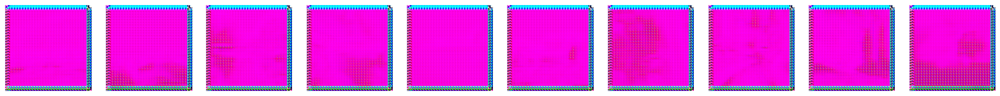

Epoch 36/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 1/1759 [00:00<03:39,  7.99it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 2/1759 [00:00<03:34,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 3/1759 [00:00<03:38,  8.04it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 4/1759 [00:00<03:33,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 5/1759 [00:00<03:26,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 6/1759 [00:00<03:30,  8.33it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 7/1759 [00:00<03:25,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 8/1759 [00:00<03:19,  8.78it/s]

1/1 [==============================] - 0s 40ms/step


  1%|          | 9/1759 [00:01<03:26,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 10/1759 [00:01<03:21,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 11/1759 [00:01<03:16,  8.89it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 12/1759 [00:01<03:22,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 13/1759 [00:01<03:17,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 14/1759 [00:01<03:14,  8.99it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 15/1759 [00:01<03:16,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 16/1759 [00:01<03:12,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 17/1759 [00:01<03:17,  8.82it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 18/1759 [00:02<03:19,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 19/1759 [00:02<03:16,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 20/1759 [00:02<03:19,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 21/1759 [00:02<03:21,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 22/1759 [00:02<03:18,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 23/1759 [00:02<03:24,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 24/1759 [00:02<03:19,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 25/1759 [00:02<03:14,  8.93it/s]

1/1 [==============================] - 0s 33ms/step


  1%|▏         | 26/1759 [00:02<03:16,  8.83it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 27/1759 [00:03<03:15,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 28/1759 [00:03<03:11,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 29/1759 [00:03<03:19,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 30/1759 [00:03<03:22,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 31/1759 [00:03<03:17,  8.76it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 32/1759 [00:03<03:21,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 33/1759 [00:03<03:18,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 34/1759 [00:03<03:14,  8.85it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 35/1759 [00:04<03:16,  8.77it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 36/1759 [00:04<03:16,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 37/1759 [00:04<03:13,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 38/1759 [00:04<03:19,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 39/1759 [00:04<03:19,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 40/1759 [00:04<03:16,  8.76it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 41/1759 [00:04<03:25,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 42/1759 [00:04<03:19,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 43/1759 [00:04<03:14,  8.84it/s]

1/1 [==============================] - 0s 42ms/step


  3%|▎         | 44/1759 [00:05<03:21,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 45/1759 [00:05<03:16,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 46/1759 [00:05<03:13,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 47/1759 [00:05<03:15,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 48/1759 [00:05<03:15,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 49/1759 [00:05<03:12,  8.89it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 50/1759 [00:05<03:16,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 51/1759 [00:05<03:11,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 52/1759 [00:05<03:09,  9.01it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 53/1759 [00:06<03:14,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 54/1759 [00:06<03:15,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 55/1759 [00:06<03:11,  8.90it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 56/1759 [00:06<03:14,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 57/1759 [00:06<03:14,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 58/1759 [00:06<03:11,  8.87it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 59/1759 [00:06<03:17,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 60/1759 [00:06<03:10,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 61/1759 [00:06<03:07,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 62/1759 [00:07<03:13,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 63/1759 [00:07<03:11,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 64/1759 [00:07<03:11,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 65/1759 [00:07<03:07,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 66/1759 [00:07<03:16,  8.63it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 67/1759 [00:07<03:12,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 68/1759 [00:07<03:15,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 69/1759 [00:07<03:14,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 70/1759 [00:08<03:11,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 71/1759 [00:08<03:08,  8.97it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 72/1759 [00:08<03:12,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 73/1759 [00:08<03:08,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 74/1759 [00:08<03:06,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 75/1759 [00:08<03:13,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 76/1759 [00:08<03:12,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 77/1759 [00:08<03:13,  8.70it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 78/1759 [00:08<03:14,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 79/1759 [00:09<03:09,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 80/1759 [00:09<03:15,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 81/1759 [00:09<03:12,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 82/1759 [00:09<03:09,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 83/1759 [00:09<03:05,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 84/1759 [00:09<03:10,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 85/1759 [00:09<03:06,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 86/1759 [00:09<03:03,  9.11it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 87/1759 [00:09<03:05,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 88/1759 [00:10<03:03,  9.09it/s]

1/1 [==============================] - 0s 47ms/step


  5%|▌         | 89/1759 [00:10<03:14,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 90/1759 [00:10<03:10,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 91/1759 [00:10<03:05,  8.97it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 92/1759 [00:10<03:08,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 93/1759 [00:10<03:10,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 94/1759 [00:10<03:07,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 95/1759 [00:10<03:15,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 96/1759 [00:10<03:14,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 97/1759 [00:11<03:16,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 98/1759 [00:11<03:15,  8.48it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 99/1759 [00:11<03:19,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 100/1759 [00:11<03:11,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 101/1759 [00:11<03:07,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 102/1759 [00:11<03:14,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 103/1759 [00:11<03:09,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 104/1759 [00:11<03:14,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 105/1759 [00:12<03:17,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 106/1759 [00:12<03:17,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 107/1759 [00:12<03:16,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 108/1759 [00:12<03:17,  8.34it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 109/1759 [00:12<03:14,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 110/1759 [00:12<03:09,  8.69it/s]

1/1 [==============================] - 0s 45ms/step


  6%|▋         | 111/1759 [00:12<03:21,  8.17it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 112/1759 [00:12<03:11,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 113/1759 [00:12<03:05,  8.86it/s]

1/1 [==============================] - 0s 40ms/step


  6%|▋         | 114/1759 [00:13<03:11,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 115/1759 [00:13<03:06,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 116/1759 [00:13<03:01,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 117/1759 [00:13<03:08,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 118/1759 [00:13<03:04,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 119/1759 [00:13<03:01,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 120/1759 [00:13<03:09,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 121/1759 [00:13<03:04,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 122/1759 [00:13<03:12,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 123/1759 [00:14<03:07,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 124/1759 [00:14<03:03,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 125/1759 [00:14<03:02,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 126/1759 [00:14<03:03,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 127/1759 [00:14<03:02,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 128/1759 [00:14<02:59,  9.11it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 129/1759 [00:14<03:04,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 130/1759 [00:14<03:00,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 131/1759 [00:14<02:58,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 132/1759 [00:15<02:59,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 133/1759 [00:15<02:56,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 134/1759 [00:15<02:56,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 135/1759 [00:15<03:05,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 136/1759 [00:15<03:01,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 137/1759 [00:15<02:58,  9.08it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 138/1759 [00:15<03:01,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 139/1759 [00:15<03:03,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 140/1759 [00:15<03:00,  8.96it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 141/1759 [00:16<03:06,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 142/1759 [00:16<03:02,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 143/1759 [00:16<03:00,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 144/1759 [00:16<03:02,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 145/1759 [00:16<03:02,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 146/1759 [00:16<03:00,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 147/1759 [00:16<03:06,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 148/1759 [00:16<03:04,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 149/1759 [00:17<03:01,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 150/1759 [00:17<03:08,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 151/1759 [00:17<03:03,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 152/1759 [00:17<02:59,  8.93it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▊         | 153/1759 [00:17<03:10,  8.42it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 154/1759 [00:17<03:03,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 155/1759 [00:17<02:59,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 156/1759 [00:17<03:04,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 157/1759 [00:17<03:04,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 158/1759 [00:18<03:00,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 159/1759 [00:18<02:56,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 160/1759 [00:18<03:03,  8.70it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 161/1759 [00:18<02:58,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 162/1759 [00:18<02:58,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 163/1759 [00:18<02:58,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 164/1759 [00:18<02:54,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 165/1759 [00:18<02:55,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 166/1759 [00:18<03:04,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 167/1759 [00:19<02:59,  8.86it/s]

1/1 [==============================] - 0s 45ms/step


 10%|▉         | 168/1759 [00:19<03:07,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 169/1759 [00:19<03:03,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 170/1759 [00:19<03:00,  8.79it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 171/1759 [00:19<03:02,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 172/1759 [00:19<02:56,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 173/1759 [00:19<02:54,  9.09it/s]

1/1 [==============================] - 0s 44ms/step


 10%|▉         | 174/1759 [00:19<03:08,  8.41it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 175/1759 [00:19<03:06,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 176/1759 [00:20<02:59,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 177/1759 [00:20<03:04,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 178/1759 [00:20<03:00,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 179/1759 [00:20<02:56,  8.95it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█         | 180/1759 [00:20<03:05,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 181/1759 [00:20<02:59,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 182/1759 [00:20<02:56,  8.95it/s]

1/1 [==============================] - 0s 37ms/step


 10%|█         | 183/1759 [00:20<02:59,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 184/1759 [00:21<02:59,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 185/1759 [00:21<02:55,  8.96it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 186/1759 [00:21<03:01,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 187/1759 [00:21<02:55,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 188/1759 [00:21<02:52,  9.12it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 189/1759 [00:21<03:00,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 190/1759 [00:21<02:57,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 191/1759 [00:21<02:53,  9.06it/s]

1/1 [==============================] - 0s 45ms/step


 11%|█         | 192/1759 [00:21<03:01,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 193/1759 [00:22<02:59,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 194/1759 [00:22<02:56,  8.86it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 195/1759 [00:22<02:56,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 196/1759 [00:22<02:53,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 197/1759 [00:22<02:50,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 198/1759 [00:22<02:58,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 199/1759 [00:22<02:57,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 200/1759 [00:22<02:55,  8.86it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 201/1759 [00:22<02:56,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 202/1759 [00:23<02:57,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 203/1759 [00:23<02:54,  8.94it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█▏        | 204/1759 [00:23<02:59,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 205/1759 [00:23<03:00,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 206/1759 [00:23<02:58,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 207/1759 [00:23<03:03,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 208/1759 [00:23<02:58,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 209/1759 [00:23<02:55,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 210/1759 [00:23<02:51,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 211/1759 [00:24<02:59,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 212/1759 [00:24<02:56,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 213/1759 [00:24<02:53,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 214/1759 [00:24<02:52,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 215/1759 [00:24<02:48,  9.16it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 216/1759 [00:24<02:46,  9.25it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 217/1759 [00:24<02:49,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 218/1759 [00:24<02:46,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 219/1759 [00:24<02:55,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 220/1759 [00:25<03:00,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 221/1759 [00:25<03:01,  8.50it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 222/1759 [00:25<03:03,  8.37it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 223/1759 [00:25<02:56,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 224/1759 [00:25<02:50,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 225/1759 [00:25<02:57,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 226/1759 [00:25<02:53,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 227/1759 [00:25<02:49,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 228/1759 [00:25<02:57,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 229/1759 [00:26<02:55,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 230/1759 [00:26<02:51,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 231/1759 [00:26<02:54,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 232/1759 [00:26<02:51,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 233/1759 [00:26<02:49,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 234/1759 [00:26<02:53,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 235/1759 [00:26<02:51,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 236/1759 [00:26<02:46,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 237/1759 [00:27<02:55,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 238/1759 [00:27<02:55,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 239/1759 [00:27<02:50,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 240/1759 [00:27<02:50,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 241/1759 [00:27<02:49,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 242/1759 [00:27<02:47,  9.05it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 243/1759 [00:27<02:54,  8.69it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 244/1759 [00:27<02:49,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 245/1759 [00:27<02:46,  9.09it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 246/1759 [00:28<02:54,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 247/1759 [00:28<02:55,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 248/1759 [00:28<02:49,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 249/1759 [00:28<02:45,  9.10it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 250/1759 [00:28<02:54,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 251/1759 [00:28<02:48,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 252/1759 [00:28<02:46,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 253/1759 [00:28<02:49,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 254/1759 [00:28<02:48,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 255/1759 [00:29<02:46,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 256/1759 [00:29<02:53,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 257/1759 [00:29<02:50,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 258/1759 [00:29<02:48,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 259/1759 [00:29<02:45,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 260/1759 [00:29<02:48,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 261/1759 [00:29<02:44,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 262/1759 [00:29<02:40,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 263/1759 [00:29<02:43,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 264/1759 [00:30<02:41,  9.25it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 265/1759 [00:30<02:44,  9.10it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 266/1759 [00:30<02:52,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 267/1759 [00:30<02:47,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 268/1759 [00:30<02:43,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 269/1759 [00:30<02:44,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 270/1759 [00:30<02:42,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 271/1759 [00:30<02:39,  9.32it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 272/1759 [00:30<02:44,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 273/1759 [00:31<02:41,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 274/1759 [00:31<02:43,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 275/1759 [00:31<02:48,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 276/1759 [00:31<02:42,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 277/1759 [00:31<02:40,  9.22it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 278/1759 [00:31<02:42,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 279/1759 [00:31<02:40,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 280/1759 [00:31<02:52,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 281/1759 [00:31<02:47,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 282/1759 [00:32<02:44,  9.00it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 283/1759 [00:32<02:54,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 284/1759 [00:32<02:48,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 285/1759 [00:32<02:44,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 286/1759 [00:32<02:48,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 287/1759 [00:32<02:49,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 288/1759 [00:32<02:44,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 289/1759 [00:32<02:50,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 290/1759 [00:32<02:45,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 291/1759 [00:33<02:42,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 292/1759 [00:33<02:49,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 293/1759 [00:33<02:46,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 294/1759 [00:33<02:43,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 295/1759 [00:33<02:47,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 296/1759 [00:33<02:42,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 297/1759 [00:33<02:39,  9.17it/s]

1/1 [==============================] - 0s 52ms/step


 17%|█▋        | 298/1759 [00:33<02:51,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 299/1759 [00:33<02:44,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 300/1759 [00:34<02:47,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 301/1759 [00:34<02:53,  8.39it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 302/1759 [00:34<03:00,  8.07it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 303/1759 [00:34<02:53,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 304/1759 [00:34<02:58,  8.14it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 305/1759 [00:34<02:52,  8.44it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 306/1759 [00:34<02:47,  8.68it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 307/1759 [00:34<03:03,  7.90it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 308/1759 [00:35<03:08,  7.70it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 309/1759 [00:35<02:58,  8.10it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 310/1759 [00:35<03:00,  8.04it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 311/1759 [00:35<02:53,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 312/1759 [00:35<02:47,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 313/1759 [00:35<02:48,  8.58it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 314/1759 [00:35<02:43,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 315/1759 [00:35<02:43,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 316/1759 [00:35<02:40,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 317/1759 [00:36<02:41,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 318/1759 [00:36<02:40,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 319/1759 [00:36<02:52,  8.32it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 320/1759 [00:36<02:46,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 321/1759 [00:36<02:40,  8.93it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 322/1759 [00:36<02:48,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 323/1759 [00:36<02:42,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 324/1759 [00:36<02:41,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 325/1759 [00:36<02:38,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 326/1759 [00:37<02:39,  8.99it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 327/1759 [00:37<02:35,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 328/1759 [00:37<02:35,  9.21it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 329/1759 [00:37<02:38,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 330/1759 [00:37<02:37,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 331/1759 [00:37<02:39,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 332/1759 [00:37<02:39,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 333/1759 [00:37<02:36,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 334/1759 [00:38<02:42,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 335/1759 [00:38<02:38,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 336/1759 [00:38<02:34,  9.24it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 337/1759 [00:38<02:35,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 338/1759 [00:38<02:39,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 339/1759 [00:38<02:36,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 340/1759 [00:38<02:42,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 341/1759 [00:38<02:41,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 342/1759 [00:38<02:37,  8.97it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 343/1759 [00:39<02:47,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 344/1759 [00:39<02:40,  8.79it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 345/1759 [00:39<02:37,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 346/1759 [00:39<02:37,  8.95it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 347/1759 [00:39<02:41,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 348/1759 [00:39<02:37,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 349/1759 [00:39<02:38,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 350/1759 [00:39<02:37,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 351/1759 [00:39<02:34,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 352/1759 [00:40<02:32,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 353/1759 [00:40<02:37,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 354/1759 [00:40<02:35,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 355/1759 [00:40<02:40,  8.76it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 356/1759 [00:40<05:05,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 357/1759 [00:40<04:32,  5.15it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 358/1759 [00:41<04:02,  5.78it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 359/1759 [00:41<03:37,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 360/1759 [00:41<03:25,  6.80it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 361/1759 [00:41<03:10,  7.32it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 362/1759 [00:41<03:01,  7.68it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 363/1759 [00:41<03:04,  7.58it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 364/1759 [00:41<02:59,  7.79it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 365/1759 [00:41<02:52,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 366/1759 [00:42<02:50,  8.15it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 367/1759 [00:42<02:47,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 368/1759 [00:42<02:51,  8.09it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 369/1759 [00:42<02:47,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 370/1759 [00:42<02:43,  8.50it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██        | 371/1759 [00:42<02:50,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 372/1759 [00:42<02:47,  8.30it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 373/1759 [00:42<02:47,  8.27it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██▏       | 374/1759 [00:43<02:53,  7.98it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 375/1759 [00:43<02:48,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 376/1759 [00:43<02:43,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 377/1759 [00:43<02:44,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 378/1759 [00:43<02:47,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 379/1759 [00:43<02:43,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 380/1759 [00:43<02:48,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 381/1759 [00:43<02:44,  8.39it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 382/1759 [00:43<02:47,  8.25it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 383/1759 [00:44<02:52,  7.99it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 384/1759 [00:44<02:48,  8.18it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 385/1759 [00:44<02:45,  8.30it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 386/1759 [00:44<02:50,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 387/1759 [00:44<02:48,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 388/1759 [00:44<02:43,  8.37it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 389/1759 [00:44<02:49,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 390/1759 [00:44<02:44,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 391/1759 [00:45<02:47,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 392/1759 [00:45<02:48,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 393/1759 [00:45<02:43,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 394/1759 [00:45<02:40,  8.52it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 395/1759 [00:45<02:45,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 396/1759 [00:45<02:42,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 397/1759 [00:45<02:38,  8.59it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 398/1759 [00:45<02:40,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 399/1759 [00:46<02:39,  8.55it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 400/1759 [00:46<02:43,  8.33it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 401/1759 [00:46<02:49,  8.03it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 402/1759 [00:46<02:44,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 403/1759 [00:46<02:41,  8.38it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 404/1759 [00:46<02:42,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 405/1759 [00:46<02:43,  8.30it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 406/1759 [00:46<02:41,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 407/1759 [00:46<02:43,  8.26it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 408/1759 [00:47<02:42,  8.33it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 409/1759 [00:47<02:52,  7.81it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 410/1759 [00:47<02:54,  7.71it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 411/1759 [00:47<02:48,  7.98it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 412/1759 [00:47<02:54,  7.74it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 413/1759 [00:47<02:47,  8.03it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 414/1759 [00:47<02:42,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 415/1759 [00:47<02:46,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 416/1759 [00:48<02:47,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 417/1759 [00:48<02:43,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 418/1759 [00:48<02:50,  7.86it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 419/1759 [00:48<02:45,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 420/1759 [00:48<02:40,  8.33it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 421/1759 [00:48<02:43,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 422/1759 [00:48<02:40,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 423/1759 [00:48<02:36,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 424/1759 [00:49<02:41,  8.29it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 425/1759 [00:49<02:38,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 426/1759 [00:49<02:40,  8.32it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 427/1759 [00:49<02:46,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 428/1759 [00:49<02:41,  8.26it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 429/1759 [00:49<02:38,  8.41it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 430/1759 [00:49<02:40,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 431/1759 [00:49<02:38,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 432/1759 [00:50<02:35,  8.55it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 433/1759 [00:50<02:41,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 434/1759 [00:50<02:37,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 435/1759 [00:50<02:34,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 436/1759 [00:50<02:46,  7.94it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 437/1759 [00:50<02:43,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 438/1759 [00:50<02:48,  7.84it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 439/1759 [00:50<02:42,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 440/1759 [00:51<02:38,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 441/1759 [00:51<02:43,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 442/1759 [00:51<02:42,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 443/1759 [00:51<02:37,  8.34it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 444/1759 [00:51<02:41,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 445/1759 [00:51<02:41,  8.15it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 446/1759 [00:51<02:45,  7.92it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 447/1759 [00:51<02:42,  8.09it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 448/1759 [00:51<02:37,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 449/1759 [00:52<02:39,  8.21it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 450/1759 [00:52<02:40,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 451/1759 [00:52<02:36,  8.33it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 452/1759 [00:52<02:37,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 453/1759 [00:52<02:34,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 454/1759 [00:52<02:42,  8.03it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 455/1759 [00:52<02:40,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 456/1759 [00:52<02:36,  8.31it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 457/1759 [00:53<02:41,  8.07it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 458/1759 [00:53<02:38,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 459/1759 [00:53<02:38,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 460/1759 [00:53<02:40,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 461/1759 [00:53<02:35,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 462/1759 [00:53<02:34,  8.40it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 463/1759 [00:53<02:39,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 464/1759 [00:53<02:35,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 465/1759 [00:54<02:32,  8.51it/s]

1/1 [==============================] - 0s 44ms/step


 26%|██▋       | 466/1759 [00:54<02:37,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 467/1759 [00:54<02:34,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 468/1759 [00:54<02:32,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 469/1759 [00:54<02:36,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 470/1759 [00:54<02:33,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 471/1759 [00:54<02:32,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 472/1759 [00:54<02:41,  7.98it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 473/1759 [00:55<02:36,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 474/1759 [00:55<02:31,  8.48it/s]

1/1 [==============================] - 0s 51ms/step


 27%|██▋       | 475/1759 [00:55<02:43,  7.87it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 476/1759 [00:55<02:36,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 477/1759 [00:55<02:33,  8.37it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 478/1759 [00:55<02:38,  8.08it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 479/1759 [00:55<02:34,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 480/1759 [00:55<02:30,  8.47it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 481/1759 [00:56<02:36,  8.17it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 482/1759 [00:56<02:32,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 483/1759 [00:56<02:29,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 484/1759 [00:56<02:35,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 485/1759 [00:56<02:32,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 486/1759 [00:56<02:29,  8.49it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 487/1759 [00:56<02:33,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 488/1759 [00:56<02:29,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 489/1759 [00:56<02:26,  8.67it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 490/1759 [00:57<02:32,  8.32it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 491/1759 [00:57<02:30,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 492/1759 [00:57<02:28,  8.55it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 493/1759 [00:57<02:37,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 494/1759 [00:57<02:32,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 495/1759 [00:57<02:29,  8.45it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 496/1759 [00:57<02:35,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 497/1759 [00:57<02:31,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 498/1759 [00:58<02:29,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 499/1759 [00:58<02:34,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 500/1759 [00:58<02:30,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 501/1759 [00:58<02:34,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 502/1759 [00:58<02:33,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 503/1759 [00:58<02:30,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 504/1759 [00:58<02:36,  8.01it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 505/1759 [00:58<02:34,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 506/1759 [00:59<02:31,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 507/1759 [00:59<02:36,  7.98it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 508/1759 [00:59<02:37,  7.96it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 509/1759 [00:59<02:32,  8.17it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 510/1759 [00:59<02:37,  7.92it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 511/1759 [00:59<02:32,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 512/1759 [00:59<02:27,  8.45it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▉       | 513/1759 [00:59<02:32,  8.17it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 514/1759 [00:59<02:27,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 515/1759 [01:00<02:25,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 516/1759 [01:00<02:27,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 517/1759 [01:00<02:29,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 518/1759 [01:00<02:26,  8.48it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 519/1759 [01:00<02:30,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 520/1759 [01:00<02:27,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 521/1759 [01:00<02:22,  8.66it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 522/1759 [01:00<02:25,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 523/1759 [01:01<02:23,  8.60it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 524/1759 [01:01<02:21,  8.72it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 525/1759 [01:01<02:29,  8.25it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 526/1759 [01:01<02:31,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 527/1759 [01:01<02:28,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 528/1759 [01:01<02:30,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 529/1759 [01:01<02:26,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 530/1759 [01:01<02:30,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 531/1759 [01:02<02:28,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 532/1759 [01:02<02:27,  8.29it/s]

1/1 [==============================] - 0s 41ms/step


 30%|███       | 533/1759 [01:02<02:32,  8.03it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 534/1759 [01:02<02:32,  8.05it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 535/1759 [01:02<02:31,  8.10it/s]

1/1 [==============================] - 0s 41ms/step


 30%|███       | 536/1759 [01:02<02:34,  7.91it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 537/1759 [01:02<02:28,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 538/1759 [01:02<02:25,  8.41it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 539/1759 [01:02<02:25,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 540/1759 [01:03<02:23,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 541/1759 [01:03<02:20,  8.67it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 542/1759 [01:03<02:21,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 543/1759 [01:03<02:19,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 544/1759 [01:03<02:21,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 545/1759 [01:03<02:24,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 546/1759 [01:03<02:21,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 547/1759 [01:03<02:20,  8.62it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 548/1759 [01:04<02:22,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 549/1759 [01:04<02:20,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 550/1759 [01:04<02:18,  8.73it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 551/1759 [01:04<02:20,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 552/1759 [01:04<02:22,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 553/1759 [01:04<02:24,  8.33it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 554/1759 [01:04<02:25,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 555/1759 [01:04<02:22,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 556/1759 [01:04<02:19,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 557/1759 [01:05<02:23,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 558/1759 [01:05<02:23,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 559/1759 [01:05<02:28,  8.08it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 560/1759 [01:05<02:24,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 561/1759 [01:05<02:21,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 562/1759 [01:05<02:31,  7.88it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 563/1759 [01:05<02:26,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 564/1759 [01:05<02:26,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 565/1759 [01:06<02:29,  8.01it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 566/1759 [01:06<02:24,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 567/1759 [01:06<02:21,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 568/1759 [01:06<02:23,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 569/1759 [01:06<02:23,  8.32it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 570/1759 [01:06<02:28,  8.02it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 571/1759 [01:06<02:28,  8.00it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 572/1759 [01:06<02:24,  8.22it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 573/1759 [01:07<02:29,  7.95it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 574/1759 [01:07<02:24,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 575/1759 [01:07<02:20,  8.41it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 576/1759 [01:07<02:26,  8.09it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 577/1759 [01:07<02:21,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 578/1759 [01:07<02:19,  8.46it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 579/1759 [01:07<02:21,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 580/1759 [01:07<02:22,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 581/1759 [01:08<02:20,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 582/1759 [01:08<02:20,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 583/1759 [01:08<02:17,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 584/1759 [01:08<02:14,  8.73it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 585/1759 [01:08<02:17,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 586/1759 [01:08<02:14,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 587/1759 [01:08<02:19,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 588/1759 [01:08<02:19,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 589/1759 [01:08<02:19,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 590/1759 [01:09<02:17,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 591/1759 [01:09<02:20,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 592/1759 [01:09<02:17,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 593/1759 [01:09<02:24,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 594/1759 [01:09<02:21,  8.25it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 595/1759 [01:09<02:21,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 596/1759 [01:09<02:22,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 597/1759 [01:09<02:18,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 598/1759 [01:10<02:22,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 599/1759 [01:10<02:22,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 600/1759 [01:10<02:20,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 601/1759 [01:10<02:17,  8.44it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 602/1759 [01:10<02:21,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 603/1759 [01:10<02:18,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 604/1759 [01:10<02:26,  7.86it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 605/1759 [01:10<02:22,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 606/1759 [01:11<02:19,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 607/1759 [01:11<02:26,  7.88it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 608/1759 [01:11<02:21,  8.11it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 609/1759 [01:11<02:18,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 610/1759 [01:11<02:22,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 611/1759 [01:11<02:18,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 612/1759 [01:11<02:18,  8.30it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 613/1759 [01:11<02:24,  7.91it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 614/1759 [01:12<02:20,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 615/1759 [01:12<02:17,  8.30it/s]

1/1 [==============================] - 0s 46ms/step


 35%|███▌      | 616/1759 [01:12<02:27,  7.73it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 617/1759 [01:12<02:21,  8.07it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 618/1759 [01:12<02:16,  8.34it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 619/1759 [01:12<02:18,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 620/1759 [01:12<02:15,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 621/1759 [01:12<02:12,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 622/1759 [01:12<02:13,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 623/1759 [01:13<02:11,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 624/1759 [01:13<02:08,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 625/1759 [01:13<02:14,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 626/1759 [01:13<02:11,  8.59it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 627/1759 [01:13<02:10,  8.67it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 628/1759 [01:13<02:14,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 629/1759 [01:13<02:13,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 630/1759 [01:13<02:11,  8.61it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 631/1759 [01:14<02:13,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 632/1759 [01:14<02:11,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 633/1759 [01:14<02:09,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 634/1759 [01:14<02:15,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 635/1759 [01:14<02:13,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 636/1759 [01:14<02:11,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 637/1759 [01:14<02:19,  8.07it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 638/1759 [01:14<02:16,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 639/1759 [01:14<02:13,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 640/1759 [01:15<02:16,  8.23it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 641/1759 [01:15<02:12,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 642/1759 [01:15<02:09,  8.63it/s]

1/1 [==============================] - 0s 51ms/step


 37%|███▋      | 643/1759 [01:15<02:19,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 644/1759 [01:15<02:14,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 645/1759 [01:15<02:11,  8.50it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 646/1759 [01:15<02:17,  8.11it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 647/1759 [01:15<02:16,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 648/1759 [01:16<02:13,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 649/1759 [01:16<02:14,  8.26it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 650/1759 [01:16<02:10,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 651/1759 [01:16<02:06,  8.73it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 652/1759 [01:16<02:13,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 653/1759 [01:16<02:10,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 654/1759 [01:16<02:08,  8.57it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 655/1759 [01:16<02:12,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 656/1759 [01:17<02:09,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 657/1759 [01:17<02:07,  8.65it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 658/1759 [01:17<02:13,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 659/1759 [01:17<02:09,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 660/1759 [01:17<02:07,  8.62it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 661/1759 [01:17<02:14,  8.14it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 662/1759 [01:17<02:12,  8.27it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 663/1759 [01:17<02:20,  7.81it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 664/1759 [01:17<02:15,  8.08it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 665/1759 [01:18<02:10,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 666/1759 [01:18<02:15,  8.09it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 667/1759 [01:18<02:14,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 668/1759 [01:18<02:10,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 669/1759 [01:18<02:07,  8.58it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 670/1759 [01:18<02:11,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 671/1759 [01:18<02:08,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 672/1759 [01:18<02:12,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 673/1759 [01:19<02:10,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 674/1759 [01:19<02:07,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 675/1759 [01:19<02:05,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 676/1759 [01:19<02:07,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 677/1759 [01:19<02:04,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 678/1759 [01:19<02:03,  8.76it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▊      | 679/1759 [01:19<02:13,  8.11it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 680/1759 [01:19<02:09,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 681/1759 [01:19<02:06,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 682/1759 [01:20<02:06,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 683/1759 [01:20<02:04,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 684/1759 [01:20<02:02,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 685/1759 [01:20<02:04,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 686/1759 [01:20<02:03,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 687/1759 [01:20<02:02,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 688/1759 [01:20<02:11,  8.12it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 689/1759 [01:20<02:10,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 690/1759 [01:21<02:08,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 691/1759 [01:21<02:08,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 692/1759 [01:21<02:07,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 693/1759 [01:21<02:05,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 694/1759 [01:21<02:03,  8.59it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 695/1759 [01:21<02:07,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 696/1759 [01:21<02:04,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 697/1759 [01:21<02:05,  8.50it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███▉      | 698/1759 [01:22<02:09,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 699/1759 [01:22<02:07,  8.29it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 700/1759 [01:22<02:07,  8.34it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 701/1759 [01:22<02:08,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 702/1759 [01:22<02:07,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 703/1759 [01:22<02:05,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 704/1759 [01:22<02:11,  8.02it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 705/1759 [01:22<02:07,  8.24it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 706/1759 [01:22<02:10,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 707/1759 [01:23<02:09,  8.09it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 708/1759 [01:23<02:05,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 709/1759 [01:23<02:02,  8.59it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 710/1759 [01:23<02:03,  8.52it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 711/1759 [01:23<02:03,  8.49it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 712/1759 [01:23<02:03,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 713/1759 [01:23<02:07,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 714/1759 [01:23<02:03,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 715/1759 [01:24<02:05,  8.29it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 716/1759 [01:24<02:10,  8.01it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 717/1759 [01:24<02:05,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 718/1759 [01:24<02:02,  8.50it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 719/1759 [01:24<02:07,  8.15it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 720/1759 [01:24<02:04,  8.32it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 721/1759 [01:24<02:00,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 722/1759 [01:24<02:00,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 723/1759 [01:24<01:58,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 724/1759 [01:25<01:59,  8.67it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 725/1759 [01:25<02:01,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 726/1759 [01:25<01:58,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 727/1759 [01:25<01:56,  8.87it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████▏     | 728/1759 [01:25<01:59,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 729/1759 [01:25<01:57,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 730/1759 [01:25<01:55,  8.89it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 731/1759 [01:25<02:00,  8.53it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 732/1759 [01:26<02:00,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 733/1759 [01:26<02:00,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 734/1759 [01:26<02:04,  8.26it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 735/1759 [01:26<02:01,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 736/1759 [01:26<01:58,  8.61it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 737/1759 [01:26<02:00,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 738/1759 [01:26<01:59,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 739/1759 [01:26<01:57,  8.70it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 740/1759 [01:26<01:58,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 741/1759 [01:27<01:58,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 742/1759 [01:27<02:00,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 743/1759 [01:27<02:00,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 744/1759 [01:27<01:58,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 745/1759 [01:27<01:56,  8.73it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 746/1759 [01:27<01:58,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 747/1759 [01:27<01:56,  8.69it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 748/1759 [01:27<01:56,  8.68it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 749/1759 [01:28<01:58,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 750/1759 [01:28<01:59,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 751/1759 [01:28<02:02,  8.23it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 752/1759 [01:28<02:04,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 753/1759 [01:28<02:02,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 754/1759 [01:28<01:59,  8.44it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 755/1759 [01:28<01:59,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 756/1759 [01:28<01:58,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 757/1759 [01:28<01:56,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 758/1759 [01:29<02:01,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 759/1759 [01:29<01:58,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 760/1759 [01:29<01:59,  8.34it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 761/1759 [01:29<02:05,  7.98it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 762/1759 [01:29<02:01,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 763/1759 [01:29<01:59,  8.35it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 764/1759 [01:29<02:03,  8.03it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 765/1759 [01:29<01:59,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 766/1759 [01:30<01:57,  8.44it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▎     | 767/1759 [01:30<02:02,  8.08it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 768/1759 [01:30<01:57,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 769/1759 [01:30<01:56,  8.50it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 770/1759 [01:30<02:00,  8.22it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 771/1759 [01:30<01:56,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 772/1759 [01:30<01:54,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 773/1759 [01:30<01:57,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 774/1759 [01:31<01:54,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 775/1759 [01:31<01:52,  8.75it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 776/1759 [01:31<01:53,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 777/1759 [01:31<01:51,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 778/1759 [01:31<01:52,  8.72it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 779/1759 [01:31<01:54,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 780/1759 [01:31<01:53,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 781/1759 [01:31<01:50,  8.84it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▍     | 782/1759 [01:31<01:56,  8.42it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 783/1759 [01:32<01:53,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 784/1759 [01:32<01:50,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 785/1759 [01:32<01:48,  9.01it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 786/1759 [01:32<01:48,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 787/1759 [01:32<01:50,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 788/1759 [01:32<01:57,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 789/1759 [01:32<01:55,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 790/1759 [01:32<01:52,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 791/1759 [01:32<01:51,  8.65it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 792/1759 [01:33<01:54,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 793/1759 [01:33<01:56,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 794/1759 [01:33<01:53,  8.54it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 795/1759 [01:33<01:53,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 796/1759 [01:33<01:54,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 797/1759 [01:33<01:52,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 798/1759 [01:33<01:54,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 799/1759 [01:33<01:54,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 800/1759 [01:34<01:56,  8.20it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 801/1759 [01:34<01:52,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 802/1759 [01:34<01:51,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 803/1759 [01:34<01:50,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 804/1759 [01:34<01:51,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 805/1759 [01:34<01:51,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 806/1759 [01:34<01:49,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 807/1759 [01:34<01:54,  8.32it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 808/1759 [01:34<01:51,  8.56it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 809/1759 [01:35<01:47,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 810/1759 [01:35<01:50,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 811/1759 [01:35<01:49,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 812/1759 [01:35<01:46,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 813/1759 [01:35<01:50,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 814/1759 [01:35<01:50,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 815/1759 [01:35<01:48,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 816/1759 [01:35<01:47,  8.81it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▋     | 817/1759 [01:36<01:50,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 818/1759 [01:36<01:47,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 819/1759 [01:36<01:46,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 820/1759 [01:36<01:49,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 821/1759 [01:36<01:47,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 822/1759 [01:36<01:45,  8.88it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 823/1759 [01:36<01:50,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 824/1759 [01:36<01:47,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 825/1759 [01:36<01:45,  8.85it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 826/1759 [01:37<01:49,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 827/1759 [01:37<01:47,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 828/1759 [01:37<01:48,  8.62it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 829/1759 [01:37<01:50,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 830/1759 [01:37<01:48,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 831/1759 [01:37<01:45,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 832/1759 [01:37<01:50,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 833/1759 [01:37<01:47,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 834/1759 [01:37<01:44,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 835/1759 [01:38<01:43,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 836/1759 [01:38<01:44,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 837/1759 [01:38<01:43,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 838/1759 [01:38<01:41,  9.08it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 839/1759 [01:38<01:43,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 840/1759 [01:38<01:41,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 841/1759 [01:38<01:42,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 842/1759 [01:38<01:46,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 843/1759 [01:38<01:44,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 844/1759 [01:39<01:43,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 845/1759 [01:39<01:48,  8.44it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 846/1759 [01:39<01:48,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 847/1759 [01:39<01:45,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 848/1759 [01:39<01:45,  8.61it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 849/1759 [01:39<01:43,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 850/1759 [01:39<01:49,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 851/1759 [01:39<01:47,  8.47it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 852/1759 [01:40<01:44,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 853/1759 [01:40<01:42,  8.80it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 854/1759 [01:40<01:45,  8.56it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 855/1759 [01:40<01:45,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 856/1759 [01:40<01:42,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 857/1759 [01:40<01:42,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 858/1759 [01:40<01:41,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 859/1759 [01:40<01:42,  8.82it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 860/1759 [01:40<01:46,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 861/1759 [01:41<01:43,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 862/1759 [01:41<01:41,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 863/1759 [01:41<01:39,  9.03it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 864/1759 [01:41<01:41,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 865/1759 [01:41<01:40,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 866/1759 [01:41<01:39,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 867/1759 [01:41<01:40,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 868/1759 [01:41<01:40,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 869/1759 [01:41<01:38,  9.01it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 870/1759 [01:42<01:42,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 871/1759 [01:42<01:41,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 872/1759 [01:42<01:43,  8.58it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 873/1759 [01:42<01:43,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 874/1759 [01:42<01:42,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 875/1759 [01:42<01:41,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 876/1759 [01:42<01:42,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 877/1759 [01:42<01:41,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 878/1759 [01:43<01:39,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 879/1759 [01:43<01:41,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 880/1759 [01:43<01:43,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 881/1759 [01:43<01:42,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 882/1759 [01:43<01:44,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 883/1759 [01:43<01:40,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 884/1759 [01:43<01:38,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 885/1759 [01:43<01:36,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 886/1759 [01:43<01:39,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 887/1759 [01:44<01:37,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 888/1759 [01:44<01:36,  9.04it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 889/1759 [01:44<01:38,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 890/1759 [01:44<01:37,  8.95it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 891/1759 [01:44<01:39,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 892/1759 [01:44<01:38,  8.83it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 893/1759 [01:44<01:39,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 894/1759 [01:44<01:37,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 895/1759 [01:44<01:38,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 896/1759 [01:45<01:39,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 897/1759 [01:45<01:37,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 898/1759 [01:45<01:35,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 899/1759 [01:45<01:37,  8.84it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 900/1759 [01:45<01:36,  8.91it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 901/1759 [01:45<01:36,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 902/1759 [01:45<01:39,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 903/1759 [01:45<01:37,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 904/1759 [01:46<01:45,  8.07it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 905/1759 [01:46<01:41,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 906/1759 [01:46<01:38,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 907/1759 [01:46<01:36,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 908/1759 [01:46<01:37,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 909/1759 [01:46<01:36,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 910/1759 [01:46<01:34,  8.94it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 911/1759 [01:46<01:38,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 912/1759 [01:46<01:35,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 913/1759 [01:47<01:35,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 914/1759 [01:47<01:36,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 915/1759 [01:47<01:34,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 916/1759 [01:47<01:33,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 917/1759 [01:47<01:36,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 918/1759 [01:47<01:35,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 919/1759 [01:47<01:33,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 920/1759 [01:47<01:38,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 921/1759 [01:47<01:36,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 922/1759 [01:48<01:36,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 923/1759 [01:48<01:34,  8.83it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 924/1759 [01:48<01:38,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 925/1759 [01:48<01:35,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 926/1759 [01:48<01:32,  8.97it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 927/1759 [01:48<01:34,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 928/1759 [01:48<01:32,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 929/1759 [01:48<01:31,  9.10it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 930/1759 [01:48<01:32,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 931/1759 [01:49<01:32,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 932/1759 [01:49<01:31,  9.09it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 933/1759 [01:49<01:35,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 934/1759 [01:49<01:34,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 935/1759 [01:49<01:32,  8.88it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 936/1759 [01:49<01:37,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 937/1759 [01:49<01:34,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 938/1759 [01:49<01:32,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 939/1759 [01:49<01:30,  9.06it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 940/1759 [01:50<01:34,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 941/1759 [01:50<01:34,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 942/1759 [01:50<01:33,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 943/1759 [01:50<01:33,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 944/1759 [01:50<01:32,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 945/1759 [01:50<01:31,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 946/1759 [01:50<01:30,  9.02it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 947/1759 [01:50<01:32,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 948/1759 [01:50<01:30,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 949/1759 [01:51<01:31,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 950/1759 [01:51<01:31,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 951/1759 [01:51<01:30,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 952/1759 [01:51<01:33,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 953/1759 [01:51<01:30,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 954/1759 [01:51<01:29,  9.00it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 955/1759 [01:51<01:34,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 956/1759 [01:51<01:31,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 957/1759 [01:51<01:28,  9.07it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 958/1759 [01:52<01:36,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 959/1759 [01:52<01:32,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 960/1759 [01:52<01:33,  8.53it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 961/1759 [01:52<01:34,  8.42it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 962/1759 [01:52<01:31,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 963/1759 [01:52<01:29,  8.88it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 964/1759 [01:52<01:33,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 965/1759 [01:52<01:30,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 966/1759 [01:53<01:28,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 967/1759 [01:53<01:33,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 968/1759 [01:53<01:30,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 969/1759 [01:53<01:28,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 970/1759 [01:53<01:31,  8.59it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 971/1759 [01:53<01:29,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 972/1759 [01:53<01:30,  8.73it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 973/1759 [01:53<01:33,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 974/1759 [01:53<01:30,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 975/1759 [01:54<01:27,  8.94it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 976/1759 [01:54<01:31,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 977/1759 [01:54<01:29,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 978/1759 [01:54<01:28,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 979/1759 [01:54<01:29,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 980/1759 [01:54<01:27,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 981/1759 [01:54<01:25,  9.07it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 982/1759 [01:54<01:30,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 983/1759 [01:54<01:28,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 984/1759 [01:55<01:26,  8.99it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 985/1759 [01:55<01:32,  8.34it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 986/1759 [01:55<01:29,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 987/1759 [01:55<01:26,  8.88it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 988/1759 [01:55<01:30,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 989/1759 [01:55<01:27,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 990/1759 [01:55<01:27,  8.74it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▋    | 991/1759 [01:55<01:32,  8.31it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 992/1759 [01:56<01:29,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 993/1759 [01:56<01:26,  8.88it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 994/1759 [01:56<01:33,  8.22it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 995/1759 [01:56<01:31,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 996/1759 [01:56<01:28,  8.60it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 997/1759 [01:56<01:32,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 998/1759 [01:56<01:31,  8.28it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 999/1759 [01:56<01:29,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1000/1759 [01:57<01:32,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1001/1759 [01:57<01:30,  8.42it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1002/1759 [01:57<01:27,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1003/1759 [01:57<01:32,  8.17it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1004/1759 [01:57<01:29,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1005/1759 [01:57<01:26,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1006/1759 [01:57<01:24,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1007/1759 [01:57<01:25,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1008/1759 [01:57<01:24,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1009/1759 [01:58<01:23,  9.02it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 1010/1759 [01:58<01:27,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1011/1759 [01:58<01:25,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1012/1759 [01:58<01:24,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1013/1759 [01:58<01:27,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1014/1759 [01:58<01:24,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1015/1759 [01:58<01:23,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1016/1759 [01:58<01:24,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1017/1759 [01:58<01:25,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1018/1759 [01:59<01:23,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1019/1759 [01:59<01:22,  9.02it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1020/1759 [01:59<01:22,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1021/1759 [01:59<01:23,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1022/1759 [01:59<01:21,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1023/1759 [01:59<01:21,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1024/1759 [01:59<01:20,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1025/1759 [01:59<01:19,  9.21it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1026/1759 [01:59<01:22,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1027/1759 [02:00<01:21,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1028/1759 [02:00<01:20,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1029/1759 [02:00<01:18,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1030/1759 [02:00<01:22,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1031/1759 [02:00<01:21,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1032/1759 [02:00<01:20,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1033/1759 [02:00<01:22,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1034/1759 [02:00<01:23,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1035/1759 [02:00<01:25,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1036/1759 [02:01<01:22,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1037/1759 [02:01<01:21,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1038/1759 [02:01<01:22,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1039/1759 [02:01<01:22,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1040/1759 [02:01<01:20,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1041/1759 [02:01<01:18,  9.12it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 1042/1759 [02:01<01:21,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1043/1759 [02:01<01:19,  9.01it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1044/1759 [02:01<01:19,  9.00it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1045/1759 [02:02<01:24,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1046/1759 [02:02<01:21,  8.77it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1047/1759 [02:02<01:19,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1048/1759 [02:02<01:23,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1049/1759 [02:02<01:22,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1050/1759 [02:02<01:19,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1051/1759 [02:02<01:22,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1052/1759 [02:02<01:21,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1053/1759 [02:02<01:19,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1054/1759 [02:03<01:22,  8.51it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1055/1759 [02:03<01:19,  8.81it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1056/1759 [02:03<01:17,  9.02it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 1057/1759 [02:03<01:20,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1058/1759 [02:03<01:18,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1059/1759 [02:03<01:16,  9.09it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 1060/1759 [02:03<01:20,  8.68it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1061/1759 [02:03<01:18,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1062/1759 [02:04<01:16,  9.14it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 1063/1759 [02:04<01:17,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1064/1759 [02:04<01:16,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1065/1759 [02:04<01:15,  9.23it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 1066/1759 [02:04<01:20,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1067/1759 [02:04<01:18,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1068/1759 [02:04<01:17,  8.94it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 1069/1759 [02:04<01:20,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1070/1759 [02:04<01:18,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1071/1759 [02:05<01:16,  9.01it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 1072/1759 [02:05<01:18,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1073/1759 [02:05<01:17,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1074/1759 [02:05<01:15,  9.11it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 1075/1759 [02:05<01:20,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1076/1759 [02:05<01:18,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1077/1759 [02:05<01:15,  8.98it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 1078/1759 [02:05<01:14,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 1079/1759 [02:05<01:15,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1080/1759 [02:06<01:14,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 1081/1759 [02:06<01:13,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1082/1759 [02:06<01:15,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1083/1759 [02:06<01:14,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1084/1759 [02:06<01:15,  8.91it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 1085/1759 [02:06<01:20,  8.40it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1086/1759 [02:06<01:17,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1087/1759 [02:06<01:15,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1088/1759 [02:06<01:17,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1089/1759 [02:07<01:16,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1090/1759 [02:07<01:14,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1091/1759 [02:07<01:17,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1092/1759 [02:07<01:15,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1093/1759 [02:07<01:15,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1094/1759 [02:07<01:13,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1095/1759 [02:07<01:18,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 1096/1759 [02:07<01:15,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1097/1759 [02:07<01:14,  8.89it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 1098/1759 [02:08<01:17,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1099/1759 [02:08<01:16,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1100/1759 [02:08<01:15,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1101/1759 [02:08<01:18,  8.40it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1102/1759 [02:08<01:16,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1103/1759 [02:08<01:14,  8.78it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 1104/1759 [02:08<01:17,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1105/1759 [02:08<01:15,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1106/1759 [02:09<01:14,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1107/1759 [02:09<01:13,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1108/1759 [02:09<01:14,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1109/1759 [02:09<01:13,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1110/1759 [02:09<01:12,  9.00it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 1111/1759 [02:09<01:14,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1112/1759 [02:09<01:14,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1113/1759 [02:09<01:12,  8.94it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1114/1759 [02:09<01:14,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1115/1759 [02:10<01:14,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1116/1759 [02:10<01:12,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1117/1759 [02:10<01:14,  8.62it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 1118/1759 [02:10<01:12,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1119/1759 [02:10<01:10,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 1120/1759 [02:10<01:10,  9.12it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 1121/1759 [02:10<01:11,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1122/1759 [02:10<01:11,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1123/1759 [02:10<01:10,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1124/1759 [02:11<01:12,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1125/1759 [02:11<01:11,  8.86it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1126/1759 [02:11<01:09,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1127/1759 [02:11<01:11,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1128/1759 [02:11<01:10,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1129/1759 [02:11<01:10,  8.98it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1130/1759 [02:11<01:11,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1131/1759 [02:11<01:10,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1132/1759 [02:11<01:08,  9.13it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 1133/1759 [02:12<01:11,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 1134/1759 [02:12<01:13,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1135/1759 [02:12<01:10,  8.83it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 1136/1759 [02:12<01:13,  8.52it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1137/1759 [02:12<01:10,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1138/1759 [02:12<01:09,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 1139/1759 [02:12<01:10,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1140/1759 [02:12<01:08,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 1141/1759 [02:12<01:06,  9.25it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 1142/1759 [02:13<01:10,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 1143/1759 [02:13<01:09,  8.81it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 1144/1759 [02:13<01:07,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 1145/1759 [02:13<01:09,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1146/1759 [02:13<01:07,  9.09it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 1147/1759 [02:13<01:07,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 1148/1759 [02:13<01:08,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1149/1759 [02:13<01:07,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1150/1759 [02:13<01:05,  9.24it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 1151/1759 [02:14<01:05,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 1152/1759 [02:14<01:08,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1153/1759 [02:14<01:07,  9.04it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1154/1759 [02:14<01:05,  9.27it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1155/1759 [02:14<01:08,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1156/1759 [02:14<01:07,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1157/1759 [02:14<01:06,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1158/1759 [02:14<01:08,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1159/1759 [02:14<01:06,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1160/1759 [02:15<01:04,  9.23it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1161/1759 [02:15<01:08,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1162/1759 [02:15<01:10,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1163/1759 [02:15<01:08,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1164/1759 [02:15<01:05,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1165/1759 [02:15<01:08,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 1166/1759 [02:15<01:06,  8.97it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 1167/1759 [02:15<01:04,  9.14it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 1168/1759 [02:15<01:05,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 1169/1759 [02:16<01:04,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1170/1759 [02:16<01:02,  9.36it/s]

1/1 [==============================] - 0s 47ms/step


 67%|██████▋   | 1171/1759 [02:16<01:07,  8.74it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1172/1759 [02:16<01:05,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1173/1759 [02:16<01:03,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1174/1759 [02:16<01:03,  9.16it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 1175/1759 [02:16<01:06,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1176/1759 [02:16<01:04,  9.00it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1177/1759 [02:16<01:03,  9.19it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1178/1759 [02:17<01:07,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1179/1759 [02:17<01:05,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1180/1759 [02:17<01:05,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1181/1759 [02:17<01:06,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1182/1759 [02:17<01:04,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1183/1759 [02:17<01:04,  8.87it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 1184/1759 [02:17<01:07,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1185/1759 [02:17<01:05,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1186/1759 [02:17<01:03,  8.97it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 1187/1759 [02:18<01:07,  8.47it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1188/1759 [02:18<01:04,  8.81it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1189/1759 [02:18<01:03,  9.03it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1190/1759 [02:18<01:01,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1191/1759 [02:18<01:02,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1192/1759 [02:18<01:03,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1193/1759 [02:18<01:04,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1194/1759 [02:18<01:03,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1195/1759 [02:18<01:02,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1196/1759 [02:19<01:00,  9.23it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1197/1759 [02:19<01:03,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1198/1759 [02:19<01:03,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1199/1759 [02:19<01:02,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1200/1759 [02:19<01:03,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 1201/1759 [02:19<01:06,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 1202/1759 [02:19<01:06,  8.43it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1203/1759 [02:19<01:04,  8.65it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 1204/1759 [02:20<01:06,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 1205/1759 [02:20<01:04,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 1206/1759 [02:20<01:03,  8.68it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▊   | 1207/1759 [02:20<01:04,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 1208/1759 [02:20<01:02,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 1209/1759 [02:20<01:01,  8.90it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1210/1759 [02:20<01:07,  8.17it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1211/1759 [02:20<01:05,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1212/1759 [02:20<01:04,  8.42it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1213/1759 [02:21<01:02,  8.71it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 1214/1759 [02:21<01:03,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1215/1759 [02:21<01:04,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1216/1759 [02:21<01:04,  8.48it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▉   | 1217/1759 [02:21<01:05,  8.24it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1218/1759 [02:21<01:02,  8.65it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1219/1759 [02:21<01:01,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1220/1759 [02:21<00:59,  8.99it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1221/1759 [02:22<01:00,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 1222/1759 [02:22<00:58,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1223/1759 [02:22<00:58,  9.09it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 1224/1759 [02:22<01:03,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1225/1759 [02:22<01:00,  8.79it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1226/1759 [02:22<00:58,  9.07it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1227/1759 [02:22<01:02,  8.56it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 1228/1759 [02:22<01:01,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1229/1759 [02:22<01:01,  8.56it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1230/1759 [02:23<01:00,  8.70it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 1231/1759 [02:23<01:00,  8.74it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1232/1759 [02:23<00:58,  9.01it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1233/1759 [02:23<00:57,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1234/1759 [02:23<01:00,  8.67it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1235/1759 [02:23<00:59,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1236/1759 [02:23<00:57,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1237/1759 [02:23<00:59,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1238/1759 [02:23<00:59,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 1239/1759 [02:24<00:58,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 1240/1759 [02:24<00:59,  8.68it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1241/1759 [02:24<00:58,  8.89it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1242/1759 [02:24<00:56,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1243/1759 [02:24<00:56,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1244/1759 [02:24<00:58,  8.82it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1245/1759 [02:24<00:56,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1246/1759 [02:24<00:56,  9.10it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 1247/1759 [02:24<00:58,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1248/1759 [02:25<00:56,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1249/1759 [02:25<00:55,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 1250/1759 [02:25<00:57,  8.82it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 1251/1759 [02:25<00:57,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 1252/1759 [02:25<00:58,  8.74it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 1253/1759 [02:25<00:58,  8.69it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 1254/1759 [02:25<00:59,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1255/1759 [02:25<00:58,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 1256/1759 [02:25<00:57,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 1257/1759 [02:26<00:58,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1258/1759 [02:26<00:57,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1259/1759 [02:26<00:59,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1260/1759 [02:26<00:59,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1261/1759 [02:26<00:57,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1262/1759 [02:26<00:58,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1263/1759 [02:26<00:58,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1264/1759 [02:26<00:57,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1265/1759 [02:27<00:58,  8.44it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 1266/1759 [02:27<01:01,  8.04it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 1267/1759 [02:27<01:02,  7.91it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1268/1759 [02:27<00:58,  8.39it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1269/1759 [02:27<00:57,  8.46it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1270/1759 [02:27<00:55,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1271/1759 [02:27<00:54,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1272/1759 [02:27<00:54,  8.92it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 1273/1759 [02:27<00:59,  8.14it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1274/1759 [02:28<00:58,  8.31it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 1275/1759 [02:28<00:55,  8.64it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 1276/1759 [02:28<00:56,  8.48it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1277/1759 [02:28<00:54,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1278/1759 [02:28<00:54,  8.77it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 1279/1759 [02:28<00:55,  8.71it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1280/1759 [02:28<00:53,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1281/1759 [02:28<00:52,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1282/1759 [02:28<00:52,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1283/1759 [02:29<00:52,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1284/1759 [02:29<00:51,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1285/1759 [02:29<00:51,  9.28it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1286/1759 [02:29<00:52,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 1287/1759 [02:29<00:53,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1288/1759 [02:29<00:53,  8.83it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1289/1759 [02:29<00:54,  8.61it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1290/1759 [02:29<00:52,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1291/1759 [02:30<00:52,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1292/1759 [02:30<00:51,  9.14it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▎  | 1293/1759 [02:30<00:53,  8.66it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1294/1759 [02:30<00:52,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1295/1759 [02:30<00:51,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1296/1759 [02:30<00:53,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1297/1759 [02:30<00:52,  8.87it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1298/1759 [02:30<00:50,  9.06it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1299/1759 [02:30<00:51,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1300/1759 [02:31<00:51,  8.97it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1301/1759 [02:31<00:50,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1302/1759 [02:31<00:53,  8.60it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1303/1759 [02:31<00:52,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1304/1759 [02:31<00:51,  8.77it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 1305/1759 [02:31<00:53,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1306/1759 [02:31<00:51,  8.73it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 1307/1759 [02:31<00:51,  8.85it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 1308/1759 [02:31<00:51,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1309/1759 [02:32<00:51,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1310/1759 [02:32<00:49,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1311/1759 [02:32<00:51,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1312/1759 [02:32<00:50,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1313/1759 [02:32<00:49,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 1314/1759 [02:32<00:50,  8.82it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 1315/1759 [02:32<00:51,  8.56it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 1316/1759 [02:32<00:51,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 1317/1759 [02:32<00:49,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 1318/1759 [02:33<00:50,  8.80it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 1319/1759 [02:33<00:51,  8.55it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 1320/1759 [02:33<00:49,  8.90it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 1321/1759 [02:33<00:47,  9.14it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 1322/1759 [02:33<00:48,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1323/1759 [02:33<00:48,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1324/1759 [02:33<00:47,  9.10it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1325/1759 [02:33<00:49,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1326/1759 [02:33<00:47,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1327/1759 [02:34<00:47,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 1328/1759 [02:34<00:49,  8.78it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1329/1759 [02:34<00:47,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1330/1759 [02:34<00:46,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1331/1759 [02:34<00:45,  9.32it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 1332/1759 [02:34<00:47,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1333/1759 [02:34<00:46,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1334/1759 [02:34<00:45,  9.34it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1335/1759 [02:34<00:44,  9.43it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1336/1759 [02:35<00:46,  9.09it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1337/1759 [02:35<01:30,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1338/1759 [02:35<01:16,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1339/1759 [02:35<01:10,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1340/1759 [02:35<01:02,  6.69it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1341/1759 [02:35<00:57,  7.26it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 1342/1759 [02:36<00:55,  7.51it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 1343/1759 [02:36<00:54,  7.64it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 1344/1759 [02:36<00:52,  7.92it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 1345/1759 [02:36<00:55,  7.50it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1346/1759 [02:36<00:53,  7.78it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1347/1759 [02:36<00:51,  7.93it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1348/1759 [02:36<00:53,  7.69it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1349/1759 [02:36<00:51,  7.98it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1350/1759 [02:37<00:49,  8.20it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1351/1759 [02:37<00:49,  8.31it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 1352/1759 [02:37<00:51,  7.96it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1353/1759 [02:37<00:49,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1354/1759 [02:37<00:50,  8.00it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 1355/1759 [02:37<00:51,  7.89it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1356/1759 [02:37<00:49,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1357/1759 [02:37<00:48,  8.36it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 1358/1759 [02:38<00:49,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1359/1759 [02:38<00:47,  8.37it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1360/1759 [02:38<00:46,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1361/1759 [02:38<00:48,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1362/1759 [02:38<00:47,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1363/1759 [02:38<00:47,  8.32it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 1364/1759 [02:38<00:49,  7.98it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1365/1759 [02:38<00:47,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1366/1759 [02:39<00:46,  8.47it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 1367/1759 [02:39<00:47,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1368/1759 [02:39<00:46,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1369/1759 [02:39<00:45,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1370/1759 [02:39<00:45,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1371/1759 [02:39<00:45,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1372/1759 [02:39<00:46,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1373/1759 [02:39<00:45,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1374/1759 [02:39<00:47,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1375/1759 [02:40<00:46,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1376/1759 [02:40<00:45,  8.50it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 1377/1759 [02:40<00:46,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1378/1759 [02:40<00:45,  8.39it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1379/1759 [02:40<00:44,  8.45it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 1380/1759 [02:40<00:46,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 1381/1759 [02:40<00:46,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 1382/1759 [02:40<00:45,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 1383/1759 [02:41<00:45,  8.18it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 1384/1759 [02:41<00:45,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 1385/1759 [02:41<00:44,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1386/1759 [02:41<00:46,  8.02it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1387/1759 [02:41<00:46,  8.02it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1388/1759 [02:41<00:44,  8.24it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 1389/1759 [02:41<00:46,  8.02it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1390/1759 [02:41<00:45,  8.08it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1391/1759 [02:42<00:44,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1392/1759 [02:42<00:44,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1393/1759 [02:42<00:44,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1394/1759 [02:42<00:43,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1395/1759 [02:42<00:45,  7.97it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1396/1759 [02:42<00:44,  8.19it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1397/1759 [02:42<00:43,  8.32it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1398/1759 [02:42<00:45,  7.92it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1399/1759 [02:43<00:45,  7.89it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1400/1759 [02:43<00:44,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1401/1759 [02:43<00:45,  7.78it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1402/1759 [02:43<00:44,  8.08it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 1403/1759 [02:43<00:43,  8.24it/s]

1/1 [==============================] - 0s 46ms/step


 80%|███████▉  | 1404/1759 [02:43<00:44,  8.01it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1405/1759 [02:43<00:42,  8.29it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 1406/1759 [02:43<00:41,  8.45it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 1407/1759 [02:44<00:42,  8.21it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1408/1759 [02:44<00:43,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1409/1759 [02:44<00:42,  8.31it/s]

1/1 [==============================] - 0s 39ms/step


 80%|████████  | 1410/1759 [02:44<00:43,  8.01it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1411/1759 [02:44<00:43,  8.07it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 1412/1759 [02:44<00:42,  8.21it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 1413/1759 [02:44<00:42,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1414/1759 [02:44<00:42,  8.08it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1415/1759 [02:44<00:41,  8.29it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 1416/1759 [02:45<00:42,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1417/1759 [02:45<00:41,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1418/1759 [02:45<00:40,  8.44it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 1419/1759 [02:45<00:41,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1420/1759 [02:45<00:40,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1421/1759 [02:45<00:39,  8.57it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 1422/1759 [02:45<00:40,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1423/1759 [02:45<00:40,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1424/1759 [02:46<00:39,  8.49it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1425/1759 [02:46<00:40,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1426/1759 [02:46<00:40,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1427/1759 [02:46<00:39,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1428/1759 [02:46<00:40,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1429/1759 [02:46<00:39,  8.32it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 1430/1759 [02:46<00:38,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 1431/1759 [02:46<00:40,  8.14it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 1432/1759 [02:47<00:39,  8.35it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 1433/1759 [02:47<00:38,  8.47it/s]

1/1 [==============================] - 0s 49ms/step


 82%|████████▏ | 1434/1759 [02:47<00:40,  8.10it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1435/1759 [02:47<00:40,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1436/1759 [02:47<00:38,  8.30it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1437/1759 [02:47<00:38,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1438/1759 [02:47<00:37,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1439/1759 [02:47<00:37,  8.57it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 1440/1759 [02:47<00:39,  8.17it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1441/1759 [02:48<00:38,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1442/1759 [02:48<00:38,  8.27it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 1443/1759 [02:48<00:39,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1444/1759 [02:48<00:38,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1445/1759 [02:48<00:40,  7.84it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1446/1759 [02:48<00:38,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1447/1759 [02:48<00:37,  8.35it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1448/1759 [02:48<00:36,  8.50it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 1449/1759 [02:49<00:37,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1450/1759 [02:49<00:36,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1451/1759 [02:49<00:36,  8.53it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 1452/1759 [02:49<00:38,  7.94it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1453/1759 [02:49<00:38,  7.98it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1454/1759 [02:49<00:36,  8.29it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 1455/1759 [02:49<00:37,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1456/1759 [02:49<00:36,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1457/1759 [02:50<00:36,  8.29it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 1458/1759 [02:50<00:36,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1459/1759 [02:50<00:35,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1460/1759 [02:50<00:34,  8.67it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 1461/1759 [02:50<00:34,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1462/1759 [02:50<00:35,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1463/1759 [02:50<00:34,  8.58it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████▎ | 1464/1759 [02:50<00:36,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1465/1759 [02:51<00:35,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1466/1759 [02:51<00:34,  8.58it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 1467/1759 [02:51<00:34,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1468/1759 [02:51<00:33,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 1469/1759 [02:51<00:33,  8.72it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▎ | 1470/1759 [02:51<00:34,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 1471/1759 [02:51<00:34,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 1472/1759 [02:51<00:33,  8.56it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 1473/1759 [02:51<00:34,  8.29it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 1474/1759 [02:52<00:34,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1475/1759 [02:52<00:33,  8.44it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 1476/1759 [02:52<00:34,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1477/1759 [02:52<00:33,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1478/1759 [02:52<00:32,  8.58it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▍ | 1479/1759 [02:52<00:34,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1480/1759 [02:52<00:34,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1481/1759 [02:52<00:32,  8.45it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 1482/1759 [02:53<00:34,  8.09it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1483/1759 [02:53<00:33,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1484/1759 [02:53<00:32,  8.48it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 1485/1759 [02:53<00:33,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1486/1759 [02:53<00:32,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1487/1759 [02:53<00:32,  8.46it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 1488/1759 [02:53<00:33,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1489/1759 [02:53<00:33,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1490/1759 [02:53<00:32,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1491/1759 [02:54<00:33,  7.99it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1492/1759 [02:54<00:32,  8.27it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 1493/1759 [02:54<00:31,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1494/1759 [02:54<00:32,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1495/1759 [02:54<00:31,  8.48it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1496/1759 [02:54<00:30,  8.60it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1497/1759 [02:54<00:30,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1498/1759 [02:54<00:31,  8.37it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1499/1759 [02:55<00:30,  8.47it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 1500/1759 [02:55<00:31,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1501/1759 [02:55<00:30,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1502/1759 [02:55<00:29,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1503/1759 [02:55<00:29,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1504/1759 [02:55<00:29,  8.67it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1505/1759 [02:55<00:29,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1506/1759 [02:55<00:28,  8.78it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1507/1759 [02:56<00:29,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1508/1759 [02:56<00:30,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1509/1759 [02:56<00:29,  8.41it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 1510/1759 [02:56<00:30,  8.23it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1511/1759 [02:56<00:29,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1512/1759 [02:56<00:28,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1513/1759 [02:56<00:30,  8.14it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1514/1759 [02:56<00:29,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1515/1759 [02:56<00:28,  8.60it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▌ | 1516/1759 [02:57<00:29,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1517/1759 [02:57<00:29,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1518/1759 [02:57<00:28,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 1519/1759 [02:57<00:29,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 1520/1759 [02:57<00:28,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 1521/1759 [02:57<00:28,  8.46it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 1522/1759 [02:57<00:28,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1523/1759 [02:57<00:27,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1524/1759 [02:58<00:27,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1525/1759 [02:58<00:26,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1526/1759 [02:58<00:28,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1527/1759 [02:58<00:27,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1528/1759 [02:58<00:27,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1529/1759 [02:58<00:27,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1530/1759 [02:58<00:27,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1531/1759 [02:58<00:27,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1532/1759 [02:59<00:27,  8.24it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1533/1759 [02:59<00:26,  8.39it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 1534/1759 [02:59<00:28,  7.78it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1535/1759 [02:59<00:28,  7.93it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1536/1759 [02:59<00:27,  8.20it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1537/1759 [02:59<00:26,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1538/1759 [02:59<00:26,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1539/1759 [02:59<00:25,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1540/1759 [02:59<00:24,  8.82it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1541/1759 [03:00<00:25,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1542/1759 [03:00<00:25,  8.55it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1543/1759 [03:00<00:25,  8.60it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 1544/1759 [03:00<00:26,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1545/1759 [03:00<00:25,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1546/1759 [03:00<00:25,  8.41it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1547/1759 [03:00<00:25,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1548/1759 [03:00<00:24,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1549/1759 [03:01<00:24,  8.67it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 1550/1759 [03:01<00:25,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1551/1759 [03:01<00:25,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1552/1759 [03:01<00:24,  8.48it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 1553/1759 [03:01<00:25,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1554/1759 [03:01<00:25,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1555/1759 [03:01<00:24,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1556/1759 [03:01<00:24,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 1557/1759 [03:01<00:24,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1558/1759 [03:02<00:23,  8.52it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 1559/1759 [03:02<00:23,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1560/1759 [03:02<00:23,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▊ | 1561/1759 [03:02<00:22,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1562/1759 [03:02<00:24,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1563/1759 [03:02<00:23,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1564/1759 [03:02<00:22,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1565/1759 [03:02<00:23,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1566/1759 [03:03<00:23,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1567/1759 [03:03<00:22,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1568/1759 [03:03<00:21,  8.70it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 1569/1759 [03:03<00:23,  8.24it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1570/1759 [03:03<00:22,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1571/1759 [03:03<00:22,  8.42it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 1572/1759 [03:03<00:22,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1573/1759 [03:03<00:21,  8.56it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1574/1759 [03:03<00:21,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1575/1759 [03:04<00:22,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1576/1759 [03:04<00:21,  8.48it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 1577/1759 [03:04<00:21,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1578/1759 [03:04<00:21,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1579/1759 [03:04<00:20,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1580/1759 [03:04<00:21,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1581/1759 [03:04<00:21,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1582/1759 [03:04<00:21,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1583/1759 [03:05<00:20,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1584/1759 [03:05<00:20,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1585/1759 [03:05<00:20,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1586/1759 [03:05<00:20,  8.65it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1587/1759 [03:05<00:20,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1588/1759 [03:05<00:20,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1589/1759 [03:05<00:19,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1590/1759 [03:05<00:19,  8.55it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 1591/1759 [03:06<00:20,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1592/1759 [03:06<00:19,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1593/1759 [03:06<00:19,  8.57it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 1594/1759 [03:06<00:20,  7.97it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1595/1759 [03:06<00:19,  8.28it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1596/1759 [03:06<00:19,  8.35it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 1597/1759 [03:06<00:19,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1598/1759 [03:06<00:19,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1599/1759 [03:06<00:20,  7.92it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1600/1759 [03:07<00:19,  8.02it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1601/1759 [03:07<00:19,  7.94it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1602/1759 [03:07<00:19,  8.04it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1603/1759 [03:07<00:18,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1604/1759 [03:07<00:18,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1605/1759 [03:07<00:18,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 1606/1759 [03:07<00:18,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 1607/1759 [03:07<00:18,  8.33it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 1608/1759 [03:08<00:18,  8.24it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 1609/1759 [03:08<00:18,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1610/1759 [03:08<00:17,  8.29it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 1611/1759 [03:08<00:18,  7.90it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1612/1759 [03:08<00:18,  8.12it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1613/1759 [03:08<00:17,  8.40it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 1614/1759 [03:08<00:17,  8.07it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1615/1759 [03:08<00:17,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1616/1759 [03:09<00:17,  8.30it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1617/1759 [03:09<00:17,  8.09it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1618/1759 [03:09<00:17,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1619/1759 [03:09<00:16,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1620/1759 [03:09<00:16,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1621/1759 [03:09<00:16,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1622/1759 [03:09<00:15,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1623/1759 [03:09<00:15,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1624/1759 [03:10<00:16,  8.40it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1625/1759 [03:10<00:15,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1626/1759 [03:10<00:15,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1627/1759 [03:10<00:15,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1628/1759 [03:10<00:15,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1629/1759 [03:10<00:15,  8.62it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 1630/1759 [03:10<00:15,  8.19it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1631/1759 [03:10<00:15,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1632/1759 [03:10<00:14,  8.67it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 1633/1759 [03:11<00:15,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1634/1759 [03:11<00:15,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1635/1759 [03:11<00:14,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1636/1759 [03:11<00:14,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1637/1759 [03:11<00:14,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1638/1759 [03:11<00:14,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1639/1759 [03:11<00:13,  8.69it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 1640/1759 [03:11<00:14,  8.29it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1641/1759 [03:12<00:13,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1642/1759 [03:12<00:13,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1643/1759 [03:12<00:14,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1644/1759 [03:12<00:13,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1645/1759 [03:12<00:13,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1646/1759 [03:12<00:13,  8.65it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 1647/1759 [03:12<00:13,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 1648/1759 [03:12<00:12,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 1649/1759 [03:12<00:12,  8.84it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1650/1759 [03:13<00:13,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1651/1759 [03:13<00:12,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1652/1759 [03:13<00:12,  8.53it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 1653/1759 [03:13<00:12,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1654/1759 [03:13<00:12,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1655/1759 [03:13<00:12,  8.66it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 1656/1759 [03:13<00:12,  8.25it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 1657/1759 [03:13<00:11,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1658/1759 [03:13<00:11,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1659/1759 [03:14<00:11,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1660/1759 [03:14<00:11,  8.67it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1661/1759 [03:14<00:11,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1662/1759 [03:14<00:11,  8.21it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1663/1759 [03:14<00:11,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1664/1759 [03:14<00:11,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 1665/1759 [03:14<00:10,  8.73it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 1666/1759 [03:14<00:11,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1667/1759 [03:15<00:10,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 1668/1759 [03:15<00:10,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1669/1759 [03:15<00:10,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 1670/1759 [03:15<00:10,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1671/1759 [03:15<00:09,  8.81it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 1672/1759 [03:15<00:10,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1673/1759 [03:15<00:09,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1674/1759 [03:15<00:09,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1675/1759 [03:15<00:09,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1676/1759 [03:16<00:09,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1677/1759 [03:16<00:09,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 1678/1759 [03:16<00:09,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1679/1759 [03:16<00:09,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1680/1759 [03:16<00:09,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1681/1759 [03:16<00:08,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1682/1759 [03:16<00:09,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1683/1759 [03:16<00:08,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1684/1759 [03:17<00:08,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1685/1759 [03:17<00:08,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1686/1759 [03:17<00:08,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 1687/1759 [03:17<00:08,  8.90it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1688/1759 [03:17<00:08,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1689/1759 [03:17<00:08,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1690/1759 [03:17<00:08,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1691/1759 [03:17<00:07,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1692/1759 [03:17<00:07,  8.88it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1693/1759 [03:18<00:07,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 1694/1759 [03:18<00:07,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 1695/1759 [03:18<00:07,  8.87it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 1696/1759 [03:18<00:07,  8.62it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1697/1759 [03:18<00:07,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1698/1759 [03:18<00:07,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1699/1759 [03:18<00:06,  8.67it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 1700/1759 [03:18<00:07,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1701/1759 [03:18<00:06,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1702/1759 [03:19<00:06,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1703/1759 [03:19<00:06,  8.42it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1704/1759 [03:19<00:06,  8.34it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1705/1759 [03:19<00:06,  8.50it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1706/1759 [03:19<00:06,  8.43it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 1707/1759 [03:19<00:06,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1708/1759 [03:19<00:06,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1709/1759 [03:19<00:05,  8.43it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 1710/1759 [03:20<00:06,  8.16it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1711/1759 [03:20<00:05,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1712/1759 [03:20<00:05,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1713/1759 [03:20<00:05,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1714/1759 [03:20<00:05,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1715/1759 [03:20<00:05,  8.56it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 1716/1759 [03:20<00:05,  8.08it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1717/1759 [03:20<00:04,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1718/1759 [03:21<00:04,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1719/1759 [03:21<00:04,  8.58it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1720/1759 [03:21<00:04,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1721/1759 [03:21<00:04,  8.92it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1722/1759 [03:21<00:04,  8.96it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1723/1759 [03:21<00:04,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1724/1759 [03:21<00:04,  8.24it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 1725/1759 [03:21<00:04,  8.35it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 1726/1759 [03:21<00:04,  8.20it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1727/1759 [03:22<00:03,  8.44it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1728/1759 [03:22<00:03,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1729/1759 [03:22<00:03,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1730/1759 [03:22<00:03,  8.54it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1731/1759 [03:22<00:03,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1732/1759 [03:22<00:03,  8.91it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▊| 1733/1759 [03:22<00:03,  8.10it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1734/1759 [03:22<00:02,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1735/1759 [03:22<00:02,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1736/1759 [03:23<00:02,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 1737/1759 [03:23<00:02,  8.45it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1738/1759 [03:23<00:02,  8.66it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1739/1759 [03:23<00:02,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1740/1759 [03:23<00:02,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1741/1759 [03:23<00:02,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1742/1759 [03:23<00:01,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1743/1759 [03:23<00:01,  8.37it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1744/1759 [03:24<00:01,  8.56it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1745/1759 [03:24<00:01,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1746/1759 [03:24<00:01,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1747/1759 [03:24<00:01,  8.72it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1748/1759 [03:24<00:01,  8.83it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 1749/1759 [03:24<00:01,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 1750/1759 [03:24<00:01,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1751/1759 [03:24<00:00,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1752/1759 [03:24<00:00,  8.44it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 1753/1759 [03:25<00:00,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1754/1759 [03:25<00:00,  8.65it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1755/1759 [03:25<00:00,  8.86it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 1756/1759 [03:25<00:00,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1757/1759 [03:25<00:00,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1758/1759 [03:25<00:00,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


100%|██████████| 1759/1759 [03:25<00:00,  8.55it/s]


Epoch 37/40


  0%|          | 0/1759 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 1/1759 [00:00<03:22,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 2/1759 [00:00<03:14,  9.01it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 3/1759 [00:00<03:13,  9.09it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 4/1759 [00:00<03:17,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 5/1759 [00:00<03:13,  9.08it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 6/1759 [00:00<03:11,  9.15it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 7/1759 [00:00<03:21,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 8/1759 [00:00<03:18,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 9/1759 [00:01<03:14,  8.98it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 10/1759 [00:01<03:30,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 11/1759 [00:01<03:25,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 12/1759 [00:01<03:20,  8.72it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 13/1759 [00:01<03:18,  8.78it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 14/1759 [00:01<03:22,  8.63it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 15/1759 [00:01<03:18,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 16/1759 [00:01<03:15,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 17/1759 [00:01<03:13,  8.99it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 18/1759 [00:02<03:29,  8.30it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 19/1759 [00:02<03:26,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 20/1759 [00:02<03:20,  8.69it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 21/1759 [00:02<03:23,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 22/1759 [00:02<03:18,  8.73it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 23/1759 [00:02<03:14,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 24/1759 [00:02<03:12,  9.03it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 25/1759 [00:02<03:21,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 26/1759 [00:02<03:17,  8.79it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 27/1759 [00:03<03:15,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 28/1759 [00:03<03:21,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 29/1759 [00:03<03:18,  8.73it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 30/1759 [00:03<03:14,  8.87it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 31/1759 [00:03<03:19,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 32/1759 [00:03<03:14,  8.88it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 33/1759 [00:03<03:12,  8.98it/s]

1/1 [==============================] - 0s 48ms/step


  2%|▏         | 34/1759 [00:03<03:23,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 35/1759 [00:04<03:18,  8.67it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 36/1759 [00:04<03:13,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 37/1759 [00:04<03:16,  8.75it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 38/1759 [00:04<03:20,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 39/1759 [00:04<03:18,  8.65it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 40/1759 [00:04<03:16,  8.77it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 41/1759 [00:04<03:19,  8.61it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 42/1759 [00:04<03:16,  8.76it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 43/1759 [00:04<03:14,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 44/1759 [00:05<03:16,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 45/1759 [00:05<03:19,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 46/1759 [00:05<03:23,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 47/1759 [00:05<03:23,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 48/1759 [00:05<03:23,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 49/1759 [00:05<03:19,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 50/1759 [00:05<03:17,  8.66it/s]

1/1 [==============================] - 0s 43ms/step


  3%|▎         | 51/1759 [00:05<03:29,  8.17it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 52/1759 [00:05<03:28,  8.18it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 53/1759 [00:06<03:20,  8.49it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 54/1759 [00:06<03:32,  8.02it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 55/1759 [00:06<03:29,  8.13it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 56/1759 [00:06<03:20,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 57/1759 [00:06<03:25,  8.29it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 58/1759 [00:06<03:19,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 59/1759 [00:06<03:15,  8.72it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 60/1759 [00:06<03:11,  8.89it/s]

1/1 [==============================] - 0s 43ms/step


  3%|▎         | 61/1759 [00:07<03:22,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 62/1759 [00:07<03:16,  8.66it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 63/1759 [00:07<03:11,  8.86it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 64/1759 [00:07<03:11,  8.86it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 65/1759 [00:07<03:14,  8.72it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 66/1759 [00:07<03:09,  8.94it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 67/1759 [00:07<03:06,  9.06it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 68/1759 [00:07<03:14,  8.70it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 69/1759 [00:07<03:10,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 70/1759 [00:08<03:08,  8.95it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 71/1759 [00:08<03:21,  8.39it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 72/1759 [00:08<03:18,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 73/1759 [00:08<03:20,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 74/1759 [00:08<03:24,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 75/1759 [00:08<03:23,  8.28it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 76/1759 [00:08<03:18,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 77/1759 [00:08<03:14,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 78/1759 [00:09<03:18,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 79/1759 [00:09<03:15,  8.57it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 80/1759 [00:09<03:16,  8.57it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▍         | 81/1759 [00:09<03:19,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 82/1759 [00:09<03:24,  8.22it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 83/1759 [00:09<03:22,  8.28it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▍         | 84/1759 [00:09<03:28,  8.04it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 85/1759 [00:09<03:21,  8.29it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 86/1759 [00:09<03:14,  8.60it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 87/1759 [00:10<03:09,  8.81it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 88/1759 [00:10<03:10,  8.77it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 89/1759 [00:10<03:06,  8.94it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 90/1759 [00:10<03:04,  9.04it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 91/1759 [00:10<03:13,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 92/1759 [00:10<03:08,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 93/1759 [00:10<03:05,  9.00it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 94/1759 [00:10<03:11,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 95/1759 [00:10<03:08,  8.85it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 96/1759 [00:11<03:06,  8.93it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 97/1759 [00:11<03:14,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 98/1759 [00:11<03:12,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 99/1759 [00:11<03:09,  8.76it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 100/1759 [00:11<03:10,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 101/1759 [00:11<03:11,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 102/1759 [00:11<03:06,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 103/1759 [00:11<03:05,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


  6%|▌         | 104/1759 [00:12<03:12,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 105/1759 [00:12<03:07,  8.81it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 106/1759 [00:12<03:04,  8.94it/s]

1/1 [==============================] - 0s 43ms/step


  6%|▌         | 107/1759 [00:12<03:12,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 108/1759 [00:12<03:07,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 109/1759 [00:12<03:10,  8.67it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▋         | 110/1759 [00:12<03:13,  8.51it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 111/1759 [00:12<03:08,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 112/1759 [00:12<03:05,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 113/1759 [00:13<03:06,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 114/1759 [00:13<03:02,  9.01it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 115/1759 [00:13<03:01,  9.08it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 116/1759 [00:13<03:16,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 117/1759 [00:13<03:11,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 118/1759 [00:13<03:10,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 119/1759 [00:13<03:04,  8.87it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 120/1759 [00:13<03:06,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 121/1759 [00:13<03:03,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 122/1759 [00:14<02:59,  9.12it/s]

1/1 [==============================] - 0s 48ms/step


  7%|▋         | 123/1759 [00:14<03:10,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 124/1759 [00:14<03:05,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 125/1759 [00:14<03:02,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 126/1759 [00:14<03:11,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 127/1759 [00:14<03:09,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 128/1759 [00:14<03:05,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 129/1759 [00:14<03:02,  8.92it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 130/1759 [00:14<03:08,  8.62it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 131/1759 [00:15<03:05,  8.77it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 132/1759 [00:15<03:01,  8.94it/s]

1/1 [==============================] - 0s 44ms/step


  8%|▊         | 133/1759 [00:15<03:10,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 134/1759 [00:15<03:09,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 135/1759 [00:15<03:04,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 136/1759 [00:15<03:15,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 137/1759 [00:15<03:12,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 138/1759 [00:15<03:09,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 139/1759 [00:16<03:09,  8.54it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 140/1759 [00:16<03:14,  8.34it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 141/1759 [00:16<03:10,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 142/1759 [00:16<03:06,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 143/1759 [00:16<03:12,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 144/1759 [00:16<03:08,  8.58it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 145/1759 [00:16<03:09,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 146/1759 [00:16<03:13,  8.32it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 147/1759 [00:16<03:13,  8.31it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 148/1759 [00:17<03:09,  8.50it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 149/1759 [00:17<03:07,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 150/1759 [00:17<03:06,  8.62it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 151/1759 [00:17<03:03,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 152/1759 [00:17<03:02,  8.82it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 153/1759 [00:17<03:02,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 154/1759 [00:17<03:03,  8.74it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 155/1759 [00:17<03:02,  8.80it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 156/1759 [00:18<03:02,  8.80it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 157/1759 [00:18<02:59,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 158/1759 [00:18<02:56,  9.06it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 159/1759 [00:18<03:01,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 160/1759 [00:18<03:03,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 161/1759 [00:18<02:59,  8.89it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 162/1759 [00:18<03:06,  8.55it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 163/1759 [00:18<03:06,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 164/1759 [00:18<03:01,  8.77it/s]

1/1 [==============================] - 0s 44ms/step


  9%|▉         | 165/1759 [00:19<03:08,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 166/1759 [00:19<03:03,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 167/1759 [00:19<02:59,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 168/1759 [00:19<03:09,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 169/1759 [00:19<03:06,  8.53it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 170/1759 [00:19<03:00,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 171/1759 [00:19<02:59,  8.83it/s]

1/1 [==============================] - 0s 43ms/step


 10%|▉         | 172/1759 [00:19<03:12,  8.26it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 173/1759 [00:19<03:05,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 174/1759 [00:20<02:59,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 175/1759 [00:20<03:08,  8.41it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 176/1759 [00:20<03:02,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 177/1759 [00:20<02:57,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 178/1759 [00:20<02:52,  9.16it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 179/1759 [00:20<02:56,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 180/1759 [00:20<02:53,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 181/1759 [00:20<02:56,  8.96it/s]

1/1 [==============================] - 0s 36ms/step


 10%|█         | 182/1759 [00:20<03:01,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 183/1759 [00:21<02:59,  8.78it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 184/1759 [00:21<02:56,  8.91it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 185/1759 [00:21<02:54,  9.01it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█         | 186/1759 [00:21<03:03,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 187/1759 [00:21<02:58,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 188/1759 [00:21<02:54,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 189/1759 [00:21<03:06,  8.44it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 190/1759 [00:21<03:04,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 191/1759 [00:22<02:59,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 192/1759 [00:22<03:05,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 193/1759 [00:22<03:01,  8.63it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 194/1759 [00:22<02:56,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 195/1759 [00:22<02:54,  8.99it/s]

1/1 [==============================] - 0s 59ms/step


 11%|█         | 196/1759 [00:22<03:08,  8.29it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 197/1759 [00:22<03:01,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 198/1759 [00:22<02:55,  8.87it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█▏        | 199/1759 [00:22<03:08,  8.26it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 200/1759 [00:23<03:01,  8.58it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 201/1759 [00:23<02:56,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 202/1759 [00:23<03:03,  8.49it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 203/1759 [00:23<03:03,  8.46it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 204/1759 [00:23<02:57,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 205/1759 [00:23<02:55,  8.84it/s]

1/1 [==============================] - 0s 50ms/step


 12%|█▏        | 206/1759 [00:23<03:06,  8.32it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 207/1759 [00:23<03:01,  8.57it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 208/1759 [00:23<02:59,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 209/1759 [00:24<03:04,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 210/1759 [00:24<03:01,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 211/1759 [00:24<02:56,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 212/1759 [00:24<02:54,  8.87it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 213/1759 [00:24<03:01,  8.50it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 214/1759 [00:24<02:56,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 215/1759 [00:24<02:52,  8.95it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 216/1759 [00:24<03:05,  8.30it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 217/1759 [00:25<03:04,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 218/1759 [00:25<02:58,  8.62it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 219/1759 [00:25<03:08,  8.18it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 220/1759 [00:25<03:02,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 221/1759 [00:25<03:01,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 222/1759 [00:25<03:05,  8.30it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 223/1759 [00:25<02:59,  8.54it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 224/1759 [00:25<02:54,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 225/1759 [00:25<02:50,  8.98it/s]

1/1 [==============================] - 0s 42ms/step


 13%|█▎        | 226/1759 [00:26<03:01,  8.44it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 227/1759 [00:26<02:56,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 228/1759 [00:26<02:52,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 229/1759 [00:26<02:56,  8.68it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 230/1759 [00:26<02:54,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 231/1759 [00:26<02:53,  8.82it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 232/1759 [00:26<02:54,  8.74it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 233/1759 [00:26<03:02,  8.37it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 234/1759 [00:27<02:55,  8.68it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 235/1759 [00:27<02:55,  8.69it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 236/1759 [00:27<02:59,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 237/1759 [00:27<02:54,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 238/1759 [00:27<02:51,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 239/1759 [00:27<02:49,  8.96it/s]

1/1 [==============================] - 0s 50ms/step


 14%|█▎        | 240/1759 [00:27<03:02,  8.33it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 241/1759 [00:27<02:58,  8.52it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 242/1759 [00:27<02:53,  8.72it/s]

1/1 [==============================] - 0s 46ms/step


 14%|█▍        | 243/1759 [00:28<03:04,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 244/1759 [00:28<03:04,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 245/1759 [00:28<03:00,  8.39it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 246/1759 [00:28<02:56,  8.59it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 247/1759 [00:28<03:04,  8.18it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 248/1759 [00:28<03:00,  8.36it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 249/1759 [00:28<02:57,  8.50it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 250/1759 [00:28<03:01,  8.31it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 251/1759 [00:29<02:57,  8.52it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 252/1759 [00:29<02:54,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 253/1759 [00:29<02:56,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 254/1759 [00:29<02:59,  8.38it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 255/1759 [00:29<02:54,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 256/1759 [00:29<02:51,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 257/1759 [00:29<03:03,  8.18it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 258/1759 [00:29<02:56,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 259/1759 [00:29<02:51,  8.73it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 260/1759 [00:30<03:00,  8.28it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 261/1759 [00:30<02:55,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 262/1759 [00:30<02:53,  8.62it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 263/1759 [00:30<02:48,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 264/1759 [00:30<02:48,  8.85it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 265/1759 [00:30<02:46,  8.97it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 266/1759 [00:30<02:43,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 267/1759 [00:30<02:46,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 268/1759 [00:30<02:42,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 269/1759 [00:31<02:41,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 270/1759 [00:31<02:40,  9.30it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 271/1759 [00:31<02:50,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 272/1759 [00:31<02:47,  8.88it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 273/1759 [00:31<02:47,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 274/1759 [00:31<02:56,  8.41it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 275/1759 [00:31<02:55,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 276/1759 [00:31<02:49,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 277/1759 [00:32<02:53,  8.52it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 278/1759 [00:32<02:49,  8.75it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 279/1759 [00:32<02:44,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 280/1759 [00:32<02:44,  9.00it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 281/1759 [00:32<02:46,  8.87it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 282/1759 [00:32<02:43,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 283/1759 [00:32<02:42,  9.11it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▌        | 284/1759 [00:32<02:49,  8.71it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 285/1759 [00:32<02:45,  8.88it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 286/1759 [00:32<02:42,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 287/1759 [00:33<02:45,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 288/1759 [00:33<02:46,  8.81it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 289/1759 [00:33<02:54,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 290/1759 [00:33<02:59,  8.17it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 291/1759 [00:33<02:54,  8.43it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 292/1759 [00:33<02:47,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 293/1759 [00:33<02:53,  8.46it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 294/1759 [00:33<02:47,  8.77it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 295/1759 [00:34<02:41,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 296/1759 [00:34<02:39,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 297/1759 [00:34<02:45,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 298/1759 [00:34<02:48,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 299/1759 [00:34<02:45,  8.84it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 300/1759 [00:34<02:41,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 301/1759 [00:34<02:46,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 302/1759 [00:34<02:49,  8.59it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 303/1759 [00:34<02:46,  8.73it/s]

1/1 [==============================] - 0s 46ms/step


 17%|█▋        | 304/1759 [00:35<02:56,  8.25it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 305/1759 [00:35<02:50,  8.52it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 306/1759 [00:35<02:45,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 307/1759 [00:35<02:58,  8.13it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 308/1759 [00:35<02:51,  8.48it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 309/1759 [00:35<02:47,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 310/1759 [00:35<02:43,  8.88it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 311/1759 [00:35<02:54,  8.29it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 312/1759 [00:36<02:49,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 313/1759 [00:36<02:44,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 314/1759 [00:36<02:50,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 315/1759 [00:36<02:45,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 316/1759 [00:36<02:44,  8.78it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 317/1759 [00:36<02:40,  8.99it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 318/1759 [00:36<02:41,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 319/1759 [00:36<02:39,  9.05it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 320/1759 [00:36<02:37,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 321/1759 [00:37<02:42,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 322/1759 [00:37<02:39,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 323/1759 [00:37<02:36,  9.17it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 324/1759 [00:37<02:33,  9.35it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 325/1759 [00:37<02:45,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 326/1759 [00:37<02:41,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 327/1759 [00:37<02:37,  9.08it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 328/1759 [00:37<02:44,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 329/1759 [00:37<02:41,  8.85it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 330/1759 [00:38<02:36,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 331/1759 [00:38<02:34,  9.27it/s]

1/1 [==============================] - 0s 47ms/step


 19%|█▉        | 332/1759 [00:38<02:46,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 333/1759 [00:38<02:44,  8.65it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 334/1759 [00:38<02:42,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 335/1759 [00:38<02:47,  8.51it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 336/1759 [00:38<02:43,  8.71it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 337/1759 [00:38<02:38,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 338/1759 [00:38<02:39,  8.94it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 339/1759 [00:39<02:39,  8.91it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 340/1759 [00:39<02:37,  9.01it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 341/1759 [00:39<02:36,  9.04it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 342/1759 [00:39<02:33,  9.21it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 343/1759 [00:39<02:41,  8.78it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 344/1759 [00:39<02:38,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 345/1759 [00:39<02:37,  8.97it/s]

1/1 [==============================] - 0s 37ms/step


 20%|█▉        | 346/1759 [00:39<02:47,  8.46it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 347/1759 [00:39<02:45,  8.55it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 348/1759 [00:40<02:44,  8.59it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 349/1759 [00:40<02:52,  8.19it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 350/1759 [00:40<02:45,  8.49it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 351/1759 [00:40<02:41,  8.74it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 352/1759 [00:40<02:50,  8.27it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 353/1759 [00:40<02:51,  8.21it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 354/1759 [00:40<02:46,  8.44it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 355/1759 [00:40<02:51,  8.20it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 356/1759 [00:41<02:51,  8.19it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 357/1759 [00:41<02:46,  8.43it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 358/1759 [00:41<02:41,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 359/1759 [00:41<02:39,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 360/1759 [00:41<02:34,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 361/1759 [00:41<02:34,  9.02it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 362/1759 [00:41<02:32,  9.17it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 363/1759 [00:41<02:35,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 364/1759 [00:41<02:32,  9.12it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 365/1759 [00:42<02:32,  9.12it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 366/1759 [00:42<02:39,  8.74it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 367/1759 [00:42<02:37,  8.85it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 368/1759 [00:42<02:35,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 369/1759 [00:42<02:41,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 370/1759 [00:42<02:40,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 371/1759 [00:42<02:36,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 372/1759 [00:42<02:42,  8.53it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 373/1759 [00:42<02:38,  8.77it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 374/1759 [00:43<02:33,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 375/1759 [00:43<02:32,  9.07it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 376/1759 [00:43<02:40,  8.61it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 377/1759 [00:43<02:36,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 378/1759 [00:43<02:33,  9.02it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██▏       | 379/1759 [00:43<02:48,  8.18it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 380/1759 [00:43<02:42,  8.50it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 381/1759 [00:43<02:37,  8.73it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 382/1759 [00:43<02:32,  9.06it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 383/1759 [00:44<02:37,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 384/1759 [00:44<02:34,  8.92it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 385/1759 [00:44<02:31,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 386/1759 [00:44<02:28,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 387/1759 [00:44<02:29,  9.15it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 388/1759 [00:44<02:29,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 389/1759 [00:44<02:28,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 390/1759 [00:44<02:34,  8.87it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 391/1759 [00:44<02:31,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 392/1759 [00:45<02:28,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 393/1759 [00:45<02:34,  8.83it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 394/1759 [00:45<02:31,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 395/1759 [00:45<02:28,  9.20it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 397/1759 [00:45<02:28,  9.19it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 398/1759 [00:45<02:27,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 399/1759 [00:45<02:25,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 400/1759 [00:45<02:23,  9.46it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 401/1759 [00:46<02:31,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 402/1759 [00:46<02:32,  8.91it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 403/1759 [00:46<02:28,  9.11it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 404/1759 [00:46<02:37,  8.63it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 405/1759 [00:46<02:32,  8.86it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 406/1759 [00:46<02:31,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 407/1759 [00:46<02:37,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 408/1759 [00:46<02:34,  8.75it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 409/1759 [00:46<02:30,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 410/1759 [00:47<02:27,  9.16it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 411/1759 [00:47<02:31,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 412/1759 [00:47<02:28,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 413/1759 [00:47<02:25,  9.22it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 414/1759 [00:47<02:23,  9.38it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 415/1759 [00:47<02:30,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 416/1759 [00:47<02:27,  9.14it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 417/1759 [00:47<02:25,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 418/1759 [00:47<02:27,  9.10it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 419/1759 [00:48<02:24,  9.25it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 420/1759 [00:48<02:26,  9.15it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▍       | 421/1759 [00:48<02:32,  8.78it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 422/1759 [00:48<02:29,  8.93it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 423/1759 [00:48<02:26,  9.14it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 424/1759 [00:48<02:33,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 425/1759 [00:48<02:33,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 426/1759 [00:48<02:29,  8.91it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 427/1759 [00:48<02:26,  9.10it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 428/1759 [00:49<02:34,  8.60it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 429/1759 [00:49<02:32,  8.72it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 430/1759 [00:49<02:28,  8.98it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 431/1759 [00:49<02:25,  9.13it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 432/1759 [00:49<02:25,  9.11it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 433/1759 [00:49<02:26,  9.03it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 434/1759 [00:49<02:23,  9.21it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▍       | 435/1759 [00:49<02:33,  8.63it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 436/1759 [00:49<02:28,  8.93it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 437/1759 [00:50<02:25,  9.08it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 438/1759 [00:50<02:24,  9.13it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 439/1759 [00:50<02:29,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 440/1759 [00:50<02:26,  9.01it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 441/1759 [00:50<02:23,  9.17it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 442/1759 [00:50<02:31,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 443/1759 [00:50<02:26,  8.96it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 444/1759 [00:50<02:24,  9.09it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 445/1759 [00:50<02:30,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 446/1759 [00:51<02:27,  8.92it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 447/1759 [00:51<02:28,  8.82it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 448/1759 [00:51<02:34,  8.48it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 449/1759 [00:51<02:30,  8.69it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 450/1759 [00:51<02:27,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 451/1759 [00:51<02:27,  8.89it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 452/1759 [00:51<02:29,  8.74it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 453/1759 [00:51<02:27,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 454/1759 [00:51<02:24,  9.01it/s]

1/1 [==============================] - 0s 49ms/step


 26%|██▌       | 455/1759 [00:52<02:33,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 456/1759 [00:52<02:30,  8.64it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 457/1759 [00:52<02:28,  8.79it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 458/1759 [00:52<02:33,  8.47it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 459/1759 [00:52<02:29,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 460/1759 [00:52<02:28,  8.76it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 461/1759 [00:52<02:25,  8.91it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 462/1759 [00:52<02:31,  8.54it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 463/1759 [00:53<02:27,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 464/1759 [00:53<02:23,  9.02it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 465/1759 [00:53<02:20,  9.19it/s]

1/1 [==============================] - 0s 47ms/step


 26%|██▋       | 466/1759 [00:53<02:29,  8.64it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 467/1759 [00:53<02:28,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 468/1759 [00:53<02:24,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 469/1759 [00:53<02:35,  8.29it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 470/1759 [00:53<02:30,  8.55it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 471/1759 [00:53<02:26,  8.76it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 472/1759 [00:54<02:31,  8.47it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 473/1759 [00:54<02:26,  8.75it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 474/1759 [00:54<02:23,  8.95it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 475/1759 [00:54<02:21,  9.09it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 476/1759 [00:54<02:23,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 477/1759 [00:54<02:19,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 478/1759 [00:54<02:18,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 479/1759 [00:54<02:17,  9.29it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 480/1759 [00:54<02:19,  9.18it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 481/1759 [00:55<02:18,  9.22it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 482/1759 [00:55<02:16,  9.33it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 483/1759 [00:55<02:27,  8.67it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 484/1759 [00:55<02:26,  8.69it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 485/1759 [00:55<02:22,  8.95it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 486/1759 [00:55<02:29,  8.51it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 487/1759 [00:55<02:27,  8.64it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 488/1759 [00:55<02:25,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 489/1759 [00:55<02:23,  8.82it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 490/1759 [00:56<02:24,  8.79it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 491/1759 [00:56<02:21,  8.99it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 492/1759 [00:56<02:17,  9.20it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 493/1759 [00:56<02:16,  9.26it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 494/1759 [00:56<02:17,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 495/1759 [00:56<02:14,  9.39it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 496/1759 [00:56<02:15,  9.34it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 497/1759 [00:56<02:18,  9.12it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 498/1759 [00:56<02:16,  9.26it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 499/1759 [00:57<02:21,  8.90it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 500/1759 [00:57<02:19,  9.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 501/1759 [00:57<02:18,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▊       | 502/1759 [00:57<02:29,  8.42it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 503/1759 [00:57<02:23,  8.76it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 504/1759 [00:57<02:20,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 505/1759 [00:57<02:20,  8.94it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 506/1759 [00:57<02:22,  8.81it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 507/1759 [00:57<02:18,  9.06it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 508/1759 [00:58<02:14,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 509/1759 [00:58<02:13,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 510/1759 [00:58<02:14,  9.27it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 511/1759 [00:58<02:15,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 512/1759 [00:58<02:13,  9.35it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 513/1759 [00:58<02:19,  8.92it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 514/1759 [00:58<02:18,  8.96it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 515/1759 [00:58<02:16,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 516/1759 [00:58<02:21,  8.80it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 517/1759 [00:59<02:19,  8.88it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 518/1759 [00:59<02:15,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 519/1759 [00:59<02:13,  9.29it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 520/1759 [00:59<02:15,  9.14it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 521/1759 [00:59<02:12,  9.31it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 522/1759 [00:59<02:10,  9.50it/s]

1/1 [==============================] - 0s 46ms/step


 30%|██▉       | 523/1759 [00:59<02:21,  8.71it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 524/1759 [00:59<02:17,  8.98it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 525/1759 [00:59<02:14,  9.19it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 526/1759 [01:00<02:11,  9.40it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 527/1759 [01:00<02:16,  9.00it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 528/1759 [01:00<02:14,  9.18it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 529/1759 [01:00<02:12,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 530/1759 [01:00<02:13,  9.21it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 531/1759 [01:00<02:14,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 532/1759 [01:00<02:14,  9.13it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 533/1759 [01:00<02:11,  9.31it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 534/1759 [01:00<02:10,  9.39it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 535/1759 [01:01<02:14,  9.11it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 536/1759 [01:01<02:11,  9.29it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 537/1759 [01:01<02:09,  9.41it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 538/1759 [01:01<02:13,  9.15it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 539/1759 [01:01<02:12,  9.20it/s]

1/1 [==============================] - 0s 45ms/step


 31%|███       | 541/1759 [01:01<02:16,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 542/1759 [01:02<04:01,  5.04it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 543/1759 [01:02<03:34,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 544/1759 [01:02<03:12,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 545/1759 [01:02<03:02,  6.65it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 546/1759 [01:02<02:49,  7.16it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 547/1759 [01:02<02:39,  7.58it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 548/1759 [01:02<02:36,  7.73it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 549/1759 [01:02<02:31,  7.98it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 550/1759 [01:03<02:30,  8.03it/s]

1/1 [==============================] - 0s 51ms/step


 31%|███▏      | 551/1759 [01:03<02:36,  7.74it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 552/1759 [01:03<02:30,  8.03it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 553/1759 [01:03<02:26,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 554/1759 [01:03<02:30,  7.99it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 555/1759 [01:03<02:26,  8.22it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 556/1759 [01:03<02:23,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 557/1759 [01:03<02:21,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 558/1759 [01:04<02:22,  8.44it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 559/1759 [01:04<02:24,  8.30it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 560/1759 [01:04<02:21,  8.49it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 561/1759 [01:04<02:24,  8.27it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 562/1759 [01:04<02:25,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 563/1759 [01:04<02:22,  8.41it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 564/1759 [01:04<02:23,  8.32it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 565/1759 [01:04<02:21,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 566/1759 [01:04<02:18,  8.61it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███▏      | 567/1759 [01:05<02:24,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 568/1759 [01:05<02:26,  8.15it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 569/1759 [01:05<02:22,  8.32it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 570/1759 [01:05<02:27,  8.05it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 571/1759 [01:05<02:24,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 572/1759 [01:05<02:21,  8.38it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 573/1759 [01:05<02:28,  7.97it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 574/1759 [01:05<02:23,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 575/1759 [01:06<02:21,  8.37it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 576/1759 [01:06<02:26,  8.09it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 577/1759 [01:06<02:26,  8.06it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 578/1759 [01:06<02:23,  8.25it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 579/1759 [01:06<02:28,  7.92it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 580/1759 [01:06<02:23,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 581/1759 [01:06<02:20,  8.39it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 582/1759 [01:06<02:25,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 583/1759 [01:07<02:21,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 584/1759 [01:07<02:18,  8.50it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 585/1759 [01:07<02:23,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 586/1759 [01:07<02:22,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 587/1759 [01:07<02:17,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 588/1759 [01:07<02:15,  8.66it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 589/1759 [01:07<02:16,  8.59it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 590/1759 [01:07<02:13,  8.74it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 591/1759 [01:07<02:12,  8.79it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 592/1759 [01:08<02:24,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 593/1759 [01:08<02:21,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 594/1759 [01:08<02:17,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 595/1759 [01:08<02:26,  7.93it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 596/1759 [01:08<02:23,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 597/1759 [01:08<02:20,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 598/1759 [01:08<02:20,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 599/1759 [01:08<02:19,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 600/1759 [01:09<02:15,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 601/1759 [01:09<02:14,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 602/1759 [01:09<02:17,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 603/1759 [01:09<02:15,  8.50it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 604/1759 [01:09<02:21,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 605/1759 [01:09<02:22,  8.08it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 606/1759 [01:09<02:22,  8.09it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 607/1759 [01:09<02:22,  8.11it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▍      | 608/1759 [01:10<02:24,  7.98it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 609/1759 [01:10<02:20,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 610/1759 [01:10<02:16,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 611/1759 [01:10<02:20,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 612/1759 [01:10<02:19,  8.21it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 613/1759 [01:10<02:20,  8.16it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 614/1759 [01:10<02:20,  8.18it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 615/1759 [01:10<02:17,  8.31it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 616/1759 [01:11<02:14,  8.52it/s]

1/1 [==============================] - 0s 50ms/step


 35%|███▌      | 617/1759 [01:11<02:21,  8.08it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 618/1759 [01:11<02:18,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 619/1759 [01:11<02:14,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 620/1759 [01:11<02:19,  8.17it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 621/1759 [01:11<02:20,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 622/1759 [01:11<02:22,  7.97it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 623/1759 [01:11<02:28,  7.64it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 624/1759 [01:12<02:22,  7.94it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 625/1759 [01:12<02:20,  8.08it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 626/1759 [01:12<02:23,  7.91it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 627/1759 [01:12<02:18,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 628/1759 [01:12<02:13,  8.44it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 629/1759 [01:12<02:14,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 630/1759 [01:12<02:13,  8.43it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 631/1759 [01:12<02:15,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 632/1759 [01:12<02:11,  8.56it/s]

1/1 [==============================] - 0s 53ms/step


 36%|███▌      | 633/1759 [01:13<02:19,  8.07it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 634/1759 [01:13<02:15,  8.28it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 635/1759 [01:13<02:12,  8.46it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 636/1759 [01:13<02:16,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 637/1759 [01:13<02:13,  8.41it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 638/1759 [01:13<02:10,  8.58it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 639/1759 [01:13<02:23,  7.81it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 640/1759 [01:13<02:20,  7.96it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 641/1759 [01:14<02:15,  8.26it/s]

1/1 [==============================] - 0s 48ms/step


 36%|███▋      | 642/1759 [01:14<02:20,  7.93it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 643/1759 [01:14<02:16,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 644/1759 [01:14<02:12,  8.42it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 645/1759 [01:14<02:14,  8.31it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 646/1759 [01:14<02:11,  8.43it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 647/1759 [01:14<02:13,  8.34it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 648/1759 [01:14<02:15,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 649/1759 [01:15<02:16,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 650/1759 [01:15<02:13,  8.30it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 651/1759 [01:15<02:17,  8.04it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 652/1759 [01:15<02:14,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 653/1759 [01:15<02:12,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 654/1759 [01:15<02:13,  8.30it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 655/1759 [01:15<02:14,  8.22it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 656/1759 [01:15<02:12,  8.35it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 657/1759 [01:16<02:12,  8.33it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 658/1759 [01:16<02:17,  8.00it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 659/1759 [01:16<02:14,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 660/1759 [01:16<02:11,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 661/1759 [01:16<02:15,  8.13it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 662/1759 [01:16<02:11,  8.31it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 663/1759 [01:16<02:10,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 664/1759 [01:16<02:19,  7.87it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 665/1759 [01:17<02:15,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 666/1759 [01:17<02:10,  8.40it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 667/1759 [01:17<02:20,  7.79it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 668/1759 [01:17<02:15,  8.06it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 669/1759 [01:17<02:11,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 670/1759 [01:17<02:16,  7.95it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 671/1759 [01:17<02:12,  8.20it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 672/1759 [01:17<02:09,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 673/1759 [01:17<02:06,  8.56it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 674/1759 [01:18<02:12,  8.22it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 675/1759 [01:18<02:09,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 676/1759 [01:18<02:09,  8.38it/s]

1/1 [==============================] - 0s 52ms/step


 38%|███▊      | 677/1759 [01:18<02:15,  7.98it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 678/1759 [01:18<02:12,  8.16it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 679/1759 [01:18<02:09,  8.36it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▊      | 680/1759 [01:18<02:14,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 681/1759 [01:18<02:11,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 682/1759 [01:19<02:07,  8.45it/s]

1/1 [==============================] - 0s 45ms/step


 39%|███▉      | 683/1759 [01:19<02:12,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 684/1759 [01:19<02:08,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 685/1759 [01:19<02:09,  8.31it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 686/1759 [01:19<02:09,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 687/1759 [01:19<02:06,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 688/1759 [01:19<02:07,  8.42it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 689/1759 [01:19<02:09,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 690/1759 [01:20<02:05,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 691/1759 [01:20<02:03,  8.64it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▉      | 692/1759 [01:20<02:08,  8.30it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 693/1759 [01:20<02:07,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 694/1759 [01:20<02:07,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 695/1759 [01:20<02:05,  8.50it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 696/1759 [01:20<02:08,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 697/1759 [01:20<02:05,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 698/1759 [01:20<02:04,  8.51it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 699/1759 [01:21<02:06,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 700/1759 [01:21<02:04,  8.52it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 701/1759 [01:21<02:02,  8.61it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 702/1759 [01:21<02:06,  8.34it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 703/1759 [01:21<02:07,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 704/1759 [01:21<02:04,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 705/1759 [01:21<02:08,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 706/1759 [01:21<02:05,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 707/1759 [01:22<02:02,  8.58it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 708/1759 [01:22<02:06,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 709/1759 [01:22<02:04,  8.41it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 710/1759 [01:22<02:01,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 711/1759 [01:22<02:01,  8.64it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 712/1759 [01:22<02:06,  8.27it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 713/1759 [01:22<02:03,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 714/1759 [01:22<02:07,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 715/1759 [01:23<02:03,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 716/1759 [01:23<02:00,  8.63it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 717/1759 [01:23<01:59,  8.75it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 718/1759 [01:23<02:00,  8.62it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 719/1759 [01:23<02:00,  8.64it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 720/1759 [01:23<01:59,  8.73it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 721/1759 [01:23<02:05,  8.28it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 722/1759 [01:23<02:01,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 723/1759 [01:23<01:58,  8.71it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 724/1759 [01:24<01:59,  8.67it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 725/1759 [01:24<01:57,  8.81it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 726/1759 [01:24<01:56,  8.86it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████▏     | 727/1759 [01:24<02:03,  8.36it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 728/1759 [01:24<02:00,  8.56it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 729/1759 [01:24<01:59,  8.64it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 730/1759 [01:24<02:03,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 731/1759 [01:24<02:00,  8.51it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 732/1759 [01:24<01:57,  8.73it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 733/1759 [01:25<01:56,  8.78it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 734/1759 [01:25<01:59,  8.57it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 735/1759 [01:25<01:58,  8.68it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 736/1759 [01:25<01:56,  8.76it/s]

1/1 [==============================] - 0s 46ms/step


 42%|████▏     | 737/1759 [01:25<02:02,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 738/1759 [01:25<02:00,  8.47it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 739/1759 [01:25<02:01,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 740/1759 [01:25<02:07,  7.99it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 741/1759 [01:26<02:03,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 742/1759 [01:26<02:00,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 743/1759 [01:26<01:59,  8.53it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 744/1759 [01:26<02:00,  8.45it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 745/1759 [01:26<01:58,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 746/1759 [01:26<01:56,  8.69it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 747/1759 [01:26<02:02,  8.29it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 748/1759 [01:26<02:02,  8.22it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 749/1759 [01:26<02:00,  8.40it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 750/1759 [01:27<02:04,  8.13it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 751/1759 [01:27<02:02,  8.24it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 752/1759 [01:27<01:59,  8.43it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 753/1759 [01:27<02:00,  8.38it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 754/1759 [01:27<02:00,  8.33it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 755/1759 [01:27<01:58,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 756/1759 [01:27<02:06,  7.95it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 757/1759 [01:27<02:05,  8.02it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 758/1759 [01:28<02:02,  8.15it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 759/1759 [01:28<02:05,  7.98it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 760/1759 [01:28<02:01,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 761/1759 [01:28<01:58,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 762/1759 [01:28<01:56,  8.52it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 763/1759 [01:28<01:58,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 764/1759 [01:28<01:56,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 765/1759 [01:28<01:54,  8.69it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 766/1759 [01:29<02:02,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 767/1759 [01:29<01:58,  8.36it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 768/1759 [01:29<01:56,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 769/1759 [01:29<02:01,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 770/1759 [01:29<01:59,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 771/1759 [01:29<01:56,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 772/1759 [01:29<01:54,  8.61it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 773/1759 [01:29<01:59,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 774/1759 [01:29<01:55,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 775/1759 [01:30<01:58,  8.27it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 776/1759 [01:30<02:01,  8.09it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 777/1759 [01:30<01:58,  8.25it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 778/1759 [01:30<01:56,  8.44it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 779/1759 [01:30<01:59,  8.19it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 780/1759 [01:30<01:59,  8.20it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 781/1759 [01:30<01:56,  8.42it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 782/1759 [01:30<01:53,  8.58it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 783/1759 [01:31<01:55,  8.45it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 784/1759 [01:31<01:57,  8.28it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 785/1759 [01:31<01:56,  8.38it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 786/1759 [01:31<01:59,  8.15it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 787/1759 [01:31<01:58,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 788/1759 [01:31<01:55,  8.43it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 789/1759 [01:31<01:51,  8.67it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 790/1759 [01:31<01:53,  8.51it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 791/1759 [01:32<01:51,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 792/1759 [01:32<01:49,  8.80it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▌     | 793/1759 [01:32<01:57,  8.25it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 794/1759 [01:32<01:54,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 795/1759 [01:32<01:51,  8.61it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 796/1759 [01:32<01:59,  8.04it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 797/1759 [01:32<01:55,  8.35it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 798/1759 [01:32<01:52,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 799/1759 [01:32<01:56,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 800/1759 [01:33<01:54,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 801/1759 [01:33<01:53,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 802/1759 [01:33<01:59,  8.02it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 803/1759 [01:33<01:56,  8.18it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 804/1759 [01:33<01:53,  8.38it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 805/1759 [01:33<01:59,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 806/1759 [01:33<01:55,  8.23it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 807/1759 [01:33<01:52,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 808/1759 [01:34<01:49,  8.66it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 809/1759 [01:34<01:56,  8.18it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 810/1759 [01:34<01:53,  8.34it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 811/1759 [01:34<01:52,  8.42it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 812/1759 [01:34<01:55,  8.19it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 813/1759 [01:34<01:51,  8.46it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 814/1759 [01:34<01:49,  8.64it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▋     | 815/1759 [01:34<01:54,  8.26it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 816/1759 [01:35<01:51,  8.49it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 817/1759 [01:35<01:48,  8.68it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 818/1759 [01:35<01:55,  8.12it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 819/1759 [01:35<01:52,  8.37it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 820/1759 [01:35<01:51,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 821/1759 [01:35<01:50,  8.47it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 822/1759 [01:35<01:51,  8.38it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 823/1759 [01:35<01:48,  8.61it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 824/1759 [01:35<01:46,  8.78it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 825/1759 [01:36<01:53,  8.21it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 826/1759 [01:36<01:50,  8.42it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 827/1759 [01:36<01:47,  8.64it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 828/1759 [01:36<01:50,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 829/1759 [01:36<01:51,  8.30it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 830/1759 [01:36<01:49,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 831/1759 [01:36<01:54,  8.07it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 832/1759 [01:36<01:53,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 833/1759 [01:37<01:50,  8.41it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 834/1759 [01:37<01:52,  8.24it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 835/1759 [01:37<01:52,  8.21it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 836/1759 [01:37<01:48,  8.48it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 837/1759 [01:37<01:45,  8.70it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 838/1759 [01:37<01:51,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 839/1759 [01:37<01:48,  8.46it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 840/1759 [01:37<01:46,  8.66it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 841/1759 [01:37<01:48,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 842/1759 [01:38<01:49,  8.40it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 843/1759 [01:38<01:47,  8.54it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 844/1759 [01:38<01:45,  8.64it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 845/1759 [01:38<01:46,  8.59it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 846/1759 [01:38<01:44,  8.75it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 847/1759 [01:38<01:47,  8.49it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 848/1759 [01:38<01:52,  8.10it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 849/1759 [01:38<01:50,  8.26it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 850/1759 [01:39<01:51,  8.12it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 851/1759 [01:39<01:53,  7.99it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 852/1759 [01:39<01:50,  8.23it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 853/1759 [01:39<01:49,  8.25it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 854/1759 [01:39<01:46,  8.47it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 855/1759 [01:39<01:48,  8.36it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 856/1759 [01:39<01:48,  8.35it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 857/1759 [01:39<01:45,  8.57it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 858/1759 [01:40<01:45,  8.55it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 859/1759 [01:40<01:45,  8.55it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 860/1759 [01:40<01:44,  8.57it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▉     | 861/1759 [01:40<01:50,  8.11it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 862/1759 [01:40<01:46,  8.39it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 863/1759 [01:40<01:45,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 864/1759 [01:40<01:43,  8.68it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 865/1759 [01:40<01:47,  8.29it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 866/1759 [01:40<01:45,  8.48it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 867/1759 [01:41<01:42,  8.70it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 868/1759 [01:41<01:44,  8.52it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 869/1759 [01:41<01:42,  8.69it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 870/1759 [01:41<01:41,  8.78it/s]

1/1 [==============================] - 0s 42ms/step


 50%|████▉     | 871/1759 [01:41<01:45,  8.43it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 872/1759 [01:41<01:43,  8.58it/s]

In [ ]:
if __name__ == '__main__':
    train(40, 4,26)

The next 2 chunks use the loaded generator model to predict the images for submission. Here we can view the results and see what may need to be tweaked. Join below for results and discussion.

In [ ]:
generator = load_model('checkpoints/generator_model_epoch_40.keras')

1/1 [==============================] - 3s 3s/step


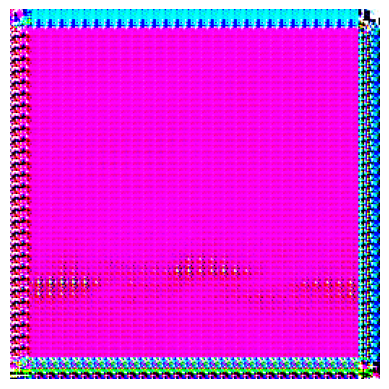

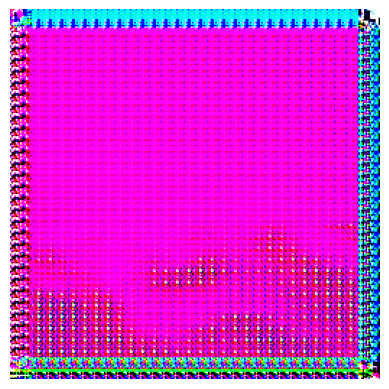

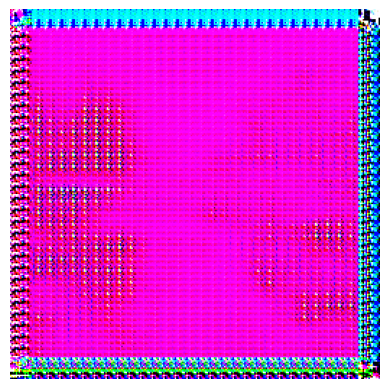

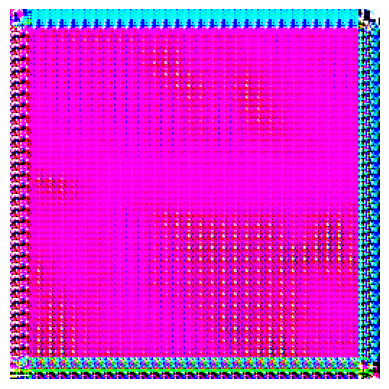

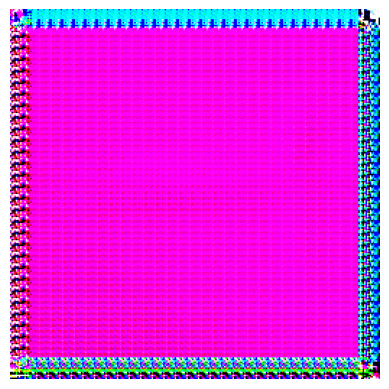

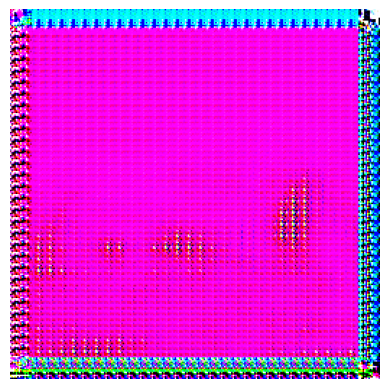

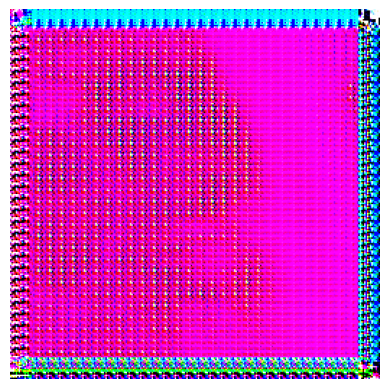

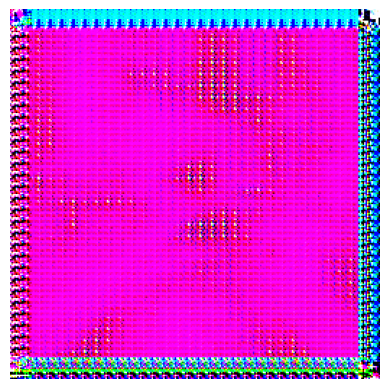

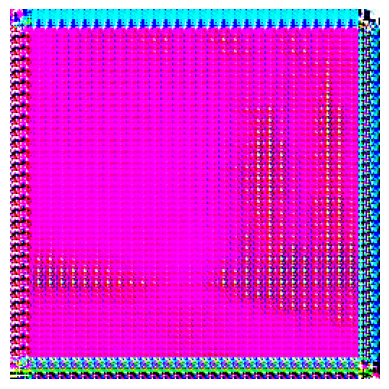

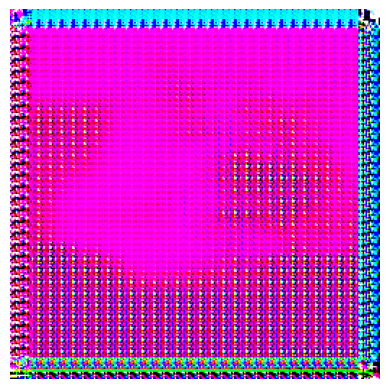

<Figure size 640x480 with 0 Axes>

In [ ]:

def show_images(generator, photo_images, num_images=10):
    gen_images = generator.predict(photo_images[:num_images])

    gen_images = (gen_images + 1) / 2.0

    for i in range(num_images):
        plt.imshow(gen_images[i])
        plt.axis('off')
        plt.show()

photo_images = photo_data
show_images(generator, photo_images, num_images=10)

# Results and Discussion

Disclaimer: As you can see right away something has clearly gone very wrong with the style transfer. I spent countless hours training GANs, trying different architectures, training styles and watching tutorials, working with TAs. After spending weeks training these models and gaining a better understanding, I had spent lots of money on compute credits for google colab. With a full time job and working with a tight budget, I have left this as is for now. I did my absolute best and believe this section was just beyond my comprehension after tackling the previous weeks with relative ease. I did my best to explain my code and the logical approach I took with these models, so bear with me I know the images are very poor. Thanks for tuning in to my project and I hope you enjoyed my work! I'm continuing to work at this in my spare time, but wanted to get this assignment in! Thanks for reading and understanding.

My approach to generator and discriminator architecture:

Using different combinations of convolution layers, filters, transposes and batch normalization techniques. I included different numbers of layers, combinations, and varying activation functions. After training 20-30 models over 100+ hours, I really did not have much success. It seems like suggestions I see online tell us to use any of these combinations, but once the main parts are down, it just takes hundreds of epochs. Not having the time or money, I experimented with many different combos, but did not have much luck. My plan going forward is to continue training when I have more time and compute power, but to continue learning about different styles. Since GAN images don't yet have an evaluated metric, it was best for me to compare them visually. It appears the best techniques include using a fairly simple discriminator, with about three primary convolution layers and then a flattening layer, each with filters and activations. For the generator, it was apparent that the leaky ReLU function was best. Additionally, it was very important to use a combination of convolution layers and transposed convolution layers, and when combined, were the core driver of the generator.

My next goals with this project are to continue to develop the models and spend more compute time to perfect them. While I certainly would not consider this project a success, I learned a ton throughout and really enjoyed working with the data, if only I could have done it right. I know I don't deserve a perfect grade, but please take into account my huge effort into this project. Thanks for joining me today!